In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
from sklearn.preprocessing import StandardScaler
plt.style.use('seaborn-whitegrid')
plt.rcParams['font.family'] = 'serif'

In [11]:
def adaptive_standardisation_outliers(df, window_size=7, limit_std=5):
    print('Outlier mitigation through adaptive standardisation...')
    df['Simple Date'] = df.Date.dt.strftime("%Y-%m-%d")
    df['Price_no_outliers'] = df.Price
    for idx, row in df.iterrows():
        print(100*round(idx/len(df), 4), "%")
        if idx >= window_size*24:
            df_aux = df[(pd.to_datetime(df['Simple Date']) < pd.to_datetime(row['Simple Date'])) & (pd.to_datetime(df['Simple Date']) >= pd.to_datetime(row['Simple Date']) - dt.timedelta(days=window_size))]
            
            scaler = StandardScaler()
            df_aux_price = df_aux['Price'].to_numpy().reshape(-1, 1)
            scaler.fit(df_aux_price)
            
            if df.loc[idx, 'Price'] > scaler.mean_ + limit_std * scaler.scale_:
                df.loc[idx, 'Price_no_outliers'] = scaler.mean_ + limit_std * scaler.scale_
                df.loc[idx, 'Price_no_outliers_2'] = df_aux.Price.median()
            elif df.loc[idx, 'Price'] < scaler.mean_ - limit_std * scaler.scale_:
                df.loc[idx, 'Price_no_outliers'] = scaler.mean_ - limit_std * scaler.scale_
                df.loc[idx, 'Price_no_outliers_2'] = df_aux.Price.median()
    return df

In [23]:
datasets = ["SP_2023.csv", "DE_2023.csv", "BE.csv", "FR.csv", "NP.csv"]
dict_datastets = {dataset: np.nan for dataset in datasets}
for dataset in datasets:
    print(dataset)
    df = pd.read_csv(f"Data//{dataset}")
    df['Date'] = pd.to_datetime(df.Date)
    df.columns = ['Date', 'Price', 'Exogenous 1', 'Exogenous 2']
    dict_datastets[dataset] = adaptive_standardisation_outliers(df, window_size=7, limit_std=5)

BE.csv
Outlier mitigation through adaptive standardisation...
0.0 %
0.0 %
0.0 %
0.01 %
0.01 %
0.01 %
0.01 %
0.01 %
0.02 %
0.02 %
0.02 %
0.02 %
0.02 %
0.02 %
0.03 %
0.03 %
0.03 %
0.03 %
0.03 %
0.04 %
0.04 %
0.04 %
0.04 %
0.04 %
0.05 %
0.05 %
0.05 %
0.05 %
0.05 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.08 %
0.08 %
0.08 %
0.08 %
0.08 %
0.09 %
0.09 %
0.09 %
0.09 %
0.09 %
0.1 %
0.1 %
0.1 %
0.1 %
0.1 %
0.1 %
0.11 %
0.11 %
0.11 %
0.11 %
0.11 %
0.12 %
0.12 %
0.12 %
0.12 %
0.12 %
0.13 %
0.13 %
0.13 %
0.13 %
0.13 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.15 %
0.15 %
0.15 %
0.15 %
0.15 %
0.16 %
0.16 %
0.16 %
0.16 %
0.16 %
0.16999999999999998 %
0.16999999999999998 %
0.16999999999999998 %
0.16999999999999998 %
0.16999999999999998 %
0.18 %
0.18 %
0.18 %
0.18 %
0.18 %
0.19 %
0.19 %
0.19 %
0.19 %


1.49 %
1.49 %
1.49 %
1.49 %
1.49 %
1.5 %
1.5 %
1.5 %
1.5 %
1.5 %
1.51 %
1.51 %
1.51 %
1.51 %
1.51 %
1.51 %
1.52 %
1.52 %
1.52 %
1.52 %
1.52 %
1.53 %
1.53 %
1.53 %
1.53 %
1.53 %
1.54 %
1.54 %
1.54 %
1.54 %
1.54 %
1.55 %
1.55 %
1.55 %
1.55 %
1.55 %
1.55 %
1.5599999999999998 %
1.5599999999999998 %
1.5599999999999998 %
1.5599999999999998 %
1.5599999999999998 %
1.5699999999999998 %
1.5699999999999998 %
1.5699999999999998 %
1.5699999999999998 %
1.5699999999999998 %
1.58 %
1.58 %
1.58 %
1.58 %
1.58 %
1.59 %
1.59 %
1.59 %
1.59 %
1.59 %
1.59 %
1.6 %
1.6 %
1.6 %
1.6 %
1.6 %
1.6099999999999999 %
1.6099999999999999 %
1.6099999999999999 %
1.6099999999999999 %
1.6099999999999999 %
1.6199999999999999 %
1.6199999999999999 %
1.6199999999999999 %
1.6199999999999999 %
1.6199999999999999 %
1.63 %
1.63 %
1.63 %
1.63 %
1.63 %
1.63 %
1.6400000000000001 %
1.6400000000000001 %
1.6400000000000001 %
1.6400000000000001 %
1.6400000000000001 %
1.6500000000000001 %
1.6500000000000001 %
1.6500000000000001 %
1.6500000

3.01 %
3.01 %
3.02 %
3.02 %
3.02 %
3.02 %
3.02 %
3.0300000000000002 %
3.0300000000000002 %
3.0300000000000002 %
3.0300000000000002 %
3.0300000000000002 %
3.04 %
3.04 %
3.04 %
3.04 %
3.04 %
3.04 %
3.05 %
3.05 %
3.05 %
3.05 %
3.05 %
3.06 %
3.06 %
3.06 %
3.06 %
3.06 %
3.0700000000000003 %
3.0700000000000003 %
3.0700000000000003 %
3.0700000000000003 %
3.0700000000000003 %
3.08 %
3.08 %
3.08 %
3.08 %
3.08 %
3.08 %
3.09 %
3.09 %
3.09 %
3.09 %
3.09 %
3.1 %
3.1 %
3.1 %
3.1 %
3.1 %
3.11 %
3.11 %
3.11 %
3.11 %
3.11 %
3.1199999999999997 %
3.1199999999999997 %
3.1199999999999997 %
3.1199999999999997 %
3.1199999999999997 %
3.1199999999999997 %
3.1300000000000003 %
3.1300000000000003 %
3.1300000000000003 %
3.1300000000000003 %
3.1300000000000003 %
3.1399999999999997 %
3.1399999999999997 %
3.1399999999999997 %
3.1399999999999997 %
3.1399999999999997 %
3.15 %
3.15 %
3.15 %
3.15 %
3.15 %
3.16 %
3.16 %
3.16 %
3.16 %
3.16 %
3.17 %
3.17 %
3.17 %
3.17 %
3.17 %
3.17 %
3.18 %
3.18 %
3.18 %
3.18 %
3.18 %
3.19

4.41 %
4.41 %
4.41 %
4.41 %
4.41 %
4.42 %
4.42 %
4.42 %
4.42 %
4.42 %
4.43 %
4.43 %
4.43 %
4.43 %
4.43 %
4.44 %
4.44 %
4.44 %
4.44 %
4.44 %
4.45 %
4.45 %
4.45 %
4.45 %
4.45 %
4.45 %
4.46 %
4.46 %
4.46 %
4.46 %
4.46 %
4.47 %
4.47 %
4.47 %
4.47 %
4.47 %
4.4799999999999995 %
4.4799999999999995 %
4.4799999999999995 %
4.4799999999999995 %
4.4799999999999995 %
4.49 %
4.49 %
4.49 %
4.49 %
4.49 %
4.49 %
4.5 %
4.5 %
4.5 %
4.5 %
4.5 %
4.51 %
4.51 %
4.51 %
4.51 %
4.51 %
4.52 %
4.52 %
4.52 %
4.52 %
4.52 %
4.53 %
4.53 %
4.53 %
4.53 %
4.53 %
4.53 %
4.54 %
4.54 %
4.54 %
4.54 %
4.54 %
4.55 %
4.55 %
4.55 %
4.55 %
4.55 %
4.5600000000000005 %
4.5600000000000005 %
4.5600000000000005 %
4.5600000000000005 %
4.5600000000000005 %
4.569999999999999 %
4.569999999999999 %
4.569999999999999 %
4.569999999999999 %
4.569999999999999 %
4.569999999999999 %
4.58 %
4.58 %
4.58 %
4.58 %
4.58 %
4.590000000000001 %
4.590000000000001 %
4.590000000000001 %
4.590000000000001 %
4.590000000000001 %
4.6 %
4.6 %
4.6 %
4.6 %
4.6 %

5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.99 %
5.99 %
5.99 %
5.99 %
5.99 %
6.0 %
6.0 %
6.0 %
6.0 %
6.0 %
6.01 %
6.01 %
6.01 %
6.01 %
6.01 %
6.02 %
6.02 %
6.02 %
6.02 %
6.02 %
6.02 %
6.03 %
6.03 %
6.03 %
6.03 %
6.03 %
6.04 %
6.04 %
6.04 %
6.04 %
6.04 %
6.05 %
6.05 %
6.05 %
6.05 %
6.05 %
6.0600000000000005 %
6.0600000000000005 %
6.0600000000000005 %
6.0600000000000005 %
6.0600000000000005 %
6.0600000000000005 %
6.069999999999999 %
6.069999999999999 %
6.069999999999999 %
6.069999999999999 %
6.069999999999999 %
6.08 %
6.08 %
6.08 %
6.08 %
6.08 %
6.09 %
6.09 %
6.09 %
6.09 %
6.09 %
6.1 %
6.1 %
6.1 %
6.1 %
6.1 %
6.11 %
6.11 %
6.11 %
6.11 %
6.11 %
6.11 %
6.12 %
6.12 %
6.12 %
6.12 %
6.12 %
6.13 %
6.13 %
6.13 %
6.13 %
6.13 %
6.140000000000001 %
6.140000000000001 %
6.140000000000001 %
6.140000000000001 %
6.140000000000001 %
6.15 %
6.15 %
6.15 %
6.15 %
6.15 %
6.15 %
6.16 %
6.16 %
6.16 %
6.16 %
6.16 %
6.17 %
6.17 

7.35 %
7.35 %
7.35 %
7.359999999999999 %
7.359999999999999 %
7.359999999999999 %
7.359999999999999 %
7.359999999999999 %
7.37 %
7.37 %
7.37 %
7.37 %
7.37 %
7.380000000000001 %
7.380000000000001 %
7.380000000000001 %
7.380000000000001 %
7.380000000000001 %
7.39 %
7.39 %
7.39 %
7.39 %
7.39 %
7.39 %
7.3999999999999995 %
7.3999999999999995 %
7.3999999999999995 %
7.3999999999999995 %
7.3999999999999995 %
7.41 %
7.41 %
7.41 %
7.41 %
7.41 %
7.42 %
7.42 %
7.42 %
7.42 %
7.42 %
7.430000000000001 %
7.430000000000001 %
7.430000000000001 %
7.430000000000001 %
7.430000000000001 %
7.430000000000001 %
7.4399999999999995 %
7.4399999999999995 %
7.4399999999999995 %
7.4399999999999995 %
7.4399999999999995 %
7.449999999999999 %
7.449999999999999 %
7.449999999999999 %
7.449999999999999 %
7.449999999999999 %
7.46 %
7.46 %
7.46 %
7.46 %
7.46 %
7.470000000000001 %
7.470000000000001 %
7.470000000000001 %
7.470000000000001 %
7.470000000000001 %
7.470000000000001 %
7.48 %
7.48 %
7.48 %
7.48 %
7.48 %
7.4899999999

8.780000000000001 %
8.780000000000001 %
8.780000000000001 %
8.780000000000001 %
8.780000000000001 %
8.790000000000001 %
8.790000000000001 %
8.790000000000001 %
8.790000000000001 %
8.790000000000001 %
8.799999999999999 %
8.799999999999999 %
8.799999999999999 %
8.799999999999999 %
8.799999999999999 %
8.799999999999999 %
8.81 %
8.81 %
8.81 %
8.81 %
8.81 %
8.82 %
8.82 %
8.82 %
8.82 %
8.82 %
8.83 %
8.83 %
8.83 %
8.83 %
8.83 %
8.84 %
8.84 %
8.84 %
8.84 %
8.84 %
8.84 %
8.85 %
8.85 %
8.85 %
8.85 %
8.85 %
8.86 %
8.86 %
8.86 %
8.86 %
8.86 %
8.870000000000001 %
8.870000000000001 %
8.870000000000001 %
8.870000000000001 %
8.870000000000001 %
8.88 %
8.88 %
8.88 %
8.88 %
8.88 %
8.88 %
8.89 %
8.89 %
8.89 %
8.89 %
8.89 %
8.9 %
8.9 %
8.9 %
8.9 %
8.9 %
8.91 %
8.91 %
8.91 %
8.91 %
8.91 %
8.92 %
8.92 %
8.92 %
8.92 %
8.92 %
8.92 %
8.93 %
8.93 %
8.93 %
8.93 %
8.93 %
8.94 %
8.94 %
8.94 %
8.94 %
8.94 %
8.95 %
8.95 %
8.95 %
8.95 %
8.95 %
8.959999999999999 %
8.959999999999999 %
8.959999999999999 %
8.959999999999

10.39 %
10.39 %
10.4 %
10.4 %
10.4 %
10.4 %
10.4 %
10.41 %
10.41 %
10.41 %
10.41 %
10.41 %
10.41 %
10.42 %
10.42 %
10.42 %
10.42 %
10.42 %
10.43 %
10.43 %
10.43 %
10.43 %
10.43 %
10.440000000000001 %
10.440000000000001 %
10.440000000000001 %
10.440000000000001 %
10.440000000000001 %
10.45 %
10.45 %
10.45 %
10.45 %
10.45 %
10.45 %
10.459999999999999 %
10.459999999999999 %
10.459999999999999 %
10.459999999999999 %
10.459999999999999 %
10.47 %
10.47 %
10.47 %
10.47 %
10.47 %
10.48 %
10.48 %
10.48 %
10.48 %
10.48 %
10.489999999999998 %
10.489999999999998 %
10.489999999999998 %
10.489999999999998 %
10.489999999999998 %
10.489999999999998 %
10.5 %
10.5 %
10.5 %
10.5 %
10.5 %
10.51 %
10.51 %
10.51 %
10.51 %
10.51 %
10.52 %
10.52 %
10.52 %
10.52 %
10.52 %
10.530000000000001 %
10.530000000000001 %
10.530000000000001 %
10.530000000000001 %
10.530000000000001 %
10.530000000000001 %
10.54 %
10.54 %
10.54 %
10.54 %
10.54 %
10.549999999999999 %
10.549999999999999 %
10.549999999999999 %
10.5499999999

11.91 %
11.92 %
11.92 %
11.92 %
11.92 %
11.92 %
11.93 %
11.93 %
11.93 %
11.93 %
11.93 %
11.940000000000001 %
11.940000000000001 %
11.940000000000001 %
11.940000000000001 %
11.940000000000001 %
11.940000000000001 %
11.95 %
11.95 %
11.95 %
11.95 %
11.95 %
11.959999999999999 %
11.959999999999999 %
11.959999999999999 %
11.959999999999999 %
11.959999999999999 %
11.97 %
11.97 %
11.97 %
11.97 %
11.97 %
11.98 %
11.98 %
11.98 %
11.98 %
11.98 %
11.98 %
11.99 %
11.99 %
11.99 %
11.99 %
11.99 %
12.0 %
12.0 %
12.0 %
12.0 %
12.0 %
12.01 %
12.01 %
12.01 %
12.01 %
12.01 %
12.02 %
12.02 %
12.02 %
12.02 %
12.02 %
12.02 %
12.030000000000001 %
12.030000000000001 %
12.030000000000001 %
12.030000000000001 %
12.030000000000001 %
12.04 %
12.04 %
12.04 %
12.04 %
12.04 %
12.049999999999999 %
12.049999999999999 %
12.049999999999999 %
12.049999999999999 %
12.049999999999999 %
12.06 %
12.06 %
12.06 %
12.06 %
12.06 %
12.07 %
12.07 %
12.07 %
12.07 %
12.07 %
12.07 %
12.08 %
12.08 %
12.08 %
12.08 %
12.08 %
12.09 %
12.0

13.239999999999998 %
13.239999999999998 %
13.239999999999998 %
13.239999999999998 %
13.25 %
13.25 %
13.25 %
13.25 %
13.25 %
13.26 %
13.26 %
13.26 %
13.26 %
13.26 %
13.270000000000001 %
13.270000000000001 %
13.270000000000001 %
13.270000000000001 %
13.270000000000001 %
13.270000000000001 %
13.28 %
13.28 %
13.28 %
13.28 %
13.28 %
13.29 %
13.29 %
13.29 %
13.29 %
13.29 %
13.3 %
13.3 %
13.3 %
13.3 %
13.3 %
13.309999999999999 %
13.309999999999999 %
13.309999999999999 %
13.309999999999999 %
13.309999999999999 %
13.309999999999999 %
13.320000000000002 %
13.320000000000002 %
13.320000000000002 %
13.320000000000002 %
13.320000000000002 %
13.33 %
13.33 %
13.33 %
13.33 %
13.33 %
13.34 %
13.34 %
13.34 %
13.34 %
13.34 %
13.350000000000001 %
13.350000000000001 %
13.350000000000001 %
13.350000000000001 %
13.350000000000001 %
13.350000000000001 %
13.36 %
13.36 %
13.36 %
13.36 %
13.36 %
13.370000000000001 %
13.370000000000001 %
13.370000000000001 %
13.370000000000001 %
13.370000000000001 %
13.38 %
13.38

14.499999999999998 %
14.510000000000002 %
14.510000000000002 %
14.510000000000002 %
14.510000000000002 %
14.510000000000002 %
14.510000000000002 %
14.52 %
14.52 %
14.52 %
14.52 %
14.52 %
14.530000000000001 %
14.530000000000001 %
14.530000000000001 %
14.530000000000001 %
14.530000000000001 %
14.540000000000001 %
14.540000000000001 %
14.540000000000001 %
14.540000000000001 %
14.540000000000001 %
14.549999999999999 %
14.549999999999999 %
14.549999999999999 %
14.549999999999999 %
14.549999999999999 %
14.549999999999999 %
14.56 %
14.56 %
14.56 %
14.56 %
14.56 %
14.57 %
14.57 %
14.57 %
14.57 %
14.57 %
14.580000000000002 %
14.580000000000002 %
14.580000000000002 %
14.580000000000002 %
14.580000000000002 %
14.59 %
14.59 %
14.59 %
14.59 %
14.59 %
14.59 %
14.6 %
14.6 %
14.6 %
14.6 %
14.6 %
14.610000000000001 %
14.610000000000001 %
14.610000000000001 %
14.610000000000001 %
14.610000000000001 %
14.62 %
14.62 %
14.62 %
14.62 %
14.62 %
14.63 %
14.63 %
14.63 %
14.63 %
14.63 %
14.63 %
14.64 %
14.64 %


15.709999999999999 %
15.709999999999999 %
15.709999999999999 %
15.709999999999999 %
15.709999999999999 %
15.72 %
15.72 %
15.72 %
15.72 %
15.72 %
15.73 %
15.73 %
15.73 %
15.73 %
15.73 %
15.740000000000002 %
15.740000000000002 %
15.740000000000002 %
15.740000000000002 %
15.740000000000002 %
15.75 %
15.75 %
15.75 %
15.75 %
15.75 %
15.75 %
15.76 %
15.76 %
15.76 %
15.76 %
15.76 %
15.770000000000001 %
15.770000000000001 %
15.770000000000001 %
15.770000000000001 %
15.770000000000001 %
15.78 %
15.78 %
15.78 %
15.78 %
15.78 %
15.790000000000001 %
15.790000000000001 %
15.790000000000001 %
15.790000000000001 %
15.790000000000001 %
15.790000000000001 %
15.8 %
15.8 %
15.8 %
15.8 %
15.8 %
15.809999999999999 %
15.809999999999999 %
15.809999999999999 %
15.809999999999999 %
15.809999999999999 %
15.82 %
15.82 %
15.82 %
15.82 %
15.82 %
15.83 %
15.83 %
15.83 %
15.83 %
15.83 %
15.83 %
15.840000000000002 %
15.840000000000002 %
15.840000000000002 %
15.840000000000002 %
15.840000000000002 %
15.85 %
15.85 %
15

17.119999999999997 %
17.119999999999997 %
17.119999999999997 %
17.119999999999997 %
17.119999999999997 %
17.130000000000003 %
17.130000000000003 %
17.130000000000003 %
17.130000000000003 %
17.130000000000003 %
17.14 %
17.14 %
17.14 %
17.14 %
17.14 %
17.150000000000002 %
17.150000000000002 %
17.150000000000002 %
17.150000000000002 %
17.150000000000002 %
17.16 %
17.16 %
17.16 %
17.16 %
17.16 %
17.16 %
17.169999999999998 %
17.169999999999998 %
17.169999999999998 %
17.169999999999998 %
17.169999999999998 %
17.18 %
17.18 %
17.18 %
17.18 %
17.18 %
17.19 %
17.19 %
17.19 %
17.19 %
17.19 %
17.2 %
17.2 %
17.2 %
17.2 %
17.2 %
17.2 %
17.21 %
17.21 %
17.21 %
17.21 %
17.21 %
17.22 %
17.22 %
17.22 %
17.22 %
17.22 %
17.23 %
17.23 %
17.23 %
17.23 %
17.23 %
17.24 %
17.24 %
17.24 %
17.24 %
17.24 %
17.24 %
17.25 %
17.25 %
17.25 %
17.25 %
17.25 %
17.26 %
17.26 %
17.26 %
17.26 %
17.26 %
17.27 %
17.27 %
17.27 %
17.27 %
17.27 %
17.28 %
17.28 %
17.28 %
17.28 %
17.28 %
17.28 %
17.29 %
17.29 %
17.29 %
17.29 %
17

18.62 %
18.63 %
18.63 %
18.63 %
18.63 %
18.63 %
18.64 %
18.64 %
18.64 %
18.64 %
18.64 %
18.65 %
18.65 %
18.65 %
18.65 %
18.65 %
18.65 %
18.66 %
18.66 %
18.66 %
18.66 %
18.66 %
18.67 %
18.67 %
18.67 %
18.67 %
18.67 %
18.68 %
18.68 %
18.68 %
18.68 %
18.68 %
18.69 %
18.69 %
18.69 %
18.69 %
18.69 %
18.69 %
18.7 %
18.7 %
18.7 %
18.7 %
18.7 %
18.709999999999997 %
18.709999999999997 %
18.709999999999997 %
18.709999999999997 %
18.709999999999997 %
18.72 %
18.72 %
18.72 %
18.72 %
18.72 %
18.73 %
18.73 %
18.73 %
18.73 %
18.73 %
18.73 %
18.740000000000002 %
18.740000000000002 %
18.740000000000002 %
18.740000000000002 %
18.740000000000002 %
18.75 %
18.75 %
18.75 %
18.75 %
18.75 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.77 %
18.77 %
18.77 %
18.77 %
18.77 %
18.77 %
18.78 %
18.78 %
18.78 %
18.78 %
18.78 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.8 %
18.8 %
18.8 %
18.8

20.169999999999998 %
20.169999999999998 %
20.169999999999998 %
20.18 %
20.18 %
20.18 %
20.18 %
20.18 %
20.18 %
20.19 %
20.19 %
20.19 %
20.19 %
20.19 %
20.200000000000003 %
20.200000000000003 %
20.200000000000003 %
20.200000000000003 %
20.200000000000003 %
20.21 %
20.21 %
20.21 %
20.21 %
20.21 %
20.22 %
20.22 %
20.22 %
20.22 %
20.22 %
20.22 %
20.23 %
20.23 %
20.23 %
20.23 %
20.23 %
20.24 %
20.24 %
20.24 %
20.24 %
20.24 %
20.25 %
20.25 %
20.25 %
20.25 %
20.25 %
20.26 %
20.26 %
20.26 %
20.26 %
20.26 %
20.26 %
20.27 %
20.27 %
20.27 %
20.27 %
20.27 %
20.28 %
20.28 %
20.28 %
20.28 %
20.28 %
20.29 %
20.29 %
20.29 %
20.29 %
20.29 %
20.3 %
20.3 %
20.3 %
20.3 %
20.3 %
20.3 %
20.31 %
20.31 %
20.31 %
20.31 %
20.31 %
20.32 %
20.32 %
20.32 %
20.32 %
20.32 %
20.330000000000002 %
20.330000000000002 %
20.330000000000002 %
20.330000000000002 %
20.330000000000002 %
20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999

21.67 %
21.67 %
21.67 %
21.67 %
21.67 %
21.67 %
21.68 %
21.68 %
21.68 %
21.68 %
21.68 %
21.69 %
21.69 %
21.69 %
21.69 %
21.69 %
21.7 %
21.7 %
21.7 %
21.7 %
21.7 %
21.709999999999997 %
21.709999999999997 %
21.709999999999997 %
21.709999999999997 %
21.709999999999997 %
21.709999999999997 %
21.72 %
21.72 %
21.72 %
21.72 %
21.72 %
21.73 %
21.73 %
21.73 %
21.73 %
21.73 %
21.740000000000002 %
21.740000000000002 %
21.740000000000002 %
21.740000000000002 %
21.740000000000002 %
21.75 %
21.75 %
21.75 %
21.75 %
21.75 %
21.75 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.77 %
21.77 %
21.77 %
21.77 %
21.77 %
21.78 %
21.78 %
21.78 %
21.78 %
21.78 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.8 %
21.8 %
21.8 %
21.8 %
21.8 %
21.81 %
21.81 %
21.81 %
21.81 %
21.81 %
21.82 %
21.82 %
21.82 %
21.82 %
21.82 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.8

23.169999999999998 %
23.18 %
23.18 %
23.18 %
23.18 %
23.18 %
23.189999999999998 %
23.189999999999998 %
23.189999999999998 %
23.189999999999998 %
23.189999999999998 %
23.200000000000003 %
23.200000000000003 %
23.200000000000003 %
23.200000000000003 %
23.200000000000003 %
23.200000000000003 %
23.21 %
23.21 %
23.21 %
23.21 %
23.21 %
23.22 %
23.22 %
23.22 %
23.22 %
23.22 %
23.23 %
23.23 %
23.23 %
23.23 %
23.23 %
23.24 %
23.24 %
23.24 %
23.24 %
23.24 %
23.24 %
23.25 %
23.25 %
23.25 %
23.25 %
23.25 %
23.26 %
23.26 %
23.26 %
23.26 %
23.26 %
23.27 %
23.27 %
23.27 %
23.27 %
23.27 %
23.28 %
23.28 %
23.28 %
23.28 %
23.28 %
23.28 %
23.29 %
23.29 %
23.29 %
23.29 %
23.29 %
23.3 %
23.3 %
23.3 %
23.3 %
23.3 %
23.31 %
23.31 %
23.31 %
23.31 %
23.31 %
23.32 %
23.32 %
23.32 %
23.32 %
23.32 %
23.32 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.34 %
23.34 %
23.34 %
23.34 %
23.34 %
23.35 %
23.35 %
23.35 %
23.35 %
23.35 %
23.36 %
23.36 %
23.36 %


24.67 %
24.67 %
24.67 %
24.68 %
24.68 %
24.68 %
24.68 %
24.68 %
24.69 %
24.69 %
24.69 %
24.69 %
24.69 %
24.69 %
24.7 %
24.7 %
24.7 %
24.7 %
24.7 %
24.709999999999997 %
24.709999999999997 %
24.709999999999997 %
24.709999999999997 %
24.709999999999997 %
24.72 %
24.72 %
24.72 %
24.72 %
24.72 %
24.73 %
24.73 %
24.73 %
24.73 %
24.73 %
24.73 %
24.740000000000002 %
24.740000000000002 %
24.740000000000002 %
24.740000000000002 %
24.740000000000002 %
24.75 %
24.75 %
24.75 %
24.75 %
24.75 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.77 %
24.77 %
24.77 %
24.77 %
24.77 %
24.77 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.79 %
24.79 %
24.79 %
24.79 %
24.79 %
24.8 %
24.8 %
24.8 %
24.8 %
24.8 %
24.81 %
24.81 %
24.81 %
24.81 %
24.81 %
24.81 %
24.82 %
24.82 %
24.82 %
24.82 %
24.82 %
24.83 %
24.83 %
24.83 %
24.83 %
24.83 %
24.84 %
24.84 %
24.84 %
24.84 %
24.84 %
24.85 %
24.85 

25.929999999999996 %
25.929999999999996 %
25.94 %
25.94 %
25.94 %
25.94 %
25.94 %
25.95 %
25.95 %
25.95 %
25.95 %
25.95 %
25.96 %
25.96 %
25.96 %
25.96 %
25.96 %
25.97 %
25.97 %
25.97 %
25.97 %
25.97 %
25.97 %
25.979999999999997 %
25.979999999999997 %
25.979999999999997 %
25.979999999999997 %
25.979999999999997 %
25.990000000000002 %
25.990000000000002 %
25.990000000000002 %
25.990000000000002 %
25.990000000000002 %
26.0 %
26.0 %
26.0 %
26.0 %
26.0 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.02 %
26.02 %
26.02 %
26.02 %
26.02 %
26.029999999999998 %
26.029999999999998 %
26.029999999999998 %
26.029999999999998 %
26.029999999999998 %
26.040000000000003 %
26.040000000000003 %
26.040000000000003 %
26.040000000000003 %
26.040000000000003 %
26.05 %
26.05 %
26.05 %
26.05 %
26.05 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.07 %
26.07 %
26.07 %
26.07 %
26.07 %
26.08 %
26.08 %
26.08 %
26.08 %
26.08 %
2

27.16 %
27.16 %
27.16 %
27.16 %
27.16 %
27.169999999999998 %
27.169999999999998 %
27.169999999999998 %
27.169999999999998 %
27.169999999999998 %
27.169999999999998 %
27.18 %
27.18 %
27.18 %
27.18 %
27.18 %
27.189999999999998 %
27.189999999999998 %
27.189999999999998 %
27.189999999999998 %
27.189999999999998 %
27.200000000000003 %
27.200000000000003 %
27.200000000000003 %
27.200000000000003 %
27.200000000000003 %
27.21 %
27.21 %
27.21 %
27.21 %
27.21 %
27.21 %
27.22 %
27.22 %
27.22 %
27.22 %
27.22 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.24 %
27.24 %
27.24 %
27.24 %
27.24 %
27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.26 %
27.26 %
27.26 %
27.26 %
27.26 %
27.26 %
27.27 %
27.27 %
27.27 %
27.27 %
27.27 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.29 %
27.29 %
27.29 %
27.29 %
27.29 %
27.3 %
27.3 %

28.449999999999996 %
28.449999999999996 %
28.449999999999996 %
28.449999999999996 %
28.449999999999996 %
28.46 %
28.46 %
28.46 %
28.46 %
28.46 %
28.46 %
28.470000000000002 %
28.470000000000002 %
28.470000000000002 %
28.470000000000002 %
28.470000000000002 %
28.48 %
28.48 %
28.48 %
28.48 %
28.48 %
28.49 %
28.49 %
28.49 %
28.49 %
28.49 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.51 %
28.51 %
28.51 %
28.51 %
28.51 %
28.52 %
28.52 %
28.52 %
28.52 %
28.52 %
28.53 %
28.53 %
28.53 %
28.53 %
28.53 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.57 %
28.57 %
28.57 %
28.57 %
28.57 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.59 %
28.59 %
28.59 %
28.59 %
28.59 %
28.599999999999998 %
28.599999

29.69 %
29.69 %
29.69 %
29.7 %
29.7 %
29.7 %
29.7 %
29.7 %
29.7 %
29.709999999999997 %
29.709999999999997 %
29.709999999999997 %
29.709999999999997 %
29.709999999999997 %
29.720000000000002 %
29.720000000000002 %
29.720000000000002 %
29.720000000000002 %
29.720000000000002 %
29.73 %
29.73 %
29.73 %
29.73 %
29.73 %
29.74 %
29.74 %
29.74 %
29.74 %
29.74 %
29.74 %
29.75 %
29.75 %
29.75 %
29.75 %
29.75 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.79 %
29.79 %
29.79 %
29.79 %
29.79 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.81 %
29.81 %
29.81 %
29.81 %
29.81 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %


30.9 %
30.91 %
30.91 %
30.91 %
30.91 %
30.91 %
30.919999999999998 %
30.919999999999998 %
30.919999999999998 %
30.919999999999998 %
30.919999999999998 %
30.930000000000003 %
30.930000000000003 %
30.930000000000003 %
30.930000000000003 %
30.930000000000003 %
30.94 %
30.94 %
30.94 %
30.94 %
30.94 %
30.94 %
30.95 %
30.95 %
30.95 %
30.95 %
30.95 %
30.959999999999997 %
30.959999999999997 %
30.959999999999997 %
30.959999999999997 %
30.959999999999997 %
30.97 %
30.97 %
30.97 %
30.97 %
30.97 %
30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
31.0 %
31.0 %
31.0 %
31.0 %
31.0 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.03 %
31.03 %
31.03 %
31.03 %
31.03 %
31.04 %
31.04 %
31.04 %
31.04 %
31.04 %
31.05 %
31.

32.1 %
32.1 %
32.1 %
32.11 %
32.11 %
32.11 %
32.11 %
32.11 %
32.12 %
32.12 %
32.12 %
32.12 %
32.12 %
32.129999999999995 %
32.129999999999995 %
32.129999999999995 %
32.129999999999995 %
32.129999999999995 %
32.14 %
32.14 %
32.14 %
32.14 %
32.14 %
32.14 %
32.15 %
32.15 %
32.15 %
32.15 %
32.15 %
32.16 %
32.16 %
32.16 %
32.16 %
32.16 %
32.17 %
32.17 %
32.17 %
32.17 %
32.17 %
32.18 %
32.18 %
32.18 %
32.18 %
32.18 %
32.18 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.2 %
32.2 %
32.2 %
32.2 %
32.2 %
32.21 %
32.21 %
32.21 %
32.21 %
32.21 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.23 %
32.23 %
32.23 %
32.23 %
32.23 %
32.24 %
32.24 %
32.24 %
32.24 %
32.24 %
32.25 %
32.25 %
32.25 %
32.25 %
32.25 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.28 %
32.28 %
32.28 %
32.28 %
32.28 %
32.29 %
32.29 %
32.29 %
32.29 %
32.29

33.61 %
33.61 %
33.62 %
33.62 %
33.62 %
33.62 %
33.62 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.64 %
33.64 %
33.64 %
33.64 %
33.64 %
33.650000000000006 %
33.650000000000006 %
33.650000000000006 %
33.650000000000006 %
33.650000000000006 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.68 %
33.68 %
33.68 %
33.68 %
33.68 %
33.69 %
33.69 %
33.69 %
33.69 %
33.69 %
33.7 %
33.7 %
33.7 %
33.7 %
33.7 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.72 %
33.72 %
33.72 %
33.72 %
33.72 %
33.73 %
33.73 %
33.73 %
33.73 %
33.73 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.76 %
33.76 %
33.76 %
33.76 %
33.76 %
33.77 %
33.77 %
33.77 %
33.77 %
33.77 %
33.78 %
33.78 %
33.78 %
33.78 %
33.78 %
33.7

35.05 %
35.06 %
35.06 %
35.06 %
35.06 %
35.06 %
35.07 %
35.07 %
35.07 %
35.07 %
35.07 %
35.08 %
35.08 %
35.08 %
35.08 %
35.08 %
35.08 %
35.089999999999996 %
35.089999999999996 %
35.089999999999996 %
35.089999999999996 %
35.089999999999996 %
35.099999999999994 %
35.099999999999994 %
35.099999999999994 %
35.099999999999994 %
35.099999999999994 %
35.11 %
35.11 %
35.11 %
35.11 %
35.11 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.13 %
35.13 %
35.13 %
35.13 %
35.13 %
35.14 %
35.14 %
35.14 %
35.14 %
35.14 %
35.15 %
35.15 %
35.15 %
35.15 %
35.15 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.17 %
35.17 %
35.17 %
35.17 %
35.17 %
35.18 %
35.18 %
35.18 %
35.18 %
35.18 %
35.19 %
35.19 %
35.19 %
35.19 %
35.19 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.19999999999999

36.53 %
36.54 %
36.54 %
36.54 %
36.54 %
36.54 %
36.55 %
36.55 %
36.55 %
36.55 %
36.55 %
36.559999999999995 %
36.559999999999995 %
36.559999999999995 %
36.559999999999995 %
36.559999999999995 %
36.57 %
36.57 %
36.57 %
36.57 %
36.57 %
36.57 %
36.58 %
36.58 %
36.58 %
36.58 %
36.58 %
36.59 %
36.59 %
36.59 %
36.59 %
36.59 %
36.6 %
36.6 %
36.6 %
36.6 %
36.6 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.63 %
36.63 %
36.63 %
36.63 %
36.63 %
36.64 %
36.64 %
36.64 %
36.64 %
36.64 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.66 %
36.66 %
36.66 %
36.66 %
36.66 %
36.67 %
36.67 %
36.67 %
36.67 %
36.67 %
36.68 %
36.68 %
36.68 %
36.68 %
36.68 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.7 %
36.7 %
36.7 %
36.7 %
36.7 %
36.71 %
36.71 %
36.71 %
36.71 %
36.71 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.730000000000

38.11 %
38.11 %
38.11 %
38.11 %
38.12 %
38.12 %
38.12 %
38.12 %
38.12 %
38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.14 %
38.14 %
38.14 %
38.14 %
38.14 %
38.14 %
38.15 %
38.15 %
38.15 %
38.15 %
38.15 %
38.16 %
38.16 %
38.16 %
38.16 %
38.16 %
38.17 %
38.17 %
38.17 %
38.17 %
38.17 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.2 %
38.2 %
38.2 %
38.2 %
38.2 %
38.21 %
38.21 %
38.21 %
38.21 %
38.21 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.23 %
38.23 %
38.23 %
38.23 %
38.23 %
38.24 %
38.24 %
38.24 %
38.24 %
38.24 %
38.25 %
38.25 %
38.25 %
38.25 %
38.25 %
38.26 %
38.26 %
38.26 %
38.26 %
38.26 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.279999

39.629999999999995 %
39.64 %
39.64 %
39.64 %
39.64 %
39.64 %
39.65 %
39.65 %
39.65 %
39.65 %
39.65 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.67 %
39.67 %
39.67 %
39.67 %
39.67 %
39.67 %
39.68 %
39.68 %
39.68 %
39.68 %
39.68 %
39.69 %
39.69 %
39.69 %
39.69 %
39.69 %
39.7 %
39.7 %
39.7 %
39.7 %
39.7 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.72 %
39.72 %
39.72 %
39.72 %
39.72 %
39.73 %
39.73 %
39.73 %
39.73 %
39.73 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.75 %
39.75 %
39.75 %
39.75 %
39.75 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.77 %
39.77 %
39.77 %
39.77 %
39.77 %
39.78 %
39.78 %
39.78 %
39.78 %
39.78 %
39.79 %
39.79 %
39.79 %
39.79 %
39.79 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.81 %
39.81 %
39.81 %
39.81 %
39.81 %
39.82 %
39.82 %
39.82 %


41.11 %
41.11 %
41.11 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.13 %
41.13 %
41.13 %
41.13 %
41.13 %
41.14 %
41.14 %
41.14 %
41.14 %
41.14 %
41.15 %
41.15 %
41.15 %
41.15 %
41.15 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.17 %
41.17 %
41.17 %
41.17 %
41.17 %
41.18 %
41.18 %
41.18 %
41.18 %
41.18 %
41.19 %
41.19 %
41.19 %
41.19 %
41.19 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.21 %
41.21 %
41.21 %
41.21 %
41.21 %
41.22 %
41.22 %
41.22 %
41.22 %
41.22 %
41.23 %
41.23 %
41.23 %
41.23 %
41.23 %
41.24 %
41.24 %
41.24 %
41.24 %
41.24 %
41.25 %
41.25 %
41.25 %
41.25 %
41.25 %
41.25 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.27 %
41.27 %
41.27 %
41.27 %
41.27 %
41.28

42.58 %
42.58 %
42.59 %
42.59 %
42.59 %
42.59 %
42.59 %
42.6 %
42.6 %
42.6 %
42.6 %
42.6 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.63 %
42.63 %
42.63 %
42.63 %
42.63 %
42.64 %
42.64 %
42.64 %
42.64 %
42.64 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.66 %
42.66 %
42.66 %
42.66 %
42.66 %
42.67 %
42.67 %
42.67 %
42.67 %
42.67 %
42.68 %
42.68 %
42.68 %
42.68 %
42.68 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.71 %
42.71 %
42.71 %
42.71 %
42.71 %
42.72 %
42.72 %
42.72 %
42.72 %
42.72 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.74 %
42.74 %
42.74 %
42.74 %
42.74 %
42.74 %
42.75 %
42.75 %
42.75 %
42.75 %
42.75 %
42.76 %
42.76 %
42.76 %
42.76 %
42.76 %
42.77 %
42.77 %
42.77 %
42.77 %
42.77 %
42

44.17 %
44.17 %
44.17 %
44.17 %
44.17 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.2 %
44.2 %
44.2 %
44.2 %
44.2 %
44.21 %
44.21 %
44.21 %
44.21 %
44.21 %
44.22 %
44.22 %
44.22 %
44.22 %
44.22 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.24 %
44.24 %
44.24 %
44.24 %
44.24 %
44.25 %
44.25 %
44.25 %
44.25 %
44.25 %
44.26 %
44.26 %
44.26 %
44.26 %
44.26 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.28 %
44.28 %
44.28 %
44.28 %
44.28 %
44.29 %
44.29 %
44.29 %
44.29 %
44.29 %
44.3 %
44.3 %
44.3 %
44.3 %
44.3 %
44.31 %
44.31 %
44.31 %
44.31 %
44.31 %
44.31 %
44.32 %
44.32 %
44.32 %
44.32 %
44.32 %
44.330000000000005 %
44.330000000000005 %
44.330000000000005 %
44.330000000000005 %
44.330000000000005 %
44.34 %
44.3

45.68 %
45.68 %
45.69 %
45.69 %
45.69 %
45.69 %
45.69 %
45.7 %
45.7 %
45.7 %
45.7 %
45.7 %
45.71 %
45.71 %
45.71 %
45.71 %
45.71 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.73 %
45.73 %
45.73 %
45.73 %
45.73 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.75 %
45.75 %
45.75 %
45.75 %
45.75 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.78 %
45.78 %
45.78 %
45.78 %
45.78 %
45.79 %
45.79 %
45.79 %
45.79 %
45.79 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.81 %
45.81 %
45.81 %
45.81 %
45.81 %
45.82 %
45.82 %
45.82 %
45.82 %
45.82 %
45.83 %
45.83 %
45.83 %
45.83 %
45.83 %
45.839999999999996 %
45.839999999999996 %
45.839999999999996 %
45.839999999999996 %
45.839999999999996 %
45.839999999999996 %
45.85 %
45.85 %
45.85 %
45.85 %

47.11 %
47.11 %
47.11 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.13 %
47.13 %
47.13 %
47.13 %
47.13 %
47.14 %
47.14 %
47.14 %
47.14 %
47.14 %
47.15 %
47.15 %
47.15 %
47.15 %
47.15 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.17 %
47.17 %
47.17 %
47.17 %
47.17 %
47.18 %
47.18 %
47.18 %
47.18 %
47.18 %
47.19 %
47.19 %
47.19 %
47.19 %
47.19 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.22 %
47.22 %
47.22 %
47.22 %
47.22 %
47.23 %
47.23 %
47.23 %
47.23 %
47.23 %
47.24 %
47.24 %
47.24 %
47.24 %
47.24 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %
47.260000000000005 %
47.260000000000005 %
47.260000000000005 %
47.260000000000005 %
47.260000000000005 %
47.27 %
47.27 %
47.27 %
47.27 %
47.27 %
47.28 %
47.28 %
47.28 %
47.28 %
47.28 %
47.29 %
47.29 %
47.29 %
47.29 %
47.29 %
47.29 %
47.3 %
4

48.559999999999995 %
48.559999999999995 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.58 %
48.58 %
48.58 %
48.58 %
48.58 %
48.59 %
48.59 %
48.59 %
48.59 %
48.59 %
48.6 %
48.6 %
48.6 %
48.6 %
48.6 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.63 %
48.63 %
48.63 %
48.63 %
48.63 %
48.64 %
48.64 %
48.64 %
48.64 %
48.64 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.66 %
48.66 %
48.66 %
48.66 %
48.66 %
48.67 %
48.67 %
48.67 %
48.67 %
48.67 %
48.68 %
48.68 %
48.68 %
48.68 %
48.68 %
48.69 %
48.69 %
48.69 %
48.69 %
48.69 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.71 %
48.71 %
48.71 %
48.71 %
48.71 %
48.72 %
48.72 %
48.72 %
48.72 %
48.72 %
48.730000000000004 %
48.730000000000004 %
48.730000000000004 %
48.730000000000004 %
48.730000000000004 %
48.74 %
48.74 %
48.74 %
48.74 %
48.74 %
48.

50.12 %
50.12 %
50.12 %
50.12 %
50.12 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.17 %
50.17 %
50.17 %
50.17 %
50.17 %
50.18 %
50.18 %
50.18 %
50.18 %
50.18 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.2 %
50.2 %
50.2 %
50.2 %
50.2 %
50.21 %
50.21 %
50.21 %
50.21 %
50.21 %
50.22 %
50.22 %
50.22 %
50.22 %
50.22 %
50.23 %
50.23 %
50.23 %
50.23 %
50.23 %
50.23 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.24999999999999 %
50.24999999999999 %
50.24999999999999 %
50.24999999999999 %
50.24999999999999 %
50.260000000000005 %
50.2600000000

51.349999999999994 %
51.349999999999994 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.38 %
51.38 %
51.38 %
51.38 %
51.38 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.4 %
51.4 %
51.4 %
51.4 %
51.4 %
51.41 %
51.41 %
51.41 %
51.41 %
51.41 %
51.42 %
51.42 %
51.42 %
51.42 %
51.42 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.44 %
51.44 %
51.44 %
51.44 %
51.44 %
51.449999999999996 %
51.449999999999996 %
51.449999999999996 %
51.449999999999996 %
51.449999999999996 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.470000000000006 %
51.470000000000006 %
51.470000000000006 %
51.470000000000006 %
51.470000000000006 %
51.470000000000006 %
51.480000000000004 %
51.480000000000004 %
51.480000000000004 %
51.480000000000004 %
51.480000000000004 %
51.49 %
51.49 %
51.49

52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.6 %
52.6 %
52.6 %
52.6 %
52.6 %
52.61 %
52.61 %
52.61 %
52.61 %
52.61 %
52.62 %
52.62 %
52.62 %
52.62 %
52.62 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.64 %
52.64 %
52.64 %
52.64 %
52.64 %
52.65 %
52.65 %
52.65 %
52.65 %
52.65 %
52.66 %
52.66 %
52.66 %
52.66 %
52.66 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.68000000000001 %
52.68000000000001 %
52.68000000000001 %
52.68000000000001 %
52.68000000000001 %
52.690000000000005 %
52.690000000000005 %
52.690000000000005 %
52.690000000000005 %
52.690000000000005 %
52.7 %
52.7 %
52.7 %
52.7 %
52.7 %
52.71 %
52.71 %
52.71 %
52.71 %
52.71 %


53.800000000000004 %
53.81 %
53.81 %
53.81 %
53.81 %
53.81 %
53.82 %
53.82 %
53.82 %
53.82 %
53.82 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.86 %
53.86 %
53.86 %
53.86 %
53.86 %
53.87 %
53.87 %
53.87 %
53.87 %
53.87 %
53.87 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.900000000000006 %
53.900000000000006 %
53.900000000000006 %
53.900000000000006 %
53.900000000000006 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.92 %
53.92 %
53.92 %
53.92 %
53.92 %
53.93 %
53.93 %
53.93 %
53.93 %
53.93 %
53.94 %
53.94 %
53.94 %
53.94 %
53.94

55.010000000000005 %
55.010000000000005 %
55.02 %
55.02 %
55.02 %
55.02 %
55.02 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.04 %
55.04 %
55.04 %
55.04 %
55.04 %
55.05 %
55.05 %
55.05 %
55.05 %
55.05 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.08 %
55.08 %
55.08 %
55.08 %
55.08 %
55.089999999999996 %
55.089999999999996 %
55.089999999999996 %
55.089999999999996 %
55.089999999999996 %
55.1 %
55.1 %
55.1 %
55.1 %
55.1 %
55.11000000000001 %
55.11000000000001 %
55.11000000000001 %
55.11000000000001 %
55.11000000000001 %
55.11000000000001 %
55.120000000000005 %
55.120000000000005 %
55.120000000000005 %
55.120000000000005 %
55.120000000000005 %
55.13 %
55.13 %
55.13 %
55.13 %
55.13 %
55.14 %
55.14 %
55.14 %
55.14 %
55.14 %
55.15 %
55.15 %
55.15 %
55.15 %
55.15 %
55.15 %
55.16 %
55.16 %
55.16 %
55.16 %


56.26 %
56.26 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.3 %
56.3 %
56.3 %
56.3 %
56.3 %
56.31 %
56.31 %
56.31 %
56.31 %
56.31 %
56.31 %
56.32 %
56.32 %
56.32 %
56.32 %
56.32 %
56.330000000000005 %
56.330000000000005 %
56.330000000000005 %
56.330000000000005 %
56.330000000000005 %
56.34 %
56.34 %
56.34 %
56.34 %
56.34 %
56.35 %
56.35 %
56.35 %
56.35 %
56.35 %
56.35 %
56.36 %
56.36 %
56.36 %
56.36 %
56.36 %
56.37 %
56.37 %
56.37 %
56.37 %
56.37 %
56.379999999999995 %
56.379999999999995 %
56.379999999999995 %
56.379999999999995 %
56.379999999999995 %
56.38999999999999 %
56.38999999999999 %
56.38999999999999 %
56.38999999999999 %
56.38999999999999 %
56.38999999999999 %
56.39999999999999 %
56.399999999

57.49999999999999 %
57.49999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.52 %
57.52 %
57.52 %
57.52 %
57.52 %
57.53 %
57.53 %
57.53 %
57.53 %
57.53 %
57.54 %
57.54 %
57.54 %
57.54 %
57.54 %
57.550000000000004 %
57.550000000000004 %
57.550000000000004 %
57.550000000000004 %
57.550000000000004 %
57.550000000000004 %
57.56 %
57.56 %
57.56 %
57.56 %
57.56 %
57.57 %
57.57 %
57.57 %
57.57 %
57.57 %
57.58 %
57.58 %
57.58 %
57.58 %
57.58 %
57.589999999999996 %
57.589999999999996 %
57.589999999999996 %
57.589999999999996 %
57.589999999999996 %
57.599999999999994 %
57.599999999999994 %
57.599999999999994 %
57.599999999999994 %
57.599999999999994 %
57.599999999999994 %
57.60999999999999 %
57.60999999999999 %
57.60999999999999 %
57.60999999999999 %
57.60999999999999 %
57.620000000000005 %
57.620000000000005 %
57.620000000000005 %
57.620000000000005 %
57.620000000000005 %
57.63 %
57.63 %
57.63 %
57.63 %
57.63 

58.720000000000006 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.74 %
58.74 %
58.74 %
58.74 %
58.74 %
58.75 %
58.75 %
58.75 %
58.75 %
58.75 %
58.75 %
58.76 %
58.76 %
58.76 %
58.76 %
58.76 %
58.77 %
58.77 %
58.77 %
58.77 %
58.77 %
58.78 %
58.78 %
58.78 %
58.78 %
58.78 %
58.79 %
58.79 %
58.79 %
58.79 %
58.79 %
58.8 %
58.8 %
58.8 %
58.8 %
58.8 %
58.8 %
58.809999999999995 %
58.809999999999995 %
58.809999999999995 %
58.809999999999995 %
58.809999999999995 %
58.81999999999999 %
58.81999999999999 %
58.81999999999999 %
58.81999999999999 %
58.81999999999999 %
58.830000000000005 %
58.830000000000005 %
58.830000000000005 %
58.830000000000005 %
58.830000000000005 %
58.84 %
58.84 %
58.84 %
58.84 %
58.84 %
58.84 %
58.85 %
58.85 %
58.85 %
58.85 %
58.85 %
58.86 %
58.86 %
58.86 %
58.86 %
58.86 %
58.87 %
58.87 %
58.87 %
58.87 %
58.87 %
58.879999999999995 %
58.879999999999995 %
58.879999999999995 %
58.879999999999995 %
58.879999999999995 %
5

59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.96 %
59.96 %
59.96 %
59.96 %
59.96 %
59.97 %
59.97 %
59.97 %
59.97 %
59.97 %
59.98 %
59.98 %
59.98 %
59.98 %
59.98 %
59.99 %
59.99 %
59.99 %
59.99 %
59.99 %
60.0 %
60.0 %
60.0 %
60.0 %
60.0 %
60.0 %
60.01 %
60.01 %
60.01 %
60.01 %
60.01 %
60.019999999999996 %
60.019999999999996 %
60.019999999999996 %
60.019999999999996 %
60.019999999999996 %
60.029999999999994 %
60.029999999999994 %
60.029999999999994 %
60.029999999999994 %
60.029999999999994 %
60.040000000000006 %
60.040000000000006 %
60.040000000000006 %
60.040000000000006 %
60.040000000000006 %
60.040000000000006 %
60.050000000000004 %
60.050000000000004 %
60.050000000000004 %
60.050000000000004 %
60.050000000000004 %
60.06 %
60.06 %
60.06 %
60.06 %
60.06 %
60.07 %
60.07 %
60.07 %
60.07 %
60.07 %
60.08 %
60.08 %
60.08 %
60.08 %
60.08 %
60.08 %
60.089999999999996 %
60.089999999999996 %
60.089999999999996 %
60.089999999999

61.150000000000006 %
61.150000000000006 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.17 %
61.17 %
61.17 %
61.17 %
61.17 %
61.18 %
61.18 %
61.18 %
61.18 %
61.18 %
61.19 %
61.19 %
61.19 %
61.19 %
61.19 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.21 %
61.21 %
61.21 %
61.21 %
61.21 %
61.22 %
61.22 %
61.22 %
61.22 %
61.22 %
61.23 %
61.23 %
61.23 %
61.23 %
61.23 %
61.24000000000001 %
61.24000000000001 %
61.24000000000001 %
61.24000000000001 %
61.24000000000001 %
61.24000000000001 %
61.25000000000001 %
61.25000000000001 %
61.25000000000001 %
61.25000000000001 %
61.25000000000001 %
61.260000000000005 %
61.260000000000005 %
61.260000000000005 %
61.260000000000005 %
61.260000000000005 %
61.27 %
61.27 %
61.27 %
61.27 %
61.27 %
61.28 %
61.28 %
61.28 %
61.28 %
61.28 %
61.28 %
61.29 %
61.29 %
61.29 %
61.29 %
61.29 %
61.3 %
61.3 %
61.3 %
61.3 %
61.3 %

62.38 %
62.38 %
62.39 %
62.39 %
62.39 %
62.39 %
62.39 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.41 %
62.41 %
62.41 %
62.41 %
62.41 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.43 %
62.43 %
62.43 %
62.43 %
62.43 %
62.44 %
62.44 %
62.44 %
62.44 %
62.44 %
62.44 %
62.45 %
62.45 %
62.45 %
62.45 %
62.45 %
62.46000000000001 %
62.46000000000001 %
62.46000000000001 %
62.46000000000001 %
62.46000000000001 %
62.470000000000006 %
62.470000000000006 %
62.470000000000006 %
62.470000000000006 %
62.470000000000006 %
62.480000000000004 %
62.480000000000004 %
62.480000000000004 %
62.480000000000004 %
62.480000000000004 %
62.480000000000004 %
62.49 %
62.49 %
62.49 %
62.49 %
62.49 %
62.5 %
62.5 %
62.5 %
62.5 %
62.5 %
62.51 %
62.51 %
62.51 %
62.51 %
62.51 %
62.519999999999996 %
62.519999999999996 %
62.519999999999996 %
62.519999999999996 %
62.519999999999996 %
62.519999999999996 %
62.529999999999994 %
62.529999999999994 %
62.529999999999

63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.65 %
63.65 %
63.65 %
63.65 %
63.65 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.67 %
63.67 %
63.67 %
63.67 %
63.67 %
63.68000000000001 %
63.68000000000001 %
63.68000000000001 %
63.68000000000001 %
63.68000000000001 %
63.68000000000001 %
63.690000000000005 %
63.690000000000005 %
63.690000000000005 %
63.690000000000005 %
63.690000000000005 %
63.7 %
63.7 %
63.7 %
63.7 %
63.7 %
63.71 %
63.71 %
63.71 %
63.71 %
63.71 %
63.72 %
63.72 %
63.72 %
63.72 %
63.72 %
63.72 %
63.73 %
63.73 %
63.73 %
63.73 %
63.73 %
63.739999999999995 %
63.739999999999995 %
63.739999999999995 %
63.739999999999995 %
63.739999999999995 %
63.74999999999999 %
63.74999999999999 %
63.74999999999999 %
63.74999999999999 %
63.74999999999999 %
63.75999999999999 %
63.75999999999999 %
63.75999999999999 %
63.75999999999999 %
63.75999999999999 %
63.75999999999999 %
63.77 %
63.77 %
63.77 %
63.77 %
63.77 %
63

65.06 %
65.06 %
65.06 %
65.07 %
65.07 %
65.07 %
65.07 %
65.07 %
65.08 %
65.08 %
65.08 %
65.08 %
65.08 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.10000000000001 %
65.10000000000001 %
65.10000000000001 %
65.10000000000001 %
65.10000000000001 %
65.11 %
65.11 %
65.11 %
65.11 %
65.11 %
65.12 %
65.12 %
65.12 %
65.12 %
65.12 %
65.13 %
65.13 %
65.13 %
65.13 %
65.13 %
65.13 %
65.14 %
65.14 %
65.14 %
65.14 %
65.14 %
65.14999999999999 %
65.14999999999999 %
65.14999999999999 %
65.14999999999999 %
65.14999999999999 %
65.16 %
65.16 %
65.16 %
65.16 %
65.16 %
65.16999999999999 %
65.16999999999999 %
65.16999999999999 %
65.16999999999999 %
65.16999999999999 %
65.16999999999999 %
65.18 %
65.18 %
65.18 %
65.18 %
65.18 %
65.19 %
65.19 %
65.19 %
65.19 %
65.19 %
65.2 %
65.2 %
65.2 %
65.2 %
65.2 %
65.21000000000001 %
65.21000000000001 %
65.21000000000001 %
65.21000000000001 %
65.21000000000001 %
65.21000000000001 %
65.22 %
65.22 %
65.22 %
65.22 %
65.22 %
65.23 %
65.23 %
65.23 %
65.23 %
65.23 %
65.24

66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.61 %
66.61 %
66.61 %
66.61 %
66.61 %
66.62 %
66.62 %
66.62 %
66.62 %
66.62 %
66.62 %
66.63 %
66.63 %
66.63 %
66.63 %
66.63 %
66.64 %
66.64 %
66.64 %
66.64 %
66.64 %
66.64999999999999 %
66.64999999999999 %
66.64999999999999 %
66.64999999999999 %
66.64999999999999 %
66.66 %
66.66 %
66.66 %
66.66 %
66.66 %
66.66 %
66.67 %
66.67 %
66.67 %
66.67 %
66.67 %
66.67999999999999 %
66.67999999999999 %
66.67999999999999 %
66.67999999999999 %
66.67999999999999 %
66.69 %
66.69 %
66.69 %
66.69 %
66.69 %
66.7 %
66.7 %
66.7 %
66.7 %
66.7 %
66.7 %
66.71000000000001 %
66.71000000000001 %
66.71000000000001 %
66.71000000000001 %
66.71000000000001 %
66.72 %
66.72 %
66.72 %
66.72 %
66.72 %
66.73 %
66.73 %
66.73 %
66.73 %
66.73 %
66.74 %
66.74 %
66.74 %
66.74 %
66.74 %
66.74 %
66.75 %
66.75 %
66.75 %
66.75 %
66.75 %
66.75999999999999 %
66.75999999999999 %
66.75999999999999 %
66.75999999999999 %
66.75999999999999 %
66.77 %
66.77 

68.13 %
68.13 %
68.13 %
68.14 %
68.14 %
68.14 %
68.14 %
68.14 %
68.15 %
68.15 %
68.15 %
68.15 %
68.15 %
68.15 %
68.16 %
68.16 %
68.16 %
68.16 %
68.16 %
68.17 %
68.17 %
68.17 %
68.17 %
68.17 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.19 %
68.19 %
68.19 %
68.19 %
68.19 %
68.19 %
68.2 %
68.2 %
68.2 %
68.2 %
68.2 %
68.21000000000001 %
68.21000000000001 %
68.21000000000001 %
68.21000000000001 %
68.21000000000001 %
68.22 %
68.22 %
68.22 %
68.22 %
68.22 %
68.23 %
68.23 %
68.23 %
68.23 %
68.23 %
68.23 %
68.24 %
68.24 %
68.24 %
68.24 %
68.24 %
68.25 %
68.25 %
68.25 %
68.25 %
68.25 %
68.26 %
68.26 %
68.26 %
68.26 %
68.26 %
68.27 %
68.27 %
68.27 %
68.27 %
68.27 %
68.27 %
68.28 %
68.28 %
68.28 %
68.28 %
68.28 %
68.28999999999999 %
68.28999999999999 %
68.28999999999999 %
68.28999999999999 %
68.28999999999999 %
68.30000000000001 %
68.30000000000001 %
68.30000000000001 %
68.30000000000001 %
68.30000000000001 %
68.31 %
68.31 %
68.31 %
68.31

69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.72 %
69.72 %
69.72 %
69.72 %
69.72 %
69.72 %
69.73 %
69.73 %
69.73 %
69.73 %
69.73 %
69.74000000000001 %
69.74000000000001 %
69.74000000000001 %
69.74000000000001 %
69.74000000000001 %
69.75 %
69.75 %
69.75 %
69.75 %
69.75 %
69.76 %
69.76 %
69.76 %
69.76 %
69.76 %
69.76 %
69.77 %
69.77 %
69.77 %
69.77 %
69.77 %
69.78 %
69.78 %
69.78 %
69.78 %
69.78 %
69.78999999999999 %
69.78999999999999 %
69.78999999999999 %
69.78999999999999 %
69.78999999999999 %
69.8 %
69.8 %
69.8 %
69.8 %
69.8 %
69.81 %
69.81 %
69.81 %
69.81 %
69.81 %
69.81 %
69.82000000000001 %
69.82000000000001 %
69.82000000000001 %
69.82000000000001 %
69.82000000000001 %
69.83 %
69.83 %
69.83 %
69.83 %
69.83 %
69.84 %
69.84 %
69.84 %
69.84 %
69.84 %
69.85 %
69.85 %
69.85 %
69.85 %
69.85 %
69.85 %
69.86 %
69.86 %
69.86 %
69.86 %
69.86 %
69.87 %
69.87 %
69.87 %
69.87 %
69.87 %
69.88 %
69.88 %
69.88 %
69.88 %
69.88 %
69.89 %
69.89

71.25 %
71.26 %
71.26 %
71.26 %
71.26 %
71.26 %
71.27 %
71.27 %
71.27 %
71.27 %
71.27 %
71.28 %
71.28 %
71.28 %
71.28 %
71.28 %
71.28999999999999 %
71.28999999999999 %
71.28999999999999 %
71.28999999999999 %
71.28999999999999 %
71.3 %
71.3 %
71.3 %
71.3 %
71.3 %
71.3 %
71.31 %
71.31 %
71.31 %
71.31 %
71.31 %
71.32 %
71.32 %
71.32 %
71.32 %
71.32 %
71.33 %
71.33 %
71.33 %
71.33 %
71.33 %
71.34 %
71.34 %
71.34 %
71.34 %
71.34 %
71.34 %
71.35000000000001 %
71.35000000000001 %
71.35000000000001 %
71.35000000000001 %
71.35000000000001 %
71.36 %
71.36 %
71.36 %
71.36 %
71.36 %
71.37 %
71.37 %
71.37 %
71.37 %
71.37 %
71.38 %
71.38 %
71.38 %
71.38 %
71.38 %
71.38 %
71.39 %
71.39 %
71.39 %
71.39 %
71.39 %
71.39999999999999 %
71.39999999999999 %
71.39999999999999 %
71.39999999999999 %
71.39999999999999 %
71.41 %
71.41 %
71.41 %
71.41 %
71.41 %
71.41999999999999 %
71.41999999999999 %
71.41999999999999 %
71.41999999999999 %
71.41999999999999 %
71.41999999999999 %
71.43 %
71.43 %
71.43 %
71.43 %
71

72.78 %
72.78 %
72.78999999999999 %
72.78999999999999 %
72.78999999999999 %
72.78999999999999 %
72.78999999999999 %
72.78999999999999 %
72.8 %
72.8 %
72.8 %
72.8 %
72.8 %
72.81 %
72.81 %
72.81 %
72.81 %
72.81 %
72.82 %
72.82 %
72.82 %
72.82 %
72.82 %
72.83 %
72.83 %
72.83 %
72.83 %
72.83 %
72.83 %
72.84 %
72.84 %
72.84 %
72.84 %
72.84 %
72.85000000000001 %
72.85000000000001 %
72.85000000000001 %
72.85000000000001 %
72.85000000000001 %
72.86 %
72.86 %
72.86 %
72.86 %
72.86 %
72.87 %
72.87 %
72.87 %
72.87 %
72.87 %
72.87 %
72.88 %
72.88 %
72.88 %
72.88 %
72.88 %
72.89 %
72.89 %
72.89 %
72.89 %
72.89 %
72.89999999999999 %
72.89999999999999 %
72.89999999999999 %
72.89999999999999 %
72.89999999999999 %
72.91 %
72.91 %
72.91 %
72.91 %
72.91 %
72.91 %
72.92 %
72.92 %
72.92 %
72.92 %
72.92 %
72.92999999999999 %
72.92999999999999 %
72.92999999999999 %
72.92999999999999 %
72.92999999999999 %
72.94 %
72.94 %
72.94 %
72.94 %
72.94 %
72.95 %
72.95 %
72.95 %
72.95 %
72.95 %
72.95 %
72.96000000000001

74.33 %
74.33 %
74.33 %
74.33 %
74.33 %
74.33999999999999 %
74.33999999999999 %
74.33999999999999 %
74.33999999999999 %
74.33999999999999 %
74.35000000000001 %
74.35000000000001 %
74.35000000000001 %
74.35000000000001 %
74.35000000000001 %
74.36 %
74.36 %
74.36 %
74.36 %
74.36 %
74.36 %
74.37 %
74.37 %
74.37 %
74.37 %
74.37 %
74.38 %
74.38 %
74.38 %
74.38 %
74.38 %
74.39 %
74.39 %
74.39 %
74.39 %
74.39 %
74.4 %
74.4 %
74.4 %
74.4 %
74.4 %
74.4 %
74.41 %
74.41 %
74.41 %
74.41 %
74.41 %
74.42 %
74.42 %
74.42 %
74.42 %
74.42 %
74.42999999999999 %
74.42999999999999 %
74.42999999999999 %
74.42999999999999 %
74.42999999999999 %
74.44 %
74.44 %
74.44 %
74.44 %
74.44 %
74.44 %
74.45 %
74.45 %
74.45 %
74.45 %
74.45 %
74.46000000000001 %
74.46000000000001 %
74.46000000000001 %
74.46000000000001 %
74.46000000000001 %
74.47 %
74.47 %
74.47 %
74.47 %
74.47 %
74.48 %
74.48 %
74.48 %
74.48 %
74.48 %
74.48 %
74.49 %
74.49 %
74.49 %
74.49 %
74.49 %
74.5 %
74.5 %
74.5 %
74.5 %
74.5 %
74.51 %
74.51 %
74.

75.89 %
75.9 %
75.9 %
75.9 %
75.9 %
75.9 %
75.91 %
75.91 %
75.91 %
75.91 %
75.91 %
75.92 %
75.92 %
75.92 %
75.92 %
75.92 %
75.92999999999999 %
75.92999999999999 %
75.92999999999999 %
75.92999999999999 %
75.92999999999999 %
75.92999999999999 %
75.94 %
75.94 %
75.94 %
75.94 %
75.94 %
75.94999999999999 %
75.94999999999999 %
75.94999999999999 %
75.94999999999999 %
75.94999999999999 %
75.96000000000001 %
75.96000000000001 %
75.96000000000001 %
75.96000000000001 %
75.96000000000001 %
75.97 %
75.97 %
75.97 %
75.97 %
75.97 %
75.97 %
75.98 %
75.98 %
75.98 %
75.98 %
75.98 %
75.99000000000001 %
75.99000000000001 %
75.99000000000001 %
75.99000000000001 %
75.99000000000001 %
76.0 %
76.0 %
76.0 %
76.0 %
76.0 %
76.01 %
76.01 %
76.01 %
76.01 %
76.01 %
76.01 %
76.02 %
76.02 %
76.02 %
76.02 %
76.02 %
76.03 %
76.03 %
76.03 %
76.03 %
76.03 %
76.03999999999999 %
76.03999999999999 %
76.03999999999999 %
76.03999999999999 %
76.03999999999999 %
76.05 %
76.05 %
76.05 %
76.05 %
76.05 %
76.06 %
76.06 %
76.06 %
76

77.42 %
77.42 %
77.42 %
77.42 %
77.42 %
77.42 %
77.42999999999999 %
77.42999999999999 %
77.42999999999999 %
77.42999999999999 %
77.42999999999999 %
77.44 %
77.44 %
77.44 %
77.44 %
77.44 %
77.45 %
77.45 %
77.45 %
77.45 %
77.45 %
77.46 %
77.46 %
77.46 %
77.46 %
77.46 %
77.46 %
77.47 %
77.47 %
77.47 %
77.47 %
77.47 %
77.48 %
77.48 %
77.48 %
77.48 %
77.48 %
77.49000000000001 %
77.49000000000001 %
77.49000000000001 %
77.49000000000001 %
77.49000000000001 %
77.5 %
77.5 %
77.5 %
77.5 %
77.5 %
77.5 %
77.51 %
77.51 %
77.51 %
77.51 %
77.51 %
77.52 %
77.52 %
77.52 %
77.52 %
77.52 %
77.53 %
77.53 %
77.53 %
77.53 %
77.53 %
77.53999999999999 %
77.53999999999999 %
77.53999999999999 %
77.53999999999999 %
77.53999999999999 %
77.55 %
77.55 %
77.55 %
77.55 %
77.55 %
77.55 %
77.56 %
77.56 %
77.56 %
77.56 %
77.56 %
77.57 %
77.57 %
77.57 %
77.57 %
77.57 %
77.58 %
77.58 %
77.58 %
77.58 %
77.58 %
77.59 %
77.59 %
77.59 %
77.59 %
77.59 %
77.59 %
77.60000000000001 %
77.60000000000001 %
77.60000000000001 %
77.600

78.95 %
78.96 %
78.96 %
78.96 %
78.96 %
78.96 %
78.97 %
78.97 %
78.97 %
78.97 %
78.97 %
78.97999999999999 %
78.97999999999999 %
78.97999999999999 %
78.97999999999999 %
78.97999999999999 %
78.99000000000001 %
78.99000000000001 %
78.99000000000001 %
78.99000000000001 %
78.99000000000001 %
78.99000000000001 %
79.0 %
79.0 %
79.0 %
79.0 %
79.0 %
79.01 %
79.01 %
79.01 %
79.01 %
79.01 %
79.02 %
79.02 %
79.02 %
79.02 %
79.02 %
79.03 %
79.03 %
79.03 %
79.03 %
79.03 %
79.03999999999999 %
79.03999999999999 %
79.03999999999999 %
79.03999999999999 %
79.03999999999999 %
79.03999999999999 %
79.05 %
79.05 %
79.05 %
79.05 %
79.05 %
79.06 %
79.06 %
79.06 %
79.06 %
79.06 %
79.07 %
79.07 %
79.07 %
79.07 %
79.07 %
79.08 %
79.08 %
79.08 %
79.08 %
79.08 %
79.08 %
79.09 %
79.09 %
79.09 %
79.09 %
79.09 %
79.10000000000001 %
79.10000000000001 %
79.10000000000001 %
79.10000000000001 %
79.10000000000001 %
79.11 %
79.11 %
79.11 %
79.11 %
79.11 %
79.12 %
79.12 %
79.12 %
79.12 %
79.12 %
79.12 %
79.13 %
79.13 %
79.13

80.46 %
80.46 %
80.46 %
80.46 %
80.47 %
80.47 %
80.47 %
80.47 %
80.47 %
80.47999999999999 %
80.47999999999999 %
80.47999999999999 %
80.47999999999999 %
80.47999999999999 %
80.47999999999999 %
80.49 %
80.49 %
80.49 %
80.49 %
80.49 %
80.5 %
80.5 %
80.5 %
80.5 %
80.5 %
80.51 %
80.51 %
80.51 %
80.51 %
80.51 %
80.52 %
80.52 %
80.52 %
80.52 %
80.52 %
80.53 %
80.53 %
80.53 %
80.53 %
80.53 %
80.53 %
80.54 %
80.54 %
80.54 %
80.54 %
80.54 %
80.55 %
80.55 %
80.55 %
80.55 %
80.55 %
80.56 %
80.56 %
80.56 %
80.56 %
80.56 %
80.57 %
80.57 %
80.57 %
80.57 %
80.57 %
80.57 %
80.58 %
80.58 %
80.58 %
80.58 %
80.58 %
80.58999999999999 %
80.58999999999999 %
80.58999999999999 %
80.58999999999999 %
80.58999999999999 %
80.60000000000001 %
80.60000000000001 %
80.60000000000001 %
80.60000000000001 %
80.60000000000001 %
80.61 %
80.61 %
80.61 %
80.61 %
80.61 %
80.61 %
80.62 %
80.62 %
80.62 %
80.62 %
80.62 %
80.63 %
80.63 %
80.63 %
80.63 %
80.63 %
80.64 %
80.64 %
80.64 %
80.64 %
80.64 %
80.65 %
80.65 %
80.65 %
80.65

81.99 %
82.0 %
82.0 %
82.0 %
82.0 %
82.0 %
82.01 %
82.01 %
82.01 %
82.01 %
82.01 %
82.02000000000001 %
82.02000000000001 %
82.02000000000001 %
82.02000000000001 %
82.02000000000001 %
82.02000000000001 %
82.03 %
82.03 %
82.03 %
82.03 %
82.03 %
82.04 %
82.04 %
82.04 %
82.04 %
82.04 %
82.05 %
82.05 %
82.05 %
82.05 %
82.05 %
82.06 %
82.06 %
82.06 %
82.06 %
82.06 %
82.06 %
82.07 %
82.07 %
82.07 %
82.07 %
82.07 %
82.08 %
82.08 %
82.08 %
82.08 %
82.08 %
82.09 %
82.09 %
82.09 %
82.09 %
82.09 %
82.1 %
82.1 %
82.1 %
82.1 %
82.1 %
82.1 %
82.11 %
82.11 %
82.11 %
82.11 %
82.11 %
82.12 %
82.12 %
82.12 %
82.12 %
82.12 %
82.13000000000001 %
82.13000000000001 %
82.13000000000001 %
82.13000000000001 %
82.13000000000001 %
82.14 %
82.14 %
82.14 %
82.14 %
82.14 %
82.14 %
82.15 %
82.15 %
82.15 %
82.15 %
82.15 %
82.16 %
82.16 %
82.16 %
82.16 %
82.16 %
82.17 %
82.17 %
82.17 %
82.17 %
82.17 %
82.17999999999999 %
82.17999999999999 %
82.17999999999999 %
82.17999999999999 %
82.17999999999999 %
82.17999999999999 %

83.52000000000001 %
83.52000000000001 %
83.52000000000001 %
83.52000000000001 %
83.52000000000001 %
83.53 %
83.53 %
83.53 %
83.53 %
83.53 %
83.54 %
83.54 %
83.54 %
83.54 %
83.54 %
83.55 %
83.55 %
83.55 %
83.55 %
83.55 %
83.55 %
83.56 %
83.56 %
83.56 %
83.56 %
83.56 %
83.57 %
83.57 %
83.57 %
83.57 %
83.57 %
83.58 %
83.58 %
83.58 %
83.58 %
83.58 %
83.59 %
83.59 %
83.59 %
83.59 %
83.59 %
83.59 %
83.6 %
83.6 %
83.6 %
83.6 %
83.6 %
83.61 %
83.61 %
83.61 %
83.61 %
83.61 %
83.62 %
83.62 %
83.62 %
83.62 %
83.62 %
83.63000000000001 %
83.63000000000001 %
83.63000000000001 %
83.63000000000001 %
83.63000000000001 %
83.63000000000001 %
83.64 %
83.64 %
83.64 %
83.64 %
83.64 %
83.65 %
83.65 %
83.65 %
83.65 %
83.65 %
83.66 %
83.66 %
83.66 %
83.66 %
83.66 %
83.67 %
83.67 %
83.67 %
83.67 %
83.67 %
83.67 %
83.67999999999999 %
83.67999999999999 %
83.67999999999999 %
83.67999999999999 %
83.67999999999999 %
83.69 %
83.69 %
83.69 %
83.69 %
83.69 %
83.7 %
83.7 %
83.7 %
83.7 %
83.7 %
83.71 %
83.71 %
83.71 %
83

85.06 %
85.06 %
85.06 %
85.06 %
85.07000000000001 %
85.07000000000001 %
85.07000000000001 %
85.07000000000001 %
85.07000000000001 %
85.08 %
85.08 %
85.08 %
85.08 %
85.08 %
85.08 %
85.09 %
85.09 %
85.09 %
85.09 %
85.09 %
85.1 %
85.1 %
85.1 %
85.1 %
85.1 %
85.11 %
85.11 %
85.11 %
85.11 %
85.11 %
85.11999999999999 %
85.11999999999999 %
85.11999999999999 %
85.11999999999999 %
85.11999999999999 %
85.11999999999999 %
85.13 %
85.13 %
85.13 %
85.13 %
85.13 %
85.14 %
85.14 %
85.14 %
85.14 %
85.14 %
85.15 %
85.15 %
85.15 %
85.15 %
85.15 %
85.16 %
85.16 %
85.16 %
85.16 %
85.16 %
85.16 %
85.17 %
85.17 %
85.17 %
85.17 %
85.17 %
85.18 %
85.18 %
85.18 %
85.18 %
85.18 %
85.19 %
85.19 %
85.19 %
85.19 %
85.19 %
85.2 %
85.2 %
85.2 %
85.2 %
85.2 %
85.2 %
85.21 %
85.21 %
85.21 %
85.21 %
85.21 %
85.22 %
85.22 %
85.22 %
85.22 %
85.22 %
85.22999999999999 %
85.22999999999999 %
85.22999999999999 %
85.22999999999999 %
85.22999999999999 %
85.24000000000001 %
85.24000000000001 %
85.24000000000001 %
85.240000000000

86.59 %
86.59 %
86.59 %
86.59 %
86.6 %
86.6 %
86.6 %
86.6 %
86.6 %
86.61 %
86.61 %
86.61 %
86.61 %
86.61 %
86.61 %
86.61999999999999 %
86.61999999999999 %
86.61999999999999 %
86.61999999999999 %
86.61999999999999 %
86.63 %
86.63 %
86.63 %
86.63 %
86.63 %
86.64 %
86.64 %
86.64 %
86.64 %
86.64 %
86.65 %
86.65 %
86.65 %
86.65 %
86.65 %
86.65 %
86.66 %
86.66 %
86.66 %
86.66 %
86.66 %
86.67 %
86.67 %
86.67 %
86.67 %
86.67 %
86.68 %
86.68 %
86.68 %
86.68 %
86.68 %
86.69 %
86.69 %
86.69 %
86.69 %
86.69 %
86.69 %
86.7 %
86.7 %
86.7 %
86.7 %
86.7 %
86.71 %
86.71 %
86.71 %
86.71 %
86.71 %
86.72 %
86.72 %
86.72 %
86.72 %
86.72 %
86.72999999999999 %
86.72999999999999 %
86.72999999999999 %
86.72999999999999 %
86.72999999999999 %
86.72999999999999 %
86.74 %
86.74 %
86.74 %
86.74 %
86.74 %
86.75 %
86.75 %
86.75 %
86.75 %
86.75 %
86.76 %
86.76 %
86.76 %
86.76 %
86.76 %
86.77 %
86.77 %
86.77 %
86.77 %
86.77 %
86.78 %
86.78 %
86.78 %
86.78 %
86.78 %
86.78 %
86.79 %
86.79 %
86.79 %
86.79 %
86.79 %
86.8 %

88.17 %
88.17 %
88.17 %
88.18 %
88.18 %
88.18 %
88.18 %
88.18 %
88.18 %
88.19 %
88.19 %
88.19 %
88.19 %
88.19 %
88.2 %
88.2 %
88.2 %
88.2 %
88.2 %
88.21 %
88.21 %
88.21 %
88.21 %
88.21 %
88.22 %
88.22 %
88.22 %
88.22 %
88.22 %
88.22 %
88.23 %
88.23 %
88.23 %
88.23 %
88.23 %
88.24 %
88.24 %
88.24 %
88.24 %
88.24 %
88.25 %
88.25 %
88.25 %
88.25 %
88.25 %
88.26 %
88.26 %
88.26 %
88.26 %
88.26 %
88.27000000000001 %
88.27000000000001 %
88.27000000000001 %
88.27000000000001 %
88.27000000000001 %
88.27000000000001 %
88.28 %
88.28 %
88.28 %
88.28 %
88.28 %
88.29 %
88.29 %
88.29 %
88.29 %
88.29 %
88.3 %
88.3 %
88.3 %
88.3 %
88.3 %
88.31 %
88.31 %
88.31 %
88.31 %
88.31 %
88.31 %
88.32 %
88.32 %
88.32 %
88.32 %
88.32 %
88.33 %
88.33 %
88.33 %
88.33 %
88.33 %
88.34 %
88.34 %
88.34 %
88.34 %
88.34 %
88.35 %
88.35 %
88.35 %
88.35 %
88.35 %
88.35 %
88.36 %
88.36 %
88.36 %
88.36 %
88.36 %
88.37 %
88.37 %
88.37 %
88.37 %
88.37 %
88.38000000000001 %
88.38000000000001 %
88.38000000000001 %
88.38000000000

89.72 %
89.72 %
89.73 %
89.73 %
89.73 %
89.73 %
89.73 %
89.74 %
89.74 %
89.74 %
89.74 %
89.74 %
89.75 %
89.75 %
89.75 %
89.75 %
89.75 %
89.75999999999999 %
89.75999999999999 %
89.75999999999999 %
89.75999999999999 %
89.75999999999999 %
89.75999999999999 %
89.77000000000001 %
89.77000000000001 %
89.77000000000001 %
89.77000000000001 %
89.77000000000001 %
89.78 %
89.78 %
89.78 %
89.78 %
89.78 %
89.79 %
89.79 %
89.79 %
89.79 %
89.79 %
89.8 %
89.8 %
89.8 %
89.8 %
89.8 %
89.8 %
89.81 %
89.81 %
89.81 %
89.81 %
89.81 %
89.82 %
89.82 %
89.82 %
89.82 %
89.82 %
89.83 %
89.83 %
89.83 %
89.83 %
89.83 %
89.84 %
89.84 %
89.84 %
89.84 %
89.84 %
89.84 %
89.85 %
89.85 %
89.85 %
89.85 %
89.85 %
89.86 %
89.86 %
89.86 %
89.86 %
89.86 %
89.87 %
89.87 %
89.87 %
89.87 %
89.87 %
89.88000000000001 %
89.88000000000001 %
89.88000000000001 %
89.88000000000001 %
89.88000000000001 %
89.88000000000001 %
89.89 %
89.89 %
89.89 %
89.89 %
89.89 %
89.9 %
89.9 %
89.9 %
89.9 %
89.9 %
89.91 %
89.91 %
89.91 %
89.91 %
89.91 %

91.25 %
91.25999999999999 %
91.25999999999999 %
91.25999999999999 %
91.25999999999999 %
91.25999999999999 %
91.27 %
91.27 %
91.27 %
91.27 %
91.27 %
91.28 %
91.28 %
91.28 %
91.28 %
91.28 %
91.29 %
91.29 %
91.29 %
91.29 %
91.29 %
91.29 %
91.3 %
91.3 %
91.3 %
91.3 %
91.3 %
91.31 %
91.31 %
91.31 %
91.31 %
91.31 %
91.32000000000001 %
91.32000000000001 %
91.32000000000001 %
91.32000000000001 %
91.32000000000001 %
91.33 %
91.33 %
91.33 %
91.33 %
91.33 %
91.33 %
91.34 %
91.34 %
91.34 %
91.34 %
91.34 %
91.35 %
91.35 %
91.35 %
91.35 %
91.35 %
91.36 %
91.36 %
91.36 %
91.36 %
91.36 %
91.36999999999999 %
91.36999999999999 %
91.36999999999999 %
91.36999999999999 %
91.36999999999999 %
91.36999999999999 %
91.38 %
91.38 %
91.38 %
91.38 %
91.38 %
91.39 %
91.39 %
91.39 %
91.39 %
91.39 %
91.4 %
91.4 %
91.4 %
91.4 %
91.4 %
91.41 %
91.41 %
91.41 %
91.41 %
91.41 %
91.41 %
91.42 %
91.42 %
91.42 %
91.42 %
91.42 %
91.43 %
91.43 %
91.43 %
91.43 %
91.43 %
91.44 %
91.44 %
91.44 %
91.44 %
91.44 %
91.45 %
91.45 %
91

92.78 %
92.78 %
92.78 %
92.78 %
92.78 %
92.78999999999999 %
92.78999999999999 %
92.78999999999999 %
92.78999999999999 %
92.78999999999999 %
92.80000000000001 %
92.80000000000001 %
92.80000000000001 %
92.80000000000001 %
92.80000000000001 %
92.81 %
92.81 %
92.81 %
92.81 %
92.81 %
92.82000000000001 %
92.82000000000001 %
92.82000000000001 %
92.82000000000001 %
92.82000000000001 %
92.82000000000001 %
92.83 %
92.83 %
92.83 %
92.83 %
92.83 %
92.84 %
92.84 %
92.84 %
92.84 %
92.84 %
92.85 %
92.85 %
92.85 %
92.85 %
92.85 %
92.86 %
92.86 %
92.86 %
92.86 %
92.86 %
92.86 %
92.86999999999999 %
92.86999999999999 %
92.86999999999999 %
92.86999999999999 %
92.86999999999999 %
92.88 %
92.88 %
92.88 %
92.88 %
92.88 %
92.89 %
92.89 %
92.89 %
92.89 %
92.89 %
92.9 %
92.9 %
92.9 %
92.9 %
92.9 %
92.9 %
92.91 %
92.91 %
92.91 %
92.91 %
92.91 %
92.92 %
92.92 %
92.92 %
92.92 %
92.92 %
92.93 %
92.93 %
92.93 %
92.93 %
92.93 %
92.94 %
92.94 %
92.94 %
92.94 %
92.94 %
92.94 %
92.95 %
92.95 %
92.95 %
92.95 %
92.95 %
92

94.31 %
94.32000000000001 %
94.32000000000001 %
94.32000000000001 %
94.32000000000001 %
94.32000000000001 %
94.33 %
94.33 %
94.33 %
94.33 %
94.33 %
94.34 %
94.34 %
94.34 %
94.34 %
94.34 %
94.35 %
94.35 %
94.35 %
94.35 %
94.35 %
94.35 %
94.36 %
94.36 %
94.36 %
94.36 %
94.36 %
94.37 %
94.37 %
94.37 %
94.37 %
94.37 %
94.38 %
94.38 %
94.38 %
94.38 %
94.38 %
94.39 %
94.39 %
94.39 %
94.39 %
94.39 %
94.39 %
94.39999999999999 %
94.39999999999999 %
94.39999999999999 %
94.39999999999999 %
94.39999999999999 %
94.41000000000001 %
94.41000000000001 %
94.41000000000001 %
94.41000000000001 %
94.41000000000001 %
94.42 %
94.42 %
94.42 %
94.42 %
94.42 %
94.43 %
94.43 %
94.43 %
94.43 %
94.43 %
94.43 %
94.44 %
94.44 %
94.44 %
94.44 %
94.44 %
94.45 %
94.45 %
94.45 %
94.45 %
94.45 %
94.46 %
94.46 %
94.46 %
94.46 %
94.46 %
94.47 %
94.47 %
94.47 %
94.47 %
94.47 %
94.47 %
94.48 %
94.48 %
94.48 %
94.48 %
94.48 %
94.49 %
94.49 %
94.49 %
94.49 %
94.49 %
94.5 %
94.5 %
94.5 %
94.5 %
94.5 %
94.51 %
94.51 %
94.51 %
9

95.84 %
95.84 %
95.84 %
95.84 %
95.84 %
95.84 %
95.85000000000001 %
95.85000000000001 %
95.85000000000001 %
95.85000000000001 %
95.85000000000001 %
95.86 %
95.86 %
95.86 %
95.86 %
95.86 %
95.87 %
95.87 %
95.87 %
95.87 %
95.87 %
95.88 %
95.88 %
95.88 %
95.88 %
95.88 %
95.88 %
95.89 %
95.89 %
95.89 %
95.89 %
95.89 %
95.89999999999999 %
95.89999999999999 %
95.89999999999999 %
95.89999999999999 %
95.89999999999999 %
95.91 %
95.91 %
95.91 %
95.91 %
95.91 %
95.92 %
95.92 %
95.92 %
95.92 %
95.92 %
95.92 %
95.93 %
95.93 %
95.93 %
95.93 %
95.93 %
95.94 %
95.94 %
95.94 %
95.94 %
95.94 %
95.95 %
95.95 %
95.95 %
95.95 %
95.95 %
95.96000000000001 %
95.96000000000001 %
95.96000000000001 %
95.96000000000001 %
95.96000000000001 %
95.96000000000001 %
95.97 %
95.97 %
95.97 %
95.97 %
95.97 %
95.98 %
95.98 %
95.98 %
95.98 %
95.98 %
95.99 %
95.99 %
95.99 %
95.99 %
95.99 %
96.0 %
96.0 %
96.0 %
96.0 %
96.0 %
96.00999999999999 %
96.00999999999999 %
96.00999999999999 %
96.00999999999999 %
96.00999999999999 %
9

97.37 %
97.37 %
97.38 %
97.38 %
97.38 %
97.38 %
97.38 %
97.39 %
97.39 %
97.39 %
97.39 %
97.39 %
97.39999999999999 %
97.39999999999999 %
97.39999999999999 %
97.39999999999999 %
97.39999999999999 %
97.41 %
97.41 %
97.41 %
97.41 %
97.41 %
97.41 %
97.42 %
97.42 %
97.42 %
97.42 %
97.42 %
97.43 %
97.43 %
97.43 %
97.43 %
97.43 %
97.44 %
97.44 %
97.44 %
97.44 %
97.44 %
97.45 %
97.45 %
97.45 %
97.45 %
97.45 %
97.45 %
97.46000000000001 %
97.46000000000001 %
97.46000000000001 %
97.46000000000001 %
97.46000000000001 %
97.47 %
97.47 %
97.47 %
97.47 %
97.47 %
97.48 %
97.48 %
97.48 %
97.48 %
97.48 %
97.49 %
97.49 %
97.49 %
97.49 %
97.49 %
97.5 %
97.5 %
97.5 %
97.5 %
97.5 %
97.5 %
97.50999999999999 %
97.50999999999999 %
97.50999999999999 %
97.50999999999999 %
97.50999999999999 %
97.52 %
97.52 %
97.52 %
97.52 %
97.52 %
97.53 %
97.53 %
97.53 %
97.53 %
97.53 %
97.54 %
97.54 %
97.54 %
97.54 %
97.54 %
97.54 %
97.55 %
97.55 %
97.55 %
97.55 %
97.55 %
97.56 %
97.56 %
97.56 %
97.56 %
97.56 %
97.57000000000001 

98.92999999999999 %
98.94 %
98.94 %
98.94 %
98.94 %
98.94 %
98.94 %
98.95 %
98.95 %
98.95 %
98.95 %
98.95 %
98.96000000000001 %
98.96000000000001 %
98.96000000000001 %
98.96000000000001 %
98.96000000000001 %
98.97 %
98.97 %
98.97 %
98.97 %
98.97 %
98.98 %
98.98 %
98.98 %
98.98 %
98.98 %
98.99 %
98.99 %
98.99 %
98.99 %
98.99 %
98.99 %
99.0 %
99.0 %
99.0 %
99.0 %
99.0 %
99.00999999999999 %
99.00999999999999 %
99.00999999999999 %
99.00999999999999 %
99.00999999999999 %
99.02 %
99.02 %
99.02 %
99.02 %
99.02 %
99.03 %
99.03 %
99.03 %
99.03 %
99.03 %
99.03 %
99.03999999999999 %
99.03999999999999 %
99.03999999999999 %
99.03999999999999 %
99.03999999999999 %
99.05000000000001 %
99.05000000000001 %
99.05000000000001 %
99.05000000000001 %
99.05000000000001 %
99.06 %
99.06 %
99.06 %
99.06 %
99.06 %
99.07000000000001 %
99.07000000000001 %
99.07000000000001 %
99.07000000000001 %
99.07000000000001 %
99.07000000000001 %
99.08 %
99.08 %
99.08 %
99.08 %
99.08 %
99.09 %
99.09 %
99.09 %
99.09 %
99.09 %
9

0.48 %
0.48 %
0.48 %
0.48 %
0.49 %
0.49 %
0.49 %
0.49 %
0.49 %
0.5 %
0.5 %
0.5 %
0.5 %
0.5 %
0.51 %
0.51 %
0.51 %
0.51 %
0.51 %
0.52 %
0.52 %
0.52 %
0.52 %
0.52 %
0.52 %
0.53 %
0.53 %
0.53 %
0.53 %
0.53 %
0.54 %
0.54 %
0.54 %
0.54 %
0.54 %
0.5499999999999999 %
0.5499999999999999 %
0.5499999999999999 %
0.5499999999999999 %
0.5499999999999999 %
0.5599999999999999 %
0.5599999999999999 %
0.5599999999999999 %
0.5599999999999999 %
0.5599999999999999 %
0.5599999999999999 %
0.5700000000000001 %
0.5700000000000001 %
0.5700000000000001 %
0.5700000000000001 %
0.5700000000000001 %
0.58 %
0.58 %
0.58 %
0.58 %
0.58 %
0.59 %
0.59 %
0.59 %
0.59 %
0.59 %
0.6 %
0.6 %
0.6 %
0.6 %
0.6 %
0.6 %
0.61 %
0.61 %
0.61 %
0.61 %
0.61 %
0.62 %
0.62 %
0.62 %
0.62 %
0.62 %
0.63 %
0.63 %
0.63 %
0.63 %
0.63 %
0.64 %
0.64 %
0.64 %
0.64 %
0.64 %
0.64 %
0.65 %
0.65 %
0.65 %
0.65 %
0.65 %
0.66 %
0.66 %
0.66 %
0.66 %
0.66 %
0.67 %
0.67 %
0.67 %
0.67 %
0.67 %
0.6799999999999999 %
0.6799999999999999 %
0.6799999999999999 %
0.6

1.91 %
1.92 %
1.92 %
1.92 %
1.92 %
1.92 %
1.92 %
1.9300000000000002 %
1.9300000000000002 %
1.9300000000000002 %
1.9300000000000002 %
1.9300000000000002 %
1.94 %
1.94 %
1.94 %
1.94 %
1.94 %
1.95 %
1.95 %
1.95 %
1.95 %
1.95 %
1.96 %
1.96 %
1.96 %
1.96 %
1.96 %
1.97 %
1.97 %
1.97 %
1.97 %
1.97 %
1.97 %
1.9800000000000002 %
1.9800000000000002 %
1.9800000000000002 %
1.9800000000000002 %
1.9800000000000002 %
1.9900000000000002 %
1.9900000000000002 %
1.9900000000000002 %
1.9900000000000002 %
1.9900000000000002 %
2.0 %
2.0 %
2.0 %
2.0 %
2.0 %
2.01 %
2.01 %
2.01 %
2.01 %
2.01 %
2.01 %
2.02 %
2.02 %
2.02 %
2.02 %
2.02 %
2.03 %
2.03 %
2.03 %
2.03 %
2.03 %
2.04 %
2.04 %
2.04 %
2.04 %
2.04 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.06 %
2.06 %
2.06 %
2.06 %
2.06 %
2.07 %
2.07 %
2.07 %
2.07 %
2.07 %
2.08 %
2.08 %
2.08 %
2.08 %
2.08 %
2.09 %
2.09 %
2.09 %
2.09 %
2.09 %
2.09 %
2.1 %
2.1 %
2.1 %
2.1 %
2.1 %
2.11 %
2.

3.44 %
3.44 %
3.44 %
3.44 %
3.45 %
3.45 %
3.45 %
3.45 %
3.45 %
3.46 %
3.46 %
3.46 %
3.46 %
3.46 %
3.46 %
3.47 %
3.47 %
3.47 %
3.47 %
3.47 %
3.4799999999999995 %
3.4799999999999995 %
3.4799999999999995 %
3.4799999999999995 %
3.4799999999999995 %
3.49 %
3.49 %
3.49 %
3.49 %
3.49 %
3.5000000000000004 %
3.5000000000000004 %
3.5000000000000004 %
3.5000000000000004 %
3.5000000000000004 %
3.5000000000000004 %
3.51 %
3.51 %
3.51 %
3.51 %
3.51 %
3.52 %
3.52 %
3.52 %
3.52 %
3.52 %
3.53 %
3.53 %
3.53 %
3.53 %
3.53 %
3.54 %
3.54 %
3.54 %
3.54 %
3.54 %
3.54 %
3.55 %
3.55 %
3.55 %
3.55 %
3.55 %
3.56 %
3.56 %
3.56 %
3.56 %
3.56 %
3.5700000000000003 %
3.5700000000000003 %
3.5700000000000003 %
3.5700000000000003 %
3.5700000000000003 %
3.58 %
3.58 %
3.58 %
3.58 %
3.58 %
3.58 %
3.5900000000000003 %
3.5900000000000003 %
3.5900000000000003 %
3.5900000000000003 %
3.5900000000000003 %
3.5999999999999996 %
3.5999999999999996 %
3.5999999999999996 %
3.5999999999999996 %
3.5999999999999996 %
3.61 %
3.61 %
3.61 %

4.96 %
4.96 %
4.97 %
4.97 %
4.97 %
4.97 %
4.97 %
4.9799999999999995 %
4.9799999999999995 %
4.9799999999999995 %
4.9799999999999995 %
4.9799999999999995 %
4.99 %
4.99 %
4.99 %
4.99 %
4.99 %
4.99 %
5.0 %
5.0 %
5.0 %
5.0 %
5.0 %
5.01 %
5.01 %
5.01 %
5.01 %
5.01 %
5.0200000000000005 %
5.0200000000000005 %
5.0200000000000005 %
5.0200000000000005 %
5.0200000000000005 %
5.029999999999999 %
5.029999999999999 %
5.029999999999999 %
5.029999999999999 %
5.029999999999999 %
5.029999999999999 %
5.04 %
5.04 %
5.04 %
5.04 %
5.04 %
5.050000000000001 %
5.050000000000001 %
5.050000000000001 %
5.050000000000001 %
5.050000000000001 %
5.06 %
5.06 %
5.06 %
5.06 %
5.06 %
5.07 %
5.07 %
5.07 %
5.07 %
5.07 %
5.07 %
5.08 %
5.08 %
5.08 %
5.08 %
5.08 %
5.09 %
5.09 %
5.09 %
5.09 %
5.09 %
5.1 %
5.1 %
5.1 %
5.1 %
5.1 %
5.11 %
5.11 %
5.11 %
5.11 %
5.11 %
5.11 %
5.12 %
5.12 %
5.12 %
5.12 %
5.12 %
5.13 %
5.13 %
5.13 %
5.13 %
5.13 %
5.140000000000001 %
5.140000000000001 %
5.140000000000001 %
5.140000000000001 %
5.14000000

6.45 %
6.460000000000001 %
6.460000000000001 %
6.460000000000001 %
6.460000000000001 %
6.460000000000001 %
6.47 %
6.47 %
6.47 %
6.47 %
6.47 %
6.4799999999999995 %
6.4799999999999995 %
6.4799999999999995 %
6.4799999999999995 %
6.4799999999999995 %
6.4799999999999995 %
6.49 %
6.49 %
6.49 %
6.49 %
6.49 %
6.5 %
6.5 %
6.5 %
6.5 %
6.5 %
6.510000000000001 %
6.510000000000001 %
6.510000000000001 %
6.510000000000001 %
6.510000000000001 %
6.52 %
6.52 %
6.52 %
6.52 %
6.52 %
6.52 %
6.529999999999999 %
6.529999999999999 %
6.529999999999999 %
6.529999999999999 %
6.529999999999999 %
6.54 %
6.54 %
6.54 %
6.54 %
6.54 %
6.550000000000001 %
6.550000000000001 %
6.550000000000001 %
6.550000000000001 %
6.550000000000001 %
6.5600000000000005 %
6.5600000000000005 %
6.5600000000000005 %
6.5600000000000005 %
6.5600000000000005 %
6.5600000000000005 %
6.569999999999999 %
6.569999999999999 %
6.569999999999999 %
6.569999999999999 %
6.569999999999999 %
6.58 %
6.58 %
6.58 %
6.58 %
6.58 %
6.59 %
6.59 %
6.59 %
6.59 %
6

7.76 %
7.76 %
7.76 %
7.7700000000000005 %
7.7700000000000005 %
7.7700000000000005 %
7.7700000000000005 %
7.7700000000000005 %
7.779999999999999 %
7.779999999999999 %
7.779999999999999 %
7.779999999999999 %
7.779999999999999 %
7.79 %
7.79 %
7.79 %
7.79 %
7.79 %
7.8 %
7.8 %
7.8 %
7.8 %
7.8 %
7.8 %
7.8100000000000005 %
7.8100000000000005 %
7.8100000000000005 %
7.8100000000000005 %
7.8100000000000005 %
7.82 %
7.82 %
7.82 %
7.82 %
7.82 %
7.829999999999999 %
7.829999999999999 %
7.829999999999999 %
7.829999999999999 %
7.829999999999999 %
7.84 %
7.84 %
7.84 %
7.84 %
7.84 %
7.84 %
7.85 %
7.85 %
7.85 %
7.85 %
7.85 %
7.86 %
7.86 %
7.86 %
7.86 %
7.86 %
7.870000000000001 %
7.870000000000001 %
7.870000000000001 %
7.870000000000001 %
7.870000000000001 %
7.88 %
7.88 %
7.88 %
7.88 %
7.88 %
7.88 %
7.89 %
7.89 %
7.89 %
7.89 %
7.89 %
7.9 %
7.9 %
7.9 %
7.9 %
7.9 %
7.91 %
7.91 %
7.91 %
7.91 %
7.91 %
7.920000000000001 %
7.920000000000001 %
7.920000000000001 %
7.920000000000001 %
7.920000000000001 %
7.93 %
7.

9.36 %
9.370000000000001 %
9.370000000000001 %
9.370000000000001 %
9.370000000000001 %
9.370000000000001 %
9.379999999999999 %
9.379999999999999 %
9.379999999999999 %
9.379999999999999 %
9.379999999999999 %
9.379999999999999 %
9.39 %
9.39 %
9.39 %
9.39 %
9.39 %
9.4 %
9.4 %
9.4 %
9.4 %
9.4 %
9.41 %
9.41 %
9.41 %
9.41 %
9.41 %
9.42 %
9.42 %
9.42 %
9.42 %
9.42 %
9.42 %
9.43 %
9.43 %
9.43 %
9.43 %
9.43 %
9.44 %
9.44 %
9.44 %
9.44 %
9.44 %
9.45 %
9.45 %
9.45 %
9.45 %
9.45 %
9.46 %
9.46 %
9.46 %
9.46 %
9.46 %
9.46 %
9.47 %
9.47 %
9.47 %
9.47 %
9.47 %
9.48 %
9.48 %
9.48 %
9.48 %
9.48 %
9.49 %
9.49 %
9.49 %
9.49 %
9.49 %
9.5 %
9.5 %
9.5 %
9.5 %
9.5 %
9.5 %
9.51 %
9.51 %
9.51 %
9.51 %
9.51 %
9.520000000000001 %
9.520000000000001 %
9.520000000000001 %
9.520000000000001 %
9.520000000000001 %
9.53 %
9.53 %
9.53 %
9.53 %
9.53 %
9.54 %
9.54 %
9.54 %
9.54 %
9.54 %
9.54 %
9.55 %
9.55 %
9.55 %
9.55 %
9.55 %
9.56 %
9.56 %
9.56 %
9.56 %
9.56 %
9.569999999999999 %
9.569999999999999 %
9.569999999999999 %
9

10.91 %
10.91 %
10.91 %
10.91 %
10.91 %
10.92 %
10.92 %
10.92 %
10.92 %
10.92 %
10.93 %
10.93 %
10.93 %
10.93 %
10.93 %
10.94 %
10.94 %
10.94 %
10.94 %
10.94 %
10.95 %
10.95 %
10.95 %
10.95 %
10.95 %
10.95 %
10.96 %
10.96 %
10.96 %
10.96 %
10.96 %
10.97 %
10.97 %
10.97 %
10.97 %
10.97 %
10.979999999999999 %
10.979999999999999 %
10.979999999999999 %
10.979999999999999 %
10.979999999999999 %
10.99 %
10.99 %
10.99 %
10.99 %
10.99 %
10.99 %
11.0 %
11.0 %
11.0 %
11.0 %
11.0 %
11.01 %
11.01 %
11.01 %
11.01 %
11.01 %
11.020000000000001 %
11.020000000000001 %
11.020000000000001 %
11.020000000000001 %
11.020000000000001 %
11.03 %
11.03 %
11.03 %
11.03 %
11.03 %
11.03 %
11.04 %
11.04 %
11.04 %
11.04 %
11.04 %
11.05 %
11.05 %
11.05 %
11.05 %
11.05 %
11.06 %
11.06 %
11.06 %
11.06 %
11.06 %
11.07 %
11.07 %
11.07 %
11.07 %
11.07 %
11.07 %
11.08 %
11.08 %
11.08 %
11.08 %
11.08 %
11.09 %
11.09 %
11.09 %
11.09 %
11.09 %
11.1 %
11.1 %
11.1 %
11.1 %
11.1 %
11.110000000000001 %
11.110000000000001 %
11.110

12.41 %
12.41 %
12.42 %
12.42 %
12.42 %
12.42 %
12.42 %
12.43 %
12.43 %
12.43 %
12.43 %
12.43 %
12.44 %
12.44 %
12.44 %
12.44 %
12.44 %
12.44 %
12.45 %
12.45 %
12.45 %
12.45 %
12.45 %
12.46 %
12.46 %
12.46 %
12.46 %
12.46 %
12.47 %
12.47 %
12.47 %
12.47 %
12.47 %
12.479999999999999 %
12.479999999999999 %
12.479999999999999 %
12.479999999999999 %
12.479999999999999 %
12.479999999999999 %
12.49 %
12.49 %
12.49 %
12.49 %
12.49 %
12.5 %
12.5 %
12.5 %
12.5 %
12.5 %
12.509999999999998 %
12.509999999999998 %
12.509999999999998 %
12.509999999999998 %
12.509999999999998 %
12.520000000000001 %
12.520000000000001 %
12.520000000000001 %
12.520000000000001 %
12.520000000000001 %
12.520000000000001 %
12.53 %
12.53 %
12.53 %
12.53 %
12.53 %
12.540000000000001 %
12.540000000000001 %
12.540000000000001 %
12.540000000000001 %
12.540000000000001 %
12.55 %
12.55 %
12.55 %
12.55 %
12.55 %
12.559999999999999 %
12.559999999999999 %
12.559999999999999 %
12.559999999999999 %
12.559999999999999 %
12.55999999999

13.61 %
13.62 %
13.62 %
13.62 %
13.62 %
13.62 %
13.63 %
13.63 %
13.63 %
13.63 %
13.63 %
13.639999999999999 %
13.639999999999999 %
13.639999999999999 %
13.639999999999999 %
13.639999999999999 %
13.639999999999999 %
13.65 %
13.65 %
13.65 %
13.65 %
13.65 %
13.66 %
13.66 %
13.66 %
13.66 %
13.66 %
13.669999999999998 %
13.669999999999998 %
13.669999999999998 %
13.669999999999998 %
13.669999999999998 %
13.68 %
13.68 %
13.68 %
13.68 %
13.68 %
13.68 %
13.69 %
13.69 %
13.69 %
13.69 %
13.69 %
13.700000000000001 %
13.700000000000001 %
13.700000000000001 %
13.700000000000001 %
13.700000000000001 %
13.71 %
13.71 %
13.71 %
13.71 %
13.71 %
13.719999999999999 %
13.719999999999999 %
13.719999999999999 %
13.719999999999999 %
13.719999999999999 %
13.719999999999999 %
13.73 %
13.73 %
13.73 %
13.73 %
13.73 %
13.74 %
13.74 %
13.74 %
13.74 %
13.74 %
13.750000000000002 %
13.750000000000002 %
13.750000000000002 %
13.750000000000002 %
13.750000000000002 %
13.76 %
13.76 %
13.76 %
13.76 %
13.76 %
13.76 %
13.77 %
1

14.87 %
14.87 %
14.87 %
14.87 %
14.87 %
14.879999999999999 %
14.879999999999999 %
14.879999999999999 %
14.879999999999999 %
14.879999999999999 %
14.879999999999999 %
14.89 %
14.89 %
14.89 %
14.89 %
14.89 %
14.899999999999999 %
14.899999999999999 %
14.899999999999999 %
14.899999999999999 %
14.899999999999999 %
14.91 %
14.91 %
14.91 %
14.91 %
14.91 %
14.92 %
14.92 %
14.92 %
14.92 %
14.92 %
14.92 %
14.93 %
14.93 %
14.93 %
14.93 %
14.93 %
14.940000000000001 %
14.940000000000001 %
14.940000000000001 %
14.940000000000001 %
14.940000000000001 %
14.95 %
14.95 %
14.95 %
14.95 %
14.95 %
14.96 %
14.96 %
14.96 %
14.96 %
14.96 %
14.96 %
14.97 %
14.97 %
14.97 %
14.97 %
14.97 %
14.979999999999999 %
14.979999999999999 %
14.979999999999999 %
14.979999999999999 %
14.979999999999999 %
14.99 %
14.99 %
14.99 %
14.99 %
14.99 %
15.0 %
15.0 %
15.0 %
15.0 %
15.0 %
15.0 %
15.010000000000002 %
15.010000000000002 %
15.010000000000002 %
15.010000000000002 %
15.010000000000002 %
15.02 %
15.02 %
15.02 %
15.02 %
15.0

16.03 %
16.04 %
16.04 %
16.04 %
16.04 %
16.04 %
16.04 %
16.05 %
16.05 %
16.05 %
16.05 %
16.05 %
16.06 %
16.06 %
16.06 %
16.06 %
16.06 %
16.07 %
16.07 %
16.07 %
16.07 %
16.07 %
16.08 %
16.08 %
16.08 %
16.08 %
16.08 %
16.08 %
16.09 %
16.09 %
16.09 %
16.09 %
16.09 %
16.1 %
16.1 %
16.1 %
16.1 %
16.1 %
16.11 %
16.11 %
16.11 %
16.11 %
16.11 %
16.12 %
16.12 %
16.12 %
16.12 %
16.12 %
16.12 %
16.13 %
16.13 %
16.13 %
16.13 %
16.13 %
16.14 %
16.14 %
16.14 %
16.14 %
16.14 %
16.150000000000002 %
16.150000000000002 %
16.150000000000002 %
16.150000000000002 %
16.150000000000002 %
16.16 %
16.16 %
16.16 %
16.16 %
16.16 %
16.16 %
16.17 %
16.17 %
16.17 %
16.17 %
16.17 %
16.18 %
16.18 %
16.18 %
16.18 %
16.18 %
16.189999999999998 %
16.189999999999998 %
16.189999999999998 %
16.189999999999998 %
16.189999999999998 %
16.2 %
16.2 %
16.2 %
16.2 %
16.2 %
16.2 %
16.21 %
16.21 %
16.21 %
16.21 %
16.21 %
16.220000000000002 %
16.220000000000002 %
16.220000000000002 %
16.220000000000002 %
16.220000000000002 %
16.23 %


17.54 %
17.54 %
17.54 %
17.549999999999997 %
17.549999999999997 %
17.549999999999997 %
17.549999999999997 %
17.549999999999997 %
17.560000000000002 %
17.560000000000002 %
17.560000000000002 %
17.560000000000002 %
17.560000000000002 %
17.57 %
17.57 %
17.57 %
17.57 %
17.57 %
17.57 %
17.580000000000002 %
17.580000000000002 %
17.580000000000002 %
17.580000000000002 %
17.580000000000002 %
17.59 %
17.59 %
17.59 %
17.59 %
17.59 %
17.599999999999998 %
17.599999999999998 %
17.599999999999998 %
17.599999999999998 %
17.599999999999998 %
17.61 %
17.61 %
17.61 %
17.61 %
17.61 %
17.61 %
17.62 %
17.62 %
17.62 %
17.62 %
17.62 %
17.630000000000003 %
17.630000000000003 %
17.630000000000003 %
17.630000000000003 %
17.630000000000003 %
17.64 %
17.64 %
17.64 %
17.64 %
17.64 %
17.65 %
17.65 %
17.65 %
17.65 %
17.65 %
17.65 %
17.66 %
17.66 %
17.66 %
17.66 %
17.66 %
17.669999999999998 %
17.669999999999998 %
17.669999999999998 %
17.669999999999998 %
17.669999999999998 %
17.68 %
17.68 %
17.68 %
17.68 %
17.68 %
17

19.07 %
19.07 %
19.07 %
19.07 %
19.08 %
19.08 %
19.08 %
19.08 %
19.08 %
19.09 %
19.09 %
19.09 %
19.09 %
19.09 %
19.1 %
19.1 %
19.1 %
19.1 %
19.1 %
19.1 %
19.11 %
19.11 %
19.11 %
19.11 %
19.11 %
19.12 %
19.12 %
19.12 %
19.12 %
19.12 %
19.13 %
19.13 %
19.13 %
19.13 %
19.13 %
19.139999999999997 %
19.139999999999997 %
19.139999999999997 %
19.139999999999997 %
19.139999999999997 %
19.139999999999997 %
19.15 %
19.15 %
19.15 %
19.15 %
19.15 %
19.16 %
19.16 %
19.16 %
19.16 %
19.16 %
19.17 %
19.17 %
19.17 %
19.17 %
19.17 %
19.18 %
19.18 %
19.18 %
19.18 %
19.18 %
19.18 %
19.189999999999998 %
19.189999999999998 %
19.189999999999998 %
19.189999999999998 %
19.189999999999998 %
19.2 %
19.2 %
19.2 %
19.2 %
19.2 %
19.21 %
19.21 %
19.21 %
19.21 %
19.21 %
19.220000000000002 %
19.220000000000002 %
19.220000000000002 %
19.220000000000002 %
19.220000000000002 %
19.23 %
19.23 %
19.23 %
19.23 %
19.23 %
19.23 %
19.24 %
19.24 %
19.24 %
19.24 %
19.24 %
19.25 %
19.25 %
19.25 %
19.25 %
19.25 %
19.259999999999998 

20.59 %
20.59 %
20.59 %
20.59 %
20.59 %
20.599999999999998 %
20.599999999999998 %
20.599999999999998 %
20.599999999999998 %
20.599999999999998 %
20.61 %
20.61 %
20.61 %
20.61 %
20.61 %
20.62 %
20.62 %
20.62 %
20.62 %
20.62 %
20.630000000000003 %
20.630000000000003 %
20.630000000000003 %
20.630000000000003 %
20.630000000000003 %
20.630000000000003 %
20.64 %
20.64 %
20.64 %
20.64 %
20.64 %
20.65 %
20.65 %
20.65 %
20.65 %
20.65 %
20.66 %
20.66 %
20.66 %
20.66 %
20.66 %
20.669999999999998 %
20.669999999999998 %
20.669999999999998 %
20.669999999999998 %
20.669999999999998 %
20.669999999999998 %
20.68 %
20.68 %
20.68 %
20.68 %
20.68 %
20.69 %
20.69 %
20.69 %
20.69 %
20.69 %
20.7 %
20.7 %
20.7 %
20.7 %
20.7 %
20.71 %
20.71 %
20.71 %
20.71 %
20.71 %
20.72 %
20.72 %
20.72 %
20.72 %
20.72 %
20.72 %
20.73 %
20.73 %
20.73 %
20.73 %
20.73 %
20.74 %
20.74 %
20.74 %
20.74 %
20.74 %
20.75 %
20.75 %
20.75 %
20.75 %
20.75 %
20.76 %
20.76 %
20.76 %
20.76 %
20.76 %
20.76 %
20.77 %
20.77 %
20.77 %
20.77 %


22.12 %
22.12 %
22.12 %
22.12 %
22.12 %
22.12 %
22.13 %
22.13 %
22.13 %
22.13 %
22.13 %
22.14 %
22.14 %
22.14 %
22.14 %
22.14 %
22.15 %
22.15 %
22.15 %
22.15 %
22.15 %
22.16 %
22.16 %
22.16 %
22.16 %
22.16 %
22.16 %
22.17 %
22.17 %
22.17 %
22.17 %
22.17 %
22.18 %
22.18 %
22.18 %
22.18 %
22.18 %
22.189999999999998 %
22.189999999999998 %
22.189999999999998 %
22.189999999999998 %
22.189999999999998 %
22.2 %
22.2 %
22.2 %
22.2 %
22.2 %
22.21 %
22.21 %
22.21 %
22.21 %
22.21 %
22.21 %
22.220000000000002 %
22.220000000000002 %
22.220000000000002 %
22.220000000000002 %
22.220000000000002 %
22.23 %
22.23 %
22.23 %
22.23 %
22.23 %
22.24 %
22.24 %
22.24 %
22.24 %
22.24 %
22.25 %
22.25 %
22.25 %
22.25 %
22.25 %
22.25 %
22.259999999999998 %
22.259999999999998 %
22.259999999999998 %
22.259999999999998 %
22.259999999999998 %
22.27 %
22.27 %
22.27 %
22.27 %
22.27 %
22.28 %
22.28 %
22.28 %
22.28 %
22.28 %
22.29 %
22.29 %
22.29 %
22.29 %
22.29 %
22.29 %
22.3 %
22.3 %
22.3 %
22.3 %
22.3 %
22.31 %
22.31 %

23.61 %
23.61 %
23.61 %
23.61 %
23.61 %
23.61 %
23.62 %
23.62 %
23.62 %
23.62 %
23.62 %
23.630000000000003 %
23.630000000000003 %
23.630000000000003 %
23.630000000000003 %
23.630000000000003 %
23.64 %
23.64 %
23.64 %
23.64 %
23.64 %
23.65 %
23.65 %
23.65 %
23.65 %
23.65 %
23.65 %
23.66 %
23.66 %
23.66 %
23.66 %
23.66 %
23.669999999999998 %
23.669999999999998 %
23.669999999999998 %
23.669999999999998 %
23.669999999999998 %
23.68 %
23.68 %
23.68 %
23.68 %
23.68 %
23.69 %
23.69 %
23.69 %
23.69 %
23.69 %
23.7 %
23.7 %
23.7 %
23.7 %
23.7 %
23.7 %
23.71 %
23.71 %
23.71 %
23.71 %
23.71 %
23.72 %
23.72 %
23.72 %
23.72 %
23.72 %
23.73 %
23.73 %
23.73 %
23.73 %
23.73 %
23.74 %
23.74 %
23.74 %
23.74 %
23.74 %
23.74 %
23.75 %
23.75 %
23.75 %
23.75 %
23.75 %
23.76 %
23.76 %
23.76 %
23.76 %
23.76 %
23.77 %
23.77 %
23.77 %
23.77 %
23.77 %
23.78 %
23.78 %
23.78 %
23.78 %
23.78 %
23.78 %
23.79 %
23.79 %
23.79 %
23.79 %
23.79 %
23.799999999999997 %
23.799999999999997 %
23.799999999999997 %
23.7999999999

25.11 %
25.11 %
25.11 %
25.11 %
25.119999999999997 %
25.119999999999997 %
25.119999999999997 %
25.119999999999997 %
25.119999999999997 %
25.130000000000003 %
25.130000000000003 %
25.130000000000003 %
25.130000000000003 %
25.130000000000003 %
25.14 %
25.14 %
25.14 %
25.14 %
25.14 %
25.14 %
25.15 %
25.15 %
25.15 %
25.15 %
25.15 %
25.16 %
25.16 %
25.16 %
25.16 %
25.16 %
25.169999999999998 %
25.169999999999998 %
25.169999999999998 %
25.169999999999998 %
25.169999999999998 %
25.180000000000003 %
25.180000000000003 %
25.180000000000003 %
25.180000000000003 %
25.180000000000003 %
25.19 %
25.19 %
25.19 %
25.19 %
25.19 %
25.19 %
25.2 %
25.2 %
25.2 %
25.2 %
25.2 %
25.21 %
25.21 %
25.21 %
25.21 %
25.21 %
25.22 %
25.22 %
25.22 %
25.22 %
25.22 %
25.230000000000004 %
25.230000000000004 %
25.230000000000004 %
25.230000000000004 %
25.230000000000004 %
25.230000000000004 %
25.240000000000002 %
25.240000000000002 %
25.240000000000002 %
25.240000000000002 %
25.240000000000002 %
25.25 %
25.25 %
25.25 %
25

26.31 %
26.31 %
26.31 %
26.32 %
26.32 %
26.32 %
26.32 %
26.32 %
26.33 %
26.33 %
26.33 %
26.33 %
26.33 %
26.340000000000003 %
26.340000000000003 %
26.340000000000003 %
26.340000000000003 %
26.340000000000003 %
26.35 %
26.35 %
26.35 %
26.35 %
26.35 %
26.35 %
26.36 %
26.36 %
26.36 %
26.36 %
26.36 %
26.369999999999997 %
26.369999999999997 %
26.369999999999997 %
26.369999999999997 %
26.369999999999997 %
26.38 %
26.38 %
26.38 %
26.38 %
26.38 %
26.39 %
26.39 %
26.39 %
26.39 %
26.39 %
26.39 %
26.400000000000002 %
26.400000000000002 %
26.400000000000002 %
26.400000000000002 %
26.400000000000002 %
26.41 %
26.41 %
26.41 %
26.41 %
26.41 %
26.419999999999998 %
26.419999999999998 %
26.419999999999998 %
26.419999999999998 %
26.419999999999998 %
26.43 %
26.43 %
26.43 %
26.43 %
26.43 %
26.43 %
26.44 %
26.44 %
26.44 %
26.44 %
26.44 %
26.450000000000003 %
26.450000000000003 %
26.450000000000003 %
26.450000000000003 %
26.450000000000003 %
26.46 %
26.46 %
26.46 %
26.46 %
26.46 %
26.47 %
26.47 %
26.47 %
26.

27.55 %
27.55 %
27.55 %
27.560000000000002 %
27.560000000000002 %
27.560000000000002 %
27.560000000000002 %
27.560000000000002 %
27.57 %
27.57 %
27.57 %
27.57 %
27.57 %
27.58 %
27.58 %
27.58 %
27.58 %
27.58 %
27.589999999999996 %
27.589999999999996 %
27.589999999999996 %
27.589999999999996 %
27.589999999999996 %
27.589999999999996 %
27.6 %
27.6 %
27.6 %
27.6 %
27.6 %
27.61 %
27.61 %
27.61 %
27.61 %
27.61 %
27.62 %
27.62 %
27.62 %
27.62 %
27.62 %
27.63 %
27.63 %
27.63 %
27.63 %
27.63 %
27.63 %
27.639999999999997 %
27.639999999999997 %
27.639999999999997 %
27.639999999999997 %
27.639999999999997 %
27.650000000000002 %
27.650000000000002 %
27.650000000000002 %
27.650000000000002 %
27.650000000000002 %
27.66 %
27.66 %
27.66 %
27.66 %
27.66 %
27.67 %
27.67 %
27.67 %
27.67 %
27.67 %
27.67 %
27.68 %
27.68 %
27.68 %
27.68 %
27.68 %
27.689999999999998 %
27.689999999999998 %
27.689999999999998 %
27.689999999999998 %
27.689999999999998 %
27.700000000000003 %
27.700000000000003 %
27.70000000000000

28.83 %
28.83 %
28.83 %
28.83 %
28.83 %
28.83 %
28.84 %
28.84 %
28.84 %
28.84 %
28.84 %
28.849999999999998 %
28.849999999999998 %
28.849999999999998 %
28.849999999999998 %
28.849999999999998 %
28.860000000000003 %
28.860000000000003 %
28.860000000000003 %
28.860000000000003 %
28.860000000000003 %
28.87 %
28.87 %
28.87 %
28.87 %
28.87 %
28.87 %
28.88 %
28.88 %
28.88 %
28.88 %
28.88 %
28.89 %
28.89 %
28.89 %
28.89 %
28.89 %
28.9 %
28.9 %
28.9 %
28.9 %
28.9 %
28.910000000000004 %
28.910000000000004 %
28.910000000000004 %
28.910000000000004 %
28.910000000000004 %
28.910000000000004 %
28.92 %
28.92 %
28.92 %
28.92 %
28.92 %
28.93 %
28.93 %
28.93 %
28.93 %
28.93 %
28.939999999999998 %
28.939999999999998 %
28.939999999999998 %
28.939999999999998 %
28.939999999999998 %
28.95 %
28.95 %
28.95 %
28.95 %
28.95 %
28.95 %
28.96 %
28.96 %
28.96 %
28.96 %
28.96 %
28.970000000000002 %
28.970000000000002 %
28.970000000000002 %
28.970000000000002 %
28.970000000000002 %
28.98 %
28.98 %
28.98 %
28.98 %
28.

30.080000000000002 %
30.080000000000002 %
30.080000000000002 %
30.080000000000002 %
30.080000000000002 %
30.09 %
30.09 %
30.09 %
30.09 %
30.09 %
30.099999999999998 %
30.099999999999998 %
30.099999999999998 %
30.099999999999998 %
30.099999999999998 %
30.11 %
30.11 %
30.11 %
30.11 %
30.11 %
30.11 %
30.12 %
30.12 %
30.12 %
30.12 %
30.12 %
30.130000000000003 %
30.130000000000003 %
30.130000000000003 %
30.130000000000003 %
30.130000000000003 %
30.14 %
30.14 %
30.14 %
30.14 %
30.14 %
30.15 %
30.15 %
30.15 %
30.15 %
30.15 %
30.15 %
30.159999999999997 %
30.159999999999997 %
30.159999999999997 %
30.159999999999997 %
30.159999999999997 %
30.17 %
30.17 %
30.17 %
30.17 %
30.17 %
30.18 %
30.18 %
30.18 %
30.18 %
30.18 %
30.19 %
30.19 %
30.19 %
30.19 %
30.19 %
30.19 %
30.2 %
30.2 %
30.2 %
30.2 %
30.2 %
30.209999999999997 %
30.209999999999997 %
30.209999999999997 %
30.209999999999997 %
30.209999999999997 %
30.220000000000002 %
30.220000000000002 %
30.220000000000002 %
30.220000000000002 %
30.220000000

31.259999999999998 %
31.259999999999998 %
31.259999999999998 %
31.269999999999996 %
31.269999999999996 %
31.269999999999996 %
31.269999999999996 %
31.269999999999996 %
31.269999999999996 %
31.28 %
31.28 %
31.28 %
31.28 %
31.28 %
31.290000000000003 %
31.290000000000003 %
31.290000000000003 %
31.290000000000003 %
31.290000000000003 %
31.3 %
31.3 %
31.3 %
31.3 %
31.3 %
31.31 %
31.31 %
31.31 %
31.31 %
31.31 %
31.31 %
31.319999999999997 %
31.319999999999997 %
31.319999999999997 %
31.319999999999997 %
31.319999999999997 %
31.330000000000002 %
31.330000000000002 %
31.330000000000002 %
31.330000000000002 %
31.330000000000002 %
31.34 %
31.34 %
31.34 %
31.34 %
31.34 %
31.35 %
31.35 %
31.35 %
31.35 %
31.35 %
31.35 %
31.36 %
31.36 %
31.36 %
31.36 %
31.36 %
31.369999999999997 %
31.369999999999997 %
31.369999999999997 %
31.369999999999997 %
31.369999999999997 %
31.380000000000003 %
31.380000000000003 %
31.380000000000003 %
31.380000000000003 %
31.380000000000003 %
31.39 %
31.39 %
31.39 %
31.39 %
31.

32.550000000000004 %
32.56 %
32.56 %
32.56 %
32.56 %
32.56 %
32.57 %
32.57 %
32.57 %
32.57 %
32.57 %
32.58 %
32.58 %
32.58 %
32.58 %
32.58 %
32.59 %
32.59 %
32.59 %
32.59 %
32.59 %
32.6 %
32.6 %
32.6 %
32.6 %
32.6 %
32.6 %
32.61 %
32.61 %
32.61 %
32.61 %
32.61 %
32.62 %
32.62 %
32.62 %
32.62 %
32.62 %
32.629999999999995 %
32.629999999999995 %
32.629999999999995 %
32.629999999999995 %
32.629999999999995 %
32.64 %
32.64 %
32.64 %
32.64 %
32.64 %
32.64 %
32.65 %
32.65 %
32.65 %
32.65 %
32.65 %
32.66 %
32.66 %
32.66 %
32.66 %
32.66 %
32.67 %
32.67 %
32.67 %
32.67 %
32.67 %
32.68 %
32.68 %
32.68 %
32.68 %
32.68 %
32.68 %
32.690000000000005 %
32.690000000000005 %
32.690000000000005 %
32.690000000000005 %
32.690000000000005 %
32.7 %
32.7 %
32.7 %
32.7 %
32.7 %
32.71 %
32.71 %
32.71 %
32.71 %
32.71 %
32.72 %
32.72 %
32.72 %
32.72 %
32.72 %
32.72 %
32.73 %
32.73 %
32.73 %
32.73 %
32.73 %
32.74 %
32.74 %
32.74 %
32.74 %
32.74 %
32.75 %
32.75 %
32.75 %
32.75 %
32.75 %
32.76 %
32.76 %
32.76 %
32.7

34.0 %
34.0 %
34.0 %
34.0 %
34.0 %
34.01 %
34.01 %
34.01 %
34.01 %
34.01 %
34.02 %
34.02 %
34.02 %
34.02 %
34.02 %
34.03 %
34.03 %
34.03 %
34.03 %
34.03 %
34.04 %
34.04 %
34.04 %
34.04 %
34.04 %
34.04 %
34.050000000000004 %
34.050000000000004 %
34.050000000000004 %
34.050000000000004 %
34.050000000000004 %
34.06 %
34.06 %
34.06 %
34.06 %
34.06 %
34.07 %
34.07 %
34.07 %
34.07 %
34.07 %
34.08 %
34.08 %
34.08 %
34.08 %
34.08 %
34.089999999999996 %
34.089999999999996 %
34.089999999999996 %
34.089999999999996 %
34.089999999999996 %
34.089999999999996 %
34.1 %
34.1 %
34.1 %
34.1 %
34.1 %
34.11 %
34.11 %
34.11 %
34.11 %
34.11 %
34.12 %
34.12 %
34.12 %
34.12 %
34.12 %
34.13 %
34.13 %
34.13 %
34.13 %
34.13 %
34.13 %
34.14 %
34.14 %
34.14 %
34.14 %
34.14 %
34.150000000000006 %
34.150000000000006 %
34.150000000000006 %
34.150000000000006 %
34.150000000000006 %
34.160000000000004 %
34.160000000000004 %
34.160000000000004 %
34.160000000000004 %
34.160000000000004 %
34.17 %
34.17 %
34.17 %
34.17 %
3

35.44 %
35.449999999999996 %
35.449999999999996 %
35.449999999999996 %
35.449999999999996 %
35.449999999999996 %
35.449999999999996 %
35.46 %
35.46 %
35.46 %
35.46 %
35.46 %
35.47 %
35.47 %
35.47 %
35.47 %
35.47 %
35.480000000000004 %
35.480000000000004 %
35.480000000000004 %
35.480000000000004 %
35.480000000000004 %
35.49 %
35.49 %
35.49 %
35.49 %
35.49 %
35.49 %
35.5 %
35.5 %
35.5 %
35.5 %
35.5 %
35.510000000000005 %
35.510000000000005 %
35.510000000000005 %
35.510000000000005 %
35.510000000000005 %
35.52 %
35.52 %
35.52 %
35.52 %
35.52 %
35.53 %
35.53 %
35.53 %
35.53 %
35.53 %
35.53 %
35.54 %
35.54 %
35.54 %
35.54 %
35.54 %
35.55 %
35.55 %
35.55 %
35.55 %
35.55 %
35.56 %
35.56 %
35.56 %
35.56 %
35.56 %
35.57 %
35.57 %
35.57 %
35.57 %
35.57 %
35.58 %
35.58 %
35.58 %
35.58 %
35.58 %
35.58 %
35.589999999999996 %
35.589999999999996 %
35.589999999999996 %
35.589999999999996 %
35.589999999999996 %
35.6 %
35.6 %
35.6 %
35.6 %
35.6 %
35.61 %
35.61 %
35.61 %
35.61 %
35.61 %
35.62000000000000

36.96 %
36.96 %
36.96 %
36.96 %
36.97 %
36.97 %
36.97 %
36.97 %
36.97 %
36.980000000000004 %
36.980000000000004 %
36.980000000000004 %
36.980000000000004 %
36.980000000000004 %
36.980000000000004 %
36.99 %
36.99 %
36.99 %
36.99 %
36.99 %
37.0 %
37.0 %
37.0 %
37.0 %
37.0 %
37.01 %
37.01 %
37.01 %
37.01 %
37.01 %
37.019999999999996 %
37.019999999999996 %
37.019999999999996 %
37.019999999999996 %
37.019999999999996 %
37.019999999999996 %
37.03 %
37.03 %
37.03 %
37.03 %
37.03 %
37.04 %
37.04 %
37.04 %
37.04 %
37.04 %
37.05 %
37.05 %
37.05 %
37.05 %
37.05 %
37.059999999999995 %
37.059999999999995 %
37.059999999999995 %
37.059999999999995 %
37.059999999999995 %
37.07 %
37.07 %
37.07 %
37.07 %
37.07 %
37.07 %
37.08 %
37.08 %
37.08 %
37.08 %
37.08 %
37.09 %
37.09 %
37.09 %
37.09 %
37.09 %
37.1 %
37.1 %
37.1 %
37.1 %
37.1 %
37.11 %
37.11 %
37.11 %
37.11 %
37.11 %
37.11 %
37.12 %
37.12 %
37.12 %
37.12 %
37.12 %
37.13 %
37.13 %
37.13 %
37.13 %
37.13 %
37.14 %
37.14 %
37.14 %
37.14 %
37.14 %
37.15

38.54 %
38.54 %
38.54 %
38.54 %
38.550000000000004 %
38.550000000000004 %
38.550000000000004 %
38.550000000000004 %
38.550000000000004 %
38.56 %
38.56 %
38.56 %
38.56 %
38.56 %
38.56 %
38.57 %
38.57 %
38.57 %
38.57 %
38.57 %
38.58 %
38.58 %
38.58 %
38.58 %
38.58 %
38.59 %
38.59 %
38.59 %
38.59 %
38.59 %
38.6 %
38.6 %
38.6 %
38.6 %
38.6 %
38.6 %
38.61 %
38.61 %
38.61 %
38.61 %
38.61 %
38.62 %
38.62 %
38.62 %
38.62 %
38.62 %
38.629999999999995 %
38.629999999999995 %
38.629999999999995 %
38.629999999999995 %
38.629999999999995 %
38.64 %
38.64 %
38.64 %
38.64 %
38.64 %
38.64 %
38.65 %
38.65 %
38.65 %
38.65 %
38.65 %
38.66 %
38.66 %
38.66 %
38.66 %
38.66 %
38.67 %
38.67 %
38.67 %
38.67 %
38.67 %
38.68 %
38.68 %
38.68 %
38.68 %
38.68 %
38.68 %
38.690000000000005 %
38.690000000000005 %
38.690000000000005 %
38.690000000000005 %
38.690000000000005 %
38.7 %
38.7 %
38.7 %
38.7 %
38.7 %
38.71 %
38.71 %
38.71 %
38.71 %
38.71 %
38.72 %
38.72 %
38.72 %
38.72 %
38.72 %
38.72 %
38.73 %
38.73 %
38.73 %


40.03 %
40.03 %
40.03 %
40.04 %
40.04 %
40.04 %
40.04 %
40.04 %
40.050000000000004 %
40.050000000000004 %
40.050000000000004 %
40.050000000000004 %
40.050000000000004 %
40.050000000000004 %
40.06 %
40.06 %
40.06 %
40.06 %
40.06 %
40.07 %
40.07 %
40.07 %
40.07 %
40.07 %
40.08 %
40.08 %
40.08 %
40.08 %
40.08 %
40.089999999999996 %
40.089999999999996 %
40.089999999999996 %
40.089999999999996 %
40.089999999999996 %
40.089999999999996 %
40.1 %
40.1 %
40.1 %
40.1 %
40.1 %
40.11 %
40.11 %
40.11 %
40.11 %
40.11 %
40.12 %
40.12 %
40.12 %
40.12 %
40.12 %
40.129999999999995 %
40.129999999999995 %
40.129999999999995 %
40.129999999999995 %
40.129999999999995 %
40.129999999999995 %
40.14 %
40.14 %
40.14 %
40.14 %
40.14 %
40.150000000000006 %
40.150000000000006 %
40.150000000000006 %
40.150000000000006 %
40.150000000000006 %
40.160000000000004 %
40.160000000000004 %
40.160000000000004 %
40.160000000000004 %
40.160000000000004 %
40.17 %
40.17 %
40.17 %
40.17 %
40.17 %
40.17 %
40.18 %
40.18 %
40.18 %
4

41.449999999999996 %
41.449999999999996 %
41.46 %
41.46 %
41.46 %
41.46 %
41.46 %
41.47 %
41.47 %
41.47 %
41.47 %
41.47 %
41.48 %
41.48 %
41.48 %
41.48 %
41.48 %
41.49 %
41.49 %
41.49 %
41.49 %
41.49 %
41.49 %
41.5 %
41.5 %
41.5 %
41.5 %
41.5 %
41.510000000000005 %
41.510000000000005 %
41.510000000000005 %
41.510000000000005 %
41.510000000000005 %
41.52 %
41.52 %
41.52 %
41.52 %
41.52 %
41.53 %
41.53 %
41.53 %
41.53 %
41.53 %
41.54 %
41.54 %
41.54 %
41.54 %
41.54 %
41.54 %
41.55 %
41.55 %
41.55 %
41.55 %
41.55 %
41.56 %
41.56 %
41.56 %
41.56 %
41.56 %
41.57 %
41.57 %
41.57 %
41.57 %
41.57 %
41.58 %
41.58 %
41.58 %
41.58 %
41.58 %
41.58 %
41.589999999999996 %
41.589999999999996 %
41.589999999999996 %
41.589999999999996 %
41.589999999999996 %
41.6 %
41.6 %
41.6 %
41.6 %
41.6 %
41.61 %
41.61 %
41.61 %
41.61 %
41.61 %
41.620000000000005 %
41.620000000000005 %
41.620000000000005 %
41.620000000000005 %
41.620000000000005 %
41.620000000000005 %
41.63 %
41.63 %
41.63 %
41.63 %
41.63 %
41.64 %


43.0 %
43.0 %
43.0 %
43.01 %
43.01 %
43.01 %
43.01 %
43.01 %
43.02 %
43.02 %
43.02 %
43.02 %
43.02 %
43.03 %
43.03 %
43.03 %
43.03 %
43.03 %
43.03 %
43.04 %
43.04 %
43.04 %
43.04 %
43.04 %
43.05 %
43.05 %
43.05 %
43.05 %
43.05 %
43.059999999999995 %
43.059999999999995 %
43.059999999999995 %
43.059999999999995 %
43.059999999999995 %
43.07 %
43.07 %
43.07 %
43.07 %
43.07 %
43.07 %
43.08 %
43.08 %
43.08 %
43.08 %
43.08 %
43.09 %
43.09 %
43.09 %
43.09 %
43.09 %
43.1 %
43.1 %
43.1 %
43.1 %
43.1 %
43.11 %
43.11 %
43.11 %
43.11 %
43.11 %
43.11 %
43.120000000000005 %
43.120000000000005 %
43.120000000000005 %
43.120000000000005 %
43.120000000000005 %
43.13 %
43.13 %
43.13 %
43.13 %
43.13 %
43.14 %
43.14 %
43.14 %
43.14 %
43.14 %
43.15 %
43.15 %
43.15 %
43.15 %
43.15 %
43.15 %
43.16 %
43.16 %
43.16 %
43.16 %
43.16 %
43.169999999999995 %
43.169999999999995 %
43.169999999999995 %
43.169999999999995 %
43.169999999999995 %
43.18 %
43.18 %
43.18 %
43.18 %
43.18 %
43.19 %
43.19 %
43.19 %
43.19 %
43.19

44.54 %
44.54 %
44.54 %
44.54 %
44.55 %
44.55 %
44.55 %
44.55 %
44.55 %
44.56 %
44.56 %
44.56 %
44.56 %
44.56 %
44.56 %
44.57 %
44.57 %
44.57 %
44.57 %
44.57 %
44.58 %
44.58 %
44.58 %
44.58 %
44.58 %
44.59 %
44.59 %
44.59 %
44.59 %
44.59 %
44.6 %
44.6 %
44.6 %
44.6 %
44.6 %
44.6 %
44.61 %
44.61 %
44.61 %
44.61 %
44.61 %
44.62 %
44.62 %
44.62 %
44.62 %
44.62 %
44.629999999999995 %
44.629999999999995 %
44.629999999999995 %
44.629999999999995 %
44.629999999999995 %
44.64 %
44.64 %
44.64 %
44.64 %
44.64 %
44.64 %
44.65 %
44.65 %
44.65 %
44.65 %
44.65 %
44.66 %
44.66 %
44.66 %
44.66 %
44.66 %
44.67 %
44.67 %
44.67 %
44.67 %
44.67 %
44.68 %
44.68 %
44.68 %
44.68 %
44.68 %
44.68 %
44.690000000000005 %
44.690000000000005 %
44.690000000000005 %
44.690000000000005 %
44.690000000000005 %
44.7 %
44.7 %
44.7 %
44.7 %
44.7 %
44.71 %
44.71 %
44.71 %
44.71 %
44.71 %
44.72 %
44.72 %
44.72 %
44.72 %
44.72 %
44.72 %
44.73 %
44.73 %
44.73 %
44.73 %
44.73 %
44.74 %
44.74 %
44.74 %
44.74 %
44.74 %
44.75 %
4

46.08 %
46.08 %
46.089999999999996 %
46.089999999999996 %
46.089999999999996 %
46.089999999999996 %
46.089999999999996 %
46.089999999999996 %
46.1 %
46.1 %
46.1 %
46.1 %
46.1 %
46.11 %
46.11 %
46.11 %
46.11 %
46.11 %
46.12 %
46.12 %
46.12 %
46.12 %
46.12 %
46.129999999999995 %
46.129999999999995 %
46.129999999999995 %
46.129999999999995 %
46.129999999999995 %
46.129999999999995 %
46.14 %
46.14 %
46.14 %
46.14 %
46.14 %
46.150000000000006 %
46.150000000000006 %
46.150000000000006 %
46.150000000000006 %
46.150000000000006 %
46.160000000000004 %
46.160000000000004 %
46.160000000000004 %
46.160000000000004 %
46.160000000000004 %
46.17 %
46.17 %
46.17 %
46.17 %
46.17 %
46.17 %
46.18 %
46.18 %
46.18 %
46.18 %
46.18 %
46.19 %
46.19 %
46.19 %
46.19 %
46.19 %
46.2 %
46.2 %
46.2 %
46.2 %
46.2 %
46.21 %
46.21 %
46.21 %
46.21 %
46.21 %
46.21 %
46.22 %
46.22 %
46.22 %
46.22 %
46.22 %
46.23 %
46.23 %
46.23 %
46.23 %
46.23 %
46.239999999999995 %
46.239999999999995 %
46.239999999999995 %
46.2399999999

47.510000000000005 %
47.510000000000005 %
47.510000000000005 %
47.510000000000005 %
47.52 %
47.52 %
47.52 %
47.52 %
47.52 %
47.53 %
47.53 %
47.53 %
47.53 %
47.53 %
47.54 %
47.54 %
47.54 %
47.54 %
47.54 %
47.54 %
47.55 %
47.55 %
47.55 %
47.55 %
47.55 %
47.56 %
47.56 %
47.56 %
47.56 %
47.56 %
47.57 %
47.57 %
47.57 %
47.57 %
47.57 %
47.58 %
47.58 %
47.58 %
47.58 %
47.58 %
47.58 %
47.589999999999996 %
47.589999999999996 %
47.589999999999996 %
47.589999999999996 %
47.589999999999996 %
47.599999999999994 %
47.599999999999994 %
47.599999999999994 %
47.599999999999994 %
47.599999999999994 %
47.61 %
47.61 %
47.61 %
47.61 %
47.61 %
47.620000000000005 %
47.620000000000005 %
47.620000000000005 %
47.620000000000005 %
47.620000000000005 %
47.620000000000005 %
47.63 %
47.63 %
47.63 %
47.63 %
47.63 %
47.64 %
47.64 %
47.64 %
47.64 %
47.64 %
47.65 %
47.65 %
47.65 %
47.65 %
47.65 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 

48.99 %
48.99 %
49.0 %
49.0 %
49.0 %
49.0 %
49.0 %
49.01 %
49.01 %
49.01 %
49.01 %
49.01 %
49.02 %
49.02 %
49.02 %
49.02 %
49.02 %
49.03 %
49.03 %
49.03 %
49.03 %
49.03 %
49.03 %
49.04 %
49.04 %
49.04 %
49.04 %
49.04 %
49.05 %
49.05 %
49.05 %
49.05 %
49.05 %
49.059999999999995 %
49.059999999999995 %
49.059999999999995 %
49.059999999999995 %
49.059999999999995 %
49.07 %
49.07 %
49.07 %
49.07 %
49.07 %
49.07 %
49.08 %
49.08 %
49.08 %
49.08 %
49.08 %
49.09 %
49.09 %
49.09 %
49.09 %
49.09 %
49.1 %
49.1 %
49.1 %
49.1 %
49.1 %
49.11 %
49.11 %
49.11 %
49.11 %
49.11 %
49.11 %
49.120000000000005 %
49.120000000000005 %
49.120000000000005 %
49.120000000000005 %
49.120000000000005 %
49.13 %
49.13 %
49.13 %
49.13 %
49.13 %
49.14 %
49.14 %
49.14 %
49.14 %
49.14 %
49.15 %
49.15 %
49.15 %
49.15 %
49.15 %
49.15 %
49.16 %
49.16 %
49.16 %
49.16 %
49.16 %
49.17 %
49.17 %
49.17 %
49.17 %
49.17 %
49.18 %
49.18 %
49.18 %
49.18 %
49.18 %
49.19 %
49.19 %
49.19 %
49.19 %
49.19 %
49.19 %
49.2 %
49.2 %
49.2 %
49.

50.46000000000001 %
50.46000000000001 %
50.46000000000001 %
50.470000000000006 %
50.470000000000006 %
50.470000000000006 %
50.470000000000006 %
50.470000000000006 %
50.480000000000004 %
50.480000000000004 %
50.480000000000004 %
50.480000000000004 %
50.480000000000004 %
50.480000000000004 %
50.49 %
50.49 %
50.49 %
50.49 %
50.49 %
50.5 %
50.5 %
50.5 %
50.5 %
50.5 %
50.51 %
50.51 %
50.51 %
50.51 %
50.51 %
50.519999999999996 %
50.519999999999996 %
50.519999999999996 %
50.519999999999996 %
50.519999999999996 %
50.519999999999996 %
50.529999999999994 %
50.529999999999994 %
50.529999999999994 %
50.529999999999994 %
50.529999999999994 %
50.54 %
50.54 %
50.54 %
50.54 %
50.54 %
50.55 %
50.55 %
50.55 %
50.55 %
50.55 %
50.56 %
50.56 %
50.56 %
50.56 %
50.56 %
50.56 %
50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.59 %
50.59 %
50.59 %
50.59 

51.690000000000005 %
51.690000000000005 %
51.690000000000005 %
51.7 %
51.7 %
51.7 %
51.7 %
51.7 %
51.71 %
51.71 %
51.71 %
51.71 %
51.71 %
51.72 %
51.72 %
51.72 %
51.72 %
51.72 %
51.72 %
51.73 %
51.73 %
51.73 %
51.73 %
51.73 %
51.739999999999995 %
51.739999999999995 %
51.739999999999995 %
51.739999999999995 %
51.739999999999995 %
51.74999999999999 %
51.74999999999999 %
51.74999999999999 %
51.74999999999999 %
51.74999999999999 %
51.76 %
51.76 %
51.76 %
51.76 %
51.76 %
51.76 %
51.77 %
51.77 %
51.77 %
51.77 %
51.77 %
51.78 %
51.78 %
51.78 %
51.78 %
51.78 %
51.790000000000006 %
51.790000000000006 %
51.790000000000006 %
51.790000000000006 %
51.790000000000006 %
51.800000000000004 %
51.800000000000004 %
51.800000000000004 %
51.800000000000004 %
51.800000000000004 %
51.800000000000004 %
51.81 %
51.81 %
51.81 %
51.81 %
51.81 %
51.82 %
51.82 %
51.82 %
51.82 %
51.82 %
51.83 %
51.83 %
51.83 %
51.83 %
51.83 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.839

52.910000000000004 %
52.910000000000004 %
52.92 %
52.92 %
52.92 %
52.92 %
52.92 %
52.92 %
52.93 %
52.93 %
52.93 %
52.93 %
52.93 %
52.94 %
52.94 %
52.94 %
52.94 %
52.94 %
52.949999999999996 %
52.949999999999996 %
52.949999999999996 %
52.949999999999996 %
52.949999999999996 %
52.959999999999994 %
52.959999999999994 %
52.959999999999994 %
52.959999999999994 %
52.959999999999994 %
52.959999999999994 %
52.96999999999999 %
52.96999999999999 %
52.96999999999999 %
52.96999999999999 %
52.96999999999999 %
52.980000000000004 %
52.980000000000004 %
52.980000000000004 %
52.980000000000004 %
52.980000000000004 %
52.99 %
52.99 %
52.99 %
52.99 %
52.99 %
53.0 %
53.0 %
53.0 %
53.0 %
53.0 %
53.0 %
53.010000000000005 %
53.010000000000005 %
53.010000000000005 %
53.010000000000005 %
53.010000000000005 %
53.02 %
53.02 %
53.02 %
53.02 %
53.02 %
53.03 %
53.03 %
53.03 %
53.03 %
53.03 %
53.04 %
53.04 %
53.04 %
53.04 %
53.04 %
53.04 %
53.05 %
53.05 %
53.05 %
53.05 %
53.05 %
53.059999999999995 %
53.059999999999995

54.13 %
54.13 %
54.13 %
54.13 %
54.13 %
54.14 %
54.14 %
54.14 %
54.14 %
54.14 %
54.15 %
54.15 %
54.15 %
54.15 %
54.15 %
54.16 %
54.16 %
54.16 %
54.16 %
54.16 %
54.16 %
54.169999999999995 %
54.169999999999995 %
54.169999999999995 %
54.169999999999995 %
54.169999999999995 %
54.17999999999999 %
54.17999999999999 %
54.17999999999999 %
54.17999999999999 %
54.17999999999999 %
54.190000000000005 %
54.190000000000005 %
54.190000000000005 %
54.190000000000005 %
54.190000000000005 %
54.2 %
54.2 %
54.2 %
54.2 %
54.2 %
54.2 %
54.21 %
54.21 %
54.21 %
54.21 %
54.21 %
54.22 %
54.22 %
54.22 %
54.22 %
54.22 %
54.230000000000004 %
54.230000000000004 %
54.230000000000004 %
54.230000000000004 %
54.230000000000004 %
54.24 %
54.24 %
54.24 %
54.24 %
54.24 %
54.24 %
54.25 %
54.25 %
54.25 %
54.25 %
54.25 %
54.26 %
54.26 %
54.26 %
54.26 %
54.26 %
54.269999999999996 %
54.269999999999996 %
54.269999999999996 %
54.269999999999996 %
54.269999999999996 %
54.279999999999994 %
54.279999999999994 %
54.279999999999994 %

55.34 %
55.34 %
55.34 %
55.34 %
55.35 %
55.35 %
55.35 %
55.35 %
55.35 %
55.36 %
55.36 %
55.36 %
55.36 %
55.36 %
55.36 %
55.37 %
55.37 %
55.37 %
55.37 %
55.37 %
55.379999999999995 %
55.379999999999995 %
55.379999999999995 %
55.379999999999995 %
55.379999999999995 %
55.38999999999999 %
55.38999999999999 %
55.38999999999999 %
55.38999999999999 %
55.38999999999999 %
55.400000000000006 %
55.400000000000006 %
55.400000000000006 %
55.400000000000006 %
55.400000000000006 %
55.400000000000006 %
55.410000000000004 %
55.410000000000004 %
55.410000000000004 %
55.410000000000004 %
55.410000000000004 %
55.42 %
55.42 %
55.42 %
55.42 %
55.42 %
55.43 %
55.43 %
55.43 %
55.43 %
55.43 %
55.44 %
55.44 %
55.44 %
55.44 %
55.44 %
55.44 %
55.45 %
55.45 %
55.45 %
55.45 %
55.45 %
55.46 %
55.46 %
55.46 %
55.46 %
55.46 %
55.47 %
55.47 %
55.47 %
55.47 %
55.47 %
55.48 %
55.48 %
55.48 %
55.48 %
55.48 %
55.48 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.

56.589999999999996 %
56.589999999999996 %
56.589999999999996 %
56.599999999999994 %
56.599999999999994 %
56.599999999999994 %
56.599999999999994 %
56.599999999999994 %
56.599999999999994 %
56.61000000000001 %
56.61000000000001 %
56.61000000000001 %
56.61000000000001 %
56.61000000000001 %
56.620000000000005 %
56.620000000000005 %
56.620000000000005 %
56.620000000000005 %
56.620000000000005 %
56.63 %
56.63 %
56.63 %
56.63 %
56.63 %
56.64 %
56.64 %
56.64 %
56.64 %
56.64 %
56.64 %
56.65 %
56.65 %
56.65 %
56.65 %
56.65 %
56.66 %
56.66 %
56.66 %
56.66 %
56.66 %
56.67 %
56.67 %
56.67 %
56.67 %
56.67 %
56.68 %
56.68 %
56.68 %
56.68 %
56.68 %
56.68 %
56.69 %
56.69 %
56.69 %
56.69 %
56.69 %
56.699999999999996 %
56.699999999999996 %
56.699999999999996 %
56.699999999999996 %
56.699999999999996 %
56.71000000000001 %
56.71000000000001 %
56.71000000000001 %
56.71000000000001 %
56.71000000000001 %
56.720000000000006 %
56.720000000000006 %
56.720000000000006 %
56.720000000000006 %
56.720000000000006 %


57.79 %
57.79 %
57.79 %
57.79 %
57.79 %
57.8 %
57.8 %
57.8 %
57.8 %
57.8 %
57.8 %
57.809999999999995 %
57.809999999999995 %
57.809999999999995 %
57.809999999999995 %
57.809999999999995 %
57.82000000000001 %
57.82000000000001 %
57.82000000000001 %
57.82000000000001 %
57.82000000000001 %
57.830000000000005 %
57.830000000000005 %
57.830000000000005 %
57.830000000000005 %
57.830000000000005 %
57.84 %
57.84 %
57.84 %
57.84 %
57.84 %
57.84 %
57.85 %
57.85 %
57.85 %
57.85 %
57.85 %
57.86 %
57.86 %
57.86 %
57.86 %
57.86 %
57.87 %
57.87 %
57.87 %
57.87 %
57.87 %
57.879999999999995 %
57.879999999999995 %
57.879999999999995 %
57.879999999999995 %
57.879999999999995 %
57.879999999999995 %
57.89 %
57.89 %
57.89 %
57.89 %
57.89 %
57.9 %
57.9 %
57.9 %
57.9 %
57.9 %
57.91 %
57.91 %
57.91 %
57.91 %
57.91 %
57.92 %
57.92 %
57.92 %
57.92 %
57.92 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.940000000000005 %
57.940000000000005

59.01 %
59.01 %
59.01 %
59.01 %
59.01 %
59.019999999999996 %
59.019999999999996 %
59.019999999999996 %
59.019999999999996 %
59.019999999999996 %
59.03 %
59.03 %
59.03 %
59.03 %
59.03 %
59.040000000000006 %
59.040000000000006 %
59.040000000000006 %
59.040000000000006 %
59.040000000000006 %
59.040000000000006 %
59.050000000000004 %
59.050000000000004 %
59.050000000000004 %
59.050000000000004 %
59.050000000000004 %
59.06 %
59.06 %
59.06 %
59.06 %
59.06 %
59.07 %
59.07 %
59.07 %
59.07 %
59.07 %
59.08 %
59.08 %
59.08 %
59.08 %
59.08 %
59.089999999999996 %
59.089999999999996 %
59.089999999999996 %
59.089999999999996 %
59.089999999999996 %
59.089999999999996 %
59.099999999999994 %
59.099999999999994 %
59.099999999999994 %
59.099999999999994 %
59.099999999999994 %
59.11 %
59.11 %
59.11 %
59.11 %
59.11 %
59.12 %
59.12 %
59.12 %
59.12 %
59.12 %
59.13 %
59.13 %
59.13 %
59.13 %
59.13 %
59.13 %
59.14 %
59.14 %
59.14 %
59.14 %
59.14 %
59.150000000000006 %
59.150000000000006 %
59.150000000000006 %
59

60.199999999999996 %
60.199999999999996 %
60.199999999999996 %
60.199999999999996 %
60.209999999999994 %
60.209999999999994 %
60.209999999999994 %
60.209999999999994 %
60.209999999999994 %
60.22 %
60.22 %
60.22 %
60.22 %
60.22 %
60.23 %
60.23 %
60.23 %
60.23 %
60.23 %
60.24 %
60.24 %
60.24 %
60.24 %
60.24 %
60.24 %
60.25 %
60.25 %
60.25 %
60.25 %
60.25 %
60.260000000000005 %
60.260000000000005 %
60.260000000000005 %
60.260000000000005 %
60.260000000000005 %
60.27 %
60.27 %
60.27 %
60.27 %
60.27 %
60.28 %
60.28 %
60.28 %
60.28 %
60.28 %
60.29 %
60.29 %
60.29 %
60.29 %
60.29 %
60.29 %
60.3 %
60.3 %
60.3 %
60.3 %
60.3 %
60.309999999999995 %
60.309999999999995 %
60.309999999999995 %
60.309999999999995 %
60.309999999999995 %
60.31999999999999 %
60.31999999999999 %
60.31999999999999 %
60.31999999999999 %
60.31999999999999 %
60.33 %
60.33 %
60.33 %
60.33 %
60.33 %
60.33 %
60.34 %
60.34 %
60.34 %
60.34 %
60.34 %
60.35 %
60.35 %
60.35 %
60.35 %
60.35 %
60.36 %
60.36 %
60.36 %
60.36 %
60.36 %
60

61.419999999999995 %
61.42999999999999 %
61.42999999999999 %
61.42999999999999 %
61.42999999999999 %
61.42999999999999 %
61.44 %
61.44 %
61.44 %
61.44 %
61.44 %
61.44 %
61.45 %
61.45 %
61.45 %
61.45 %
61.45 %
61.46 %
61.46 %
61.46 %
61.46 %
61.46 %
61.47 %
61.47 %
61.47 %
61.47 %
61.47 %
61.480000000000004 %
61.480000000000004 %
61.480000000000004 %
61.480000000000004 %
61.480000000000004 %
61.49 %
61.49 %
61.49 %
61.49 %
61.49 %
61.49 %
61.5 %
61.5 %
61.5 %
61.5 %
61.5 %
61.51 %
61.51 %
61.51 %
61.51 %
61.51 %
61.519999999999996 %
61.519999999999996 %
61.519999999999996 %
61.519999999999996 %
61.519999999999996 %
61.529999999999994 %
61.529999999999994 %
61.529999999999994 %
61.529999999999994 %
61.529999999999994 %
61.529999999999994 %
61.53999999999999 %
61.53999999999999 %
61.53999999999999 %
61.53999999999999 %
61.53999999999999 %
61.550000000000004 %
61.550000000000004 %
61.550000000000004 %
61.550000000000004 %
61.550000000000004 %
61.56 %
61.56 %
61.56 %
61.56 %
61.56 %
61.57 %

62.67 %
62.68 %
62.68 %
62.68 %
62.68 %
62.68 %
62.69 %
62.69 %
62.69 %
62.69 %
62.69 %
62.69 %
62.7 %
62.7 %
62.7 %
62.7 %
62.7 %
62.71 %
62.71 %
62.71 %
62.71 %
62.71 %
62.72 %
62.72 %
62.72 %
62.72 %
62.72 %
62.73 %
62.73 %
62.73 %
62.73 %
62.73 %
62.73 %
62.739999999999995 %
62.739999999999995 %
62.739999999999995 %
62.739999999999995 %
62.739999999999995 %
62.74999999999999 %
62.74999999999999 %
62.74999999999999 %
62.74999999999999 %
62.74999999999999 %
62.760000000000005 %
62.760000000000005 %
62.760000000000005 %
62.760000000000005 %
62.760000000000005 %
62.77 %
62.77 %
62.77 %
62.77 %
62.77 %
62.77 %
62.78 %
62.78 %
62.78 %
62.78 %
62.78 %
62.79 %
62.79 %
62.79 %
62.79 %
62.79 %
62.8 %
62.8 %
62.8 %
62.8 %
62.8 %
62.81 %
62.81 %
62.81 %
62.81 %
62.81 %
62.81 %
62.82 %
62.82 %
62.82 %
62.82 %
62.82 %
62.83 %
62.83 %
62.83 %
62.83 %
62.83 %
62.839999999999996 %
62.839999999999996 %
62.839999999999996 %
62.839999999999996 %
62.839999999999996 %
62.849999999999994 %
62.84999999999

63.9 %
63.9 %
63.9 %
63.9 %
63.91 %
63.91 %
63.91 %
63.91 %
63.91 %
63.92 %
63.92 %
63.92 %
63.92 %
63.92 %
63.93 %
63.93 %
63.93 %
63.93 %
63.93 %
63.93 %
63.94 %
63.94 %
63.94 %
63.94 %
63.94 %
63.949999999999996 %
63.949999999999996 %
63.949999999999996 %
63.949999999999996 %
63.949999999999996 %
63.959999999999994 %
63.959999999999994 %
63.959999999999994 %
63.959999999999994 %
63.959999999999994 %
63.970000000000006 %
63.970000000000006 %
63.970000000000006 %
63.970000000000006 %
63.970000000000006 %
63.970000000000006 %
63.980000000000004 %
63.980000000000004 %
63.980000000000004 %
63.980000000000004 %
63.980000000000004 %
63.99 %
63.99 %
63.99 %
63.99 %
63.99 %
64.0 %
64.0 %
64.0 %
64.0 %
64.0 %
64.01 %
64.01 %
64.01 %
64.01 %
64.01 %
64.01 %
64.02 %
64.02 %
64.02 %
64.02 %
64.02 %
64.03 %
64.03 %
64.03 %
64.03 %
64.03 %
64.03999999999999 %
64.03999999999999 %
64.03999999999999 %
64.03999999999999 %
64.03999999999999 %
64.05 %
64.05 %
64.05 %
64.05 %
64.05 %
64.05 %
64.059999999

65.42 %
65.42 %
65.42 %
65.42 %
65.42 %
65.42999999999999 %
65.42999999999999 %
65.42999999999999 %
65.42999999999999 %
65.42999999999999 %
65.44 %
65.44 %
65.44 %
65.44 %
65.44 %
65.45 %
65.45 %
65.45 %
65.45 %
65.45 %
65.46 %
65.46 %
65.46 %
65.46 %
65.46 %
65.46 %
65.47 %
65.47 %
65.47 %
65.47 %
65.47 %
65.48 %
65.48 %
65.48 %
65.48 %
65.48 %
65.49000000000001 %
65.49000000000001 %
65.49000000000001 %
65.49000000000001 %
65.49000000000001 %
65.5 %
65.5 %
65.5 %
65.5 %
65.5 %
65.5 %
65.51 %
65.51 %
65.51 %
65.51 %
65.51 %
65.52 %
65.52 %
65.52 %
65.52 %
65.52 %
65.53 %
65.53 %
65.53 %
65.53 %
65.53 %
65.53999999999999 %
65.53999999999999 %
65.53999999999999 %
65.53999999999999 %
65.53999999999999 %
65.53999999999999 %
65.55 %
65.55 %
65.55 %
65.55 %
65.55 %
65.56 %
65.56 %
65.56 %
65.56 %
65.56 %
65.57 %
65.57 %
65.57 %
65.57 %
65.57 %
65.58 %
65.58 %
65.58 %
65.58 %
65.58 %
65.58 %
65.59 %
65.59 %
65.59 %
65.59 %
65.59 %
65.60000000000001 %
65.60000000000001 %
65.60000000000001 %
65

66.97 %
66.97 %
66.97999999999999 %
66.97999999999999 %
66.97999999999999 %
66.97999999999999 %
66.97999999999999 %
66.99000000000001 %
66.99000000000001 %
66.99000000000001 %
66.99000000000001 %
66.99000000000001 %
66.99000000000001 %
67.0 %
67.0 %
67.0 %
67.0 %
67.0 %
67.01 %
67.01 %
67.01 %
67.01 %
67.01 %
67.02 %
67.02 %
67.02 %
67.02 %
67.02 %
67.03 %
67.03 %
67.03 %
67.03 %
67.03 %
67.03 %
67.04 %
67.04 %
67.04 %
67.04 %
67.04 %
67.05 %
67.05 %
67.05 %
67.05 %
67.05 %
67.06 %
67.06 %
67.06 %
67.06 %
67.06 %
67.07 %
67.07 %
67.07 %
67.07 %
67.07 %
67.07 %
67.08 %
67.08 %
67.08 %
67.08 %
67.08 %
67.09 %
67.09 %
67.09 %
67.09 %
67.09 %
67.10000000000001 %
67.10000000000001 %
67.10000000000001 %
67.10000000000001 %
67.10000000000001 %
67.11 %
67.11 %
67.11 %
67.11 %
67.11 %
67.12 %
67.12 %
67.12 %
67.12 %
67.12 %
67.12 %
67.13 %
67.13 %
67.13 %
67.13 %
67.13 %
67.14 %
67.14 %
67.14 %
67.14 %
67.14 %
67.15 %
67.15 %
67.15 %
67.15 %
67.15 %
67.16 %
67.16 %
67.16 %
67.16 %
67.16 %
67.16

68.49 %
68.49 %
68.49 %
68.49 %
68.49 %
68.5 %
68.5 %
68.5 %
68.5 %
68.5 %
68.51 %
68.51 %
68.51 %
68.51 %
68.51 %
68.52000000000001 %
68.52000000000001 %
68.52000000000001 %
68.52000000000001 %
68.52000000000001 %
68.52000000000001 %
68.53 %
68.53 %
68.53 %
68.53 %
68.53 %
68.54 %
68.54 %
68.54 %
68.54 %
68.54 %
68.55 %
68.55 %
68.55 %
68.55 %
68.55 %
68.56 %
68.56 %
68.56 %
68.56 %
68.56 %
68.56 %
68.57 %
68.57 %
68.57 %
68.57 %
68.57 %
68.58 %
68.58 %
68.58 %
68.58 %
68.58 %
68.58999999999999 %
68.58999999999999 %
68.58999999999999 %
68.58999999999999 %
68.58999999999999 %
68.60000000000001 %
68.60000000000001 %
68.60000000000001 %
68.60000000000001 %
68.60000000000001 %
68.61 %
68.61 %
68.61 %
68.61 %
68.61 %
68.61 %
68.62 %
68.62 %
68.62 %
68.62 %
68.62 %
68.63 %
68.63 %
68.63 %
68.63 %
68.63 %
68.64 %
68.64 %
68.64 %
68.64 %
68.64 %
68.65 %
68.65 %
68.65 %
68.65 %
68.65 %
68.65 %
68.66 %
68.66 %
68.66 %
68.66 %
68.66 %
68.67 %
68.67 %
68.67 %
68.67 %
68.67 %
68.67999999999999 %
6

70.02000000000001 %
70.02000000000001 %
70.02000000000001 %
70.02000000000001 %
70.02000000000001 %
70.03 %
70.03 %
70.03 %
70.03 %
70.03 %
70.04 %
70.04 %
70.04 %
70.04 %
70.04 %
70.05 %
70.05 %
70.05 %
70.05 %
70.05 %
70.05 %
70.06 %
70.06 %
70.06 %
70.06 %
70.06 %
70.07 %
70.07 %
70.07 %
70.07 %
70.07 %
70.08 %
70.08 %
70.08 %
70.08 %
70.08 %
70.09 %
70.09 %
70.09 %
70.09 %
70.09 %
70.1 %
70.1 %
70.1 %
70.1 %
70.1 %
70.1 %
70.11 %
70.11 %
70.11 %
70.11 %
70.11 %
70.12 %
70.12 %
70.12 %
70.12 %
70.12 %
70.13000000000001 %
70.13000000000001 %
70.13000000000001 %
70.13000000000001 %
70.13000000000001 %
70.14 %
70.14 %
70.14 %
70.14 %
70.14 %
70.14 %
70.15 %
70.15 %
70.15 %
70.15 %
70.15 %
70.16 %
70.16 %
70.16 %
70.16 %
70.16 %
70.17 %
70.17 %
70.17 %
70.17 %
70.17 %
70.17999999999999 %
70.17999999999999 %
70.17999999999999 %
70.17999999999999 %
70.17999999999999 %
70.17999999999999 %
70.19 %
70.19 %
70.19 %
70.19 %
70.19 %
70.19999999999999 %
70.19999999999999 %
70.19999999999999 %
70

71.55 %
71.55 %
71.55 %
71.55 %
71.55 %
71.56 %
71.56 %
71.56 %
71.56 %
71.56 %
71.57 %
71.57 %
71.57 %
71.57 %
71.57 %
71.58 %
71.58 %
71.58 %
71.58 %
71.58 %
71.59 %
71.59 %
71.59 %
71.59 %
71.59 %
71.59 %
71.6 %
71.6 %
71.6 %
71.6 %
71.6 %
71.61 %
71.61 %
71.61 %
71.61 %
71.61 %
71.61999999999999 %
71.61999999999999 %
71.61999999999999 %
71.61999999999999 %
71.61999999999999 %
71.63000000000001 %
71.63000000000001 %
71.63000000000001 %
71.63000000000001 %
71.63000000000001 %
71.63000000000001 %
71.64 %
71.64 %
71.64 %
71.64 %
71.64 %
71.65 %
71.65 %
71.65 %
71.65 %
71.65 %
71.66 %
71.66 %
71.66 %
71.66 %
71.66 %
71.67 %
71.67 %
71.67 %
71.67 %
71.67 %
71.67 %
71.67999999999999 %
71.67999999999999 %
71.67999999999999 %
71.67999999999999 %
71.67999999999999 %
71.69 %
71.69 %
71.69 %
71.69 %
71.69 %
71.7 %
71.7 %
71.7 %
71.7 %
71.7 %
71.71 %
71.71 %
71.71 %
71.71 %
71.71 %
71.71 %
71.72 %
71.72 %
71.72 %
71.72 %
71.72 %
71.73 %
71.73 %
71.73 %
71.73 %
71.73 %
71.74000000000001 %
71.740

73.07000000000001 %
73.07000000000001 %
73.08 %
73.08 %
73.08 %
73.08 %
73.08 %
73.08 %
73.09 %
73.09 %
73.09 %
73.09 %
73.09 %
73.1 %
73.1 %
73.1 %
73.1 %
73.1 %
73.11 %
73.11 %
73.11 %
73.11 %
73.11 %
73.11999999999999 %
73.11999999999999 %
73.11999999999999 %
73.11999999999999 %
73.11999999999999 %
73.11999999999999 %
73.13 %
73.13 %
73.13 %
73.13 %
73.13 %
73.14 %
73.14 %
73.14 %
73.14 %
73.14 %
73.15 %
73.15 %
73.15 %
73.15 %
73.15 %
73.16 %
73.16 %
73.16 %
73.16 %
73.16 %
73.16 %
73.17 %
73.17 %
73.17 %
73.17 %
73.17 %
73.18 %
73.18 %
73.18 %
73.18 %
73.18 %
73.19 %
73.19 %
73.19 %
73.19 %
73.19 %
73.2 %
73.2 %
73.2 %
73.2 %
73.2 %
73.2 %
73.21 %
73.21 %
73.21 %
73.21 %
73.21 %
73.22 %
73.22 %
73.22 %
73.22 %
73.22 %
73.22999999999999 %
73.22999999999999 %
73.22999999999999 %
73.22999999999999 %
73.22999999999999 %
73.24000000000001 %
73.24000000000001 %
73.24000000000001 %
73.24000000000001 %
73.24000000000001 %
73.24000000000001 %
73.25 %
73.25 %
73.25 %
73.25 %
73.25 %
73.26 %

74.6 %
74.6 %
74.6 %
74.61 %
74.61 %
74.61 %
74.61 %
74.61 %
74.61 %
74.62 %
74.62 %
74.62 %
74.62 %
74.62 %
74.63 %
74.63 %
74.63 %
74.63 %
74.63 %
74.64 %
74.64 %
74.64 %
74.64 %
74.64 %
74.65 %
74.65 %
74.65 %
74.65 %
74.65 %
74.65 %
74.66000000000001 %
74.66000000000001 %
74.66000000000001 %
74.66000000000001 %
74.66000000000001 %
74.67 %
74.67 %
74.67 %
74.67 %
74.67 %
74.68 %
74.68 %
74.68 %
74.68 %
74.68 %
74.69 %
74.69 %
74.69 %
74.69 %
74.69 %
74.69 %
74.7 %
74.7 %
74.7 %
74.7 %
74.7 %
74.71 %
74.71 %
74.71 %
74.71 %
74.71 %
74.72 %
74.72 %
74.72 %
74.72 %
74.72 %
74.72999999999999 %
74.72999999999999 %
74.72999999999999 %
74.72999999999999 %
74.72999999999999 %
74.72999999999999 %
74.74 %
74.74 %
74.74 %
74.74 %
74.74 %
74.75 %
74.75 %
74.75 %
74.75 %
74.75 %
74.76 %
74.76 %
74.76 %
74.76 %
74.76 %
74.77000000000001 %
74.77000000000001 %
74.77000000000001 %
74.77000000000001 %
74.77000000000001 %
74.77000000000001 %
74.78 %
74.78 %
74.78 %
74.78 %
74.78 %
74.79 %
74.79 %
74.7

76.14999999999999 %
76.14999999999999 %
76.16000000000001 %
76.16000000000001 %
76.16000000000001 %
76.16000000000001 %
76.16000000000001 %
76.17 %
76.17 %
76.17 %
76.17 %
76.17 %
76.18 %
76.18 %
76.18 %
76.18 %
76.18 %
76.18 %
76.19 %
76.19 %
76.19 %
76.19 %
76.19 %
76.2 %
76.2 %
76.2 %
76.2 %
76.2 %
76.21 %
76.21 %
76.21 %
76.21 %
76.21 %
76.22 %
76.22 %
76.22 %
76.22 %
76.22 %
76.22 %
76.23 %
76.23 %
76.23 %
76.23 %
76.23 %
76.24 %
76.24 %
76.24 %
76.24 %
76.24 %
76.25 %
76.25 %
76.25 %
76.25 %
76.25 %
76.25999999999999 %
76.25999999999999 %
76.25999999999999 %
76.25999999999999 %
76.25999999999999 %
76.25999999999999 %
76.27000000000001 %
76.27000000000001 %
76.27000000000001 %
76.27000000000001 %
76.27000000000001 %
76.28 %
76.28 %
76.28 %
76.28 %
76.28 %
76.29 %
76.29 %
76.29 %
76.29 %
76.29 %
76.3 %
76.3 %
76.3 %
76.3 %
76.3 %
76.3 %
76.31 %
76.31 %
76.31 %
76.31 %
76.31 %
76.32 %
76.32 %
76.32 %
76.32 %
76.32 %
76.33 %
76.33 %
76.33 %
76.33 %
76.33 %
76.34 %
76.34 %
76.34 %
76.

77.68 %
77.68 %
77.68 %
77.68 %
77.68 %
77.69 %
77.69 %
77.69 %
77.69 %
77.69 %
77.7 %
77.7 %
77.7 %
77.7 %
77.7 %
77.71000000000001 %
77.71000000000001 %
77.71000000000001 %
77.71000000000001 %
77.71000000000001 %
77.71000000000001 %
77.72 %
77.72 %
77.72 %
77.72 %
77.72 %
77.73 %
77.73 %
77.73 %
77.73 %
77.73 %
77.74 %
77.74 %
77.74 %
77.74 %
77.74 %
77.75 %
77.75 %
77.75 %
77.75 %
77.75 %
77.75 %
77.75999999999999 %
77.75999999999999 %
77.75999999999999 %
77.75999999999999 %
77.75999999999999 %
77.77 %
77.77 %
77.77 %
77.77 %
77.77 %
77.78 %
77.78 %
77.78 %
77.78 %
77.78 %
77.79 %
77.79 %
77.79 %
77.79 %
77.79 %
77.79 %
77.8 %
77.8 %
77.8 %
77.8 %
77.8 %
77.81 %
77.81 %
77.81 %
77.81 %
77.81 %
77.82 %
77.82 %
77.82 %
77.82 %
77.82 %
77.83 %
77.83 %
77.83 %
77.83 %
77.83 %
77.84 %
77.84 %
77.84 %
77.84 %
77.84 %
77.84 %
77.85 %
77.85 %
77.85 %
77.85 %
77.85 %
77.86 %
77.86 %
77.86 %
77.86 %
77.86 %
77.86999999999999 %
77.86999999999999 %
77.86999999999999 %
77.86999999999999 %
77.869

79.21000000000001 %
79.21000000000001 %
79.21000000000001 %
79.21000000000001 %
79.21000000000001 %
79.22 %
79.22 %
79.22 %
79.22 %
79.22 %
79.23 %
79.23 %
79.23 %
79.23 %
79.23 %
79.24 %
79.24 %
79.24 %
79.24 %
79.24 %
79.24 %
79.25 %
79.25 %
79.25 %
79.25 %
79.25 %
79.25999999999999 %
79.25999999999999 %
79.25999999999999 %
79.25999999999999 %
79.25999999999999 %
79.27 %
79.27 %
79.27 %
79.27 %
79.27 %
79.28 %
79.28 %
79.28 %
79.28 %
79.28 %
79.28 %
79.29 %
79.29 %
79.29 %
79.29 %
79.29 %
79.3 %
79.3 %
79.3 %
79.3 %
79.3 %
79.31 %
79.31 %
79.31 %
79.31 %
79.31 %
79.32000000000001 %
79.32000000000001 %
79.32000000000001 %
79.32000000000001 %
79.32000000000001 %
79.33 %
79.33 %
79.33 %
79.33 %
79.33 %
79.33 %
79.34 %
79.34 %
79.34 %
79.34 %
79.34 %
79.35 %
79.35 %
79.35 %
79.35 %
79.35 %
79.36 %
79.36 %
79.36 %
79.36 %
79.36 %
79.36999999999999 %
79.36999999999999 %
79.36999999999999 %
79.36999999999999 %
79.36999999999999 %
79.36999999999999 %
79.38 %
79.38 %
79.38 %
79.38 %
79.38 %
7

80.74 %
80.74 %
80.74 %
80.74 %
80.74 %
80.75 %
80.75 %
80.75 %
80.75 %
80.75 %
80.76 %
80.76 %
80.76 %
80.76 %
80.76 %
80.77 %
80.77 %
80.77 %
80.77 %
80.77 %
80.77 %
80.78 %
80.78 %
80.78 %
80.78 %
80.78 %
80.78999999999999 %
80.78999999999999 %
80.78999999999999 %
80.78999999999999 %
80.78999999999999 %
80.80000000000001 %
80.80000000000001 %
80.80000000000001 %
80.80000000000001 %
80.80000000000001 %
80.81 %
80.81 %
80.81 %
80.81 %
80.81 %
80.82000000000001 %
80.82000000000001 %
80.82000000000001 %
80.82000000000001 %
80.82000000000001 %
80.82000000000001 %
80.83 %
80.83 %
80.83 %
80.83 %
80.83 %
80.84 %
80.84 %
80.84 %
80.84 %
80.84 %
80.85 %
80.85 %
80.85 %
80.85 %
80.85 %
80.86 %
80.86 %
80.86 %
80.86 %
80.86 %
80.86 %
80.87 %
80.87 %
80.87 %
80.87 %
80.87 %
80.88 %
80.88 %
80.88 %
80.88 %
80.88 %
80.89 %
80.89 %
80.89 %
80.89 %
80.89 %
80.9 %
80.9 %
80.9 %
80.9 %
80.9 %
80.9 %
80.91000000000001 %
80.91000000000001 %
80.91000000000001 %
80.91000000000001 %
80.91000000000001 %
80

82.26 %
82.26 %
82.26 %
82.26 %
82.26 %
82.26 %
82.27 %
82.27 %
82.27 %
82.27 %
82.27 %
82.28 %
82.28 %
82.28 %
82.28 %
82.28 %
82.28999999999999 %
82.28999999999999 %
82.28999999999999 %
82.28999999999999 %
82.28999999999999 %
82.3 %
82.3 %
82.3 %
82.3 %
82.3 %
82.31 %
82.31 %
82.31 %
82.31 %
82.31 %
82.31 %
82.32000000000001 %
82.32000000000001 %
82.32000000000001 %
82.32000000000001 %
82.32000000000001 %
82.33 %
82.33 %
82.33 %
82.33 %
82.33 %
82.34 %
82.34 %
82.34 %
82.34 %
82.34 %
82.35 %
82.35 %
82.35 %
82.35 %
82.35 %
82.35 %
82.36 %
82.36 %
82.36 %
82.36 %
82.36 %
82.37 %
82.37 %
82.37 %
82.37 %
82.37 %
82.38 %
82.38 %
82.38 %
82.38 %
82.38 %
82.39 %
82.39 %
82.39 %
82.39 %
82.39 %
82.39 %
82.39999999999999 %
82.39999999999999 %
82.39999999999999 %
82.39999999999999 %
82.39999999999999 %
82.41000000000001 %
82.41000000000001 %
82.41000000000001 %
82.41000000000001 %
82.41000000000001 %
82.42 %
82.42 %
82.42 %
82.42 %
82.42 %
82.43 %
82.43 %
82.43 %
82.43 %
82.43 %
82.43 %
82.44

83.81 %
83.81 %
83.81 %
83.81 %
83.82 %
83.82 %
83.82 %
83.82 %
83.82 %
83.83 %
83.83 %
83.83 %
83.83 %
83.83 %
83.84 %
83.84 %
83.84 %
83.84 %
83.84 %
83.84 %
83.85000000000001 %
83.85000000000001 %
83.85000000000001 %
83.85000000000001 %
83.85000000000001 %
83.86 %
83.86 %
83.86 %
83.86 %
83.86 %
83.87 %
83.87 %
83.87 %
83.87 %
83.87 %
83.88 %
83.88 %
83.88 %
83.88 %
83.88 %
83.88 %
83.89 %
83.89 %
83.89 %
83.89 %
83.89 %
83.89999999999999 %
83.89999999999999 %
83.89999999999999 %
83.89999999999999 %
83.89999999999999 %
83.91 %
83.91 %
83.91 %
83.91 %
83.91 %
83.91999999999999 %
83.91999999999999 %
83.91999999999999 %
83.91999999999999 %
83.91999999999999 %
83.91999999999999 %
83.93 %
83.93 %
83.93 %
83.93 %
83.93 %
83.94 %
83.94 %
83.94 %
83.94 %
83.94 %
83.95 %
83.95 %
83.95 %
83.95 %
83.95 %
83.96000000000001 %
83.96000000000001 %
83.96000000000001 %
83.96000000000001 %
83.96000000000001 %
83.96000000000001 %
83.97 %
83.97 %
83.97 %
83.97 %
83.97 %
83.98 %
83.98 %
83.98 %
83.98 %


85.34 %
85.34 %
85.34 %
85.34 %
85.35000000000001 %
85.35000000000001 %
85.35000000000001 %
85.35000000000001 %
85.35000000000001 %
85.36 %
85.36 %
85.36 %
85.36 %
85.36 %
85.37 %
85.37 %
85.37 %
85.37 %
85.37 %
85.37 %
85.38 %
85.38 %
85.38 %
85.38 %
85.38 %
85.39 %
85.39 %
85.39 %
85.39 %
85.39 %
85.39999999999999 %
85.39999999999999 %
85.39999999999999 %
85.39999999999999 %
85.39999999999999 %
85.41 %
85.41 %
85.41 %
85.41 %
85.41 %
85.41 %
85.42 %
85.42 %
85.42 %
85.42 %
85.42 %
85.42999999999999 %
85.42999999999999 %
85.42999999999999 %
85.42999999999999 %
85.42999999999999 %
85.44 %
85.44 %
85.44 %
85.44 %
85.44 %
85.45 %
85.45 %
85.45 %
85.45 %
85.45 %
85.45 %
85.46000000000001 %
85.46000000000001 %
85.46000000000001 %
85.46000000000001 %
85.46000000000001 %
85.47 %
85.47 %
85.47 %
85.47 %
85.47 %
85.48 %
85.48 %
85.48 %
85.48 %
85.48 %
85.49 %
85.49 %
85.49 %
85.49 %
85.49 %
85.49 %
85.5 %
85.5 %
85.5 %
85.5 %
85.5 %
85.50999999999999 %
85.50999999999999 %
85.50999999999999 %
8

86.87 %
86.88 %
86.88 %
86.88 %
86.88 %
86.88 %
86.89 %
86.89 %
86.89 %
86.89 %
86.89 %
86.9 %
86.9 %
86.9 %
86.9 %
86.9 %
86.9 %
86.91 %
86.91 %
86.91 %
86.91 %
86.91 %
86.92 %
86.92 %
86.92 %
86.92 %
86.92 %
86.92999999999999 %
86.92999999999999 %
86.92999999999999 %
86.92999999999999 %
86.92999999999999 %
86.94 %
86.94 %
86.94 %
86.94 %
86.94 %
86.94 %
86.95 %
86.95 %
86.95 %
86.95 %
86.95 %
86.96000000000001 %
86.96000000000001 %
86.96000000000001 %
86.96000000000001 %
86.96000000000001 %
86.97 %
86.97 %
86.97 %
86.97 %
86.97 %
86.98 %
86.98 %
86.98 %
86.98 %
86.98 %
86.98 %
86.99 %
86.99 %
86.99 %
86.99 %
86.99 %
87.0 %
87.0 %
87.0 %
87.0 %
87.0 %
87.01 %
87.01 %
87.01 %
87.01 %
87.01 %
87.02 %
87.02 %
87.02 %
87.02 %
87.02 %
87.02 %
87.03 %
87.03 %
87.03 %
87.03 %
87.03 %
87.03999999999999 %
87.03999999999999 %
87.03999999999999 %
87.03999999999999 %
87.03999999999999 %
87.05000000000001 %
87.05000000000001 %
87.05000000000001 %
87.05000000000001 %
87.05000000000001 %
87.06 %
87.

88.42999999999999 %
88.42999999999999 %
88.44 %
88.44 %
88.44 %
88.44 %
88.44 %
88.44999999999999 %
88.44999999999999 %
88.44999999999999 %
88.44999999999999 %
88.44999999999999 %
88.46000000000001 %
88.46000000000001 %
88.46000000000001 %
88.46000000000001 %
88.46000000000001 %
88.47 %
88.47 %
88.47 %
88.47 %
88.47 %
88.47 %
88.48 %
88.48 %
88.48 %
88.48 %
88.48 %
88.49000000000001 %
88.49000000000001 %
88.49000000000001 %
88.49000000000001 %
88.49000000000001 %
88.5 %
88.5 %
88.5 %
88.5 %
88.5 %
88.51 %
88.51 %
88.51 %
88.51 %
88.51 %
88.51 %
88.52 %
88.52 %
88.52 %
88.52 %
88.52 %
88.53 %
88.53 %
88.53 %
88.53 %
88.53 %
88.53999999999999 %
88.53999999999999 %
88.53999999999999 %
88.53999999999999 %
88.53999999999999 %
88.55 %
88.55 %
88.55 %
88.55 %
88.55 %
88.56 %
88.56 %
88.56 %
88.56 %
88.56 %
88.56 %
88.57000000000001 %
88.57000000000001 %
88.57000000000001 %
88.57000000000001 %
88.57000000000001 %
88.58 %
88.58 %
88.58 %
88.58 %
88.58 %
88.59 %
88.59 %
88.59 %
88.59 %
88.59 %
8

89.95 %
89.96 %
89.96 %
89.96 %
89.96 %
89.96 %
89.96 %
89.97 %
89.97 %
89.97 %
89.97 %
89.97 %
89.98 %
89.98 %
89.98 %
89.98 %
89.98 %
89.99000000000001 %
89.99000000000001 %
89.99000000000001 %
89.99000000000001 %
89.99000000000001 %
90.0 %
90.0 %
90.0 %
90.0 %
90.0 %
90.0 %
90.01 %
90.01 %
90.01 %
90.01 %
90.01 %
90.02 %
90.02 %
90.02 %
90.02 %
90.02 %
90.03 %
90.03 %
90.03 %
90.03 %
90.03 %
90.03999999999999 %
90.03999999999999 %
90.03999999999999 %
90.03999999999999 %
90.03999999999999 %
90.05 %
90.05 %
90.05 %
90.05 %
90.05 %
90.05 %
90.06 %
90.06 %
90.06 %
90.06 %
90.06 %
90.07 %
90.07 %
90.07 %
90.07 %
90.07 %
90.08 %
90.08 %
90.08 %
90.08 %
90.08 %
90.09 %
90.09 %
90.09 %
90.09 %
90.09 %
90.09 %
90.10000000000001 %
90.10000000000001 %
90.10000000000001 %
90.10000000000001 %
90.10000000000001 %
90.11 %
90.11 %
90.11 %
90.11 %
90.11 %
90.12 %
90.12 %
90.12 %
90.12 %
90.12 %
90.13 %
90.13 %
90.13 %
90.13 %
90.13 %
90.13 %
90.14 %
90.14 %
90.14 %
90.14 %
90.14 %
90.14999999999999 

91.52 %
91.52 %
91.52 %
91.52 %
91.52 %
91.53 %
91.53 %
91.53 %
91.53 %
91.53 %
91.53999999999999 %
91.53999999999999 %
91.53999999999999 %
91.53999999999999 %
91.53999999999999 %
91.53999999999999 %
91.55 %
91.55 %
91.55 %
91.55 %
91.55 %
91.56 %
91.56 %
91.56 %
91.56 %
91.56 %
91.57 %
91.57 %
91.57 %
91.57 %
91.57 %
91.58 %
91.58 %
91.58 %
91.58 %
91.58 %
91.58 %
91.59 %
91.59 %
91.59 %
91.59 %
91.59 %
91.60000000000001 %
91.60000000000001 %
91.60000000000001 %
91.60000000000001 %
91.60000000000001 %
91.61 %
91.61 %
91.61 %
91.61 %
91.61 %
91.62 %
91.62 %
91.62 %
91.62 %
91.62 %
91.62 %
91.63 %
91.63 %
91.63 %
91.63 %
91.63 %
91.64 %
91.64 %
91.64 %
91.64 %
91.64 %
91.64999999999999 %
91.64999999999999 %
91.64999999999999 %
91.64999999999999 %
91.64999999999999 %
91.66 %
91.66 %
91.66 %
91.66 %
91.66 %
91.66 %
91.67 %
91.67 %
91.67 %
91.67 %
91.67 %
91.67999999999999 %
91.67999999999999 %
91.67999999999999 %
91.67999999999999 %
91.67999999999999 %
91.69 %
91.69 %
91.69 %
91.69 %
91.6

93.05 %
93.05 %
93.06 %
93.06 %
93.06 %
93.06 %
93.06 %
93.07 %
93.07 %
93.07 %
93.07 %
93.07 %
93.07 %
93.08 %
93.08 %
93.08 %
93.08 %
93.08 %
93.08999999999999 %
93.08999999999999 %
93.08999999999999 %
93.08999999999999 %
93.08999999999999 %
93.10000000000001 %
93.10000000000001 %
93.10000000000001 %
93.10000000000001 %
93.10000000000001 %
93.11 %
93.11 %
93.11 %
93.11 %
93.11 %
93.11 %
93.12 %
93.12 %
93.12 %
93.12 %
93.12 %
93.13 %
93.13 %
93.13 %
93.13 %
93.13 %
93.14 %
93.14 %
93.14 %
93.14 %
93.14 %
93.15 %
93.15 %
93.15 %
93.15 %
93.15 %
93.15 %
93.16 %
93.16 %
93.16 %
93.16 %
93.16 %
93.17 %
93.17 %
93.17 %
93.17 %
93.17 %
93.17999999999999 %
93.17999999999999 %
93.17999999999999 %
93.17999999999999 %
93.17999999999999 %
93.19 %
93.19 %
93.19 %
93.19 %
93.19 %
93.19 %
93.2 %
93.2 %
93.2 %
93.2 %
93.2 %
93.21000000000001 %
93.21000000000001 %
93.21000000000001 %
93.21000000000001 %
93.21000000000001 %
93.22 %
93.22 %
93.22 %
93.22 %
93.22 %
93.23 %
93.23 %
93.23 %
93.23 %
93.23

94.61 %
94.61 %
94.61 %
94.61 %
94.62 %
94.62 %
94.62 %
94.62 %
94.62 %
94.63000000000001 %
94.63000000000001 %
94.63000000000001 %
94.63000000000001 %
94.63000000000001 %
94.64 %
94.64 %
94.64 %
94.64 %
94.64 %
94.64 %
94.65 %
94.65 %
94.65 %
94.65 %
94.65 %
94.66 %
94.66 %
94.66 %
94.66 %
94.66 %
94.67 %
94.67 %
94.67 %
94.67 %
94.67 %
94.67999999999999 %
94.67999999999999 %
94.67999999999999 %
94.67999999999999 %
94.67999999999999 %
94.67999999999999 %
94.69 %
94.69 %
94.69 %
94.69 %
94.69 %
94.69999999999999 %
94.69999999999999 %
94.69999999999999 %
94.69999999999999 %
94.69999999999999 %
94.71000000000001 %
94.71000000000001 %
94.71000000000001 %
94.71000000000001 %
94.71000000000001 %
94.72 %
94.72 %
94.72 %
94.72 %
94.72 %
94.72 %
94.73 %
94.73 %
94.73 %
94.73 %
94.73 %
94.74000000000001 %
94.74000000000001 %
94.74000000000001 %
94.74000000000001 %
94.74000000000001 %
94.75 %
94.75 %
94.75 %
94.75 %
94.75 %
94.76 %
94.76 %
94.76 %
94.76 %
94.76 %
94.76 %
94.77 %
94.77 %
94.77 %


96.13000000000001 %
96.13000000000001 %
96.14 %
96.14 %
96.14 %
96.14 %
96.14 %
96.15 %
96.15 %
96.15 %
96.15 %
96.15 %
96.16 %
96.16 %
96.16 %
96.16 %
96.16 %
96.17 %
96.17 %
96.17 %
96.17 %
96.17 %
96.17 %
96.17999999999999 %
96.17999999999999 %
96.17999999999999 %
96.17999999999999 %
96.17999999999999 %
96.19 %
96.19 %
96.19 %
96.19 %
96.19 %
96.2 %
96.2 %
96.2 %
96.2 %
96.2 %
96.21 %
96.21 %
96.21 %
96.21 %
96.21 %
96.21 %
96.22 %
96.22 %
96.22 %
96.22 %
96.22 %
96.23 %
96.23 %
96.23 %
96.23 %
96.23 %
96.24000000000001 %
96.24000000000001 %
96.24000000000001 %
96.24000000000001 %
96.24000000000001 %
96.25 %
96.25 %
96.25 %
96.25 %
96.25 %
96.25 %
96.26 %
96.26 %
96.26 %
96.26 %
96.26 %
96.27 %
96.27 %
96.27 %
96.27 %
96.27 %
96.28 %
96.28 %
96.28 %
96.28 %
96.28 %
96.28999999999999 %
96.28999999999999 %
96.28999999999999 %
96.28999999999999 %
96.28999999999999 %
96.3 %
96.3 %
96.3 %
96.3 %
96.3 %
96.3 %
96.31 %
96.31 %
96.31 %
96.31 %
96.31 %
96.32 %
96.32 %
96.32 %
96.32 %
96.32 %

97.68 %
97.68 %
97.68 %
97.68 %
97.69 %
97.69 %
97.69 %
97.69 %
97.69 %
97.7 %
97.7 %
97.7 %
97.7 %
97.7 %
97.7 %
97.71 %
97.71 %
97.71 %
97.71 %
97.71 %
97.72 %
97.72 %
97.72 %
97.72 %
97.72 %
97.72999999999999 %
97.72999999999999 %
97.72999999999999 %
97.72999999999999 %
97.72999999999999 %
97.74000000000001 %
97.74000000000001 %
97.74000000000001 %
97.74000000000001 %
97.74000000000001 %
97.74000000000001 %
97.75 %
97.75 %
97.75 %
97.75 %
97.75 %
97.76 %
97.76 %
97.76 %
97.76 %
97.76 %
97.77 %
97.77 %
97.77 %
97.77 %
97.77 %
97.78 %
97.78 %
97.78 %
97.78 %
97.78 %
97.78999999999999 %
97.78999999999999 %
97.78999999999999 %
97.78999999999999 %
97.78999999999999 %
97.78999999999999 %
97.8 %
97.8 %
97.8 %
97.8 %
97.8 %
97.81 %
97.81 %
97.81 %
97.81 %
97.81 %
97.82 %
97.82 %
97.82 %
97.82 %
97.82 %
97.83 %
97.83 %
97.83 %
97.83 %
97.83 %
97.83 %
97.84 %
97.84 %
97.84 %
97.84 %
97.84 %
97.85000000000001 %
97.85000000000001 %
97.85000000000001 %
97.85000000000001 %
97.85000000000001 %
97.

99.21 %
99.21 %
99.21 %
99.22 %
99.22 %
99.22 %
99.22 %
99.22 %
99.22999999999999 %
99.22999999999999 %
99.22999999999999 %
99.22999999999999 %
99.22999999999999 %
99.22999999999999 %
99.24 %
99.24 %
99.24 %
99.24 %
99.24 %
99.25 %
99.25 %
99.25 %
99.25 %
99.25 %
99.26 %
99.26 %
99.26 %
99.26 %
99.26 %
99.27 %
99.27 %
99.27 %
99.27 %
99.27 %
99.28 %
99.28 %
99.28 %
99.28 %
99.28 %
99.28 %
99.29 %
99.29 %
99.29 %
99.29 %
99.29 %
99.3 %
99.3 %
99.3 %
99.3 %
99.3 %
99.31 %
99.31 %
99.31 %
99.31 %
99.31 %
99.32 %
99.32 %
99.32 %
99.32 %
99.32 %
99.32 %
99.33 %
99.33 %
99.33 %
99.33 %
99.33 %
99.33999999999999 %
99.33999999999999 %
99.33999999999999 %
99.33999999999999 %
99.33999999999999 %
99.35000000000001 %
99.35000000000001 %
99.35000000000001 %
99.35000000000001 %
99.35000000000001 %
99.36 %
99.36 %
99.36 %
99.36 %
99.36 %
99.36 %
99.37 %
99.37 %
99.37 %
99.37 %
99.37 %
99.38 %
99.38 %
99.38 %
99.38 %
99.38 %
99.39 %
99.39 %
99.39 %
99.39 %
99.39 %
99.4 %
99.4 %
99.4 %
99.4 %
99.4 %
99

0.73 %
0.73 %
0.73 %
0.74 %
0.74 %
0.74 %
0.74 %
0.74 %
0.75 %
0.75 %
0.75 %
0.75 %
0.75 %
0.76 %
0.76 %
0.76 %
0.76 %
0.76 %
0.77 %
0.77 %
0.77 %
0.77 %
0.77 %
0.77 %
0.7799999999999999 %
0.7799999999999999 %
0.7799999999999999 %
0.7799999999999999 %
0.7799999999999999 %
0.79 %
0.79 %
0.79 %
0.79 %
0.79 %
0.8 %
0.8 %
0.8 %
0.8 %
0.8 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8200000000000001 %
0.8200000000000001 %
0.8200000000000001 %
0.8200000000000001 %
0.8200000000000001 %
0.83 %
0.83 %
0.83 %
0.83 %
0.83 %
0.84 %
0.84 %
0.84 %
0.84 %
0.84 %
0.8500000000000001 %
0.8500000000000001 %
0.8500000000000001 %
0.8500000000000001 %
0.8500000000000001 %
0.8500000000000001 %
0.86 %
0.86 %
0.86 %
0.86 %
0.86 %
0.8699999999999999 %
0.8699999999999999 %
0.8699999999999999 %
0.8699999999999999 %
0.8699999999999999 %
0.88 %
0.88 %
0.88 %
0.88 %
0.88 %
0.89 %
0.89 %
0.89 %
0.89 %
0.89 %
0.89 %
0.8999999999999999

2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.21 %
2.21 %
2.21 %
2.21 %
2.21 %
2.21 %
2.22 %
2.22 %
2.22 %
2.22 %
2.22 %
2.23 %
2.23 %
2.23 %
2.23 %
2.23 %
2.2399999999999998 %
2.2399999999999998 %
2.2399999999999998 %
2.2399999999999998 %
2.2399999999999998 %
2.25 %
2.25 %
2.25 %
2.25 %
2.25 %
2.26 %
2.26 %
2.26 %
2.26 %
2.26 %
2.26 %
2.27 %
2.27 %
2.27 %
2.27 %
2.27 %
2.2800000000000002 %
2.2800000000000002 %
2.2800000000000002 %
2.2800000000000002 %
2.2800000000000002 %
2.29 %
2.29 %
2.29 %
2.29 %
2.29 %
2.3 %
2.3 %
2.3 %
2.3 %
2.3 %
2.3 %
2.31 %
2.31 %
2.31 %
2.31 %
2.31 %
2.32 %
2.32 %
2.32 %
2.32 %
2.32 %
2.33 %
2.33 %
2.33 %
2.33 %
2.33 %
2.34 %
2.34 %
2.34 %
2.34 %
2.34 %
2.34 %
2.35 %
2.35 %
2.35 %
2.35 %
2.35 %
2.36 %
2.36 %
2.36 %
2.36 %
2.36 %
2.37 %
2.37 %
2.37 %
2.37 %
2.37 %
2.3800000000000003 %
2.3800000000000003 %
2.3800000000000003 %
2.3800000000000003 %
2.3800000000000003 %
2.3800000000000003 %
2.39 %
2.39 

3.6700000000000004 %
3.6700000000000004 %
3.6700000000000004 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.71 %
3.71 %
3.71 %
3.71 %
3.71 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.73 %
3.73 %
3.73 %
3.73 %
3.73 %
3.74 %
3.74 %
3.74 %
3.74 %
3.74 %
3.75 %
3.75 %
3.75 %
3.75 %
3.75 %
3.75 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7699999999999996 %
3.7699999999999996 %
3.7699999999999996 %
3.7699999999999996 %
3.7699999999999996 %
3.7800000000000002 %
3.7800000000000002 %
3.7800000000000002 %
3.7800000000000002 %
3.7800000000000002 %
3.7900000000000005 %
3.79000000000

5.2 %
5.2 %
5.2 %
5.21 %
5.21 %
5.21 %
5.21 %
5.21 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.24 %
5.24 %
5.24 %
5.24 %
5.24 %
5.24 %
5.25 %
5.25 %
5.25 %
5.25 %
5.25 %
5.26 %
5.26 %
5.26 %
5.26 %
5.26 %
5.27 %
5.27 %
5.27 %
5.27 %
5.27 %
5.28 %
5.28 %
5.28 %
5.28 %
5.28 %
5.28 %
5.29 %
5.29 %
5.29 %
5.29 %
5.29 %
5.3 %
5.3 %
5.3 %
5.3 %
5.3 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.33 %
5.33 %
5.33 %
5.33 %
5.33 %
5.34 %
5.34 %
5.34 %
5.34 %
5.34 %
5.35 %
5.35 %
5.35 %
5.35 %
5.35 %
5.36 %
5.36 %
5.36 %
5.36 %
5.36 %
5.36 %
5.37 %
5.37 %
5.37 %
5.37 %
5.37 %
5.38 %
5.38 %
5.38 %
5.38 %
5.38 %
5.390000000000001 %
5.390000000000001 %
5.3900

6.619999999999999 %
6.619999999999999 %
6.63 %
6.63 %
6.63 %
6.63 %
6.63 %
6.64 %
6.64 %
6.64 %
6.64 %
6.64 %
6.64 %
6.65 %
6.65 %
6.65 %
6.65 %
6.65 %
6.660000000000001 %
6.660000000000001 %
6.660000000000001 %
6.660000000000001 %
6.660000000000001 %
6.67 %
6.67 %
6.67 %
6.67 %
6.67 %
6.68 %
6.68 %
6.68 %
6.68 %
6.68 %
6.68 %
6.69 %
6.69 %
6.69 %
6.69 %
6.69 %
6.7 %
6.7 %
6.7 %
6.7 %
6.7 %
6.710000000000001 %
6.710000000000001 %
6.710000000000001 %
6.710000000000001 %
6.710000000000001 %
6.72 %
6.72 %
6.72 %
6.72 %
6.72 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.74 %
6.74 %
6.74 %
6.74 %
6.74 %
6.75 %
6.75 %
6.75 %
6.75 %
6.75 %
6.76 %
6.76 %
6.76 %
6.76 %
6.76 %
6.77 %
6.77 %
6.77 %
6.77 %
6.77 %
6.77 %
6.78 %
6.78 %
6.78 %
6.78 %
6.78 %
6.79 %
6.79 %
6.79 %
6.79 %
6.79 %
6.800000000000001 %
6.800000000000001 %
6.800000000000001 %
6.800000000000001 %
6.800000000000001 %
6.81 %
6.81 %
6.81 %
6.81 %


7.960000000000001 %
7.960000000000001 %
7.960000000000001 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.99 %
7.99 %
7.99 %
7.99 %
7.99 %
8.0 %
8.0 %
8.0 %
8.0 %
8.0 %
8.01 %
8.01 %
8.01 %
8.01 %
8.01 %
8.01 %
8.02 %
8.02 %
8.02 %
8.02 %
8.02 %
8.03 %
8.03 %
8.03 %
8.03 %
8.03 %
8.04 %
8.04 %
8.04 %
8.04 %
8.04 %
8.05 %
8.05 %
8.05 %
8.05 %
8.05 %
8.05 %
8.06 %
8.06 %
8.06 %
8.06 %
8.06 %
8.07 %
8.07 %
8.07 %
8.07 %
8.07 %
8.08 %
8.08 %
8.08 %
8.08 %
8.08 %
8.09 %
8.09 %
8.09 %
8.09 %
8.09 %
8.09 %
8.1 %
8.1 %
8.1 %
8.1 %
8.1 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.12 %
8.12 %
8.12 %
8.12 %
8.12 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.14 %
8.14 %
8.14 %
8.14 %
8

9.62 %
9.62 %
9.62 %
9.62 %
9.629999999999999 %
9.629999999999999 %
9.629999999999999 %
9.629999999999999 %
9.629999999999999 %
9.64 %
9.64 %
9.64 %
9.64 %
9.64 %
9.65 %
9.65 %
9.65 %
9.65 %
9.65 %
9.66 %
9.66 %
9.66 %
9.66 %
9.66 %
9.66 %
9.67 %
9.67 %
9.67 %
9.67 %
9.67 %
9.68 %
9.68 %
9.68 %
9.68 %
9.68 %
9.69 %
9.69 %
9.69 %
9.69 %
9.69 %
9.700000000000001 %
9.700000000000001 %
9.700000000000001 %
9.700000000000001 %
9.700000000000001 %
9.71 %
9.71 %
9.71 %
9.71 %
9.71 %
9.71 %
9.719999999999999 %
9.719999999999999 %
9.719999999999999 %
9.719999999999999 %
9.719999999999999 %
9.73 %
9.73 %
9.73 %
9.73 %
9.73 %
9.74 %
9.74 %
9.74 %
9.74 %
9.74 %
9.75 %
9.75 %
9.75 %
9.75 %
9.75 %
9.75 %
9.76 %
9.76 %
9.76 %
9.76 %
9.76 %
9.77 %
9.77 %
9.77 %
9.77 %
9.77 %
9.78 %
9.78 %
9.78 %
9.78 %
9.78 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.8 %
9.8 %
9.8 %
9.8 %
9.8 %
9.81 %
9.81 %
9.81 %
9.81 %
9.81 %
9.82 %
9.82

11.14 %
11.14 %
11.15 %
11.15 %
11.15 %
11.15 %
11.15 %
11.15 %
11.16 %
11.16 %
11.16 %
11.16 %
11.16 %
11.17 %
11.17 %
11.17 %
11.17 %
11.17 %
11.18 %
11.18 %
11.18 %
11.18 %
11.18 %
11.19 %
11.19 %
11.19 %
11.19 %
11.19 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.21 %
11.21 %
11.21 %
11.21 %
11.21 %
11.219999999999999 %
11.219999999999999 %
11.219999999999999 %
11.219999999999999 %
11.219999999999999 %
11.23 %
11.23 %
11.23 %
11.23 %
11.23 %
11.24 %
11.24 %
11.24 %
11.24 %
11.24 %
11.24 %
11.25 %
11.25 %
11.25 %
11.25 %
11.25 %
11.26 %
11.26 %
11.26 %
11.26 %
11.26 %
11.27 %
11.27 %
11.27 %
11.27 %
11.27 %
11.28 %
11.28 %
11.28 %
11.28 %
11.28 %
11.28 %
11.29 %
11.29 %
11.29 %
11.29 %
11.29 %
11.3 %
11.3 %
11.3 %
11.3 %
11.3 %
11.31 %
11.31 %
11.31 %
11.31 %
11.31 %
11.32 %
11.32 %
11.32 %
11.32 %
11.32 %
11.32 %
11.33 %
11.33 %
11.33 %
11.33 %
11.33 %
11.34 %
11.34 %
11.34 %
11.34 %
11.34 %
11.35 

12.6 %
12.6 %
12.6 %
12.6 %
12.6 %
12.6 %
12.61 %
12.61 %
12.61 %
12.61 %
12.61 %
12.620000000000001 %
12.620000000000001 %
12.620000000000001 %
12.620000000000001 %
12.620000000000001 %
12.629999999999999 %
12.629999999999999 %
12.629999999999999 %
12.629999999999999 %
12.629999999999999 %
12.64 %
12.64 %
12.64 %
12.64 %
12.64 %
12.64 %
12.65 %
12.65 %
12.65 %
12.65 %
12.65 %
12.659999999999998 %
12.659999999999998 %
12.659999999999998 %
12.659999999999998 %
12.659999999999998 %
12.67 %
12.67 %
12.67 %
12.67 %
12.67 %
12.68 %
12.68 %
12.68 %
12.68 %
12.68 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.7 %
12.7 %
12.7 %
12.7 %
12.7 %
12.709999999999999 %
12.709999999999999 %
12.709999999999999 %
12.709999999999999 %
12.709999999999999 %
12.72 %
12.72 %
12.72 %
12.72 %
12.72 %
12.73 %
12.73 %
12.73 %
12.73 %
12.73 %
12.73 %
12.740000000000002 %
12.740000000000002 %
12.740000000000002 %
12.740000000000002

13.81 %
13.81 %
13.81 %
13.81 %
13.819999999999999 %
13.819999999999999 %
13.819999999999999 %
13.819999999999999 %
13.819999999999999 %
13.83 %
13.83 %
13.83 %
13.83 %
13.83 %
13.84 %
13.84 %
13.84 %
13.84 %
13.84 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.86 %
13.86 %
13.86 %
13.86 %
13.86 %
13.87 %
13.87 %
13.87 %
13.87 %
13.87 %
13.88 %
13.88 %
13.88 %
13.88 %
13.88 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.91 %
13.91 %
13.91 %
13.91 %
13.91 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.94 %
13.94 %
13.94 %
13.94 %
13.

15.06 %
15.07 %
15.07 %
15.07 %
15.07 %
15.07 %
15.079999999999998 %
15.079999999999998 %
15.079999999999998 %
15.079999999999998 %
15.079999999999998 %
15.09 %
15.09 %
15.09 %
15.09 %
15.09 %
15.09 %
15.1 %
15.1 %
15.1 %
15.1 %
15.1 %
15.110000000000001 %
15.110000000000001 %
15.110000000000001 %
15.110000000000001 %
15.110000000000001 %
15.120000000000001 %
15.120000000000001 %
15.120000000000001 %
15.120000000000001 %
15.120000000000001 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.14 %
15.14 %
15.14 %
15.14 %
15.14 %
15.15 %
15.15 %
15.15 %
15.15 %
15.15 %
15.160000000000002 %
15.160000000000002 %
15.160000000000002 %
15.160000000000002 %
15.160000000000002 %
15.17 %
15.17 %
15.17 %
15.17 %
15.17 %
15.17 %
15.18 %
15.18 %
15.18 %
15.18 %
15.18 %
15.190000000000001 %
15.190000000000001 %
15.190000000000001 %
15.190000000000001 %
15.190000000000001 %
15.2 %
15.2 %
15.2 %
15.2 %
15.2 %
15.21 %
15.21 %

16.31 %
16.31 %
16.31 %
16.31 %
16.31 %
16.32 %
16.32 %
16.32 %
16.32 %
16.32 %
16.33 %
16.33 %
16.33 %
16.33 %
16.33 %
16.33 %
16.34 %
16.34 %
16.34 %
16.34 %
16.34 %
16.35 %
16.35 %
16.35 %
16.35 %
16.35 %
16.36 %
16.36 %
16.36 %
16.36 %
16.36 %
16.37 %
16.37 %
16.37 %
16.37 %
16.37 %
16.37 %
16.38 %
16.38 %
16.38 %
16.38 %
16.38 %
16.39 %
16.39 %
16.39 %
16.39 %
16.39 %
16.400000000000002 %
16.400000000000002 %
16.400000000000002 %
16.400000000000002 %
16.400000000000002 %
16.41 %
16.41 %
16.41 %
16.41 %
16.41 %
16.41 %
16.42 %
16.42 %
16.42 %
16.42 %
16.42 %
16.43 %
16.43 %
16.43 %
16.43 %
16.43 %
16.439999999999998 %
16.439999999999998 %
16.439999999999998 %
16.439999999999998 %
16.439999999999998 %
16.45 %
16.45 %
16.45 %
16.45 %
16.45 %
16.45 %
16.46 %
16.46 %
16.46 %
16.46 %
16.46 %
16.470000000000002 %
16.470000000000002 %
16.470000000000002 %
16.470000000000002 %
16.470000000000002 %
16.48 %
16.48 %
16.48 %
16.48 %
16.48 %
16.49 %
16.49 %
16.49 %
16.49 %
16.49 %
16.49 %
16.5 

17.76 %
17.76 %
17.76 %
17.76 %
17.76 %
17.77 %
17.77 %
17.77 %
17.77 %
17.77 %
17.78 %
17.78 %
17.78 %
17.78 %
17.78 %
17.78 %
17.79 %
17.79 %
17.79 %
17.79 %
17.79 %
17.8 %
17.8 %
17.8 %
17.8 %
17.8 %
17.810000000000002 %
17.810000000000002 %
17.810000000000002 %
17.810000000000002 %
17.810000000000002 %
17.82 %
17.82 %
17.82 %
17.82 %
17.82 %
17.82 %
17.83 %
17.83 %
17.83 %
17.83 %
17.83 %
17.84 %
17.84 %
17.84 %
17.84 %
17.84 %
17.849999999999998 %
17.849999999999998 %
17.849999999999998 %
17.849999999999998 %
17.849999999999998 %
17.86 %
17.86 %
17.86 %
17.86 %
17.86 %
17.86 %
17.87 %
17.87 %
17.87 %
17.87 %
17.87 %
17.88 %
17.88 %
17.88 %
17.88 %
17.88 %
17.89 %
17.89 %
17.89 %
17.89 %
17.89 %
17.9 %
17.9 %
17.9 %
17.9 %
17.9 %
17.9 %
17.91 %
17.91 %
17.91 %
17.91 %
17.91 %
17.919999999999998 %
17.919999999999998 %
17.919999999999998 %
17.919999999999998 %
17.919999999999998 %
17.93 %
17.93 %
17.93 %
17.93 %
17.93 %
17.94 %
17.94 %
17.94 %
17.94 %
17.94 %
17.94 %
17.95 %
17.95 %


19.31 %
19.31 %
19.31 %
19.31 %
19.31 %
19.31 %
19.32 %
19.32 %
19.32 %
19.32 %
19.32 %
19.33 %
19.33 %
19.33 %
19.33 %
19.33 %
19.34 %
19.34 %
19.34 %
19.34 %
19.34 %
19.35 %
19.35 %
19.35 %
19.35 %
19.35 %
19.35 %
19.36 %
19.36 %
19.36 %
19.36 %
19.36 %
19.37 %
19.37 %
19.37 %
19.37 %
19.37 %
19.38 %
19.38 %
19.38 %
19.38 %
19.38 %
19.39 %
19.39 %
19.39 %
19.39 %
19.39 %
19.39 %
19.400000000000002 %
19.400000000000002 %
19.400000000000002 %
19.400000000000002 %
19.400000000000002 %
19.41 %
19.41 %
19.41 %
19.41 %
19.41 %
19.42 %
19.42 %
19.42 %
19.42 %
19.42 %
19.43 %
19.43 %
19.43 %
19.43 %
19.43 %
19.43 %
19.439999999999998 %
19.439999999999998 %
19.439999999999998 %
19.439999999999998 %
19.439999999999998 %
19.45 %
19.45 %
19.45 %
19.45 %
19.45 %
19.46 %
19.46 %
19.46 %
19.46 %
19.46 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.48 %
19.48 %
19.48 %
19.48 %
19.48 %
19.49 %
19.49 %
19.49 %
19.49 %


20.8 %
20.8 %
20.8 %
20.8 %
20.8 %
20.810000000000002 %
20.810000000000002 %
20.810000000000002 %
20.810000000000002 %
20.810000000000002 %
20.82 %
20.82 %
20.82 %
20.82 %
20.82 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.84 %
20.84 %
20.84 %
20.84 %
20.84 %
20.84 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.86 %
20.86 %
20.86 %
20.86 %
20.86 %
20.87 %
20.87 %
20.87 %
20.87 %
20.87 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.89 %
20.89 %
20.89 %
20.89 %
20.89 %
20.9 %
20.9 %
20.9 %
20.9 %
20.9 %
20.91 %
20.91 %
20.91 %
20.91 %
20.91 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.93 %
20.93 %
20.93 %
20.93 %
20.93 %
20.94 %
20.94 %
20.94 %
20.94 %
20.94 %
20.95 %
20.95 %
20.95 %
20.95 %
20.

22.35 %
22.35 %
22.36 %
22.36 %
22.36 %
22.36 %
22.36 %
22.37 %
22.37 %
22.37 %
22.37 %
22.37 %
22.37 %
22.38 %
22.38 %
22.38 %
22.38 %
22.38 %
22.39 %
22.39 %
22.39 %
22.39 %
22.39 %
22.400000000000002 %
22.400000000000002 %
22.400000000000002 %
22.400000000000002 %
22.400000000000002 %
22.41 %
22.41 %
22.41 %
22.41 %
22.41 %
22.41 %
22.42 %
22.42 %
22.42 %
22.42 %
22.42 %
22.43 %
22.43 %
22.43 %
22.43 %
22.43 %
22.439999999999998 %
22.439999999999998 %
22.439999999999998 %
22.439999999999998 %
22.439999999999998 %
22.45 %
22.45 %
22.45 %
22.45 %
22.45 %
22.45 %
22.46 %
22.46 %
22.46 %
22.46 %
22.46 %
22.470000000000002 %
22.470000000000002 %
22.470000000000002 %
22.470000000000002 %
22.470000000000002 %
22.48 %
22.48 %
22.48 %
22.48 %
22.48 %
22.49 %
22.49 %
22.49 %
22.49 %
22.49 %
22.5 %
22.5 %
22.5 %
22.5 %
22.5 %
22.5 %
22.509999999999998 %
22.509999999999998 %
22.509999999999998 %
22.509999999999998 %
22.509999999999998 %
22.52 %
22.52 %
22.52 %
22.52 %
22.52 %
22.53 %
22.53 %
22

23.84 %
23.84 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.86 %
23.86 %
23.86 %
23.86 %
23.86 %
23.86 %
23.87 %
23.87 %
23.87 %
23.87 %
23.87 %
23.880000000000003 %
23.880000000000003 %
23.880000000000003 %
23.880000000000003 %
23.880000000000003 %
23.89 %
23.89 %
23.89 %
23.89 %
23.89 %
23.9 %
23.9 %
23.9 %
23.9 %
23.9 %
23.9 %
23.91 %
23.91 %
23.91 %
23.91 %
23.91 %
23.919999999999998 %
23.919999999999998 %
23.919999999999998 %
23.919999999999998 %
23.919999999999998 %
23.93 %
23.93 %
23.93 %
23.93 %
23.93 %
23.94 %
23.94 %
23.94 %
23.94 %
23.94 %
23.94 %
23.95 %
23.95 %
23.95 %
23.95 %
23.95 %
23.96 %
23.96 %
23.96 %
23.96 %
23.96 %
23.97 %
23.97 %
23.97 %
23.97 %
23.97 %
23.98 %
23.98 %
23.98 %
23.98 %
23.98 %
23.990000000000002 %
23.990000000000002 %
23.990000000000002 %
23.990000000000002 %
23.990000000000002 %
23.990000000000002 %
24.0 %
24.0 %
24.0 %
24.0 %
24.0 %
24.01 %
24.01 %
24.01 %
24.01 %
24.01 %
24.02 %
24

25.3 %
25.3 %
25.3 %
25.3 %
25.3 %
25.31 %
25.31 %
25.31 %
25.31 %
25.31 %
25.31 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.34 %
25.34 %
25.34 %
25.34 %
25.34 %
25.35 %
25.35 %
25.35 %
25.35 %
25.35 %
25.35 %
25.36 %
25.36 %
25.36 %
25.36 %
25.36 %
25.369999999999997 %
25.369999999999997 %
25.369999999999997 %
25.369999999999997 %
25.369999999999997 %
25.380000000000003 %
25.380000000000003 %
25.380000000000003 %
25.380000000000003 %
25.380000000000003 %
25.39 %
25.39 %
25.39 %
25.39 %
25.39 %
25.39 %
25.4 %
25.4 %
25.4 %
25.4 %
25.4 %
25.41 %
25.41 %
25.41 %
25.41 %
25.41 %
25.419999999999998 %
25.419999999999998 %
25.419999999999998 %
25.419999999999998 %
25.419999999999998 %
25.430000000000003 %
25.430000000000003 %
25.430000000000003 %
25.430000000000003 %
25.430000000000003 %
25.430000000000003 %
25.44 %
25.44 %

26.5 %
26.51 %
26.51 %
26.51 %
26.51 %
26.51 %
26.51 %
26.52 %
26.52 %
26.52 %
26.52 %
26.52 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.55 %
26.55 %
26.55 %
26.55 %
26.55 %
26.55 %
26.56 %
26.56 %
26.56 %
26.56 %
26.56 %
26.57 %
26.57 %
26.57 %
26.57 %
26.57 %
26.58 %
26.58 %
26.58 %
26.58 %
26.58 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.6 %
26.6 %
26.6 %
26.6 %
26.6 %
26.61 %
26.61 %
26.61 %
26.61 %
26.61 %
26.619999999999997 %
26.619999999999997 %
26.619999999999997 %
26.619999999999997 %
26.619999999999997 %
26.63 %
26.63 %
26.63 %
26.63 %
26.63 %
26.63 %
26.640000000000004 %
26.640000000000004 %
26.640000000000004 %
26.640000000000004 %
26.640000000000004 %
26.650000000000002 %
26.650000000000002 %
26.650000000000002 %
26.65

27.750000000000004 %
27.750000000000004 %
27.750000000000004 %
27.750000000000004 %
27.76 %
27.76 %
27.76 %
27.76 %
27.76 %
27.77 %
27.77 %
27.77 %
27.77 %
27.77 %
27.779999999999998 %
27.779999999999998 %
27.779999999999998 %
27.779999999999998 %
27.779999999999998 %
27.79 %
27.79 %
27.79 %
27.79 %
27.79 %
27.79 %
27.800000000000004 %
27.800000000000004 %
27.800000000000004 %
27.800000000000004 %
27.800000000000004 %
27.810000000000002 %
27.810000000000002 %
27.810000000000002 %
27.810000000000002 %
27.810000000000002 %
27.82 %
27.82 %
27.82 %
27.82 %
27.82 %
27.83 %
27.83 %
27.83 %
27.83 %
27.83 %
27.839999999999996 %
27.839999999999996 %
27.839999999999996 %
27.839999999999996 %
27.839999999999996 %
27.839999999999996 %
27.85 %
27.85 %
27.85 %
27.85 %
27.85 %
27.860000000000003 %
27.860000000000003 %
27.860000000000003 %
27.860000000000003 %
27.860000000000003 %
27.87 %
27.87 %
27.87 %
27.87 %
27.87 %
27.88 %
27.88 %
27.88 %
27.88 %
27.88 %
27.88 %
27.889999999999997 %
27.8899999999

29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.03 %
29.03 %
29.03 %
29.03 %
29.03 %
29.04 %
29.04 %
29.04 %
29.04 %
29.04 %
29.04 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.07 %
29.07 %
29.07 %
29.07 %
29.07 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.09 %
29.09 %
29.09 %
29.09 %
29.09 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.110000000000003 %
29.110000000000003 %
29.110000000000003 %
29.110000000000003 %
29.110000000000003 %
29.12 %
29.12 %
29.12 %
29.12 %
29.12 %
29.12 %
29.13 %
29.13 %
29.13 %
29.13 %
29.13 %
29.14 %
29.14 %
29.14 %
29.14 %
29.14 %
29.15 %
29.15 %
29.15 %
29.15 %
29.15 %
29.1600000000

30.25 %
30.25 %
30.25 %
30.25 %
30.25 %
30.259999999999998 %
30.259999999999998 %
30.259999999999998 %
30.259999999999998 %
30.259999999999998 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.28 %
30.28 %
30.28 %
30.28 %
30.28 %
30.28 %
30.29 %
30.29 %
30.29 %
30.29 %
30.29 %
30.3 %
30.3 %
30.3 %
30.3 %
30.3 %
30.31 %
30.31 %
30.31 %
30.31 %
30.31 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.330000000000002 %
30.330000000000002 %
30.330000000000002 %
30.330000000000002 %
30.330000000000002 %
30.34 %
30.34 %
30.34 %
30.34 %
30.34 %
30.349999999999998 %
30.349999999999998 %
30.349999999999998 %
30.349999999999998 %
30.349999999999998 %
30.36 %
30.36 %
30.36 %
30.36 %
30.36 %
30.36 %
30.37 %
30.37 %
30.37 %
30.37 %
30.37 %
30.380000000000003 %
30.380000000000003 %
30.380000000000003 %
30.380000000000003 %
30.380000000000003 %
30.39 %
30.39 %
30

31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.44 %
31.44 %
31.44 %
31.44 %
31.44 %
31.44 %
31.45 %
31.45 %
31.45 %
31.45 %
31.45 %
31.46 %
31.46 %
31.46 %
31.46 %
31.46 %
31.47 %
31.47 %
31.47 %
31.47 %
31.47 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.5 %
31.5 %
31.5 %
31.5 %
31.5 %
31.509999999999998 %
31.509999999999998 %
31.509999999999998 %
31.509999999999998 %
31.509999999999998 %
31.52 %
31.52 %
31.52 %
31.52 %
31.52 %
31.52 %
31.53 %
31.53 %
31.53 %
31.53 %
31.53 %
31.540000000000003 %
31.540000000000003 %
31.540000000000003 %
31.540000000000003 %
31.540000000000003 %
31.55 %
31.55 %
31.55 %
31.55 %
31.55 %
31.56 %
31.56 %
31.56 %
31.56 %
31.56 %
31.56 %
31.569999999999997 %
31.569999999999997 %
31.569999999999997 %
31.569999999

32.81 %
32.82 %
32.82 %
32.82 %
32.82 %
32.82 %
32.83 %
32.83 %
32.83 %
32.83 %
32.83 %
32.84 %
32.84 %
32.84 %
32.84 %
32.84 %
32.84 %
32.85 %
32.85 %
32.85 %
32.85 %
32.85 %
32.86 %
32.86 %
32.86 %
32.86 %
32.86 %
32.87 %
32.87 %
32.87 %
32.87 %
32.87 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.89 %
32.89 %
32.89 %
32.89 %
32.89 %
32.9 %
32.9 %
32.9 %
32.9 %
32.9 %
32.910000000000004 %
32.910000000000004 %
32.910000000000004 %
32.910000000000004 %
32.910000000000004 %
32.92 %
32.92 %
32.92 %
32.92 %
32.92 %
32.93 %
32.93 %
32.93 %
32.93 %
32.93 %
32.93 %
32.940000000000005 %
32.940000000000005 %
32.940000000000005 %
32.940000000000005 %
32.940000000000005 %
32.95 %
32.95 %
32.95 %
32.95 %
32.95 %
32.96 %
32.96 %
32.96 %
32.96 %
32.96 %
32.97 %
32.97 %
32.97 %
32.97 %
32.97 %
32.97 %
32.98 %
32.98 %
32.98 %
32.98 %
32.98 %
32.99 %
32.99 %
32.99 %
32.99 %
32.99 %
33.0 %
33.0 %
33.0 %
33.0 %
33.0 %
33

34.260000000000005 %
34.260000000000005 %
34.260000000000005 %
34.260000000000005 %
34.27 %
34.27 %
34.27 %
34.27 %
34.27 %
34.28 %
34.28 %
34.28 %
34.28 %
34.28 %
34.29 %
34.29 %
34.29 %
34.29 %
34.29 %
34.29 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.31 %
34.31 %
34.31 %
34.31 %
34.31 %
34.32 %
34.32 %
34.32 %
34.32 %
34.32 %
34.33 %
34.33 %
34.33 %
34.33 %
34.33 %
34.33 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.35 %
34.35 %
34.35 %
34.35 %
34.35 %
34.36 %
34.36 %
34.36 %
34.36 %
34.36 %
34.37 %
34.37 %
34.37 %
34.37 %
34.37 %
34.38 %
34.38 %
34.38 %
34.38 %
34.38 %
34.38 %
34.39 %
34.39 %
34.39 %
34.39 %
34.39 %
34.4 %
34.4 %
34.4 %
34.4 %
34.4 %
34.410000000000004 %
34.410000000000004 %
34.410000000000004 %
34.410000000000004 %
34.410000000000004 %
34.42 %
34.42 %
34.42 %
34.42 %
34.42 %
34.42 %
34.43 %
34.43 %
34.43 %
34.43 %
34.43 %
34.44 %
34.44 

35.709999999999994 %
35.709999999999994 %
35.709999999999994 %
35.709999999999994 %
35.72 %
35.72 %
35.72 %
35.72 %
35.72 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.74 %
35.74 %
35.74 %
35.74 %
35.74 %
35.74 %
35.75 %
35.75 %
35.75 %
35.75 %
35.75 %
35.76 %
35.76 %
35.76 %
35.76 %
35.76 %
35.77 %
35.77 %
35.77 %
35.77 %
35.77 %
35.78 %
35.78 %
35.78 %
35.78 %
35.78 %
35.78 %
35.79 %
35.79 %
35.79 %
35.79 %
35.79 %
35.8 %
35.8 %
35.8 %
35.8 %
35.8 %
35.809999999999995 %
35.809999999999995 %
35.809999999999995 %
35.809999999999995 %
35.809999999999995 %
35.82 %
35.82 %
35.82 %
35.82 %
35.82 %
35.82 %
35.83 %
35.83 %
35.83 %
35.83 %
35.83 %
35.839999999999996 %
35.839999999999996 %
35.839999999999996 %
35.839999999999996 %
35.839999999999996 %
35.85 %
35.85 %
35.85 %
35.85 %
35.85 %
35.86 %
35.86 %
35.86 %
35.86 %
35.86 %
35.870000000000005 %
35.870000000000005 %
35.870000000000005 %
35.870000000000005 %
35.870000000000005

37.25 %
37.25 %
37.25 %
37.25 %
37.25 %
37.26 %
37.26 %
37.26 %
37.26 %
37.26 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.28 %
37.28 %
37.28 %
37.28 %
37.28 %
37.29 %
37.29 %
37.29 %
37.29 %
37.29 %
37.3 %
37.3 %
37.3 %
37.3 %
37.3 %
37.31 %
37.31 %
37.31 %
37.31 %
37.31 %
37.31 %
37.32 %
37.32 %
37.32 %
37.32 %
37.32 %
37.330000000000005 %
37.330000000000005 %
37.330000000000005 %
37.330000000000005 %
37.330000000000005 %
37.34 %
37.34 %
37.34 %
37.34 %
37.34 %
37.35 %
37.35 %
37.35 %
37.35 %
37.35 %
37.36 %
37.36 %
37.36 %
37.36 %
37.36 %
37.36 %
37.37 %
37.37 %
37.37 %
37.37 %
37.37 %
37.38 %
37.38 %
37.38 %
37.38 %
37.38 %
37.39 %
37.39 %
37.39 %
37.39 %
37.39 %
37.4 %
37.4 %
37.4 %
37.4 %
37.4 %
37.4 %
37.41 %
37.41 %
37.41 %
37.41 %
37.41 %
37.419999999999995 %
37.419999999999995 %
37.419999999999995 %
37.419999999999995 %
37.419999999999995 %
37.43 %
37.43 %
37.43 %
37.43 %
37.43 %
37.44 %
37.

38.82 %
38.82 %
38.82 %
38.82 %
38.83 %
38.83 %
38.83 %
38.83 %
38.83 %
38.84 %
38.84 %
38.84 %
38.84 %
38.84 %
38.85 %
38.85 %
38.85 %
38.85 %
38.85 %
38.85 %
38.86 %
38.86 %
38.86 %
38.86 %
38.86 %
38.87 %
38.87 %
38.87 %
38.87 %
38.87 %
38.879999999999995 %
38.879999999999995 %
38.879999999999995 %
38.879999999999995 %
38.879999999999995 %
38.89 %
38.89 %
38.89 %
38.89 %
38.89 %
38.89 %
38.9 %
38.9 %
38.9 %
38.9 %
38.9 %
38.91 %
38.91 %
38.91 %
38.91 %
38.91 %
38.92 %
38.92 %
38.92 %
38.92 %
38.92 %
38.93 %
38.93 %
38.93 %
38.93 %
38.93 %
38.93 %
38.940000000000005 %
38.940000000000005 %
38.940000000000005 %
38.940000000000005 %
38.940000000000005 %
38.95 %
38.95 %
38.95 %
38.95 %
38.95 %
38.96 %
38.96 %
38.96 %
38.96 %
38.96 %
38.97 %
38.97 %
38.97 %
38.97 %
38.97 %
38.97 %
38.98 %
38.98 %
38.98 %
38.98 %
38.98 %
38.99 %
38.99 %
38.99 %
38.99 %
38.99 %
39.0 %
39.0 %
39.0 %
39.0 %
39.0 %
39.01 %
39.01 %
39.01 %
39.01 %
39.01 %
39.01 %
39.019999999999996 %
39.019999999999996 %
39.019

40.29 %
40.29 %
40.29 %
40.29 %
40.29 %
40.29 %
40.300000000000004 %
40.300000000000004 %
40.300000000000004 %
40.300000000000004 %
40.300000000000004 %
40.31 %
40.31 %
40.31 %
40.31 %
40.31 %
40.32 %
40.32 %
40.32 %
40.32 %
40.32 %
40.33 %
40.33 %
40.33 %
40.33 %
40.33 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.35 %
40.35 %
40.35 %
40.35 %
40.35 %
40.36 %
40.36 %
40.36 %
40.36 %
40.36 %
40.37 %
40.37 %
40.37 %
40.37 %
40.37 %
40.38 %
40.38 %
40.38 %
40.38 %
40.38 %
40.38 %
40.39 %
40.39 %
40.39 %
40.39 %
40.39 %
40.400000000000006 %
40.400000000000006 %
40.400000000000006 %
40.400000000000006 %
40.400000000000006 %
40.410000000000004 %
40.410000000000004 %
40.410000000000004 %
40.410000000000004 %
40.410000000000004 %
40.42 %
40.42 %
40.42 %
40.42 %
40.42 %
40.42 %
40.43 %
40.43 %
40.43 %
40.43 %
40.43 %
40.44 %
40.44 %
40.44 %
40.44 %
40.44 %
40.45 %
40.45 %
40.45 %
40.45 %
40.45 %
40.46 %
40.46 %

41.74 %
41.74 %
41.74 %
41.75 %
41.75 %
41.75 %
41.75 %
41.75 %
41.760000000000005 %
41.760000000000005 %
41.760000000000005 %
41.760000000000005 %
41.760000000000005 %
41.77 %
41.77 %
41.77 %
41.77 %
41.77 %
41.78 %
41.78 %
41.78 %
41.78 %
41.78 %
41.78 %
41.79 %
41.79 %
41.79 %
41.79 %
41.79 %
41.8 %
41.8 %
41.8 %
41.8 %
41.8 %
41.81 %
41.81 %
41.81 %
41.81 %
41.81 %
41.82 %
41.82 %
41.82 %
41.82 %
41.82 %
41.83 %
41.83 %
41.83 %
41.83 %
41.83 %
41.83 %
41.839999999999996 %
41.839999999999996 %
41.839999999999996 %
41.839999999999996 %
41.839999999999996 %
41.85 %
41.85 %
41.85 %
41.85 %
41.85 %
41.86 %
41.86 %
41.86 %
41.86 %
41.86 %
41.870000000000005 %
41.870000000000005 %
41.870000000000005 %
41.870000000000005 %
41.870000000000005 %
41.870000000000005 %
41.88 %
41.88 %
41.88 %
41.88 %
41.88 %
41.89 %
41.89 %
41.89 %
41.89 %
41.89 %
41.9 %
41.9 %
41.9 %
41.9 %
41.9 %
41.91 %
41.91 %
41.91 %
41.91 %
41.91 %
41.91 %
41.92 %
41.92 %
41.92 %
41.92 %
41.92 %
41.93 %
41.93 %
41.93 %
41

43.3 %
43.3 %
43.3 %
43.309999999999995 %
43.309999999999995 %
43.309999999999995 %
43.309999999999995 %
43.309999999999995 %
43.32 %
43.32 %
43.32 %
43.32 %
43.32 %
43.32 %
43.33 %
43.33 %
43.33 %
43.33 %
43.33 %
43.34 %
43.34 %
43.34 %
43.34 %
43.34 %
43.35 %
43.35 %
43.35 %
43.35 %
43.35 %
43.36 %
43.36 %
43.36 %
43.36 %
43.36 %
43.36 %
43.37 %
43.37 %
43.37 %
43.37 %
43.37 %
43.38 %
43.38 %
43.38 %
43.38 %
43.38 %
43.39 %
43.39 %
43.39 %
43.39 %
43.39 %
43.4 %
43.4 %
43.4 %
43.4 %
43.4 %
43.4 %
43.41 %
43.41 %
43.41 %
43.41 %
43.41 %
43.419999999999995 %
43.419999999999995 %
43.419999999999995 %
43.419999999999995 %
43.419999999999995 %
43.43 %
43.43 %
43.43 %
43.43 %
43.43 %
43.44 %
43.44 %
43.44 %
43.44 %
43.44 %
43.44 %
43.45 %
43.45 %
43.45 %
43.45 %
43.45 %
43.46 %
43.46 %
43.46 %
43.46 %
43.46 %
43.47 %
43.47 %
43.47 %
43.47 %
43.47 %
43.480000000000004 %
43.480000000000004 %
43.480000000000004 %
43.480000000000004 %
43.480000000000004 %
43.480000000000004 %
43.49 %
43.49 %
4

44.87 %
44.879999999999995 %
44.879999999999995 %
44.879999999999995 %
44.879999999999995 %
44.879999999999995 %
44.89 %
44.89 %
44.89 %
44.89 %
44.89 %
44.89 %
44.9 %
44.9 %
44.9 %
44.9 %
44.9 %
44.91 %
44.91 %
44.91 %
44.91 %
44.91 %
44.92 %
44.92 %
44.92 %
44.92 %
44.92 %
44.93 %
44.93 %
44.93 %
44.93 %
44.93 %
44.93 %
44.940000000000005 %
44.940000000000005 %
44.940000000000005 %
44.940000000000005 %
44.940000000000005 %
44.95 %
44.95 %
44.95 %
44.95 %
44.95 %
44.96 %
44.96 %
44.96 %
44.96 %
44.96 %
44.97 %
44.97 %
44.97 %
44.97 %
44.97 %
44.97 %
44.98 %
44.98 %
44.98 %
44.98 %
44.98 %
44.99 %
44.99 %
44.99 %
44.99 %
44.99 %
45.0 %
45.0 %
45.0 %
45.0 %
45.0 %
45.01 %
45.01 %
45.01 %
45.01 %
45.01 %
45.01 %
45.019999999999996 %
45.019999999999996 %
45.019999999999996 %
45.019999999999996 %
45.019999999999996 %
45.03 %
45.03 %
45.03 %
45.03 %
45.03 %
45.04 %
45.04 %
45.04 %
45.04 %
45.04 %
45.050000000000004 %
45.050000000000004 %
45.050000000000004 %
45.050000000000004 %
45.05000000

46.35 %
46.36 %
46.36 %
46.36 %
46.36 %
46.36 %
46.37 %
46.37 %
46.37 %
46.37 %
46.37 %
46.379999999999995 %
46.379999999999995 %
46.379999999999995 %
46.379999999999995 %
46.379999999999995 %
46.379999999999995 %
46.39 %
46.39 %
46.39 %
46.39 %
46.39 %
46.400000000000006 %
46.400000000000006 %
46.400000000000006 %
46.400000000000006 %
46.400000000000006 %
46.410000000000004 %
46.410000000000004 %
46.410000000000004 %
46.410000000000004 %
46.410000000000004 %
46.42 %
46.42 %
46.42 %
46.42 %
46.42 %
46.42 %
46.43 %
46.43 %
46.43 %
46.43 %
46.43 %
46.44 %
46.44 %
46.44 %
46.44 %
46.44 %
46.45 %
46.45 %
46.45 %
46.45 %
46.45 %
46.46 %
46.46 %
46.46 %
46.46 %
46.46 %
46.46 %
46.47 %
46.47 %
46.47 %
46.47 %
46.47 %
46.48 %
46.48 %
46.48 %
46.48 %
46.48 %
46.489999999999995 %
46.489999999999995 %
46.489999999999995 %
46.489999999999995 %
46.489999999999995 %
46.5 %
46.5 %
46.5 %
46.5 %
46.5 %
46.5 %
46.51 %
46.51 %
46.51 %
46.51 %
46.51 %
46.52 %
46.52 %
46.52 %
46.52 %
46.52 %
46.53 %
46.53

47.81 %
47.81 %
47.81 %
47.81 %
47.81 %
47.82 %
47.82 %
47.82 %
47.82 %
47.82 %
47.83 %
47.83 %
47.83 %
47.83 %
47.83 %
47.83 %
47.839999999999996 %
47.839999999999996 %
47.839999999999996 %
47.839999999999996 %
47.839999999999996 %
47.85 %
47.85 %
47.85 %
47.85 %
47.85 %
47.86 %
47.86 %
47.86 %
47.86 %
47.86 %
47.870000000000005 %
47.870000000000005 %
47.870000000000005 %
47.870000000000005 %
47.870000000000005 %
47.870000000000005 %
47.88 %
47.88 %
47.88 %
47.88 %
47.88 %
47.89 %
47.89 %
47.89 %
47.89 %
47.89 %
47.9 %
47.9 %
47.9 %
47.9 %
47.9 %
47.910000000000004 %
47.910000000000004 %
47.910000000000004 %
47.910000000000004 %
47.910000000000004 %
47.910000000000004 %
47.92 %
47.92 %
47.92 %
47.92 %
47.92 %
47.93 %
47.93 %
47.93 %
47.93 %
47.93 %
47.94 %
47.94 %
47.94 %
47.94 %
47.94 %
47.949999999999996 %
47.949999999999996 %
47.949999999999996 %
47.949999999999996 %
47.949999999999996 %
47.949999999999996 %
47.96 %
47.96 %
47.96 %
47.96 %
47.96 %
47.97 %
47.97 %
47.97 %
47.97 %
47

49.309999999999995 %
49.309999999999995 %
49.32 %
49.32 %
49.32 %
49.32 %
49.32 %
49.32 %
49.33 %
49.33 %
49.33 %
49.33 %
49.33 %
49.34 %
49.34 %
49.34 %
49.34 %
49.34 %
49.35 %
49.35 %
49.35 %
49.35 %
49.35 %
49.36 %
49.36 %
49.36 %
49.36 %
49.36 %
49.36 %
49.370000000000005 %
49.370000000000005 %
49.370000000000005 %
49.370000000000005 %
49.370000000000005 %
49.38 %
49.38 %
49.38 %
49.38 %
49.38 %
49.39 %
49.39 %
49.39 %
49.39 %
49.39 %
49.4 %
49.4 %
49.4 %
49.4 %
49.4 %
49.4 %
49.41 %
49.41 %
49.41 %
49.41 %
49.41 %
49.419999999999995 %
49.419999999999995 %
49.419999999999995 %
49.419999999999995 %
49.419999999999995 %
49.43 %
49.43 %
49.43 %
49.43 %
49.43 %
49.44 %
49.44 %
49.44 %
49.44 %
49.44 %
49.44 %
49.45 %
49.45 %
49.45 %
49.45 %
49.45 %
49.46 %
49.46 %
49.46 %
49.46 %
49.46 %
49.47 %
49.47 %
49.47 %
49.47 %
49.47 %
49.480000000000004 %
49.480000000000004 %
49.480000000000004 %
49.480000000000004 %
49.480000000000004 %
49.480000000000004 %
49.49 %
49.49 %
49.49 %
49.49 %
49.4

50.68 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.7 %
50.7 %
50.7 %
50.7 %
50.7 %
50.71 %
50.71 %
50.71 %
50.71 %
50.71 %
50.72 %
50.72 %
50.72 %
50.72 %
50.72 %
50.72 %
50.73 %
50.73 %
50.73 %
50.73 %
50.73 %
50.739999999999995 %
50.739999999999995 %
50.739999999999995 %
50.739999999999995 %
50.739999999999995 %
50.74999999999999 %
50.74999999999999 %
50.74999999999999 %
50.74999999999999 %
50.74999999999999 %
50.760000000000005 %
50.760000000000005 %
50.760000000000005 %
50.760000000000005 %
50.760000000000005 %
50.77 %
50.77 %
50.77 %
50.77 %
50.77 %
50.77 %
50.78 %
50.78 %
50.78 %
50.78 %
50.78 %
50.79 %
50.79 %
50.79 %
50.79 %
50.79 %
50.8 %
50.8 %
50.8 %
50.8 %
50.8 %
50.81 %
50.81 %
50.81 %
50.81 %
50.81 %
50.81 %
50.82 %
50.82 %
50.82 %
50.82 %
50.82 %
50.83 %
50.83 %
50.83 %
50.83 %
50.83 %
50.839999999999996 %
50.839999999999996 %
50.839999999999996 %
50.839999999999996 %
50.839999999999996 %
50.849999999999994

51.910000000000004 %
51.910000000000004 %
51.910000000000004 %
51.910000000000004 %
51.910000000000004 %
51.92 %
51.92 %
51.92 %
51.92 %
51.92 %
51.92 %
51.93 %
51.93 %
51.93 %
51.93 %
51.93 %
51.94 %
51.94 %
51.94 %
51.94 %
51.94 %
51.949999999999996 %
51.949999999999996 %
51.949999999999996 %
51.949999999999996 %
51.949999999999996 %
51.959999999999994 %
51.959999999999994 %
51.959999999999994 %
51.959999999999994 %
51.959999999999994 %
51.970000000000006 %
51.970000000000006 %
51.970000000000006 %
51.970000000000006 %
51.970000000000006 %
51.970000000000006 %
51.980000000000004 %
51.980000000000004 %
51.980000000000004 %
51.980000000000004 %
51.980000000000004 %
51.99 %
51.99 %
51.99 %
51.99 %
51.99 %
52.0 %
52.0 %
52.0 %
52.0 %
52.0 %
52.01 %
52.01 %
52.01 %
52.01 %
52.01 %
52.01 %
52.019999999999996 %
52.019999999999996 %
52.019999999999996 %
52.019999999999996 %
52.019999999999996 %
52.03 %
52.03 %
52.03 %
52.03 %
52.03 %
52.04 %
52.04 %
52.04 %
52.04 %
52.04 %
52.05 %
52.05 %
52

53.11 %
53.12 %
53.12 %
53.12 %
53.12 %
53.12 %
53.12 %
53.13 %
53.13 %
53.13 %
53.13 %
53.13 %
53.14 %
53.14 %
53.14 %
53.14 %
53.14 %
53.15 %
53.15 %
53.15 %
53.15 %
53.15 %
53.16 %
53.16 %
53.16 %
53.16 %
53.16 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.18000000000001 %
53.18000000000001 %
53.18000000000001 %
53.18000000000001 %
53.18000000000001 %
53.190000000000005 %
53.190000000000005 %
53.190000000000005 %
53.190000000000005 %
53.190000000000005 %
53.2 %
53.2 %
53.2 %
53.2 %
53.2 %
53.21 %
53.21 %
53.21 %
53.21 %
53.21 %
53.21 %
53.22 %
53.22 %
53.22 %
53.22 %
53.22 %
53.23 %
53.23 %
53.23 %
53.23 %
53.23 %
53.239999999999995 %
53.239999999999995 %
53.239999999999995 %
53.239999999999995 %
53.239999999999995 %
53.25 %
53.25 %
53.25 %
53.25 %
53.25 %
53.25 %
53.26 %
53.26 %
53.26 %
53.26 %
53.26 %
53.269999999999996 %
53.269999999999996 %
53.269999999999996 %
53.269999999999996 %
53.2699999999

55.54 %
55.54 %
55.54 %
55.55 %
55.55 %
55.55 %
55.55 %
55.55 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.57 %
55.57 %
55.57 %
55.57 %
55.57 %
55.57 %
55.58 %
55.58 %
55.58 %
55.58 %
55.58 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.60000000000001 %
55.60000000000001 %
55.60000000000001 %
55.60000000000001 %
55.60000000000001 %
55.61000000000001 %
55.61000000000001 %
55.61000000000001 %
55.61000000000001 %
55.61000000000001 %
55.61000000000001 %
55.620000000000005 %
55.620000000000005 %
55.620000000000005 %
55.620000000000005 %
55.620000000000005 %
55.63 %
55.63 %
55.63 %
55.63 %
55.63 %
55.64 %
55.64 %
55.64 %
55.64 %
55.64 %
55.65 %
55.65 %
55.65 %
55.65 %
55.65 %
55.65 %
55.66 %
55.66 %
55.66 %
55.66 %
55.66 %
55.669999999999995 %
55.669999999999995 %
55.669999999999995 %
55.669999999999995 %
55.669999999999995 %
55.67999999999999 %
55.67999999999999 %


56.76 %
56.76 %
56.76 %
56.76 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.779999999999994 %
56.779999999999994 %
56.779999999999994 %
56.779999999999994 %
56.779999999999994 %
56.79 %
56.79 %
56.79 %
56.79 %
56.79 %
56.8 %
56.8 %
56.8 %
56.8 %
56.8 %
56.81 %
56.81 %
56.81 %
56.81 %
56.81 %
56.81 %
56.82000000000001 %
56.82000000000001 %
56.82000000000001 %
56.82000000000001 %
56.82000000000001 %
56.830000000000005 %
56.830000000000005 %
56.830000000000005 %
56.830000000000005 %
56.830000000000005 %
56.84 %
56.84 %
56.84 %
56.84 %
56.84 %
56.85 %
56.85 %
56.85 %
56.85 %
56.85 %
56.85 %
56.86 %
56.86 %
56.86 %
56.86 %
56.86 %
56.87 %
56.87 %
56.87 %
56.87 %
56.87 %
56.879999999999995 %
56.879999999999995 %
56.879999999999995 %
56.879999999999995 %
56.879999999999995 %
56.88999999999999 %
56.88999999999999 %
56.88999999999999 %
56.88999999999999 %
56.88999999999999 %
56.88999999999999 %
56.8999999999999

57.98 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.99999999999999 %
57.99999999999999 %
57.99999999999999 %
57.99999999999999 %
57.99999999999999 %
58.01 %
58.01 %
58.01 %
58.01 %
58.01 %
58.01 %
58.02 %
58.02 %
58.02 %
58.02 %
58.02 %
58.03 %
58.03 %
58.03 %
58.03 %
58.03 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.050000000000004 %
58.050000000000004 %
58.050000000000004 %
58.050000000000004 %
58.050000000000004 %
58.050000000000004 %
58.06 %
58.06 %
58.06 %
58.06 %
58.06 %
58.07 %
58.07 %
58.07 %
58.07 %
58.07 %
58.08 %
58.08 %
58.08 %
58.08 %
58.08 %
58.089999999999996 %
58.089999999999996 %
58.089999999999996 %
58.089999999999996 %
58.089999999999996 %
58.089999999999996 %
58.099999999999994 %
58.099999999999994 %
58.099999999999994 %
58.099999999999994 %
58.099999999999994 %
58.10999999999999 %
58.10999999999999 %
58.10999999999999 %
58.10999999999999

59.199999999999996 %
59.199999999999996 %
59.199999999999996 %
59.199999999999996 %
59.199999999999996 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.21999999999999 %
59.21999999999999 %
59.21999999999999 %
59.21999999999999 %
59.21999999999999 %
59.230000000000004 %
59.230000000000004 %
59.230000000000004 %
59.230000000000004 %
59.230000000000004 %
59.24 %
59.24 %
59.24 %
59.24 %
59.24 %
59.25 %
59.25 %
59.25 %
59.25 %
59.25 %
59.25 %
59.260000000000005 %
59.260000000000005 %
59.260000000000005 %
59.260000000000005 %
59.260000000000005 %
59.27 %
59.27 %
59.27 %
59.27 %
59.27 %
59.28 %
59.28 %
59.28 %
59.28 %
59.28 %
59.29 %
59.29 %
59.29 %
59.29 %
59.29 %
59.29 %
59.3 %
59.3 %
59.3 %
59.3 %
59.3 %
59.309999999999995 %
59.309999999999995 %
59.309999999999995 %
59.309999999999995 %
59.309999999999995 %
59.31999999999999 %
59.31999999999999 %
59.31999999999999 %
59.31999999999999 %
59.31999999999999 %
59.

60.42999999999999 %
60.42999999999999 %
60.42999999999999 %
60.42999999999999 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.45 %
60.45 %
60.45 %
60.45 %
60.45 %
60.45 %
60.46 %
60.46 %
60.46 %
60.46 %
60.46 %
60.47 %
60.47 %
60.47 %
60.47 %
60.47 %
60.480000000000004 %
60.480000000000004 %
60.480000000000004 %
60.480000000000004 %
60.480000000000004 %
60.49 %
60.49 %
60.49 %
60.49 %
60.49 %
60.49 %
60.5 %
60.5 %
60.5 %
60.5 %
60.5 %
60.51 %
60.51 %
60.51 %
60.51 %
60.51 %
60.519999999999996 %
60.519999999999996 %
60.519999999999996 %
60.519999999999996 %
60.519999999999996 %
60.529999999999994 %
60.529999999999994 %
60.529999999999994 %
60.529999999999994 %
60.529999999999994 %
60.529999999999994 %
60.540000000000006 %
60.540000000000006 %
60.540000000000006 %
60.540000000000006 %
60.540000000000006 %
60.550000000000004 %
60.550000000000004 %
60.550000000000004 %
60.550000000000004 %
60.550000000000004 %
60.56 %
60.56 %
60

61.67 %
61.67 %
61.67 %
61.67 %
61.68 %
61.68 %
61.68 %
61.68 %
61.68 %
61.69 %
61.69 %
61.69 %
61.69 %
61.69 %
61.69 %
61.7 %
61.7 %
61.7 %
61.7 %
61.7 %
61.71 %
61.71 %
61.71 %
61.71 %
61.71 %
61.72 %
61.72 %
61.72 %
61.72 %
61.72 %
61.73 %
61.73 %
61.73 %
61.73 %
61.73 %
61.73 %
61.739999999999995 %
61.739999999999995 %
61.739999999999995 %
61.739999999999995 %
61.739999999999995 %
61.75000000000001 %
61.75000000000001 %
61.75000000000001 %
61.75000000000001 %
61.75000000000001 %
61.760000000000005 %
61.760000000000005 %
61.760000000000005 %
61.760000000000005 %
61.760000000000005 %
61.77 %
61.77 %
61.77 %
61.77 %
61.77 %
61.78 %
61.78 %
61.78 %
61.78 %
61.78 %
61.78 %
61.79 %
61.79 %
61.79 %
61.79 %
61.79 %
61.8 %
61.8 %
61.8 %
61.8 %
61.8 %
61.809999999999995 %
61.809999999999995 %
61.809999999999995 %
61.809999999999995 %
61.809999999999995 %
61.82 %
61.82 %
61.82 %
61.82 %
61.82 %
61.82 %
61.83 %
61.83 %
61.83 %
61.83 %
61.83 %
61.839999999999996 %
61.839999999999996 %
61.839999

62.92 %
62.92 %
62.93 %
62.93 %
62.93 %
62.93 %
62.93 %
62.93 %
62.94 %
62.94 %
62.94 %
62.94 %
62.94 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.96000000000001 %
62.96000000000001 %
62.96000000000001 %
62.96000000000001 %
62.96000000000001 %
62.970000000000006 %
62.970000000000006 %
62.970000000000006 %
62.970000000000006 %
62.970000000000006 %
62.980000000000004 %
62.980000000000004 %
62.980000000000004 %
62.980000000000004 %
62.980000000000004 %
62.980000000000004 %
62.99 %
62.99 %
62.99 %
62.99 %
62.99 %
63.0 %
63.0 %
63.0 %
63.0 %
63.0 %
63.01 %
63.01 %
63.01 %
63.01 %
63.01 %
63.019999999999996 %
63.019999999999996 %
63.019999999999996 %
63.019999999999996 %
63.019999999999996 %
63.019999999999996 %
63.029999999999994 %
63.029999999999994 %
63.029999999999994 %
63.029999999999994 %
63.029999999999994 %
63.04 %
63.04 %
63.04 %
63.04 %
63.04 %
63.05 %
63.05 %
63.05 %
63.05 %
63.05 %
63.06 %
63.06 %
63.06 %
63.06 %
63

64.18 %
64.18 %
64.18 %
64.18 %
64.19 %
64.19 %
64.19 %
64.19 %
64.19 %
64.2 %
64.2 %
64.2 %
64.2 %
64.2 %
64.21 %
64.21 %
64.21 %
64.21 %
64.21 %
64.22 %
64.22 %
64.22 %
64.22 %
64.22 %
64.22 %
64.23 %
64.23 %
64.23 %
64.23 %
64.23 %
64.24 %
64.24 %
64.24 %
64.24 %
64.24 %
64.25 %
64.25 %
64.25 %
64.25 %
64.25 %
64.25999999999999 %
64.25999999999999 %
64.25999999999999 %
64.25999999999999 %
64.25999999999999 %
64.25999999999999 %
64.27000000000001 %
64.27000000000001 %
64.27000000000001 %
64.27000000000001 %
64.27000000000001 %
64.28 %
64.28 %
64.28 %
64.28 %
64.28 %
64.29 %
64.29 %
64.29 %
64.29 %
64.29 %
64.3 %
64.3 %
64.3 %
64.3 %
64.3 %
64.3 %
64.31 %
64.31 %
64.31 %
64.31 %
64.31 %
64.32 %
64.32 %
64.32 %
64.32 %
64.32 %
64.33 %
64.33 %
64.33 %
64.33 %
64.33 %
64.34 %
64.34 %
64.34 %
64.34 %
64.34 %
64.34 %
64.35 %
64.35 %
64.35 %
64.35 %
64.35 %
64.36 %
64.36 %
64.36 %
64.36 %
64.36 %
64.37 %
64.37 %
64.37 %
64.37 %
64.37 %
64.38000000000001 %
64.38000000000001 %
64.380000000000

65.72 %
65.72 %
65.72 %
65.72 %
65.72 %
65.73 %
65.73 %
65.73 %
65.73 %
65.73 %
65.74 %
65.74 %
65.74 %
65.74 %
65.74 %
65.75 %
65.75 %
65.75 %
65.75 %
65.75 %
65.75 %
65.75999999999999 %
65.75999999999999 %
65.75999999999999 %
65.75999999999999 %
65.75999999999999 %
65.77 %
65.77 %
65.77 %
65.77 %
65.77 %
65.78 %
65.78 %
65.78 %
65.78 %
65.78 %
65.79 %
65.79 %
65.79 %
65.79 %
65.79 %
65.79 %
65.8 %
65.8 %
65.8 %
65.8 %
65.8 %
65.81 %
65.81 %
65.81 %
65.81 %
65.81 %
65.82000000000001 %
65.82000000000001 %
65.82000000000001 %
65.82000000000001 %
65.82000000000001 %
65.83 %
65.83 %
65.83 %
65.83 %
65.83 %
65.83 %
65.84 %
65.84 %
65.84 %
65.84 %
65.84 %
65.85 %
65.85 %
65.85 %
65.85 %
65.85 %
65.86 %
65.86 %
65.86 %
65.86 %
65.86 %
65.86999999999999 %
65.86999999999999 %
65.86999999999999 %
65.86999999999999 %
65.86999999999999 %
65.86999999999999 %
65.88000000000001 %
65.88000000000001 %
65.88000000000001 %
65.88000000000001 %
65.88000000000001 %
65.89 %
65.89 %
65.89 %
65.89 %
65.89 %
6

67.27 %
67.27 %
67.27 %
67.27 %
67.28 %
67.28 %
67.28 %
67.28 %
67.28 %
67.28 %
67.29 %
67.29 %
67.29 %
67.29 %
67.29 %
67.30000000000001 %
67.30000000000001 %
67.30000000000001 %
67.30000000000001 %
67.30000000000001 %
67.31 %
67.31 %
67.31 %
67.31 %
67.31 %
67.32000000000001 %
67.32000000000001 %
67.32000000000001 %
67.32000000000001 %
67.32000000000001 %
67.32000000000001 %
67.33 %
67.33 %
67.33 %
67.33 %
67.33 %
67.34 %
67.34 %
67.34 %
67.34 %
67.34 %
67.35 %
67.35 %
67.35 %
67.35 %
67.35 %
67.36 %
67.36 %
67.36 %
67.36 %
67.36 %
67.36 %
67.36999999999999 %
67.36999999999999 %
67.36999999999999 %
67.36999999999999 %
67.36999999999999 %
67.38 %
67.38 %
67.38 %
67.38 %
67.38 %
67.39 %
67.39 %
67.39 %
67.39 %
67.39 %
67.4 %
67.4 %
67.4 %
67.4 %
67.4 %
67.4 %
67.41 %
67.41 %
67.41 %
67.41 %
67.41 %
67.42 %
67.42 %
67.42 %
67.42 %
67.42 %
67.43 %
67.43 %
67.43 %
67.43 %
67.43 %
67.44 %
67.44 %
67.44 %
67.44 %
67.44 %
67.45 %
67.45 %
67.45 %
67.45 %
67.45 %
67.45 %
67.46 %
67.46 %
67.46 

68.78999999999999 %
68.8 %
68.8 %
68.8 %
68.8 %
68.8 %
68.81 %
68.81 %
68.81 %
68.81 %
68.81 %
68.81 %
68.82000000000001 %
68.82000000000001 %
68.82000000000001 %
68.82000000000001 %
68.82000000000001 %
68.83 %
68.83 %
68.83 %
68.83 %
68.83 %
68.84 %
68.84 %
68.84 %
68.84 %
68.84 %
68.85 %
68.85 %
68.85 %
68.85 %
68.85 %
68.85 %
68.86 %
68.86 %
68.86 %
68.86 %
68.86 %
68.87 %
68.87 %
68.87 %
68.87 %
68.87 %
68.88 %
68.88 %
68.88 %
68.88 %
68.88 %
68.89 %
68.89 %
68.89 %
68.89 %
68.89 %
68.89 %
68.89999999999999 %
68.89999999999999 %
68.89999999999999 %
68.89999999999999 %
68.89999999999999 %
68.91000000000001 %
68.91000000000001 %
68.91000000000001 %
68.91000000000001 %
68.91000000000001 %
68.92 %
68.92 %
68.92 %
68.92 %
68.92 %
68.93 %
68.93 %
68.93 %
68.93 %
68.93 %
68.94 %
68.94 %
68.94 %
68.94 %
68.94 %
68.94 %
68.95 %
68.95 %
68.95 %
68.95 %
68.95 %
68.96 %
68.96 %
68.96 %
68.96 %
68.96 %
68.97 %
68.97 %
68.97 %
68.97 %
68.97 %
68.97999999999999 %
68.97999999999999 %
68.9799999999

70.33 %
70.33 %
70.33 %
70.34 %
70.34 %
70.34 %
70.34 %
70.34 %
70.34 %
70.35 %
70.35 %
70.35 %
70.35 %
70.35 %
70.36 %
70.36 %
70.36 %
70.36 %
70.36 %
70.37 %
70.37 %
70.37 %
70.37 %
70.37 %
70.38 %
70.38 %
70.38 %
70.38 %
70.38 %
70.38 %
70.39 %
70.39 %
70.39 %
70.39 %
70.39 %
70.39999999999999 %
70.39999999999999 %
70.39999999999999 %
70.39999999999999 %
70.39999999999999 %
70.41 %
70.41 %
70.41 %
70.41 %
70.41 %
70.42 %
70.42 %
70.42 %
70.42 %
70.42 %
70.43 %
70.43 %
70.43 %
70.43 %
70.43 %
70.43 %
70.44 %
70.44 %
70.44 %
70.44 %
70.44 %
70.45 %
70.45 %
70.45 %
70.45 %
70.45 %
70.46 %
70.46 %
70.46 %
70.46 %
70.46 %
70.47 %
70.47 %
70.47 %
70.47 %
70.47 %
70.47 %
70.48 %
70.48 %
70.48 %
70.48 %
70.48 %
70.49 %
70.49 %
70.49 %
70.49 %
70.49 %
70.5 %
70.5 %
70.5 %
70.5 %
70.5 %
70.50999999999999 %
70.50999999999999 %
70.50999999999999 %
70.50999999999999 %
70.50999999999999 %
70.50999999999999 %
70.52000000000001 %
70.52000000000001 %
70.52000000000001 %
70.52000000000001 %
70.520000

71.89 %
71.89 %
71.89999999999999 %
71.89999999999999 %
71.89999999999999 %
71.89999999999999 %
71.89999999999999 %
71.91 %
71.91 %
71.91 %
71.91 %
71.91 %
71.92 %
71.92 %
71.92 %
71.92 %
71.92 %
71.92 %
71.93 %
71.93 %
71.93 %
71.93 %
71.93 %
71.94 %
71.94 %
71.94 %
71.94 %
71.94 %
71.95 %
71.95 %
71.95 %
71.95 %
71.95 %
71.96000000000001 %
71.96000000000001 %
71.96000000000001 %
71.96000000000001 %
71.96000000000001 %
71.96000000000001 %
71.97 %
71.97 %
71.97 %
71.97 %
71.97 %
71.98 %
71.98 %
71.98 %
71.98 %
71.98 %
71.99 %
71.99 %
71.99 %
71.99 %
71.99 %
72.0 %
72.0 %
72.0 %
72.0 %
72.0 %
72.0 %
72.00999999999999 %
72.00999999999999 %
72.00999999999999 %
72.00999999999999 %
72.00999999999999 %
72.02 %
72.02 %
72.02 %
72.02 %
72.02 %
72.03 %
72.03 %
72.03 %
72.03 %
72.03 %
72.04 %
72.04 %
72.04 %
72.04 %
72.04 %
72.04 %
72.05 %
72.05 %
72.05 %
72.05 %
72.05 %
72.06 %
72.06 %
72.06 %
72.06 %
72.06 %
72.07000000000001 %
72.07000000000001 %
72.07000000000001 %
72.07000000000001 %
72.070

73.46000000000001 %
73.47 %
73.47 %
73.47 %
73.47 %
73.47 %
73.48 %
73.48 %
73.48 %
73.48 %
73.48 %
73.49 %
73.49 %
73.49 %
73.49 %
73.49 %
73.49 %
73.5 %
73.5 %
73.5 %
73.5 %
73.5 %
73.50999999999999 %
73.50999999999999 %
73.50999999999999 %
73.50999999999999 %
73.50999999999999 %
73.52 %
73.52 %
73.52 %
73.52 %
73.52 %
73.53 %
73.53 %
73.53 %
73.53 %
73.53 %
73.53 %
73.54 %
73.54 %
73.54 %
73.54 %
73.54 %
73.55000000000001 %
73.55000000000001 %
73.55000000000001 %
73.55000000000001 %
73.55000000000001 %
73.56 %
73.56 %
73.56 %
73.56 %
73.56 %
73.57000000000001 %
73.57000000000001 %
73.57000000000001 %
73.57000000000001 %
73.57000000000001 %
73.57000000000001 %
73.58 %
73.58 %
73.58 %
73.58 %
73.58 %
73.59 %
73.59 %
73.59 %
73.59 %
73.59 %
73.6 %
73.6 %
73.6 %
73.6 %
73.6 %
73.61 %
73.61 %
73.61 %
73.61 %
73.61 %
73.61 %
73.61999999999999 %
73.61999999999999 %
73.61999999999999 %
73.61999999999999 %
73.61999999999999 %
73.63 %
73.63 %
73.63 %
73.63 %
73.63 %
73.64 %
73.64 %
73.64 %
73

75.01 %
75.01 %
75.01 %
75.02 %
75.02 %
75.02 %
75.02 %
75.02 %
75.02 %
75.03 %
75.03 %
75.03 %
75.03 %
75.03 %
75.03999999999999 %
75.03999999999999 %
75.03999999999999 %
75.03999999999999 %
75.03999999999999 %
75.05 %
75.05 %
75.05 %
75.05 %
75.05 %
75.06 %
75.06 %
75.06 %
75.06 %
75.06 %
75.06 %
75.07000000000001 %
75.07000000000001 %
75.07000000000001 %
75.07000000000001 %
75.07000000000001 %
75.08 %
75.08 %
75.08 %
75.08 %
75.08 %
75.09 %
75.09 %
75.09 %
75.09 %
75.09 %
75.1 %
75.1 %
75.1 %
75.1 %
75.1 %
75.1 %
75.11 %
75.11 %
75.11 %
75.11 %
75.11 %
75.12 %
75.12 %
75.12 %
75.12 %
75.12 %
75.13 %
75.13 %
75.13 %
75.13 %
75.13 %
75.14 %
75.14 %
75.14 %
75.14 %
75.14 %
75.14 %
75.14999999999999 %
75.14999999999999 %
75.14999999999999 %
75.14999999999999 %
75.14999999999999 %
75.16000000000001 %
75.16000000000001 %
75.16000000000001 %
75.16000000000001 %
75.16000000000001 %
75.17 %
75.17 %
75.17 %
75.17 %
75.17 %
75.18 %
75.18 %
75.18 %
75.18 %
75.18 %
75.19 %
75.19 %
75.19 %
75.19 

76.53999999999999 %
76.53999999999999 %
76.53999999999999 %
76.53999999999999 %
76.55 %
76.55 %
76.55 %
76.55 %
76.55 %
76.55 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.57000000000001 %
76.57000000000001 %
76.57000000000001 %
76.57000000000001 %
76.57000000000001 %
76.58 %
76.58 %
76.58 %
76.58 %
76.58 %
76.59 %
76.59 %
76.59 %
76.59 %
76.59 %
76.59 %
76.6 %
76.6 %
76.6 %
76.6 %
76.6 %
76.61 %
76.61 %
76.61 %
76.61 %
76.61 %
76.62 %
76.62 %
76.62 %
76.62 %
76.62 %
76.63 %
76.63 %
76.63 %
76.63 %
76.63 %
76.63 %
76.64 %
76.64 %
76.64 %
76.64 %
76.64 %
76.64999999999999 %
76.64999999999999 %
76.64999999999999 %
76.64999999999999 %
76.64999999999999 %
76.66 %
76.66 %
76.66 %
76.66 %
76.66 %
76.67 %
76.67 %
76.67 %
76.67 %
76.67 %
76.68 %
76.68 %
76.68 %
76.68 %
76.68 %
76.68 %
76.69 %
76.69 %
76.69 %
76.69 %
76.69 %
76.7 %
76.7 %
76.7 %
76.7 %
76.7 %
76.71 %
76.71 %
76.71 %
76.71 %
76.71 %
76.72 %
76.72 %
76.72 %
76.72 %
76.72 

78.06 %
78.06 %
78.07 %
78.07 %
78.07 %
78.07 %
78.07 %
78.08 %
78.08 %
78.08 %
78.08 %
78.08 %
78.08 %
78.09 %
78.09 %
78.09 %
78.09 %
78.09 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.11 %
78.11 %
78.11 %
78.11 %
78.11 %
78.12 %
78.12 %
78.12 %
78.12 %
78.12 %
78.12 %
78.13 %
78.13 %
78.13 %
78.13 %
78.13 %
78.14 %
78.14 %
78.14 %
78.14 %
78.14 %
78.14999999999999 %
78.14999999999999 %
78.14999999999999 %
78.14999999999999 %
78.14999999999999 %
78.16 %
78.16 %
78.16 %
78.16 %
78.16 %
78.17 %
78.17 %
78.17 %
78.17 %
78.17 %
78.17 %
78.18 %
78.18 %
78.18 %
78.18 %
78.18 %
78.19 %
78.19 %
78.19 %
78.19 %
78.19 %
78.2 %
78.2 %
78.2 %
78.2 %
78.2 %
78.21000000000001 %
78.21000000000001 %
78.21000000000001 %
78.21000000000001 %
78.21000000000001 %
78.21000000000001 %
78.22 %
78.22 %
78.22 %
78.22 %
78.22 %
78.23 %
78.23 %
78.23 %
78.23 %
78.23 %
78.24 %
78.24 %
78.24 %
78.24 %
78.24 %
78.25 %
78.25 %
78.25 %
78.25 %
78.25 %
78.25

79.62 %
79.62 %
79.62 %
79.62 %
79.62 %
79.63 %
79.63 %
79.63 %
79.63 %
79.63 %
79.64 %
79.64 %
79.64 %
79.64 %
79.64 %
79.65 %
79.65 %
79.65 %
79.65 %
79.65 %
79.66 %
79.66 %
79.66 %
79.66 %
79.66 %
79.66 %
79.67 %
79.67 %
79.67 %
79.67 %
79.67 %
79.67999999999999 %
79.67999999999999 %
79.67999999999999 %
79.67999999999999 %
79.67999999999999 %
79.69000000000001 %
79.69000000000001 %
79.69000000000001 %
79.69000000000001 %
79.69000000000001 %
79.7 %
79.7 %
79.7 %
79.7 %
79.7 %
79.7 %
79.71000000000001 %
79.71000000000001 %
79.71000000000001 %
79.71000000000001 %
79.71000000000001 %
79.72 %
79.72 %
79.72 %
79.72 %
79.72 %
79.73 %
79.73 %
79.73 %
79.73 %
79.73 %
79.74 %
79.74 %
79.74 %
79.74 %
79.74 %
79.74 %
79.75 %
79.75 %
79.75 %
79.75 %
79.75 %
79.75999999999999 %
79.75999999999999 %
79.75999999999999 %
79.75999999999999 %
79.75999999999999 %
79.77 %
79.77 %
79.77 %
79.77 %
79.77 %
79.78 %
79.78 %
79.78 %
79.78 %
79.78 %
79.78 %
79.79 %
79.79 %
79.79 %
79.79 %
79.79 %
79.80000000000

81.12 %
81.12 %
81.12 %
81.13 %
81.13 %
81.13 %
81.13 %
81.13 %
81.14 %
81.14 %
81.14 %
81.14 %
81.14 %
81.15 %
81.15 %
81.15 %
81.15 %
81.15 %
81.15 %
81.16 %
81.16 %
81.16 %
81.16 %
81.16 %
81.17 %
81.17 %
81.17 %
81.17 %
81.17 %
81.17999999999999 %
81.17999999999999 %
81.17999999999999 %
81.17999999999999 %
81.17999999999999 %
81.19 %
81.19 %
81.19 %
81.19 %
81.19 %
81.19 %
81.2 %
81.2 %
81.2 %
81.2 %
81.2 %
81.21000000000001 %
81.21000000000001 %
81.21000000000001 %
81.21000000000001 %
81.21000000000001 %
81.22 %
81.22 %
81.22 %
81.22 %
81.22 %
81.23 %
81.23 %
81.23 %
81.23 %
81.23 %
81.23 %
81.24 %
81.24 %
81.24 %
81.24 %
81.24 %
81.25 %
81.25 %
81.25 %
81.25 %
81.25 %
81.26 %
81.26 %
81.26 %
81.26 %
81.26 %
81.27 %
81.27 %
81.27 %
81.27 %
81.27 %
81.27 %
81.28 %
81.28 %
81.28 %
81.28 %
81.28 %
81.28999999999999 %
81.28999999999999 %
81.28999999999999 %
81.28999999999999 %
81.28999999999999 %
81.3 %
81.3 %
81.3 %
81.3 %
81.3 %
81.31 %
81.31 %
81.31 %
81.31 %
81.31 %
81.31 %
81.320

82.67999999999999 %
82.69 %
82.69 %
82.69 %
82.69 %
82.69 %
82.69999999999999 %
82.69999999999999 %
82.69999999999999 %
82.69999999999999 %
82.69999999999999 %
82.71 %
82.71 %
82.71 %
82.71 %
82.71 %
82.72 %
82.72 %
82.72 %
82.72 %
82.72 %
82.72 %
82.73 %
82.73 %
82.73 %
82.73 %
82.73 %
82.74000000000001 %
82.74000000000001 %
82.74000000000001 %
82.74000000000001 %
82.74000000000001 %
82.75 %
82.75 %
82.75 %
82.75 %
82.75 %
82.76 %
82.76 %
82.76 %
82.76 %
82.76 %
82.76 %
82.77 %
82.77 %
82.77 %
82.77 %
82.77 %
82.78 %
82.78 %
82.78 %
82.78 %
82.78 %
82.78999999999999 %
82.78999999999999 %
82.78999999999999 %
82.78999999999999 %
82.78999999999999 %
82.8 %
82.8 %
82.8 %
82.8 %
82.8 %
82.8 %
82.80999999999999 %
82.80999999999999 %
82.80999999999999 %
82.80999999999999 %
82.80999999999999 %
82.82000000000001 %
82.82000000000001 %
82.82000000000001 %
82.82000000000001 %
82.82000000000001 %
82.83 %
82.83 %
82.83 %
82.83 %
82.83 %
82.84 %
82.84 %
82.84 %
82.84 %
82.84 %
82.84 %
82.85 %
82.85 

84.21 %
84.21 %
84.21 %
84.22 %
84.22 %
84.22 %
84.22 %
84.22 %
84.23 %
84.23 %
84.23 %
84.23 %
84.23 %
84.24000000000001 %
84.24000000000001 %
84.24000000000001 %
84.24000000000001 %
84.24000000000001 %
84.25 %
84.25 %
84.25 %
84.25 %
84.25 %
84.25 %
84.26 %
84.26 %
84.26 %
84.26 %
84.26 %
84.27 %
84.27 %
84.27 %
84.27 %
84.27 %
84.28 %
84.28 %
84.28 %
84.28 %
84.28 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.3 %
84.3 %
84.3 %
84.3 %
84.3 %
84.31 %
84.31 %
84.31 %
84.31 %
84.31 %
84.32 %
84.32 %
84.32 %
84.32 %
84.32 %
84.33 %
84.33 %
84.33 %
84.33 %
84.33 %
84.33 %
84.34 %
84.34 %
84.34 %
84.34 %
84.34 %
84.35000000000001 %
84.35000000000001 %
84.35000000000001 %
84.35000000000001 %
84.35000000000001 %
84.36 %
84.36 %
84.36 %
84.36 %
84.36 %
84.37 %
84.37 %
84.37 %
84.37 %
84.37 %
84.38 %
84.38 %
84.38 %
84.38 %
84.38 %
84.38 %
84.39 %
84.39 %
84.39 %
84.39 %
84.39 %
84.39999999999999 %
84.39999999999999

85.74000000000001 %
85.74000000000001 %
85.75 %
85.75 %
85.75 %
85.75 %
85.75 %
85.76 %
85.76 %
85.76 %
85.76 %
85.76 %
85.77 %
85.77 %
85.77 %
85.77 %
85.77 %
85.78 %
85.78 %
85.78 %
85.78 %
85.78 %
85.78 %
85.79 %
85.79 %
85.79 %
85.79 %
85.79 %
85.8 %
85.8 %
85.8 %
85.8 %
85.8 %
85.81 %
85.81 %
85.81 %
85.81 %
85.81 %
85.82 %
85.82 %
85.82 %
85.82 %
85.82 %
85.82 %
85.83 %
85.83 %
85.83 %
85.83 %
85.83 %
85.84 %
85.84 %
85.84 %
85.84 %
85.84 %
85.85000000000001 %
85.85000000000001 %
85.85000000000001 %
85.85000000000001 %
85.85000000000001 %
85.86 %
85.86 %
85.86 %
85.86 %
85.86 %
85.87 %
85.87 %
85.87 %
85.87 %
85.87 %
85.87 %
85.88 %
85.88 %
85.88 %
85.88 %
85.88 %
85.89 %
85.89 %
85.89 %
85.89 %
85.89 %
85.9 %
85.9 %
85.9 %
85.9 %
85.9 %
85.91 %
85.91 %
85.91 %
85.91 %
85.91 %
85.91 %
85.92 %
85.92 %
85.92 %
85.92 %
85.92 %
85.92999999999999 %
85.92999999999999 %
85.92999999999999 %
85.92999999999999 %
85.92999999999999 %
85.94000000000001 %
85.94000000000001 %
85.94000000000001 

87.28 %
87.28 %
87.28 %
87.28 %
87.28 %
87.29 %
87.29 %
87.29 %
87.29 %
87.29 %
87.3 %
87.3 %
87.3 %
87.3 %
87.3 %
87.31 %
87.31 %
87.31 %
87.31 %
87.31 %
87.31 %
87.32 %
87.32 %
87.32 %
87.32 %
87.32 %
87.33 %
87.33 %
87.33 %
87.33 %
87.33 %
87.33999999999999 %
87.33999999999999 %
87.33999999999999 %
87.33999999999999 %
87.33999999999999 %
87.35000000000001 %
87.35000000000001 %
87.35000000000001 %
87.35000000000001 %
87.35000000000001 %
87.36 %
87.36 %
87.36 %
87.36 %
87.36 %
87.36 %
87.37 %
87.37 %
87.37 %
87.37 %
87.37 %
87.38 %
87.38 %
87.38 %
87.38 %
87.38 %
87.39 %
87.39 %
87.39 %
87.39 %
87.39 %
87.4 %
87.4 %
87.4 %
87.4 %
87.4 %
87.4 %
87.41 %
87.41 %
87.41 %
87.41 %
87.41 %
87.42 %
87.42 %
87.42 %
87.42 %
87.42 %
87.42999999999999 %
87.42999999999999 %
87.42999999999999 %
87.42999999999999 %
87.42999999999999 %
87.44 %
87.44 %
87.44 %
87.44 %
87.44 %
87.44 %
87.45 %
87.45 %
87.45 %
87.45 %
87.45 %
87.46000000000001 %
87.46000000000001 %
87.46000000000001 %
87.46000000000001 %

88.81 %
88.81 %
88.82 %
88.82 %
88.82 %
88.82 %
88.82 %
88.83 %
88.83 %
88.83 %
88.83 %
88.83 %
88.84 %
88.84 %
88.84 %
88.84 %
88.84 %
88.85 %
88.85 %
88.85 %
88.85 %
88.85 %
88.85 %
88.86 %
88.86 %
88.86 %
88.86 %
88.86 %
88.87 %
88.87 %
88.87 %
88.87 %
88.87 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.89 %
88.89 %
88.89 %
88.89 %
88.89 %
88.89 %
88.9 %
88.9 %
88.9 %
88.9 %
88.9 %
88.91 %
88.91 %
88.91 %
88.91 %
88.91 %
88.92 %
88.92 %
88.92 %
88.92 %
88.92 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.94 %
88.94 %
88.94 %
88.94 %
88.94 %
88.94999999999999 %
88.94999999999999 %
88.94999999999999 %
88.94999999999999 %
88.94999999999999 %
88.96 %
88.96 %
88.96 %
88.96 %
88.96 %
88.97 %
88.97 %
88.97 %
88.97 %
88.97 %
88.97 %
88.98 %
88.98 %
88.98 %
88.98 %
88.98 %
88.99000000000001 %
88.99000000000001 %
88.99000000000001 %
88.99000000000001 %
88.99

90.36 %
90.36 %
90.36 %
90.36 %
90.36999999999999 %
90.36999999999999 %
90.36999999999999 %
90.36999999999999 %
90.36999999999999 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.39 %
90.39 %
90.39 %
90.39 %
90.39 %
90.4 %
90.4 %
90.4 %
90.4 %
90.4 %
90.41 %
90.41 %
90.41 %
90.41 %
90.41 %
90.42 %
90.42 %
90.42 %
90.42 %
90.42 %
90.42 %
90.42999999999999 %
90.42999999999999 %
90.42999999999999 %
90.42999999999999 %
90.42999999999999 %
90.44 %
90.44 %
90.44 %
90.44 %
90.44 %
90.45 %
90.45 %
90.45 %
90.45 %
90.45 %
90.46 %
90.46 %
90.46 %
90.46 %
90.46 %
90.46 %
90.47 %
90.47 %
90.47 %
90.47 %
90.47 %
90.48 %
90.48 %
90.48 %
90.48 %
90.48 %
90.49000000000001 %
90.49000000000001 %
90.49000000000001 %
90.49000000000001 %
90.49000000000001 %
90.5 %
90.5 %
90.5 %
90.5 %
90.5 %
90.5 %
90.51 %
90.51 %
90.51 %
90.51 %
90.51 %
90.52 %
90.52 %
90.52 %
90.52 %
90.52 %
90.53 %
90.53 %
90.53 %
90.53 %
90.53 %
90.539999999999

91.86999999999999 %
91.86999999999999 %
91.86999999999999 %
91.88 %
91.88 %
91.88 %
91.88 %
91.88 %
91.89 %
91.89 %
91.89 %
91.89 %
91.89 %
91.9 %
91.9 %
91.9 %
91.9 %
91.9 %
91.91 %
91.91 %
91.91 %
91.91 %
91.91 %
91.91 %
91.92 %
91.92 %
91.92 %
91.92 %
91.92 %
91.93 %
91.93 %
91.93 %
91.93 %
91.93 %
91.94 %
91.94 %
91.94 %
91.94 %
91.94 %
91.95 %
91.95 %
91.95 %
91.95 %
91.95 %
91.95 %
91.96 %
91.96 %
91.96 %
91.96 %
91.96 %
91.97 %
91.97 %
91.97 %
91.97 %
91.97 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
92.0 %
92.0 %
92.0 %
92.0 %
92.0 %
92.01 %
92.01 %
92.01 %
92.01 %
92.01 %
92.02 %
92.02 %
92.02 %
92.02 %
92.02 %
92.03 %
92.03 %
92.03 %
92.03 %
92.03 %
92.03 %
92.04 %
92.04 %
92.04 %
92.04 %
92.04 %
92.05 %
92.05 %
92.05 %
92.05 %
92.05 %
92.06 %
92.06 %
92.06 %
92.06 %
92.06 %
92.07 %
92.07 %
92.07 %
92

93.41000000000001 %
93.41000000000001 %
93.41000000000001 %
93.41000000000001 %
93.42 %
93.42 %
93.42 %
93.42 %
93.42 %
93.43 %
93.43 %
93.43 %
93.43 %
93.43 %
93.44 %
93.44 %
93.44 %
93.44 %
93.44 %
93.44 %
93.45 %
93.45 %
93.45 %
93.45 %
93.45 %
93.46 %
93.46 %
93.46 %
93.46 %
93.46 %
93.47 %
93.47 %
93.47 %
93.47 %
93.47 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.49 %
93.49 %
93.49 %
93.49 %
93.49 %
93.5 %
93.5 %
93.5 %
93.5 %
93.5 %
93.51 %
93.51 %
93.51 %
93.51 %
93.51 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.53 %
93.53 %
93.53 %
93.53 %
93.53 %
93.54 %
93.54 %
93.54 %
93.54 %
93.54 %
93.55 %
93.55 %
93.55 %
93.55 %
93.55 %
93.56 %
93.56 %
93.56 %
93.56 %
93.56 %
93.56 %
93.57 %
93.57 %
93.57 %
93.57 %
93.57 %
93.58 %
93.58 %
93.58 %
93.58 %
93.58 %
93.58999999999999 %
93.58999999999999 %
93.58999999999999 %
93.589999

94.92 %
94.92 %
94.92 %
94.92 %
94.93 %
94.93 %
94.93 %
94.93 %
94.93 %
94.93 %
94.94 %
94.94 %
94.94 %
94.94 %
94.94 %
94.95 %
94.95 %
94.95 %
94.95 %
94.95 %
94.96 %
94.96 %
94.96 %
94.96 %
94.96 %
94.97 %
94.97 %
94.97 %
94.97 %
94.97 %
94.97 %
94.98 %
94.98 %
94.98 %
94.98 %
94.98 %
94.99 %
94.99 %
94.99 %
94.99 %
94.99 %
95.0 %
95.0 %
95.0 %
95.0 %
95.0 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.03 %
95.03 %
95.03 %
95.03 %
95.03 %
95.04 %
95.04 %
95.04 %
95.04 %
95.04 %
95.05 %
95.05 %
95.05 %
95.05 %
95.05 %
95.05 %
95.06 %
95.06 %
95.06 %
95.06 %
95.06 %
95.07 %
95.07 %
95.07 %
95.07 %
95.07 %
95.08 %
95.08 %
95.08 %
95.08 %
95.08 %
95.09 %
95.09 %
95.09 %
95.09 %
95.09 %
95.1 %
95.1 %
95.1 %
95.1 %
95.1 %
95.1 %
95.11 %
95.11 %
95.11 %
95.11 %
95.11 %
95.12 %
95.12 %
95.12 %
95.12 %
95.12 %
95.1300

96.48 %
96.48 %
96.48 %
96.48 %
96.49 %
96.49 %
96.49 %
96.49 %
96.49 %
96.5 %
96.5 %
96.5 %
96.5 %
96.5 %
96.5 %
96.50999999999999 %
96.50999999999999 %
96.50999999999999 %
96.50999999999999 %
96.50999999999999 %
96.52 %
96.52 %
96.52 %
96.52 %
96.52 %
96.53 %
96.53 %
96.53 %
96.53 %
96.53 %
96.54 %
96.54 %
96.54 %
96.54 %
96.54 %
96.54 %
96.55 %
96.55 %
96.55 %
96.55 %
96.55 %
96.56 %
96.56 %
96.56 %
96.56 %
96.56 %
96.57 %
96.57 %
96.57 %
96.57 %
96.57 %
96.58 %
96.58 %
96.58 %
96.58 %
96.58 %
96.59 %
96.59 %
96.59 %
96.59 %
96.59 %
96.59 %
96.6 %
96.6 %
96.6 %
96.6 %
96.6 %
96.61 %
96.61 %
96.61 %
96.61 %
96.61 %
96.61999999999999 %
96.61999999999999 %
96.61999999999999 %
96.61999999999999 %
96.61999999999999 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.64 %
96.64 %
96.64 %
96.64 %
96.64 %
96.65 %
96.65 %
96.65 %
96.65 %
96.65 %
96.66 %
96.66 %
96.66 %
96.66 %
96.66 %
96.67 %
96.67 %
96.67 %
96.67 %
96.

98.00999999999999 %
98.00999999999999 %
98.00999999999999 %
98.00999999999999 %
98.02 %
98.02 %
98.02 %
98.02 %
98.02 %
98.03 %
98.03 %
98.03 %
98.03 %
98.03 %
98.03 %
98.04 %
98.04 %
98.04 %
98.04 %
98.04 %
98.05 %
98.05 %
98.05 %
98.05 %
98.05 %
98.06 %
98.06 %
98.06 %
98.06 %
98.06 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.08 %
98.08 %
98.08 %
98.08 %
98.08 %
98.08 %
98.09 %
98.09 %
98.09 %
98.09 %
98.09 %
98.1 %
98.1 %
98.1 %
98.1 %
98.1 %
98.11 %
98.11 %
98.11 %
98.11 %
98.11 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.13 %
98.13 %
98.13 %
98.13 %
98.13 %
98.14 %
98.14 %
98.14 %
98.14 %
98.14 %
98.15 %
98.15 %
98.15 %
98.15 %
98.15 %
98.16 %
98.16 %
98.16 %
98.16 %
98.16 %
98.16 %
98.17 %
98.17 %
98.17 %
98.17 %
98.17 %
98.18 %
98.18 %
98.18 %
98.18 %
98.18 %
98.19 %
98.19 %
98.19 %
98.19 %
98.19 %
98.2 %
98.2 %
98.2 %
98.2 %
98.2 %
98.2 %

99.56 %
99.56 %
99.56 %
99.57000000000001 %
99.57000000000001 %
99.57000000000001 %
99.57000000000001 %
99.57000000000001 %
99.57000000000001 %
99.58 %
99.58 %
99.58 %
99.58 %
99.58 %
99.59 %
99.59 %
99.59 %
99.59 %
99.59 %
99.6 %
99.6 %
99.6 %
99.6 %
99.6 %
99.61 %
99.61 %
99.61 %
99.61 %
99.61 %
99.61 %
99.62 %
99.62 %
99.62 %
99.62 %
99.62 %
99.63 %
99.63 %
99.63 %
99.63 %
99.63 %
99.64 %
99.64 %
99.64 %
99.64 %
99.64 %
99.65 %
99.65 %
99.65 %
99.65 %
99.65 %
99.65 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.67 %
99.67 %
99.67 %
99.67 %
99.67 %
99.68 %
99.68 %
99.68 %
99.68 %
99.68 %
99.69 %
99.69 %
99.69 %
99.69 %
99.69 %
99.69 %
99.7 %
99.7 %
99.7 %
99.7 %
99.7 %
99.71 %
99.71 %
99.71 %
99.71 %
99.71 %
99.72 %
99.72 %
99.72 %
99.72 %
99.72 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.74 %
99.74 %
99.74 %
99.74 %
99.74 %
99.75 %
99.75 %
99.75 

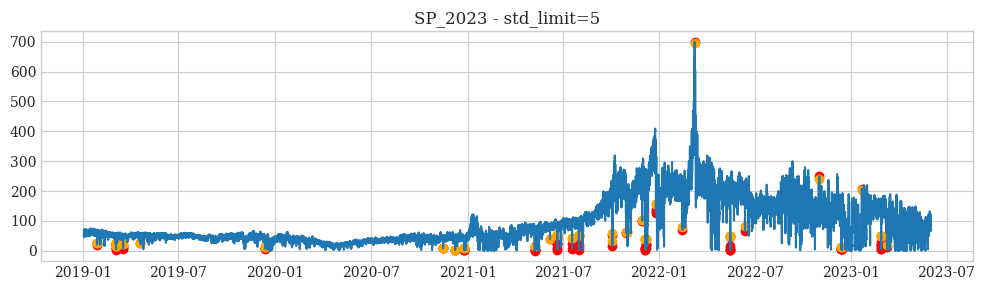

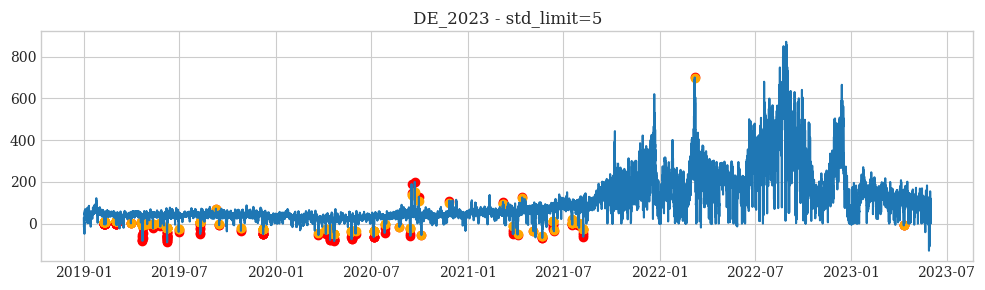

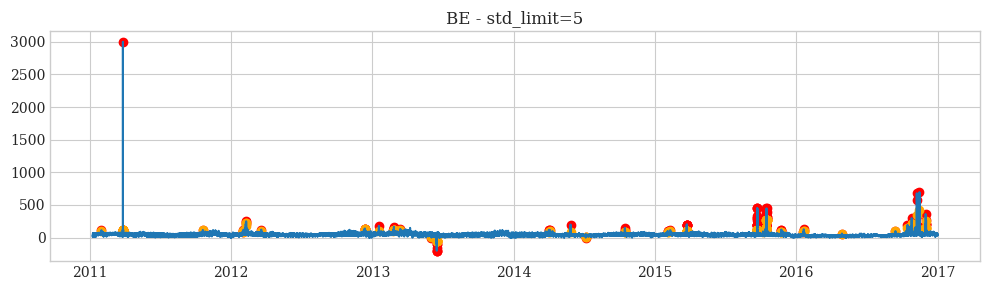

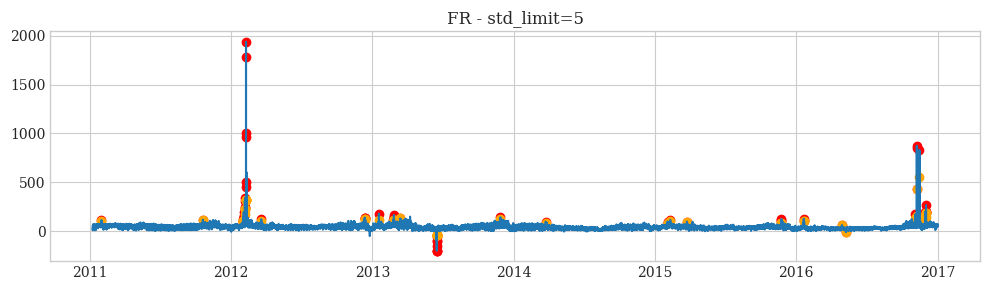

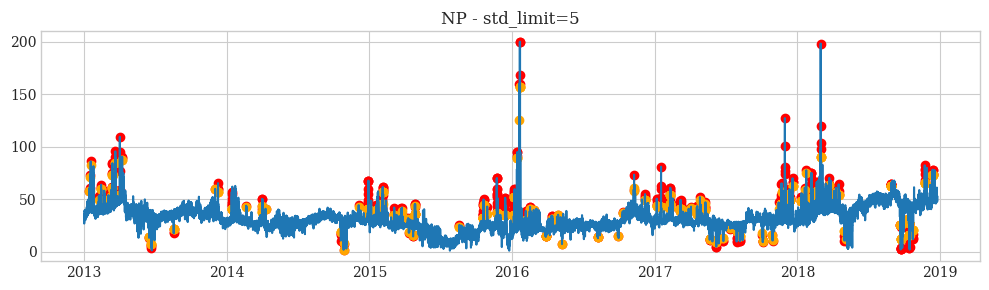

In [31]:
for name, dataset in dict_datastets.items():
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
    ax.plot(dataset.Date, dataset.Price)
    ax.scatter(dataset[dataset.Price != dataset.Price_no_outliers].Date, dataset[dataset.Price != dataset.Price_no_outliers].Price, color='red')
    ax.scatter(dataset[dataset.Price != dataset.Price_no_outliers].Date, dataset[dataset.Price != dataset.Price_no_outliers].Price_no_outliers, color='orange')
    ax.title.set_text(f"{name.replace('.csv', '')} - std_limit=5")
    plt.tight_layout()
    plt.show()

In [32]:
datasets = ["SP_2023.csv", "DE_2023.csv", "BE.csv", "FR.csv", "NP.csv"]
dict_datastets = {dataset: np.nan for dataset in datasets}
for dataset in datasets:
    print(dataset)
    df = pd.read_csv(f"Data//{dataset}")
    df['Date'] = pd.to_datetime(df.Date)
    df.columns = ['Date', 'Price', 'Exogenous 1', 'Exogenous 2']
    dict_datastets[dataset] = adaptive_standardisation_outliers(df, window_size=7, limit_std=8)

SP_2023.csv
Outlier mitigation through adaptive standardisation...
0.0 %
0.0 %
0.01 %
0.01 %
0.01 %
0.01 %
0.02 %
0.02 %
0.02 %
0.02 %
0.03 %
0.03 %
0.03 %
0.03 %
0.04 %
0.04 %
0.04 %
0.04 %
0.05 %
0.05 %
0.05 %
0.05 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.08 %
0.08 %
0.08 %
0.08 %
0.09 %
0.09 %
0.09 %
0.09 %
0.1 %
0.1 %
0.1 %
0.1 %
0.11 %
0.11 %
0.11 %
0.11 %
0.12 %
0.12 %
0.12 %
0.12 %
0.13 %
0.13 %
0.13 %
0.13 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.15 %
0.15 %
0.15 %
0.16 %
0.16 %
0.16 %
0.16 %
0.16999999999999998 %
0.16999999999999998 %
0.16999999999999998 %
0.16999999999999998 %
0.18 %
0.18 %
0.18 %
0.18 %
0.19 %
0.19 %
0.19 %
0.19 %
0.2 %
0.2 %
0.2 %
0.2 %
0.21 %
0.21 %
0.21 %
0.21 %
0.22 %
0.22 %
0.22 %
0.22999999999999998 %
0.22999999999999998 %
0.22999999999999998 %
0.22999999999999998 %
0.24 %
0.24 %
0.24 %
0.24 %
0.25 %
0.25 %
0.25 %
0.25 %
0.26 %
0.26 %
0.26 %
0.26

1.97 %
1.97 %
1.97 %
1.97 %
1.9800000000000002 %
1.9800000000000002 %
1.9800000000000002 %
1.9800000000000002 %
1.9900000000000002 %
1.9900000000000002 %
1.9900000000000002 %
1.9900000000000002 %
2.0 %
2.0 %
2.0 %
2.0 %
2.01 %
2.01 %
2.01 %
2.01 %
2.02 %
2.02 %
2.02 %
2.03 %
2.03 %
2.03 %
2.03 %
2.04 %
2.04 %
2.04 %
2.04 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.06 %
2.06 %
2.06 %
2.06 %
2.07 %
2.07 %
2.07 %
2.07 %
2.08 %
2.08 %
2.08 %
2.08 %
2.09 %
2.09 %
2.09 %
2.09 %
2.1 %
2.1 %
2.1 %
2.11 %
2.11 %
2.11 %
2.11 %
2.12 %
2.12 %
2.12 %
2.12 %
2.13 %
2.13 %
2.13 %
2.13 %
2.1399999999999997 %
2.1399999999999997 %
2.1399999999999997 %
2.1399999999999997 %
2.15 %
2.15 %
2.15 %
2.15 %
2.16 %
2.16 %
2.16 %
2.16 %
2.17 %
2.17 %
2.17 %
2.18 %
2.18 %
2.18 %
2.18 %
2.19 %
2.19 %
2.19 %
2.19 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.21 %
2.21 %
2.21 %
2.21 %
2.22 %
2.22 %
2.22 %
2.22 %
2.23 %
2.23 %
2.23 %

3.93 %
3.94 %
3.94 %
3.94 %
3.94 %
3.95 %
3.95 %
3.95 %
3.95 %
3.9600000000000004 %
3.9600000000000004 %
3.9600000000000004 %
3.9600000000000004 %
3.9699999999999998 %
3.9699999999999998 %
3.9699999999999998 %
3.9800000000000004 %
3.9800000000000004 %
3.9800000000000004 %
3.9800000000000004 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
4.0 %
4.0 %
4.0 %
4.0 %
4.01 %
4.01 %
4.01 %
4.01 %
4.02 %
4.02 %
4.02 %
4.02 %
4.03 %
4.03 %
4.03 %
4.03 %
4.04 %
4.04 %
4.04 %
4.05 %
4.05 %
4.05 %
4.05 %
4.06 %
4.06 %
4.06 %
4.06 %
4.07 %
4.07 %
4.07 %
4.07 %
4.08 %
4.08 %
4.08 %
4.08 %
4.09 %
4.09 %
4.09 %
4.09 %
4.1000000000000005 %
4.1000000000000005 %
4.1000000000000005 %
4.1000000000000005 %
4.109999999999999 %
4.109999999999999 %
4.109999999999999 %
4.109999999999999 %
4.12 %
4.12 %
4.12 %
4.130000000000001 %
4.130000000000001 %
4.130000000000001 %
4.130000000000001 %
4.14 %
4.14 %
4.14 %
4.14 %
4.15 %
4.15 %
4.15 %
4.15 %
4.16 %
4.16 %
4.16 %
4.16 %
4.17

6.12 %
6.12 %
6.12 %
6.13 %
6.13 %
6.13 %
6.13 %
6.140000000000001 %
6.140000000000001 %
6.140000000000001 %
6.15 %
6.15 %
6.15 %
6.15 %
6.16 %
6.16 %
6.16 %
6.16 %
6.17 %
6.17 %
6.17 %
6.17 %
6.18 %
6.18 %
6.18 %
6.18 %
6.1899999999999995 %
6.1899999999999995 %
6.1899999999999995 %
6.1899999999999995 %
6.2 %
6.2 %
6.2 %
6.2 %
6.21 %
6.21 %
6.21 %
6.22 %
6.22 %
6.22 %
6.22 %
6.23 %
6.23 %
6.23 %
6.23 %
6.239999999999999 %
6.239999999999999 %
6.239999999999999 %
6.239999999999999 %
6.25 %
6.25 %
6.25 %
6.25 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.29 %
6.29 %
6.29 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.32 %
6.32 %
6.32 %
6.32 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.34 

7.91 %
7.91 %
7.91 %
7.920000000000001 %
7.920000000000001 %
7.920000000000001 %
7.920000000000001 %
7.93 %
7.93 %
7.93 %
7.9399999999999995 %
7.9399999999999995 %
7.9399999999999995 %
7.9399999999999995 %
7.95 %
7.95 %
7.95 %
7.95 %
7.960000000000001 %
7.960000000000001 %
7.960000000000001 %
7.960000000000001 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.99 %
7.99 %
7.99 %
7.99 %
8.0 %
8.0 %
8.0 %
8.0 %
8.01 %
8.01 %
8.01 %
8.02 %
8.02 %
8.02 %
8.02 %
8.03 %
8.03 %
8.03 %
8.03 %
8.04 %
8.04 %
8.04 %
8.04 %
8.05 %
8.05 %
8.05 %
8.05 %
8.06 %
8.06 %
8.06 %
8.06 %
8.07 %
8.07 %
8.07 %
8.07 %
8.08 %
8.08 %
8.08 %
8.09 %
8.09 %
8.09 %
8.09 %
8.1 %
8.1 %
8.1 %
8.1 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.12 %
8.12 %
8.12 %
8.12 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.14 %
8.14 %
8.14 %

10.11 %
10.11 %
10.12 %
10.12 %
10.12 %
10.12 %
10.13 %
10.13 %
10.13 %
10.13 %
10.14 %
10.14 %
10.14 %
10.14 %
10.15 %
10.15 %
10.15 %
10.15 %
10.16 %
10.16 %
10.16 %
10.16 %
10.17 %
10.17 %
10.17 %
10.17 %
10.18 %
10.18 %
10.18 %
10.190000000000001 %
10.190000000000001 %
10.190000000000001 %
10.190000000000001 %
10.2 %
10.2 %
10.2 %
10.2 %
10.209999999999999 %
10.209999999999999 %
10.209999999999999 %
10.209999999999999 %
10.22 %
10.22 %
10.22 %
10.22 %
10.23 %
10.23 %
10.23 %
10.23 %
10.24 %
10.24 %
10.24 %
10.24 %
10.25 %
10.25 %
10.25 %
10.26 %
10.26 %
10.26 %
10.26 %
10.27 %
10.27 %
10.27 %
10.27 %
10.280000000000001 %
10.280000000000001 %
10.280000000000001 %
10.280000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.299999999999999 %
10.299999999999999 %
10.299999999999999 %
10.299999999999999 %
10.31 %
10.31 %
10.31 %
10.31 %
10.32 %
10.32 %
10.32 %
10.32 %
10.33 %
10.33 %
10.33 %
10.34 %
10.34 %
10.34 %
10.34 %
10.35 %
10.35 %


12.139999999999999 %
12.139999999999999 %
12.15 %
12.15 %
12.15 %
12.15 %
12.16 %
12.16 %
12.16 %
12.16 %
12.17 %
12.17 %
12.17 %
12.17 %
12.18 %
12.18 %
12.18 %
12.18 %
12.19 %
12.19 %
12.19 %
12.19 %
12.2 %
12.2 %
12.2 %
12.21 %
12.21 %
12.21 %
12.21 %
12.22 %
12.22 %
12.22 %
12.22 %
12.23 %
12.23 %
12.23 %
12.23 %
12.24 %
12.24 %
12.24 %
12.24 %
12.25 %
12.25 %
12.25 %
12.25 %
12.26 %
12.26 %
12.26 %
12.26 %
12.27 %
12.27 %
12.27 %
12.27 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.29 %
12.29 %
12.29 %
12.29 %
12.3 %
12.3 %
12.3 %
12.3 %
12.31 %
12.31 %
12.31 %
12.31 %
12.32 %
12.32 %
12.32 %
12.32 %
12.33 %
12.33 %
12.33 %
12.33 %
12.34 %
12.34 %
12.34 %
12.34 %
12.35 %
12.35 %
12.35 %
12.36 %
12.36 %
12.36 %
12.36 %
12.370000000000001 %
12.370000000000001 %
12.370000000000001 %
12.370000000000001 %
12.379999999999999 %
12.379999999999999 %
12.379999999999999 %
12.379999999999999 %
12.389999999999999 %
12.389999999999999 %
12.389999999999999 %
12.389999999999

13.88 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.91 %
13.91 %
13.91 %
13.91 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.94 %
13.94 %
13.94 %
13.94 %
13.950000000000001 %
13.950000000000001 %
13.950000000000001 %
13.950000000000001 %
13.96 %
13.96 %
13.96 %
13.96 %
13.969999999999999 %
13.969999999999999 %
13.969999999999999 %
13.969999999999999 %
13.98 %
13.98 %
13.98 %
13.98 %
13.99 %
13.99 %
13.99 %
13.99 %
14.000000000000002 %
14.000000000000002 %
14.000000000000002 %
14.01 %
14.01 %
14.01 %
14.01 %
14.02 %
14.02 %
14.02 %
14.02 %
14.030000000000001 %
14.030000000000001 %
14.030000000000001 %
14.030000000000001 %
14.04 %
14.04 %
14.04 %
14.04 %
14.05 %
14.05 %
14.05 %
14.05 %
14.06 %
14.06 %
14.06 %
14.06 %
14.069999999999999 %
14.069999999999999 %


15.57 %
15.57 %
15.58 %
15.58 %
15.58 %
15.58 %
15.590000000000002 %
15.590000000000002 %
15.590000000000002 %
15.590000000000002 %
15.6 %
15.6 %
15.6 %
15.6 %
15.61 %
15.61 %
15.61 %
15.61 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.629999999999999 %
15.629999999999999 %
15.629999999999999 %
15.629999999999999 %
15.64 %
15.64 %
15.64 %
15.65 %
15.65 %
15.65 %
15.65 %
15.659999999999998 %
15.659999999999998 %
15.659999999999998 %
15.659999999999998 %
15.67 %
15.67 %
15.67 %
15.67 %
15.68 %
15.68 %
15.68 %
15.68 %
15.690000000000001 %
15.690000000000001 %
15.690000000000001 %
15.690000000000001 %
15.7 %
15.7 %
15.7 %
15.7 %
15.709999999999999 %
15.709999999999999 %
15.709999999999999 %
15.709999999999999 %
15.72 %
15.72 %
15.72 %
15.73 %
15.73 %
15.73 %
15.73 %
15.740000000000002 %
15.740000000000002 %
15.740000000000002 %
15.740000000000002 %
15.75 %
15.75 %
15.75 %
15.75 %
15.76 %
15.76 %
15.76 %
15.76 %
15.770000000000001 %
15.770000000000

17.47 %
17.47 %
17.47 %
17.48 %
17.48 %
17.48 %
17.48 %
17.49 %
17.49 %
17.49 %
17.49 %
17.5 %
17.5 %
17.5 %
17.5 %
17.51 %
17.51 %
17.51 %
17.52 %
17.52 %
17.52 %
17.52 %
17.53 %
17.53 %
17.53 %
17.53 %
17.54 %
17.54 %
17.54 %
17.54 %
17.549999999999997 %
17.549999999999997 %
17.549999999999997 %
17.549999999999997 %
17.560000000000002 %
17.560000000000002 %
17.560000000000002 %
17.560000000000002 %
17.57 %
17.57 %
17.57 %
17.57 %
17.580000000000002 %
17.580000000000002 %
17.580000000000002 %
17.580000000000002 %
17.59 %
17.59 %
17.59 %
17.599999999999998 %
17.599999999999998 %
17.599999999999998 %
17.599999999999998 %
17.61 %
17.61 %
17.61 %
17.61 %
17.62 %
17.62 %
17.62 %
17.62 %
17.630000000000003 %
17.630000000000003 %
17.630000000000003 %
17.630000000000003 %
17.64 %
17.64 %
17.64 %
17.64 %
17.65 %
17.65 %
17.65 %
17.65 %
17.66 %
17.66 %
17.66 %
17.669999999999998 %
17.669999999999998 %
17.669999999999998 %
17.669999999999998 %
17.68 %
17.68 %
17.68 %
17.68 %
17.69 %
17.69 %
17.6

19.57 %
19.57 %
19.57 %
19.57 %
19.580000000000002 %
19.580000000000002 %
19.580000000000002 %
19.580000000000002 %
19.59 %
19.59 %
19.59 %
19.59 %
19.6 %
19.6 %
19.6 %
19.6 %
19.61 %
19.61 %
19.61 %
19.62 %
19.62 %
19.62 %
19.62 %
19.63 %
19.63 %
19.63 %
19.63 %
19.64 %
19.64 %
19.64 %
19.64 %
19.650000000000002 %
19.650000000000002 %
19.650000000000002 %
19.650000000000002 %
19.66 %
19.66 %
19.66 %
19.66 %
19.67 %
19.67 %
19.67 %
19.67 %
19.68 %
19.68 %
19.68 %
19.68 %
19.689999999999998 %
19.689999999999998 %
19.689999999999998 %
19.7 %
19.7 %
19.7 %
19.7 %
19.71 %
19.71 %
19.71 %
19.71 %
19.72 %
19.72 %
19.72 %
19.72 %
19.73 %
19.73 %
19.73 %
19.73 %
19.74 %
19.74 %
19.74 %
19.74 %
19.75 %
19.75 %
19.75 %
19.75 %
19.759999999999998 %
19.759999999999998 %
19.759999999999998 %
19.77 %
19.77 %
19.77 %
19.77 %
19.78 %
19.78 %
19.78 %
19.78 %
19.79 %
19.79 %
19.79 %
19.79 %
19.8 %
19.8 %
19.8 %
19.8 %
19.81 %
19.81 %
19.81 %
19.81 %
19.82 %
19.82 %
19.82 %
19.82 %
19.830000000000002 %
1

21.59 %
21.59 %
21.6 %
21.6 %
21.6 %
21.6 %
21.61 %
21.61 %
21.61 %
21.61 %
21.62 %
21.62 %
21.62 %
21.62 %
21.63 %
21.63 %
21.63 %
21.64 %
21.64 %
21.64 %
21.64 %
21.65 %
21.65 %
21.65 %
21.65 %
21.66 %
21.66 %
21.66 %
21.66 %
21.67 %
21.67 %
21.67 %
21.67 %
21.68 %
21.68 %
21.68 %
21.68 %
21.69 %
21.69 %
21.69 %
21.69 %
21.7 %
21.7 %
21.7 %
21.7 %
21.709999999999997 %
21.709999999999997 %
21.709999999999997 %
21.72 %
21.72 %
21.72 %
21.72 %
21.73 %
21.73 %
21.73 %
21.73 %
21.740000000000002 %
21.740000000000002 %
21.740000000000002 %
21.740000000000002 %
21.75 %
21.75 %
21.75 %
21.75 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.77 %
21.77 %
21.77 %
21.77 %
21.78 %
21.78 %
21.78 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.8 %
21.8 %
21.8 %
21.8 %
21.81 %
21.81 %
21.81 %
21.81 %
21.82 %
21.82 %
21.82 %
21.82 %
21.83 %
21.83 %
21.83 %
21.83 %
21.84 %
21.84 %
21.84 %
21.84 %
21.85 %
21.85 %
21.85 %
2

23.64 %
23.65 %
23.65 %
23.65 %
23.66 %
23.66 %
23.66 %
23.66 %
23.669999999999998 %
23.669999999999998 %
23.669999999999998 %
23.669999999999998 %
23.68 %
23.68 %
23.68 %
23.68 %
23.69 %
23.69 %
23.69 %
23.69 %
23.7 %
23.7 %
23.7 %
23.7 %
23.71 %
23.71 %
23.71 %
23.71 %
23.72 %
23.72 %
23.72 %
23.72 %
23.73 %
23.73 %
23.73 %
23.74 %
23.74 %
23.74 %
23.74 %
23.75 %
23.75 %
23.75 %
23.75 %
23.76 %
23.76 %
23.76 %
23.76 %
23.77 %
23.77 %
23.77 %
23.77 %
23.78 %
23.78 %
23.78 %
23.78 %
23.79 %
23.79 %
23.79 %
23.79 %
23.799999999999997 %
23.799999999999997 %
23.799999999999997 %
23.810000000000002 %
23.810000000000002 %
23.810000000000002 %
23.810000000000002 %
23.82 %
23.82 %
23.82 %
23.82 %
23.830000000000002 %
23.830000000000002 %
23.830000000000002 %
23.830000000000002 %
23.84 %
23.84 %
23.84 %
23.84 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.86 %
23.86 %
23.86 %
23.86 %
23.87 %
23.87 %
23.87 %
23.87 %
23.880000000000003 %
23.8800000000000

25.590000000000003 %
25.6 %
25.6 %
25.6 %
25.61 %
25.61 %
25.61 %
25.61 %
25.619999999999997 %
25.619999999999997 %
25.619999999999997 %
25.619999999999997 %
25.629999999999995 %
25.629999999999995 %
25.629999999999995 %
25.629999999999995 %
25.64 %
25.64 %
25.64 %
25.64 %
25.650000000000002 %
25.650000000000002 %
25.650000000000002 %
25.650000000000002 %
25.66 %
25.66 %
25.66 %
25.66 %
25.669999999999998 %
25.669999999999998 %
25.669999999999998 %
25.679999999999996 %
25.679999999999996 %
25.679999999999996 %
25.679999999999996 %
25.69 %
25.69 %
25.69 %
25.69 %
25.7 %
25.7 %
25.7 %
25.7 %
25.71 %
25.71 %
25.71 %
25.71 %
25.72 %
25.72 %
25.72 %
25.72 %
25.729999999999997 %
25.729999999999997 %
25.729999999999997 %
25.729999999999997 %
25.740000000000002 %
25.740000000000002 %
25.740000000000002 %
25.740000000000002 %
25.75 %
25.75 %
25.75 %
25.759999999999998 %
25.759999999999998 %
25.759999999999998 %
25.759999999999998 %
25.77 %
25.77 %
25.77 %
25.77 %
25.779999999999998 %
25.7799999

27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.26 %
27.26 %
27.26 %
27.26 %
27.27 %
27.27 %
27.27 %
27.27 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.29 %
27.29 %
27.29 %
27.29 %
27.3 %
27.3 %
27.3 %
27.3 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.32 %
27.32 %
27.32 %
27.33 %
27.33 %
27.33 %
27.33 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.35 %
27.35 %
27.35 %
27.35 %
27.36 %
27.36 %
27.36 %
27.36 %
27.37 %
27.37 %
27.37 %
27.37 %
27.38 %
27.38 %
27.38 %
27.38 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.400000000000002 %
27.400000000000002 %
27.400000000000002 %
27.41 %
27.41 %
27.41 %
27.41 %
27.42 %
27.42 %
27.42 %
27.42 %
27.43 %
27.43 %
27.43 %
27.43 %
27.439999999999998 %
27.439999999999998 %
27.439999999999998 %
27.439999999999998 %
27.450000000000003 %
27.450000000000003 %
27.45000

28.999999999999996 %
28.999999999999996 %
28.999999999999996 %
29.01 %
29.01 %
29.01 %
29.01 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.03 %
29.03 %
29.03 %
29.03 %
29.04 %
29.04 %
29.04 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.07 %
29.07 %
29.07 %
29.07 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.09 %
29.09 %
29.09 %
29.09 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.110000000000003 %
29.110000000000003 %
29.110000000000003 %
29.110000000000003 %
29.12 %
29.12 %
29.12 %
29.13 %
29.13 %
29.13 %
29.13 %
29.14 %
29.14 %
29.14 %
29.14 %
29.15 %
29.15 %
29.15 %
29.15 %
29.160000000000004 %
29.160000000000004 %
29.160000000000004 %
29.160000000000004 %
29.17 %
29.17 %
29.17 %
29.17 %
29.18 %
29.18 %
29.18 %
29.18 %
29.1899999999

30.630000000000003 %
30.630000000000003 %
30.64 %
30.64 %
30.64 %
30.64 %
30.65 %
30.65 %
30.65 %
30.65 %
30.659999999999997 %
30.659999999999997 %
30.659999999999997 %
30.659999999999997 %
30.669999999999998 %
30.669999999999998 %
30.669999999999998 %
30.669999999999998 %
30.680000000000003 %
30.680000000000003 %
30.680000000000003 %
30.680000000000003 %
30.69 %
30.69 %
30.69 %
30.7 %
30.7 %
30.7 %
30.7 %
30.709999999999997 %
30.709999999999997 %
30.709999999999997 %
30.709999999999997 %
30.72 %
30.72 %
30.72 %
30.72 %
30.73 %
30.73 %
30.73 %
30.73 %
30.740000000000002 %
30.740000000000002 %
30.740000000000002 %
30.740000000000002 %
30.75 %
30.75 %
30.75 %
30.75 %
30.759999999999998 %
30.759999999999998 %
30.759999999999998 %
30.769999999999996 %
30.769999999999996 %
30.769999999999996 %
30.769999999999996 %
30.78 %
30.78 %
30.78 %
30.78 %
30.79 %
30.79 %
30.79 %
30.79 %
30.8 %
30.8 %
30.8 %
30.8 %
30.81 %
30.81 %
30.81 %
30.81 %
30.819999999999997 %
30.819999999999997 %
30.8199999999

32.28 %
32.28 %
32.29 %
32.29 %
32.29 %
32.29 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.31 %
32.31 %
32.31 %
32.31 %
32.32 %
32.32 %
32.32 %
32.32 %
32.33 %
32.33 %
32.33 %
32.33 %
32.34 %
32.34 %
32.34 %
32.35 %
32.35 %
32.35 %
32.35 %
32.36 %
32.36 %
32.36 %
32.36 %
32.37 %
32.37 %
32.37 %
32.37 %
32.379999999999995 %
32.379999999999995 %
32.379999999999995 %
32.379999999999995 %
32.39 %
32.39 %
32.39 %
32.39 %
32.4 %
32.4 %
32.4 %
32.4 %
32.41 %
32.41 %
32.41 %
32.42 %
32.42 %
32.42 %
32.42 %
32.43 %
32.43 %
32.43 %
32.43 %
32.440000000000005 %
32.440000000000005 %
32.440000000000005 %
32.440000000000005 %
32.45 %
32.45 %
32.45 %
32.45 %
32.46 %
32.46 %
32.46 %
32.46 %
32.47 %
32.47 %
32.47 %
32.47 %
32.48 %
32.48 %
32.48 %
32.48 %
32.49 %
32.49 %
32.49 %
32.5 %
32.5 %
32.5 %
32.5 %
32.51 %
32.51 %
32.51 %
32.51 %
32.519999999999996 %
32.519999999999996 %
32.519999999999996 %
32.519999999999996 %
32.53 %
32.53 %
32.53 %
32.53 %
32.54 %


34.29 %
34.29 %
34.29 %
34.29 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.31 %
34.31 %
34.31 %
34.31 %
34.32 %
34.32 %
34.32 %
34.32 %
34.33 %
34.33 %
34.33 %
34.33 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.35 %
34.35 %
34.35 %
34.35 %
34.36 %
34.36 %
34.36 %
34.37 %
34.37 %
34.37 %
34.37 %
34.38 %
34.38 %
34.38 %
34.38 %
34.39 %
34.39 %
34.39 %
34.39 %
34.4 %
34.4 %
34.4 %
34.4 %
34.410000000000004 %
34.410000000000004 %
34.410000000000004 %
34.410000000000004 %
34.42 %
34.42 %
34.42 %
34.42 %
34.43 %
34.43 %
34.43 %
34.44 %
34.44 %
34.44 %
34.44 %
34.449999999999996 %
34.449999999999996 %
34.449999999999996 %
34.449999999999996 %
34.46 %
34.46 %
34.46 %
34.46 %
34.47 %
34.47 %
34.47 %
34.47 %
34.48 %
34.48 %
34.48 %
34.48 %
34.489999999999995 %
34.489999999999995 %
34.489999999999995 %
34.489999999999995 %
34.5 %
34.5 %
34.5 %
34.5 %
34.510000000000005 %
34.510000000000005 %
34.510000000000005

36.29 %
36.29 %
36.3 %
36.3 %
36.3 %
36.309999999999995 %
36.309999999999995 %
36.309999999999995 %
36.309999999999995 %
36.32 %
36.32 %
36.32 %
36.32 %
36.33 %
36.33 %
36.33 %
36.33 %
36.34 %
36.34 %
36.34 %
36.34 %
36.35 %
36.35 %
36.35 %
36.35 %
36.36 %
36.36 %
36.36 %
36.36 %
36.370000000000005 %
36.370000000000005 %
36.370000000000005 %
36.370000000000005 %
36.38 %
36.38 %
36.38 %
36.39 %
36.39 %
36.39 %
36.39 %
36.4 %
36.4 %
36.4 %
36.4 %
36.41 %
36.41 %
36.41 %
36.41 %
36.42 %
36.42 %
36.42 %
36.42 %
36.43 %
36.43 %
36.43 %
36.43 %
36.44 %
36.44 %
36.44 %
36.44 %
36.449999999999996 %
36.449999999999996 %
36.449999999999996 %
36.46 %
36.46 %
36.46 %
36.46 %
36.47 %
36.47 %
36.47 %
36.47 %
36.480000000000004 %
36.480000000000004 %
36.480000000000004 %
36.480000000000004 %
36.49 %
36.49 %
36.49 %
36.49 %
36.5 %
36.5 %
36.5 %
36.5 %
36.51 %
36.51 %
36.51 %
36.51 %
36.52 %
36.52 %
36.52 %
36.52 %
36.53 %
36.53 %
36.53 %
36.54 %
36.54 %
36.54 %
36.54 %
36.55 %
36.55 %
36.55 %
36.55 %


38.4 %
38.4 %
38.41 %
38.41 %
38.41 %
38.41 %
38.42 %
38.42 %
38.42 %
38.42 %
38.43 %
38.43 %
38.43 %
38.43 %
38.440000000000005 %
38.440000000000005 %
38.440000000000005 %
38.440000000000005 %
38.45 %
38.45 %
38.45 %
38.45 %
38.46 %
38.46 %
38.46 %
38.46 %
38.47 %
38.47 %
38.47 %
38.48 %
38.48 %
38.48 %
38.48 %
38.49 %
38.49 %
38.49 %
38.49 %
38.5 %
38.5 %
38.5 %
38.5 %
38.51 %
38.51 %
38.51 %
38.51 %
38.519999999999996 %
38.519999999999996 %
38.519999999999996 %
38.519999999999996 %
38.53 %
38.53 %
38.53 %
38.53 %
38.54 %
38.54 %
38.54 %
38.54 %
38.550000000000004 %
38.550000000000004 %
38.550000000000004 %
38.56 %
38.56 %
38.56 %
38.56 %
38.57 %
38.57 %
38.57 %
38.57 %
38.58 %
38.58 %
38.58 %
38.58 %
38.59 %
38.59 %
38.59 %
38.59 %
38.6 %
38.6 %
38.6 %
38.6 %
38.61 %
38.61 %
38.61 %
38.61 %
38.62 %
38.62 %
38.62 %
38.629999999999995 %
38.629999999999995 %
38.629999999999995 %
38.629999999999995 %
38.64 %
38.64 %
38.64 %
38.64 %
38.65 %
38.65 %
38.65 %
38.65 %
38.66 %
38.66 %
38.66 %

40.410000000000004 %
40.410000000000004 %
40.410000000000004 %
40.42 %
40.42 %
40.42 %
40.43 %
40.43 %
40.43 %
40.43 %
40.44 %
40.44 %
40.44 %
40.44 %
40.45 %
40.45 %
40.45 %
40.45 %
40.46 %
40.46 %
40.46 %
40.46 %
40.47 %
40.47 %
40.47 %
40.47 %
40.48 %
40.48 %
40.48 %
40.48 %
40.489999999999995 %
40.489999999999995 %
40.489999999999995 %
40.5 %
40.5 %
40.5 %
40.5 %
40.510000000000005 %
40.510000000000005 %
40.510000000000005 %
40.510000000000005 %
40.52 %
40.52 %
40.52 %
40.52 %
40.53 %
40.53 %
40.53 %
40.53 %
40.54 %
40.54 %
40.54 %
40.54 %
40.550000000000004 %
40.550000000000004 %
40.550000000000004 %
40.550000000000004 %
40.56 %
40.56 %
40.56 %
40.56 %
40.57 %
40.57 %
40.57 %
40.58 %
40.58 %
40.58 %
40.58 %
40.589999999999996 %
40.589999999999996 %
40.589999999999996 %
40.589999999999996 %
40.6 %
40.6 %
40.6 %
40.6 %
40.61 %
40.61 %
40.61 %
40.61 %
40.62 %
40.62 %
40.62 %
40.62 %
40.63 %
40.63 %
40.63 %
40.63 %
40.64 %
40.64 %
40.64 %
40.65 %
40.65 %
40.65 %
40.65 %
40.66000000000

42.4 %
42.41 %
42.41 %
42.41 %
42.41 %
42.42 %
42.42 %
42.42 %
42.42 %
42.43 %
42.43 %
42.43 %
42.43 %
42.44 %
42.44 %
42.44 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.46 %
42.46 %
42.46 %
42.46 %
42.47 %
42.47 %
42.47 %
42.47 %
42.480000000000004 %
42.480000000000004 %
42.480000000000004 %
42.480000000000004 %
42.49 %
42.49 %
42.49 %
42.49 %
42.5 %
42.5 %
42.5 %
42.5 %
42.51 %
42.51 %
42.51 %
42.52 %
42.52 %
42.52 %
42.52 %
42.53 %
42.53 %
42.53 %
42.53 %
42.54 %
42.54 %
42.54 %
42.54 %
42.55 %
42.55 %
42.55 %
42.55 %
42.559999999999995 %
42.559999999999995 %
42.559999999999995 %
42.559999999999995 %
42.57 %
42.57 %
42.57 %
42.57 %
42.58 %
42.58 %
42.58 %
42.58 %
42.59 %
42.59 %
42.59 %
42.6 %
42.6 %
42.6 %
42.6 %
42.61 %
42.61 %
42.61 %
42.61 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.63 %
42.63 %
42.63 %
42.63 %
42.64 %
42.64 %
42.64 %
42.64 %
42.65 %
42.65 %
42.65 %
42.65 %
42.66 %
42.66 %
4

44.519999999999996 %
44.519999999999996 %
44.529999999999994 %
44.529999999999994 %
44.529999999999994 %
44.529999999999994 %
44.54 %
44.54 %
44.54 %
44.55 %
44.55 %
44.55 %
44.55 %
44.56 %
44.56 %
44.56 %
44.56 %
44.57 %
44.57 %
44.57 %
44.57 %
44.58 %
44.58 %
44.58 %
44.58 %
44.59 %
44.59 %
44.59 %
44.59 %
44.6 %
44.6 %
44.6 %
44.6 %
44.61 %
44.61 %
44.61 %
44.62 %
44.62 %
44.62 %
44.62 %
44.629999999999995 %
44.629999999999995 %
44.629999999999995 %
44.629999999999995 %
44.64 %
44.64 %
44.64 %
44.64 %
44.65 %
44.65 %
44.65 %
44.65 %
44.66 %
44.66 %
44.66 %
44.66 %
44.67 %
44.67 %
44.67 %
44.67 %
44.68 %
44.68 %
44.68 %
44.68 %
44.690000000000005 %
44.690000000000005 %
44.690000000000005 %
44.7 %
44.7 %
44.7 %
44.7 %
44.71 %
44.71 %
44.71 %
44.71 %
44.72 %
44.72 %
44.72 %
44.72 %
44.73 %
44.73 %
44.73 %
44.73 %
44.74 %
44.74 %
44.74 %
44.74 %
44.75 %
44.75 %
44.75 %
44.75 %
44.76 %
44.76 %
44.76 %
44.769999999999996 %
44.769999999999996 %
44.769999999999996 %
44.769999999999996 %
44.

46.550000000000004 %
46.56 %
46.56 %
46.56 %
46.57 %
46.57 %
46.57 %
46.57 %
46.58 %
46.58 %
46.58 %
46.58 %
46.589999999999996 %
46.589999999999996 %
46.589999999999996 %
46.589999999999996 %
46.6 %
46.6 %
46.6 %
46.6 %
46.61 %
46.61 %
46.61 %
46.61 %
46.62 %
46.62 %
46.62 %
46.62 %
46.63 %
46.63 %
46.63 %
46.64 %
46.64 %
46.64 %
46.64 %
46.650000000000006 %
46.650000000000006 %
46.650000000000006 %
46.650000000000006 %
46.660000000000004 %
46.660000000000004 %
46.660000000000004 %
46.660000000000004 %
46.67 %
46.67 %
46.67 %
46.67 %
46.68 %
46.68 %
46.68 %
46.68 %
46.69 %
46.69 %
46.69 %
46.69 %
46.7 %
46.7 %
46.7 %
46.7 %
46.71 %
46.71 %
46.71 %
46.72 %
46.72 %
46.72 %
46.72 %
46.73 %
46.73 %
46.73 %
46.73 %
46.739999999999995 %
46.739999999999995 %
46.739999999999995 %
46.739999999999995 %
46.75 %
46.75 %
46.75 %
46.75 %
46.760000000000005 %
46.760000000000005 %
46.760000000000005 %
46.760000000000005 %
46.77 %
46.77 %
46.77 %
46.77 %
46.78 %
46.78 %
46.78 %
46.79 %
46.79 %
46.79 %

48.53 %
48.53 %
48.53 %
48.53 %
48.54 %
48.54 %
48.54 %
48.54 %
48.55 %
48.55 %
48.55 %
48.55 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.57 %
48.57 %
48.57 %
48.57 %
48.58 %
48.58 %
48.58 %
48.59 %
48.59 %
48.59 %
48.59 %
48.6 %
48.6 %
48.6 %
48.6 %
48.61 %
48.61 %
48.61 %
48.61 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.63 %
48.63 %
48.63 %
48.63 %
48.64 %
48.64 %
48.64 %
48.64 %
48.65 %
48.65 %
48.65 %
48.66 %
48.66 %
48.66 %
48.66 %
48.67 %
48.67 %
48.67 %
48.67 %
48.68 %
48.68 %
48.68 %
48.68 %
48.69 %
48.69 %
48.69 %
48.69 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.71 %
48.71 %
48.71 %
48.71 %
48.72 %
48.72 %
48.72 %
48.72 %
48.730000000000004 %
48.730000000000004 %
48.730000000000004 %
48.74 %
48.74 %
48.74 %
48.74 %
48.75 %
48.75 %
48.75 %
48.75 %
48.76 %
48.76 %
48.76 %
48.76 %
48.77 %
48.77 %
48.77 %
48.77 %
48.78 %
48.78 %
48.78 %
48.78 %
4

50.529999999999994 %
50.54 %
50.54 %
50.54 %
50.54 %
50.55 %
50.55 %
50.55 %
50.55 %
50.56 %
50.56 %
50.56 %
50.56 %
50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.59 %
50.59 %
50.59 %
50.59 %
50.6 %
50.6 %
50.6 %
50.61 %
50.61 %
50.61 %
50.61 %
50.62 %
50.62 %
50.62 %
50.62 %
50.629999999999995 %
50.629999999999995 %
50.629999999999995 %
50.629999999999995 %
50.63999999999999 %
50.63999999999999 %
50.63999999999999 %
50.63999999999999 %
50.64999999999999 %
50.64999999999999 %
50.64999999999999 %
50.64999999999999 %
50.660000000000004 %
50.660000000000004 %
50.660000000000004 %
50.660000000000004 %
50.67 %
50.67 %
50.67 %
50.68 %
50.68 %
50.68 %
50.68 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.7 %
50.7 %
50.7 %
50.7 %
50.71 %
50.71 %
50.71 %
50.71 %
50.72 %
50.72 %
50.72 %
50.72 %
50.73 %
50.73 %
50.73 %
50.73 %
50.7399999

52.21 %
52.21 %
52.21 %
52.21 %
52.22 %
52.22 %
52.22 %
52.22 %
52.23 %
52.23 %
52.23 %
52.23 %
52.239999999999995 %
52.239999999999995 %
52.239999999999995 %
52.239999999999995 %
52.25 %
52.25 %
52.25 %
52.26 %
52.26 %
52.26 %
52.26 %
52.27 %
52.27 %
52.27 %
52.27 %
52.28 %
52.28 %
52.28 %
52.28 %
52.290000000000006 %
52.290000000000006 %
52.290000000000006 %
52.290000000000006 %
52.300000000000004 %
52.300000000000004 %
52.300000000000004 %
52.300000000000004 %
52.31 %
52.31 %
52.31 %
52.31 %
52.32 %
52.32 %
52.32 %
52.33 %
52.33 %
52.33 %
52.33 %
52.339999999999996 %
52.339999999999996 %
52.339999999999996 %
52.339999999999996 %
52.349999999999994 %
52.349999999999994 %
52.349999999999994 %
52.349999999999994 %
52.35999999999999 %
52.35999999999999 %
52.35999999999999 %
52.35999999999999 %
52.370000000000005 %
52.370000000000005 %
52.370000000000005 %
52.370000000000005 %
52.38 %
52.38 %
52.38 %
52.38 %
52.39 %
52.39 %
52.39 %
52.39 %
52.400000000000006 %
52.400000000000006 %
52.400

53.87 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.900000000000006 %
53.900000000000006 %
53.900000000000006 %
53.900000000000006 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.92 %
53.92 %
53.92 %
53.92 %
53.93 %
53.93 %
53.93 %
53.93 %
53.94 %
53.94 %
53.94 %
53.94 %
53.949999999999996 %
53.949999999999996 %
53.949999999999996 %
53.949999999999996 %
53.959999999999994 %
53.959999999999994 %
53.959999999999994 %
53.959999999999994 %
53.97 %
53.97 %
53.97 %
53.98 %
53.98 %
53.98 %
53.98 %
53.99 %
53.99 %
53.99 %
53.99 %
54.0 %
54.0 %
54.0 %
54.0 %
54.010000000000005 %
54.010000000000005 %
54.010000000000005 %
54.010000000000005 %
54.02 %
54.02 %
54.02 %
54.02 %
54.03 %
54.03 %
54.03 %
54.03 %
54.04 %
54.04 %
54.04 %
54.05 %
54.05 %
54.05 %
54.05 %
54.059999999999995 %
54.059999999999995 %
54.059999999999995 %
54.059999999999995 %
54.069999999

55.53 %
55.53 %
55.53 %
55.54 %
55.54 %
55.54 %
55.55 %
55.55 %
55.55 %
55.55 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.57 %
55.57 %
55.57 %
55.57 %
55.58 %
55.58 %
55.58 %
55.58 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.60000000000001 %
55.60000000000001 %
55.60000000000001 %
55.60000000000001 %
55.61000000000001 %
55.61000000000001 %
55.61000000000001 %
55.620000000000005 %
55.620000000000005 %
55.620000000000005 %
55.620000000000005 %
55.63 %
55.63 %
55.63 %
55.63 %
55.64 %
55.64 %
55.64 %
55.64 %
55.65 %
55.65 %
55.65 %
55.65 %
55.66 %
55.66 %
55.66 %
55.66 %
55.669999999999995 %
55.669999999999995 %
55.669999999999995 %
55.669999999999995 %
55.67999999999999 %
55.67999999999999 %
55.67999999999999 %
55.67999999999999 %
55.69 %
55.69 %
55.69 %
55.7 %
55.7 %
55.7 %
55.7 %
55.71 %
55.71 %
55.71 %
55.71 %
55.720000000000006 %
55.720000000000006 %
55.720000000000006 %
55.720000000000006 %
55.7

57.24 %
57.24 %
57.24 %
57.24 %
57.25 %
57.25 %
57.25 %
57.25 %
57.26 %
57.26 %
57.26 %
57.269999999999996 %
57.269999999999996 %
57.269999999999996 %
57.269999999999996 %
57.28 %
57.28 %
57.28 %
57.28 %
57.29 %
57.29 %
57.29 %
57.29 %
57.3 %
57.3 %
57.3 %
57.3 %
57.31 %
57.31 %
57.31 %
57.31 %
57.32000000000001 %
57.32000000000001 %
57.32000000000001 %
57.32000000000001 %
57.330000000000005 %
57.330000000000005 %
57.330000000000005 %
57.330000000000005 %
57.34 %
57.34 %
57.34 %
57.35 %
57.35 %
57.35 %
57.35 %
57.36 %
57.36 %
57.36 %
57.36 %
57.37 %
57.37 %
57.37 %
57.37 %
57.379999999999995 %
57.379999999999995 %
57.379999999999995 %
57.379999999999995 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.4 %
57.4 %
57.4 %
57.4 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.42 %
57.42 %
57.42 %
57.42 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.440000000000005 %
57.440000000000005 %
57.44000000

58.93000000000001 %
58.93000000000001 %
58.940000000000005 %
58.940000000000005 %
58.940000000000005 %
58.940000000000005 %
58.95 %
58.95 %
58.95 %
58.95 %
58.96 %
58.96 %
58.96 %
58.96 %
58.97 %
58.97 %
58.97 %
58.97 %
58.98 %
58.98 %
58.98 %
58.989999999999995 %
58.989999999999995 %
58.989999999999995 %
58.989999999999995 %
59.0 %
59.0 %
59.0 %
59.0 %
59.01 %
59.01 %
59.01 %
59.01 %
59.019999999999996 %
59.019999999999996 %
59.019999999999996 %
59.019999999999996 %
59.03 %
59.03 %
59.03 %
59.03 %
59.040000000000006 %
59.040000000000006 %
59.040000000000006 %
59.040000000000006 %
59.050000000000004 %
59.050000000000004 %
59.050000000000004 %
59.050000000000004 %
59.06 %
59.06 %
59.06 %
59.07 %
59.07 %
59.07 %
59.07 %
59.08 %
59.08 %
59.08 %
59.08 %
59.089999999999996 %
59.089999999999996 %
59.089999999999996 %
59.089999999999996 %
59.099999999999994 %
59.099999999999994 %
59.099999999999994 %
59.099999999999994 %
59.11 %
59.11 %
59.11 %
59.11 %
59.12 %
59.12 %
59.12 %
59.12 %
59.13 %


60.58 %
60.58 %
60.58 %
60.589999999999996 %
60.589999999999996 %
60.589999999999996 %
60.589999999999996 %
60.6 %
60.6 %
60.6 %
60.6 %
60.61 %
60.61 %
60.61 %
60.61 %
60.62 %
60.62 %
60.62 %
60.62 %
60.629999999999995 %
60.629999999999995 %
60.629999999999995 %
60.64000000000001 %
60.64000000000001 %
60.64000000000001 %
60.64000000000001 %
60.650000000000006 %
60.650000000000006 %
60.650000000000006 %
60.650000000000006 %
60.660000000000004 %
60.660000000000004 %
60.660000000000004 %
60.660000000000004 %
60.67 %
60.67 %
60.67 %
60.67 %
60.68 %
60.68 %
60.68 %
60.68 %
60.69 %
60.69 %
60.69 %
60.69 %
60.699999999999996 %
60.699999999999996 %
60.699999999999996 %
60.709999999999994 %
60.709999999999994 %
60.709999999999994 %
60.709999999999994 %
60.72 %
60.72 %
60.72 %
60.72 %
60.73 %
60.73 %
60.73 %
60.73 %
60.74 %
60.74 %
60.74 %
60.74 %
60.75000000000001 %
60.75000000000001 %
60.75000000000001 %
60.75000000000001 %
60.760000000000005 %
60.760000000000005 %
60.760000000000005 %
60.7600

62.27 %
62.27 %
62.27 %
62.27 %
62.28 %
62.28 %
62.28 %
62.29 %
62.29 %
62.29 %
62.29 %
62.3 %
62.3 %
62.3 %
62.3 %
62.31 %
62.31 %
62.31 %
62.31 %
62.32 %
62.32 %
62.32 %
62.32 %
62.33 %
62.33 %
62.33 %
62.33 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.38 %
62.38 %
62.38 %
62.38 %
62.39 %
62.39 %
62.39 %
62.39 %
62.4 %
62.4 %
62.4 %
62.4 %
62.41 %
62.41 %
62.41 %
62.41 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.43 %
62.43 %
62.43 %
62.44 %
62.44 %
62.44 %
62.44 %
62.45 %
62.45 %
62.45 %
62.45 %
62.46000000000001 %
62.46000000000001 %
62.46000000000001 %
62.46000000000001 %
62.470000000000006 %
62.470000000000006 %
62.470000000000006 %
62.470000000000006 %
62.480000000000004 %

63.959999999999994 %
63.970000000000006 %
63.970000000000006 %
63.970000000000006 %
63.970000000000006 %
63.980000000000004 %
63.980000000000004 %
63.980000000000004 %
63.980000000000004 %
63.99 %
63.99 %
63.99 %
63.99 %
64.0 %
64.0 %
64.0 %
64.01 %
64.01 %
64.01 %
64.01 %
64.02 %
64.02 %
64.02 %
64.02 %
64.03 %
64.03 %
64.03 %
64.03 %
64.03999999999999 %
64.03999999999999 %
64.03999999999999 %
64.03999999999999 %
64.05 %
64.05 %
64.05 %
64.05 %
64.05999999999999 %
64.05999999999999 %
64.05999999999999 %
64.05999999999999 %
64.07000000000001 %
64.07000000000001 %
64.07000000000001 %
64.08 %
64.08 %
64.08 %
64.08 %
64.09 %
64.09 %
64.09 %
64.09 %
64.1 %
64.1 %
64.1 %
64.1 %
64.11 %
64.11 %
64.11 %
64.11 %
64.12 %
64.12 %
64.12 %
64.12 %
64.13 %
64.13 %
64.13 %
64.13 %
64.14 %
64.14 %
64.14 %
64.14 %
64.14999999999999 %
64.14999999999999 %
64.14999999999999 %
64.16 %
64.16 %
64.16 %
64.16 %
64.17 %
64.17 %
64.17 %
64.17 %
64.18 %
64.18 %
64.18 %
64.18 %
64.19 %
64.19 %
64.19 %
64.19 %
64

66.03999999999999 %
66.05 %
66.05 %
66.05 %
66.05 %
66.06 %
66.06 %
66.06 %
66.06 %
66.07 %
66.07 %
66.07 %
66.07 %
66.08000000000001 %
66.08000000000001 %
66.08000000000001 %
66.08000000000001 %
66.09 %
66.09 %
66.09 %
66.10000000000001 %
66.10000000000001 %
66.10000000000001 %
66.10000000000001 %
66.11 %
66.11 %
66.11 %
66.11 %
66.12 %
66.12 %
66.12 %
66.12 %
66.13 %
66.13 %
66.13 %
66.13 %
66.14 %
66.14 %
66.14 %
66.14 %
66.14999999999999 %
66.14999999999999 %
66.14999999999999 %
66.14999999999999 %
66.16 %
66.16 %
66.16 %
66.16 %
66.17 %
66.17 %
66.17 %
66.18 %
66.18 %
66.18 %
66.18 %
66.19 %
66.19 %
66.19 %
66.19 %
66.2 %
66.2 %
66.2 %
66.2 %
66.21000000000001 %
66.21000000000001 %
66.21000000000001 %
66.21000000000001 %
66.22 %
66.22 %
66.22 %
66.22 %
66.23 %
66.23 %
66.23 %
66.23 %
66.24 %
66.24 %
66.24 %
66.25 %
66.25 %
66.25 %
66.25 %
66.25999999999999 %
66.25999999999999 %
66.25999999999999 %
66.25999999999999 %
66.27 %
66.27 %
66.27 %
66.27 %
66.28 %
66.28 %
66.28 %
66.28 %


68.14 %
68.15 %
68.15 %
68.15 %
68.15 %
68.16 %
68.16 %
68.16 %
68.16 %
68.17 %
68.17 %
68.17 %
68.17 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.19 %
68.19 %
68.19 %
68.2 %
68.2 %
68.2 %
68.2 %
68.21000000000001 %
68.21000000000001 %
68.21000000000001 %
68.21000000000001 %
68.22 %
68.22 %
68.22 %
68.22 %
68.23 %
68.23 %
68.23 %
68.23 %
68.24 %
68.24 %
68.24 %
68.24 %
68.25 %
68.25 %
68.25 %
68.25 %
68.26 %
68.26 %
68.26 %
68.27 %
68.27 %
68.27 %
68.27 %
68.28 %
68.28 %
68.28 %
68.28 %
68.28999999999999 %
68.28999999999999 %
68.28999999999999 %
68.28999999999999 %
68.30000000000001 %
68.30000000000001 %
68.30000000000001 %
68.30000000000001 %
68.31 %
68.31 %
68.31 %
68.31 %
68.32000000000001 %
68.32000000000001 %
68.32000000000001 %
68.32000000000001 %
68.33 %
68.33 %
68.33 %
68.33 %
68.34 %
68.34 %
68.34 %
68.35 %
68.35 %
68.35 %
68.35 %
68.36 %
68.36 %
68.36 %
68.36 %
68.37 %
68.37 %
68.37 %
68.37 %
68.38 %
68.38 %
68.38 %
68.38 %
68.39 %
68.3

70.25 %
70.25 %
70.26 %
70.26 %
70.26 %
70.26 %
70.27 %
70.27 %
70.27 %
70.27 %
70.28 %
70.28 %
70.28 %
70.28999999999999 %
70.28999999999999 %
70.28999999999999 %
70.28999999999999 %
70.3 %
70.3 %
70.3 %
70.3 %
70.30999999999999 %
70.30999999999999 %
70.30999999999999 %
70.30999999999999 %
70.32000000000001 %
70.32000000000001 %
70.32000000000001 %
70.32000000000001 %
70.33 %
70.33 %
70.33 %
70.33 %
70.34 %
70.34 %
70.34 %
70.34 %
70.35 %
70.35 %
70.35 %
70.35 %
70.36 %
70.36 %
70.36 %
70.37 %
70.37 %
70.37 %
70.37 %
70.38 %
70.38 %
70.38 %
70.38 %
70.39 %
70.39 %
70.39 %
70.39 %
70.39999999999999 %
70.39999999999999 %
70.39999999999999 %
70.39999999999999 %
70.41 %
70.41 %
70.41 %
70.41 %
70.42 %
70.42 %
70.42 %
70.42 %
70.43 %
70.43 %
70.43 %
70.44 %
70.44 %
70.44 %
70.44 %
70.45 %
70.45 %
70.45 %
70.45 %
70.46 %
70.46 %
70.46 %
70.46 %
70.47 %
70.47 %
70.47 %
70.47 %
70.48 %
70.48 %
70.48 %
70.48 %
70.49 %
70.49 %
70.49 %
70.49 %
70.5 %
70.5 %
70.5 %
70.5 %
70.50999999999999 %
70.5

72.36 %
72.36 %
72.37 %
72.37 %
72.37 %
72.37 %
72.38 %
72.38 %
72.38 %
72.39 %
72.39 %
72.39 %
72.39 %
72.39999999999999 %
72.39999999999999 %
72.39999999999999 %
72.39999999999999 %
72.41 %
72.41 %
72.41 %
72.41 %
72.42 %
72.42 %
72.42 %
72.42 %
72.43 %
72.43 %
72.43 %
72.43 %
72.44 %
72.44 %
72.44 %
72.44 %
72.45 %
72.45 %
72.45 %
72.45 %
72.46000000000001 %
72.46000000000001 %
72.46000000000001 %
72.47 %
72.47 %
72.47 %
72.47 %
72.48 %
72.48 %
72.48 %
72.48 %
72.49 %
72.49 %
72.49 %
72.49 %
72.5 %
72.5 %
72.5 %
72.5 %
72.50999999999999 %
72.50999999999999 %
72.50999999999999 %
72.50999999999999 %
72.52 %
72.52 %
72.52 %
72.52 %
72.53 %
72.53 %
72.53 %
72.54 %
72.54 %
72.54 %
72.54 %
72.55 %
72.55 %
72.55 %
72.55 %
72.56 %
72.56 %
72.56 %
72.56 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.58 %
72.58 %
72.58 %
72.58 %
72.59 %
72.59 %
72.59 %
72.59 %
72.6 %
72.6 %
72.6 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61999999999999 %
72.61999999999999 %
72.

74.45 %
74.45 %
74.45 %
74.46000000000001 %
74.46000000000001 %
74.46000000000001 %
74.46000000000001 %
74.47 %
74.47 %
74.47 %
74.47 %
74.48 %
74.48 %
74.48 %
74.49 %
74.49 %
74.49 %
74.49 %
74.5 %
74.5 %
74.5 %
74.5 %
74.51 %
74.51 %
74.51 %
74.51 %
74.52 %
74.52 %
74.52 %
74.52 %
74.53 %
74.53 %
74.53 %
74.53 %
74.53999999999999 %
74.53999999999999 %
74.53999999999999 %
74.53999999999999 %
74.55000000000001 %
74.55000000000001 %
74.55000000000001 %
74.56 %
74.56 %
74.56 %
74.56 %
74.57000000000001 %
74.57000000000001 %
74.57000000000001 %
74.57000000000001 %
74.58 %
74.58 %
74.58 %
74.58 %
74.59 %
74.59 %
74.59 %
74.59 %
74.6 %
74.6 %
74.6 %
74.6 %
74.61 %
74.61 %
74.61 %
74.61 %
74.62 %
74.62 %
74.62 %
74.62 %
74.63 %
74.63 %
74.63 %
74.64 %
74.64 %
74.64 %
74.64 %
74.65 %
74.65 %
74.65 %
74.65 %
74.66000000000001 %
74.66000000000001 %
74.66000000000001 %
74.66000000000001 %
74.67 %
74.67 %
74.67 %
74.67 %
74.68 %
74.68 %
74.68 %
74.68 %
74.69 %
74.69 %
74.69 %
74.69 %
74.7 %
74.7 

76.55 %
76.55 %
76.55 %
76.55 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.57000000000001 %
76.57000000000001 %
76.57000000000001 %
76.58 %
76.58 %
76.58 %
76.58 %
76.59 %
76.59 %
76.59 %
76.59 %
76.6 %
76.6 %
76.6 %
76.6 %
76.61 %
76.61 %
76.61 %
76.61 %
76.62 %
76.62 %
76.62 %
76.62 %
76.63 %
76.63 %
76.63 %
76.63 %
76.64 %
76.64 %
76.64 %
76.64 %
76.64999999999999 %
76.64999999999999 %
76.64999999999999 %
76.66 %
76.66 %
76.66 %
76.66 %
76.67 %
76.67 %
76.67 %
76.67 %
76.68 %
76.68 %
76.68 %
76.68 %
76.69 %
76.69 %
76.69 %
76.69 %
76.7 %
76.7 %
76.7 %
76.7 %
76.71 %
76.71 %
76.71 %
76.71 %
76.72 %
76.72 %
76.72 %
76.73 %
76.73 %
76.73 %
76.73 %
76.74 %
76.74 %
76.74 %
76.74 %
76.75 %
76.75 %
76.75 %
76.75 %
76.75999999999999 %
76.75999999999999 %
76.75999999999999 %
76.75999999999999 %
76.77000000000001 %
76.77000000000001 %
76.77000000000001 %
76.77000000000001 %
76.78 %
76.78 %
76.78 %
76.78 %
76.79 %
76.79 %
76.79 %
76.79 %
76.8 %
76.8 %
76

78.64 %
78.64 %
78.64999999999999 %
78.64999999999999 %
78.64999999999999 %
78.64999999999999 %
78.66 %
78.66 %
78.66 %
78.66 %
78.67 %
78.67 %
78.67 %
78.68 %
78.68 %
78.68 %
78.68 %
78.69 %
78.69 %
78.69 %
78.69 %
78.7 %
78.7 %
78.7 %
78.7 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.72 %
78.72 %
78.72 %
78.72 %
78.73 %
78.73 %
78.73 %
78.73 %
78.74 %
78.74 %
78.74 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.77 %
78.77 %
78.77 %
78.77 %
78.78 %
78.78 %
78.78 %
78.78 %
78.79 %
78.79 %
78.79 %
78.79 %
78.8 %
78.8 %
78.8 %
78.8 %
78.81 %
78.81 %
78.81 %
78.81 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.83 %
78.83 %
78.83 %
78.83 %
78.84 %
78.84 %
78.84 %
78.84 %
78.85 %
78.85 %
78.85 %
78.85 %
78.86 %
78.86 %
78.86 %
78.86 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.88 %
78.88 %
78.88 %
78.88 %
78.89 %
78.89 %
78.8

80.72 %
80.72 %
80.72 %
80.73 %
80.73 %
80.73 %
80.73 %
80.74 %
80.74 %
80.74 %
80.74 %
80.75 %
80.75 %
80.75 %
80.75 %
80.76 %
80.76 %
80.76 %
80.77 %
80.77 %
80.77 %
80.77 %
80.78 %
80.78 %
80.78 %
80.78 %
80.78999999999999 %
80.78999999999999 %
80.78999999999999 %
80.78999999999999 %
80.80000000000001 %
80.80000000000001 %
80.80000000000001 %
80.80000000000001 %
80.81 %
80.81 %
80.81 %
80.81 %
80.82000000000001 %
80.82000000000001 %
80.82000000000001 %
80.82000000000001 %
80.83 %
80.83 %
80.83 %
80.83 %
80.84 %
80.84 %
80.84 %
80.85 %
80.85 %
80.85 %
80.85 %
80.86 %
80.86 %
80.86 %
80.86 %
80.87 %
80.87 %
80.87 %
80.87 %
80.88 %
80.88 %
80.88 %
80.88 %
80.89 %
80.89 %
80.89 %
80.89 %
80.9 %
80.9 %
80.9 %
80.9 %
80.91000000000001 %
80.91000000000001 %
80.91000000000001 %
80.92 %
80.92 %
80.92 %
80.92 %
80.93 %
80.93 %
80.93 %
80.93 %
80.94 %
80.94 %
80.94 %
80.94 %
80.95 %
80.95 %
80.95 %
80.95 %
80.96 %
80.96 %
80.96 %
80.96 %
80.97 %
80.97 %
80.97 %
80.97 %
80.97999999999999 %
80.9

82.82000000000001 %
82.82000000000001 %
82.83 %
82.83 %
82.83 %
82.83 %
82.84 %
82.84 %
82.84 %
82.84 %
82.85 %
82.85 %
82.85 %
82.85 %
82.86 %
82.86 %
82.86 %
82.87 %
82.87 %
82.87 %
82.87 %
82.88 %
82.88 %
82.88 %
82.88 %
82.89 %
82.89 %
82.89 %
82.89 %
82.89999999999999 %
82.89999999999999 %
82.89999999999999 %
82.89999999999999 %
82.91 %
82.91 %
82.91 %
82.91 %
82.92 %
82.92 %
82.92 %
82.92 %
82.93 %
82.93 %
82.93 %
82.94 %
82.94 %
82.94 %
82.94 %
82.95 %
82.95 %
82.95 %
82.95 %
82.96 %
82.96 %
82.96 %
82.96 %
82.97 %
82.97 %
82.97 %
82.97 %
82.98 %
82.98 %
82.98 %
82.98 %
82.99 %
82.99 %
82.99 %
82.99 %
83.0 %
83.0 %
83.0 %
83.0 %
83.00999999999999 %
83.00999999999999 %
83.00999999999999 %
83.02000000000001 %
83.02000000000001 %
83.02000000000001 %
83.02000000000001 %
83.03 %
83.03 %
83.03 %
83.03 %
83.04 %
83.04 %
83.04 %
83.04 %
83.05 %
83.05 %
83.05 %
83.05 %
83.06 %
83.06 %
83.06 %
83.06 %
83.07 %
83.07 %
83.07 %
83.07 %
83.08 %
83.08 %
83.08 %
83.09 %
83.09 %
83.09 %
83.09 %


84.91 %
84.91 %
84.91 %
84.92 %
84.92 %
84.92 %
84.92 %
84.93 %
84.93 %
84.93 %
84.93 %
84.94 %
84.94 %
84.94 %
84.94 %
84.95 %
84.95 %
84.95 %
84.95 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.97 %
84.97 %
84.97 %
84.97 %
84.98 %
84.98 %
84.98 %
84.98 %
84.99 %
84.99 %
84.99 %
84.99 %
85.0 %
85.0 %
85.0 %
85.0 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.02 %
85.02 %
85.02 %
85.02 %
85.03 %
85.03 %
85.03 %
85.04 %
85.04 %
85.04 %
85.04 %
85.05 %
85.05 %
85.05 %
85.05 %
85.06 %
85.06 %
85.06 %
85.06 %
85.07000000000001 %
85.07000000000001 %
85.07000000000001 %
85.07000000000001 %
85.08 %
85.08 %
85.08 %
85.08 %
85.09 %
85.09 %
85.09 %
85.09 %
85.1 %
85.1 %
85.1 %
85.11 %
85.11 %
85.11 %
85.11 %
85.11999999999999 %
85.11999999999999 %
85.11999999999999 %
85.11999999999999 %
85.13 %
85.13 %
85.13 %
85.13 %
85.14 %
85.14 %
85.14 %
85.14 %
85.15 %
85.15 %
85.15 %
85.15 %
85.16 %
85.16 %
85.16 %
85.16 %
85.17 %
85.17 %
85.17 %
85.

87.01 %
87.01 %
87.01 %
87.02 %
87.02 %
87.02 %
87.02 %
87.03 %
87.03 %
87.03 %
87.03 %
87.03999999999999 %
87.03999999999999 %
87.03999999999999 %
87.03999999999999 %
87.05000000000001 %
87.05000000000001 %
87.05000000000001 %
87.06 %
87.06 %
87.06 %
87.06 %
87.07000000000001 %
87.07000000000001 %
87.07000000000001 %
87.07000000000001 %
87.08 %
87.08 %
87.08 %
87.08 %
87.09 %
87.09 %
87.09 %
87.09 %
87.1 %
87.1 %
87.1 %
87.1 %
87.11 %
87.11 %
87.11 %
87.11 %
87.12 %
87.12 %
87.12 %
87.12 %
87.13 %
87.13 %
87.13 %
87.14 %
87.14 %
87.14 %
87.14 %
87.15 %
87.15 %
87.15 %
87.15 %
87.16000000000001 %
87.16000000000001 %
87.16000000000001 %
87.16000000000001 %
87.17 %
87.17 %
87.17 %
87.17 %
87.18 %
87.18 %
87.18 %
87.18 %
87.19 %
87.19 %
87.19 %
87.19 %
87.2 %
87.2 %
87.2 %
87.21 %
87.21 %
87.21 %
87.21 %
87.22 %
87.22 %
87.22 %
87.22 %
87.22999999999999 %
87.22999999999999 %
87.22999999999999 %
87.22999999999999 %
87.24 %
87.24 %
87.24 %
87.24 %
87.25 %
87.25 %
87.25 %
87.25 %
87.26 %
87.

89.07000000000001 %
89.07000000000001 %
89.07000000000001 %
89.08 %
89.08 %
89.08 %
89.08 %
89.09 %
89.09 %
89.09 %
89.09 %
89.1 %
89.1 %
89.1 %
89.1 %
89.11 %
89.11 %
89.11 %
89.11 %
89.12 %
89.12 %
89.12 %
89.12 %
89.13 %
89.13 %
89.13 %
89.13 %
89.14 %
89.14 %
89.14 %
89.14 %
89.14999999999999 %
89.14999999999999 %
89.14999999999999 %
89.16 %
89.16 %
89.16 %
89.16 %
89.17 %
89.17 %
89.17 %
89.17 %
89.18 %
89.18 %
89.18 %
89.18 %
89.19 %
89.19 %
89.19 %
89.19 %
89.2 %
89.2 %
89.2 %
89.2 %
89.21 %
89.21 %
89.21 %
89.21 %
89.22 %
89.22 %
89.22 %
89.23 %
89.23 %
89.23 %
89.23 %
89.24 %
89.24 %
89.24 %
89.24 %
89.25 %
89.25 %
89.25 %
89.25 %
89.25999999999999 %
89.25999999999999 %
89.25999999999999 %
89.25999999999999 %
89.27000000000001 %
89.27000000000001 %
89.27000000000001 %
89.27000000000001 %
89.28 %
89.28 %
89.28 %
89.28 %
89.29 %
89.29 %
89.29 %
89.29 %
89.3 %
89.3 %
89.3 %
89.31 %
89.31 %
89.31 %
89.31 %
89.32 %
89.32 %
89.32 %
89.32 %
89.33 %
89.33 %
89.33 %
89.33 %
89.34 %
89.

91.2 %
91.2 %
91.2 %
91.2 %
91.21000000000001 %
91.21000000000001 %
91.21000000000001 %
91.21000000000001 %
91.22 %
91.22 %
91.22 %
91.22 %
91.23 %
91.23 %
91.23 %
91.23 %
91.24 %
91.24 %
91.24 %
91.25 %
91.25 %
91.25 %
91.25 %
91.25999999999999 %
91.25999999999999 %
91.25999999999999 %
91.25999999999999 %
91.27 %
91.27 %
91.27 %
91.27 %
91.28 %
91.28 %
91.28 %
91.28 %
91.29 %
91.29 %
91.29 %
91.29 %
91.3 %
91.3 %
91.3 %
91.3 %
91.31 %
91.31 %
91.31 %
91.31 %
91.32000000000001 %
91.32000000000001 %
91.32000000000001 %
91.33 %
91.33 %
91.33 %
91.33 %
91.34 %
91.34 %
91.34 %
91.34 %
91.35 %
91.35 %
91.35 %
91.35 %
91.36 %
91.36 %
91.36 %
91.36 %
91.36999999999999 %
91.36999999999999 %
91.36999999999999 %
91.36999999999999 %
91.38 %
91.38 %
91.38 %
91.38 %
91.39 %
91.39 %
91.39 %
91.4 %
91.4 %
91.4 %
91.4 %
91.41 %
91.41 %
91.41 %
91.41 %
91.42 %
91.42 %
91.42 %
91.42 %
91.43 %
91.43 %
91.43 %
91.43 %
91.44 %
91.44 %
91.44 %
91.44 %
91.45 %
91.45 %
91.45 %
91.45 %
91.46 %
91.46 %
91.46 %


93.27 %
93.27 %
93.27 %
93.28 %
93.28 %
93.28 %
93.28 %
93.28999999999999 %
93.28999999999999 %
93.28999999999999 %
93.28999999999999 %
93.30000000000001 %
93.30000000000001 %
93.30000000000001 %
93.30000000000001 %
93.31 %
93.31 %
93.31 %
93.31 %
93.32000000000001 %
93.32000000000001 %
93.32000000000001 %
93.32000000000001 %
93.33 %
93.33 %
93.33 %
93.33 %
93.34 %
93.34 %
93.34 %
93.35 %
93.35 %
93.35 %
93.35 %
93.36 %
93.36 %
93.36 %
93.36 %
93.37 %
93.37 %
93.37 %
93.37 %
93.38 %
93.38 %
93.38 %
93.38 %
93.39 %
93.39 %
93.39 %
93.39 %
93.4 %
93.4 %
93.4 %
93.4 %
93.41000000000001 %
93.41000000000001 %
93.41000000000001 %
93.42 %
93.42 %
93.42 %
93.42 %
93.43 %
93.43 %
93.43 %
93.43 %
93.44 %
93.44 %
93.44 %
93.44 %
93.45 %
93.45 %
93.45 %
93.45 %
93.46 %
93.46 %
93.46 %
93.46 %
93.47 %
93.47 %
93.47 %
93.47 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.49 %
93.49 %
93.49 %
93.5 %
93.5 %
93.5 %
93.5 %
93.51 %
93.51 %
93.51 %
93.51 %
93.520000000

95.33 %
95.33 %
95.33 %
95.34 %
95.34 %
95.34 %
95.34 %
95.35 %
95.35 %
95.35 %
95.35 %
95.36 %
95.36 %
95.36 %
95.37 %
95.37 %
95.37 %
95.37 %
95.38 %
95.38 %
95.38 %
95.38 %
95.39 %
95.39 %
95.39 %
95.39 %
95.39999999999999 %
95.39999999999999 %
95.39999999999999 %
95.39999999999999 %
95.41 %
95.41 %
95.41 %
95.41 %
95.42 %
95.42 %
95.42 %
95.42 %
95.43 %
95.43 %
95.43 %
95.44 %
95.44 %
95.44 %
95.44 %
95.45 %
95.45 %
95.45 %
95.45 %
95.46 %
95.46 %
95.46 %
95.46 %
95.47 %
95.47 %
95.47 %
95.47 %
95.48 %
95.48 %
95.48 %
95.48 %
95.49 %
95.49 %
95.49 %
95.49 %
95.5 %
95.5 %
95.5 %
95.5 %
95.50999999999999 %
95.50999999999999 %
95.50999999999999 %
95.52000000000001 %
95.52000000000001 %
95.52000000000001 %
95.52000000000001 %
95.53 %
95.53 %
95.53 %
95.53 %
95.54 %
95.54 %
95.54 %
95.54 %
95.55 %
95.55 %
95.55 %
95.55 %
95.56 %
95.56 %
95.56 %
95.56 %
95.57 %
95.57 %
95.57 %
95.57 %
95.58 %
95.58 %
95.58 %
95.59 %
95.59 %
95.59 %
95.59 %
95.6 %
95.6 %
95.6 %
95.6 %
95.61 %
95.61 %
95.6

97.45 %
97.45 %
97.45 %
97.46000000000001 %
97.46000000000001 %
97.46000000000001 %
97.47 %
97.47 %
97.47 %
97.47 %
97.48 %
97.48 %
97.48 %
97.48 %
97.49 %
97.49 %
97.49 %
97.49 %
97.5 %
97.5 %
97.5 %
97.5 %
97.50999999999999 %
97.50999999999999 %
97.50999999999999 %
97.50999999999999 %
97.52 %
97.52 %
97.52 %
97.52 %
97.53 %
97.53 %
97.53 %
97.54 %
97.54 %
97.54 %
97.54 %
97.55 %
97.55 %
97.55 %
97.55 %
97.56 %
97.56 %
97.56 %
97.56 %
97.57000000000001 %
97.57000000000001 %
97.57000000000001 %
97.57000000000001 %
97.58 %
97.58 %
97.58 %
97.58 %
97.59 %
97.59 %
97.59 %
97.59 %
97.6 %
97.6 %
97.6 %
97.61 %
97.61 %
97.61 %
97.61 %
97.61999999999999 %
97.61999999999999 %
97.61999999999999 %
97.61999999999999 %
97.63 %
97.63 %
97.63 %
97.63 %
97.64 %
97.64 %
97.64 %
97.64 %
97.65 %
97.65 %
97.65 %
97.65 %
97.66 %
97.66 %
97.66 %
97.66 %
97.67 %
97.67 %
97.67 %
97.67 %
97.68 %
97.68 %
97.68 %
97.69 %
97.69 %
97.69 %
97.69 %
97.7 %
97.7 %
97.7 %
97.7 %
97.71 %
97.71 %
97.71 %
97.71 %
97.72 %

99.58 %
99.58 %
99.58 %
99.59 %
99.59 %
99.59 %
99.59 %
99.6 %
99.6 %
99.6 %
99.6 %
99.61 %
99.61 %
99.61 %
99.61 %
99.62 %
99.62 %
99.62 %
99.62 %
99.63 %
99.63 %
99.63 %
99.64 %
99.64 %
99.64 %
99.64 %
99.65 %
99.65 %
99.65 %
99.65 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.67 %
99.67 %
99.67 %
99.67 %
99.68 %
99.68 %
99.68 %
99.68 %
99.69 %
99.69 %
99.69 %
99.69 %
99.7 %
99.7 %
99.7 %
99.71 %
99.71 %
99.71 %
99.71 %
99.72 %
99.72 %
99.72 %
99.72 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.74 %
99.74 %
99.74 %
99.74 %
99.75 %
99.75 %
99.75 %
99.75 %
99.76 %
99.76 %
99.76 %
99.76 %
99.77000000000001 %
99.77000000000001 %
99.77000000000001 %
99.77000000000001 %
99.78 %
99.78 %
99.78 %
99.79 %
99.79 %
99.79 %
99.79 %
99.8 %
99.8 %
99.8 %
99.8 %
99.81 %
99.81 %
99.81 %
99.81 %
99.82 %
99.82 %
99.82 %
99.82 %
99.83 %
99.83 %
99.83 %
99.83 %
99.83999999999999 %
99.83999999999999 %
99.83999999999999 %
99.8399

1.6400000000000001 %
1.6400000000000001 %
1.6500000000000001 %
1.6500000000000001 %
1.6500000000000001 %
1.6500000000000001 %
1.66 %
1.66 %
1.66 %
1.66 %
1.67 %
1.67 %
1.67 %
1.67 %
1.68 %
1.68 %
1.68 %
1.69 %
1.69 %
1.69 %
1.69 %
1.7000000000000002 %
1.7000000000000002 %
1.7000000000000002 %
1.7000000000000002 %
1.71 %
1.71 %
1.71 %
1.71 %
1.72 %
1.72 %
1.72 %
1.72 %
1.73 %
1.73 %
1.73 %
1.73 %
1.7399999999999998 %
1.7399999999999998 %
1.7399999999999998 %
1.7399999999999998 %
1.7500000000000002 %
1.7500000000000002 %
1.7500000000000002 %
1.76 %
1.76 %
1.76 %
1.76 %
1.77 %
1.77 %
1.77 %
1.77 %
1.78 %
1.78 %
1.78 %
1.78 %
1.79 %
1.79 %
1.79 %
1.79 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.81 %
1.81 %
1.81 %
1.81 %
1.82 %
1.82 %
1.82 %
1.82 %
1.83 %
1.83 %
1.83 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.85999999999

3.62 %
3.62 %
3.62 %
3.63 %
3.63 %
3.63 %
3.63 %
3.64 %
3.64 %
3.64 %
3.64 %
3.65 %
3.65 %
3.65 %
3.65 %
3.66 %
3.66 %
3.66 %
3.6700000000000004 %
3.6700000000000004 %
3.6700000000000004 %
3.6700000000000004 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.71 %
3.71 %
3.71 %
3.71 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.73 %
3.73 %
3.73 %
3.74 %
3.74 %
3.74 %
3.74 %
3.75 %
3.75 %
3.75 %
3.75 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7699999999999996 %
3.7699999999999996 %
3.7699999999999996 %
3.7699999999999996 %
3.7800000000000002 %
3.7800000000000002 %
3.7800000000000002 %
3.7800000000000002 %
3.7900000000000005 %
3.7900000000000005 %
3.7900000000000005 %
3.7900000000000005 %
3.8 %
3.8 %
3

5.7299999999999995 %
5.7299999999999995 %
5.74 %
5.74 %
5.74 %
5.74 %
5.75 %
5.75 %
5.75 %
5.75 %
5.76 %
5.76 %
5.76 %
5.76 %
5.7700000000000005 %
5.7700000000000005 %
5.7700000000000005 %
5.7700000000000005 %
5.779999999999999 %
5.779999999999999 %
5.779999999999999 %
5.779999999999999 %
5.79 %
5.79 %
5.79 %
5.800000000000001 %
5.800000000000001 %
5.800000000000001 %
5.800000000000001 %
5.81 %
5.81 %
5.81 %
5.81 %
5.82 %
5.82 %
5.82 %
5.82 %
5.83 %
5.83 %
5.83 %
5.83 %
5.84 %
5.84 %
5.84 %
5.84 %
5.8500000000000005 %
5.8500000000000005 %
5.8500000000000005 %
5.8500000000000005 %
5.86 %
5.86 %
5.86 %
5.86 %
5.87 %
5.87 %
5.87 %
5.88 %
5.88 %
5.88 %
5.88 %
5.89 %
5.89 %
5.89 %
5.89 %
5.8999999999999995 %
5.8999999999999995 %
5.8999999999999995 %
5.8999999999999995 %
5.91 %
5.91 %
5.91 %
5.91 %
5.92 %
5.92 %
5.92 %
5.92 %
5.93 %
5.93 %
5.93 %
5.93 %
5.94 %
5.94 %
5.94 %
5.94 %
5.949999999999999 %
5.949999999999999 %
5.949999999999999 %
5.96 %
5.96 %
5.96 %
5.96 %
5.970000000000001 %
5.97

7.580000000000001 %
7.580000000000001 %
7.59 %
7.59 %
7.59 %
7.59 %
7.6 %
7.6 %
7.6 %
7.6 %
7.61 %
7.61 %
7.61 %
7.61 %
7.62 %
7.62 %
7.62 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.64 %
7.64 %
7.64 %
7.64 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.66 %
7.66 %
7.66 %
7.66 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.68 %
7.68 %
7.68 %
7.68 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.7 %
7.7 %
7.7 %
7.71 %
7.71 %
7.71 %
7.71 %
7.720000000000001 %
7.720000000000001 %
7.720000000000001 %
7.720000000000001 %
7.7299999999999995 %
7.7299999999999995 %
7.7299999999999995 %
7.7299999999999995 %
7.739999999999999 %
7.739999999999999 %
7.739999999999999 %
7.739999999999999 %
7.75 %
7.75 %
7.75 %
7.75 %
7.76 %
7.76 %
7.76 %
7.76 %
7.7700000000000005 %
7.7700000000000005 %
7.7700000000000005 %
7.779999999999999 %
7.779999999999999 

9.74 %
9.74 %
9.74 %
9.75 %
9.75 %
9.75 %
9.75 %
9.76 %
9.76 %
9.76 %
9.77 %
9.77 %
9.77 %
9.77 %
9.78 %
9.78 %
9.78 %
9.78 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.8 %
9.8 %
9.8 %
9.8 %
9.81 %
9.81 %
9.81 %
9.81 %
9.82 %
9.82 %
9.82 %
9.82 %
9.83 %
9.83 %
9.83 %
9.84 %
9.84 %
9.84 %
9.84 %
9.85 %
9.85 %
9.85 %
9.85 %
9.86 %
9.86 %
9.86 %
9.86 %
9.87 %
9.87 %
9.87 %
9.87 %
9.879999999999999 %
9.879999999999999 %
9.879999999999999 %
9.879999999999999 %
9.89 %
9.89 %
9.89 %
9.89 %
9.9 %
9.9 %
9.9 %
9.9 %
9.91 %
9.91 %
9.91 %
9.92 %
9.92 %
9.92 %
9.92 %
9.93 %
9.93 %
9.93 %
9.93 %
9.94 %
9.94 %
9.94 %
9.94 %
9.950000000000001 %
9.950000000000001 %
9.950000000000001 %
9.950000000000001 %
9.959999999999999 %
9.959999999999999 %
9.959999999999999 %
9.959999999999999 %
9.969999999999999 %
9.969999999999999 %
9.969999999999999 %
9.969999999999999 %
9.98 %
9.98 %
9.98 %
9.99 %
9.99 %
9.99 %
9.99 %
10.0 %
10.0 %
10.0 %
10.0 %
10.01 %
10.01 %
10.01 %
10.

11.82 %
11.82 %
11.82 %
11.83 %
11.83 %
11.83 %
11.83 %
11.84 %
11.84 %
11.84 %
11.84 %
11.85 %
11.85 %
11.85 %
11.85 %
11.86 %
11.86 %
11.86 %
11.86 %
11.87 %
11.87 %
11.87 %
11.87 %
11.88 %
11.88 %
11.88 %
11.88 %
11.89 %
11.89 %
11.89 %
11.899999999999999 %
11.899999999999999 %
11.899999999999999 %
11.899999999999999 %
11.91 %
11.91 %
11.91 %
11.91 %
11.92 %
11.92 %
11.92 %
11.92 %
11.93 %
11.93 %
11.93 %
11.93 %
11.940000000000001 %
11.940000000000001 %
11.940000000000001 %
11.940000000000001 %
11.95 %
11.95 %
11.95 %
11.95 %
11.959999999999999 %
11.959999999999999 %
11.959999999999999 %
11.959999999999999 %
11.97 %
11.97 %
11.97 %
11.98 %
11.98 %
11.98 %
11.98 %
11.99 %
11.99 %
11.99 %
11.99 %
12.0 %
12.0 %
12.0 %
12.0 %
12.01 %
12.01 %
12.01 %
12.01 %
12.02 %
12.02 %
12.02 %
12.02 %
12.030000000000001 %
12.030000000000001 %
12.030000000000001 %
12.030000000000001 %
12.04 %
12.04 %
12.04 %
12.049999999999999 %
12.049999999999999 %
12.049999999999999 %
12.049999999999999 %
12.06 %


13.569999999999999 %
13.569999999999999 %
13.58 %
13.58 %
13.58 %
13.58 %
13.59 %
13.59 %
13.59 %
13.59 %
13.600000000000001 %
13.600000000000001 %
13.600000000000001 %
13.600000000000001 %
13.61 %
13.61 %
13.61 %
13.61 %
13.62 %
13.62 %
13.62 %
13.62 %
13.63 %
13.63 %
13.63 %
13.63 %
13.639999999999999 %
13.639999999999999 %
13.639999999999999 %
13.65 %
13.65 %
13.65 %
13.65 %
13.66 %
13.66 %
13.66 %
13.66 %
13.669999999999998 %
13.669999999999998 %
13.669999999999998 %
13.669999999999998 %
13.68 %
13.68 %
13.68 %
13.68 %
13.69 %
13.69 %
13.69 %
13.69 %
13.700000000000001 %
13.700000000000001 %
13.700000000000001 %
13.700000000000001 %
13.71 %
13.71 %
13.71 %
13.71 %
13.719999999999999 %
13.719999999999999 %
13.719999999999999 %
13.73 %
13.73 %
13.73 %
13.73 %
13.74 %
13.74 %
13.74 %
13.74 %
13.750000000000002 %
13.750000000000002 %
13.750000000000002 %
13.750000000000002 %
13.76 %
13.76 %
13.76 %
13.76 %
13.77 %
13.77 %
13.77 %
13.77 %
13.780000000000001 %
13.780000000000001 %
13.780

15.260000000000002 %
15.260000000000002 %
15.260000000000002 %
15.27 %
15.27 %
15.27 %
15.27 %
15.28 %
15.28 %
15.28 %
15.28 %
15.290000000000001 %
15.290000000000001 %
15.290000000000001 %
15.290000000000001 %
15.299999999999999 %
15.299999999999999 %
15.299999999999999 %
15.299999999999999 %
15.310000000000002 %
15.310000000000002 %
15.310000000000002 %
15.310000000000002 %
15.32 %
15.32 %
15.32 %
15.329999999999998 %
15.329999999999998 %
15.329999999999998 %
15.329999999999998 %
15.340000000000002 %
15.340000000000002 %
15.340000000000002 %
15.340000000000002 %
15.35 %
15.35 %
15.35 %
15.35 %
15.36 %
15.36 %
15.36 %
15.36 %
15.370000000000001 %
15.370000000000001 %
15.370000000000001 %
15.370000000000001 %
15.379999999999999 %
15.379999999999999 %
15.379999999999999 %
15.379999999999999 %
15.39 %
15.39 %
15.39 %
15.39 %
15.4 %
15.4 %
15.4 %
15.409999999999998 %
15.409999999999998 %
15.409999999999998 %
15.409999999999998 %
15.42 %
15.42 %
15.42 %
15.42 %
15.43 %
15.43 %
15.43 %
15.4

17.04 %
17.04 %
17.04 %
17.04 %
17.05 %
17.05 %
17.05 %
17.05 %
17.06 %
17.06 %
17.06 %
17.06 %
17.07 %
17.07 %
17.07 %
17.080000000000002 %
17.080000000000002 %
17.080000000000002 %
17.080000000000002 %
17.09 %
17.09 %
17.09 %
17.09 %
17.1 %
17.1 %
17.1 %
17.1 %
17.11 %
17.11 %
17.11 %
17.11 %
17.119999999999997 %
17.119999999999997 %
17.119999999999997 %
17.119999999999997 %
17.130000000000003 %
17.130000000000003 %
17.130000000000003 %
17.130000000000003 %
17.14 %
17.14 %
17.14 %
17.14 %
17.150000000000002 %
17.150000000000002 %
17.150000000000002 %
17.16 %
17.16 %
17.16 %
17.16 %
17.169999999999998 %
17.169999999999998 %
17.169999999999998 %
17.169999999999998 %
17.18 %
17.18 %
17.18 %
17.18 %
17.19 %
17.19 %
17.19 %
17.19 %
17.2 %
17.2 %
17.2 %
17.2 %
17.21 %
17.21 %
17.21 %
17.21 %
17.22 %
17.22 %
17.22 %
17.22 %
17.23 %
17.23 %
17.23 %
17.24 %
17.24 %
17.24 %
17.24 %
17.25 %
17.25 %
17.25 %
17.25 %
17.26 %
17.26 %
17.26 %
17.26 %
17.27 %
17.27 %
17.27 %
17.27 %
17.28 %
17.28 %
1

19.06 %
19.06 %
19.06 %
19.07 %
19.07 %
19.07 %
19.07 %
19.08 %
19.08 %
19.08 %
19.08 %
19.09 %
19.09 %
19.09 %
19.09 %
19.1 %
19.1 %
19.1 %
19.1 %
19.11 %
19.11 %
19.11 %
19.11 %
19.12 %
19.12 %
19.12 %
19.12 %
19.13 %
19.13 %
19.13 %
19.139999999999997 %
19.139999999999997 %
19.139999999999997 %
19.139999999999997 %
19.15 %
19.15 %
19.15 %
19.15 %
19.16 %
19.16 %
19.16 %
19.16 %
19.17 %
19.17 %
19.17 %
19.17 %
19.18 %
19.18 %
19.18 %
19.18 %
19.189999999999998 %
19.189999999999998 %
19.189999999999998 %
19.189999999999998 %
19.2 %
19.2 %
19.2 %
19.2 %
19.21 %
19.21 %
19.21 %
19.220000000000002 %
19.220000000000002 %
19.220000000000002 %
19.220000000000002 %
19.23 %
19.23 %
19.23 %
19.23 %
19.24 %
19.24 %
19.24 %
19.24 %
19.25 %
19.25 %
19.25 %
19.25 %
19.259999999999998 %
19.259999999999998 %
19.259999999999998 %
19.259999999999998 %
19.27 %
19.27 %
19.27 %
19.27 %
19.28 %
19.28 %
19.28 %
19.29 %
19.29 %
19.29 %
19.29 %
19.3 %
19.3 %
19.3 %
19.3 %
19.31 %
19.31 %
19.31 %
19.31 %
19.3

21.08 %
21.08 %
21.08 %
21.09 %
21.09 %
21.09 %
21.09 %
21.099999999999998 %
21.099999999999998 %
21.099999999999998 %
21.099999999999998 %
21.11 %
21.11 %
21.11 %
21.12 %
21.12 %
21.12 %
21.12 %
21.13 %
21.13 %
21.13 %
21.13 %
21.14 %
21.14 %
21.14 %
21.14 %
21.15 %
21.15 %
21.15 %
21.15 %
21.16 %
21.16 %
21.16 %
21.16 %
21.17 %
21.17 %
21.17 %
21.17 %
21.18 %
21.18 %
21.18 %
21.18 %
21.19 %
21.19 %
21.19 %
21.2 %
21.2 %
21.2 %
21.2 %
21.21 %
21.21 %
21.21 %
21.21 %
21.22 %
21.22 %
21.22 %
21.22 %
21.23 %
21.23 %
21.23 %
21.23 %
21.240000000000002 %
21.240000000000002 %
21.240000000000002 %
21.240000000000002 %
21.25 %
21.25 %
21.25 %
21.25 %
21.26 %
21.26 %
21.26 %
21.26 %
21.27 %
21.27 %
21.27 %
21.279999999999998 %
21.279999999999998 %
21.279999999999998 %
21.279999999999998 %
21.29 %
21.29 %
21.29 %
21.29 %
21.3 %
21.3 %
21.3 %
21.3 %
21.310000000000002 %
21.310000000000002 %
21.310000000000002 %
21.310000000000002 %
21.32 %
21.32 %
21.32 %
21.32 %
21.33 %
21.33 %
21.33 %
21.33 %


23.18 %
23.18 %
23.189999999999998 %
23.189999999999998 %
23.189999999999998 %
23.189999999999998 %
23.200000000000003 %
23.200000000000003 %
23.200000000000003 %
23.200000000000003 %
23.21 %
23.21 %
23.21 %
23.21 %
23.22 %
23.22 %
23.22 %
23.22 %
23.23 %
23.23 %
23.23 %
23.23 %
23.24 %
23.24 %
23.24 %
23.24 %
23.25 %
23.25 %
23.25 %
23.26 %
23.26 %
23.26 %
23.26 %
23.27 %
23.27 %
23.27 %
23.27 %
23.28 %
23.28 %
23.28 %
23.28 %
23.29 %
23.29 %
23.29 %
23.29 %
23.3 %
23.3 %
23.3 %
23.3 %
23.31 %
23.31 %
23.31 %
23.31 %
23.32 %
23.32 %
23.32 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.34 %
23.34 %
23.34 %
23.34 %
23.35 %
23.35 %
23.35 %
23.35 %
23.36 %
23.36 %
23.36 %
23.36 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.39 %
23.39 %
23.39 %
23.39 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.41 %
2

25.16 %
25.16 %
25.169999999999998 %
25.169999999999998 %
25.169999999999998 %
25.169999999999998 %
25.180000000000003 %
25.180000000000003 %
25.180000000000003 %
25.180000000000003 %
25.19 %
25.19 %
25.19 %
25.19 %
25.2 %
25.2 %
25.2 %
25.2 %
25.21 %
25.21 %
25.21 %
25.21 %
25.22 %
25.22 %
25.22 %
25.22 %
25.230000000000004 %
25.230000000000004 %
25.230000000000004 %
25.240000000000002 %
25.240000000000002 %
25.240000000000002 %
25.240000000000002 %
25.25 %
25.25 %
25.25 %
25.25 %
25.259999999999998 %
25.259999999999998 %
25.259999999999998 %
25.259999999999998 %
25.27 %
25.27 %
25.27 %
25.27 %
25.28 %
25.28 %
25.28 %
25.28 %
25.290000000000003 %
25.290000000000003 %
25.290000000000003 %
25.290000000000003 %
25.3 %
25.3 %
25.3 %
25.31 %
25.31 %
25.31 %
25.31 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.34 %
25.34 %
25.34 %
25.34 %
25.35 %
25.35 %
25.35 %
25.3

26.779999999999998 %
26.779999999999998 %
26.779999999999998 %
26.790000000000003 %
26.790000000000003 %
26.790000000000003 %
26.790000000000003 %
26.8 %
26.8 %
26.8 %
26.8 %
26.810000000000002 %
26.810000000000002 %
26.810000000000002 %
26.810000000000002 %
26.82 %
26.82 %
26.82 %
26.82 %
26.83 %
26.83 %
26.83 %
26.840000000000003 %
26.840000000000003 %
26.840000000000003 %
26.840000000000003 %
26.85 %
26.85 %
26.85 %
26.85 %
26.86 %
26.86 %
26.86 %
26.86 %
26.87 %
26.87 %
26.87 %
26.87 %
26.88 %
26.88 %
26.88 %
26.88 %
26.889999999999997 %
26.889999999999997 %
26.889999999999997 %
26.889999999999997 %
26.900000000000002 %
26.900000000000002 %
26.900000000000002 %
26.900000000000002 %
26.91 %
26.91 %
26.91 %
26.919999999999998 %
26.919999999999998 %
26.919999999999998 %
26.919999999999998 %
26.93 %
26.93 %
26.93 %
26.93 %
26.939999999999998 %
26.939999999999998 %
26.939999999999998 %
26.939999999999998 %
26.950000000000003 %
26.950000000000003 %
26.950000000000003 %
26.950000000000003

28.449999999999996 %
28.46 %
28.46 %
28.46 %
28.46 %
28.470000000000002 %
28.470000000000002 %
28.470000000000002 %
28.470000000000002 %
28.48 %
28.48 %
28.48 %
28.48 %
28.49 %
28.49 %
28.49 %
28.49 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.51 %
28.51 %
28.51 %
28.52 %
28.52 %
28.52 %
28.52 %
28.53 %
28.53 %
28.53 %
28.53 %
28.54 %
28.54 %
28.54 %
28.54 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.57 %
28.57 %
28.57 %
28.57 %
28.58 %
28.58 %
28.58 %
28.59 %
28.59 %
28.59 %
28.59 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.62 %
28.62 %
28.62 %
28.62 %
28.63 %
28.63 %
28.63 %
28.63 %
28.64 %
28.64 %
28.64 %
28.64 %
28.65 %
28.65 %
28.65 %
28.65 %
28.660000000000004 %
28.660000000000004 %
2

30.099999999999998 %
30.099999999999998 %
30.11 %
30.11 %
30.11 %
30.12 %
30.12 %
30.12 %
30.12 %
30.130000000000003 %
30.130000000000003 %
30.130000000000003 %
30.130000000000003 %
30.14 %
30.14 %
30.14 %
30.14 %
30.15 %
30.15 %
30.15 %
30.15 %
30.159999999999997 %
30.159999999999997 %
30.159999999999997 %
30.159999999999997 %
30.17 %
30.17 %
30.17 %
30.17 %
30.18 %
30.18 %
30.18 %
30.19 %
30.19 %
30.19 %
30.19 %
30.2 %
30.2 %
30.2 %
30.2 %
30.209999999999997 %
30.209999999999997 %
30.209999999999997 %
30.209999999999997 %
30.220000000000002 %
30.220000000000002 %
30.220000000000002 %
30.220000000000002 %
30.23 %
30.23 %
30.23 %
30.23 %
30.240000000000002 %
30.240000000000002 %
30.240000000000002 %
30.240000000000002 %
30.25 %
30.25 %
30.25 %
30.25 %
30.259999999999998 %
30.259999999999998 %
30.259999999999998 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.28 %
30.28 %
30.28 %
30.28 %
30.29 %
30.29 %
30.29 %
30.29 %
30.3 %
30.3 %
30.3 %
30.3 %

31.71 %
31.72 %
31.72 %
31.72 %
31.72 %
31.730000000000004 %
31.730000000000004 %
31.730000000000004 %
31.730000000000004 %
31.740000000000002 %
31.740000000000002 %
31.740000000000002 %
31.740000000000002 %
31.75 %
31.75 %
31.75 %
31.75 %
31.759999999999998 %
31.759999999999998 %
31.759999999999998 %
31.759999999999998 %
31.77 %
31.77 %
31.77 %
31.77 %
31.78 %
31.78 %
31.78 %
31.790000000000003 %
31.790000000000003 %
31.790000000000003 %
31.790000000000003 %
31.8 %
31.8 %
31.8 %
31.8 %
31.81 %
31.81 %
31.81 %
31.81 %
31.819999999999997 %
31.819999999999997 %
31.819999999999997 %
31.819999999999997 %
31.830000000000002 %
31.830000000000002 %
31.830000000000002 %
31.830000000000002 %
31.840000000000003 %
31.840000000000003 %
31.840000000000003 %
31.840000000000003 %
31.85 %
31.85 %
31.85 %
31.85 %
31.86 %
31.86 %
31.86 %
31.869999999999997 %
31.869999999999997 %
31.869999999999997 %
31.869999999999997 %
31.879999999999995 %
31.879999999999995 %
31.879999999999995 %
31.879999999999995 %


33.650000000000006 %
33.650000000000006 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.67 %
33.67 %
33.67 %
33.67 %
33.68 %
33.68 %
33.68 %
33.68 %
33.69 %
33.69 %
33.69 %
33.7 %
33.7 %
33.7 %
33.7 %
33.71 %
33.71 %
33.71 %
33.71 %
33.72 %
33.72 %
33.72 %
33.72 %
33.73 %
33.73 %
33.73 %
33.73 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.75 %
33.75 %
33.75 %
33.75 %
33.76 %
33.76 %
33.76 %
33.76 %
33.77 %
33.77 %
33.77 %
33.78 %
33.78 %
33.78 %
33.78 %
33.79 %
33.79 %
33.79 %
33.79 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.81 %
33.81 %
33.81 %
33.81 %
33.82 %
33.82 %
33.82 %
33.82 %
33.83 %
33.83 %
33.83 %
33.83 %
33.839999999999996 %
33.839999999999996 %
33.839999999999996 %
33.85 %
33.85 %
33.85 %
33.85 %
33.86 %
33.86 %
33.86 %
33.86 %
33.87 %
33.87 %
33.87 %
33.87 %
33.879999999999995 %
33.879999999999995 %
33.879999999999995 %
33.879999999999995 %
33.

35.620000000000005 %
35.620000000000005 %
35.620000000000005 %
35.620000000000005 %
35.63 %
35.63 %
35.63 %
35.63 %
35.64 %
35.64 %
35.64 %
35.64 %
35.65 %
35.65 %
35.65 %
35.65 %
35.66 %
35.66 %
35.66 %
35.66 %
35.67 %
35.67 %
35.67 %
35.68 %
35.68 %
35.68 %
35.68 %
35.69 %
35.69 %
35.69 %
35.69 %
35.699999999999996 %
35.699999999999996 %
35.699999999999996 %
35.699999999999996 %
35.709999999999994 %
35.709999999999994 %
35.709999999999994 %
35.709999999999994 %
35.72 %
35.72 %
35.72 %
35.72 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.74 %
35.74 %
35.74 %
35.74 %
35.75 %
35.75 %
35.75 %
35.76 %
35.76 %
35.76 %
35.76 %
35.77 %
35.77 %
35.77 %
35.77 %
35.78 %
35.78 %
35.78 %
35.78 %
35.79 %
35.79 %
35.79 %
35.79 %
35.8 %
35.8 %
35.8 %
35.8 %
35.809999999999995 %
35.809999999999995 %
35.809999999999995 %
35.809999999999995 %
35.82 %
35.82 %
35.82 %
35.83 %
35.83 %
35.83 %
35.83 %
35.839999999999996 %
35.839999999999996 %
35.839999999999996 %
3

37.75 %
37.75 %
37.76 %
37.76 %
37.76 %
37.76 %
37.769999999999996 %
37.769999999999996 %
37.769999999999996 %
37.769999999999996 %
37.78 %
37.78 %
37.78 %
37.78 %
37.79 %
37.79 %
37.79 %
37.79 %
37.8 %
37.8 %
37.8 %
37.81 %
37.81 %
37.81 %
37.81 %
37.82 %
37.82 %
37.82 %
37.82 %
37.830000000000005 %
37.830000000000005 %
37.830000000000005 %
37.830000000000005 %
37.84 %
37.84 %
37.84 %
37.84 %
37.85 %
37.85 %
37.85 %
37.85 %
37.86 %
37.86 %
37.86 %
37.86 %
37.87 %
37.87 %
37.87 %
37.87 %
37.88 %
37.88 %
37.88 %
37.89 %
37.89 %
37.89 %
37.89 %
37.9 %
37.9 %
37.9 %
37.9 %
37.91 %
37.91 %
37.91 %
37.91 %
37.92 %
37.92 %
37.92 %
37.92 %
37.93 %
37.93 %
37.93 %
37.93 %
37.940000000000005 %
37.940000000000005 %
37.940000000000005 %
37.940000000000005 %
37.95 %
37.95 %
37.95 %
37.95 %
37.96 %
37.96 %
37.96 %
37.97 %
37.97 %
37.97 %
37.97 %
37.980000000000004 %
37.980000000000004 %
37.980000000000004 %
37.980000000000004 %
37.99 %
37.99 %
37.99 %
37.99 %
38.0 %
38.0 %
38.0 %
38.0 %
38.01 %
38.

39.82 %
39.82 %
39.82 %
39.83 %
39.83 %
39.83 %
39.83 %
39.839999999999996 %
39.839999999999996 %
39.839999999999996 %
39.839999999999996 %
39.85 %
39.85 %
39.85 %
39.85 %
39.86 %
39.86 %
39.86 %
39.87 %
39.87 %
39.87 %
39.87 %
39.879999999999995 %
39.879999999999995 %
39.879999999999995 %
39.879999999999995 %
39.89 %
39.89 %
39.89 %
39.89 %
39.900000000000006 %
39.900000000000006 %
39.900000000000006 %
39.900000000000006 %
39.910000000000004 %
39.910000000000004 %
39.910000000000004 %
39.910000000000004 %
39.92 %
39.92 %
39.92 %
39.92 %
39.93 %
39.93 %
39.93 %
39.93 %
39.94 %
39.94 %
39.94 %
39.95 %
39.95 %
39.95 %
39.95 %
39.96 %
39.96 %
39.96 %
39.96 %
39.97 %
39.97 %
39.97 %
39.97 %
39.98 %
39.98 %
39.98 %
39.98 %
39.989999999999995 %
39.989999999999995 %
39.989999999999995 %
39.989999999999995 %
40.0 %
40.0 %
40.0 %
40.0 %
40.01 %
40.01 %
40.01 %
40.01 %
40.02 %
40.02 %
40.02 %
40.03 %
40.03 %
40.03 %
40.03 %
40.04 %
40.04 %
40.04 %
40.04 %
40.050000000000004 %
40.050000000000004 

41.77 %
41.77 %
41.77 %
41.78 %
41.78 %
41.78 %
41.78 %
41.79 %
41.79 %
41.79 %
41.79 %
41.8 %
41.8 %
41.8 %
41.8 %
41.81 %
41.81 %
41.81 %
41.81 %
41.82 %
41.82 %
41.82 %
41.82 %
41.83 %
41.83 %
41.83 %
41.83 %
41.839999999999996 %
41.839999999999996 %
41.839999999999996 %
41.85 %
41.85 %
41.85 %
41.85 %
41.86 %
41.86 %
41.86 %
41.86 %
41.870000000000005 %
41.870000000000005 %
41.870000000000005 %
41.870000000000005 %
41.88 %
41.88 %
41.88 %
41.88 %
41.89 %
41.89 %
41.89 %
41.89 %
41.9 %
41.9 %
41.9 %
41.9 %
41.91 %
41.91 %
41.91 %
41.91 %
41.92 %
41.92 %
41.92 %
41.93 %
41.93 %
41.93 %
41.93 %
41.94 %
41.94 %
41.94 %
41.94 %
41.949999999999996 %
41.949999999999996 %
41.949999999999996 %
41.949999999999996 %
41.959999999999994 %
41.959999999999994 %
41.959999999999994 %
41.959999999999994 %
41.97 %
41.97 %
41.97 %
41.97 %
41.980000000000004 %
41.980000000000004 %
41.980000000000004 %
41.980000000000004 %
41.99 %
41.99 %
41.99 %
41.99 %
42.0 %
42.0 %
42.0 %
42.01 %
42.01 %
42.01 %
42.0

43.88 %
43.88 %
43.88 %
43.89 %
43.89 %
43.89 %
43.89 %
43.9 %
43.9 %
43.9 %
43.91 %
43.91 %
43.91 %
43.91 %
43.919999999999995 %
43.919999999999995 %
43.919999999999995 %
43.919999999999995 %
43.93 %
43.93 %
43.93 %
43.93 %
43.94 %
43.94 %
43.94 %
43.94 %
43.95 %
43.95 %
43.95 %
43.95 %
43.96 %
43.96 %
43.96 %
43.96 %
43.97 %
43.97 %
43.97 %
43.97 %
43.980000000000004 %
43.980000000000004 %
43.980000000000004 %
43.99 %
43.99 %
43.99 %
43.99 %
44.0 %
44.0 %
44.0 %
44.0 %
44.01 %
44.01 %
44.01 %
44.01 %
44.019999999999996 %
44.019999999999996 %
44.019999999999996 %
44.019999999999996 %
44.03 %
44.03 %
44.03 %
44.03 %
44.04 %
44.04 %
44.04 %
44.04 %
44.05 %
44.05 %
44.05 %
44.06 %
44.06 %
44.06 %
44.06 %
44.07 %
44.07 %
44.07 %
44.07 %
44.080000000000005 %
44.080000000000005 %
44.080000000000005 %
44.080000000000005 %
44.09 %
44.09 %
44.09 %
44.09 %
44.1 %
44.1 %
44.1 %
44.1 %
44.11 %
44.11 %
44.11 %
44.11 %
44.12 %
44.12 %
44.12 %
44.12 %
44.13 %
44.13 %
44.13 %
44.14 %
44.14 %
44.14 %


45.94 %
45.94 %
45.94 %
45.95 %
45.95 %
45.95 %
45.95 %
45.96 %
45.96 %
45.96 %
45.97 %
45.97 %
45.97 %
45.97 %
45.98 %
45.98 %
45.98 %
45.98 %
45.989999999999995 %
45.989999999999995 %
45.989999999999995 %
45.989999999999995 %
46.0 %
46.0 %
46.0 %
46.0 %
46.01 %
46.01 %
46.01 %
46.01 %
46.02 %
46.02 %
46.02 %
46.02 %
46.03 %
46.03 %
46.03 %
46.03 %
46.04 %
46.04 %
46.04 %
46.050000000000004 %
46.050000000000004 %
46.050000000000004 %
46.050000000000004 %
46.06 %
46.06 %
46.06 %
46.06 %
46.07 %
46.07 %
46.07 %
46.07 %
46.08 %
46.08 %
46.08 %
46.08 %
46.089999999999996 %
46.089999999999996 %
46.089999999999996 %
46.089999999999996 %
46.1 %
46.1 %
46.1 %
46.1 %
46.11 %
46.11 %
46.11 %
46.12 %
46.12 %
46.12 %
46.12 %
46.129999999999995 %
46.129999999999995 %
46.129999999999995 %
46.129999999999995 %
46.14 %
46.14 %
46.14 %
46.14 %
46.150000000000006 %
46.150000000000006 %
46.150000000000006 %
46.150000000000006 %
46.160000000000004 %
46.160000000000004 %
46.160000000000004 %
46.1600000000

47.949999999999996 %
47.949999999999996 %
47.949999999999996 %
47.96 %
47.96 %
47.96 %
47.96 %
47.97 %
47.97 %
47.97 %
47.97 %
47.980000000000004 %
47.980000000000004 %
47.980000000000004 %
47.980000000000004 %
47.99 %
47.99 %
47.99 %
47.99 %
48.0 %
48.0 %
48.0 %
48.0 %
48.010000000000005 %
48.010000000000005 %
48.010000000000005 %
48.010000000000005 %
48.02 %
48.02 %
48.02 %
48.03 %
48.03 %
48.03 %
48.03 %
48.04 %
48.04 %
48.04 %
48.04 %
48.05 %
48.05 %
48.05 %
48.05 %
48.06 %
48.06 %
48.06 %
48.06 %
48.07 %
48.07 %
48.07 %
48.07 %
48.08 %
48.08 %
48.08 %
48.08 %
48.089999999999996 %
48.089999999999996 %
48.089999999999996 %
48.1 %
48.1 %
48.1 %
48.1 %
48.11 %
48.11 %
48.11 %
48.11 %
48.120000000000005 %
48.120000000000005 %
48.120000000000005 %
48.120000000000005 %
48.13 %
48.13 %
48.13 %
48.13 %
48.14 %
48.14 %
48.14 %
48.14 %
48.15 %
48.15 %
48.15 %
48.15 %
48.16 %
48.16 %
48.16 %
48.16 %
48.17 %
48.17 %
48.17 %
48.18 %
48.18 %
48.18 %
48.18 %
48.19 %
48.19 %
48.19 %
48.19 %
48.199

50.06 %
50.06 %
50.06 %
50.07 %
50.07 %
50.07 %
50.07 %
50.080000000000005 %
50.080000000000005 %
50.080000000000005 %
50.09 %
50.09 %
50.09 %
50.09 %
50.1 %
50.1 %
50.1 %
50.1 %
50.11 %
50.11 %
50.11 %
50.11 %
50.12 %
50.12 %
50.12 %
50.12 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.17 %
50.17 %
50.17 %
50.17 %
50.18 %
50.18 %
50.18 %
50.18 %
50.19 %
50.19 %
50.19 %
50.19 %
50.2 %
50.2 %
50.2 %
50.2 %
50.21 %
50.21 %
50.21 %
50.21 %
50.22 %
50.22 %
50.22 %
50.22 %
50.23 %
50.23 %
50.23 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.24999999999999 %
50.24999999999999 %
50.24999999999999 %
50.24999999999999 %
50.260000000000005 %
50.260000000000005 %
50.260000000000005 %
50.2600000

51.74999999999999 %
51.74999999999999 %
51.74999999999999 %
51.76 %
51.76 %
51.76 %
51.76 %
51.77 %
51.77 %
51.77 %
51.77 %
51.78 %
51.78 %
51.78 %
51.78 %
51.790000000000006 %
51.790000000000006 %
51.790000000000006 %
51.790000000000006 %
51.800000000000004 %
51.800000000000004 %
51.800000000000004 %
51.800000000000004 %
51.81 %
51.81 %
51.81 %
51.81 %
51.82 %
51.82 %
51.82 %
51.82 %
51.83 %
51.83 %
51.83 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.849999999999994 %
51.849999999999994 %
51.849999999999994 %
51.849999999999994 %
51.85999999999999 %
51.85999999999999 %
51.85999999999999 %
51.85999999999999 %
51.870000000000005 %
51.870000000000005 %
51.870000000000005 %
51.870000000000005 %
51.88 %
51.88 %
51.88 %
51.88 %
51.89 %
51.89 %
51.89 %
51.89 %
51.9 %
51.9 %
51.9 %
51.9 %
51.910000000000004 %
51.910000000000004 %
51.910000000000004 %
51.92 %
51.92 %
51.92 %
51.92 %
51.93 %
51.93 %
51.93 %
51.93 %
51.94 %
51.94 %
51.94 %
51.94 %
51.94

53.449999999999996 %
53.449999999999996 %
53.449999999999996 %
53.449999999999996 %
53.459999999999994 %
53.459999999999994 %
53.459999999999994 %
53.459999999999994 %
53.47 %
53.47 %
53.47 %
53.47 %
53.480000000000004 %
53.480000000000004 %
53.480000000000004 %
53.480000000000004 %
53.49 %
53.49 %
53.49 %
53.49 %
53.5 %
53.5 %
53.5 %
53.5 %
53.510000000000005 %
53.510000000000005 %
53.510000000000005 %
53.52 %
53.52 %
53.52 %
53.52 %
53.53 %
53.53 %
53.53 %
53.53 %
53.54 %
53.54 %
53.54 %
53.54 %
53.55 %
53.55 %
53.55 %
53.55 %
53.559999999999995 %
53.559999999999995 %
53.559999999999995 %
53.559999999999995 %
53.56999999999999 %
53.56999999999999 %
53.56999999999999 %
53.56999999999999 %
53.580000000000005 %
53.580000000000005 %
53.580000000000005 %
53.59 %
53.59 %
53.59 %
53.59 %
53.6 %
53.6 %
53.6 %
53.6 %
53.61 %
53.61 %
53.61 %
53.61 %
53.620000000000005 %
53.620000000000005 %
53.620000000000005 %
53.620000000000005 %
53.63 %
53.63 %
53.63 %
53.63 %
53.64 %
53.64 %
53.64 %
53.64 

55.089999999999996 %
55.089999999999996 %
55.089999999999996 %
55.1 %
55.1 %
55.1 %
55.1 %
55.11000000000001 %
55.11000000000001 %
55.11000000000001 %
55.120000000000005 %
55.120000000000005 %
55.120000000000005 %
55.120000000000005 %
55.13 %
55.13 %
55.13 %
55.13 %
55.14 %
55.14 %
55.14 %
55.14 %
55.15 %
55.15 %
55.15 %
55.15 %
55.16 %
55.16 %
55.16 %
55.16 %
55.169999999999995 %
55.169999999999995 %
55.169999999999995 %
55.169999999999995 %
55.17999999999999 %
55.17999999999999 %
55.17999999999999 %
55.19 %
55.19 %
55.19 %
55.19 %
55.2 %
55.2 %
55.2 %
55.2 %
55.21 %
55.21 %
55.21 %
55.21 %
55.22 %
55.22 %
55.22 %
55.22 %
55.230000000000004 %
55.230000000000004 %
55.230000000000004 %
55.230000000000004 %
55.24 %
55.24 %
55.24 %
55.24 %
55.25 %
55.25 %
55.25 %
55.25 %
55.26 %
55.26 %
55.26 %
55.269999999999996 %
55.269999999999996 %
55.269999999999996 %
55.269999999999996 %
55.279999999999994 %
55.279999999999994 %
55.279999999999994 %
55.279999999999994 %
55.28999999999999 %
55.289999

56.75 %
56.76 %
56.76 %
56.76 %
56.76 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.779999999999994 %
56.779999999999994 %
56.779999999999994 %
56.79 %
56.79 %
56.79 %
56.79 %
56.8 %
56.8 %
56.8 %
56.8 %
56.81 %
56.81 %
56.81 %
56.81 %
56.82000000000001 %
56.82000000000001 %
56.82000000000001 %
56.82000000000001 %
56.830000000000005 %
56.830000000000005 %
56.830000000000005 %
56.830000000000005 %
56.84 %
56.84 %
56.84 %
56.84 %
56.85 %
56.85 %
56.85 %
56.85 %
56.86 %
56.86 %
56.86 %
56.87 %
56.87 %
56.87 %
56.87 %
56.879999999999995 %
56.879999999999995 %
56.879999999999995 %
56.879999999999995 %
56.88999999999999 %
56.88999999999999 %
56.88999999999999 %
56.88999999999999 %
56.89999999999999 %
56.89999999999999 %
56.89999999999999 %
56.89999999999999 %
56.910000000000004 %
56.910000000000004 %
56.910000000000004 %
56.910000000000004 %
56.92 %
56.92 %
56.92 %
56.92 %
56.93 %
56.93 %
56.93 %
56.93 %
56.940000000000005 %
56.940000000000005 %
56.

58.46 %
58.46 %
58.46 %
58.47 %
58.47 %
58.47 %
58.47 %
58.48 %
58.48 %
58.48 %
58.48 %
58.489999999999995 %
58.489999999999995 %
58.489999999999995 %
58.489999999999995 %
58.5 %
58.5 %
58.5 %
58.5 %
58.51 %
58.51 %
58.51 %
58.51 %
58.52 %
58.52 %
58.52 %
58.52 %
58.53 %
58.53 %
58.53 %
58.53 %
58.540000000000006 %
58.540000000000006 %
58.540000000000006 %
58.550000000000004 %
58.550000000000004 %
58.550000000000004 %
58.550000000000004 %
58.56 %
58.56 %
58.56 %
58.56 %
58.57 %
58.57 %
58.57 %
58.57 %
58.58 %
58.58 %
58.58 %
58.58 %
58.589999999999996 %
58.589999999999996 %
58.589999999999996 %
58.589999999999996 %
58.599999999999994 %
58.599999999999994 %
58.599999999999994 %
58.599999999999994 %
58.60999999999999 %
58.60999999999999 %
58.60999999999999 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.63 %
58.63 %
58.63 %
58.63 %
58.64 %
58.64 %
58.64 %
58.64 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
5

60.099999999999994 %
60.099999999999994 %
60.099999999999994 %
60.11 %
60.11 %
60.11 %
60.11 %
60.12 %
60.12 %
60.12 %
60.12 %
60.129999999999995 %
60.129999999999995 %
60.129999999999995 %
60.129999999999995 %
60.14000000000001 %
60.14000000000001 %
60.14000000000001 %
60.150000000000006 %
60.150000000000006 %
60.150000000000006 %
60.150000000000006 %
60.160000000000004 %
60.160000000000004 %
60.160000000000004 %
60.160000000000004 %
60.17 %
60.17 %
60.17 %
60.17 %
60.18 %
60.18 %
60.18 %
60.18 %
60.19 %
60.19 %
60.19 %
60.19 %
60.199999999999996 %
60.199999999999996 %
60.199999999999996 %
60.199999999999996 %
60.209999999999994 %
60.209999999999994 %
60.209999999999994 %
60.22 %
60.22 %
60.22 %
60.22 %
60.23 %
60.23 %
60.23 %
60.23 %
60.24 %
60.24 %
60.24 %
60.24 %
60.25 %
60.25 %
60.25 %
60.25 %
60.260000000000005 %
60.260000000000005 %
60.260000000000005 %
60.260000000000005 %
60.27 %
60.27 %
60.27 %
60.27 %
60.28 %
60.28 %
60.28 %
60.28 %
60.29 %
60.29 %
60.29 %
60.3 %
60.3 %
60.3

61.79 %
61.8 %
61.8 %
61.8 %
61.8 %
61.809999999999995 %
61.809999999999995 %
61.809999999999995 %
61.82 %
61.82 %
61.82 %
61.82 %
61.83 %
61.83 %
61.83 %
61.83 %
61.839999999999996 %
61.839999999999996 %
61.839999999999996 %
61.839999999999996 %
61.85000000000001 %
61.85000000000001 %
61.85000000000001 %
61.85000000000001 %
61.86000000000001 %
61.86000000000001 %
61.86000000000001 %
61.86000000000001 %
61.870000000000005 %
61.870000000000005 %
61.870000000000005 %
61.870000000000005 %
61.88 %
61.88 %
61.88 %
61.88 %
61.89 %
61.89 %
61.89 %
61.9 %
61.9 %
61.9 %
61.9 %
61.91 %
61.91 %
61.91 %
61.91 %
61.919999999999995 %
61.919999999999995 %
61.919999999999995 %
61.919999999999995 %
61.92999999999999 %
61.92999999999999 %
61.92999999999999 %
61.92999999999999 %
61.94 %
61.94 %
61.94 %
61.94 %
61.95 %
61.95 %
61.95 %
61.95 %
61.96 %
61.96 %
61.96 %
61.96 %
61.970000000000006 %
61.970000000000006 %
61.970000000000006 %
61.980000000000004 %
61.980000000000004 %
61.980000000000004 %
61.9800

63.470000000000006 %
63.470000000000006 %
63.470000000000006 %
63.470000000000006 %
63.480000000000004 %
63.480000000000004 %
63.480000000000004 %
63.480000000000004 %
63.49 %
63.49 %
63.49 %
63.5 %
63.5 %
63.5 %
63.5 %
63.51 %
63.51 %
63.51 %
63.51 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.53 %
63.53 %
63.53 %
63.53 %
63.54 %
63.54 %
63.54 %
63.54 %
63.55 %
63.55 %
63.55 %
63.55 %
63.56 %
63.56 %
63.56 %
63.56 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.59 %
63.59 %
63.59 %
63.59 %
63.6 %
63.6 %
63.6 %
63.6 %
63.61 %
63.61 %
63.61 %
63.61 %
63.62 %
63.62 %
63.62 %
63.62 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.65 %
63.65 %
63.65 %
63.65 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.67 %


65.41 %
65.41 %
65.42 %
65.42 %
65.42 %
65.42 %
65.42999999999999 %
65.42999999999999 %
65.42999999999999 %
65.42999999999999 %
65.44 %
65.44 %
65.44 %
65.44 %
65.45 %
65.45 %
65.45 %
65.45 %
65.46 %
65.46 %
65.46 %
65.46 %
65.47 %
65.47 %
65.47 %
65.48 %
65.48 %
65.48 %
65.48 %
65.49000000000001 %
65.49000000000001 %
65.49000000000001 %
65.49000000000001 %
65.5 %
65.5 %
65.5 %
65.5 %
65.51 %
65.51 %
65.51 %
65.51 %
65.52 %
65.52 %
65.52 %
65.52 %
65.53 %
65.53 %
65.53 %
65.53 %
65.53999999999999 %
65.53999999999999 %
65.53999999999999 %
65.53999999999999 %
65.55 %
65.55 %
65.55 %
65.56 %
65.56 %
65.56 %
65.56 %
65.57 %
65.57 %
65.57 %
65.57 %
65.58 %
65.58 %
65.58 %
65.58 %
65.59 %
65.59 %
65.59 %
65.59 %
65.60000000000001 %
65.60000000000001 %
65.60000000000001 %
65.60000000000001 %
65.61 %
65.61 %
65.61 %
65.61 %
65.62 %
65.62 %
65.62 %
65.62 %
65.63 %
65.63 %
65.63 %
65.64 %
65.64 %
65.64 %
65.64 %
65.64999999999999 %
65.64999999999999 %
65.64999999999999 %
65.64999999999999 %
65.6

67.49000000000001 %
67.49000000000001 %
67.49000000000001 %
67.49000000000001 %
67.5 %
67.5 %
67.5 %
67.5 %
67.51 %
67.51 %
67.51 %
67.51 %
67.52 %
67.52 %
67.52 %
67.52 %
67.53 %
67.53 %
67.53 %
67.54 %
67.54 %
67.54 %
67.54 %
67.55 %
67.55 %
67.55 %
67.55 %
67.56 %
67.56 %
67.56 %
67.56 %
67.57 %
67.57 %
67.57 %
67.57 %
67.58 %
67.58 %
67.58 %
67.58 %
67.58999999999999 %
67.58999999999999 %
67.58999999999999 %
67.58999999999999 %
67.60000000000001 %
67.60000000000001 %
67.60000000000001 %
67.60000000000001 %
67.61 %
67.61 %
67.61 %
67.62 %
67.62 %
67.62 %
67.62 %
67.63 %
67.63 %
67.63 %
67.63 %
67.64 %
67.64 %
67.64 %
67.64 %
67.65 %
67.65 %
67.65 %
67.65 %
67.66 %
67.66 %
67.66 %
67.66 %
67.67 %
67.67 %
67.67 %
67.67 %
67.67999999999999 %
67.67999999999999 %
67.67999999999999 %
67.69 %
67.69 %
67.69 %
67.69 %
67.7 %
67.7 %
67.7 %
67.7 %
67.71000000000001 %
67.71000000000001 %
67.71000000000001 %
67.71000000000001 %
67.72 %
67.72 %
67.72 %
67.72 %
67.73 %
67.73 %
67.73 %
67.73 %
67.7

69.57 %
69.57 %
69.57 %
69.58 %
69.58 %
69.58 %
69.58 %
69.59 %
69.59 %
69.59 %
69.6 %
69.6 %
69.6 %
69.6 %
69.61 %
69.61 %
69.61 %
69.61 %
69.62 %
69.62 %
69.62 %
69.62 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.64 %
69.64 %
69.64 %
69.64 %
69.65 %
69.65 %
69.65 %
69.65 %
69.66 %
69.66 %
69.66 %
69.67 %
69.67 %
69.67 %
69.67 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.69 %
69.69 %
69.69 %
69.69 %
69.69999999999999 %
69.69999999999999 %
69.69999999999999 %
69.69999999999999 %
69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.72 %
69.72 %
69.72 %
69.72 %
69.73 %
69.73 %
69.73 %
69.73 %
69.74000000000001 %
69.74000000000001 %
69.74000000000001 %
69.75 %
69.75 %
69.75 %
69.75 %
69.76 %
69.76 %
69.76 %
69.76 %
69.77 %
69.77 %
69.77 %
69.77 %
69.78 %
69.78 %
69.78 %
69.78 %
69.78999999999999 %
69.78999999999999 %
69.78999999999999 %
69.78999999999999 %
69.8 %
69.8 %
69.8 %
69.

71.64 %
71.65 %
71.65 %
71.65 %
71.66 %
71.66 %
71.66 %
71.66 %
71.67 %
71.67 %
71.67 %
71.67 %
71.67999999999999 %
71.67999999999999 %
71.67999999999999 %
71.67999999999999 %
71.69 %
71.69 %
71.69 %
71.69 %
71.7 %
71.7 %
71.7 %
71.7 %
71.71 %
71.71 %
71.71 %
71.71 %
71.72 %
71.72 %
71.72 %
71.73 %
71.73 %
71.73 %
71.73 %
71.74000000000001 %
71.74000000000001 %
71.74000000000001 %
71.74000000000001 %
71.75 %
71.75 %
71.75 %
71.75 %
71.76 %
71.76 %
71.76 %
71.76 %
71.77 %
71.77 %
71.77 %
71.77 %
71.78 %
71.78 %
71.78 %
71.78 %
71.78999999999999 %
71.78999999999999 %
71.78999999999999 %
71.78999999999999 %
71.8 %
71.8 %
71.8 %
71.81 %
71.81 %
71.81 %
71.81 %
71.82 %
71.82 %
71.82 %
71.82 %
71.83 %
71.83 %
71.83 %
71.83 %
71.84 %
71.84 %
71.84 %
71.84 %
71.85000000000001 %
71.85000000000001 %
71.85000000000001 %
71.85000000000001 %
71.86 %
71.86 %
71.86 %
71.86 %
71.87 %
71.87 %
71.87 %
71.88 %
71.88 %
71.88 %
71.88 %
71.89 %
71.89 %
71.89 %
71.89 %
71.89999999999999 %
71.89999999999999 %

73.75 %
73.75 %
73.76 %
73.76 %
73.76 %
73.76 %
73.77 %
73.77 %
73.77 %
73.77 %
73.78 %
73.78 %
73.78 %
73.79 %
73.79 %
73.79 %
73.79 %
73.8 %
73.8 %
73.8 %
73.8 %
73.81 %
73.81 %
73.81 %
73.81 %
73.82 %
73.82 %
73.82 %
73.82 %
73.83 %
73.83 %
73.83 %
73.83 %
73.83999999999999 %
73.83999999999999 %
73.83999999999999 %
73.83999999999999 %
73.85000000000001 %
73.85000000000001 %
73.85000000000001 %
73.85000000000001 %
73.86 %
73.86 %
73.86 %
73.87 %
73.87 %
73.87 %
73.87 %
73.88 %
73.88 %
73.88 %
73.88 %
73.89 %
73.89 %
73.89 %
73.89 %
73.9 %
73.9 %
73.9 %
73.9 %
73.91 %
73.91 %
73.91 %
73.91 %
73.92 %
73.92 %
73.92 %
73.92 %
73.92999999999999 %
73.92999999999999 %
73.92999999999999 %
73.94 %
73.94 %
73.94 %
73.94 %
73.95 %
73.95 %
73.95 %
73.95 %
73.96000000000001 %
73.96000000000001 %
73.96000000000001 %
73.96000000000001 %
73.97 %
73.97 %
73.97 %
73.97 %
73.98 %
73.98 %
73.98 %
73.98 %
73.99 %
73.99 %
73.99 %
73.99 %
74.0 %
74.0 %
74.0 %
74.0 %
74.00999999999999 %
74.00999999999999 %


75.88000000000001 %
75.88000000000001 %
75.89 %
75.89 %
75.89 %
75.89 %
75.9 %
75.9 %
75.9 %
75.9 %
75.91 %
75.91 %
75.91 %
75.92 %
75.92 %
75.92 %
75.92 %
75.92999999999999 %
75.92999999999999 %
75.92999999999999 %
75.92999999999999 %
75.94 %
75.94 %
75.94 %
75.94 %
75.94999999999999 %
75.94999999999999 %
75.94999999999999 %
75.94999999999999 %
75.96000000000001 %
75.96000000000001 %
75.96000000000001 %
75.96000000000001 %
75.97 %
75.97 %
75.97 %
75.97 %
75.98 %
75.98 %
75.98 %
75.98 %
75.99000000000001 %
75.99000000000001 %
75.99000000000001 %
76.0 %
76.0 %
76.0 %
76.0 %
76.01 %
76.01 %
76.01 %
76.01 %
76.02 %
76.02 %
76.02 %
76.02 %
76.03 %
76.03 %
76.03 %
76.03 %
76.03999999999999 %
76.03999999999999 %
76.03999999999999 %
76.03999999999999 %
76.05 %
76.05 %
76.05 %
76.05 %
76.06 %
76.06 %
76.06 %
76.06 %
76.07000000000001 %
76.07000000000001 %
76.07000000000001 %
76.08 %
76.08 %
76.08 %
76.08 %
76.09 %
76.09 %
76.09 %
76.09 %
76.1 %
76.1 %
76.1 %
76.1 %
76.11 %
76.11 %
76.11 %
76.1

77.94 %
77.95 %
77.95 %
77.95 %
77.95 %
77.96 %
77.96 %
77.96 %
77.96 %
77.97 %
77.97 %
77.97 %
77.98 %
77.98 %
77.98 %
77.98 %
77.99000000000001 %
77.99000000000001 %
77.99000000000001 %
77.99000000000001 %
78.0 %
78.0 %
78.0 %
78.0 %
78.01 %
78.01 %
78.01 %
78.01 %
78.02 %
78.02 %
78.02 %
78.02 %
78.03 %
78.03 %
78.03 %
78.03 %
78.03999999999999 %
78.03999999999999 %
78.03999999999999 %
78.03999999999999 %
78.05 %
78.05 %
78.05 %
78.06 %
78.06 %
78.06 %
78.06 %
78.07 %
78.07 %
78.07 %
78.07 %
78.08 %
78.08 %
78.08 %
78.08 %
78.09 %
78.09 %
78.09 %
78.09 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.11 %
78.11 %
78.11 %
78.11 %
78.12 %
78.12 %
78.12 %
78.12 %
78.13 %
78.13 %
78.13 %
78.14 %
78.14 %
78.14 %
78.14 %
78.14999999999999 %
78.14999999999999 %
78.14999999999999 %
78.14999999999999 %
78.16 %
78.16 %
78.16 %
78.16 %
78.17 %
78.17 %
78.17 %
78.17 %
78.18 %
78.18 %
78.18 %
78.18 %
78.19 %
78.19 %
78.19 %
78.19 %
78.2 %
78.2 %
78.2 %
78.2100

80.01 %
80.01 %
80.02 %
80.02 %
80.02 %
80.02 %
80.03 %
80.03 %
80.03 %
80.04 %
80.04 %
80.04 %
80.04 %
80.05 %
80.05 %
80.05 %
80.05 %
80.06 %
80.06 %
80.06 %
80.06 %
80.07 %
80.07 %
80.07 %
80.07 %
80.08 %
80.08 %
80.08 %
80.08 %
80.08999999999999 %
80.08999999999999 %
80.08999999999999 %
80.08999999999999 %
80.10000000000001 %
80.10000000000001 %
80.10000000000001 %
80.10000000000001 %
80.11 %
80.11 %
80.11 %
80.12 %
80.12 %
80.12 %
80.12 %
80.13 %
80.13 %
80.13 %
80.13 %
80.14 %
80.14 %
80.14 %
80.14 %
80.15 %
80.15 %
80.15 %
80.15 %
80.16 %
80.16 %
80.16 %
80.16 %
80.17 %
80.17 %
80.17 %
80.17 %
80.17999999999999 %
80.17999999999999 %
80.17999999999999 %
80.19 %
80.19 %
80.19 %
80.19 %
80.2 %
80.2 %
80.2 %
80.2 %
80.21000000000001 %
80.21000000000001 %
80.21000000000001 %
80.21000000000001 %
80.22 %
80.22 %
80.22 %
80.22 %
80.23 %
80.23 %
80.23 %
80.23 %
80.24 %
80.24 %
80.24 %
80.24 %
80.25 %
80.25 %
80.25 %
80.25 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.2

82.16 %
82.16 %
82.16 %
82.17 %
82.17 %
82.17 %
82.17 %
82.17999999999999 %
82.17999999999999 %
82.17999999999999 %
82.17999999999999 %
82.19 %
82.19 %
82.19 %
82.19 %
82.19999999999999 %
82.19999999999999 %
82.19999999999999 %
82.19999999999999 %
82.21000000000001 %
82.21000000000001 %
82.21000000000001 %
82.21000000000001 %
82.22 %
82.22 %
82.22 %
82.22 %
82.23 %
82.23 %
82.23 %
82.23 %
82.24000000000001 %
82.24000000000001 %
82.24000000000001 %
82.25 %
82.25 %
82.25 %
82.25 %
82.26 %
82.26 %
82.26 %
82.26 %
82.27 %
82.27 %
82.27 %
82.27 %
82.28 %
82.28 %
82.28 %
82.28 %
82.28999999999999 %
82.28999999999999 %
82.28999999999999 %
82.28999999999999 %
82.3 %
82.3 %
82.3 %
82.3 %
82.31 %
82.31 %
82.31 %
82.31 %
82.32000000000001 %
82.32000000000001 %
82.32000000000001 %
82.33 %
82.33 %
82.33 %
82.33 %
82.34 %
82.34 %
82.34 %
82.34 %
82.35 %
82.35 %
82.35 %
82.35 %
82.36 %
82.36 %
82.36 %
82.36 %
82.37 %
82.37 %
82.37 %
82.37 %
82.38 %
82.38 %
82.38 %
82.38 %
82.39 %
82.39 %
82.39 %
82.3

84.24000000000001 %
84.24000000000001 %
84.25 %
84.25 %
84.25 %
84.25 %
84.26 %
84.26 %
84.26 %
84.26 %
84.27 %
84.27 %
84.27 %
84.27 %
84.28 %
84.28 %
84.28 %
84.28 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.3 %
84.3 %
84.3 %
84.31 %
84.31 %
84.31 %
84.31 %
84.32 %
84.32 %
84.32 %
84.32 %
84.33 %
84.33 %
84.33 %
84.33 %
84.34 %
84.34 %
84.34 %
84.34 %
84.35000000000001 %
84.35000000000001 %
84.35000000000001 %
84.35000000000001 %
84.36 %
84.36 %
84.36 %
84.36 %
84.37 %
84.37 %
84.37 %
84.38 %
84.38 %
84.38 %
84.38 %
84.39 %
84.39 %
84.39 %
84.39 %
84.39999999999999 %
84.39999999999999 %
84.39999999999999 %
84.39999999999999 %
84.41 %
84.41 %
84.41 %
84.41 %
84.42 %
84.42 %
84.42 %
84.42 %
84.43 %
84.43 %
84.43 %
84.43 %
84.44 %
84.44 %
84.44 %
84.44 %
84.45 %
84.45 %
84.45 %
84.46000000000001 %
84.46000000000001 %
84.46000000000001 %
84.46000000000001 %
84.47 %
84.47 %
84.47 %
84.47 %
84.48 %
84.48 %
84.48 %
84.48 %
84.49 %
84.49 %
84.49 %
84.

86.33 %
86.33 %
86.33 %
86.33 %
86.33999999999999 %
86.33999999999999 %
86.33999999999999 %
86.33999999999999 %
86.35000000000001 %
86.35000000000001 %
86.35000000000001 %
86.35000000000001 %
86.36 %
86.36 %
86.36 %
86.37 %
86.37 %
86.37 %
86.37 %
86.38 %
86.38 %
86.38 %
86.38 %
86.39 %
86.39 %
86.39 %
86.39 %
86.4 %
86.4 %
86.4 %
86.4 %
86.41 %
86.41 %
86.41 %
86.41 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.44 %
86.44 %
86.44 %
86.44 %
86.45 %
86.45 %
86.45 %
86.45 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.47 %
86.47 %
86.47 %
86.47 %
86.48 %
86.48 %
86.48 %
86.48 %
86.49 %
86.49 %
86.49 %
86.49 %
86.5 %
86.5 %
86.5 %
86.5 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.52 %
86.52 %
86.52 %
86.52 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.55000000000001 %
86.55000000000001 %
86.55000000000001 %
86.5

88.44 %
88.44999999999999 %
88.44999999999999 %
88.44999999999999 %
88.44999999999999 %
88.46000000000001 %
88.46000000000001 %
88.46000000000001 %
88.46000000000001 %
88.47 %
88.47 %
88.47 %
88.47 %
88.48 %
88.48 %
88.48 %
88.48 %
88.49000000000001 %
88.49000000000001 %
88.49000000000001 %
88.5 %
88.5 %
88.5 %
88.5 %
88.51 %
88.51 %
88.51 %
88.51 %
88.52 %
88.52 %
88.52 %
88.52 %
88.53 %
88.53 %
88.53 %
88.53 %
88.53999999999999 %
88.53999999999999 %
88.53999999999999 %
88.53999999999999 %
88.55 %
88.55 %
88.55 %
88.55 %
88.56 %
88.56 %
88.56 %
88.56 %
88.57000000000001 %
88.57000000000001 %
88.57000000000001 %
88.58 %
88.58 %
88.58 %
88.58 %
88.59 %
88.59 %
88.59 %
88.59 %
88.6 %
88.6 %
88.6 %
88.6 %
88.61 %
88.61 %
88.61 %
88.61 %
88.62 %
88.62 %
88.62 %
88.62 %
88.63 %
88.63 %
88.63 %
88.63 %
88.64 %
88.64 %
88.64 %
88.64999999999999 %
88.64999999999999 %
88.64999999999999 %
88.64999999999999 %
88.66000000000001 %
88.66000000000001 %
88.66000000000001 %
88.66000000000001 %
88.67 %


90.5 %
90.51 %
90.51 %
90.51 %
90.51 %
90.52 %
90.52 %
90.52 %
90.52 %
90.53 %
90.53 %
90.53 %
90.53 %
90.53999999999999 %
90.53999999999999 %
90.53999999999999 %
90.53999999999999 %
90.55 %
90.55 %
90.55 %
90.56 %
90.56 %
90.56 %
90.56 %
90.57 %
90.57 %
90.57 %
90.57 %
90.58 %
90.58 %
90.58 %
90.58 %
90.59 %
90.59 %
90.59 %
90.59 %
90.60000000000001 %
90.60000000000001 %
90.60000000000001 %
90.60000000000001 %
90.61 %
90.61 %
90.61 %
90.61 %
90.62 %
90.62 %
90.62 %
90.62 %
90.63 %
90.63 %
90.63 %
90.64 %
90.64 %
90.64 %
90.64 %
90.64999999999999 %
90.64999999999999 %
90.64999999999999 %
90.64999999999999 %
90.66 %
90.66 %
90.66 %
90.66 %
90.67 %
90.67 %
90.67 %
90.67 %
90.68 %
90.68 %
90.68 %
90.68 %
90.69 %
90.69 %
90.69 %
90.69 %
90.7 %
90.7 %
90.7 %
90.71000000000001 %
90.71000000000001 %
90.71000000000001 %
90.71000000000001 %
90.72 %
90.72 %
90.72 %
90.72 %
90.73 %
90.73 %
90.73 %
90.73 %
90.74 %
90.74 %
90.74 %
90.74 %
90.75 %
90.75 %
90.75 %
90.75 %
90.75999999999999 %
90.75999

92.62 %
92.62 %
92.63 %
92.63 %
92.63 %
92.63 %
92.64 %
92.64 %
92.64 %
92.64 %
92.65 %
92.65 %
92.65 %
92.65 %
92.66 %
92.66 %
92.66 %
92.66 %
92.67 %
92.67 %
92.67 %
92.67 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.69 %
92.69 %
92.69 %
92.69 %
92.7 %
92.7 %
92.7 %
92.7 %
92.71000000000001 %
92.71000000000001 %
92.71000000000001 %
92.71000000000001 %
92.72 %
92.72 %
92.72 %
92.72 %
92.73 %
92.73 %
92.73 %
92.73 %
92.74 %
92.74 %
92.74 %
92.74 %
92.75 %
92.75 %
92.75 %
92.75 %
92.75999999999999 %
92.75999999999999 %
92.75999999999999 %
92.77 %
92.77 %
92.77 %
92.77 %
92.78 %
92.78 %
92.78 %
92.78 %
92.78999999999999 %
92.78999999999999 %
92.78999999999999 %
92.78999999999999 %
92.80000000000001 %
92.80000000000001 %
92.80000000000001 %
92.80000000000001 %
92.81 %
92.81 %
92.81 %
92.81 %
92.82000000000001 %
92.82000000000001 %
92.82000000000001 %
92.82000000000001 %
92.83 %
92.83 %
92.83 %
92.83 %
92.84 %
92.84 %
92.84 %
92.85 %
92.85 %
92.85 %
92.85 %
92.86 %
92.8

94.71000000000001 %
94.71000000000001 %
94.72 %
94.72 %
94.72 %
94.72 %
94.73 %
94.73 %
94.73 %
94.73 %
94.74000000000001 %
94.74000000000001 %
94.74000000000001 %
94.75 %
94.75 %
94.75 %
94.75 %
94.76 %
94.76 %
94.76 %
94.76 %
94.77 %
94.77 %
94.77 %
94.77 %
94.78 %
94.78 %
94.78 %
94.78 %
94.78999999999999 %
94.78999999999999 %
94.78999999999999 %
94.78999999999999 %
94.8 %
94.8 %
94.8 %
94.8 %
94.81 %
94.81 %
94.81 %
94.81 %
94.82000000000001 %
94.82000000000001 %
94.82000000000001 %
94.83 %
94.83 %
94.83 %
94.83 %
94.84 %
94.84 %
94.84 %
94.84 %
94.85 %
94.85 %
94.85 %
94.85 %
94.86 %
94.86 %
94.86 %
94.86 %
94.87 %
94.87 %
94.87 %
94.87 %
94.88 %
94.88 %
94.88 %
94.88 %
94.89 %
94.89 %
94.89 %
94.89999999999999 %
94.89999999999999 %
94.89999999999999 %
94.89999999999999 %
94.91000000000001 %
94.91000000000001 %
94.91000000000001 %
94.91000000000001 %
94.92 %
94.92 %
94.92 %
94.92 %
94.93 %
94.93 %
94.93 %
94.93 %
94.94 %
94.94 %
94.94 %
94.94 %
94.95 %
94.95 %
94.95 %
94.95 %
94.9

96.78 %
96.78 %
96.78 %
96.78999999999999 %
96.78999999999999 %
96.78999999999999 %
96.78999999999999 %
96.8 %
96.8 %
96.8 %
96.81 %
96.81 %
96.81 %
96.81 %
96.82 %
96.82 %
96.82 %
96.82 %
96.83 %
96.83 %
96.83 %
96.83 %
96.84 %
96.84 %
96.84 %
96.84 %
96.85000000000001 %
96.85000000000001 %
96.85000000000001 %
96.85000000000001 %
96.86 %
96.86 %
96.86 %
96.86 %
96.87 %
96.87 %
96.87 %
96.88 %
96.88 %
96.88 %
96.88 %
96.89 %
96.89 %
96.89 %
96.89 %
96.89999999999999 %
96.89999999999999 %
96.89999999999999 %
96.89999999999999 %
96.91 %
96.91 %
96.91 %
96.91 %
96.92 %
96.92 %
96.92 %
96.92 %
96.93 %
96.93 %
96.93 %
96.93 %
96.94 %
96.94 %
96.94 %
96.94 %
96.95 %
96.95 %
96.95 %
96.96000000000001 %
96.96000000000001 %
96.96000000000001 %
96.96000000000001 %
96.97 %
96.97 %
96.97 %
96.97 %
96.98 %
96.98 %
96.98 %
96.98 %
96.99 %
96.99 %
96.99 %
96.99 %
97.0 %
97.0 %
97.0 %
97.0 %
97.00999999999999 %
97.00999999999999 %
97.00999999999999 %
97.00999999999999 %
97.02 %
97.02 %
97.02 %
97.02 %

98.86 %
98.86 %
98.87 %
98.87 %
98.87 %
98.87 %
98.88 %
98.88 %
98.88 %
98.88 %
98.89 %
98.89 %
98.89 %
98.89 %
98.9 %
98.9 %
98.9 %
98.9 %
98.91 %
98.91 %
98.91 %
98.91 %
98.92 %
98.92 %
98.92 %
98.92 %
98.92999999999999 %
98.92999999999999 %
98.92999999999999 %
98.94 %
98.94 %
98.94 %
98.94 %
98.95 %
98.95 %
98.95 %
98.95 %
98.96000000000001 %
98.96000000000001 %
98.96000000000001 %
98.96000000000001 %
98.97 %
98.97 %
98.97 %
98.97 %
98.98 %
98.98 %
98.98 %
98.98 %
98.99 %
98.99 %
98.99 %
98.99 %
99.0 %
99.0 %
99.0 %
99.0 %
99.00999999999999 %
99.00999999999999 %
99.00999999999999 %
99.02 %
99.02 %
99.02 %
99.02 %
99.03 %
99.03 %
99.03 %
99.03 %
99.03999999999999 %
99.03999999999999 %
99.03999999999999 %
99.03999999999999 %
99.05000000000001 %
99.05000000000001 %
99.05000000000001 %
99.05000000000001 %
99.06 %
99.06 %
99.06 %
99.06 %
99.07000000000001 %
99.07000000000001 %
99.07000000000001 %
99.07000000000001 %
99.08 %
99.08 %
99.08 %
99.08 %
99.09 %
99.09 %
99.09 %
99.1 %
99.1 %
99

0.69 %
0.69 %
0.69 %
0.7000000000000001 %
0.7000000000000001 %
0.7000000000000001 %
0.7000000000000001 %
0.7000000000000001 %
0.7100000000000001 %
0.7100000000000001 %
0.7100000000000001 %
0.7100000000000001 %
0.7100000000000001 %
0.72 %
0.72 %
0.72 %
0.72 %
0.72 %
0.72 %
0.73 %
0.73 %
0.73 %
0.73 %
0.73 %
0.74 %
0.74 %
0.74 %
0.74 %
0.74 %
0.75 %
0.75 %
0.75 %
0.75 %
0.75 %
0.76 %
0.76 %
0.76 %
0.76 %
0.76 %
0.77 %
0.77 %
0.77 %
0.77 %
0.77 %
0.77 %
0.7799999999999999 %
0.7799999999999999 %
0.7799999999999999 %
0.7799999999999999 %
0.7799999999999999 %
0.79 %
0.79 %
0.79 %
0.79 %
0.79 %
0.8 %
0.8 %
0.8 %
0.8 %
0.8 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8099999999999999 %
0.8200000000000001 %
0.8200000000000001 %
0.8200000000000001 %
0.8200000000000001 %
0.8200000000000001 %
0.83 %
0.83 %
0.83 %
0.83 %
0.83 %
0.84 %
0.84 %
0.84 %
0.84 %
0.84 %
0.8500000000000001 %
0.8500000000000001 %
0.8500000000000001 %
0.850000000

2.15 %
2.15 %
2.15 %
2.15 %
2.15 %
2.16 %
2.16 %
2.16 %
2.16 %
2.16 %
2.17 %
2.17 %
2.17 %
2.17 %
2.17 %
2.17 %
2.18 %
2.18 %
2.18 %
2.18 %
2.18 %
2.19 %
2.19 %
2.19 %
2.19 %
2.19 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.21 %
2.21 %
2.21 %
2.21 %
2.21 %
2.21 %
2.22 %
2.22 %
2.22 %
2.22 %
2.22 %
2.23 %
2.23 %
2.23 %
2.23 %
2.23 %
2.2399999999999998 %
2.2399999999999998 %
2.2399999999999998 %
2.2399999999999998 %
2.2399999999999998 %
2.25 %
2.25 %
2.25 %
2.25 %
2.25 %
2.26 %
2.26 %
2.26 %
2.26 %
2.26 %
2.26 %
2.27 %
2.27 %
2.27 %
2.27 %
2.27 %
2.2800000000000002 %
2.2800000000000002 %
2.2800000000000002 %
2.2800000000000002 %
2.2800000000000002 %
2.29 %
2.29 %
2.29 %
2.29 %
2.29 %
2.3 %
2.3 %
2.3 %
2.3 %
2.3 %
2.3 %
2.31 %
2.31 %
2.31 %
2.31 %
2.31 %
2.32 %
2.32 %
2.32 %
2.32 %
2.32 %
2.33 %
2.33 %
2.33 %
2.33 %
2.33 %
2.34 %
2.34 %
2.34 %
2.34 %
2.34 %
2.34 %
2.35 %
2.35 %
2.35 %
2.35 %
2.35 %
2.36 %
2.36 %
2.36 %
2.36 

3.63 %
3.63 %
3.63 %
3.63 %
3.63 %
3.64 %
3.64 %
3.64 %
3.64 %
3.64 %
3.65 %
3.65 %
3.65 %
3.65 %
3.65 %
3.66 %
3.66 %
3.66 %
3.66 %
3.66 %
3.66 %
3.6700000000000004 %
3.6700000000000004 %
3.6700000000000004 %
3.6700000000000004 %
3.6700000000000004 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6799999999999997 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6900000000000004 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.6999999999999997 %
3.71 %
3.71 %
3.71 %
3.71 %
3.71 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.7199999999999998 %
3.73 %
3.73 %
3.73 %
3.73 %
3.73 %
3.74 %
3.74 %
3.74 %
3.74 %
3.74 %
3.75 %
3.75 %
3.75 %
3.75 %
3.75 %
3.75 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7600000000000002 %
3.7699999999999996 %
3.7699999999999996 %
3.76999999999

5.17 %
5.17 %
5.17 %
5.17 %
5.17 %
5.18 %
5.18 %
5.18 %
5.18 %
5.18 %
5.19 %
5.19 %
5.19 %
5.19 %
5.19 %
5.19 %
5.2 %
5.2 %
5.2 %
5.2 %
5.2 %
5.21 %
5.21 %
5.21 %
5.21 %
5.21 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.24 %
5.24 %
5.24 %
5.24 %
5.24 %
5.24 %
5.25 %
5.25 %
5.25 %
5.25 %
5.25 %
5.26 %
5.26 %
5.26 %
5.26 %
5.26 %
5.27 %
5.27 %
5.27 %
5.27 %
5.27 %
5.28 %
5.28 %
5.28 %
5.28 %
5.28 %
5.28 %
5.29 %
5.29 %
5.29 %
5.29 %
5.29 %
5.3 %
5.3 %
5.3 %
5.3 %
5.3 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.33 %
5.33 %
5.33 %
5.33 %
5.33 %
5.34 %
5.34 %
5.34 %
5.34 %
5.34 %
5.35 %
5.35 %
5.35 %
5.35 %
5.35 %
5.36 %
5.36 %
5.36 %
5.36 %
5.36 %

6.63 %
6.63 %
6.63 %
6.63 %
6.64 %
6.64 %
6.64 %
6.64 %
6.64 %
6.64 %
6.65 %
6.65 %
6.65 %
6.65 %
6.65 %
6.660000000000001 %
6.660000000000001 %
6.660000000000001 %
6.660000000000001 %
6.660000000000001 %
6.67 %
6.67 %
6.67 %
6.67 %
6.67 %
6.68 %
6.68 %
6.68 %
6.68 %
6.68 %
6.68 %
6.69 %
6.69 %
6.69 %
6.69 %
6.69 %
6.7 %
6.7 %
6.7 %
6.7 %
6.7 %
6.710000000000001 %
6.710000000000001 %
6.710000000000001 %
6.710000000000001 %
6.710000000000001 %
6.72 %
6.72 %
6.72 %
6.72 %
6.72 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.7299999999999995 %
6.74 %
6.74 %
6.74 %
6.74 %
6.74 %
6.75 %
6.75 %
6.75 %
6.75 %
6.75 %
6.76 %
6.76 %
6.76 %
6.76 %
6.76 %
6.77 %
6.77 %
6.77 %
6.77 %
6.77 %
6.77 %
6.78 %
6.78 %
6.78 %
6.78 %
6.78 %
6.79 %
6.79 %
6.79 %
6.79 %
6.79 %
6.800000000000001 %
6.800000000000001 %
6.800000000000001 %
6.800000000000001 %
6.800000000000001 %
6.81 %
6.81 %
6.81 %
6.81 %
6.81 %
6.81 %
6.819999999999999 %
6.81999999999

7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.99 %
7.99 %
7.99 %
7.99 %
7.99 %
8.0 %
8.0 %
8.0 %
8.0 %
8.0 %
8.01 %
8.01 %
8.01 %
8.01 %
8.01 %
8.01 %
8.02 %
8.02 %
8.02 %
8.02 %
8.02 %
8.03 %
8.03 %
8.03 %
8.03 %
8.03 %
8.04 %
8.04 %
8.04 %
8.04 %
8.04 %
8.05 %
8.05 %
8.05 %
8.05 %
8.05 %
8.05 %
8.06 %
8.06 %
8.06 %
8.06 %
8.06 %
8.07 %
8.07 %
8.07 %
8.07 %
8.07 %
8.08 %
8.08 %
8.08 %
8.08 %
8.08 %
8.09 %
8.09 %
8.09 %
8.09 %
8.09 %
8.09 %
8.1 %
8.1 %
8.1 %
8.1 %
8.1 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.12 %
8.12 %
8.12 %
8.12 %
8.12 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.129999999999999 %
8.14 %
8.14 %
8.14 %
8.14 %
8.14 %
8.15 %
8.15 %
8.15 %
8.15 %
8.15 %
8.16 %
8.16 %
8.16 %
8.16 %
8.16 %
8.17

9.629999999999999 %
9.629999999999999 %
9.629999999999999 %
9.629999999999999 %
9.629999999999999 %
9.64 %
9.64 %
9.64 %
9.64 %
9.64 %
9.65 %
9.65 %
9.65 %
9.65 %
9.65 %
9.66 %
9.66 %
9.66 %
9.66 %
9.66 %
9.66 %
9.67 %
9.67 %
9.67 %
9.67 %
9.67 %
9.68 %
9.68 %
9.68 %
9.68 %
9.68 %
9.69 %
9.69 %
9.69 %
9.69 %
9.69 %
9.700000000000001 %
9.700000000000001 %
9.700000000000001 %
9.700000000000001 %
9.700000000000001 %
9.71 %
9.71 %
9.71 %
9.71 %
9.71 %
9.71 %
9.719999999999999 %
9.719999999999999 %
9.719999999999999 %
9.719999999999999 %
9.719999999999999 %
9.73 %
9.73 %
9.73 %
9.73 %
9.73 %
9.74 %
9.74 %
9.74 %
9.74 %
9.74 %
9.75 %
9.75 %
9.75 %
9.75 %
9.75 %
9.75 %
9.76 %
9.76 %
9.76 %
9.76 %
9.76 %
9.77 %
9.77 %
9.77 %
9.77 %
9.77 %
9.78 %
9.78 %
9.78 %
9.78 %
9.78 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.790000000000001 %
9.8 %
9.8 %
9.8 %
9.8 %
9.8 %
9.81 %
9.81 %
9.81 %
9.81 %
9.81 %
9.82 %
9.82 %
9.82 %
9.82 %
9.82 %
9.83

11.18 %
11.18 %
11.18 %
11.18 %
11.19 %
11.19 %
11.19 %
11.19 %
11.19 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.200000000000001 %
11.21 %
11.21 %
11.21 %
11.21 %
11.21 %
11.219999999999999 %
11.219999999999999 %
11.219999999999999 %
11.219999999999999 %
11.219999999999999 %
11.23 %
11.23 %
11.23 %
11.23 %
11.23 %
11.24 %
11.24 %
11.24 %
11.24 %
11.24 %
11.24 %
11.25 %
11.25 %
11.25 %
11.25 %
11.25 %
11.26 %
11.26 %
11.26 %
11.26 %
11.26 %
11.27 %
11.27 %
11.27 %
11.27 %
11.27 %
11.28 %
11.28 %
11.28 %
11.28 %
11.28 %
11.28 %
11.29 %
11.29 %
11.29 %
11.29 %
11.29 %
11.3 %
11.3 %
11.3 %
11.3 %
11.3 %
11.31 %
11.31 %
11.31 %
11.31 %
11.31 %
11.32 %
11.32 %
11.32 %
11.32 %
11.32 %
11.32 %
11.33 %
11.33 %
11.33 %
11.33 %
11.33 %
11.34 %
11.34 %
11.34 %
11.34 %
11.34 %
11.35 %
11.35 %
11.35 %
11.35 %
11.35 %
11.360000000000001 %
11.360000000000001 %
11.360000000000001 %
11.360000000000001 %
11.360000000000001 %
11.3600000000

12.620000000000001 %
12.629999999999999 %
12.629999999999999 %
12.629999999999999 %
12.629999999999999 %
12.629999999999999 %
12.64 %
12.64 %
12.64 %
12.64 %
12.64 %
12.64 %
12.65 %
12.65 %
12.65 %
12.65 %
12.65 %
12.659999999999998 %
12.659999999999998 %
12.659999999999998 %
12.659999999999998 %
12.659999999999998 %
12.67 %
12.67 %
12.67 %
12.67 %
12.67 %
12.68 %
12.68 %
12.68 %
12.68 %
12.68 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.690000000000001 %
12.7 %
12.7 %
12.7 %
12.7 %
12.7 %
12.709999999999999 %
12.709999999999999 %
12.709999999999999 %
12.709999999999999 %
12.709999999999999 %
12.72 %
12.72 %
12.72 %
12.72 %
12.72 %
12.73 %
12.73 %
12.73 %
12.73 %
12.73 %
12.73 %
12.740000000000002 %
12.740000000000002 %
12.740000000000002 %
12.740000000000002 %
12.740000000000002 %
12.75 %
12.75 %
12.75 %
12.75 %
12.75 %
12.76 %
12.76 %
12.76 %
12.76 %
12.76 %
12.770000000000001 %
12.770000000000001 %
12.770000000000001 %

13.819999999999999 %
13.819999999999999 %
13.819999999999999 %
13.83 %
13.83 %
13.83 %
13.83 %
13.83 %
13.84 %
13.84 %
13.84 %
13.84 %
13.84 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.850000000000001 %
13.86 %
13.86 %
13.86 %
13.86 %
13.86 %
13.87 %
13.87 %
13.87 %
13.87 %
13.87 %
13.88 %
13.88 %
13.88 %
13.88 %
13.88 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.889999999999999 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.900000000000002 %
13.91 %
13.91 %
13.91 %
13.91 %
13.91 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.94 %
13.94 %
13.94 %
13.94 %
13.94 %
13.950000000000001 %
13.950000000000001 %
13.950000000000001 %
13.950

15.07 %
15.07 %
15.079999999999998 %
15.079999999999998 %
15.079999999999998 %
15.079999999999998 %
15.079999999999998 %
15.09 %
15.09 %
15.09 %
15.09 %
15.09 %
15.09 %
15.1 %
15.1 %
15.1 %
15.1 %
15.1 %
15.110000000000001 %
15.110000000000001 %
15.110000000000001 %
15.110000000000001 %
15.110000000000001 %
15.120000000000001 %
15.120000000000001 %
15.120000000000001 %
15.120000000000001 %
15.120000000000001 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.129999999999999 %
15.14 %
15.14 %
15.14 %
15.14 %
15.14 %
15.15 %
15.15 %
15.15 %
15.15 %
15.15 %
15.160000000000002 %
15.160000000000002 %
15.160000000000002 %
15.160000000000002 %
15.160000000000002 %
15.17 %
15.17 %
15.17 %
15.17 %
15.17 %
15.17 %
15.18 %
15.18 %
15.18 %
15.18 %
15.18 %
15.190000000000001 %
15.190000000000001 %
15.190000000000001 %
15.190000000000001 %
15.190000000000001 %
15.2 %
15.2 %
15.2 %
15.2 %
15.2 %
15.21 %
15.21 %
15.21 %
15.21 %
15.21 %
15.21 %

16.3 %
16.3 %
16.3 %
16.3 %
16.3 %
16.31 %
16.31 %
16.31 %
16.31 %
16.31 %
16.32 %
16.32 %
16.32 %
16.32 %
16.32 %
16.33 %
16.33 %
16.33 %
16.33 %
16.33 %
16.33 %
16.34 %
16.34 %
16.34 %
16.34 %
16.34 %
16.35 %
16.35 %
16.35 %
16.35 %
16.35 %
16.36 %
16.36 %
16.36 %
16.36 %
16.36 %
16.37 %
16.37 %
16.37 %
16.37 %
16.37 %
16.37 %
16.38 %
16.38 %
16.38 %
16.38 %
16.38 %
16.39 %
16.39 %
16.39 %
16.39 %
16.39 %
16.400000000000002 %
16.400000000000002 %
16.400000000000002 %
16.400000000000002 %
16.400000000000002 %
16.41 %
16.41 %
16.41 %
16.41 %
16.41 %
16.41 %
16.42 %
16.42 %
16.42 %
16.42 %
16.42 %
16.43 %
16.43 %
16.43 %
16.43 %
16.43 %
16.439999999999998 %
16.439999999999998 %
16.439999999999998 %
16.439999999999998 %
16.439999999999998 %
16.45 %
16.45 %
16.45 %
16.45 %
16.45 %
16.45 %
16.46 %
16.46 %
16.46 %
16.46 %
16.46 %
16.470000000000002 %
16.470000000000002 %
16.470000000000002 %
16.470000000000002 %
16.470000000000002 %
16.48 %
16.48 %
16.48 %
16.48 %
16.48 %
16.49 %
16.49 %
16

17.740000000000002 %
17.740000000000002 %
17.740000000000002 %
17.75 %
17.75 %
17.75 %
17.75 %
17.75 %
17.76 %
17.76 %
17.76 %
17.76 %
17.76 %
17.77 %
17.77 %
17.77 %
17.77 %
17.77 %
17.78 %
17.78 %
17.78 %
17.78 %
17.78 %
17.78 %
17.79 %
17.79 %
17.79 %
17.79 %
17.79 %
17.8 %
17.8 %
17.8 %
17.8 %
17.8 %
17.810000000000002 %
17.810000000000002 %
17.810000000000002 %
17.810000000000002 %
17.810000000000002 %
17.82 %
17.82 %
17.82 %
17.82 %
17.82 %
17.82 %
17.83 %
17.83 %
17.83 %
17.83 %
17.83 %
17.84 %
17.84 %
17.84 %
17.84 %
17.84 %
17.849999999999998 %
17.849999999999998 %
17.849999999999998 %
17.849999999999998 %
17.849999999999998 %
17.86 %
17.86 %
17.86 %
17.86 %
17.86 %
17.86 %
17.87 %
17.87 %
17.87 %
17.87 %
17.87 %
17.88 %
17.88 %
17.88 %
17.88 %
17.88 %
17.89 %
17.89 %
17.89 %
17.89 %
17.89 %
17.9 %
17.9 %
17.9 %
17.9 %
17.9 %
17.9 %
17.91 %
17.91 %
17.91 %
17.91 %
17.91 %
17.919999999999998 %
17.919999999999998 %
17.919999999999998 %
17.919999999999998 %
17.919999999999998 %
1

19.3 %
19.3 %
19.3 %
19.3 %
19.31 %
19.31 %
19.31 %
19.31 %
19.31 %
19.31 %
19.32 %
19.32 %
19.32 %
19.32 %
19.32 %
19.33 %
19.33 %
19.33 %
19.33 %
19.33 %
19.34 %
19.34 %
19.34 %
19.34 %
19.34 %
19.35 %
19.35 %
19.35 %
19.35 %
19.35 %
19.35 %
19.36 %
19.36 %
19.36 %
19.36 %
19.36 %
19.37 %
19.37 %
19.37 %
19.37 %
19.37 %
19.38 %
19.38 %
19.38 %
19.38 %
19.38 %
19.39 %
19.39 %
19.39 %
19.39 %
19.39 %
19.39 %
19.400000000000002 %
19.400000000000002 %
19.400000000000002 %
19.400000000000002 %
19.400000000000002 %
19.41 %
19.41 %
19.41 %
19.41 %
19.41 %
19.42 %
19.42 %
19.42 %
19.42 %
19.42 %
19.43 %
19.43 %
19.43 %
19.43 %
19.43 %
19.43 %
19.439999999999998 %
19.439999999999998 %
19.439999999999998 %
19.439999999999998 %
19.439999999999998 %
19.45 %
19.45 %
19.45 %
19.45 %
19.45 %
19.46 %
19.46 %
19.46 %
19.46 %
19.46 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.470000000000002 %
19.48 %
19.48 %
19.48 %
19.48 %
19.48 %
19.4

20.810000000000002 %
20.810000000000002 %
20.810000000000002 %
20.810000000000002 %
20.82 %
20.82 %
20.82 %
20.82 %
20.82 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.84 %
20.84 %
20.84 %
20.84 %
20.84 %
20.84 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.86 %
20.86 %
20.86 %
20.86 %
20.86 %
20.87 %
20.87 %
20.87 %
20.87 %
20.87 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.880000000000003 %
20.89 %
20.89 %
20.89 %
20.89 %
20.89 %
20.9 %
20.9 %
20.9 %
20.9 %
20.9 %
20.91 %
20.91 %
20.91 %
20.91 %
20.91 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.919999999999998 %
20.93 %
20.93 %
20.93 %
20.93 %
20.93 %
20.94 %
20.94 %
20.94 %
20.94 %
20.94 %
20.95 %
20.95 %
20.95 %
20.95 %
20.95 %
20.96 %
20.96 %
20.96 %
20.96 %
20.96 %
20.96 %
20.

22.33 %
22.34 %
22.34 %
22.34 %
22.34 %
22.34 %
22.35 %
22.35 %
22.35 %
22.35 %
22.35 %
22.36 %
22.36 %
22.36 %
22.36 %
22.36 %
22.37 %
22.37 %
22.37 %
22.37 %
22.37 %
22.37 %
22.38 %
22.38 %
22.38 %
22.38 %
22.38 %
22.39 %
22.39 %
22.39 %
22.39 %
22.39 %
22.400000000000002 %
22.400000000000002 %
22.400000000000002 %
22.400000000000002 %
22.400000000000002 %
22.41 %
22.41 %
22.41 %
22.41 %
22.41 %
22.41 %
22.42 %
22.42 %
22.42 %
22.42 %
22.42 %
22.43 %
22.43 %
22.43 %
22.43 %
22.43 %
22.439999999999998 %
22.439999999999998 %
22.439999999999998 %
22.439999999999998 %
22.439999999999998 %
22.45 %
22.45 %
22.45 %
22.45 %
22.45 %
22.45 %
22.46 %
22.46 %
22.46 %
22.46 %
22.46 %
22.470000000000002 %
22.470000000000002 %
22.470000000000002 %
22.470000000000002 %
22.470000000000002 %
22.48 %
22.48 %
22.48 %
22.48 %
22.48 %
22.49 %
22.49 %
22.49 %
22.49 %
22.49 %
22.5 %
22.5 %
22.5 %
22.5 %
22.5 %
22.5 %
22.509999999999998 %
22.509999999999998 %
22.509999999999998 %
22.509999999999998 %
22.5099

23.810000000000002 %
23.810000000000002 %
23.810000000000002 %
23.810000000000002 %
23.810000000000002 %
23.82 %
23.82 %
23.82 %
23.82 %
23.82 %
23.82 %
23.830000000000002 %
23.830000000000002 %
23.830000000000002 %
23.830000000000002 %
23.830000000000002 %
23.84 %
23.84 %
23.84 %
23.84 %
23.84 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.86 %
23.86 %
23.86 %
23.86 %
23.86 %
23.86 %
23.87 %
23.87 %
23.87 %
23.87 %
23.87 %
23.880000000000003 %
23.880000000000003 %
23.880000000000003 %
23.880000000000003 %
23.880000000000003 %
23.89 %
23.89 %
23.89 %
23.89 %
23.89 %
23.9 %
23.9 %
23.9 %
23.9 %
23.9 %
23.9 %
23.91 %
23.91 %
23.91 %
23.91 %
23.91 %
23.919999999999998 %
23.919999999999998 %
23.919999999999998 %
23.919999999999998 %
23.919999999999998 %
23.93 %
23.93 %
23.93 %
23.93 %
23.93 %
23.94 %
23.94 %
23.94 %
23.94 %
23.94 %
23.94 %
23.95 %
23.95 %
23.95 %
23.95 %
23.95 %
23.96 %
23.96 %
23.96 %
23.96 %
23.96 %
23.97 %
2

25.27 %
25.27 %
25.27 %
25.27 %
25.28 %
25.28 %
25.28 %
25.28 %
25.28 %
25.290000000000003 %
25.290000000000003 %
25.290000000000003 %
25.290000000000003 %
25.290000000000003 %
25.3 %
25.3 %
25.3 %
25.3 %
25.3 %
25.31 %
25.31 %
25.31 %
25.31 %
25.31 %
25.31 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.319999999999997 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.330000000000002 %
25.34 %
25.34 %
25.34 %
25.34 %
25.34 %
25.35 %
25.35 %
25.35 %
25.35 %
25.35 %
25.35 %
25.36 %
25.36 %
25.36 %
25.36 %
25.36 %
25.369999999999997 %
25.369999999999997 %
25.369999999999997 %
25.369999999999997 %
25.369999999999997 %
25.380000000000003 %
25.380000000000003 %
25.380000000000003 %
25.380000000000003 %
25.380000000000003 %
25.39 %
25.39 %
25.39 %
25.39 %
25.39 %
25.39 %
25.4 %
25.4 %
25.4 %
25.4 %
25.4 %
25.41 %
25.41 %
25.41 %
25.41 %
25.41 %
25.419999999999998 %
25.419999999999998 %
25.419999999999998 %
25.419

26.46 %
26.46 %
26.46 %
26.46 %
26.47 %
26.47 %
26.47 %
26.47 %
26.47 %
26.47 %
26.479999999999997 %
26.479999999999997 %
26.479999999999997 %
26.479999999999997 %
26.479999999999997 %
26.490000000000002 %
26.490000000000002 %
26.490000000000002 %
26.490000000000002 %
26.490000000000002 %
26.5 %
26.5 %
26.5 %
26.5 %
26.5 %
26.51 %
26.51 %
26.51 %
26.51 %
26.51 %
26.51 %
26.52 %
26.52 %
26.52 %
26.52 %
26.52 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.55 %
26.55 %
26.55 %
26.55 %
26.55 %
26.55 %
26.56 %
26.56 %
26.56 %
26.56 %
26.56 %
26.57 %
26.57 %
26.57 %
26.57 %
26.57 %
26.58 %
26.58 %
26.58 %
26.58 %
26.58 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 %
26.6 %
26.6 %
26.6 %
26.6 %
26.6 %
26.61 %
26.61 %
26.61 %
26.61 %
26.61 %
26.61999

27.700000000000003 %
27.700000000000003 %
27.700000000000003 %
27.700000000000003 %
27.700000000000003 %
27.71 %
27.71 %
27.71 %
27.71 %
27.71 %
27.71 %
27.72 %
27.72 %
27.72 %
27.72 %
27.72 %
27.73 %
27.73 %
27.73 %
27.73 %
27.73 %
27.74 %
27.74 %
27.74 %
27.74 %
27.74 %
27.750000000000004 %
27.750000000000004 %
27.750000000000004 %
27.750000000000004 %
27.750000000000004 %
27.750000000000004 %
27.76 %
27.76 %
27.76 %
27.76 %
27.76 %
27.77 %
27.77 %
27.77 %
27.77 %
27.77 %
27.779999999999998 %
27.779999999999998 %
27.779999999999998 %
27.779999999999998 %
27.779999999999998 %
27.79 %
27.79 %
27.79 %
27.79 %
27.79 %
27.79 %
27.800000000000004 %
27.800000000000004 %
27.800000000000004 %
27.800000000000004 %
27.800000000000004 %
27.810000000000002 %
27.810000000000002 %
27.810000000000002 %
27.810000000000002 %
27.810000000000002 %
27.82 %
27.82 %
27.82 %
27.82 %
27.82 %
27.83 %
27.83 %
27.83 %
27.83 %
27.83 %
27.839999999999996 %
27.839999999999996 %
27.839999999999996 %
27.839999999999

28.99 %
28.99 %
28.99 %
28.99 %
28.99 %
28.999999999999996 %
28.999999999999996 %
28.999999999999996 %
28.999999999999996 %
28.999999999999996 %
29.01 %
29.01 %
29.01 %
29.01 %
29.01 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.03 %
29.03 %
29.03 %
29.03 %
29.03 %
29.04 %
29.04 %
29.04 %
29.04 %
29.04 %
29.04 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.07 %
29.07 %
29.07 %
29.07 %
29.07 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.080000000000002 %
29.09 %
29.09 %
29.09 %
29.09 %
29.09 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.099999999999998 %
29.110000000000003 %
29.110000000000003 %
29.110000000000003 %
29.110000000000003 %
29.11000000000000

30.220000000000002 %
30.220000000000002 %
30.220000000000002 %
30.220000000000002 %
30.23 %
30.23 %
30.23 %
30.23 %
30.23 %
30.240000000000002 %
30.240000000000002 %
30.240000000000002 %
30.240000000000002 %
30.240000000000002 %
30.240000000000002 %
30.25 %
30.25 %
30.25 %
30.25 %
30.25 %
30.259999999999998 %
30.259999999999998 %
30.259999999999998 %
30.259999999999998 %
30.259999999999998 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.270000000000003 %
30.28 %
30.28 %
30.28 %
30.28 %
30.28 %
30.28 %
30.29 %
30.29 %
30.29 %
30.29 %
30.29 %
30.3 %
30.3 %
30.3 %
30.3 %
30.3 %
30.31 %
30.31 %
30.31 %
30.31 %
30.31 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.320000000000004 %
30.330000000000002 %
30.330000000000002 %
30.330000000000002 %
30.330000000000002 %
30.330000000000002 %
30.34 %
30.34 %
30.34 %
30.34 %
30.34 %
30.349999999999998 %
30.349999999999998 %
30.349999999999998 %
30.

31.39 %
31.4 %
31.4 %
31.4 %
31.4 %
31.4 %
31.41 %
31.41 %
31.41 %
31.41 %
31.41 %
31.419999999999998 %
31.419999999999998 %
31.419999999999998 %
31.419999999999998 %
31.419999999999998 %
31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.44 %
31.44 %
31.44 %
31.44 %
31.44 %
31.44 %
31.45 %
31.45 %
31.45 %
31.45 %
31.45 %
31.46 %
31.46 %
31.46 %
31.46 %
31.46 %
31.47 %
31.47 %
31.47 %
31.47 %
31.47 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.5 %
31.5 %
31.5 %
31.5 %
31.5 %
31.509999999999998 %
31.509999999999998 %
31.509999999999998 %
31.509999999999998 %
31.509999999999998 %
31.52 %
31.52 %
31.52 %
31.52 %
31.52 %
31.52 %
31.53 %
31.53 %
31.53 %
31.53 %
31.53 %
31.540000000000003 %
31.540000000000003 %
31.540000000000003 %
31.54000000000000

32.76 %
32.76 %
32.76 %
32.76 %
32.769999999999996 %
32.769999999999996 %
32.769999999999996 %
32.769999999999996 %
32.769999999999996 %
32.78 %
32.78 %
32.78 %
32.78 %
32.78 %
32.79 %
32.79 %
32.79 %
32.79 %
32.79 %
32.800000000000004 %
32.800000000000004 %
32.800000000000004 %
32.800000000000004 %
32.800000000000004 %
32.800000000000004 %
32.81 %
32.81 %
32.81 %
32.81 %
32.81 %
32.82 %
32.82 %
32.82 %
32.82 %
32.82 %
32.83 %
32.83 %
32.83 %
32.83 %
32.83 %
32.84 %
32.84 %
32.84 %
32.84 %
32.84 %
32.84 %
32.85 %
32.85 %
32.85 %
32.85 %
32.85 %
32.86 %
32.86 %
32.86 %
32.86 %
32.86 %
32.87 %
32.87 %
32.87 %
32.87 %
32.87 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.879999999999995 %
32.89 %
32.89 %
32.89 %
32.89 %
32.89 %
32.9 %
32.9 %
32.9 %
32.9 %
32.9 %
32.910000000000004 %
32.910000000000004 %
32.910000000000004 %
32.910000000000004 %
32.910000000000004 %
32.92 %
32.92 %
32.92 %
32.92 %
32.92 %
32.93 %
32.93 %
32.93 %

34.17 %
34.17 %
34.17 %
34.18 %
34.18 %
34.18 %
34.18 %
34.18 %
34.19 %
34.19 %
34.19 %
34.19 %
34.19 %
34.2 %
34.2 %
34.2 %
34.2 %
34.2 %
34.21 %
34.21 %
34.21 %
34.21 %
34.21 %
34.21 %
34.22 %
34.22 %
34.22 %
34.22 %
34.22 %
34.23 %
34.23 %
34.23 %
34.23 %
34.23 %
34.239999999999995 %
34.239999999999995 %
34.239999999999995 %
34.239999999999995 %
34.239999999999995 %
34.25 %
34.25 %
34.25 %
34.25 %
34.25 %
34.25 %
34.260000000000005 %
34.260000000000005 %
34.260000000000005 %
34.260000000000005 %
34.260000000000005 %
34.27 %
34.27 %
34.27 %
34.27 %
34.27 %
34.28 %
34.28 %
34.28 %
34.28 %
34.28 %
34.29 %
34.29 %
34.29 %
34.29 %
34.29 %
34.29 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.31 %
34.31 %
34.31 %
34.31 %
34.31 %
34.32 %
34.32 %
34.32 %
34.32 %
34.32 %
34.33 %
34.33 %
34.33 %
34.33 %
34.33 %
34.33 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.35 %
3

35.620000000000005 %
35.620000000000005 %
35.620000000000005 %
35.63 %
35.63 %
35.63 %
35.63 %
35.63 %
35.64 %
35.64 %
35.64 %
35.64 %
35.64 %
35.65 %
35.65 %
35.65 %
35.65 %
35.65 %
35.66 %
35.66 %
35.66 %
35.66 %
35.66 %
35.66 %
35.67 %
35.67 %
35.67 %
35.67 %
35.67 %
35.68 %
35.68 %
35.68 %
35.68 %
35.68 %
35.69 %
35.69 %
35.69 %
35.69 %
35.69 %
35.699999999999996 %
35.699999999999996 %
35.699999999999996 %
35.699999999999996 %
35.699999999999996 %
35.699999999999996 %
35.709999999999994 %
35.709999999999994 %
35.709999999999994 %
35.709999999999994 %
35.709999999999994 %
35.72 %
35.72 %
35.72 %
35.72 %
35.72 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.730000000000004 %
35.74 %
35.74 %
35.74 %
35.74 %
35.74 %
35.74 %
35.75 %
35.75 %
35.75 %
35.75 %
35.75 %
35.76 %
35.76 %
35.76 %
35.76 %
35.76 %
35.77 %
35.77 %
35.77 %
35.77 %
35.77 %
35.78 %
35.78 %
35.78 %
35.78 %
35.78 %
35.78 %
35.79 %
35.79 %
35.79 %
35.79 %
35.79 %
35.8 %
35.8 %
35.

37.16 %
37.16 %
37.16 %
37.16 %
37.169999999999995 %
37.169999999999995 %
37.169999999999995 %
37.169999999999995 %
37.169999999999995 %
37.18 %
37.18 %
37.18 %
37.18 %
37.18 %
37.19 %
37.19 %
37.19 %
37.19 %
37.19 %
37.19 %
37.2 %
37.2 %
37.2 %
37.2 %
37.2 %
37.21 %
37.21 %
37.21 %
37.21 %
37.21 %
37.22 %
37.22 %
37.22 %
37.22 %
37.22 %
37.230000000000004 %
37.230000000000004 %
37.230000000000004 %
37.230000000000004 %
37.230000000000004 %
37.230000000000004 %
37.24 %
37.24 %
37.24 %
37.24 %
37.24 %
37.25 %
37.25 %
37.25 %
37.25 %
37.25 %
37.26 %
37.26 %
37.26 %
37.26 %
37.26 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.28 %
37.28 %
37.28 %
37.28 %
37.28 %
37.29 %
37.29 %
37.29 %
37.29 %
37.29 %
37.3 %
37.3 %
37.3 %
37.3 %
37.3 %
37.31 %
37.31 %
37.31 %
37.31 %
37.31 %
37.31 %
37.32 %
37.32 %
37.32 %
37.32 %
37.32 %
37.330000000000005 %
37.330000000000005 %
37.330000000000005 %
37.330000000000005 %
3

38.72 %
38.72 %
38.72 %
38.73 %
38.73 %
38.73 %
38.73 %
38.73 %
38.74 %
38.74 %
38.74 %
38.74 %
38.74 %
38.75 %
38.75 %
38.75 %
38.75 %
38.75 %
38.76 %
38.76 %
38.76 %
38.76 %
38.76 %
38.76 %
38.769999999999996 %
38.769999999999996 %
38.769999999999996 %
38.769999999999996 %
38.769999999999996 %
38.78 %
38.78 %
38.78 %
38.78 %
38.78 %
38.79 %
38.79 %
38.79 %
38.79 %
38.79 %
38.800000000000004 %
38.800000000000004 %
38.800000000000004 %
38.800000000000004 %
38.800000000000004 %
38.800000000000004 %
38.81 %
38.81 %
38.81 %
38.81 %
38.81 %
38.82 %
38.82 %
38.82 %
38.82 %
38.82 %
38.83 %
38.83 %
38.83 %
38.83 %
38.83 %
38.84 %
38.84 %
38.84 %
38.84 %
38.84 %
38.85 %
38.85 %
38.85 %
38.85 %
38.85 %
38.85 %
38.86 %
38.86 %
38.86 %
38.86 %
38.86 %
38.87 %
38.87 %
38.87 %
38.87 %
38.87 %
38.879999999999995 %
38.879999999999995 %
38.879999999999995 %
38.879999999999995 %
38.879999999999995 %
38.89 %
38.89 %
38.89 %
38.89 %
38.89 %
38.89 %
38.9 %
38.9 %
38.9 %
38.9 %
38.9 %
38.91 %
38.91 %
38.91

40.18 %
40.18 %
40.18 %
40.18 %
40.19 %
40.19 %
40.19 %
40.19 %
40.19 %
40.2 %
40.2 %
40.2 %
40.2 %
40.2 %
40.21 %
40.21 %
40.21 %
40.21 %
40.21 %
40.21 %
40.22 %
40.22 %
40.22 %
40.22 %
40.22 %
40.23 %
40.23 %
40.23 %
40.23 %
40.23 %
40.239999999999995 %
40.239999999999995 %
40.239999999999995 %
40.239999999999995 %
40.239999999999995 %
40.25 %
40.25 %
40.25 %
40.25 %
40.25 %
40.25 %
40.26 %
40.26 %
40.26 %
40.26 %
40.26 %
40.27 %
40.27 %
40.27 %
40.27 %
40.27 %
40.28 %
40.28 %
40.28 %
40.28 %
40.28 %
40.29 %
40.29 %
40.29 %
40.29 %
40.29 %
40.29 %
40.300000000000004 %
40.300000000000004 %
40.300000000000004 %
40.300000000000004 %
40.300000000000004 %
40.31 %
40.31 %
40.31 %
40.31 %
40.31 %
40.32 %
40.32 %
40.32 %
40.32 %
40.32 %
40.33 %
40.33 %
40.33 %
40.33 %
40.33 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.35 %
40.35 %
40.35 %
40.35 %
40.35 %
40.36 %
40.36 %
40.36 %
40.36 %
40.36 %
40.37 %
40.37

41.64 %
41.64 %
41.64 %
41.64 %
41.65 %
41.65 %
41.65 %
41.65 %
41.65 %
41.660000000000004 %
41.660000000000004 %
41.660000000000004 %
41.660000000000004 %
41.660000000000004 %
41.660000000000004 %
41.67 %
41.67 %
41.67 %
41.67 %
41.67 %
41.68 %
41.68 %
41.68 %
41.68 %
41.68 %
41.69 %
41.69 %
41.69 %
41.69 %
41.69 %
41.699999999999996 %
41.699999999999996 %
41.699999999999996 %
41.699999999999996 %
41.699999999999996 %
41.699999999999996 %
41.71 %
41.71 %
41.71 %
41.71 %
41.71 %
41.72 %
41.72 %
41.72 %
41.72 %
41.72 %
41.730000000000004 %
41.730000000000004 %
41.730000000000004 %
41.730000000000004 %
41.730000000000004 %
41.74 %
41.74 %
41.74 %
41.74 %
41.74 %
41.74 %
41.75 %
41.75 %
41.75 %
41.75 %
41.75 %
41.760000000000005 %
41.760000000000005 %
41.760000000000005 %
41.760000000000005 %
41.760000000000005 %
41.77 %
41.77 %
41.77 %
41.77 %
41.77 %
41.78 %
41.78 %
41.78 %
41.78 %
41.78 %
41.78 %
41.79 %
41.79 %
41.79 %
41.79 %
41.79 %
41.8 %
41.8 %
41.8 %
41.8 %
41.8 %
41.81 %
41.81 %

43.15 %
43.16 %
43.16 %
43.16 %
43.16 %
43.16 %
43.169999999999995 %
43.169999999999995 %
43.169999999999995 %
43.169999999999995 %
43.169999999999995 %
43.18 %
43.18 %
43.18 %
43.18 %
43.18 %
43.19 %
43.19 %
43.19 %
43.19 %
43.19 %
43.19 %
43.2 %
43.2 %
43.2 %
43.2 %
43.2 %
43.21 %
43.21 %
43.21 %
43.21 %
43.21 %
43.22 %
43.22 %
43.22 %
43.22 %
43.22 %
43.230000000000004 %
43.230000000000004 %
43.230000000000004 %
43.230000000000004 %
43.230000000000004 %
43.230000000000004 %
43.24 %
43.24 %
43.24 %
43.24 %
43.24 %
43.25 %
43.25 %
43.25 %
43.25 %
43.25 %
43.26 %
43.26 %
43.26 %
43.26 %
43.26 %
43.269999999999996 %
43.269999999999996 %
43.269999999999996 %
43.269999999999996 %
43.269999999999996 %
43.269999999999996 %
43.28 %
43.28 %
43.28 %
43.28 %
43.28 %
43.29 %
43.29 %
43.29 %
43.29 %
43.29 %
43.3 %
43.3 %
43.3 %
43.3 %
43.3 %
43.309999999999995 %
43.309999999999995 %
43.309999999999995 %
43.309999999999995 %
43.309999999999995 %
43.32 %
43.32 %
43.32 %
43.32 %
43.32 %
43.32 %
43.3

44.7 %
44.7 %
44.7 %
44.7 %
44.7 %
44.71 %
44.71 %
44.71 %
44.71 %
44.71 %
44.72 %
44.72 %
44.72 %
44.72 %
44.72 %
44.72 %
44.73 %
44.73 %
44.73 %
44.73 %
44.73 %
44.74 %
44.74 %
44.74 %
44.74 %
44.74 %
44.75 %
44.75 %
44.75 %
44.75 %
44.75 %
44.76 %
44.76 %
44.76 %
44.76 %
44.76 %
44.76 %
44.769999999999996 %
44.769999999999996 %
44.769999999999996 %
44.769999999999996 %
44.769999999999996 %
44.78 %
44.78 %
44.78 %
44.78 %
44.78 %
44.79 %
44.79 %
44.79 %
44.79 %
44.79 %
44.800000000000004 %
44.800000000000004 %
44.800000000000004 %
44.800000000000004 %
44.800000000000004 %
44.81 %
44.81 %
44.81 %
44.81 %
44.81 %
44.81 %
44.82 %
44.82 %
44.82 %
44.82 %
44.82 %
44.83 %
44.83 %
44.83 %
44.83 %
44.83 %
44.84 %
44.84 %
44.84 %
44.84 %
44.84 %
44.85 %
44.85 %
44.85 %
44.85 %
44.85 %
44.85 %
44.86 %
44.86 %
44.86 %
44.86 %
44.86 %
44.87 %
44.87 %
44.87 %
44.87 %
44.87 %
44.879999999999995 %
44.879999999999995 %
44.879999999999995 %
44.879999999999995 %
44.879999999999995 %
44.89 %
44.89 %
44

46.19 %
46.19 %
46.19 %
46.19 %
46.2 %
46.2 %
46.2 %
46.2 %
46.2 %
46.21 %
46.21 %
46.21 %
46.21 %
46.21 %
46.21 %
46.22 %
46.22 %
46.22 %
46.22 %
46.22 %
46.23 %
46.23 %
46.23 %
46.23 %
46.23 %
46.239999999999995 %
46.239999999999995 %
46.239999999999995 %
46.239999999999995 %
46.239999999999995 %
46.25 %
46.25 %
46.25 %
46.25 %
46.25 %
46.25 %
46.26 %
46.26 %
46.26 %
46.26 %
46.26 %
46.27 %
46.27 %
46.27 %
46.27 %
46.27 %
46.28 %
46.28 %
46.28 %
46.28 %
46.28 %
46.29 %
46.29 %
46.29 %
46.29 %
46.29 %
46.300000000000004 %
46.300000000000004 %
46.300000000000004 %
46.300000000000004 %
46.300000000000004 %
46.300000000000004 %
46.31 %
46.31 %
46.31 %
46.31 %
46.31 %
46.32 %
46.32 %
46.32 %
46.32 %
46.32 %
46.33 %
46.33 %
46.33 %
46.33 %
46.33 %
46.339999999999996 %
46.339999999999996 %
46.339999999999996 %
46.339999999999996 %
46.339999999999996 %
46.339999999999996 %
46.35 %
46.35 %
46.35 %
46.35 %
46.35 %
46.36 %
46.36 %
46.36 %
46.36 %
46.36 %
46.37 %
46.37 %
46.37 %
46.37 %
46.37 %


47.64 %
47.65 %
47.65 %
47.65 %
47.65 %
47.65 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 %
47.660000000000004 %
47.67 %
47.67 %
47.67 %
47.67 %
47.67 %
47.68 %
47.68 %
47.68 %
47.68 %
47.68 %
47.69 %
47.69 %
47.69 %
47.69 %
47.69 %
47.699999999999996 %
47.699999999999996 %
47.699999999999996 %
47.699999999999996 %
47.699999999999996 %
47.699999999999996 %
47.71 %
47.71 %
47.71 %
47.71 %
47.71 %
47.72 %
47.72 %
47.72 %
47.72 %
47.72 %
47.73 %
47.73 %
47.73 %
47.73 %
47.73 %
47.74 %
47.74 %
47.74 %
47.74 %
47.74 %
47.74 %
47.75 %
47.75 %
47.75 %
47.75 %
47.75 %
47.760000000000005 %
47.760000000000005 %
47.760000000000005 %
47.760000000000005 %
47.760000000000005 %
47.77 %
47.77 %
47.77 %
47.77 %
47.77 %
47.78 %
47.78 %
47.78 %
47.78 %
47.78 %
47.79 %
47.79 %
47.79 %
47.79 %
47.79 %
47.79 %
47.8 %
47.8 %
47.8 %
47.8 %
47.8 %
47.81 %
47.81 %
47.81 %
47.81 %
47.81 %
47.82 %
47.82 %
47.82 %
47.82 %
47.82 %
47.83 %
47.83 %
47.83 %


49.14 %
49.14 %
49.14 %
49.15 %
49.15 %
49.15 %
49.15 %
49.15 %
49.15 %
49.16 %
49.16 %
49.16 %
49.16 %
49.16 %
49.17 %
49.17 %
49.17 %
49.17 %
49.17 %
49.18 %
49.18 %
49.18 %
49.18 %
49.18 %
49.19 %
49.19 %
49.19 %
49.19 %
49.19 %
49.19 %
49.2 %
49.2 %
49.2 %
49.2 %
49.2 %
49.21 %
49.21 %
49.21 %
49.21 %
49.21 %
49.220000000000006 %
49.220000000000006 %
49.220000000000006 %
49.220000000000006 %
49.220000000000006 %
49.230000000000004 %
49.230000000000004 %
49.230000000000004 %
49.230000000000004 %
49.230000000000004 %
49.230000000000004 %
49.24 %
49.24 %
49.24 %
49.24 %
49.24 %
49.25 %
49.25 %
49.25 %
49.25 %
49.25 %
49.26 %
49.26 %
49.26 %
49.26 %
49.26 %
49.27 %
49.27 %
49.27 %
49.27 %
49.27 %
49.28 %
49.28 %
49.28 %
49.28 %
49.28 %
49.28 %
49.29 %
49.29 %
49.29 %
49.29 %
49.29 %
49.3 %
49.3 %
49.3 %
49.3 %
49.3 %
49.309999999999995 %
49.309999999999995 %
49.309999999999995 %
49.309999999999995 %
49.309999999999995 %
49.32 %
49.32 %
49.32 %
49.32 %
49.32 %
49.32 %
49.33 %
49.33 %
49

50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.59 %
50.59 %
50.59 %
50.59 %
50.59 %
50.6 %
50.6 %
50.6 %
50.6 %
50.6 %
50.6 %
50.61 %
50.61 %
50.61 %
50.61 %
50.61 %
50.62 %
50.62 %
50.62 %
50.62 %
50.62 %
50.629999999999995 %
50.629999999999995 %
50.629999999999995 %
50.629999999999995 %
50.629999999999995 %
50.63999999999999 %
50.63999999999999 %
50.63999999999999 %
50.63999999999999 %
50.63999999999999 %
50.63999999999999 %
50.64999999999999 %
50.64999999999999 %
50.64999999999999 %
50.64999999999999 %
50.64999999999999 %
50.660000000000004 %
50.660000000000004 %
50.660000000000004 %
50.660000000000004 %
50.660000000000004 %
50.67 %
50.67 %
50.67 %
50.67 %
50.67 %
50.68 %
50.68 %
50.68 %
50.68 %
50.68 %
50.68 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.690000000000005 %
50.7 %
50.7 %
50.7 %
50.7 %
50.7 %
50.71 %
50.71 %

51.82 %
51.82 %
51.83 %
51.83 %
51.83 %
51.83 %
51.83 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.839999999999996 %
51.849999999999994 %
51.849999999999994 %
51.849999999999994 %
51.849999999999994 %
51.849999999999994 %
51.85999999999999 %
51.85999999999999 %
51.85999999999999 %
51.85999999999999 %
51.85999999999999 %
51.870000000000005 %
51.870000000000005 %
51.870000000000005 %
51.870000000000005 %
51.870000000000005 %
51.88 %
51.88 %
51.88 %
51.88 %
51.88 %
51.88 %
51.89 %
51.89 %
51.89 %
51.89 %
51.89 %
51.9 %
51.9 %
51.9 %
51.9 %
51.9 %
51.910000000000004 %
51.910000000000004 %
51.910000000000004 %
51.910000000000004 %
51.910000000000004 %
51.92 %
51.92 %
51.92 %
51.92 %
51.92 %
51.92 %
51.93 %
51.93 %
51.93 %
51.93 %
51.93 %
51.94 %
51.94 %
51.94 %
51.94 %
51.94 %
51.949999999999996 %
51.949999999999996 %
51.949999999999996 %
51.949999999999996 %
51.949999999999996 %
51.959999999999994 %
51.959999999999994 %
51.95

53.02 %
53.02 %
53.03 %
53.03 %
53.03 %
53.03 %
53.03 %
53.04 %
53.04 %
53.04 %
53.04 %
53.04 %
53.04 %
53.05 %
53.05 %
53.05 %
53.05 %
53.05 %
53.059999999999995 %
53.059999999999995 %
53.059999999999995 %
53.059999999999995 %
53.059999999999995 %
53.06999999999999 %
53.06999999999999 %
53.06999999999999 %
53.06999999999999 %
53.06999999999999 %
53.080000000000005 %
53.080000000000005 %
53.080000000000005 %
53.080000000000005 %
53.080000000000005 %
53.080000000000005 %
53.09 %
53.09 %
53.09 %
53.09 %
53.09 %
53.1 %
53.1 %
53.1 %
53.1 %
53.1 %
53.11 %
53.11 %
53.11 %
53.11 %
53.11 %
53.12 %
53.12 %
53.12 %
53.12 %
53.12 %
53.12 %
53.13 %
53.13 %
53.13 %
53.13 %
53.13 %
53.14 %
53.14 %
53.14 %
53.14 %
53.14 %
53.15 %
53.15 %
53.15 %
53.15 %
53.15 %
53.16 %
53.16 %
53.16 %
53.16 %
53.16 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.169999999999995 %
53.18000000000001 %
53.18000000000001 %
53.18000000000001 %
53.1800000000000

54.25 %
54.25 %
54.25 %
54.25 %
54.26 %
54.26 %
54.26 %
54.26 %
54.26 %
54.269999999999996 %
54.269999999999996 %
54.269999999999996 %
54.269999999999996 %
54.269999999999996 %
54.279999999999994 %
54.279999999999994 %
54.279999999999994 %
54.279999999999994 %
54.279999999999994 %
54.279999999999994 %
54.290000000000006 %
54.290000000000006 %
54.290000000000006 %
54.290000000000006 %
54.290000000000006 %
54.300000000000004 %
54.300000000000004 %
54.300000000000004 %
54.300000000000004 %
54.300000000000004 %
54.31 %
54.31 %
54.31 %
54.31 %
54.31 %
54.32 %
54.32 %
54.32 %
54.32 %
54.32 %
54.33 %
54.33 %
54.33 %
54.33 %
54.33 %
54.33 %
54.339999999999996 %
54.339999999999996 %
54.339999999999996 %
54.339999999999996 %
54.339999999999996 %
54.35 %
54.35 %
54.35 %
54.35 %
54.35 %
54.36 %
54.36 %
54.36 %
54.36 %
54.36 %
54.37 %
54.37 %
54.37 %
54.37 %
54.37 %
54.37 %
54.379999999999995 %
54.379999999999995 %
54.379999999999995 %
54.379999999999995 %
54.379999999999995 %
54.39000000000001 %
5

55.44 %
55.44 %
55.44 %
55.45 %
55.45 %
55.45 %
55.45 %
55.45 %
55.46 %
55.46 %
55.46 %
55.46 %
55.46 %
55.47 %
55.47 %
55.47 %
55.47 %
55.47 %
55.48 %
55.48 %
55.48 %
55.48 %
55.48 %
55.48 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.50000000000001 %
55.50000000000001 %
55.50000000000001 %
55.50000000000001 %
55.50000000000001 %
55.510000000000005 %
55.510000000000005 %
55.510000000000005 %
55.510000000000005 %
55.510000000000005 %
55.52 %
55.52 %
55.52 %
55.52 %
55.52 %
55.53 %
55.53 %
55.53 %
55.53 %
55.53 %
55.53 %
55.54 %
55.54 %
55.54 %
55.54 %
55.54 %
55.55 %
55.55 %
55.55 %
55.55 %
55.55 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.57 %
55.57 %
55.57 %
55.57 %
55.57 %
55.57 %
55.58 %
55.58 %
55.58 %
55.58 %
55.58 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.60000000000001 %
55.600000000

56.68 %
56.68 %
56.69 %
56.69 %
56.69 %
56.69 %
56.69 %
56.699999999999996 %
56.699999999999996 %
56.699999999999996 %
56.699999999999996 %
56.699999999999996 %
56.71000000000001 %
56.71000000000001 %
56.71000000000001 %
56.71000000000001 %
56.71000000000001 %
56.720000000000006 %
56.720000000000006 %
56.720000000000006 %
56.720000000000006 %
56.720000000000006 %
56.730000000000004 %
56.730000000000004 %
56.730000000000004 %
56.730000000000004 %
56.730000000000004 %
56.730000000000004 %
56.74 %
56.74 %
56.74 %
56.74 %
56.74 %
56.75 %
56.75 %
56.75 %
56.75 %
56.75 %
56.76 %
56.76 %
56.76 %
56.76 %
56.76 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.769999999999996 %
56.779999999999994 %
56.779999999999994 %
56.779999999999994 %
56.779999999999994 %
56.779999999999994 %
56.79 %
56.79 %
56.79 %
56.79 %
56.79 %
56.8 %
56.8 %
56.8 %
56.8 %
56.8 %
56.81 %
56.81 %
56.81 %
56.81 %
56.81 %
56.81 %
56.82000000000001 %
56.82000000000

57.9 %
57.9 %
57.9 %
57.9 %
57.9 %
57.91 %
57.91 %
57.91 %
57.91 %
57.91 %
57.92 %
57.92 %
57.92 %
57.92 %
57.92 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.940000000000005 %
57.940000000000005 %
57.940000000000005 %
57.940000000000005 %
57.940000000000005 %
57.95 %
57.95 %
57.95 %
57.95 %
57.95 %
57.96 %
57.96 %
57.96 %
57.96 %
57.96 %
57.97 %
57.97 %
57.97 %
57.97 %
57.97 %
57.97 %
57.98 %
57.98 %
57.98 %
57.98 %
57.98 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.99999999999999 %
57.99999999999999 %
57.99999999999999 %
57.99999999999999 %
57.99999999999999 %
58.01 %
58.01 %
58.01 %
58.01 %
58.01 %
58.01 %
58.02 %
58.02 %
58.02 %
58.02 %
58.02 %
58.03 %
58.03 %
58.03 %
58.03 %
58.03 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.050000000000004 %
58.050000000000004 %
58.050000000

59.13 %
59.13 %
59.13 %
59.14 %
59.14 %
59.14 %
59.14 %
59.14 %
59.150000000000006 %
59.150000000000006 %
59.150000000000006 %
59.150000000000006 %
59.150000000000006 %
59.160000000000004 %
59.160000000000004 %
59.160000000000004 %
59.160000000000004 %
59.160000000000004 %
59.17 %
59.17 %
59.17 %
59.17 %
59.17 %
59.17 %
59.18 %
59.18 %
59.18 %
59.18 %
59.18 %
59.19 %
59.19 %
59.19 %
59.19 %
59.19 %
59.199999999999996 %
59.199999999999996 %
59.199999999999996 %
59.199999999999996 %
59.199999999999996 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.209999999999994 %
59.21999999999999 %
59.21999999999999 %
59.21999999999999 %
59.21999999999999 %
59.21999999999999 %
59.230000000000004 %
59.230000000000004 %
59.230000000000004 %
59.230000000000004 %
59.230000000000004 %
59.24 %
59.24 %
59.24 %
59.24 %
59.24 %
59.25 %
59.25 %
59.25 %
59.25 %
59.25 %
59.25 %
59.260000000000005 %
59.260000000000005 %
59.260000000000005 %
59.26000000

60.34 %
60.34 %
60.35 %
60.35 %
60.35 %
60.35 %
60.35 %
60.36 %
60.36 %
60.36 %
60.36 %
60.36 %
60.370000000000005 %
60.370000000000005 %
60.370000000000005 %
60.370000000000005 %
60.370000000000005 %
60.370000000000005 %
60.38 %
60.38 %
60.38 %
60.38 %
60.38 %
60.39 %
60.39 %
60.39 %
60.39 %
60.39 %
60.4 %
60.4 %
60.4 %
60.4 %
60.4 %
60.41 %
60.41 %
60.41 %
60.41 %
60.41 %
60.41 %
60.419999999999995 %
60.419999999999995 %
60.419999999999995 %
60.419999999999995 %
60.419999999999995 %
60.42999999999999 %
60.42999999999999 %
60.42999999999999 %
60.42999999999999 %
60.42999999999999 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.45 %
60.45 %
60.45 %
60.45 %
60.45 %
60.45 %
60.46 %
60.46 %
60.46 %
60.46 %
60.46 %
60.47 %
60.47 %
60.47 %
60.47 %
60.47 %
60.480000000000004 %
60.480000000000004 %
60.480000000000004 %
60.480000000000004 %
60.480000000000004 %
60.49 %
60.49 %
60.49 %
60.49 %
60.49 %
60.49 %
60.5 %
60.5 %
60.5 %
60.

61.56 %
61.56 %
61.56 %
61.56 %
61.56 %
61.57 %
61.57 %
61.57 %
61.57 %
61.57 %
61.57 %
61.58 %
61.58 %
61.58 %
61.58 %
61.58 %
61.59 %
61.59 %
61.59 %
61.59 %
61.59 %
61.6 %
61.6 %
61.6 %
61.6 %
61.6 %
61.61 %
61.61 %
61.61 %
61.61 %
61.61 %
61.61 %
61.62 %
61.62 %
61.62 %
61.62 %
61.62 %
61.629999999999995 %
61.629999999999995 %
61.629999999999995 %
61.629999999999995 %
61.629999999999995 %
61.63999999999999 %
61.63999999999999 %
61.63999999999999 %
61.63999999999999 %
61.63999999999999 %
61.650000000000006 %
61.650000000000006 %
61.650000000000006 %
61.650000000000006 %
61.650000000000006 %
61.650000000000006 %
61.660000000000004 %
61.660000000000004 %
61.660000000000004 %
61.660000000000004 %
61.660000000000004 %
61.67 %
61.67 %
61.67 %
61.67 %
61.67 %
61.68 %
61.68 %
61.68 %
61.68 %
61.68 %
61.69 %
61.69 %
61.69 %
61.69 %
61.69 %
61.69 %
61.7 %
61.7 %
61.7 %
61.7 %
61.7 %
61.71 %
61.71 %
61.71 %
61.71 %
61.71 %
61.72 %
61.72 %
61.72 %
61.72 %
61.72 %
61.73 %
61.73 %
61.73 %
61.73 

62.83 %
62.83 %
62.83 %
62.83 %
62.839999999999996 %
62.839999999999996 %
62.839999999999996 %
62.839999999999996 %
62.839999999999996 %
62.849999999999994 %
62.849999999999994 %
62.849999999999994 %
62.849999999999994 %
62.849999999999994 %
62.849999999999994 %
62.86000000000001 %
62.86000000000001 %
62.86000000000001 %
62.86000000000001 %
62.86000000000001 %
62.870000000000005 %
62.870000000000005 %
62.870000000000005 %
62.870000000000005 %
62.870000000000005 %
62.88 %
62.88 %
62.88 %
62.88 %
62.88 %
62.89 %
62.89 %
62.89 %
62.89 %
62.89 %
62.89 %
62.9 %
62.9 %
62.9 %
62.9 %
62.9 %
62.91 %
62.91 %
62.91 %
62.91 %
62.91 %
62.92 %
62.92 %
62.92 %
62.92 %
62.92 %
62.93 %
62.93 %
62.93 %
62.93 %
62.93 %
62.93 %
62.94 %
62.94 %
62.94 %
62.94 %
62.94 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.96000000000001 %
62.96000000000001 %
62.96000000000001 %
62.96000000000001 %
62.96000000000001 %
62.970000000000006 %
62.970000000000

64.05 %
64.05 %
64.05999999999999 %
64.05999999999999 %
64.05999999999999 %
64.05999999999999 %
64.05999999999999 %
64.07000000000001 %
64.07000000000001 %
64.07000000000001 %
64.07000000000001 %
64.07000000000001 %
64.08 %
64.08 %
64.08 %
64.08 %
64.08 %
64.09 %
64.09 %
64.09 %
64.09 %
64.09 %
64.09 %
64.1 %
64.1 %
64.1 %
64.1 %
64.1 %
64.11 %
64.11 %
64.11 %
64.11 %
64.11 %
64.12 %
64.12 %
64.12 %
64.12 %
64.12 %
64.13 %
64.13 %
64.13 %
64.13 %
64.13 %
64.13 %
64.14 %
64.14 %
64.14 %
64.14 %
64.14 %
64.14999999999999 %
64.14999999999999 %
64.14999999999999 %
64.14999999999999 %
64.14999999999999 %
64.16 %
64.16 %
64.16 %
64.16 %
64.16 %
64.17 %
64.17 %
64.17 %
64.17 %
64.17 %
64.18 %
64.18 %
64.18 %
64.18 %
64.18 %
64.18 %
64.19 %
64.19 %
64.19 %
64.19 %
64.19 %
64.2 %
64.2 %
64.2 %
64.2 %
64.2 %
64.21 %
64.21 %
64.21 %
64.21 %
64.21 %
64.22 %
64.22 %
64.22 %
64.22 %
64.22 %
64.22 %
64.23 %
64.23 %
64.23 %
64.23 %
64.23 %
64.24 %
64.24 %
64.24 %
64.24 %
64.24 %
64.25 %
64.25 %
64.25 

65.60000000000001 %
65.60000000000001 %
65.60000000000001 %
65.61 %
65.61 %
65.61 %
65.61 %
65.61 %
65.62 %
65.62 %
65.62 %
65.62 %
65.62 %
65.62 %
65.63 %
65.63 %
65.63 %
65.63 %
65.63 %
65.64 %
65.64 %
65.64 %
65.64 %
65.64 %
65.64999999999999 %
65.64999999999999 %
65.64999999999999 %
65.64999999999999 %
65.64999999999999 %
65.66 %
65.66 %
65.66 %
65.66 %
65.66 %
65.67 %
65.67 %
65.67 %
65.67 %
65.67 %
65.67 %
65.68 %
65.68 %
65.68 %
65.68 %
65.68 %
65.69 %
65.69 %
65.69 %
65.69 %
65.69 %
65.7 %
65.7 %
65.7 %
65.7 %
65.7 %
65.71000000000001 %
65.71000000000001 %
65.71000000000001 %
65.71000000000001 %
65.71000000000001 %
65.71000000000001 %
65.72 %
65.72 %
65.72 %
65.72 %
65.72 %
65.73 %
65.73 %
65.73 %
65.73 %
65.73 %
65.74 %
65.74 %
65.74 %
65.74 %
65.74 %
65.75 %
65.75 %
65.75 %
65.75 %
65.75 %
65.75 %
65.75999999999999 %
65.75999999999999 %
65.75999999999999 %
65.75999999999999 %
65.75999999999999 %
65.77 %
65.77 %
65.77 %
65.77 %
65.77 %
65.78 %
65.78 %
65.78 %
65.78 %
65.78 %
6

67.16 %
67.17 %
67.17 %
67.17 %
67.17 %
67.17 %
67.17999999999999 %
67.17999999999999 %
67.17999999999999 %
67.17999999999999 %
67.17999999999999 %
67.19000000000001 %
67.19000000000001 %
67.19000000000001 %
67.19000000000001 %
67.19000000000001 %
67.2 %
67.2 %
67.2 %
67.2 %
67.2 %
67.2 %
67.21000000000001 %
67.21000000000001 %
67.21000000000001 %
67.21000000000001 %
67.21000000000001 %
67.22 %
67.22 %
67.22 %
67.22 %
67.22 %
67.23 %
67.23 %
67.23 %
67.23 %
67.23 %
67.24 %
67.24 %
67.24 %
67.24 %
67.24 %
67.24 %
67.25 %
67.25 %
67.25 %
67.25 %
67.25 %
67.25999999999999 %
67.25999999999999 %
67.25999999999999 %
67.25999999999999 %
67.25999999999999 %
67.27 %
67.27 %
67.27 %
67.27 %
67.27 %
67.28 %
67.28 %
67.28 %
67.28 %
67.28 %
67.28 %
67.29 %
67.29 %
67.29 %
67.29 %
67.29 %
67.30000000000001 %
67.30000000000001 %
67.30000000000001 %
67.30000000000001 %
67.30000000000001 %
67.31 %
67.31 %
67.31 %
67.31 %
67.31 %
67.32000000000001 %
67.32000000000001 %
67.32000000000001 %
67.32000000000

68.69 %
68.7 %
68.7 %
68.7 %
68.7 %
68.7 %
68.71000000000001 %
68.71000000000001 %
68.71000000000001 %
68.71000000000001 %
68.71000000000001 %
68.72 %
68.72 %
68.72 %
68.72 %
68.72 %
68.73 %
68.73 %
68.73 %
68.73 %
68.73 %
68.73 %
68.74 %
68.74 %
68.74 %
68.74 %
68.74 %
68.75 %
68.75 %
68.75 %
68.75 %
68.75 %
68.76 %
68.76 %
68.76 %
68.76 %
68.76 %
68.77 %
68.77 %
68.77 %
68.77 %
68.77 %
68.77 %
68.78 %
68.78 %
68.78 %
68.78 %
68.78 %
68.78999999999999 %
68.78999999999999 %
68.78999999999999 %
68.78999999999999 %
68.78999999999999 %
68.8 %
68.8 %
68.8 %
68.8 %
68.8 %
68.81 %
68.81 %
68.81 %
68.81 %
68.81 %
68.81 %
68.82000000000001 %
68.82000000000001 %
68.82000000000001 %
68.82000000000001 %
68.82000000000001 %
68.83 %
68.83 %
68.83 %
68.83 %
68.83 %
68.84 %
68.84 %
68.84 %
68.84 %
68.84 %
68.85 %
68.85 %
68.85 %
68.85 %
68.85 %
68.85 %
68.86 %
68.86 %
68.86 %
68.86 %
68.86 %
68.87 %
68.87 %
68.87 %
68.87 %
68.87 %
68.88 %
68.88 %
68.88 %
68.88 %
68.88 %
68.89 %
68.89 %
68.89 %
68.89 

70.22 %
70.22 %
70.22 %
70.23 %
70.23 %
70.23 %
70.23 %
70.23 %
70.24000000000001 %
70.24000000000001 %
70.24000000000001 %
70.24000000000001 %
70.24000000000001 %
70.25 %
70.25 %
70.25 %
70.25 %
70.25 %
70.26 %
70.26 %
70.26 %
70.26 %
70.26 %
70.26 %
70.27 %
70.27 %
70.27 %
70.27 %
70.27 %
70.28 %
70.28 %
70.28 %
70.28 %
70.28 %
70.28999999999999 %
70.28999999999999 %
70.28999999999999 %
70.28999999999999 %
70.28999999999999 %
70.3 %
70.3 %
70.3 %
70.3 %
70.3 %
70.3 %
70.30999999999999 %
70.30999999999999 %
70.30999999999999 %
70.30999999999999 %
70.30999999999999 %
70.32000000000001 %
70.32000000000001 %
70.32000000000001 %
70.32000000000001 %
70.32000000000001 %
70.33 %
70.33 %
70.33 %
70.33 %
70.33 %
70.34 %
70.34 %
70.34 %
70.34 %
70.34 %
70.34 %
70.35 %
70.35 %
70.35 %
70.35 %
70.35 %
70.36 %
70.36 %
70.36 %
70.36 %
70.36 %
70.37 %
70.37 %
70.37 %
70.37 %
70.37 %
70.38 %
70.38 %
70.38 %
70.38 %
70.38 %
70.38 %
70.39 %
70.39 %
70.39 %
70.39 %
70.39 %
70.39999999999999 %
70.3999999

71.77 %
71.77 %
71.77 %
71.77 %
71.78 %
71.78 %
71.78 %
71.78 %
71.78 %
71.78999999999999 %
71.78999999999999 %
71.78999999999999 %
71.78999999999999 %
71.78999999999999 %
71.78999999999999 %
71.8 %
71.8 %
71.8 %
71.8 %
71.8 %
71.81 %
71.81 %
71.81 %
71.81 %
71.81 %
71.82 %
71.82 %
71.82 %
71.82 %
71.82 %
71.83 %
71.83 %
71.83 %
71.83 %
71.83 %
71.83 %
71.84 %
71.84 %
71.84 %
71.84 %
71.84 %
71.85000000000001 %
71.85000000000001 %
71.85000000000001 %
71.85000000000001 %
71.85000000000001 %
71.86 %
71.86 %
71.86 %
71.86 %
71.86 %
71.87 %
71.87 %
71.87 %
71.87 %
71.87 %
71.88 %
71.88 %
71.88 %
71.88 %
71.88 %
71.88 %
71.89 %
71.89 %
71.89 %
71.89 %
71.89 %
71.89999999999999 %
71.89999999999999 %
71.89999999999999 %
71.89999999999999 %
71.89999999999999 %
71.91 %
71.91 %
71.91 %
71.91 %
71.91 %
71.92 %
71.92 %
71.92 %
71.92 %
71.92 %
71.92 %
71.93 %
71.93 %
71.93 %
71.93 %
71.93 %
71.94 %
71.94 %
71.94 %
71.94 %
71.94 %
71.95 %
71.95 %
71.95 %
71.95 %
71.95 %
71.96000000000001 %
71.960000

73.33 %
73.33 %
73.33 %
73.33 %
73.33 %
73.34 %
73.34 %
73.34 %
73.34 %
73.34 %
73.35000000000001 %
73.35000000000001 %
73.35000000000001 %
73.35000000000001 %
73.35000000000001 %
73.36 %
73.36 %
73.36 %
73.36 %
73.36 %
73.37 %
73.37 %
73.37 %
73.37 %
73.37 %
73.37 %
73.38 %
73.38 %
73.38 %
73.38 %
73.38 %
73.39 %
73.39 %
73.39 %
73.39 %
73.39 %
73.4 %
73.4 %
73.4 %
73.4 %
73.4 %
73.41 %
73.41 %
73.41 %
73.41 %
73.41 %
73.41 %
73.42 %
73.42 %
73.42 %
73.42 %
73.42 %
73.42999999999999 %
73.42999999999999 %
73.42999999999999 %
73.42999999999999 %
73.42999999999999 %
73.44000000000001 %
73.44000000000001 %
73.44000000000001 %
73.44000000000001 %
73.44000000000001 %
73.45 %
73.45 %
73.45 %
73.45 %
73.45 %
73.45 %
73.46000000000001 %
73.46000000000001 %
73.46000000000001 %
73.46000000000001 %
73.46000000000001 %
73.47 %
73.47 %
73.47 %
73.47 %
73.47 %
73.48 %
73.48 %
73.48 %
73.48 %
73.48 %
73.49 %
73.49 %
73.49 %
73.49 %
73.49 %
73.49 %
73.5 %
73.5 %
73.5 %
73.5 %
73.5 %
73.50999999999999 

74.87 %
74.87 %
74.87 %
74.88 %
74.88 %
74.88 %
74.88 %
74.88 %
74.89 %
74.89 %
74.89 %
74.89 %
74.89 %
74.9 %
74.9 %
74.9 %
74.9 %
74.9 %
74.9 %
74.91 %
74.91 %
74.91 %
74.91 %
74.91 %
74.92 %
74.92 %
74.92 %
74.92 %
74.92 %
74.92999999999999 %
74.92999999999999 %
74.92999999999999 %
74.92999999999999 %
74.92999999999999 %
74.94 %
74.94 %
74.94 %
74.94 %
74.94 %
74.94 %
74.95 %
74.95 %
74.95 %
74.95 %
74.95 %
74.96000000000001 %
74.96000000000001 %
74.96000000000001 %
74.96000000000001 %
74.96000000000001 %
74.97 %
74.97 %
74.97 %
74.97 %
74.97 %
74.98 %
74.98 %
74.98 %
74.98 %
74.98 %
74.98 %
74.99 %
74.99 %
74.99 %
74.99 %
74.99 %
75.0 %
75.0 %
75.0 %
75.0 %
75.0 %
75.01 %
75.01 %
75.01 %
75.01 %
75.01 %
75.02 %
75.02 %
75.02 %
75.02 %
75.02 %
75.02 %
75.03 %
75.03 %
75.03 %
75.03 %
75.03 %
75.03999999999999 %
75.03999999999999 %
75.03999999999999 %
75.03999999999999 %
75.03999999999999 %
75.05 %
75.05 %
75.05 %
75.05 %
75.05 %
75.06 %
75.06 %
75.06 %
75.06 %
75.06 %
75.06 %
75.0700

76.41 %
76.42 %
76.42 %
76.42 %
76.42 %
76.42 %
76.42999999999999 %
76.42999999999999 %
76.42999999999999 %
76.42999999999999 %
76.42999999999999 %
76.42999999999999 %
76.44 %
76.44 %
76.44 %
76.44 %
76.44 %
76.44999999999999 %
76.44999999999999 %
76.44999999999999 %
76.44999999999999 %
76.44999999999999 %
76.46 %
76.46 %
76.46 %
76.46 %
76.46 %
76.47 %
76.47 %
76.47 %
76.47 %
76.47 %
76.47 %
76.48 %
76.48 %
76.48 %
76.48 %
76.48 %
76.49000000000001 %
76.49000000000001 %
76.49000000000001 %
76.49000000000001 %
76.49000000000001 %
76.5 %
76.5 %
76.5 %
76.5 %
76.5 %
76.51 %
76.51 %
76.51 %
76.51 %
76.51 %
76.51 %
76.52 %
76.52 %
76.52 %
76.52 %
76.52 %
76.53 %
76.53 %
76.53 %
76.53 %
76.53 %
76.53999999999999 %
76.53999999999999 %
76.53999999999999 %
76.53999999999999 %
76.53999999999999 %
76.55 %
76.55 %
76.55 %
76.55 %
76.55 %
76.55 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.55999999999999 %
76.57000000000001 %
76.57000000000001 %
76.5700000000

77.94 %
77.94 %
77.94 %
77.94 %
77.94 %
77.95 %
77.95 %
77.95 %
77.95 %
77.95 %
77.96 %
77.96 %
77.96 %
77.96 %
77.96 %
77.96 %
77.97 %
77.97 %
77.97 %
77.97 %
77.97 %
77.98 %
77.98 %
77.98 %
77.98 %
77.98 %
77.99000000000001 %
77.99000000000001 %
77.99000000000001 %
77.99000000000001 %
77.99000000000001 %
78.0 %
78.0 %
78.0 %
78.0 %
78.0 %
78.0 %
78.01 %
78.01 %
78.01 %
78.01 %
78.01 %
78.02 %
78.02 %
78.02 %
78.02 %
78.02 %
78.03 %
78.03 %
78.03 %
78.03 %
78.03 %
78.03999999999999 %
78.03999999999999 %
78.03999999999999 %
78.03999999999999 %
78.03999999999999 %
78.03999999999999 %
78.05 %
78.05 %
78.05 %
78.05 %
78.05 %
78.06 %
78.06 %
78.06 %
78.06 %
78.06 %
78.07 %
78.07 %
78.07 %
78.07 %
78.07 %
78.08 %
78.08 %
78.08 %
78.08 %
78.08 %
78.08 %
78.09 %
78.09 %
78.09 %
78.09 %
78.09 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.10000000000001 %
78.11 %
78.11 %
78.11 %
78.11 %
78.11 %
78.12 %
78.12 %
78.12 %
78.12 %
78.12 %
78.12 %
78.13 %
78.13 

79.5 %
79.5 %
79.51 %
79.51 %
79.51 %
79.51 %
79.51 %
79.52 %
79.52 %
79.52 %
79.52 %
79.52 %
79.53 %
79.53 %
79.53 %
79.53 %
79.53 %
79.53 %
79.54 %
79.54 %
79.54 %
79.54 %
79.54 %
79.55 %
79.55 %
79.55 %
79.55 %
79.55 %
79.56 %
79.56 %
79.56 %
79.56 %
79.56 %
79.57 %
79.57 %
79.57 %
79.57 %
79.57 %
79.57 %
79.58 %
79.58 %
79.58 %
79.58 %
79.58 %
79.59 %
79.59 %
79.59 %
79.59 %
79.59 %
79.60000000000001 %
79.60000000000001 %
79.60000000000001 %
79.60000000000001 %
79.60000000000001 %
79.61 %
79.61 %
79.61 %
79.61 %
79.61 %
79.62 %
79.62 %
79.62 %
79.62 %
79.62 %
79.62 %
79.63 %
79.63 %
79.63 %
79.63 %
79.63 %
79.64 %
79.64 %
79.64 %
79.64 %
79.64 %
79.65 %
79.65 %
79.65 %
79.65 %
79.65 %
79.66 %
79.66 %
79.66 %
79.66 %
79.66 %
79.66 %
79.67 %
79.67 %
79.67 %
79.67 %
79.67 %
79.67999999999999 %
79.67999999999999 %
79.67999999999999 %
79.67999999999999 %
79.67999999999999 %
79.69000000000001 %
79.69000000000001 %
79.69000000000001 %
79.69000000000001 %
79.69000000000001 %
79.7 %
79.7 %


81.05 %
81.05 %
81.05 %
81.06 %
81.06 %
81.06 %
81.06 %
81.06 %
81.06 %
81.07 %
81.07 %
81.07 %
81.07 %
81.07 %
81.08 %
81.08 %
81.08 %
81.08 %
81.08 %
81.08999999999999 %
81.08999999999999 %
81.08999999999999 %
81.08999999999999 %
81.08999999999999 %
81.10000000000001 %
81.10000000000001 %
81.10000000000001 %
81.10000000000001 %
81.10000000000001 %
81.11 %
81.11 %
81.11 %
81.11 %
81.11 %
81.11 %
81.12 %
81.12 %
81.12 %
81.12 %
81.12 %
81.13 %
81.13 %
81.13 %
81.13 %
81.13 %
81.14 %
81.14 %
81.14 %
81.14 %
81.14 %
81.15 %
81.15 %
81.15 %
81.15 %
81.15 %
81.15 %
81.16 %
81.16 %
81.16 %
81.16 %
81.16 %
81.17 %
81.17 %
81.17 %
81.17 %
81.17 %
81.17999999999999 %
81.17999999999999 %
81.17999999999999 %
81.17999999999999 %
81.17999999999999 %
81.19 %
81.19 %
81.19 %
81.19 %
81.19 %
81.19 %
81.2 %
81.2 %
81.2 %
81.2 %
81.2 %
81.21000000000001 %
81.21000000000001 %
81.21000000000001 %
81.21000000000001 %
81.21000000000001 %
81.22 %
81.22 %
81.22 %
81.22 %
81.22 %
81.23 %
81.23 %
81.23 %
81.23

82.59 %
82.6 %
82.6 %
82.6 %
82.6 %
82.6 %
82.6 %
82.61 %
82.61 %
82.61 %
82.61 %
82.61 %
82.62 %
82.62 %
82.62 %
82.62 %
82.62 %
82.63000000000001 %
82.63000000000001 %
82.63000000000001 %
82.63000000000001 %
82.63000000000001 %
82.64 %
82.64 %
82.64 %
82.64 %
82.64 %
82.64 %
82.65 %
82.65 %
82.65 %
82.65 %
82.65 %
82.66 %
82.66 %
82.66 %
82.66 %
82.66 %
82.67 %
82.67 %
82.67 %
82.67 %
82.67 %
82.67999999999999 %
82.67999999999999 %
82.67999999999999 %
82.67999999999999 %
82.67999999999999 %
82.67999999999999 %
82.69 %
82.69 %
82.69 %
82.69 %
82.69 %
82.69999999999999 %
82.69999999999999 %
82.69999999999999 %
82.69999999999999 %
82.69999999999999 %
82.71 %
82.71 %
82.71 %
82.71 %
82.71 %
82.72 %
82.72 %
82.72 %
82.72 %
82.72 %
82.72 %
82.73 %
82.73 %
82.73 %
82.73 %
82.73 %
82.74000000000001 %
82.74000000000001 %
82.74000000000001 %
82.74000000000001 %
82.74000000000001 %
82.75 %
82.75 %
82.75 %
82.75 %
82.75 %
82.76 %
82.76 %
82.76 %
82.76 %
82.76 %
82.76 %
82.77 %
82.77 %
82.77 %
82

84.15 %
84.15 %
84.16 %
84.16 %
84.16 %
84.16 %
84.16 %
84.17 %
84.17 %
84.17 %
84.17 %
84.17 %
84.17 %
84.17999999999999 %
84.17999999999999 %
84.17999999999999 %
84.17999999999999 %
84.17999999999999 %
84.19 %
84.19 %
84.19 %
84.19 %
84.19 %
84.2 %
84.2 %
84.2 %
84.2 %
84.2 %
84.21 %
84.21 %
84.21 %
84.21 %
84.21 %
84.21 %
84.22 %
84.22 %
84.22 %
84.22 %
84.22 %
84.23 %
84.23 %
84.23 %
84.23 %
84.23 %
84.24000000000001 %
84.24000000000001 %
84.24000000000001 %
84.24000000000001 %
84.24000000000001 %
84.25 %
84.25 %
84.25 %
84.25 %
84.25 %
84.25 %
84.26 %
84.26 %
84.26 %
84.26 %
84.26 %
84.27 %
84.27 %
84.27 %
84.27 %
84.27 %
84.28 %
84.28 %
84.28 %
84.28 %
84.28 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.28999999999999 %
84.3 %
84.3 %
84.3 %
84.3 %
84.3 %
84.31 %
84.31 %
84.31 %
84.31 %
84.31 %
84.32 %
84.32 %
84.32 %
84.32 %
84.32 %
84.33 %
84.33 %
84.33 %
84.33 %
84.33 %
84.33 %
84.34 %
84.34 %
84.34 %
84.34 %
84.34 %
84

85.68 %
85.69 %
85.69 %
85.69 %
85.69 %
85.69 %
85.7 %
85.7 %
85.7 %
85.7 %
85.7 %
85.7 %
85.71 %
85.71 %
85.71 %
85.71 %
85.71 %
85.72 %
85.72 %
85.72 %
85.72 %
85.72 %
85.72999999999999 %
85.72999999999999 %
85.72999999999999 %
85.72999999999999 %
85.72999999999999 %
85.74000000000001 %
85.74000000000001 %
85.74000000000001 %
85.74000000000001 %
85.74000000000001 %
85.74000000000001 %
85.75 %
85.75 %
85.75 %
85.75 %
85.75 %
85.76 %
85.76 %
85.76 %
85.76 %
85.76 %
85.77 %
85.77 %
85.77 %
85.77 %
85.77 %
85.78 %
85.78 %
85.78 %
85.78 %
85.78 %
85.78 %
85.79 %
85.79 %
85.79 %
85.79 %
85.79 %
85.8 %
85.8 %
85.8 %
85.8 %
85.8 %
85.81 %
85.81 %
85.81 %
85.81 %
85.81 %
85.82 %
85.82 %
85.82 %
85.82 %
85.82 %
85.82 %
85.83 %
85.83 %
85.83 %
85.83 %
85.83 %
85.84 %
85.84 %
85.84 %
85.84 %
85.84 %
85.85000000000001 %
85.85000000000001 %
85.85000000000001 %
85.85000000000001 %
85.85000000000001 %
85.86 %
85.86 %
85.86 %
85.86 %
85.86 %
85.87 %
85.87 %
85.87 %
85.87 %
85.87 %
85.87 %
85.88 %
85.

87.22999999999999 %
87.22999999999999 %
87.22999999999999 %
87.22999999999999 %
87.22999999999999 %
87.24 %
87.24 %
87.24 %
87.24 %
87.24 %
87.25 %
87.25 %
87.25 %
87.25 %
87.25 %
87.26 %
87.26 %
87.26 %
87.26 %
87.26 %
87.27000000000001 %
87.27000000000001 %
87.27000000000001 %
87.27000000000001 %
87.27000000000001 %
87.27000000000001 %
87.28 %
87.28 %
87.28 %
87.28 %
87.28 %
87.29 %
87.29 %
87.29 %
87.29 %
87.29 %
87.3 %
87.3 %
87.3 %
87.3 %
87.3 %
87.31 %
87.31 %
87.31 %
87.31 %
87.31 %
87.31 %
87.32 %
87.32 %
87.32 %
87.32 %
87.32 %
87.33 %
87.33 %
87.33 %
87.33 %
87.33 %
87.33999999999999 %
87.33999999999999 %
87.33999999999999 %
87.33999999999999 %
87.33999999999999 %
87.35000000000001 %
87.35000000000001 %
87.35000000000001 %
87.35000000000001 %
87.35000000000001 %
87.36 %
87.36 %
87.36 %
87.36 %
87.36 %
87.36 %
87.37 %
87.37 %
87.37 %
87.37 %
87.37 %
87.38 %
87.38 %
87.38 %
87.38 %
87.38 %
87.39 %
87.39 %
87.39 %
87.39 %
87.39 %
87.4 %
87.4 %
87.4 %
87.4 %
87.4 %
87.4 %
87.41 %

88.75999999999999 %
88.75999999999999 %
88.75999999999999 %
88.75999999999999 %
88.75999999999999 %
88.75999999999999 %
88.77000000000001 %
88.77000000000001 %
88.77000000000001 %
88.77000000000001 %
88.77000000000001 %
88.78 %
88.78 %
88.78 %
88.78 %
88.78 %
88.79 %
88.79 %
88.79 %
88.79 %
88.79 %
88.8 %
88.8 %
88.8 %
88.8 %
88.8 %
88.8 %
88.81 %
88.81 %
88.81 %
88.81 %
88.81 %
88.82 %
88.82 %
88.82 %
88.82 %
88.82 %
88.83 %
88.83 %
88.83 %
88.83 %
88.83 %
88.84 %
88.84 %
88.84 %
88.84 %
88.84 %
88.85 %
88.85 %
88.85 %
88.85 %
88.85 %
88.85 %
88.86 %
88.86 %
88.86 %
88.86 %
88.86 %
88.87 %
88.87 %
88.87 %
88.87 %
88.87 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.89 %
88.89 %
88.89 %
88.89 %
88.89 %
88.89 %
88.9 %
88.9 %
88.9 %
88.9 %
88.9 %
88.91 %
88.91 %
88.91 %
88.91 %
88.91 %
88.92 %
88.92 %
88.92 %
88.92 %
88.92 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.9299

90.29 %
90.29 %
90.29 %
90.3 %
90.3 %
90.3 %
90.3 %
90.3 %
90.31 %
90.31 %
90.31 %
90.31 %
90.31 %
90.32 %
90.32 %
90.32 %
90.32 %
90.32 %
90.33 %
90.33 %
90.33 %
90.33 %
90.33 %
90.34 %
90.34 %
90.34 %
90.34 %
90.34 %
90.34 %
90.35 %
90.35 %
90.35 %
90.35 %
90.35 %
90.36 %
90.36 %
90.36 %
90.36 %
90.36 %
90.36999999999999 %
90.36999999999999 %
90.36999999999999 %
90.36999999999999 %
90.36999999999999 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.38000000000001 %
90.39 %
90.39 %
90.39 %
90.39 %
90.39 %
90.4 %
90.4 %
90.4 %
90.4 %
90.4 %
90.41 %
90.41 %
90.41 %
90.41 %
90.41 %
90.42 %
90.42 %
90.42 %
90.42 %
90.42 %
90.42 %
90.42999999999999 %
90.42999999999999 %
90.42999999999999 %
90.42999999999999 %
90.42999999999999 %
90.44 %
90.44 %
90.44 %
90.44 %
90.44 %
90.45 %
90.45 %
90.45 %
90.45 %
90.45 %
90.46 %
90.46 %
90.46 %
90.46 %
90.46 %
90.46 %
90.47 %
90.47 %
90.47 %
90.47 %
90.47 %
90.48 %
90.48 %
90.48 %
90.48 %
90.48 %
90

91.82000000000001 %
91.83 %
91.83 %
91.83 %
91.83 %
91.83 %
91.83 %
91.84 %
91.84 %
91.84 %
91.84 %
91.84 %
91.85 %
91.85 %
91.85 %
91.85 %
91.85 %
91.86 %
91.86 %
91.86 %
91.86 %
91.86 %
91.86999999999999 %
91.86999999999999 %
91.86999999999999 %
91.86999999999999 %
91.86999999999999 %
91.86999999999999 %
91.88 %
91.88 %
91.88 %
91.88 %
91.88 %
91.89 %
91.89 %
91.89 %
91.89 %
91.89 %
91.9 %
91.9 %
91.9 %
91.9 %
91.9 %
91.91 %
91.91 %
91.91 %
91.91 %
91.91 %
91.91 %
91.92 %
91.92 %
91.92 %
91.92 %
91.92 %
91.93 %
91.93 %
91.93 %
91.93 %
91.93 %
91.94 %
91.94 %
91.94 %
91.94 %
91.94 %
91.95 %
91.95 %
91.95 %
91.95 %
91.95 %
91.95 %
91.96 %
91.96 %
91.96 %
91.96 %
91.96 %
91.97 %
91.97 %
91.97 %
91.97 %
91.97 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
92.0 %
92.0 %
92.0 %
92.0 %
92.0 %
92.01 %
92.01 %
92.01 %
92

93.37 %
93.37 %
93.37 %
93.37 %
93.37 %
93.38 %
93.38 %
93.38 %
93.38 %
93.38 %
93.39 %
93.39 %
93.39 %
93.39 %
93.39 %
93.4 %
93.4 %
93.4 %
93.4 %
93.4 %
93.4 %
93.41000000000001 %
93.41000000000001 %
93.41000000000001 %
93.41000000000001 %
93.41000000000001 %
93.42 %
93.42 %
93.42 %
93.42 %
93.42 %
93.43 %
93.43 %
93.43 %
93.43 %
93.43 %
93.44 %
93.44 %
93.44 %
93.44 %
93.44 %
93.44 %
93.45 %
93.45 %
93.45 %
93.45 %
93.45 %
93.46 %
93.46 %
93.46 %
93.46 %
93.46 %
93.47 %
93.47 %
93.47 %
93.47 %
93.47 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.47999999999999 %
93.49 %
93.49 %
93.49 %
93.49 %
93.49 %
93.5 %
93.5 %
93.5 %
93.5 %
93.5 %
93.51 %
93.51 %
93.51 %
93.51 %
93.51 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.52000000000001 %
93.53 %
93.53 %
93.53 %
93.53 %
93.53 %
93.54 %
93.54 %
93.54 %
93.54 %
93.54 %
93.55 %
93.55 %
93.55 %
93.55 %
93.55 %
93.56 %
93.56 %

94.92 %
94.92 %
94.93 %
94.93 %
94.93 %
94.93 %
94.93 %
94.93 %
94.94 %
94.94 %
94.94 %
94.94 %
94.94 %
94.95 %
94.95 %
94.95 %
94.95 %
94.95 %
94.96 %
94.96 %
94.96 %
94.96 %
94.96 %
94.97 %
94.97 %
94.97 %
94.97 %
94.97 %
94.97 %
94.98 %
94.98 %
94.98 %
94.98 %
94.98 %
94.99 %
94.99 %
94.99 %
94.99 %
94.99 %
95.0 %
95.0 %
95.0 %
95.0 %
95.0 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.03 %
95.03 %
95.03 %
95.03 %
95.03 %
95.04 %
95.04 %
95.04 %
95.04 %
95.04 %
95.05 %
95.05 %
95.05 %
95.05 %
95.05 %
95.05 %
95.06 %
95.06 %
95.06 %
95.06 %
95.06 %
95.07 %
95.07 %
95.07 %
95.07 %
95.07 %
95.08 %
95.08 %
95.08 %
95.08 %
95.08 %
95.09 %
95.09 %
95.09 %
95.09 %
95.09 %
95.1 %
95.1 %
95.1 %
95.1 %
95.1 %
95.1 %
95.11 %
95.11 %
95.11 %
95.11 %
95.11 %
95.12 %
95.12 %
95.12 %
95.12 %
95.12 %
95.13000000000001 %
95.

96.48 %
96.48 %
96.49 %
96.49 %
96.49 %
96.49 %
96.49 %
96.5 %
96.5 %
96.5 %
96.5 %
96.5 %
96.5 %
96.50999999999999 %
96.50999999999999 %
96.50999999999999 %
96.50999999999999 %
96.50999999999999 %
96.52 %
96.52 %
96.52 %
96.52 %
96.52 %
96.53 %
96.53 %
96.53 %
96.53 %
96.53 %
96.54 %
96.54 %
96.54 %
96.54 %
96.54 %
96.54 %
96.55 %
96.55 %
96.55 %
96.55 %
96.55 %
96.56 %
96.56 %
96.56 %
96.56 %
96.56 %
96.57 %
96.57 %
96.57 %
96.57 %
96.57 %
96.58 %
96.58 %
96.58 %
96.58 %
96.58 %
96.59 %
96.59 %
96.59 %
96.59 %
96.59 %
96.59 %
96.6 %
96.6 %
96.6 %
96.6 %
96.6 %
96.61 %
96.61 %
96.61 %
96.61 %
96.61 %
96.61999999999999 %
96.61999999999999 %
96.61999999999999 %
96.61999999999999 %
96.61999999999999 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.63000000000001 %
96.64 %
96.64 %
96.64 %
96.64 %
96.64 %
96.65 %
96.65 %
96.65 %
96.65 %
96.65 %
96.66 %
96.66 %
96.66 %
96.66 %
96.66 %
96.67 %
96.67 %
96.67 %
96.67 %
96.67 %
96.67 %
96.

98.00999999999999 %
98.00999999999999 %
98.02 %
98.02 %
98.02 %
98.02 %
98.02 %
98.03 %
98.03 %
98.03 %
98.03 %
98.03 %
98.03 %
98.04 %
98.04 %
98.04 %
98.04 %
98.04 %
98.05 %
98.05 %
98.05 %
98.05 %
98.05 %
98.06 %
98.06 %
98.06 %
98.06 %
98.06 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.08 %
98.08 %
98.08 %
98.08 %
98.08 %
98.08 %
98.09 %
98.09 %
98.09 %
98.09 %
98.09 %
98.1 %
98.1 %
98.1 %
98.1 %
98.1 %
98.11 %
98.11 %
98.11 %
98.11 %
98.11 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.13 %
98.13 %
98.13 %
98.13 %
98.13 %
98.14 %
98.14 %
98.14 %
98.14 %
98.14 %
98.15 %
98.15 %
98.15 %
98.15 %
98.15 %
98.16 %
98.16 %
98.16 %
98.16 %
98.16 %
98.16 %
98.17 %
98.17 %
98.17 %
98.17 %
98.17 %
98.18 %
98.18 %
98.18 %
98.18 %
98.18 %
98.19 %
98.19 %
98.19 %
98.19 %
98.19 %
98.2 %
98.2 %
98.2 %
98.2 %
98.2 %
98.2 %
98.21 %
98.21 %
98.21 %
98.21 %
98.21 %

99.57000000000001 %
99.57000000000001 %
99.57000000000001 %
99.57000000000001 %
99.57000000000001 %
99.58 %
99.58 %
99.58 %
99.58 %
99.58 %
99.59 %
99.59 %
99.59 %
99.59 %
99.59 %
99.6 %
99.6 %
99.6 %
99.6 %
99.6 %
99.61 %
99.61 %
99.61 %
99.61 %
99.61 %
99.61 %
99.62 %
99.62 %
99.62 %
99.62 %
99.62 %
99.63 %
99.63 %
99.63 %
99.63 %
99.63 %
99.64 %
99.64 %
99.64 %
99.64 %
99.64 %
99.65 %
99.65 %
99.65 %
99.65 %
99.65 %
99.65 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.66000000000001 %
99.67 %
99.67 %
99.67 %
99.67 %
99.67 %
99.68 %
99.68 %
99.68 %
99.68 %
99.68 %
99.69 %
99.69 %
99.69 %
99.69 %
99.69 %
99.69 %
99.7 %
99.7 %
99.7 %
99.7 %
99.7 %
99.71 %
99.71 %
99.71 %
99.71 %
99.71 %
99.72 %
99.72 %
99.72 %
99.72 %
99.72 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.72999999999999 %
99.74 %
99.74 %
99.74 %
99.74 %
99.74 %
99.75 %
99.75 %
99.75 %
99.75 %
99.75 %
99.76 %
99.76 %
99.76 %
99

1.02 %
1.02 %
1.02 %
1.02 %
1.03 %
1.03 %
1.03 %
1.03 %
1.03 %
1.04 %
1.04 %
1.04 %
1.04 %
1.04 %
1.05 %
1.05 %
1.05 %
1.05 %
1.05 %
1.06 %
1.06 %
1.06 %
1.06 %
1.06 %
1.06 %
1.0699999999999998 %
1.0699999999999998 %
1.0699999999999998 %
1.0699999999999998 %
1.0699999999999998 %
1.08 %
1.08 %
1.08 %
1.08 %
1.08 %
1.09 %
1.09 %
1.09 %
1.09 %
1.09 %
1.0999999999999999 %
1.0999999999999999 %
1.0999999999999999 %
1.0999999999999999 %
1.0999999999999999 %
1.0999999999999999 %
1.11 %
1.11 %
1.11 %
1.11 %
1.11 %
1.1199999999999999 %
1.1199999999999999 %
1.1199999999999999 %
1.1199999999999999 %
1.1199999999999999 %
1.13 %
1.13 %
1.13 %
1.13 %
1.13 %
1.1400000000000001 %
1.1400000000000001 %
1.1400000000000001 %
1.1400000000000001 %
1.1400000000000001 %
1.1400000000000001 %
1.15 %
1.15 %
1.15 %
1.15 %
1.15 %
1.16 %
1.16 %
1.16 %
1.16 %
1.16 %
1.17 %
1.17 %
1.17 %
1.17 %
1.17 %
1.18 %
1.18 %
1.18 %
1.18 %
1.18 %
1.18 %
1.1900000000000002 %
1.1900000000000002 %
1.1900000000000002 %
1.19000000000

2.53 %
2.54 %
2.54 %
2.54 %
2.54 %
2.54 %
2.55 %
2.55 %
2.55 %
2.55 %
2.55 %
2.55 %
2.56 %
2.56 %
2.56 %
2.56 %
2.56 %
2.5700000000000003 %
2.5700000000000003 %
2.5700000000000003 %
2.5700000000000003 %
2.5700000000000003 %
2.58 %
2.58 %
2.58 %
2.58 %
2.58 %
2.59 %
2.59 %
2.59 %
2.59 %
2.59 %
2.59 %
2.6 %
2.6 %
2.6 %
2.6 %
2.6 %
2.6100000000000003 %
2.6100000000000003 %
2.6100000000000003 %
2.6100000000000003 %
2.6100000000000003 %
2.62 %
2.62 %
2.62 %
2.62 %
2.62 %
2.63 %
2.63 %
2.63 %
2.63 %
2.63 %
2.63 %
2.64 %
2.64 %
2.64 %
2.64 %
2.64 %
2.65 %
2.65 %
2.65 %
2.65 %
2.65 %
2.6599999999999997 %
2.6599999999999997 %
2.6599999999999997 %
2.6599999999999997 %
2.6599999999999997 %
2.67 %
2.67 %
2.67 %
2.67 %
2.67 %
2.67 %
2.68 %
2.68 %
2.68 %
2.68 %
2.68 %
2.69 %
2.69 %
2.69 %
2.69 %
2.69 %
2.7 %
2.7 %
2.7 %
2.7 %
2.7 %
2.71 %
2.71 %
2.71 %
2.71 %
2.71 %
2.71 %
2.7199999999999998 %
2.7199999999999998 %
2.7199999999999998 %
2.7199999999999998 %
2.7199999999999998 %
2.73 %
2.73 %
2.73 %
2.

3.94 %
3.94 %
3.94 %
3.94 %
3.95 %
3.95 %
3.95 %
3.95 %
3.95 %
3.95 %
3.9600000000000004 %
3.9600000000000004 %
3.9600000000000004 %
3.9600000000000004 %
3.9600000000000004 %
3.9699999999999998 %
3.9699999999999998 %
3.9699999999999998 %
3.9699999999999998 %
3.9699999999999998 %
3.9800000000000004 %
3.9800000000000004 %
3.9800000000000004 %
3.9800000000000004 %
3.9800000000000004 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
4.0 %
4.0 %
4.0 %
4.0 %
4.0 %
4.01 %
4.01 %
4.01 %
4.01 %
4.01 %
4.02 %
4.02 %
4.02 %
4.02 %
4.02 %
4.03 %
4.03 %
4.03 %
4.03 %
4.03 %
4.04 %
4.04 %
4.04 %
4.04 %
4.04 %
4.04 %
4.05 %
4.05 %
4.05 %
4.05 %
4.05 %
4.06 %
4.06 %
4.06 %
4.06 %
4.06 %
4.07 %
4.07 %
4.07 %
4.07 %
4.07 %
4.08 %
4.08 %
4.08 %
4.08 %
4.08 %
4.08 %
4.09 %
4.09 %
4.09 %
4.09 %
4.09 %
4.1000000000000005 %
4.1000000000000005 %
4.1000000000000005 %
4.1000000000000005 %
4.1000000000000005 %
4.109999999999999 %
4.109

5.54 %
5.54 %
5.54 %
5.55 %
5.55 %
5.55 %
5.55 %
5.55 %
5.56 %
5.56 %
5.56 %
5.56 %
5.56 %
5.57 %
5.57 %
5.57 %
5.57 %
5.57 %
5.57 %
5.58 %
5.58 %
5.58 %
5.58 %
5.58 %
5.59 %
5.59 %
5.59 %
5.59 %
5.59 %
5.6000000000000005 %
5.6000000000000005 %
5.6000000000000005 %
5.6000000000000005 %
5.6000000000000005 %
5.609999999999999 %
5.609999999999999 %
5.609999999999999 %
5.609999999999999 %
5.609999999999999 %
5.609999999999999 %
5.62 %
5.62 %
5.62 %
5.62 %
5.62 %
5.63 %
5.63 %
5.63 %
5.63 %
5.63 %
5.64 %
5.64 %
5.64 %
5.64 %
5.64 %
5.65 %
5.65 %
5.65 %
5.65 %
5.65 %
5.65 %
5.66 %
5.66 %
5.66 %
5.66 %
5.66 %
5.67 %
5.67 %
5.67 %
5.67 %
5.67 %
5.680000000000001 %
5.680000000000001 %
5.680000000000001 %
5.680000000000001 %
5.680000000000001 %
5.6899999999999995 %
5.6899999999999995 %
5.6899999999999995 %
5.6899999999999995 %
5.6899999999999995 %
5.6899999999999995 %
5.7 %
5.7 %
5.7 %
5.7 %
5.7 %
5.71 %
5.71 %
5.71 %
5.71 %
5.71 %
5.72 %
5.72 %
5.72 %
5.72 %
5.72 %
5.7299999999999995 %
5.729999

6.94 %
6.94 %
6.94 %
6.94 %
6.94 %
6.950000000000001 %
6.950000000000001 %
6.950000000000001 %
6.950000000000001 %
6.950000000000001 %
6.959999999999999 %
6.959999999999999 %
6.959999999999999 %
6.959999999999999 %
6.959999999999999 %
6.97 %
6.97 %
6.97 %
6.97 %
6.97 %
6.97 %
6.98 %
6.98 %
6.98 %
6.98 %
6.98 %
6.99 %
6.99 %
6.99 %
6.99 %
6.99 %
7.000000000000001 %
7.000000000000001 %
7.000000000000001 %
7.000000000000001 %
7.000000000000001 %
7.01 %
7.01 %
7.01 %
7.01 %
7.01 %
7.02 %
7.02 %
7.02 %
7.02 %
7.02 %
7.02 %
7.03 %
7.03 %
7.03 %
7.03 %
7.03 %
7.04 %
7.04 %
7.04 %
7.04 %
7.04 %
7.049999999999999 %
7.049999999999999 %
7.049999999999999 %
7.049999999999999 %
7.049999999999999 %
7.06 %
7.06 %
7.06 %
7.06 %
7.06 %
7.06 %
7.07 %
7.07 %
7.07 %
7.07 %
7.07 %
7.08 %
7.08 %
7.08 %
7.08 %
7.08 %
7.090000000000001 %
7.090000000000001 %
7.090000000000001 %
7.090000000000001 %
7.090000000000001 %
7.1 %
7.1 %
7.1 %
7.1 %
7.1 %
7.1 %
7.109999999999999 %
7.109999999999999 %
7.109999999999999 

8.3 %
8.3 %
8.3 %
8.3 %
8.3 %
8.309999999999999 %
8.309999999999999 %
8.309999999999999 %
8.309999999999999 %
8.309999999999999 %
8.32 %
8.32 %
8.32 %
8.32 %
8.32 %
8.33 %
8.33 %
8.33 %
8.33 %
8.33 %
8.34 %
8.34 %
8.34 %
8.34 %
8.34 %
8.34 %
8.35 %
8.35 %
8.35 %
8.35 %
8.35 %
8.36 %
8.36 %
8.36 %
8.36 %
8.36 %
8.37 %
8.37 %
8.37 %
8.37 %
8.37 %
8.38 %
8.38 %
8.38 %
8.38 %
8.38 %
8.38 %
8.39 %
8.39 %
8.39 %
8.39 %
8.39 %
8.4 %
8.4 %
8.4 %
8.4 %
8.4 %
8.41 %
8.41 %
8.41 %
8.41 %
8.41 %
8.42 %
8.42 %
8.42 %
8.42 %
8.42 %
8.42 %
8.43 %
8.43 %
8.43 %
8.43 %
8.43 %
8.44 %
8.44 %
8.44 %
8.44 %
8.44 %
8.450000000000001 %
8.450000000000001 %
8.450000000000001 %
8.450000000000001 %
8.450000000000001 %
8.459999999999999 %
8.459999999999999 %
8.459999999999999 %
8.459999999999999 %
8.459999999999999 %
8.459999999999999 %
8.469999999999999 %
8.469999999999999 %
8.469999999999999 %
8.469999999999999 %
8.469999999999999 %
8.48 %
8.48 %
8.48 %
8.48 %
8.48 %
8.49 %
8.49 %
8.49 %
8.49 %
8.49 %
8.5 %
8.5

9.99 %
9.99 %
10.0 %
10.0 %
10.0 %
10.0 %
10.0 %
10.0 %
10.01 %
10.01 %
10.01 %
10.01 %
10.01 %
10.02 %
10.02 %
10.02 %
10.02 %
10.02 %
10.03 %
10.03 %
10.03 %
10.03 %
10.03 %
10.040000000000001 %
10.040000000000001 %
10.040000000000001 %
10.040000000000001 %
10.040000000000001 %
10.040000000000001 %
10.05 %
10.05 %
10.05 %
10.05 %
10.05 %
10.059999999999999 %
10.059999999999999 %
10.059999999999999 %
10.059999999999999 %
10.059999999999999 %
10.07 %
10.07 %
10.07 %
10.07 %
10.07 %
10.08 %
10.08 %
10.08 %
10.08 %
10.08 %
10.08 %
10.09 %
10.09 %
10.09 %
10.09 %
10.09 %
10.100000000000001 %
10.100000000000001 %
10.100000000000001 %
10.100000000000001 %
10.100000000000001 %
10.11 %
10.11 %
10.11 %
10.11 %
10.11 %
10.12 %
10.12 %
10.12 %
10.12 %
10.12 %
10.12 %
10.13 %
10.13 %
10.13 %
10.13 %
10.13 %
10.14 %
10.14 %
10.14 %
10.14 %
10.14 %
10.15 %
10.15 %
10.15 %
10.15 %
10.15 %
10.16 %
10.16 %
10.16 %
10.16 %
10.16 %
10.16 %
10.17 %
10.17 %
10.17 %
10.17 %
10.17 %
10.18 %
10.18 %
10.18 %


11.49 %
11.49 %
11.49 %
11.49 %
11.5 %
11.5 %
11.5 %
11.5 %
11.5 %
11.51 %
11.51 %
11.51 %
11.51 %
11.51 %
11.52 %
11.52 %
11.52 %
11.52 %
11.52 %
11.53 %
11.53 %
11.53 %
11.53 %
11.53 %
11.53 %
11.540000000000001 %
11.540000000000001 %
11.540000000000001 %
11.540000000000001 %
11.540000000000001 %
11.55 %
11.55 %
11.55 %
11.55 %
11.55 %
11.559999999999999 %
11.559999999999999 %
11.559999999999999 %
11.559999999999999 %
11.559999999999999 %
11.57 %
11.57 %
11.57 %
11.57 %
11.57 %
11.57 %
11.58 %
11.58 %
11.58 %
11.58 %
11.58 %
11.59 %
11.59 %
11.59 %
11.59 %
11.59 %
11.600000000000001 %
11.600000000000001 %
11.600000000000001 %
11.600000000000001 %
11.600000000000001 %
11.61 %
11.61 %
11.61 %
11.61 %
11.61 %
11.61 %
11.62 %
11.62 %
11.62 %
11.62 %
11.62 %
11.63 %
11.63 %
11.63 %
11.63 %
11.63 %
11.64 %
11.64 %
11.64 %
11.64 %
11.64 %
11.65 %
11.65 %
11.65 %
11.65 %
11.65 %
11.65 %
11.66 %
11.66 %
11.66 %
11.66 %
11.66 %
11.67 %
11.67 %
11.67 %
11.67 %
11.67 %
11.68 %
11.68 %
11.68 %
11

12.879999999999999 %
12.879999999999999 %
12.879999999999999 %
12.879999999999999 %
12.879999999999999 %
12.889999999999999 %
12.889999999999999 %
12.889999999999999 %
12.889999999999999 %
12.889999999999999 %
12.889999999999999 %
12.9 %
12.9 %
12.9 %
12.9 %
12.9 %
12.91 %
12.91 %
12.91 %
12.91 %
12.91 %
12.920000000000002 %
12.920000000000002 %
12.920000000000002 %
12.920000000000002 %
12.920000000000002 %
12.93 %
12.93 %
12.93 %
12.93 %
12.93 %
12.93 %
12.94 %
12.94 %
12.94 %
12.94 %
12.94 %
12.950000000000001 %
12.950000000000001 %
12.950000000000001 %
12.950000000000001 %
12.950000000000001 %
12.959999999999999 %
12.959999999999999 %
12.959999999999999 %
12.959999999999999 %
12.959999999999999 %
12.97 %
12.97 %
12.97 %
12.97 %
12.97 %
12.98 %
12.98 %
12.98 %
12.98 %
12.98 %
12.98 %
12.989999999999998 %
12.989999999999998 %
12.989999999999998 %
12.989999999999998 %
12.989999999999998 %
13.0 %
13.0 %
13.0 %
13.0 %
13.0 %
13.01 %
13.01 %
13.01 %
13.01 %
13.01 %
13.020000000000001 %
13

14.069999999999999 %
14.069999999999999 %
14.069999999999999 %
14.069999999999999 %
14.08 %
14.08 %
14.08 %
14.08 %
14.08 %
14.09 %
14.09 %
14.09 %
14.09 %
14.09 %
14.09 %
14.099999999999998 %
14.099999999999998 %
14.099999999999998 %
14.099999999999998 %
14.099999999999998 %
14.11 %
14.11 %
14.11 %
14.11 %
14.11 %
14.12 %
14.12 %
14.12 %
14.12 %
14.12 %
14.13 %
14.13 %
14.13 %
14.13 %
14.13 %
14.13 %
14.14 %
14.14 %
14.14 %
14.14 %
14.14 %
14.149999999999999 %
14.149999999999999 %
14.149999999999999 %
14.149999999999999 %
14.149999999999999 %
14.16 %
14.16 %
14.16 %
14.16 %
14.16 %
14.17 %
14.17 %
14.17 %
14.17 %
14.17 %
14.180000000000001 %
14.180000000000001 %
14.180000000000001 %
14.180000000000001 %
14.180000000000001 %
14.180000000000001 %
14.19 %
14.19 %
14.19 %
14.19 %
14.19 %
14.2 %
14.2 %
14.2 %
14.2 %
14.2 %
14.21 %
14.21 %
14.21 %
14.21 %
14.21 %
14.219999999999999 %
14.219999999999999 %
14.219999999999999 %
14.219999999999999 %
14.219999999999999 %
14.219999999999999 %
14.

15.32 %
15.329999999999998 %
15.329999999999998 %
15.329999999999998 %
15.329999999999998 %
15.329999999999998 %
15.340000000000002 %
15.340000000000002 %
15.340000000000002 %
15.340000000000002 %
15.340000000000002 %
15.340000000000002 %
15.35 %
15.35 %
15.35 %
15.35 %
15.35 %
15.36 %
15.36 %
15.36 %
15.36 %
15.36 %
15.370000000000001 %
15.370000000000001 %
15.370000000000001 %
15.370000000000001 %
15.370000000000001 %
15.379999999999999 %
15.379999999999999 %
15.379999999999999 %
15.379999999999999 %
15.379999999999999 %
15.379999999999999 %
15.39 %
15.39 %
15.39 %
15.39 %
15.39 %
15.4 %
15.4 %
15.4 %
15.4 %
15.4 %
15.409999999999998 %
15.409999999999998 %
15.409999999999998 %
15.409999999999998 %
15.409999999999998 %
15.42 %
15.42 %
15.42 %
15.42 %
15.42 %
15.42 %
15.43 %
15.43 %
15.43 %
15.43 %
15.43 %
15.440000000000001 %
15.440000000000001 %
15.440000000000001 %
15.440000000000001 %
15.440000000000001 %
15.45 %
15.45 %
15.45 %
15.45 %
15.45 %
15.459999999999999 %
15.4599999999999

16.619999999999997 %
16.619999999999997 %
16.63 %
16.63 %
16.63 %
16.63 %
16.63 %
16.64 %
16.64 %
16.64 %
16.64 %
16.64 %
16.650000000000002 %
16.650000000000002 %
16.650000000000002 %
16.650000000000002 %
16.650000000000002 %
16.66 %
16.66 %
16.66 %
16.66 %
16.66 %
16.66 %
16.669999999999998 %
16.669999999999998 %
16.669999999999998 %
16.669999999999998 %
16.669999999999998 %
16.68 %
16.68 %
16.68 %
16.68 %
16.68 %
16.689999999999998 %
16.689999999999998 %
16.689999999999998 %
16.689999999999998 %
16.689999999999998 %
16.7 %
16.7 %
16.7 %
16.7 %
16.7 %
16.7 %
16.71 %
16.71 %
16.71 %
16.71 %
16.71 %
16.72 %
16.72 %
16.72 %
16.72 %
16.72 %
16.73 %
16.73 %
16.73 %
16.73 %
16.73 %
16.74 %
16.74 %
16.74 %
16.74 %
16.74 %
16.74 %
16.75 %
16.75 %
16.75 %
16.75 %
16.75 %
16.76 %
16.76 %
16.76 %
16.76 %
16.76 %
16.77 %
16.77 %
16.77 %
16.77 %
16.77 %
16.78 %
16.78 %
16.78 %
16.78 %
16.78 %
16.78 %
16.79 %
16.79 %
16.79 %
16.79 %
16.79 %
16.8 %
16.8 %
16.8 %
16.8 %
16.8 %
16.81 %
16.81 %
16.81 

18.09 %
18.09 %
18.099999999999998 %
18.099999999999998 %
18.099999999999998 %
18.099999999999998 %
18.099999999999998 %
18.11 %
18.11 %
18.11 %
18.11 %
18.11 %
18.11 %
18.12 %
18.12 %
18.12 %
18.12 %
18.12 %
18.13 %
18.13 %
18.13 %
18.13 %
18.13 %
18.14 %
18.14 %
18.14 %
18.14 %
18.14 %
18.15 %
18.15 %
18.15 %
18.15 %
18.15 %
18.15 %
18.16 %
18.16 %
18.16 %
18.16 %
18.16 %
18.17 %
18.17 %
18.17 %
18.17 %
18.17 %
18.18 %
18.18 %
18.18 %
18.18 %
18.18 %
18.19 %
18.19 %
18.19 %
18.19 %
18.19 %
18.19 %
18.2 %
18.2 %
18.2 %
18.2 %
18.2 %
18.21 %
18.21 %
18.21 %
18.21 %
18.21 %
18.22 %
18.22 %
18.22 %
18.22 %
18.22 %
18.23 %
18.23 %
18.23 %
18.23 %
18.23 %
18.23 %
18.240000000000002 %
18.240000000000002 %
18.240000000000002 %
18.240000000000002 %
18.240000000000002 %
18.25 %
18.25 %
18.25 %
18.25 %
18.25 %
18.26 %
18.26 %
18.26 %
18.26 %
18.26 %
18.27 %
18.27 %
18.27 %
18.27 %
18.27 %
18.27 %
18.279999999999998 %
18.279999999999998 %
18.279999999999998 %
18.279999999999998 %
18.279999999999

19.67 %
19.67 %
19.67 %
19.67 %
19.67 %
19.68 %
19.68 %
19.68 %
19.68 %
19.68 %
19.68 %
19.689999999999998 %
19.689999999999998 %
19.689999999999998 %
19.689999999999998 %
19.689999999999998 %
19.7 %
19.7 %
19.7 %
19.7 %
19.7 %
19.71 %
19.71 %
19.71 %
19.71 %
19.71 %
19.72 %
19.72 %
19.72 %
19.72 %
19.72 %
19.72 %
19.73 %
19.73 %
19.73 %
19.73 %
19.73 %
19.74 %
19.74 %
19.74 %
19.74 %
19.74 %
19.75 %
19.75 %
19.75 %
19.75 %
19.75 %
19.759999999999998 %
19.759999999999998 %
19.759999999999998 %
19.759999999999998 %
19.759999999999998 %
19.759999999999998 %
19.77 %
19.77 %
19.77 %
19.77 %
19.77 %
19.78 %
19.78 %
19.78 %
19.78 %
19.78 %
19.79 %
19.79 %
19.79 %
19.79 %
19.79 %
19.8 %
19.8 %
19.8 %
19.8 %
19.8 %
19.81 %
19.81 %
19.81 %
19.81 %
19.81 %
19.81 %
19.82 %
19.82 %
19.82 %
19.82 %
19.82 %
19.830000000000002 %
19.830000000000002 %
19.830000000000002 %
19.830000000000002 %
19.830000000000002 %
19.84 %
19.84 %
19.84 %
19.84 %
19.84 %
19.85 %
19.85 %
19.85 %
19.85 %
19.85 %
19.85 %
19

21.13 %
21.13 %
21.13 %
21.13 %
21.13 %
21.14 %
21.14 %
21.14 %
21.14 %
21.14 %
21.15 %
21.15 %
21.15 %
21.15 %
21.15 %
21.16 %
21.16 %
21.16 %
21.16 %
21.16 %
21.17 %
21.17 %
21.17 %
21.17 %
21.17 %
21.17 %
21.18 %
21.18 %
21.18 %
21.18 %
21.18 %
21.19 %
21.19 %
21.19 %
21.19 %
21.19 %
21.2 %
21.2 %
21.2 %
21.2 %
21.2 %
21.21 %
21.21 %
21.21 %
21.21 %
21.21 %
21.21 %
21.22 %
21.22 %
21.22 %
21.22 %
21.22 %
21.23 %
21.23 %
21.23 %
21.23 %
21.23 %
21.240000000000002 %
21.240000000000002 %
21.240000000000002 %
21.240000000000002 %
21.240000000000002 %
21.25 %
21.25 %
21.25 %
21.25 %
21.25 %
21.25 %
21.26 %
21.26 %
21.26 %
21.26 %
21.26 %
21.27 %
21.27 %
21.27 %
21.27 %
21.27 %
21.279999999999998 %
21.279999999999998 %
21.279999999999998 %
21.279999999999998 %
21.279999999999998 %
21.29 %
21.29 %
21.29 %
21.29 %
21.29 %
21.3 %
21.3 %
21.3 %
21.3 %
21.3 %
21.3 %
21.310000000000002 %
21.310000000000002 %
21.310000000000002 %
21.310000000000002 %
21.310000000000002 %
21.32 %
21.32 %
21.32 %


22.720000000000002 %
22.720000000000002 %
22.720000000000002 %
22.720000000000002 %
22.720000000000002 %
22.73 %
22.73 %
22.73 %
22.73 %
22.73 %
22.74 %
22.74 %
22.74 %
22.74 %
22.74 %
22.74 %
22.75 %
22.75 %
22.75 %
22.75 %
22.75 %
22.759999999999998 %
22.759999999999998 %
22.759999999999998 %
22.759999999999998 %
22.759999999999998 %
22.770000000000003 %
22.770000000000003 %
22.770000000000003 %
22.770000000000003 %
22.770000000000003 %
22.78 %
22.78 %
22.78 %
22.78 %
22.78 %
22.79 %
22.79 %
22.79 %
22.79 %
22.79 %
22.79 %
22.8 %
22.8 %
22.8 %
22.8 %
22.8 %
22.81 %
22.81 %
22.81 %
22.81 %
22.81 %
22.82 %
22.82 %
22.82 %
22.82 %
22.82 %
22.830000000000002 %
22.830000000000002 %
22.830000000000002 %
22.830000000000002 %
22.830000000000002 %
22.830000000000002 %
22.84 %
22.84 %
22.84 %
22.84 %
22.84 %
22.85 %
22.85 %
22.85 %
22.85 %
22.85 %
22.86 %
22.86 %
22.86 %
22.86 %
22.86 %
22.869999999999997 %
22.869999999999997 %
22.869999999999997 %
22.869999999999997 %
22.869999999999997 %
22.

24.16 %
24.16 %
24.16 %
24.16 %
24.16 %
24.169999999999998 %
24.169999999999998 %
24.169999999999998 %
24.169999999999998 %
24.169999999999998 %
24.18 %
24.18 %
24.18 %
24.18 %
24.18 %
24.19 %
24.19 %
24.19 %
24.19 %
24.19 %
24.19 %
24.2 %
24.2 %
24.2 %
24.2 %
24.2 %
24.21 %
24.21 %
24.21 %
24.21 %
24.21 %
24.22 %
24.22 %
24.22 %
24.22 %
24.22 %
24.23 %
24.23 %
24.23 %
24.23 %
24.23 %
24.23 %
24.240000000000002 %
24.240000000000002 %
24.240000000000002 %
24.240000000000002 %
24.240000000000002 %
24.25 %
24.25 %
24.25 %
24.25 %
24.25 %
24.26 %
24.26 %
24.26 %
24.26 %
24.26 %
24.27 %
24.27 %
24.27 %
24.27 %
24.27 %
24.279999999999998 %
24.279999999999998 %
24.279999999999998 %
24.279999999999998 %
24.279999999999998 %
24.279999999999998 %
24.29 %
24.29 %
24.29 %
24.29 %
24.29 %
24.3 %
24.3 %
24.3 %
24.3 %
24.3 %
24.310000000000002 %
24.310000000000002 %
24.310000000000002 %
24.310000000000002 %
24.310000000000002 %
24.32 %
24.32 %
24.32 %
24.32 %
24.32 %
24.32 %
24.33 %
24.33 %
24.33 %
2

25.540000000000003 %
25.55 %
25.55 %
25.55 %
25.55 %
25.55 %
25.56 %
25.56 %
25.56 %
25.56 %
25.56 %
25.56 %
25.569999999999997 %
25.569999999999997 %
25.569999999999997 %
25.569999999999997 %
25.569999999999997 %
25.580000000000002 %
25.580000000000002 %
25.580000000000002 %
25.580000000000002 %
25.580000000000002 %
25.590000000000003 %
25.590000000000003 %
25.590000000000003 %
25.590000000000003 %
25.590000000000003 %
25.6 %
25.6 %
25.6 %
25.6 %
25.6 %
25.6 %
25.61 %
25.61 %
25.61 %
25.61 %
25.61 %
25.619999999999997 %
25.619999999999997 %
25.619999999999997 %
25.619999999999997 %
25.619999999999997 %
25.629999999999995 %
25.629999999999995 %
25.629999999999995 %
25.629999999999995 %
25.629999999999995 %
25.64 %
25.64 %
25.64 %
25.64 %
25.64 %
25.64 %
25.650000000000002 %
25.650000000000002 %
25.650000000000002 %
25.650000000000002 %
25.650000000000002 %
25.66 %
25.66 %
25.66 %
25.66 %
25.66 %
25.669999999999998 %
25.669999999999998 %
25.669999999999998 %
25.669999999999998 %
25.6699

26.76 %
26.76 %
26.76 %
26.76 %
26.76 %
26.77 %
26.77 %
26.77 %
26.77 %
26.77 %
26.779999999999998 %
26.779999999999998 %
26.779999999999998 %
26.779999999999998 %
26.779999999999998 %
26.790000000000003 %
26.790000000000003 %
26.790000000000003 %
26.790000000000003 %
26.790000000000003 %
26.8 %
26.8 %
26.8 %
26.8 %
26.8 %
26.8 %
26.810000000000002 %
26.810000000000002 %
26.810000000000002 %
26.810000000000002 %
26.810000000000002 %
26.82 %
26.82 %
26.82 %
26.82 %
26.82 %
26.83 %
26.83 %
26.83 %
26.83 %
26.83 %
26.840000000000003 %
26.840000000000003 %
26.840000000000003 %
26.840000000000003 %
26.840000000000003 %
26.840000000000003 %
26.85 %
26.85 %
26.85 %
26.85 %
26.85 %
26.86 %
26.86 %
26.86 %
26.86 %
26.86 %
26.87 %
26.87 %
26.87 %
26.87 %
26.87 %
26.88 %
26.88 %
26.88 %
26.88 %
26.88 %
26.88 %
26.889999999999997 %
26.889999999999997 %
26.889999999999997 %
26.889999999999997 %
26.889999999999997 %
26.900000000000002 %
26.900000000000002 %
26.900000000000002 %
26.900000000000002 %


28.01 %
28.01 %
28.02 %
28.02 %
28.02 %
28.02 %
28.02 %
28.03 %
28.03 %
28.03 %
28.03 %
28.03 %
28.04 %
28.04 %
28.04 %
28.04 %
28.04 %
28.04 %
28.050000000000004 %
28.050000000000004 %
28.050000000000004 %
28.050000000000004 %
28.050000000000004 %
28.060000000000002 %
28.060000000000002 %
28.060000000000002 %
28.060000000000002 %
28.060000000000002 %
28.07 %
28.07 %
28.07 %
28.07 %
28.07 %
28.08 %
28.08 %
28.08 %
28.08 %
28.08 %
28.08 %
28.09 %
28.09 %
28.09 %
28.09 %
28.09 %
28.1 %
28.1 %
28.1 %
28.1 %
28.1 %
28.110000000000003 %
28.110000000000003 %
28.110000000000003 %
28.110000000000003 %
28.110000000000003 %
28.12 %
28.12 %
28.12 %
28.12 %
28.12 %
28.12 %
28.13 %
28.13 %
28.13 %
28.13 %
28.13 %
28.139999999999997 %
28.139999999999997 %
28.139999999999997 %
28.139999999999997 %
28.139999999999997 %
28.15 %
28.15 %
28.15 %
28.15 %
28.15 %
28.16 %
28.16 %
28.16 %
28.16 %
28.16 %
28.17 %
28.17 %
28.17 %
28.17 %
28.17 %
28.17 %
28.18 %
28.18 %
28.18 %
28.18 %
28.18 %
28.18999999999999

29.310000000000002 %
29.310000000000002 %
29.310000000000002 %
29.310000000000002 %
29.32 %
29.32 %
29.32 %
29.32 %
29.32 %
29.330000000000002 %
29.330000000000002 %
29.330000000000002 %
29.330000000000002 %
29.330000000000002 %
29.330000000000002 %
29.34 %
29.34 %
29.34 %
29.34 %
29.34 %
29.349999999999998 %
29.349999999999998 %
29.349999999999998 %
29.349999999999998 %
29.349999999999998 %
29.360000000000003 %
29.360000000000003 %
29.360000000000003 %
29.360000000000003 %
29.360000000000003 %
29.37 %
29.37 %
29.37 %
29.37 %
29.37 %
29.37 %
29.38 %
29.38 %
29.38 %
29.38 %
29.38 %
29.39 %
29.39 %
29.39 %
29.39 %
29.39 %
29.4 %
29.4 %
29.4 %
29.4 %
29.4 %
29.409999999999997 %
29.409999999999997 %
29.409999999999997 %
29.409999999999997 %
29.409999999999997 %
29.409999999999997 %
29.42 %
29.42 %
29.42 %
29.42 %
29.42 %
29.43 %
29.43 %
29.43 %
29.43 %
29.43 %
29.439999999999998 %
29.439999999999998 %
29.439999999999998 %
29.439999999999998 %
29.439999999999998 %
29.45 %
29.45 %
29.45 %
29

30.509999999999998 %
30.509999999999998 %
30.509999999999998 %
30.520000000000003 %
30.520000000000003 %
30.520000000000003 %
30.520000000000003 %
30.520000000000003 %
30.53 %
30.53 %
30.53 %
30.53 %
30.53 %
30.53 %
30.54 %
30.54 %
30.54 %
30.54 %
30.54 %
30.55 %
30.55 %
30.55 %
30.55 %
30.55 %
30.56 %
30.56 %
30.56 %
30.56 %
30.56 %
30.570000000000004 %
30.570000000000004 %
30.570000000000004 %
30.570000000000004 %
30.570000000000004 %
30.570000000000004 %
30.580000000000002 %
30.580000000000002 %
30.580000000000002 %
30.580000000000002 %
30.580000000000002 %
30.59 %
30.59 %
30.59 %
30.59 %
30.59 %
30.599999999999998 %
30.599999999999998 %
30.599999999999998 %
30.599999999999998 %
30.599999999999998 %
30.61 %
30.61 %
30.61 %
30.61 %
30.61 %
30.61 %
30.620000000000005 %
30.620000000000005 %
30.620000000000005 %
30.620000000000005 %
30.620000000000005 %
30.630000000000003 %
30.630000000000003 %
30.630000000000003 %
30.630000000000003 %
30.630000000000003 %
30.64 %
30.64 %
30.64 %
30.64 

31.669999999999998 %
31.680000000000003 %
31.680000000000003 %
31.680000000000003 %
31.680000000000003 %
31.680000000000003 %
31.680000000000003 %
31.69 %
31.69 %
31.69 %
31.69 %
31.69 %
31.7 %
31.7 %
31.7 %
31.7 %
31.7 %
31.71 %
31.71 %
31.71 %
31.71 %
31.71 %
31.72 %
31.72 %
31.72 %
31.72 %
31.72 %
31.730000000000004 %
31.730000000000004 %
31.730000000000004 %
31.730000000000004 %
31.730000000000004 %
31.730000000000004 %
31.740000000000002 %
31.740000000000002 %
31.740000000000002 %
31.740000000000002 %
31.740000000000002 %
31.75 %
31.75 %
31.75 %
31.75 %
31.75 %
31.759999999999998 %
31.759999999999998 %
31.759999999999998 %
31.759999999999998 %
31.759999999999998 %
31.77 %
31.77 %
31.77 %
31.77 %
31.77 %
31.77 %
31.78 %
31.78 %
31.78 %
31.78 %
31.78 %
31.790000000000003 %
31.790000000000003 %
31.790000000000003 %
31.790000000000003 %
31.790000000000003 %
31.8 %
31.8 %
31.8 %
31.8 %
31.8 %
31.81 %
31.81 %
31.81 %
31.81 %
31.81 %
31.81 %
31.819999999999997 %
31.819999999999997 %
31.8

33.09 %
33.09 %
33.09 %
33.09 %
33.1 %
33.1 %
33.1 %
33.1 %
33.1 %
33.11 %
33.11 %
33.11 %
33.11 %
33.11 %
33.12 %
33.12 %
33.12 %
33.12 %
33.12 %
33.129999999999995 %
33.129999999999995 %
33.129999999999995 %
33.129999999999995 %
33.129999999999995 %
33.129999999999995 %
33.14 %
33.14 %
33.14 %
33.14 %
33.14 %
33.15 %
33.15 %
33.15 %
33.15 %
33.15 %
33.160000000000004 %
33.160000000000004 %
33.160000000000004 %
33.160000000000004 %
33.160000000000004 %
33.17 %
33.17 %
33.17 %
33.17 %
33.17 %
33.17 %
33.18 %
33.18 %
33.18 %
33.18 %
33.18 %
33.19 %
33.19 %
33.19 %
33.19 %
33.19 %
33.2 %
33.2 %
33.2 %
33.2 %
33.2 %
33.21 %
33.21 %
33.21 %
33.21 %
33.21 %
33.22 %
33.22 %
33.22 %
33.22 %
33.22 %
33.22 %
33.23 %
33.23 %
33.23 %
33.23 %
33.23 %
33.239999999999995 %
33.239999999999995 %
33.239999999999995 %
33.239999999999995 %
33.239999999999995 %
33.25 %
33.25 %
33.25 %
33.25 %
33.25 %
33.26 %
33.26 %
33.26 %
33.26 %
33.26 %
33.26 %
33.269999999999996 %
33.269999999999996 %
33.2699999999999

34.53 %
34.53 %
34.53 %
34.53 %
34.53 %
34.54 %
34.54 %
34.54 %
34.54 %
34.54 %
34.54 %
34.55 %
34.55 %
34.55 %
34.55 %
34.55 %
34.56 %
34.56 %
34.56 %
34.56 %
34.56 %
34.57 %
34.57 %
34.57 %
34.57 %
34.57 %
34.58 %
34.58 %
34.58 %
34.58 %
34.58 %
34.58 %
34.589999999999996 %
34.589999999999996 %
34.589999999999996 %
34.589999999999996 %
34.589999999999996 %
34.599999999999994 %
34.599999999999994 %
34.599999999999994 %
34.599999999999994 %
34.599999999999994 %
34.61 %
34.61 %
34.61 %
34.61 %
34.61 %
34.62 %
34.62 %
34.62 %
34.62 %
34.62 %
34.62 %
34.63 %
34.63 %
34.63 %
34.63 %
34.63 %
34.64 %
34.64 %
34.64 %
34.64 %
34.64 %
34.65 %
34.65 %
34.65 %
34.65 %
34.65 %
34.660000000000004 %
34.660000000000004 %
34.660000000000004 %
34.660000000000004 %
34.660000000000004 %
34.660000000000004 %
34.67 %
34.67 %
34.67 %
34.67 %
34.67 %
34.68 %
34.68 %
34.68 %
34.68 %
34.68 %
34.69 %
34.69 %
34.69 %
34.69 %
34.69 %
34.699999999999996 %
34.699999999999996 %
34.699999999999996 %
34.69999999999999

35.96 %
35.96 %
35.96 %
35.96 %
35.97 %
35.97 %
35.97 %
35.97 %
35.97 %
35.980000000000004 %
35.980000000000004 %
35.980000000000004 %
35.980000000000004 %
35.980000000000004 %
35.99 %
35.99 %
35.99 %
35.99 %
35.99 %
35.99 %
36.0 %
36.0 %
36.0 %
36.0 %
36.0 %
36.01 %
36.01 %
36.01 %
36.01 %
36.01 %
36.02 %
36.02 %
36.02 %
36.02 %
36.02 %
36.03 %
36.03 %
36.03 %
36.03 %
36.03 %
36.03 %
36.04 %
36.04 %
36.04 %
36.04 %
36.04 %
36.05 %
36.05 %
36.05 %
36.05 %
36.05 %
36.059999999999995 %
36.059999999999995 %
36.059999999999995 %
36.059999999999995 %
36.059999999999995 %
36.07 %
36.07 %
36.07 %
36.07 %
36.07 %
36.07 %
36.08 %
36.08 %
36.08 %
36.08 %
36.08 %
36.09 %
36.09 %
36.09 %
36.09 %
36.09 %
36.1 %
36.1 %
36.1 %
36.1 %
36.1 %
36.11 %
36.11 %
36.11 %
36.11 %
36.11 %
36.11 %
36.120000000000005 %
36.120000000000005 %
36.120000000000005 %
36.120000000000005 %
36.120000000000005 %
36.13 %
36.13 %
36.13 %
36.13 %
36.13 %
36.14 %
36.14 %
36.14 %
36.14 %
36.14 %
36.15 %
36.15 %
36.15 %
36.15 %

37.55 %
37.55 %
37.56 %
37.56 %
37.56 %
37.56 %
37.56 %
37.56 %
37.57 %
37.57 %
37.57 %
37.57 %
37.57 %
37.580000000000005 %
37.580000000000005 %
37.580000000000005 %
37.580000000000005 %
37.580000000000005 %
37.59 %
37.59 %
37.59 %
37.59 %
37.59 %
37.6 %
37.6 %
37.6 %
37.6 %
37.6 %
37.6 %
37.61 %
37.61 %
37.61 %
37.61 %
37.61 %
37.62 %
37.62 %
37.62 %
37.62 %
37.62 %
37.63 %
37.63 %
37.63 %
37.63 %
37.63 %
37.64 %
37.64 %
37.64 %
37.64 %
37.64 %
37.64 %
37.65 %
37.65 %
37.65 %
37.65 %
37.65 %
37.66 %
37.66 %
37.66 %
37.66 %
37.66 %
37.669999999999995 %
37.669999999999995 %
37.669999999999995 %
37.669999999999995 %
37.669999999999995 %
37.68 %
37.68 %
37.68 %
37.68 %
37.68 %
37.69 %
37.69 %
37.69 %
37.69 %
37.69 %
37.69 %
37.7 %
37.7 %
37.7 %
37.7 %
37.7 %
37.71 %
37.71 %
37.71 %
37.71 %
37.71 %
37.72 %
37.72 %
37.72 %
37.72 %
37.72 %
37.730000000000004 %
37.730000000000004 %
37.730000000000004 %
37.730000000000004 %
37.730000000000004 %
37.730000000000004 %
37.74 %
37.74 %
37.74 %
37.

39.12 %
39.12 %
39.12 %
39.129999999999995 %
39.129999999999995 %
39.129999999999995 %
39.129999999999995 %
39.129999999999995 %
39.129999999999995 %
39.14 %
39.14 %
39.14 %
39.14 %
39.14 %
39.15 %
39.15 %
39.15 %
39.15 %
39.15 %
39.160000000000004 %
39.160000000000004 %
39.160000000000004 %
39.160000000000004 %
39.160000000000004 %
39.17 %
39.17 %
39.17 %
39.17 %
39.17 %
39.18 %
39.18 %
39.18 %
39.18 %
39.18 %
39.18 %
39.190000000000005 %
39.190000000000005 %
39.190000000000005 %
39.190000000000005 %
39.190000000000005 %
39.2 %
39.2 %
39.2 %
39.2 %
39.2 %
39.21 %
39.21 %
39.21 %
39.21 %
39.21 %
39.22 %
39.22 %
39.22 %
39.22 %
39.22 %
39.22 %
39.23 %
39.23 %
39.23 %
39.23 %
39.23 %
39.24 %
39.24 %
39.24 %
39.24 %
39.24 %
39.25 %
39.25 %
39.25 %
39.25 %
39.25 %
39.26 %
39.26 %
39.26 %
39.26 %
39.26 %
39.26 %
39.269999999999996 %
39.269999999999996 %
39.269999999999996 %
39.269999999999996 %
39.269999999999996 %
39.28 %
39.28 %
39.28 %
39.28 %
39.28 %
39.290000000000006 %
39.290000000000

40.56 %
40.57 %
40.57 %
40.57 %
40.57 %
40.57 %
40.58 %
40.58 %
40.58 %
40.58 %
40.58 %
40.58 %
40.589999999999996 %
40.589999999999996 %
40.589999999999996 %
40.589999999999996 %
40.589999999999996 %
40.6 %
40.6 %
40.6 %
40.6 %
40.6 %
40.61 %
40.61 %
40.61 %
40.61 %
40.61 %
40.62 %
40.62 %
40.62 %
40.62 %
40.62 %
40.62 %
40.63 %
40.63 %
40.63 %
40.63 %
40.63 %
40.64 %
40.64 %
40.64 %
40.64 %
40.64 %
40.65 %
40.65 %
40.65 %
40.65 %
40.65 %
40.660000000000004 %
40.660000000000004 %
40.660000000000004 %
40.660000000000004 %
40.660000000000004 %
40.67 %
40.67 %
40.67 %
40.67 %
40.67 %
40.67 %
40.68 %
40.68 %
40.68 %
40.68 %
40.68 %
40.69 %
40.69 %
40.69 %
40.69 %
40.69 %
40.699999999999996 %
40.699999999999996 %
40.699999999999996 %
40.699999999999996 %
40.699999999999996 %
40.71 %
40.71 %
40.71 %
40.71 %
40.71 %
40.71 %
40.72 %
40.72 %
40.72 %
40.72 %
40.72 %
40.73 %
40.73 %
40.73 %
40.73 %
40.73 %
40.739999999999995 %
40.739999999999995 %
40.739999999999995 %
40.739999999999995 %
40.739

42.0 %
42.0 %
42.0 %
42.0 %
42.0 %
42.01 %
42.01 %
42.01 %
42.01 %
42.01 %
42.02 %
42.02 %
42.02 %
42.02 %
42.02 %
42.03 %
42.03 %
42.03 %
42.03 %
42.03 %
42.03 %
42.04 %
42.04 %
42.04 %
42.04 %
42.04 %
42.05 %
42.05 %
42.05 %
42.05 %
42.05 %
42.059999999999995 %
42.059999999999995 %
42.059999999999995 %
42.059999999999995 %
42.059999999999995 %
42.07 %
42.07 %
42.07 %
42.07 %
42.07 %
42.07 %
42.08 %
42.08 %
42.08 %
42.08 %
42.08 %
42.089999999999996 %
42.089999999999996 %
42.089999999999996 %
42.089999999999996 %
42.089999999999996 %
42.1 %
42.1 %
42.1 %
42.1 %
42.1 %
42.11 %
42.11 %
42.11 %
42.11 %
42.11 %
42.120000000000005 %
42.120000000000005 %
42.120000000000005 %
42.120000000000005 %
42.120000000000005 %
42.120000000000005 %
42.13 %
42.13 %
42.13 %
42.13 %
42.13 %
42.14 %
42.14 %
42.14 %
42.14 %
42.14 %
42.15 %
42.15 %
42.15 %
42.15 %
42.15 %
42.16 %
42.16 %
42.16 %
42.16 %
42.16 %
42.16 %
42.17 %
42.17 %
42.17 %
42.17 %
42.17 %
42.18 %
42.18 %
42.18 %
42.18 %
42.18 %
42.19 %
42

43.56 %
43.56 %
43.56 %
43.56 %
43.57 %
43.57 %
43.57 %
43.57 %
43.57 %
43.580000000000005 %
43.580000000000005 %
43.580000000000005 %
43.580000000000005 %
43.580000000000005 %
43.59 %
43.59 %
43.59 %
43.59 %
43.59 %
43.6 %
43.6 %
43.6 %
43.6 %
43.6 %
43.61 %
43.61 %
43.61 %
43.61 %
43.61 %
43.61 %
43.62 %
43.62 %
43.62 %
43.62 %
43.62 %
43.63 %
43.63 %
43.63 %
43.63 %
43.63 %
43.64 %
43.64 %
43.64 %
43.64 %
43.64 %
43.65 %
43.65 %
43.65 %
43.65 %
43.65 %
43.65 %
43.66 %
43.66 %
43.66 %
43.66 %
43.66 %
43.669999999999995 %
43.669999999999995 %
43.669999999999995 %
43.669999999999995 %
43.669999999999995 %
43.68 %
43.68 %
43.68 %
43.68 %
43.68 %
43.69 %
43.69 %
43.69 %
43.69 %
43.69 %
43.69 %
43.7 %
43.7 %
43.7 %
43.7 %
43.7 %
43.71 %
43.71 %
43.71 %
43.71 %
43.71 %
43.72 %
43.72 %
43.72 %
43.72 %
43.72 %
43.730000000000004 %
43.730000000000004 %
43.730000000000004 %
43.730000000000004 %
43.730000000000004 %
43.730000000000004 %
43.74 %
43.74 %
43.74 %
43.74 %
43.74 %
43.75 %
43.75 %
43

45.129999999999995 %
45.129999999999995 %
45.129999999999995 %
45.129999999999995 %
45.129999999999995 %
45.14 %
45.14 %
45.14 %
45.14 %
45.14 %
45.14 %
45.15 %
45.15 %
45.15 %
45.15 %
45.15 %
45.16 %
45.16 %
45.16 %
45.16 %
45.16 %
45.17 %
45.17 %
45.17 %
45.17 %
45.17 %
45.18 %
45.18 %
45.18 %
45.18 %
45.18 %
45.18 %
45.190000000000005 %
45.190000000000005 %
45.190000000000005 %
45.190000000000005 %
45.190000000000005 %
45.2 %
45.2 %
45.2 %
45.2 %
45.2 %
45.21 %
45.21 %
45.21 %
45.21 %
45.21 %
45.22 %
45.22 %
45.22 %
45.22 %
45.22 %
45.22 %
45.23 %
45.23 %
45.23 %
45.23 %
45.23 %
45.24 %
45.24 %
45.24 %
45.24 %
45.24 %
45.25 %
45.25 %
45.25 %
45.25 %
45.25 %
45.26 %
45.26 %
45.26 %
45.26 %
45.26 %
45.26 %
45.269999999999996 %
45.269999999999996 %
45.269999999999996 %
45.269999999999996 %
45.269999999999996 %
45.28 %
45.28 %
45.28 %
45.28 %
45.28 %
45.29 %
45.29 %
45.29 %
45.29 %
45.29 %
45.300000000000004 %
45.300000000000004 %
45.300000000000004 %
45.300000000000004 %
45.30000000000

46.589999999999996 %
46.589999999999996 %
46.589999999999996 %
46.589999999999996 %
46.589999999999996 %
46.6 %
46.6 %
46.6 %
46.6 %
46.6 %
46.61 %
46.61 %
46.61 %
46.61 %
46.61 %
46.62 %
46.62 %
46.62 %
46.62 %
46.62 %
46.63 %
46.63 %
46.63 %
46.63 %
46.63 %
46.63 %
46.64 %
46.64 %
46.64 %
46.64 %
46.64 %
46.650000000000006 %
46.650000000000006 %
46.650000000000006 %
46.650000000000006 %
46.650000000000006 %
46.660000000000004 %
46.660000000000004 %
46.660000000000004 %
46.660000000000004 %
46.660000000000004 %
46.67 %
46.67 %
46.67 %
46.67 %
46.67 %
46.67 %
46.68 %
46.68 %
46.68 %
46.68 %
46.68 %
46.69 %
46.69 %
46.69 %
46.69 %
46.69 %
46.7 %
46.7 %
46.7 %
46.7 %
46.7 %
46.71 %
46.71 %
46.71 %
46.71 %
46.71 %
46.71 %
46.72 %
46.72 %
46.72 %
46.72 %
46.72 %
46.73 %
46.73 %
46.73 %
46.73 %
46.73 %
46.739999999999995 %
46.739999999999995 %
46.739999999999995 %
46.739999999999995 %
46.739999999999995 %
46.75 %
46.75 %
46.75 %
46.75 %
46.75 %
46.75 %
46.760000000000005 %
46.76000000000000

48.03 %
48.03 %
48.04 %
48.04 %
48.04 %
48.04 %
48.04 %
48.05 %
48.05 %
48.05 %
48.05 %
48.05 %
48.06 %
48.06 %
48.06 %
48.06 %
48.06 %
48.07 %
48.07 %
48.07 %
48.07 %
48.07 %
48.08 %
48.08 %
48.08 %
48.08 %
48.08 %
48.08 %
48.089999999999996 %
48.089999999999996 %
48.089999999999996 %
48.089999999999996 %
48.089999999999996 %
48.1 %
48.1 %
48.1 %
48.1 %
48.1 %
48.11 %
48.11 %
48.11 %
48.11 %
48.11 %
48.120000000000005 %
48.120000000000005 %
48.120000000000005 %
48.120000000000005 %
48.120000000000005 %
48.120000000000005 %
48.13 %
48.13 %
48.13 %
48.13 %
48.13 %
48.14 %
48.14 %
48.14 %
48.14 %
48.14 %
48.15 %
48.15 %
48.15 %
48.15 %
48.15 %
48.16 %
48.16 %
48.16 %
48.16 %
48.16 %
48.16 %
48.17 %
48.17 %
48.17 %
48.17 %
48.17 %
48.18 %
48.18 %
48.18 %
48.18 %
48.18 %
48.19 %
48.19 %
48.19 %
48.19 %
48.19 %
48.199999999999996 %
48.199999999999996 %
48.199999999999996 %
48.199999999999996 %
48.199999999999996 %
48.199999999999996 %
48.209999999999994 %
48.209999999999994 %
48.20999999999

49.57 %
49.57 %
49.57 %
49.57 %
49.58 %
49.58 %
49.58 %
49.58 %
49.58 %
49.59 %
49.59 %
49.59 %
49.59 %
49.59 %
49.6 %
49.6 %
49.6 %
49.6 %
49.6 %
49.61 %
49.61 %
49.61 %
49.61 %
49.61 %
49.61 %
49.62 %
49.62 %
49.62 %
49.62 %
49.62 %
49.63 %
49.63 %
49.63 %
49.63 %
49.63 %
49.64 %
49.64 %
49.64 %
49.64 %
49.64 %
49.65 %
49.65 %
49.65 %
49.65 %
49.65 %
49.65 %
49.66 %
49.66 %
49.66 %
49.66 %
49.66 %
49.669999999999995 %
49.669999999999995 %
49.669999999999995 %
49.669999999999995 %
49.669999999999995 %
49.68 %
49.68 %
49.68 %
49.68 %
49.68 %
49.69 %
49.69 %
49.69 %
49.69 %
49.69 %
49.69 %
49.7 %
49.7 %
49.7 %
49.7 %
49.7 %
49.71 %
49.71 %
49.71 %
49.71 %
49.71 %
49.72 %
49.72 %
49.72 %
49.72 %
49.72 %
49.730000000000004 %
49.730000000000004 %
49.730000000000004 %
49.730000000000004 %
49.730000000000004 %
49.730000000000004 %
49.74 %
49.74 %
49.74 %
49.74 %
49.74 %
49.75 %
49.75 %
49.75 %
49.75 %
49.75 %
49.76 %
49.76 %
49.76 %
49.76 %
49.76 %
49.769999999999996 %
49.769999999999996 %
4

50.92 %
50.92 %
50.92 %
50.92 %
50.93 %
50.93 %
50.93 %
50.93 %
50.93 %
50.93 %
50.94 %
50.94 %
50.94 %
50.94 %
50.94 %
50.949999999999996 %
50.949999999999996 %
50.949999999999996 %
50.949999999999996 %
50.949999999999996 %
50.96000000000001 %
50.96000000000001 %
50.96000000000001 %
50.96000000000001 %
50.96000000000001 %
50.970000000000006 %
50.970000000000006 %
50.970000000000006 %
50.970000000000006 %
50.970000000000006 %
50.970000000000006 %
50.980000000000004 %
50.980000000000004 %
50.980000000000004 %
50.980000000000004 %
50.980000000000004 %
50.99 %
50.99 %
50.99 %
50.99 %
50.99 %
51.0 %
51.0 %
51.0 %
51.0 %
51.0 %
51.01 %
51.01 %
51.01 %
51.01 %
51.01 %
51.01 %
51.019999999999996 %
51.019999999999996 %
51.019999999999996 %
51.019999999999996 %
51.019999999999996 %
51.03 %
51.03 %
51.03 %
51.03 %
51.03 %
51.04 %
51.04 %
51.04 %
51.04 %
51.04 %
51.05 %
51.05 %
51.05 %
51.05 %
51.05 %
51.06 %
51.06 %
51.06 %
51.06 %
51.06 %
51.06 %
51.07000000000001 %
51.07000000000001 %
51.07000

52.12 %
52.12 %
52.129999999999995 %
52.129999999999995 %
52.129999999999995 %
52.129999999999995 %
52.129999999999995 %
52.129999999999995 %
52.14 %
52.14 %
52.14 %
52.14 %
52.14 %
52.15 %
52.15 %
52.15 %
52.15 %
52.15 %
52.16 %
52.16 %
52.16 %
52.16 %
52.16 %
52.17 %
52.17 %
52.17 %
52.17 %
52.17 %
52.17 %
52.18000000000001 %
52.18000000000001 %
52.18000000000001 %
52.18000000000001 %
52.18000000000001 %
52.190000000000005 %
52.190000000000005 %
52.190000000000005 %
52.190000000000005 %
52.190000000000005 %
52.2 %
52.2 %
52.2 %
52.2 %
52.2 %
52.21 %
52.21 %
52.21 %
52.21 %
52.21 %
52.21 %
52.22 %
52.22 %
52.22 %
52.22 %
52.22 %
52.23 %
52.23 %
52.23 %
52.23 %
52.23 %
52.239999999999995 %
52.239999999999995 %
52.239999999999995 %
52.239999999999995 %
52.239999999999995 %
52.25 %
52.25 %
52.25 %
52.25 %
52.25 %
52.26 %
52.26 %
52.26 %
52.26 %
52.26 %
52.26 %
52.27 %
52.27 %
52.27 %
52.27 %
52.27 %
52.28 %
52.28 %
52.28 %
52.28 %
52.28 %
52.290000000000006 %
52.290000000000006 %
52.2900

53.339999999999996 %
53.339999999999996 %
53.349999999999994 %
53.349999999999994 %
53.349999999999994 %
53.349999999999994 %
53.349999999999994 %
53.36 %
53.36 %
53.36 %
53.36 %
53.36 %
53.37 %
53.37 %
53.37 %
53.37 %
53.37 %
53.37 %
53.38 %
53.38 %
53.38 %
53.38 %
53.38 %
53.39 %
53.39 %
53.39 %
53.39 %
53.39 %
53.400000000000006 %
53.400000000000006 %
53.400000000000006 %
53.400000000000006 %
53.400000000000006 %
53.410000000000004 %
53.410000000000004 %
53.410000000000004 %
53.410000000000004 %
53.410000000000004 %
53.410000000000004 %
53.42 %
53.42 %
53.42 %
53.42 %
53.42 %
53.43 %
53.43 %
53.43 %
53.43 %
53.43 %
53.44 %
53.44 %
53.44 %
53.44 %
53.44 %
53.449999999999996 %
53.449999999999996 %
53.449999999999996 %
53.449999999999996 %
53.449999999999996 %
53.459999999999994 %
53.459999999999994 %
53.459999999999994 %
53.459999999999994 %
53.459999999999994 %
53.459999999999994 %
53.47 %
53.47 %
53.47 %
53.47 %
53.47 %
53.480000000000004 %
53.480000000000004 %
53.480000000000004 %


54.55 %
54.55 %
54.55 %
54.55 %
54.55 %
54.559999999999995 %
54.559999999999995 %
54.559999999999995 %
54.559999999999995 %
54.559999999999995 %
54.56999999999999 %
54.56999999999999 %
54.56999999999999 %
54.56999999999999 %
54.56999999999999 %
54.56999999999999 %
54.58 %
54.58 %
54.58 %
54.58 %
54.58 %
54.59 %
54.59 %
54.59 %
54.59 %
54.59 %
54.6 %
54.6 %
54.6 %
54.6 %
54.6 %
54.61 %
54.61 %
54.61 %
54.61 %
54.61 %
54.620000000000005 %
54.620000000000005 %
54.620000000000005 %
54.620000000000005 %
54.620000000000005 %
54.620000000000005 %
54.63 %
54.63 %
54.63 %
54.63 %
54.63 %
54.64 %
54.64 %
54.64 %
54.64 %
54.64 %
54.65 %
54.65 %
54.65 %
54.65 %
54.65 %
54.66 %
54.66 %
54.66 %
54.66 %
54.66 %
54.66 %
54.669999999999995 %
54.669999999999995 %
54.669999999999995 %
54.669999999999995 %
54.669999999999995 %
54.67999999999999 %
54.67999999999999 %
54.67999999999999 %
54.67999999999999 %
54.67999999999999 %
54.690000000000005 %
54.690000000000005 %
54.690000000000005 %
54.690000000000005

55.76 %
55.76 %
55.769999999999996 %
55.769999999999996 %
55.769999999999996 %
55.769999999999996 %
55.769999999999996 %
55.769999999999996 %
55.779999999999994 %
55.779999999999994 %
55.779999999999994 %
55.779999999999994 %
55.779999999999994 %
55.78999999999999 %
55.78999999999999 %
55.78999999999999 %
55.78999999999999 %
55.78999999999999 %
55.800000000000004 %
55.800000000000004 %
55.800000000000004 %
55.800000000000004 %
55.800000000000004 %
55.81 %
55.81 %
55.81 %
55.81 %
55.81 %
55.82 %
55.82 %
55.82 %
55.82 %
55.82 %
55.82 %
55.83 %
55.83 %
55.83 %
55.83 %
55.83 %
55.84 %
55.84 %
55.84 %
55.84 %
55.84 %
55.85 %
55.85 %
55.85 %
55.85 %
55.85 %
55.86 %
55.86 %
55.86 %
55.86 %
55.86 %
55.86 %
55.87 %
55.87 %
55.87 %
55.87 %
55.87 %
55.879999999999995 %
55.879999999999995 %
55.879999999999995 %
55.879999999999995 %
55.879999999999995 %
55.88999999999999 %
55.88999999999999 %
55.88999999999999 %
55.88999999999999 %
55.88999999999999 %
55.900000000000006 %
55.900000000000006 %
55.90

56.99999999999999 %
56.99999999999999 %
56.99999999999999 %
57.010000000000005 %
57.010000000000005 %
57.010000000000005 %
57.010000000000005 %
57.010000000000005 %
57.02 %
57.02 %
57.02 %
57.02 %
57.02 %
57.02 %
57.03 %
57.03 %
57.03 %
57.03 %
57.03 %
57.04 %
57.04 %
57.04 %
57.04 %
57.04 %
57.05 %
57.05 %
57.05 %
57.05 %
57.05 %
57.06 %
57.06 %
57.06 %
57.06 %
57.06 %
57.06 %
57.07 %
57.07 %
57.07 %
57.07 %
57.07 %
57.08 %
57.08 %
57.08 %
57.08 %
57.08 %
57.089999999999996 %
57.089999999999996 %
57.089999999999996 %
57.089999999999996 %
57.089999999999996 %
57.099999999999994 %
57.099999999999994 %
57.099999999999994 %
57.099999999999994 %
57.099999999999994 %
57.099999999999994 %
57.11000000000001 %
57.11000000000001 %
57.11000000000001 %
57.11000000000001 %
57.11000000000001 %
57.120000000000005 %
57.120000000000005 %
57.120000000000005 %
57.120000000000005 %
57.120000000000005 %
57.13 %
57.13 %
57.13 %
57.13 %
57.13 %
57.14 %
57.14 %
57.14 %
57.14 %
57.14 %
57.14 %
57.15 %
57.15 %

58.230000000000004 %
58.230000000000004 %
58.230000000000004 %
58.230000000000004 %
58.230000000000004 %
58.24 %
58.24 %
58.24 %
58.24 %
58.24 %
58.25 %
58.25 %
58.25 %
58.25 %
58.25 %
58.26 %
58.26 %
58.26 %
58.26 %
58.26 %
58.26 %
58.269999999999996 %
58.269999999999996 %
58.269999999999996 %
58.269999999999996 %
58.269999999999996 %
58.28 %
58.28 %
58.28 %
58.28 %
58.28 %
58.29 %
58.29 %
58.29 %
58.29 %
58.29 %
58.3 %
58.3 %
58.3 %
58.3 %
58.3 %
58.3 %
58.309999999999995 %
58.309999999999995 %
58.309999999999995 %
58.309999999999995 %
58.309999999999995 %
58.32000000000001 %
58.32000000000001 %
58.32000000000001 %
58.32000000000001 %
58.32000000000001 %
58.330000000000005 %
58.330000000000005 %
58.330000000000005 %
58.330000000000005 %
58.330000000000005 %
58.34 %
58.34 %
58.34 %
58.34 %
58.34 %
58.34 %
58.35 %
58.35 %
58.35 %
58.35 %
58.35 %
58.36 %
58.36 %
58.36 %
58.36 %
58.36 %
58.37 %
58.37 %
58.37 %
58.37 %
58.37 %
58.379999999999995 %
58.379999999999995 %
58.379999999999995 %

59.45 %
59.45 %
59.45 %
59.45 %
59.45 %
59.46 %
59.46 %
59.46 %
59.46 %
59.46 %
59.46 %
59.47 %
59.47 %
59.47 %
59.47 %
59.47 %
59.48 %
59.48 %
59.48 %
59.48 %
59.48 %
59.489999999999995 %
59.489999999999995 %
59.489999999999995 %
59.489999999999995 %
59.489999999999995 %
59.5 %
59.5 %
59.5 %
59.5 %
59.5 %
59.5 %
59.51 %
59.51 %
59.51 %
59.51 %
59.51 %
59.519999999999996 %
59.519999999999996 %
59.519999999999996 %
59.519999999999996 %
59.519999999999996 %
59.53000000000001 %
59.53000000000001 %
59.53000000000001 %
59.53000000000001 %
59.53000000000001 %
59.540000000000006 %
59.540000000000006 %
59.540000000000006 %
59.540000000000006 %
59.540000000000006 %
59.540000000000006 %
59.550000000000004 %
59.550000000000004 %
59.550000000000004 %
59.550000000000004 %
59.550000000000004 %
59.56 %
59.56 %
59.56 %
59.56 %
59.56 %
59.57 %
59.57 %
59.57 %
59.57 %
59.57 %
59.58 %
59.58 %
59.58 %
59.58 %
59.58 %
59.58 %
59.589999999999996 %
59.589999999999996 %
59.589999999999996 %
59.589999999999996

60.68 %
60.68 %
60.69 %
60.69 %
60.69 %
60.69 %
60.69 %
60.699999999999996 %
60.699999999999996 %
60.699999999999996 %
60.699999999999996 %
60.699999999999996 %
60.699999999999996 %
60.709999999999994 %
60.709999999999994 %
60.709999999999994 %
60.709999999999994 %
60.709999999999994 %
60.72 %
60.72 %
60.72 %
60.72 %
60.72 %
60.73 %
60.73 %
60.73 %
60.73 %
60.73 %
60.74 %
60.74 %
60.74 %
60.74 %
60.74 %
60.74 %
60.75000000000001 %
60.75000000000001 %
60.75000000000001 %
60.75000000000001 %
60.75000000000001 %
60.760000000000005 %
60.760000000000005 %
60.760000000000005 %
60.760000000000005 %
60.760000000000005 %
60.77 %
60.77 %
60.77 %
60.77 %
60.77 %
60.78 %
60.78 %
60.78 %
60.78 %
60.78 %
60.78 %
60.79 %
60.79 %
60.79 %
60.79 %
60.79 %
60.8 %
60.8 %
60.8 %
60.8 %
60.8 %
60.809999999999995 %
60.809999999999995 %
60.809999999999995 %
60.809999999999995 %
60.809999999999995 %
60.81999999999999 %
60.81999999999999 %
60.81999999999999 %
60.81999999999999 %
60.81999999999999 %
60.819999999

61.92999999999999 %
61.92999999999999 %
61.92999999999999 %
61.92999999999999 %
61.92999999999999 %
61.94 %
61.94 %
61.94 %
61.94 %
61.94 %
61.94 %
61.95 %
61.95 %
61.95 %
61.95 %
61.95 %
61.96 %
61.96 %
61.96 %
61.96 %
61.96 %
61.970000000000006 %
61.970000000000006 %
61.970000000000006 %
61.970000000000006 %
61.970000000000006 %
61.980000000000004 %
61.980000000000004 %
61.980000000000004 %
61.980000000000004 %
61.980000000000004 %
61.980000000000004 %
61.99 %
61.99 %
61.99 %
61.99 %
61.99 %
62.0 %
62.0 %
62.0 %
62.0 %
62.0 %
62.01 %
62.01 %
62.01 %
62.01 %
62.01 %
62.019999999999996 %
62.019999999999996 %
62.019999999999996 %
62.019999999999996 %
62.019999999999996 %
62.019999999999996 %
62.029999999999994 %
62.029999999999994 %
62.029999999999994 %
62.029999999999994 %
62.029999999999994 %
62.03999999999999 %
62.03999999999999 %
62.03999999999999 %
62.03999999999999 %
62.03999999999999 %
62.050000000000004 %
62.050000000000004 %
62.050000000000004 %
62.050000000000004 %
62.05000000

63.17 %
63.17 %
63.18 %
63.18 %
63.18 %
63.18 %
63.18 %
63.18 %
63.190000000000005 %
63.190000000000005 %
63.190000000000005 %
63.190000000000005 %
63.190000000000005 %
63.2 %
63.2 %
63.2 %
63.2 %
63.2 %
63.21 %
63.21 %
63.21 %
63.21 %
63.21 %
63.22 %
63.22 %
63.22 %
63.22 %
63.22 %
63.22 %
63.23 %
63.23 %
63.23 %
63.23 %
63.23 %
63.239999999999995 %
63.239999999999995 %
63.239999999999995 %
63.239999999999995 %
63.239999999999995 %
63.24999999999999 %
63.24999999999999 %
63.24999999999999 %
63.24999999999999 %
63.24999999999999 %
63.260000000000005 %
63.260000000000005 %
63.260000000000005 %
63.260000000000005 %
63.260000000000005 %
63.27 %
63.27 %
63.27 %
63.27 %
63.27 %
63.27 %
63.28 %
63.28 %
63.28 %
63.28 %
63.28 %
63.29 %
63.29 %
63.29 %
63.29 %
63.29 %
63.3 %
63.3 %
63.3 %
63.3 %
63.3 %
63.31 %
63.31 %
63.31 %
63.31 %
63.31 %
63.31 %
63.32 %
63.32 %
63.32 %
63.32 %
63.32 %
63.33 %
63.33 %
63.33 %
63.33 %
63.33 %
63.339999999999996 %
63.339999999999996 %
63.339999999999996 %
63.3

64.52 %
64.52 %
64.52 %
64.53 %
64.53 %
64.53 %
64.53 %
64.53 %
64.53999999999999 %
64.53999999999999 %
64.53999999999999 %
64.53999999999999 %
64.53999999999999 %
64.55 %
64.55 %
64.55 %
64.55 %
64.55 %
64.55 %
64.56 %
64.56 %
64.56 %
64.56 %
64.56 %
64.57000000000001 %
64.57000000000001 %
64.57000000000001 %
64.57000000000001 %
64.57000000000001 %
64.58 %
64.58 %
64.58 %
64.58 %
64.58 %
64.59 %
64.59 %
64.59 %
64.59 %
64.59 %
64.59 %
64.60000000000001 %
64.60000000000001 %
64.60000000000001 %
64.60000000000001 %
64.60000000000001 %
64.61 %
64.61 %
64.61 %
64.61 %
64.61 %
64.62 %
64.62 %
64.62 %
64.62 %
64.62 %
64.63 %
64.63 %
64.63 %
64.63 %
64.63 %
64.63 %
64.64 %
64.64 %
64.64 %
64.64 %
64.64 %
64.64999999999999 %
64.64999999999999 %
64.64999999999999 %
64.64999999999999 %
64.64999999999999 %
64.66 %
64.66 %
64.66 %
64.66 %
64.66 %
64.67 %
64.67 %
64.67 %
64.67 %
64.67 %
64.67 %
64.68 %
64.68 %
64.68 %
64.68 %
64.68 %
64.69 %
64.69 %
64.69 %
64.69 %
64.69 %
64.7 %
64.7 %
64.7 %
64.

66.06 %
66.06 %
66.06 %
66.06 %
66.06 %
66.07 %
66.07 %
66.07 %
66.07 %
66.07 %
66.08000000000001 %
66.08000000000001 %
66.08000000000001 %
66.08000000000001 %
66.08000000000001 %
66.08000000000001 %
66.09 %
66.09 %
66.09 %
66.09 %
66.09 %
66.10000000000001 %
66.10000000000001 %
66.10000000000001 %
66.10000000000001 %
66.10000000000001 %
66.11 %
66.11 %
66.11 %
66.11 %
66.11 %
66.12 %
66.12 %
66.12 %
66.12 %
66.12 %
66.12 %
66.13 %
66.13 %
66.13 %
66.13 %
66.13 %
66.14 %
66.14 %
66.14 %
66.14 %
66.14 %
66.14999999999999 %
66.14999999999999 %
66.14999999999999 %
66.14999999999999 %
66.14999999999999 %
66.16 %
66.16 %
66.16 %
66.16 %
66.16 %
66.16 %
66.17 %
66.17 %
66.17 %
66.17 %
66.17 %
66.18 %
66.18 %
66.18 %
66.18 %
66.18 %
66.19 %
66.19 %
66.19 %
66.19 %
66.19 %
66.2 %
66.2 %
66.2 %
66.2 %
66.2 %
66.2 %
66.21000000000001 %
66.21000000000001 %
66.21000000000001 %
66.21000000000001 %
66.21000000000001 %
66.22 %
66.22 %
66.22 %
66.22 %
66.22 %
66.23 %
66.23 %
66.23 %
66.23 %
66.23 %
66

67.60000000000001 %
67.60000000000001 %
67.61 %
67.61 %
67.61 %
67.61 %
67.61 %
67.61 %
67.62 %
67.62 %
67.62 %
67.62 %
67.62 %
67.63 %
67.63 %
67.63 %
67.63 %
67.63 %
67.64 %
67.64 %
67.64 %
67.64 %
67.64 %
67.65 %
67.65 %
67.65 %
67.65 %
67.65 %
67.65 %
67.66 %
67.66 %
67.66 %
67.66 %
67.66 %
67.67 %
67.67 %
67.67 %
67.67 %
67.67 %
67.67999999999999 %
67.67999999999999 %
67.67999999999999 %
67.67999999999999 %
67.67999999999999 %
67.69 %
67.69 %
67.69 %
67.69 %
67.69 %
67.69 %
67.7 %
67.7 %
67.7 %
67.7 %
67.7 %
67.71000000000001 %
67.71000000000001 %
67.71000000000001 %
67.71000000000001 %
67.71000000000001 %
67.72 %
67.72 %
67.72 %
67.72 %
67.72 %
67.73 %
67.73 %
67.73 %
67.73 %
67.73 %
67.74 %
67.74 %
67.74 %
67.74 %
67.74 %
67.74 %
67.75 %
67.75 %
67.75 %
67.75 %
67.75 %
67.75999999999999 %
67.75999999999999 %
67.75999999999999 %
67.75999999999999 %
67.75999999999999 %
67.77 %
67.77 %
67.77 %
67.77 %
67.77 %
67.78 %
67.78 %
67.78 %
67.78 %
67.78 %
67.78 %
67.78999999999999 %
67.78

69.14 %
69.14 %
69.14 %
69.14 %
69.14 %
69.15 %
69.15 %
69.15 %
69.15 %
69.15 %
69.16 %
69.16 %
69.16 %
69.16 %
69.16 %
69.17 %
69.17 %
69.17 %
69.17 %
69.17 %
69.17999999999999 %
69.17999999999999 %
69.17999999999999 %
69.17999999999999 %
69.17999999999999 %
69.17999999999999 %
69.19 %
69.19 %
69.19 %
69.19 %
69.19 %
69.19999999999999 %
69.19999999999999 %
69.19999999999999 %
69.19999999999999 %
69.19999999999999 %
69.21000000000001 %
69.21000000000001 %
69.21000000000001 %
69.21000000000001 %
69.21000000000001 %
69.22 %
69.22 %
69.22 %
69.22 %
69.22 %
69.23 %
69.23 %
69.23 %
69.23 %
69.23 %
69.23 %
69.24 %
69.24 %
69.24 %
69.24 %
69.24 %
69.25 %
69.25 %
69.25 %
69.25 %
69.25 %
69.26 %
69.26 %
69.26 %
69.26 %
69.26 %
69.27 %
69.27 %
69.27 %
69.27 %
69.27 %
69.27 %
69.28 %
69.28 %
69.28 %
69.28 %
69.28 %
69.28999999999999 %
69.28999999999999 %
69.28999999999999 %
69.28999999999999 %
69.28999999999999 %
69.3 %
69.3 %
69.3 %
69.3 %
69.3 %
69.31 %
69.31 %
69.31 %
69.31 %
69.31 %
69.31 %
6

70.66 %
70.66 %
70.66 %
70.66 %
70.66 %
70.67 %
70.67 %
70.67 %
70.67 %
70.67 %
70.67 %
70.67999999999999 %
70.67999999999999 %
70.67999999999999 %
70.67999999999999 %
70.67999999999999 %
70.69 %
70.69 %
70.69 %
70.69 %
70.69 %
70.7 %
70.7 %
70.7 %
70.7 %
70.7 %
70.71 %
70.71 %
70.71 %
70.71 %
70.71 %
70.72 %
70.72 %
70.72 %
70.72 %
70.72 %
70.72 %
70.73 %
70.73 %
70.73 %
70.73 %
70.73 %
70.74000000000001 %
70.74000000000001 %
70.74000000000001 %
70.74000000000001 %
70.74000000000001 %
70.75 %
70.75 %
70.75 %
70.75 %
70.75 %
70.76 %
70.76 %
70.76 %
70.76 %
70.76 %
70.76 %
70.77 %
70.77 %
70.77 %
70.77 %
70.77 %
70.78 %
70.78 %
70.78 %
70.78 %
70.78 %
70.78999999999999 %
70.78999999999999 %
70.78999999999999 %
70.78999999999999 %
70.78999999999999 %
70.8 %
70.8 %
70.8 %
70.8 %
70.8 %
70.8 %
70.81 %
70.81 %
70.81 %
70.81 %
70.81 %
70.82000000000001 %
70.82000000000001 %
70.82000000000001 %
70.82000000000001 %
70.82000000000001 %
70.83 %
70.83 %
70.83 %
70.83 %
70.83 %
70.84 %
70.84 %
70.

72.19 %
72.19 %
72.19 %
72.2 %
72.2 %
72.2 %
72.2 %
72.2 %
72.21 %
72.21 %
72.21 %
72.21 %
72.21 %
72.21 %
72.22 %
72.22 %
72.22 %
72.22 %
72.22 %
72.23 %
72.23 %
72.23 %
72.23 %
72.23 %
72.24000000000001 %
72.24000000000001 %
72.24000000000001 %
72.24000000000001 %
72.24000000000001 %
72.25 %
72.25 %
72.25 %
72.25 %
72.25 %
72.25 %
72.26 %
72.26 %
72.26 %
72.26 %
72.26 %
72.27 %
72.27 %
72.27 %
72.27 %
72.27 %
72.28 %
72.28 %
72.28 %
72.28 %
72.28 %
72.28999999999999 %
72.28999999999999 %
72.28999999999999 %
72.28999999999999 %
72.28999999999999 %
72.28999999999999 %
72.3 %
72.3 %
72.3 %
72.3 %
72.3 %
72.31 %
72.31 %
72.31 %
72.31 %
72.31 %
72.32 %
72.32 %
72.32 %
72.32 %
72.32 %
72.33000000000001 %
72.33000000000001 %
72.33000000000001 %
72.33000000000001 %
72.33000000000001 %
72.33000000000001 %
72.34 %
72.34 %
72.34 %
72.34 %
72.34 %
72.35000000000001 %
72.35000000000001 %
72.35000000000001 %
72.35000000000001 %
72.35000000000001 %
72.36 %
72.36 %
72.36 %
72.36 %
72.36 %
72.37 %
72

73.72999999999999 %
73.74000000000001 %
73.74000000000001 %
73.74000000000001 %
73.74000000000001 %
73.74000000000001 %
73.74000000000001 %
73.75 %
73.75 %
73.75 %
73.75 %
73.75 %
73.76 %
73.76 %
73.76 %
73.76 %
73.76 %
73.77 %
73.77 %
73.77 %
73.77 %
73.77 %
73.78 %
73.78 %
73.78 %
73.78 %
73.78 %
73.78 %
73.79 %
73.79 %
73.79 %
73.79 %
73.79 %
73.8 %
73.8 %
73.8 %
73.8 %
73.8 %
73.81 %
73.81 %
73.81 %
73.81 %
73.81 %
73.82 %
73.82 %
73.82 %
73.82 %
73.82 %
73.82 %
73.83 %
73.83 %
73.83 %
73.83 %
73.83 %
73.83999999999999 %
73.83999999999999 %
73.83999999999999 %
73.83999999999999 %
73.83999999999999 %
73.85000000000001 %
73.85000000000001 %
73.85000000000001 %
73.85000000000001 %
73.85000000000001 %
73.86 %
73.86 %
73.86 %
73.86 %
73.86 %
73.86 %
73.87 %
73.87 %
73.87 %
73.87 %
73.87 %
73.88 %
73.88 %
73.88 %
73.88 %
73.88 %
73.89 %
73.89 %
73.89 %
73.89 %
73.89 %
73.9 %
73.9 %
73.9 %
73.9 %
73.9 %
73.9 %
73.91 %
73.91 %
73.91 %
73.91 %
73.91 %
73.92 %
73.92 %
73.92 %
73.92 %
73.92 %

75.26 %
75.26 %
75.26 %
75.27000000000001 %
75.27000000000001 %
75.27000000000001 %
75.27000000000001 %
75.27000000000001 %
75.27000000000001 %
75.28 %
75.28 %
75.28 %
75.28 %
75.28 %
75.29 %
75.29 %
75.29 %
75.29 %
75.29 %
75.3 %
75.3 %
75.3 %
75.3 %
75.3 %
75.31 %
75.31 %
75.31 %
75.31 %
75.31 %
75.31 %
75.32 %
75.32 %
75.32 %
75.32 %
75.32 %
75.33 %
75.33 %
75.33 %
75.33 %
75.33 %
75.33999999999999 %
75.33999999999999 %
75.33999999999999 %
75.33999999999999 %
75.33999999999999 %
75.35 %
75.35 %
75.35 %
75.35 %
75.35 %
75.35 %
75.36 %
75.36 %
75.36 %
75.36 %
75.36 %
75.37 %
75.37 %
75.37 %
75.37 %
75.37 %
75.38 %
75.38 %
75.38 %
75.38 %
75.38 %
75.39 %
75.39 %
75.39 %
75.39 %
75.39 %
75.39 %
75.4 %
75.4 %
75.4 %
75.4 %
75.4 %
75.41 %
75.41 %
75.41 %
75.41 %
75.41 %
75.42 %
75.42 %
75.42 %
75.42 %
75.42 %
75.42999999999999 %
75.42999999999999 %
75.42999999999999 %
75.42999999999999 %
75.42999999999999 %
75.42999999999999 %
75.44 %
75.44 %
75.44 %
75.44 %
75.44 %
75.44999999999999 %
75

76.79 %
76.8 %
76.8 %
76.8 %
76.8 %
76.8 %
76.8 %
76.81 %
76.81 %
76.81 %
76.81 %
76.81 %
76.82 %
76.82 %
76.82 %
76.82 %
76.82 %
76.83 %
76.83 %
76.83 %
76.83 %
76.83 %
76.84 %
76.84 %
76.84 %
76.84 %
76.84 %
76.84 %
76.85 %
76.85 %
76.85 %
76.85 %
76.85 %
76.86 %
76.86 %
76.86 %
76.86 %
76.86 %
76.87 %
76.87 %
76.87 %
76.87 %
76.87 %
76.88000000000001 %
76.88000000000001 %
76.88000000000001 %
76.88000000000001 %
76.88000000000001 %
76.88000000000001 %
76.89 %
76.89 %
76.89 %
76.89 %
76.89 %
76.9 %
76.9 %
76.9 %
76.9 %
76.9 %
76.91 %
76.91 %
76.91 %
76.91 %
76.91 %
76.92 %
76.92 %
76.92 %
76.92 %
76.92 %
76.92 %
76.92999999999999 %
76.92999999999999 %
76.92999999999999 %
76.92999999999999 %
76.92999999999999 %
76.94 %
76.94 %
76.94 %
76.94 %
76.94 %
76.95 %
76.95 %
76.95 %
76.95 %
76.95 %
76.96 %
76.96 %
76.96 %
76.96 %
76.96 %
76.97 %
76.97 %
76.97 %
76.97 %
76.97 %
76.97 %
76.98 %
76.98 %
76.98 %
76.98 %
76.98 %
76.99000000000001 %
76.99000000000001 %
76.99000000000001 %
76.99000000

78.33 %
78.33 %
78.33 %
78.33 %
78.33 %
78.33 %
78.34 %
78.34 %
78.34 %
78.34 %
78.34 %
78.35 %
78.35 %
78.35 %
78.35 %
78.35 %
78.36 %
78.36 %
78.36 %
78.36 %
78.36 %
78.36999999999999 %
78.36999999999999 %
78.36999999999999 %
78.36999999999999 %
78.36999999999999 %
78.36999999999999 %
78.38000000000001 %
78.38000000000001 %
78.38000000000001 %
78.38000000000001 %
78.38000000000001 %
78.39 %
78.39 %
78.39 %
78.39 %
78.39 %
78.4 %
78.4 %
78.4 %
78.4 %
78.4 %
78.41 %
78.41 %
78.41 %
78.41 %
78.41 %
78.41 %
78.42 %
78.42 %
78.42 %
78.42 %
78.42 %
78.43 %
78.43 %
78.43 %
78.43 %
78.43 %
78.44 %
78.44 %
78.44 %
78.44 %
78.44 %
78.45 %
78.45 %
78.45 %
78.45 %
78.45 %
78.46 %
78.46 %
78.46 %
78.46 %
78.46 %
78.46 %
78.47 %
78.47 %
78.47 %
78.47 %
78.47 %
78.48 %
78.48 %
78.48 %
78.48 %
78.48 %
78.49000000000001 %
78.49000000000001 %
78.49000000000001 %
78.49000000000001 %
78.49000000000001 %
78.5 %
78.5 %
78.5 %
78.5 %
78.5 %
78.5 %
78.51 %
78.51 %
78.51 %
78.51 %
78.51 %
78.52 %
78.52 %
78.

79.85 %
79.85 %
79.86 %
79.86 %
79.86 %
79.86 %
79.86 %
79.86 %
79.86999999999999 %
79.86999999999999 %
79.86999999999999 %
79.86999999999999 %
79.86999999999999 %
79.88 %
79.88 %
79.88 %
79.88 %
79.88 %
79.89 %
79.89 %
79.89 %
79.89 %
79.89 %
79.9 %
79.9 %
79.9 %
79.9 %
79.9 %
79.9 %
79.91 %
79.91 %
79.91 %
79.91 %
79.91 %
79.92 %
79.92 %
79.92 %
79.92 %
79.92 %
79.93 %
79.93 %
79.93 %
79.93 %
79.93 %
79.94 %
79.94 %
79.94 %
79.94 %
79.94 %
79.95 %
79.95 %
79.95 %
79.95 %
79.95 %
79.95 %
79.96 %
79.96 %
79.96 %
79.96 %
79.96 %
79.97 %
79.97 %
79.97 %
79.97 %
79.97 %
79.97999999999999 %
79.97999999999999 %
79.97999999999999 %
79.97999999999999 %
79.97999999999999 %
79.99000000000001 %
79.99000000000001 %
79.99000000000001 %
79.99000000000001 %
79.99000000000001 %
79.99000000000001 %
80.0 %
80.0 %
80.0 %
80.0 %
80.0 %
80.01 %
80.01 %
80.01 %
80.01 %
80.01 %
80.02 %
80.02 %
80.02 %
80.02 %
80.02 %
80.03 %
80.03 %
80.03 %
80.03 %
80.03 %
80.03 %
80.04 %
80.04 %
80.04 %
80.04 %
80.04 %
80.

81.39 %
81.39999999999999 %
81.39999999999999 %
81.39999999999999 %
81.39999999999999 %
81.39999999999999 %
81.41000000000001 %
81.41000000000001 %
81.41000000000001 %
81.41000000000001 %
81.41000000000001 %
81.42 %
81.42 %
81.42 %
81.42 %
81.42 %
81.43 %
81.43 %
81.43 %
81.43 %
81.43 %
81.44 %
81.44 %
81.44 %
81.44 %
81.44 %
81.44 %
81.45 %
81.45 %
81.45 %
81.45 %
81.45 %
81.46 %
81.46 %
81.46 %
81.46 %
81.46 %
81.47 %
81.47 %
81.47 %
81.47 %
81.47 %
81.47999999999999 %
81.47999999999999 %
81.47999999999999 %
81.47999999999999 %
81.47999999999999 %
81.47999999999999 %
81.49 %
81.49 %
81.49 %
81.49 %
81.49 %
81.5 %
81.5 %
81.5 %
81.5 %
81.5 %
81.51 %
81.51 %
81.51 %
81.51 %
81.51 %
81.52000000000001 %
81.52000000000001 %
81.52000000000001 %
81.52000000000001 %
81.52000000000001 %
81.52000000000001 %
81.53 %
81.53 %
81.53 %
81.53 %
81.53 %
81.54 %
81.54 %
81.54 %
81.54 %
81.54 %
81.55 %
81.55 %
81.55 %
81.55 %
81.55 %
81.56 %
81.56 %
81.56 %
81.56 %
81.56 %
81.56 %
81.57 %
81.57 %
81.57

82.92 %
82.92 %
82.92 %
82.92 %
82.93 %
82.93 %
82.93 %
82.93 %
82.93 %
82.93 %
82.94 %
82.94 %
82.94 %
82.94 %
82.94 %
82.95 %
82.95 %
82.95 %
82.95 %
82.95 %
82.96 %
82.96 %
82.96 %
82.96 %
82.96 %
82.97 %
82.97 %
82.97 %
82.97 %
82.97 %
82.97 %
82.98 %
82.98 %
82.98 %
82.98 %
82.98 %
82.99 %
82.99 %
82.99 %
82.99 %
82.99 %
83.0 %
83.0 %
83.0 %
83.0 %
83.0 %
83.00999999999999 %
83.00999999999999 %
83.00999999999999 %
83.00999999999999 %
83.00999999999999 %
83.00999999999999 %
83.02000000000001 %
83.02000000000001 %
83.02000000000001 %
83.02000000000001 %
83.02000000000001 %
83.03 %
83.03 %
83.03 %
83.03 %
83.03 %
83.04 %
83.04 %
83.04 %
83.04 %
83.04 %
83.05 %
83.05 %
83.05 %
83.05 %
83.05 %
83.05 %
83.06 %
83.06 %
83.06 %
83.06 %
83.06 %
83.07 %
83.07 %
83.07 %
83.07 %
83.07 %
83.08 %
83.08 %
83.08 %
83.08 %
83.08 %
83.09 %
83.09 %
83.09 %
83.09 %
83.09 %
83.09 %
83.1 %
83.1 %
83.1 %
83.1 %
83.1 %
83.11 %
83.11 %
83.11 %
83.11 %
83.11 %
83.12 %
83.12 %
83.12 %
83.12 %
83.12 %
83.130

84.47 %
84.47 %
84.48 %
84.48 %
84.48 %
84.48 %
84.48 %
84.49 %
84.49 %
84.49 %
84.49 %
84.49 %
84.5 %
84.5 %
84.5 %
84.5 %
84.5 %
84.5 %
84.50999999999999 %
84.50999999999999 %
84.50999999999999 %
84.50999999999999 %
84.50999999999999 %
84.52 %
84.52 %
84.52 %
84.52 %
84.52 %
84.53 %
84.53 %
84.53 %
84.53 %
84.53 %
84.54 %
84.54 %
84.54 %
84.54 %
84.54 %
84.54 %
84.55 %
84.55 %
84.55 %
84.55 %
84.55 %
84.56 %
84.56 %
84.56 %
84.56 %
84.56 %
84.57000000000001 %
84.57000000000001 %
84.57000000000001 %
84.57000000000001 %
84.57000000000001 %
84.58 %
84.58 %
84.58 %
84.58 %
84.58 %
84.58 %
84.59 %
84.59 %
84.59 %
84.59 %
84.59 %
84.6 %
84.6 %
84.6 %
84.6 %
84.6 %
84.61 %
84.61 %
84.61 %
84.61 %
84.61 %
84.61999999999999 %
84.61999999999999 %
84.61999999999999 %
84.61999999999999 %
84.61999999999999 %
84.61999999999999 %
84.63000000000001 %
84.63000000000001 %
84.63000000000001 %
84.63000000000001 %
84.63000000000001 %
84.64 %
84.64 %
84.64 %
84.64 %
84.64 %
84.65 %
84.65 %
84.65 %
84.65 %

86.03 %
86.03 %
86.03 %
86.03 %
86.03 %
86.04 %
86.04 %
86.04 %
86.04 %
86.04 %
86.05000000000001 %
86.05000000000001 %
86.05000000000001 %
86.05000000000001 %
86.05000000000001 %
86.06 %
86.06 %
86.06 %
86.06 %
86.06 %
86.07000000000001 %
86.07000000000001 %
86.07000000000001 %
86.07000000000001 %
86.07000000000001 %
86.07000000000001 %
86.08 %
86.08 %
86.08 %
86.08 %
86.08 %
86.09 %
86.09 %
86.09 %
86.09 %
86.09 %
86.1 %
86.1 %
86.1 %
86.1 %
86.1 %
86.11 %
86.11 %
86.11 %
86.11 %
86.11 %
86.11 %
86.11999999999999 %
86.11999999999999 %
86.11999999999999 %
86.11999999999999 %
86.11999999999999 %
86.13 %
86.13 %
86.13 %
86.13 %
86.13 %
86.14 %
86.14 %
86.14 %
86.14 %
86.14 %
86.15 %
86.15 %
86.15 %
86.15 %
86.15 %
86.15 %
86.16 %
86.16 %
86.16 %
86.16 %
86.16 %
86.17 %
86.17 %
86.17 %
86.17 %
86.17 %
86.18 %
86.18 %
86.18 %
86.18 %
86.18 %
86.19 %
86.19 %
86.19 %
86.19 %
86.19 %
86.2 %
86.2 %
86.2 %
86.2 %
86.2 %
86.2 %
86.21 %
86.21 %
86.21 %
86.21 %
86.21 %
86.22 %
86.22 %
86.22 %
86.

87.57000000000001 %
87.57000000000001 %
87.57000000000001 %
87.57000000000001 %
87.57000000000001 %
87.58 %
87.58 %
87.58 %
87.58 %
87.58 %
87.59 %
87.59 %
87.59 %
87.59 %
87.59 %
87.6 %
87.6 %
87.6 %
87.6 %
87.6 %
87.6 %
87.61 %
87.61 %
87.61 %
87.61 %
87.61 %
87.62 %
87.62 %
87.62 %
87.62 %
87.62 %
87.63 %
87.63 %
87.63 %
87.63 %
87.63 %
87.64 %
87.64 %
87.64 %
87.64 %
87.64 %
87.64 %
87.64999999999999 %
87.64999999999999 %
87.64999999999999 %
87.64999999999999 %
87.64999999999999 %
87.66000000000001 %
87.66000000000001 %
87.66000000000001 %
87.66000000000001 %
87.66000000000001 %
87.67 %
87.67 %
87.67 %
87.67 %
87.67 %
87.68 %
87.68 %
87.68 %
87.68 %
87.68 %
87.69 %
87.69 %
87.69 %
87.69 %
87.69 %
87.69 %
87.7 %
87.7 %
87.7 %
87.7 %
87.7 %
87.71 %
87.71 %
87.71 %
87.71 %
87.71 %
87.72 %
87.72 %
87.72 %
87.72 %
87.72 %
87.72999999999999 %
87.72999999999999 %
87.72999999999999 %
87.72999999999999 %
87.72999999999999 %
87.72999999999999 %
87.74 %
87.74 %
87.74 %
87.74 %
87.74 %
87.75 %

89.1 %
89.1 %
89.1 %
89.11 %
89.11 %
89.11 %
89.11 %
89.11 %
89.12 %
89.12 %
89.12 %
89.12 %
89.12 %
89.13 %
89.13 %
89.13 %
89.13 %
89.13 %
89.13 %
89.14 %
89.14 %
89.14 %
89.14 %
89.14 %
89.14999999999999 %
89.14999999999999 %
89.14999999999999 %
89.14999999999999 %
89.14999999999999 %
89.16 %
89.16 %
89.16 %
89.16 %
89.16 %
89.17 %
89.17 %
89.17 %
89.17 %
89.17 %
89.18 %
89.18 %
89.18 %
89.18 %
89.18 %
89.18 %
89.19 %
89.19 %
89.19 %
89.19 %
89.19 %
89.2 %
89.2 %
89.2 %
89.2 %
89.2 %
89.21 %
89.21 %
89.21 %
89.21 %
89.21 %
89.22 %
89.22 %
89.22 %
89.22 %
89.22 %
89.22 %
89.23 %
89.23 %
89.23 %
89.23 %
89.23 %
89.24 %
89.24 %
89.24 %
89.24 %
89.24 %
89.25 %
89.25 %
89.25 %
89.25 %
89.25 %
89.25999999999999 %
89.25999999999999 %
89.25999999999999 %
89.25999999999999 %
89.25999999999999 %
89.25999999999999 %
89.27000000000001 %
89.27000000000001 %
89.27000000000001 %
89.27000000000001 %
89.27000000000001 %
89.28 %
89.28 %
89.28 %
89.28 %
89.28 %
89.29 %
89.29 %
89.29 %
89.29 %
89.29 %


90.64999999999999 %
90.64999999999999 %
90.64999999999999 %
90.64999999999999 %
90.66 %
90.66 %
90.66 %
90.66 %
90.66 %
90.67 %
90.67 %
90.67 %
90.67 %
90.67 %
90.67 %
90.68 %
90.68 %
90.68 %
90.68 %
90.68 %
90.69 %
90.69 %
90.69 %
90.69 %
90.69 %
90.7 %
90.7 %
90.7 %
90.7 %
90.7 %
90.71000000000001 %
90.71000000000001 %
90.71000000000001 %
90.71000000000001 %
90.71000000000001 %
90.71000000000001 %
90.72 %
90.72 %
90.72 %
90.72 %
90.72 %
90.73 %
90.73 %
90.73 %
90.73 %
90.73 %
90.74 %
90.74 %
90.74 %
90.74 %
90.74 %
90.75 %
90.75 %
90.75 %
90.75 %
90.75 %
90.75 %
90.75999999999999 %
90.75999999999999 %
90.75999999999999 %
90.75999999999999 %
90.75999999999999 %
90.77 %
90.77 %
90.77 %
90.77 %
90.77 %
90.78 %
90.78 %
90.78 %
90.78 %
90.78 %
90.79 %
90.79 %
90.79 %
90.79 %
90.79 %
90.79 %
90.8 %
90.8 %
90.8 %
90.8 %
90.8 %
90.81 %
90.81 %
90.81 %
90.81 %
90.81 %
90.82000000000001 %
90.82000000000001 %
90.82000000000001 %
90.82000000000001 %
90.82000000000001 %
90.83 %
90.83 %
90.83 %
90

92.2 %
92.2 %
92.2 %
92.2 %
92.21000000000001 %
92.21000000000001 %
92.21000000000001 %
92.21000000000001 %
92.21000000000001 %
92.22 %
92.22 %
92.22 %
92.22 %
92.22 %
92.23 %
92.23 %
92.23 %
92.23 %
92.23 %
92.24 %
92.24 %
92.24 %
92.24 %
92.24 %
92.24 %
92.25 %
92.25 %
92.25 %
92.25 %
92.25 %
92.25999999999999 %
92.25999999999999 %
92.25999999999999 %
92.25999999999999 %
92.25999999999999 %
92.27 %
92.27 %
92.27 %
92.27 %
92.27 %
92.28 %
92.28 %
92.28 %
92.28 %
92.28 %
92.28 %
92.29 %
92.29 %
92.29 %
92.29 %
92.29 %
92.30000000000001 %
92.30000000000001 %
92.30000000000001 %
92.30000000000001 %
92.30000000000001 %
92.31 %
92.31 %
92.31 %
92.31 %
92.31 %
92.32000000000001 %
92.32000000000001 %
92.32000000000001 %
92.32000000000001 %
92.32000000000001 %
92.32000000000001 %
92.33 %
92.33 %
92.33 %
92.33 %
92.33 %
92.34 %
92.34 %
92.34 %
92.34 %
92.34 %
92.35 %
92.35 %
92.35 %
92.35 %
92.35 %
92.36 %
92.36 %
92.36 %
92.36 %
92.36 %
92.36 %
92.36999999999999 %
92.36999999999999 %
92.36999

93.74 %
93.74 %
93.74 %
93.75 %
93.75 %
93.75 %
93.75 %
93.75 %
93.76 %
93.76 %
93.76 %
93.76 %
93.76 %
93.77 %
93.77 %
93.77 %
93.77 %
93.77 %
93.77 %
93.78 %
93.78 %
93.78 %
93.78 %
93.78 %
93.78999999999999 %
93.78999999999999 %
93.78999999999999 %
93.78999999999999 %
93.78999999999999 %
93.8 %
93.8 %
93.8 %
93.8 %
93.8 %
93.81 %
93.81 %
93.81 %
93.81 %
93.81 %
93.81 %
93.82000000000001 %
93.82000000000001 %
93.82000000000001 %
93.82000000000001 %
93.82000000000001 %
93.83 %
93.83 %
93.83 %
93.83 %
93.83 %
93.84 %
93.84 %
93.84 %
93.84 %
93.84 %
93.85 %
93.85 %
93.85 %
93.85 %
93.85 %
93.85 %
93.86 %
93.86 %
93.86 %
93.86 %
93.86 %
93.87 %
93.87 %
93.87 %
93.87 %
93.87 %
93.88 %
93.88 %
93.88 %
93.88 %
93.88 %
93.89 %
93.89 %
93.89 %
93.89 %
93.89 %
93.89 %
93.89999999999999 %
93.89999999999999 %
93.89999999999999 %
93.89999999999999 %
93.89999999999999 %
93.91000000000001 %
93.91000000000001 %
93.91000000000001 %
93.91000000000001 %
93.91000000000001 %
93.92 %
93.92 %
93.92 %
93.92

95.28 %
95.28 %
95.28 %
95.28999999999999 %
95.28999999999999 %
95.28999999999999 %
95.28999999999999 %
95.28999999999999 %
95.3 %
95.3 %
95.3 %
95.3 %
95.3 %
95.3 %
95.30999999999999 %
95.30999999999999 %
95.30999999999999 %
95.30999999999999 %
95.30999999999999 %
95.32000000000001 %
95.32000000000001 %
95.32000000000001 %
95.32000000000001 %
95.32000000000001 %
95.33 %
95.33 %
95.33 %
95.33 %
95.33 %
95.34 %
95.34 %
95.34 %
95.34 %
95.34 %
95.34 %
95.35 %
95.35 %
95.35 %
95.35 %
95.35 %
95.36 %
95.36 %
95.36 %
95.36 %
95.36 %
95.37 %
95.37 %
95.37 %
95.37 %
95.37 %
95.38 %
95.38 %
95.38 %
95.38 %
95.38 %
95.38 %
95.39 %
95.39 %
95.39 %
95.39 %
95.39 %
95.39999999999999 %
95.39999999999999 %
95.39999999999999 %
95.39999999999999 %
95.39999999999999 %
95.41 %
95.41 %
95.41 %
95.41 %
95.41 %
95.42 %
95.42 %
95.42 %
95.42 %
95.42 %
95.43 %
95.43 %
95.43 %
95.43 %
95.43 %
95.43 %
95.44 %
95.44 %
95.44 %
95.44 %
95.44 %
95.45 %
95.45 %
95.45 %
95.45 %
95.45 %
95.46 %
95.46 %
95.46 %
95.46 

96.81 %
96.81 %
96.81 %
96.82 %
96.82 %
96.82 %
96.82 %
96.82 %
96.83 %
96.83 %
96.83 %
96.83 %
96.83 %
96.83 %
96.84 %
96.84 %
96.84 %
96.84 %
96.84 %
96.85000000000001 %
96.85000000000001 %
96.85000000000001 %
96.85000000000001 %
96.85000000000001 %
96.86 %
96.86 %
96.86 %
96.86 %
96.86 %
96.87 %
96.87 %
96.87 %
96.87 %
96.87 %
96.88 %
96.88 %
96.88 %
96.88 %
96.88 %
96.88 %
96.89 %
96.89 %
96.89 %
96.89 %
96.89 %
96.89999999999999 %
96.89999999999999 %
96.89999999999999 %
96.89999999999999 %
96.89999999999999 %
96.91 %
96.91 %
96.91 %
96.91 %
96.91 %
96.92 %
96.92 %
96.92 %
96.92 %
96.92 %
96.92 %
96.93 %
96.93 %
96.93 %
96.93 %
96.93 %
96.94 %
96.94 %
96.94 %
96.94 %
96.94 %
96.95 %
96.95 %
96.95 %
96.95 %
96.95 %
96.96000000000001 %
96.96000000000001 %
96.96000000000001 %
96.96000000000001 %
96.96000000000001 %
96.96000000000001 %
96.97 %
96.97 %
96.97 %
96.97 %
96.97 %
96.98 %
96.98 %
96.98 %
96.98 %
96.98 %
96.99 %
96.99 %
96.99 %
96.99 %
96.99 %
97.0 %
97.0 %
97.0 %
97.0 %
97.0

98.38 %
98.38 %
98.39 %
98.39 %
98.39 %
98.39 %
98.39 %
98.4 %
98.4 %
98.4 %
98.4 %
98.4 %
98.41 %
98.41 %
98.41 %
98.41 %
98.41 %
98.41 %
98.42 %
98.42 %
98.42 %
98.42 %
98.42 %
98.42999999999999 %
98.42999999999999 %
98.42999999999999 %
98.42999999999999 %
98.42999999999999 %
98.44000000000001 %
98.44000000000001 %
98.44000000000001 %
98.44000000000001 %
98.44000000000001 %
98.45 %
98.45 %
98.45 %
98.45 %
98.45 %
98.45 %
98.46000000000001 %
98.46000000000001 %
98.46000000000001 %
98.46000000000001 %
98.46000000000001 %
98.47 %
98.47 %
98.47 %
98.47 %
98.47 %
98.48 %
98.48 %
98.48 %
98.48 %
98.48 %
98.49 %
98.49 %
98.49 %
98.49 %
98.49 %
98.49 %
98.5 %
98.5 %
98.5 %
98.5 %
98.5 %
98.50999999999999 %
98.50999999999999 %
98.50999999999999 %
98.50999999999999 %
98.50999999999999 %
98.52 %
98.52 %
98.52 %
98.52 %
98.52 %
98.53 %
98.53 %
98.53 %
98.53 %
98.53 %
98.53 %
98.54 %
98.54 %
98.54 %
98.54 %
98.54 %
98.55000000000001 %
98.55000000000001 %
98.55000000000001 %
98.55000000000001 %
98

99.91 %
99.91 %
99.91 %
99.91 %
99.92 %
99.92 %
99.92 %
99.92 %
99.92 %
99.92999999999999 %
99.92999999999999 %
99.92999999999999 %
99.92999999999999 %
99.92999999999999 %
99.94 %
99.94 %
99.94 %
99.94 %
99.94 %
99.94 %
99.95 %
99.95 %
99.95 %
99.95 %
99.95 %
99.96000000000001 %
99.96000000000001 %
99.96000000000001 %
99.96000000000001 %
99.96000000000001 %
99.97 %
99.97 %
99.97 %
99.97 %
99.97 %
99.98 %
99.98 %
99.98 %
99.98 %
99.98 %
99.98 %
99.99 %
99.99 %
99.99 %
99.99 %
99.99 %
100.0 %
100.0 %
NP.csv
Outlier mitigation through adaptive standardisation...
0.0 %
0.0 %
0.0 %
0.01 %
0.01 %
0.01 %
0.01 %
0.01 %
0.02 %
0.02 %
0.02 %
0.02 %
0.02 %
0.02 %
0.03 %
0.03 %
0.03 %
0.03 %
0.03 %
0.04 %
0.04 %
0.04 %
0.04 %
0.04 %
0.05 %
0.05 %
0.05 %
0.05 %
0.05 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.08 %
0.08 %
0.08 %
0.08 %
0.08 %
0.09 %
0.09 %
0.09 %
0.09 %
0.09 %
0.1 %
0.1 %


1.37 %
1.37 %
1.37 %
1.38 %
1.38 %
1.38 %
1.38 %
1.38 %
1.39 %
1.39 %
1.39 %
1.39 %
1.39 %
1.39 %
1.4000000000000001 %
1.4000000000000001 %
1.4000000000000001 %
1.4000000000000001 %
1.4000000000000001 %
1.41 %
1.41 %
1.41 %
1.41 %
1.41 %
1.4200000000000002 %
1.4200000000000002 %
1.4200000000000002 %
1.4200000000000002 %
1.4200000000000002 %
1.43 %
1.43 %
1.43 %
1.43 %
1.43 %
1.43 %
1.44 %
1.44 %
1.44 %
1.44 %
1.44 %
1.4500000000000002 %
1.4500000000000002 %
1.4500000000000002 %
1.4500000000000002 %
1.4500000000000002 %
1.46 %
1.46 %
1.46 %
1.46 %
1.46 %
1.47 %
1.47 %
1.47 %
1.47 %
1.47 %
1.47 %
1.48 %
1.48 %
1.48 %
1.48 %
1.48 %
1.49 %
1.49 %
1.49 %
1.49 %
1.49 %
1.5 %
1.5 %
1.5 %
1.5 %
1.5 %
1.51 %
1.51 %
1.51 %
1.51 %
1.51 %
1.51 %
1.52 %
1.52 %
1.52 %
1.52 %
1.52 %
1.53 %
1.53 %
1.53 %
1.53 %
1.53 %
1.54 %
1.54 %
1.54 %
1.54 %
1.54 %
1.55 %
1.55 %
1.55 %
1.55 %
1.55 %
1.55 %
1.5599999999999998 %
1.5599999999999998 %
1.5599999999999998 %
1.5599999999999998 %
1.5599999999999998 %
1.56

2.8899999999999997 %
2.8899999999999997 %
2.9000000000000004 %
2.9000000000000004 %
2.9000000000000004 %
2.9000000000000004 %
2.9000000000000004 %
2.91 %
2.91 %
2.91 %
2.91 %
2.91 %
2.92 %
2.92 %
2.92 %
2.92 %
2.92 %
2.92 %
2.93 %
2.93 %
2.93 %
2.93 %
2.93 %
2.94 %
2.94 %
2.94 %
2.94 %
2.94 %
2.9499999999999997 %
2.9499999999999997 %
2.9499999999999997 %
2.9499999999999997 %
2.9499999999999997 %
2.96 %
2.96 %
2.96 %
2.96 %
2.96 %
2.96 %
2.97 %
2.97 %
2.97 %
2.97 %
2.97 %
2.98 %
2.98 %
2.98 %
2.98 %
2.98 %
2.9899999999999998 %
2.9899999999999998 %
2.9899999999999998 %
2.9899999999999998 %
2.9899999999999998 %
3.0 %
3.0 %
3.0 %
3.0 %
3.0 %
3.0 %
3.01 %
3.01 %
3.01 %
3.01 %
3.01 %
3.02 %
3.02 %
3.02 %
3.02 %
3.02 %
3.0300000000000002 %
3.0300000000000002 %
3.0300000000000002 %
3.0300000000000002 %
3.0300000000000002 %
3.04 %
3.04 %
3.04 %
3.04 %
3.04 %
3.04 %
3.05 %
3.05 %
3.05 %
3.05 %
3.05 %
3.06 %
3.06 %
3.06 %
3.06 %
3.06 %
3.0700000000000003 %
3.0700000000000003 %
3.0700000000000003 

4.26 %
4.26 %
4.2700000000000005 %
4.2700000000000005 %
4.2700000000000005 %
4.2700000000000005 %
4.2700000000000005 %
4.279999999999999 %
4.279999999999999 %
4.279999999999999 %
4.279999999999999 %
4.279999999999999 %
4.279999999999999 %
4.29 %
4.29 %
4.29 %
4.29 %
4.29 %
4.3 %
4.3 %
4.3 %
4.3 %
4.3 %
4.31 %
4.31 %
4.31 %
4.31 %
4.31 %
4.32 %
4.32 %
4.32 %
4.32 %
4.32 %
4.33 %
4.33 %
4.33 %
4.33 %
4.33 %
4.33 %
4.34 %
4.34 %
4.34 %
4.34 %
4.34 %
4.35 %
4.35 %
4.35 %
4.35 %
4.35 %
4.36 %
4.36 %
4.36 %
4.36 %
4.36 %
4.37 %
4.37 %
4.37 %
4.37 %
4.37 %
4.37 %
4.38 %
4.38 %
4.38 %
4.38 %
4.38 %
4.390000000000001 %
4.390000000000001 %
4.390000000000001 %
4.390000000000001 %
4.390000000000001 %
4.3999999999999995 %
4.3999999999999995 %
4.3999999999999995 %
4.3999999999999995 %
4.3999999999999995 %
4.41 %
4.41 %
4.41 %
4.41 %
4.41 %
4.41 %
4.42 %
4.42 %
4.42 %
4.42 %
4.42 %
4.43 %
4.43 %
4.43 %
4.43 %
4.43 %
4.44 %
4.44 %
4.44 %
4.44 %
4.44 %
4.45 %
4.45 %
4.45 %
4.45 %
4.45 %
4.45 %
4.46 %
4

5.84 %
5.84 %
5.8500000000000005 %
5.8500000000000005 %
5.8500000000000005 %
5.8500000000000005 %
5.8500000000000005 %
5.86 %
5.86 %
5.86 %
5.86 %
5.86 %
5.86 %
5.87 %
5.87 %
5.87 %
5.87 %
5.87 %
5.88 %
5.88 %
5.88 %
5.88 %
5.88 %
5.89 %
5.89 %
5.89 %
5.89 %
5.89 %
5.8999999999999995 %
5.8999999999999995 %
5.8999999999999995 %
5.8999999999999995 %
5.8999999999999995 %
5.8999999999999995 %
5.91 %
5.91 %
5.91 %
5.91 %
5.91 %
5.92 %
5.92 %
5.92 %
5.92 %
5.92 %
5.93 %
5.93 %
5.93 %
5.93 %
5.93 %
5.94 %
5.94 %
5.94 %
5.94 %
5.94 %
5.94 %
5.949999999999999 %
5.949999999999999 %
5.949999999999999 %
5.949999999999999 %
5.949999999999999 %
5.96 %
5.96 %
5.96 %
5.96 %
5.96 %
5.970000000000001 %
5.970000000000001 %
5.970000000000001 %
5.970000000000001 %
5.970000000000001 %
5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.9799999999999995 %
5.99 %
5.99 %
5.99 %
5.99 %
5.99 %
6.0 %
6.0 %
6.0 %
6.0 %
6.0 %
6.01 %
6.01 %
6.01 %
6.01 %
6.01 %


7.199999999999999 %
7.21 %
7.21 %
7.21 %
7.21 %
7.21 %
7.22 %
7.22 %
7.22 %
7.22 %
7.22 %
7.22 %
7.23 %
7.23 %
7.23 %
7.23 %
7.23 %
7.24 %
7.24 %
7.24 %
7.24 %
7.24 %
7.249999999999999 %
7.249999999999999 %
7.249999999999999 %
7.249999999999999 %
7.249999999999999 %
7.26 %
7.26 %
7.26 %
7.26 %
7.26 %
7.26 %
7.2700000000000005 %
7.2700000000000005 %
7.2700000000000005 %
7.2700000000000005 %
7.2700000000000005 %
7.28 %
7.28 %
7.28 %
7.28 %
7.28 %
7.290000000000001 %
7.290000000000001 %
7.290000000000001 %
7.290000000000001 %
7.290000000000001 %
7.3 %
7.3 %
7.3 %
7.3 %
7.3 %
7.31 %
7.31 %
7.31 %
7.31 %
7.31 %
7.31 %
7.32 %
7.32 %
7.32 %
7.32 %
7.32 %
7.33 %
7.33 %
7.33 %
7.33 %
7.33 %
7.340000000000001 %
7.340000000000001 %
7.340000000000001 %
7.340000000000001 %
7.340000000000001 %
7.35 %
7.35 %
7.35 %
7.35 %
7.35 %
7.35 %
7.359999999999999 %
7.359999999999999 %
7.359999999999999 %
7.359999999999999 %
7.359999999999999 %
7.37 %
7.37 %
7.37 %
7.37 %
7.37 %
7.380000000000001 %
7.3800000000

8.62 %
8.62 %
8.62 %
8.62 %
8.62 %
8.63 %
8.63 %
8.63 %
8.63 %
8.63 %
8.63 %
8.64 %
8.64 %
8.64 %
8.64 %
8.64 %
8.649999999999999 %
8.649999999999999 %
8.649999999999999 %
8.649999999999999 %
8.649999999999999 %
8.66 %
8.66 %
8.66 %
8.66 %
8.66 %
8.67 %
8.67 %
8.67 %
8.67 %
8.67 %
8.67 %
8.68 %
8.68 %
8.68 %
8.68 %
8.68 %
8.690000000000001 %
8.690000000000001 %
8.690000000000001 %
8.690000000000001 %
8.690000000000001 %
8.7 %
8.7 %
8.7 %
8.7 %
8.7 %
8.709999999999999 %
8.709999999999999 %
8.709999999999999 %
8.709999999999999 %
8.709999999999999 %
8.709999999999999 %
8.72 %
8.72 %
8.72 %
8.72 %
8.72 %
8.73 %
8.73 %
8.73 %
8.73 %
8.73 %
8.74 %
8.74 %
8.74 %
8.74 %
8.74 %
8.75 %
8.75 %
8.75 %
8.75 %
8.75 %
8.75 %
8.76 %
8.76 %
8.76 %
8.76 %
8.76 %
8.77 %
8.77 %
8.77 %
8.77 %
8.77 %
8.780000000000001 %
8.780000000000001 %
8.780000000000001 %
8.780000000000001 %
8.780000000000001 %
8.790000000000001 %
8.790000000000001 %
8.790000000000001 %
8.790000000000001 %
8.790000000000001 %
8.7999999

10.24 %
10.25 %
10.25 %
10.25 %
10.25 %
10.25 %
10.26 %
10.26 %
10.26 %
10.26 %
10.26 %
10.27 %
10.27 %
10.27 %
10.27 %
10.27 %
10.280000000000001 %
10.280000000000001 %
10.280000000000001 %
10.280000000000001 %
10.280000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.299999999999999 %
10.299999999999999 %
10.299999999999999 %
10.299999999999999 %
10.299999999999999 %
10.31 %
10.31 %
10.31 %
10.31 %
10.31 %
10.32 %
10.32 %
10.32 %
10.32 %
10.32 %
10.33 %
10.33 %
10.33 %
10.33 %
10.33 %
10.33 %
10.34 %
10.34 %
10.34 %
10.34 %
10.34 %
10.35 %
10.35 %
10.35 %
10.35 %
10.35 %
10.36 %
10.36 %
10.36 %
10.36 %
10.36 %
10.37 %
10.37 %
10.37 %
10.37 %
10.37 %
10.37 %
10.38 %
10.38 %
10.38 %
10.38 %
10.38 %
10.39 %
10.39 %
10.39 %
10.39 %
10.39 %
10.4 %
10.4 %
10.4 %
10.4 %
10.4 %
10.41 %
10.41 %
10.41 %
10.41 %
10.41 %
10.41 %
10.42 %
10.42 %
10.42 %
10.42 %
10.42 %
10.43 %
10.43 %
10.43 %
10.43 %
10.43

11.73 %
11.73 %
11.73 %
11.74 %
11.74 %
11.74 %
11.74 %
11.74 %
11.75 %
11.75 %
11.75 %
11.75 %
11.75 %
11.76 %
11.76 %
11.76 %
11.76 %
11.76 %
11.77 %
11.77 %
11.77 %
11.77 %
11.77 %
11.78 %
11.78 %
11.78 %
11.78 %
11.78 %
11.78 %
11.790000000000001 %
11.790000000000001 %
11.790000000000001 %
11.790000000000001 %
11.790000000000001 %
11.799999999999999 %
11.799999999999999 %
11.799999999999999 %
11.799999999999999 %
11.799999999999999 %
11.81 %
11.81 %
11.81 %
11.81 %
11.81 %
11.82 %
11.82 %
11.82 %
11.82 %
11.82 %
11.82 %
11.83 %
11.83 %
11.83 %
11.83 %
11.83 %
11.84 %
11.84 %
11.84 %
11.84 %
11.84 %
11.85 %
11.85 %
11.85 %
11.85 %
11.85 %
11.86 %
11.86 %
11.86 %
11.86 %
11.86 %
11.86 %
11.87 %
11.87 %
11.87 %
11.87 %
11.87 %
11.88 %
11.88 %
11.88 %
11.88 %
11.88 %
11.89 %
11.89 %
11.89 %
11.89 %
11.89 %
11.899999999999999 %
11.899999999999999 %
11.899999999999999 %
11.899999999999999 %
11.899999999999999 %
11.899999999999999 %
11.91 %
11.91 %
11.91 %
11.91 %
11.91 %
11.92 %
11.92 %


13.08 %
13.08 %
13.089999999999998 %
13.089999999999998 %
13.089999999999998 %
13.089999999999998 %
13.089999999999998 %
13.100000000000001 %
13.100000000000001 %
13.100000000000001 %
13.100000000000001 %
13.100000000000001 %
13.100000000000001 %
13.11 %
13.11 %
13.11 %
13.11 %
13.11 %
13.120000000000001 %
13.120000000000001 %
13.120000000000001 %
13.120000000000001 %
13.120000000000001 %
13.13 %
13.13 %
13.13 %
13.13 %
13.13 %
13.139999999999999 %
13.139999999999999 %
13.139999999999999 %
13.139999999999999 %
13.139999999999999 %
13.139999999999999 %
13.15 %
13.15 %
13.15 %
13.15 %
13.15 %
13.16 %
13.16 %
13.16 %
13.16 %
13.16 %
13.170000000000002 %
13.170000000000002 %
13.170000000000002 %
13.170000000000002 %
13.170000000000002 %
13.18 %
13.18 %
13.18 %
13.18 %
13.18 %
13.18 %
13.19 %
13.19 %
13.19 %
13.19 %
13.19 %
13.200000000000001 %
13.200000000000001 %
13.200000000000001 %
13.200000000000001 %
13.200000000000001 %
13.209999999999999 %
13.209999999999999 %
13.209999999999999 %
1

14.31 %
14.31 %
14.31 %
14.31 %
14.32 %
14.32 %
14.32 %
14.32 %
14.32 %
14.330000000000002 %
14.330000000000002 %
14.330000000000002 %
14.330000000000002 %
14.330000000000002 %
14.34 %
14.34 %
14.34 %
14.34 %
14.34 %
14.34 %
14.35 %
14.35 %
14.35 %
14.35 %
14.35 %
14.360000000000001 %
14.360000000000001 %
14.360000000000001 %
14.360000000000001 %
14.360000000000001 %
14.37 %
14.37 %
14.37 %
14.37 %
14.37 %
14.38 %
14.38 %
14.38 %
14.38 %
14.38 %
14.38 %
14.39 %
14.39 %
14.39 %
14.39 %
14.39 %
14.399999999999999 %
14.399999999999999 %
14.399999999999999 %
14.399999999999999 %
14.399999999999999 %
14.41 %
14.41 %
14.41 %
14.41 %
14.41 %
14.42 %
14.42 %
14.42 %
14.42 %
14.42 %
14.42 %
14.430000000000001 %
14.430000000000001 %
14.430000000000001 %
14.430000000000001 %
14.430000000000001 %
14.44 %
14.44 %
14.44 %
14.44 %
14.44 %
14.45 %
14.45 %
14.45 %
14.45 %
14.45 %
14.46 %
14.46 %
14.46 %
14.46 %
14.46 %
14.469999999999999 %
14.469999999999999 %
14.469999999999999 %
14.469999999999999 %


15.52 %
15.53 %
15.53 %
15.53 %
15.53 %
15.53 %
15.540000000000001 %
15.540000000000001 %
15.540000000000001 %
15.540000000000001 %
15.540000000000001 %
15.540000000000001 %
15.55 %
15.55 %
15.55 %
15.55 %
15.55 %
15.559999999999999 %
15.559999999999999 %
15.559999999999999 %
15.559999999999999 %
15.559999999999999 %
15.57 %
15.57 %
15.57 %
15.57 %
15.57 %
15.58 %
15.58 %
15.58 %
15.58 %
15.58 %
15.58 %
15.590000000000002 %
15.590000000000002 %
15.590000000000002 %
15.590000000000002 %
15.590000000000002 %
15.6 %
15.6 %
15.6 %
15.6 %
15.6 %
15.61 %
15.61 %
15.61 %
15.61 %
15.61 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.629999999999999 %
15.629999999999999 %
15.629999999999999 %
15.629999999999999 %
15.629999999999999 %
15.64 %
15.64 %
15.64 %
15.64 %
15.64 %
15.65 %
15.65 %
15.65 %
15.65 %
15.65 %
15.659999999999998 %
15.659999999999998 %
15.659999999999998 %
15.659999999999998 %
15.659999999999998

16.88 %
16.88 %
16.88 %
16.88 %
16.89 %
16.89 %
16.89 %
16.89 %
16.89 %
16.900000000000002 %
16.900000000000002 %
16.900000000000002 %
16.900000000000002 %
16.900000000000002 %
16.91 %
16.91 %
16.91 %
16.91 %
16.91 %
16.91 %
16.919999999999998 %
16.919999999999998 %
16.919999999999998 %
16.919999999999998 %
16.919999999999998 %
16.93 %
16.93 %
16.93 %
16.93 %
16.93 %
16.939999999999998 %
16.939999999999998 %
16.939999999999998 %
16.939999999999998 %
16.939999999999998 %
16.950000000000003 %
16.950000000000003 %
16.950000000000003 %
16.950000000000003 %
16.950000000000003 %
16.950000000000003 %
16.96 %
16.96 %
16.96 %
16.96 %
16.96 %
16.97 %
16.97 %
16.97 %
16.97 %
16.97 %
16.98 %
16.98 %
16.98 %
16.98 %
16.98 %
16.99 %
16.99 %
16.99 %
16.99 %
16.99 %
16.99 %
17.0 %
17.0 %
17.0 %
17.0 %
17.0 %
17.01 %
17.01 %
17.01 %
17.01 %
17.01 %
17.02 %
17.02 %
17.02 %
17.02 %
17.02 %
17.03 %
17.03 %
17.03 %
17.03 %
17.03 %
17.03 %
17.04 %
17.04 %
17.04 %
17.04 %
17.04 %
17.05 %
17.05 %
17.05 %
17.0

18.37 %
18.37 %
18.38 %
18.38 %
18.38 %
18.38 %
18.38 %
18.39 %
18.39 %
18.39 %
18.39 %
18.39 %
18.4 %
18.4 %
18.4 %
18.4 %
18.4 %
18.4 %
18.41 %
18.41 %
18.41 %
18.41 %
18.41 %
18.42 %
18.42 %
18.42 %
18.42 %
18.42 %
18.43 %
18.43 %
18.43 %
18.43 %
18.43 %
18.44 %
18.44 %
18.44 %
18.44 %
18.44 %
18.44 %
18.45 %
18.45 %
18.45 %
18.45 %
18.45 %
18.459999999999997 %
18.459999999999997 %
18.459999999999997 %
18.459999999999997 %
18.459999999999997 %
18.47 %
18.47 %
18.47 %
18.47 %
18.47 %
18.48 %
18.48 %
18.48 %
18.48 %
18.48 %
18.48 %
18.490000000000002 %
18.490000000000002 %
18.490000000000002 %
18.490000000000002 %
18.490000000000002 %
18.5 %
18.5 %
18.5 %
18.5 %
18.5 %
18.509999999999998 %
18.509999999999998 %
18.509999999999998 %
18.509999999999998 %
18.509999999999998 %
18.52 %
18.52 %
18.52 %
18.52 %
18.52 %
18.52 %
18.529999999999998 %
18.529999999999998 %
18.529999999999998 %
18.529999999999998 %
18.529999999999998 %
18.54 %
18.54 %
18.54 %
18.54 %
18.54 %
18.55 %
18.55 %
18.55 %

19.93 %
19.93 %
19.93 %
19.93 %
19.93 %
19.939999999999998 %
19.939999999999998 %
19.939999999999998 %
19.939999999999998 %
19.939999999999998 %
19.950000000000003 %
19.950000000000003 %
19.950000000000003 %
19.950000000000003 %
19.950000000000003 %
19.96 %
19.96 %
19.96 %
19.96 %
19.96 %
19.97 %
19.97 %
19.97 %
19.97 %
19.97 %
19.97 %
19.98 %
19.98 %
19.98 %
19.98 %
19.98 %
19.99 %
19.99 %
19.99 %
19.99 %
19.99 %
20.0 %
20.0 %
20.0 %
20.0 %
20.0 %
20.01 %
20.01 %
20.01 %
20.01 %
20.01 %
20.01 %
20.02 %
20.02 %
20.02 %
20.02 %
20.02 %
20.03 %
20.03 %
20.03 %
20.03 %
20.03 %
20.04 %
20.04 %
20.04 %
20.04 %
20.04 %
20.05 %
20.05 %
20.05 %
20.05 %
20.05 %
20.05 %
20.06 %
20.06 %
20.06 %
20.06 %
20.06 %
20.07 %
20.07 %
20.07 %
20.07 %
20.07 %
20.080000000000002 %
20.080000000000002 %
20.080000000000002 %
20.080000000000002 %
20.080000000000002 %
20.09 %
20.09 %
20.09 %
20.09 %
20.09 %
20.1 %
20.1 %
20.1 %
20.1 %
20.1 %
20.1 %
20.11 %
20.11 %
20.11 %
20.11 %
20.11 %
20.119999999999997 %
20.

21.39 %
21.39 %
21.4 %
21.4 %
21.4 %
21.4 %
21.4 %
21.41 %
21.41 %
21.41 %
21.41 %
21.41 %
21.42 %
21.42 %
21.42 %
21.42 %
21.42 %
21.42 %
21.43 %
21.43 %
21.43 %
21.43 %
21.43 %
21.44 %
21.44 %
21.44 %
21.44 %
21.44 %
21.45 %
21.45 %
21.45 %
21.45 %
21.45 %
21.46 %
21.46 %
21.46 %
21.46 %
21.46 %
21.46 %
21.47 %
21.47 %
21.47 %
21.47 %
21.47 %
21.48 %
21.48 %
21.48 %
21.48 %
21.48 %
21.490000000000002 %
21.490000000000002 %
21.490000000000002 %
21.490000000000002 %
21.490000000000002 %
21.5 %
21.5 %
21.5 %
21.5 %
21.5 %
21.5 %
21.51 %
21.51 %
21.51 %
21.51 %
21.51 %
21.52 %
21.52 %
21.52 %
21.52 %
21.52 %
21.529999999999998 %
21.529999999999998 %
21.529999999999998 %
21.529999999999998 %
21.529999999999998 %
21.54 %
21.54 %
21.54 %
21.54 %
21.54 %
21.54 %
21.55 %
21.55 %
21.55 %
21.55 %
21.55 %
21.560000000000002 %
21.560000000000002 %
21.560000000000002 %
21.560000000000002 %
21.560000000000002 %
21.57 %
21.57 %
21.57 %
21.57 %
21.57 %
21.58 %
21.58 %
21.58 %
21.58 %
21.58 %
21.59 %


22.96 %
22.96 %
22.96 %
22.96 %
22.96 %
22.97 %
22.97 %
22.97 %
22.97 %
22.97 %
22.98 %
22.98 %
22.98 %
22.98 %
22.98 %
22.99 %
22.99 %
22.99 %
22.99 %
22.99 %
22.99 %
23.0 %
23.0 %
23.0 %
23.0 %
23.0 %
23.01 %
23.01 %
23.01 %
23.01 %
23.01 %
23.02 %
23.02 %
23.02 %
23.02 %
23.02 %
23.03 %
23.03 %
23.03 %
23.03 %
23.03 %
23.03 %
23.04 %
23.04 %
23.04 %
23.04 %
23.04 %
23.05 %
23.05 %
23.05 %
23.05 %
23.05 %
23.06 %
23.06 %
23.06 %
23.06 %
23.06 %
23.07 %
23.07 %
23.07 %
23.07 %
23.07 %
23.080000000000002 %
23.080000000000002 %
23.080000000000002 %
23.080000000000002 %
23.080000000000002 %
23.080000000000002 %
23.09 %
23.09 %
23.09 %
23.09 %
23.09 %
23.1 %
23.1 %
23.1 %
23.1 %
23.1 %
23.11 %
23.11 %
23.11 %
23.11 %
23.11 %
23.119999999999997 %
23.119999999999997 %
23.119999999999997 %
23.119999999999997 %
23.119999999999997 %
23.119999999999997 %
23.13 %
23.13 %
23.13 %
23.13 %
23.13 %
23.14 %
23.14 %
23.14 %
23.14 %
23.14 %
23.150000000000002 %
23.150000000000002 %
23.150000000000002 %

24.46 %
24.46 %
24.46 %
24.47 %
24.47 %
24.47 %
24.47 %
24.47 %
24.48 %
24.48 %
24.48 %
24.48 %
24.48 %
24.48 %
24.490000000000002 %
24.490000000000002 %
24.490000000000002 %
24.490000000000002 %
24.490000000000002 %
24.5 %
24.5 %
24.5 %
24.5 %
24.5 %
24.51 %
24.51 %
24.51 %
24.51 %
24.51 %
24.52 %
24.52 %
24.52 %
24.52 %
24.52 %
24.52 %
24.529999999999998 %
24.529999999999998 %
24.529999999999998 %
24.529999999999998 %
24.529999999999998 %
24.54 %
24.54 %
24.54 %
24.54 %
24.54 %
24.55 %
24.55 %
24.55 %
24.55 %
24.55 %
24.560000000000002 %
24.560000000000002 %
24.560000000000002 %
24.560000000000002 %
24.560000000000002 %
24.57 %
24.57 %
24.57 %
24.57 %
24.57 %
24.57 %
24.58 %
24.58 %
24.58 %
24.58 %
24.58 %
24.59 %
24.59 %
24.59 %
24.59 %
24.59 %
24.6 %
24.6 %
24.6 %
24.6 %
24.6 %
24.610000000000003 %
24.610000000000003 %
24.610000000000003 %
24.610000000000003 %
24.610000000000003 %
24.610000000000003 %
24.62 %
24.62 %
24.62 %
24.62 %
24.62 %
24.63 %
24.63 %
24.63 %
24.63 %
24.63 %
2

25.759999999999998 %
25.759999999999998 %
25.77 %
25.77 %
25.77 %
25.77 %
25.77 %
25.77 %
25.779999999999998 %
25.779999999999998 %
25.779999999999998 %
25.779999999999998 %
25.779999999999998 %
25.790000000000003 %
25.790000000000003 %
25.790000000000003 %
25.790000000000003 %
25.790000000000003 %
25.8 %
25.8 %
25.8 %
25.8 %
25.8 %
25.81 %
25.81 %
25.81 %
25.81 %
25.81 %
25.81 %
25.82 %
25.82 %
25.82 %
25.82 %
25.82 %
25.83 %
25.83 %
25.83 %
25.83 %
25.83 %
25.840000000000003 %
25.840000000000003 %
25.840000000000003 %
25.840000000000003 %
25.840000000000003 %
25.85 %
25.85 %
25.85 %
25.85 %
25.85 %
25.85 %
25.86 %
25.86 %
25.86 %
25.86 %
25.86 %
25.869999999999997 %
25.869999999999997 %
25.869999999999997 %
25.869999999999997 %
25.869999999999997 %
25.88 %
25.88 %
25.88 %
25.88 %
25.88 %
25.89 %
25.89 %
25.89 %
25.89 %
25.89 %
25.89 %
25.900000000000002 %
25.900000000000002 %
25.900000000000002 %
25.900000000000002 %
25.900000000000002 %
25.91 %
25.91 %
25.91 %
25.91 %
25.91 %
25.919

26.96 %
26.96 %
26.97 %
26.97 %
26.97 %
26.97 %
26.97 %
26.97 %
26.979999999999997 %
26.979999999999997 %
26.979999999999997 %
26.979999999999997 %
26.979999999999997 %
26.99 %
26.99 %
26.99 %
26.99 %
26.99 %
27.0 %
27.0 %
27.0 %
27.0 %
27.0 %
27.01 %
27.01 %
27.01 %
27.01 %
27.01 %
27.01 %
27.02 %
27.02 %
27.02 %
27.02 %
27.02 %
27.029999999999998 %
27.029999999999998 %
27.029999999999998 %
27.029999999999998 %
27.029999999999998 %
27.04 %
27.04 %
27.04 %
27.04 %
27.04 %
27.05 %
27.05 %
27.05 %
27.05 %
27.05 %
27.05 %
27.060000000000002 %
27.060000000000002 %
27.060000000000002 %
27.060000000000002 %
27.060000000000002 %
27.07 %
27.07 %
27.07 %
27.07 %
27.07 %
27.08 %
27.08 %
27.08 %
27.08 %
27.08 %
27.089999999999996 %
27.089999999999996 %
27.089999999999996 %
27.089999999999996 %
27.089999999999996 %
27.089999999999996 %
27.1 %
27.1 %
27.1 %
27.1 %
27.1 %
27.11 %
27.11 %
27.11 %
27.11 %
27.11 %
27.12 %
27.12 %
27.12 %
27.12 %
27.12 %
27.13 %
27.13 %
27.13 %
27.13 %
27.13 %
27.13 %
2

28.249999999999996 %
28.249999999999996 %
28.249999999999996 %
28.249999999999996 %
28.26 %
28.26 %
28.26 %
28.26 %
28.26 %
28.27 %
28.27 %
28.27 %
28.27 %
28.27 %
28.28 %
28.28 %
28.28 %
28.28 %
28.28 %
28.29 %
28.29 %
28.29 %
28.29 %
28.29 %
28.29 %
28.299999999999997 %
28.299999999999997 %
28.299999999999997 %
28.299999999999997 %
28.299999999999997 %
28.310000000000002 %
28.310000000000002 %
28.310000000000002 %
28.310000000000002 %
28.310000000000002 %
28.32 %
28.32 %
28.32 %
28.32 %
28.32 %
28.33 %
28.33 %
28.33 %
28.33 %
28.33 %
28.33 %
28.34 %
28.34 %
28.34 %
28.34 %
28.34 %
28.349999999999998 %
28.349999999999998 %
28.349999999999998 %
28.349999999999998 %
28.349999999999998 %
28.360000000000003 %
28.360000000000003 %
28.360000000000003 %
28.360000000000003 %
28.360000000000003 %
28.37 %
28.37 %
28.37 %
28.37 %
28.37 %
28.37 %
28.38 %
28.38 %
28.38 %
28.38 %
28.38 %
28.389999999999997 %
28.389999999999997 %
28.389999999999997 %
28.389999999999997 %
28.389999999999997 %
28.4 %


29.49 %
29.49 %
29.49 %
29.49 %
29.5 %
29.5 %
29.5 %
29.5 %
29.5 %
29.509999999999998 %
29.509999999999998 %
29.509999999999998 %
29.509999999999998 %
29.509999999999998 %
29.520000000000003 %
29.520000000000003 %
29.520000000000003 %
29.520000000000003 %
29.520000000000003 %
29.53 %
29.53 %
29.53 %
29.53 %
29.53 %
29.53 %
29.54 %
29.54 %
29.54 %
29.54 %
29.54 %
29.549999999999997 %
29.549999999999997 %
29.549999999999997 %
29.549999999999997 %
29.549999999999997 %
29.56 %
29.56 %
29.56 %
29.56 %
29.56 %
29.57 %
29.57 %
29.57 %
29.57 %
29.57 %
29.57 %
29.580000000000002 %
29.580000000000002 %
29.580000000000002 %
29.580000000000002 %
29.580000000000002 %
29.59 %
29.59 %
29.59 %
29.59 %
29.59 %
29.599999999999998 %
29.599999999999998 %
29.599999999999998 %
29.599999999999998 %
29.599999999999998 %
29.609999999999996 %
29.609999999999996 %
29.609999999999996 %
29.609999999999996 %
29.609999999999996 %
29.62 %
29.62 %
29.62 %
29.62 %
29.62 %
29.62 %
29.630000000000003 %
29.630000000000003

30.709999999999997 %
30.709999999999997 %
30.709999999999997 %
30.709999999999997 %
30.72 %
30.72 %
30.72 %
30.72 %
30.72 %
30.73 %
30.73 %
30.73 %
30.73 %
30.73 %
30.73 %
30.740000000000002 %
30.740000000000002 %
30.740000000000002 %
30.740000000000002 %
30.740000000000002 %
30.75 %
30.75 %
30.75 %
30.75 %
30.75 %
30.759999999999998 %
30.759999999999998 %
30.759999999999998 %
30.759999999999998 %
30.759999999999998 %
30.769999999999996 %
30.769999999999996 %
30.769999999999996 %
30.769999999999996 %
30.769999999999996 %
30.769999999999996 %
30.78 %
30.78 %
30.78 %
30.78 %
30.78 %
30.79 %
30.79 %
30.79 %
30.79 %
30.79 %
30.8 %
30.8 %
30.8 %
30.8 %
30.8 %
30.81 %
30.81 %
30.81 %
30.81 %
30.81 %
30.819999999999997 %
30.819999999999997 %
30.819999999999997 %
30.819999999999997 %
30.819999999999997 %
30.819999999999997 %
30.830000000000002 %
30.830000000000002 %
30.830000000000002 %
30.830000000000002 %
30.830000000000002 %
30.84 %
30.84 %
30.84 %
30.84 %
30.84 %
30.85 %
30.85 %
30.85 %
30

31.91 %
31.91 %
31.91 %
31.91 %
31.919999999999998 %
31.919999999999998 %
31.919999999999998 %
31.919999999999998 %
31.919999999999998 %
31.929999999999996 %
31.929999999999996 %
31.929999999999996 %
31.929999999999996 %
31.929999999999996 %
31.929999999999996 %
31.94 %
31.94 %
31.94 %
31.94 %
31.94 %
31.95 %
31.95 %
31.95 %
31.95 %
31.95 %
31.96 %
31.96 %
31.96 %
31.96 %
31.96 %
31.97 %
31.97 %
31.97 %
31.97 %
31.97 %
31.97 %
31.979999999999997 %
31.979999999999997 %
31.979999999999997 %
31.979999999999997 %
31.979999999999997 %
31.990000000000002 %
31.990000000000002 %
31.990000000000002 %
31.990000000000002 %
31.990000000000002 %
32.0 %
32.0 %
32.0 %
32.0 %
32.0 %
32.01 %
32.01 %
32.01 %
32.01 %
32.01 %
32.019999999999996 %
32.019999999999996 %
32.019999999999996 %
32.019999999999996 %
32.019999999999996 %
32.019999999999996 %
32.029999999999994 %
32.029999999999994 %
32.029999999999994 %
32.029999999999994 %
32.029999999999994 %
32.04 %
32.04 %
32.04 %
32.04 %
32.04 %
32.05 %
32.05

33.39 %
33.39 %
33.4 %
33.4 %
33.4 %
33.4 %
33.4 %
33.410000000000004 %
33.410000000000004 %
33.410000000000004 %
33.410000000000004 %
33.410000000000004 %
33.42 %
33.42 %
33.42 %
33.42 %
33.42 %
33.42 %
33.43 %
33.43 %
33.43 %
33.43 %
33.43 %
33.44 %
33.44 %
33.44 %
33.44 %
33.44 %
33.45 %
33.45 %
33.45 %
33.45 %
33.45 %
33.46 %
33.46 %
33.46 %
33.46 %
33.46 %
33.46 %
33.47 %
33.47 %
33.47 %
33.47 %
33.47 %
33.48 %
33.48 %
33.48 %
33.48 %
33.48 %
33.489999999999995 %
33.489999999999995 %
33.489999999999995 %
33.489999999999995 %
33.489999999999995 %
33.5 %
33.5 %
33.5 %
33.5 %
33.5 %
33.51 %
33.51 %
33.51 %
33.51 %
33.51 %
33.51 %
33.52 %
33.52 %
33.52 %
33.52 %
33.52 %
33.53 %
33.53 %
33.53 %
33.53 %
33.53 %
33.54 %
33.54 %
33.54 %
33.54 %
33.54 %
33.550000000000004 %
33.550000000000004 %
33.550000000000004 %
33.550000000000004 %
33.550000000000004 %
33.550000000000004 %
33.56 %
33.56 %
33.56 %
33.56 %
33.56 %
33.57 %
33.57 %
33.57 %
33.57 %
33.57 %
33.58 %
33.58 %
33.58 %
33.58 %
33

34.870000000000005 %
34.870000000000005 %
34.870000000000005 %
34.870000000000005 %
34.870000000000005 %
34.870000000000005 %
34.88 %
34.88 %
34.88 %
34.88 %
34.88 %
34.89 %
34.89 %
34.89 %
34.89 %
34.89 %
34.9 %
34.9 %
34.9 %
34.9 %
34.9 %
34.910000000000004 %
34.910000000000004 %
34.910000000000004 %
34.910000000000004 %
34.910000000000004 %
34.910000000000004 %
34.92 %
34.92 %
34.92 %
34.92 %
34.92 %
34.93 %
34.93 %
34.93 %
34.93 %
34.93 %
34.94 %
34.94 %
34.94 %
34.94 %
34.94 %
34.949999999999996 %
34.949999999999996 %
34.949999999999996 %
34.949999999999996 %
34.949999999999996 %
34.949999999999996 %
34.96 %
34.96 %
34.96 %
34.96 %
34.96 %
34.97 %
34.97 %
34.97 %
34.97 %
34.97 %
34.98 %
34.98 %
34.98 %
34.98 %
34.98 %
34.99 %
34.99 %
34.99 %
34.99 %
34.99 %
35.0 %
35.0 %
35.0 %
35.0 %
35.0 %
35.0 %
35.010000000000005 %
35.010000000000005 %
35.010000000000005 %
35.010000000000005 %
35.010000000000005 %
35.02 %
35.02 %
35.02 %
35.02 %
35.02 %
35.03 %
35.03 %
35.03 %
35.03 %
35.03 %


36.32 %
36.32 %
36.32 %
36.33 %
36.33 %
36.33 %
36.33 %
36.33 %
36.34 %
36.34 %
36.34 %
36.34 %
36.34 %
36.35 %
36.35 %
36.35 %
36.35 %
36.35 %
36.36 %
36.36 %
36.36 %
36.36 %
36.36 %
36.36 %
36.370000000000005 %
36.370000000000005 %
36.370000000000005 %
36.370000000000005 %
36.370000000000005 %
36.38 %
36.38 %
36.38 %
36.38 %
36.38 %
36.39 %
36.39 %
36.39 %
36.39 %
36.39 %
36.4 %
36.4 %
36.4 %
36.4 %
36.4 %
36.4 %
36.41 %
36.41 %
36.41 %
36.41 %
36.41 %
36.42 %
36.42 %
36.42 %
36.42 %
36.42 %
36.43 %
36.43 %
36.43 %
36.43 %
36.43 %
36.44 %
36.44 %
36.44 %
36.44 %
36.44 %
36.44 %
36.449999999999996 %
36.449999999999996 %
36.449999999999996 %
36.449999999999996 %
36.449999999999996 %
36.46 %
36.46 %
36.46 %
36.46 %
36.46 %
36.47 %
36.47 %
36.47 %
36.47 %
36.47 %
36.480000000000004 %
36.480000000000004 %
36.480000000000004 %
36.480000000000004 %
36.480000000000004 %
36.49 %
36.49 %
36.49 %
36.49 %
36.49 %
36.49 %
36.5 %
36.5 %
36.5 %
36.5 %
36.5 %
36.51 %
36.51 %
36.51 %
36.51 %
36.51 %


37.89 %
37.89 %
37.89 %
37.89 %
37.9 %
37.9 %
37.9 %
37.9 %
37.9 %
37.91 %
37.91 %
37.91 %
37.91 %
37.91 %
37.92 %
37.92 %
37.92 %
37.92 %
37.92 %
37.93 %
37.93 %
37.93 %
37.93 %
37.93 %
37.93 %
37.940000000000005 %
37.940000000000005 %
37.940000000000005 %
37.940000000000005 %
37.940000000000005 %
37.95 %
37.95 %
37.95 %
37.95 %
37.95 %
37.96 %
37.96 %
37.96 %
37.96 %
37.96 %
37.97 %
37.97 %
37.97 %
37.97 %
37.97 %
37.980000000000004 %
37.980000000000004 %
37.980000000000004 %
37.980000000000004 %
37.980000000000004 %
37.980000000000004 %
37.99 %
37.99 %
37.99 %
37.99 %
37.99 %
38.0 %
38.0 %
38.0 %
38.0 %
38.0 %
38.01 %
38.01 %
38.01 %
38.01 %
38.01 %
38.019999999999996 %
38.019999999999996 %
38.019999999999996 %
38.019999999999996 %
38.019999999999996 %
38.019999999999996 %
38.03 %
38.03 %
38.03 %
38.03 %
38.03 %
38.04 %
38.04 %
38.04 %
38.04 %
38.04 %
38.05 %
38.05 %
38.05 %
38.05 %
38.05 %
38.06 %
38.06 %
38.06 %
38.06 %
38.06 %
38.06 %
38.07 %
38.07 %
38.07 %
38.07 %
38.07 %
38.08

39.43 %
39.43 %
39.43 %
39.44 %
39.44 %
39.44 %
39.44 %
39.44 %
39.45 %
39.45 %
39.45 %
39.45 %
39.45 %
39.46 %
39.46 %
39.46 %
39.46 %
39.46 %
39.47 %
39.47 %
39.47 %
39.47 %
39.47 %
39.47 %
39.48 %
39.48 %
39.48 %
39.48 %
39.48 %
39.489999999999995 %
39.489999999999995 %
39.489999999999995 %
39.489999999999995 %
39.489999999999995 %
39.5 %
39.5 %
39.5 %
39.5 %
39.5 %
39.51 %
39.51 %
39.51 %
39.51 %
39.51 %
39.51 %
39.519999999999996 %
39.519999999999996 %
39.519999999999996 %
39.519999999999996 %
39.519999999999996 %
39.53 %
39.53 %
39.53 %
39.53 %
39.53 %
39.54 %
39.54 %
39.54 %
39.54 %
39.54 %
39.550000000000004 %
39.550000000000004 %
39.550000000000004 %
39.550000000000004 %
39.550000000000004 %
39.550000000000004 %
39.56 %
39.56 %
39.56 %
39.56 %
39.56 %
39.57 %
39.57 %
39.57 %
39.57 %
39.57 %
39.58 %
39.58 %
39.58 %
39.58 %
39.58 %
39.589999999999996 %
39.589999999999996 %
39.589999999999996 %
39.589999999999996 %
39.589999999999996 %
39.589999999999996 %
39.6 %
39.6 %
39.6 %
39

40.87 %
40.87 %
40.87 %
40.87 %
40.88 %
40.88 %
40.88 %
40.88 %
40.88 %
40.89 %
40.89 %
40.89 %
40.89 %
40.89 %
40.9 %
40.9 %
40.9 %
40.9 %
40.9 %
40.910000000000004 %
40.910000000000004 %
40.910000000000004 %
40.910000000000004 %
40.910000000000004 %
40.910000000000004 %
40.92 %
40.92 %
40.92 %
40.92 %
40.92 %
40.93 %
40.93 %
40.93 %
40.93 %
40.93 %
40.94 %
40.94 %
40.94 %
40.94 %
40.94 %
40.949999999999996 %
40.949999999999996 %
40.949999999999996 %
40.949999999999996 %
40.949999999999996 %
40.96 %
40.96 %
40.96 %
40.96 %
40.96 %
40.96 %
40.97 %
40.97 %
40.97 %
40.97 %
40.97 %
40.98 %
40.98 %
40.98 %
40.98 %
40.98 %
40.99 %
40.99 %
40.99 %
40.99 %
40.99 %
41.0 %
41.0 %
41.0 %
41.0 %
41.0 %
41.0 %
41.010000000000005 %
41.010000000000005 %
41.010000000000005 %
41.010000000000005 %
41.010000000000005 %
41.02 %
41.02 %
41.02 %
41.02 %
41.02 %
41.03 %
41.03 %
41.03 %
41.03 %
41.03 %
41.04 %
41.04 %
41.04 %
41.04 %
41.04 %
41.04 %
41.05 %
41.05 %
41.05 %
41.05 %
41.05 %
41.06 %
41.06 %
41.

42.32 %
42.32 %
42.32 %
42.32 %
42.32 %
42.33 %
42.33 %
42.33 %
42.33 %
42.33 %
42.34 %
42.34 %
42.34 %
42.34 %
42.34 %
42.35 %
42.35 %
42.35 %
42.35 %
42.35 %
42.36 %
42.36 %
42.36 %
42.36 %
42.36 %
42.36 %
42.370000000000005 %
42.370000000000005 %
42.370000000000005 %
42.370000000000005 %
42.370000000000005 %
42.38 %
42.38 %
42.38 %
42.38 %
42.38 %
42.39 %
42.39 %
42.39 %
42.39 %
42.39 %
42.4 %
42.4 %
42.4 %
42.4 %
42.4 %
42.4 %
42.41 %
42.41 %
42.41 %
42.41 %
42.41 %
42.42 %
42.42 %
42.42 %
42.42 %
42.42 %
42.43 %
42.43 %
42.43 %
42.43 %
42.43 %
42.44 %
42.44 %
42.44 %
42.44 %
42.44 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.46 %
42.46 %
42.46 %
42.46 %
42.46 %
42.47 %
42.47 %
42.47 %
42.47 %
42.47 %
42.480000000000004 %
42.480000000000004 %
42.480000000000004 %
42.480000000000004 %
42.480000000000004 %
42.49 %
42.49 %
42.49 %
42.49 %
42.49 %
42.49 %
42.5 %
42.5 %
42.5 %
42.5 %
42.5 %
42.51 %
42.

43.89 %
43.89 %
43.89 %
43.89 %
43.89 %
43.9 %
43.9 %
43.9 %
43.9 %
43.9 %
43.91 %
43.91 %
43.91 %
43.91 %
43.91 %
43.919999999999995 %
43.919999999999995 %
43.919999999999995 %
43.919999999999995 %
43.919999999999995 %
43.93 %
43.93 %
43.93 %
43.93 %
43.93 %
43.94 %
43.94 %
43.94 %
43.94 %
43.94 %
43.94 %
43.95 %
43.95 %
43.95 %
43.95 %
43.95 %
43.96 %
43.96 %
43.96 %
43.96 %
43.96 %
43.97 %
43.97 %
43.97 %
43.97 %
43.97 %
43.980000000000004 %
43.980000000000004 %
43.980000000000004 %
43.980000000000004 %
43.980000000000004 %
43.980000000000004 %
43.99 %
43.99 %
43.99 %
43.99 %
43.99 %
44.0 %
44.0 %
44.0 %
44.0 %
44.0 %
44.01 %
44.01 %
44.01 %
44.01 %
44.01 %
44.019999999999996 %
44.019999999999996 %
44.019999999999996 %
44.019999999999996 %
44.019999999999996 %
44.019999999999996 %
44.03 %
44.03 %
44.03 %
44.03 %
44.03 %
44.04 %
44.04 %
44.04 %
44.04 %
44.04 %
44.05 %
44.05 %
44.05 %
44.05 %
44.05 %
44.06 %
44.06 %
44.06 %
44.06 %
44.06 %
44.06 %
44.07 %
44.07 %
44.07 %
44.07 %
44.07

45.46 %
45.46 %
45.46 %
45.47 %
45.47 %
45.47 %
45.47 %
45.47 %
45.47 %
45.48 %
45.48 %
45.48 %
45.48 %
45.48 %
45.49 %
45.49 %
45.49 %
45.49 %
45.49 %
45.5 %
45.5 %
45.5 %
45.5 %
45.5 %
45.51 %
45.51 %
45.51 %
45.51 %
45.51 %
45.51 %
45.519999999999996 %
45.519999999999996 %
45.519999999999996 %
45.519999999999996 %
45.519999999999996 %
45.53 %
45.53 %
45.53 %
45.53 %
45.53 %
45.540000000000006 %
45.540000000000006 %
45.540000000000006 %
45.540000000000006 %
45.540000000000006 %
45.550000000000004 %
45.550000000000004 %
45.550000000000004 %
45.550000000000004 %
45.550000000000004 %
45.550000000000004 %
45.56 %
45.56 %
45.56 %
45.56 %
45.56 %
45.57 %
45.57 %
45.57 %
45.57 %
45.57 %
45.58 %
45.58 %
45.58 %
45.58 %
45.58 %
45.59 %
45.59 %
45.59 %
45.59 %
45.59 %
45.59 %
45.6 %
45.6 %
45.6 %
45.6 %
45.6 %
45.61 %
45.61 %
45.61 %
45.61 %
45.61 %
45.62 %
45.62 %
45.62 %
45.62 %
45.62 %
45.629999999999995 %
45.629999999999995 %
45.629999999999995 %
45.629999999999995 %
45.629999999999995 %
4

46.89 %
46.89 %
46.9 %
46.9 %
46.9 %
46.9 %
46.9 %
46.910000000000004 %
46.910000000000004 %
46.910000000000004 %
46.910000000000004 %
46.910000000000004 %
46.92 %
46.92 %
46.92 %
46.92 %
46.92 %
46.92 %
46.93 %
46.93 %
46.93 %
46.93 %
46.93 %
46.94 %
46.94 %
46.94 %
46.94 %
46.94 %
46.949999999999996 %
46.949999999999996 %
46.949999999999996 %
46.949999999999996 %
46.949999999999996 %
46.96 %
46.96 %
46.96 %
46.96 %
46.96 %
46.96 %
46.97 %
46.97 %
46.97 %
46.97 %
46.97 %
46.98 %
46.98 %
46.98 %
46.98 %
46.98 %
46.989999999999995 %
46.989999999999995 %
46.989999999999995 %
46.989999999999995 %
46.989999999999995 %
47.0 %
47.0 %
47.0 %
47.0 %
47.0 %
47.0 %
47.010000000000005 %
47.010000000000005 %
47.010000000000005 %
47.010000000000005 %
47.010000000000005 %
47.02 %
47.02 %
47.02 %
47.02 %
47.02 %
47.03 %
47.03 %
47.03 %
47.03 %
47.03 %
47.04 %
47.04 %
47.04 %
47.04 %
47.04 %
47.04 %
47.05 %
47.05 %
47.05 %
47.05 %
47.05 %
47.06 %
47.06 %
47.06 %
47.06 %
47.06 %
47.07 %
47.07 %
47.07 %

48.339999999999996 %
48.339999999999996 %
48.339999999999996 %
48.339999999999996 %
48.35 %
48.35 %
48.35 %
48.35 %
48.35 %
48.36 %
48.36 %
48.36 %
48.36 %
48.36 %
48.370000000000005 %
48.370000000000005 %
48.370000000000005 %
48.370000000000005 %
48.370000000000005 %
48.370000000000005 %
48.38 %
48.38 %
48.38 %
48.38 %
48.38 %
48.39 %
48.39 %
48.39 %
48.39 %
48.39 %
48.4 %
48.4 %
48.4 %
48.4 %
48.4 %
48.41 %
48.41 %
48.41 %
48.41 %
48.41 %
48.41 %
48.42 %
48.42 %
48.42 %
48.42 %
48.42 %
48.43 %
48.43 %
48.43 %
48.43 %
48.43 %
48.44 %
48.44 %
48.44 %
48.44 %
48.44 %
48.449999999999996 %
48.449999999999996 %
48.449999999999996 %
48.449999999999996 %
48.449999999999996 %
48.449999999999996 %
48.46 %
48.46 %
48.46 %
48.46 %
48.46 %
48.47 %
48.47 %
48.47 %
48.47 %
48.47 %
48.480000000000004 %
48.480000000000004 %
48.480000000000004 %
48.480000000000004 %
48.480000000000004 %
48.49 %
48.49 %
48.49 %
48.49 %
48.49 %
48.49 %
48.5 %
48.5 %
48.5 %
48.5 %
48.5 %
48.51 %
48.51 %
48.51 %
48.51 %
4

49.91 %
49.91 %
49.91 %
49.919999999999995 %
49.919999999999995 %
49.919999999999995 %
49.919999999999995 %
49.919999999999995 %
49.93 %
49.93 %
49.93 %
49.93 %
49.93 %
49.94 %
49.94 %
49.94 %
49.94 %
49.94 %
49.94 %
49.95 %
49.95 %
49.95 %
49.95 %
49.95 %
49.96 %
49.96 %
49.96 %
49.96 %
49.96 %
49.97 %
49.97 %
49.97 %
49.97 %
49.97 %
49.980000000000004 %
49.980000000000004 %
49.980000000000004 %
49.980000000000004 %
49.980000000000004 %
49.980000000000004 %
49.99 %
49.99 %
49.99 %
49.99 %
49.99 %
50.0 %
50.0 %
50.0 %
50.0 %
50.0 %
50.01 %
50.01 %
50.01 %
50.01 %
50.01 %
50.019999999999996 %
50.019999999999996 %
50.019999999999996 %
50.019999999999996 %
50.019999999999996 %
50.019999999999996 %
50.029999999999994 %
50.029999999999994 %
50.029999999999994 %
50.029999999999994 %
50.029999999999994 %
50.03999999999999 %
50.03999999999999 %
50.03999999999999 %
50.03999999999999 %
50.03999999999999 %
50.05 %
50.05 %
50.05 %
50.05 %
50.05 %
50.06 %
50.06 %
50.06 %
50.06 %
50.06 %
50.06 %
50.

51.190000000000005 %
51.190000000000005 %
51.190000000000005 %
51.190000000000005 %
51.190000000000005 %
51.2 %
51.2 %
51.2 %
51.2 %
51.2 %
51.21 %
51.21 %
51.21 %
51.21 %
51.21 %
51.22 %
51.22 %
51.22 %
51.22 %
51.22 %
51.22 %
51.23 %
51.23 %
51.23 %
51.23 %
51.23 %
51.239999999999995 %
51.239999999999995 %
51.239999999999995 %
51.239999999999995 %
51.239999999999995 %
51.24999999999999 %
51.24999999999999 %
51.24999999999999 %
51.24999999999999 %
51.24999999999999 %
51.25999999999999 %
51.25999999999999 %
51.25999999999999 %
51.25999999999999 %
51.25999999999999 %
51.25999999999999 %
51.27 %
51.27 %
51.27 %
51.27 %
51.27 %
51.28 %
51.28 %
51.28 %
51.28 %
51.28 %
51.29 %
51.29 %
51.29 %
51.29 %
51.29 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.31 %
51.31 %
51.31 %
51.31 %
51.31 %
51.32 %
51.32 %
51.32 %
51.32 %
51.32 %
51.33 %
51.33 %
51.33 %
51.33 %
51.33 %
51.339999999999996 %
51.339999999999996 %

52.43 %
52.43 %
52.43 %
52.43 %
52.44 %
52.44 %
52.44 %
52.44 %
52.44 %
52.449999999999996 %
52.449999999999996 %
52.449999999999996 %
52.449999999999996 %
52.449999999999996 %
52.459999999999994 %
52.459999999999994 %
52.459999999999994 %
52.459999999999994 %
52.459999999999994 %
52.459999999999994 %
52.470000000000006 %
52.470000000000006 %
52.470000000000006 %
52.470000000000006 %
52.470000000000006 %
52.480000000000004 %
52.480000000000004 %
52.480000000000004 %
52.480000000000004 %
52.480000000000004 %
52.49 %
52.49 %
52.49 %
52.49 %
52.49 %
52.5 %
52.5 %
52.5 %
52.5 %
52.5 %
52.5 %
52.51 %
52.51 %
52.51 %
52.51 %
52.51 %
52.52 %
52.52 %
52.52 %
52.52 %
52.52 %
52.53 %
52.53 %
52.53 %
52.53 %
52.53 %
52.54 %
52.54 %
52.54 %
52.54 %
52.54 %
52.55 %
52.55 %
52.55 %
52.55 %
52.55 %
52.55 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.569999999

53.65 %
53.65 %
53.65 %
53.66 %
53.66 %
53.66 %
53.66 %
53.66 %
53.66 %
53.669999999999995 %
53.669999999999995 %
53.669999999999995 %
53.669999999999995 %
53.669999999999995 %
53.68000000000001 %
53.68000000000001 %
53.68000000000001 %
53.68000000000001 %
53.68000000000001 %
53.690000000000005 %
53.690000000000005 %
53.690000000000005 %
53.690000000000005 %
53.690000000000005 %
53.7 %
53.7 %
53.7 %
53.7 %
53.7 %
53.7 %
53.71 %
53.71 %
53.71 %
53.71 %
53.71 %
53.72 %
53.72 %
53.72 %
53.72 %
53.72 %
53.73 %
53.73 %
53.73 %
53.73 %
53.73 %
53.74 %
53.74 %
53.74 %
53.74 %
53.74 %
53.75 %
53.75 %
53.75 %
53.75 %
53.75 %
53.75 %
53.76 %
53.76 %
53.76 %
53.76 %
53.76 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.7900000000

54.86 %
54.87 %
54.87 %
54.87 %
54.87 %
54.87 %
54.879999999999995 %
54.879999999999995 %
54.879999999999995 %
54.879999999999995 %
54.879999999999995 %
54.89000000000001 %
54.89000000000001 %
54.89000000000001 %
54.89000000000001 %
54.89000000000001 %
54.900000000000006 %
54.900000000000006 %
54.900000000000006 %
54.900000000000006 %
54.900000000000006 %
54.900000000000006 %
54.910000000000004 %
54.910000000000004 %
54.910000000000004 %
54.910000000000004 %
54.910000000000004 %
54.92 %
54.92 %
54.92 %
54.92 %
54.92 %
54.93 %
54.93 %
54.93 %
54.93 %
54.93 %
54.94 %
54.94 %
54.94 %
54.94 %
54.94 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.96 %
54.96 %
54.96 %
54.96 %
54.96 %
54.97 %
54.97 %
54.97 %
54.97 %
54.97 %
54.98 %
54.98 %
54.98 %
54.98 %
54.98 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
55.00000000000001 %
55.0000000

56.10000000000001 %
56.11000000000001 %
56.11000000000001 %
56.11000000000001 %
56.11000000000001 %
56.11000000000001 %
56.11000000000001 %
56.120000000000005 %
56.120000000000005 %
56.120000000000005 %
56.120000000000005 %
56.120000000000005 %
56.13 %
56.13 %
56.13 %
56.13 %
56.13 %
56.14 %
56.14 %
56.14 %
56.14 %
56.14 %
56.15 %
56.15 %
56.15 %
56.15 %
56.15 %
56.15 %
56.16 %
56.16 %
56.16 %
56.16 %
56.16 %
56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.18 %
56.18 %
56.18 %
56.18 %
56.18 %
56.19 %
56.19 %
56.19 %
56.19 %
56.19 %
56.19 %
56.2 %
56.2 %
56.2 %
56.2 %
56.2 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.24 %
56.24 %
56.24 %
56.2

57.34 %
57.35 %
57.35 %
57.35 %
57.35 %
57.35 %
57.35 %
57.36 %
57.36 %
57.36 %
57.36 %
57.36 %
57.37 %
57.37 %
57.37 %
57.37 %
57.37 %
57.379999999999995 %
57.379999999999995 %
57.379999999999995 %
57.379999999999995 %
57.379999999999995 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.4 %
57.4 %
57.4 %
57.4 %
57.4 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.42 %
57.42 %
57.42 %
57.42 %
57.42 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.45 %
57.45 %
57.45 %
57.45 %
57.45 %
57.46 %
57.46 %
57.46 %
57.46 %
57.46 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.48 %
57.48 %
57.48 %
57.48 %
57.48 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.

58.57 %
58.57 %
58.58 %
58.58 %
58.58 %
58.58 %
58.58 %
58.589999999999996 %
58.589999999999996 %
58.589999999999996 %
58.589999999999996 %
58.589999999999996 %
58.589999999999996 %
58.599999999999994 %
58.599999999999994 %
58.599999999999994 %
58.599999999999994 %
58.599999999999994 %
58.60999999999999 %
58.60999999999999 %
58.60999999999999 %
58.60999999999999 %
58.60999999999999 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.64 %
58.64 %
58.64 %
58.64 %
58.64 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.68 %
58.68 %
58.68 %
58.68 %
58.68 %
58.69 %
58.69 %
58.69 %
58.69 %
58.69 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 

59.760000000000005 %
59.77 %
59.77 %
59.77 %
59.77 %
59.77 %
59.78 %
59.78 %
59.78 %
59.78 %
59.78 %
59.79 %
59.79 %
59.79 %
59.79 %
59.79 %
59.79 %
59.8 %
59.8 %
59.8 %
59.8 %
59.8 %
59.809999999999995 %
59.809999999999995 %
59.809999999999995 %
59.809999999999995 %
59.809999999999995 %
59.81999999999999 %
59.81999999999999 %
59.81999999999999 %
59.81999999999999 %
59.81999999999999 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.84 %
59.84 %
59.84 %
59.84 %
59.84 %
59.85 %
59.85 %
59.85 %
59.85 %
59.85 %
59.86 %
59.86 %
59.86 %
59.86 %
59.86 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.88 %
59.88 %
59.88 %
59.88 %
59.88 %
59.89 %
59.89 %
59.89 %
59.89 %
59.89 %
59.9 %
59.9 %
59.9 %
59.9 %
59.9 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.9199999999

61.0 %
61.0 %
61.0 %
61.01 %
61.01 %
61.01 %
61.01 %
61.01 %
61.019999999999996 %
61.019999999999996 %
61.019999999999996 %
61.019999999999996 %
61.019999999999996 %
61.029999999999994 %
61.029999999999994 %
61.029999999999994 %
61.029999999999994 %
61.029999999999994 %
61.029999999999994 %
61.040000000000006 %
61.040000000000006 %
61.040000000000006 %
61.040000000000006 %
61.040000000000006 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.06 %
61.06 %
61.06 %
61.06 %
61.06 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.08 %
61.08 %
61.08 %
61.08 %
61.08 %
61.09 %
61.09 %
61.09 %
61.09 %
61.09 %
61.1 %
61.1 %
61.1 %
61.1 %
61.1 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.12 %
61.12 %
61.12 %
61.12 %
61.12 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61

62.21 %
62.21 %
62.22 %
62.22 %
62.22 %
62.22 %
62.22 %
62.23 %
62.23 %
62.23 %
62.23 %
62.23 %
62.23 %
62.239999999999995 %
62.239999999999995 %
62.239999999999995 %
62.239999999999995 %
62.239999999999995 %
62.25000000000001 %
62.25000000000001 %
62.25000000000001 %
62.25000000000001 %
62.25000000000001 %
62.260000000000005 %
62.260000000000005 %
62.260000000000005 %
62.260000000000005 %
62.260000000000005 %
62.27 %
62.27 %
62.27 %
62.27 %
62.27 %
62.27 %
62.28 %
62.28 %
62.28 %
62.28 %
62.28 %
62.29 %
62.29 %
62.29 %
62.29 %
62.29 %
62.3 %
62.3 %
62.3 %
62.3 %
62.3 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.32 %
62.32 %
62.32 %
62.32 %
62.32 %
62.33 %
62.33 %
62.33 %
62.33 %
62.33 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.3600000

63.46000000000001 %
63.46000000000001 %
63.46000000000001 %
63.46000000000001 %
63.470000000000006 %
63.470000000000006 %
63.470000000000006 %
63.470000000000006 %
63.470000000000006 %
63.470000000000006 %
63.480000000000004 %
63.480000000000004 %
63.480000000000004 %
63.480000000000004 %
63.480000000000004 %
63.49 %
63.49 %
63.49 %
63.49 %
63.49 %
63.5 %
63.5 %
63.5 %
63.5 %
63.5 %
63.51 %
63.51 %
63.51 %
63.51 %
63.51 %
63.51 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.53 %
63.53 %
63.53 %
63.53 %
63.53 %
63.54 %
63.54 %
63.54 %
63.54 %
63.54 %
63.55 %
63.55 %
63.55 %
63.55 %
63.55 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.59 %
63.59 %
63.59 %
63.59 %
63.59 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.61 

64.83 %
64.84 %
64.84 %
64.84 %
64.84 %
64.84 %
64.84 %
64.85 %
64.85 %
64.85 %
64.85 %
64.85 %
64.86 %
64.86 %
64.86 %
64.86 %
64.86 %
64.87 %
64.87 %
64.87 %
64.87 %
64.87 %
64.88000000000001 %
64.88000000000001 %
64.88000000000001 %
64.88000000000001 %
64.88000000000001 %
64.88000000000001 %
64.89 %
64.89 %
64.89 %
64.89 %
64.89 %
64.9 %
64.9 %
64.9 %
64.9 %
64.9 %
64.91 %
64.91 %
64.91 %
64.91 %
64.91 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.94 %
64.94 %
64.94 %
64.94 %
64.94 %
64.95 %
64.95 %
64.95 %
64.95 %
64.95 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.97 %
64.97 %
64.97 %
64.97 %
64.97 %
64.98 %
64.98 %
64.98 %
64.98 %
64.98 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.01 %
65.01 %
65.01 %
65.01 %
65.01 %
65.02 %
65.02 %
65.02 %
65.02 %
65.02 %
65.03 %
65.

66.4 %
66.4 %
66.4 %
66.4 %
66.4 %
66.41 %
66.41 %
66.41 %
66.41 %
66.41 %
66.41 %
66.42 %
66.42 %
66.42 %
66.42 %
66.42 %
66.43 %
66.43 %
66.43 %
66.43 %
66.43 %
66.44 %
66.44 %
66.44 %
66.44 %
66.44 %
66.45 %
66.45 %
66.45 %
66.45 %
66.45 %
66.45 %
66.46 %
66.46 %
66.46 %
66.46 %
66.46 %
66.47 %
66.47 %
66.47 %
66.47 %
66.47 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.5 %
66.5 %
66.5 %
66.5 %
66.5 %
66.51 %
66.51 %
66.51 %
66.51 %
66.51 %
66.52 %
66.52 %
66.52 %
66.52 %
66.52 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.55 %
66.55 %
66.55 %
66.55 %
66.55 %
66.56 %
66.56 %
66.56 %
66.56 %
66.56 %
66.57 %
66.57 %
66.57 %
66.57 %
66.57 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.59 

67.93 %
67.93 %
67.93 %
67.93 %
67.93 %
67.94 %
67.94 %
67.94 %
67.94 %
67.94 %
67.94 %
67.95 %
67.95 %
67.95 %
67.95 %
67.95 %
67.96 %
67.96 %
67.96 %
67.96 %
67.96 %
67.97 %
67.97 %
67.97 %
67.97 %
67.97 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.99 %
67.99 %
67.99 %
67.99 %
67.99 %
68.0 %
68.0 %
68.0 %
68.0 %
68.0 %
68.01 %
68.01 %
68.01 %
68.01 %
68.01 %
68.02 %
68.02 %
68.02 %
68.02 %
68.02 %
68.03 %
68.03 %
68.03 %
68.03 %
68.03 %
68.03 %
68.04 %
68.04 %
68.04 %
68.04 %
68.04 %
68.05 %
68.05 %
68.05 %
68.05 %
68.05 %
68.06 %
68.06 %
68.06 %
68.06 %
68.06 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.12 %
68.12

69.46 %
69.46 %
69.46 %
69.47 %
69.47 %
69.47 %
69.47 %
69.47 %
69.47 %
69.48 %
69.48 %
69.48 %
69.48 %
69.48 %
69.49 %
69.49 %
69.49 %
69.49 %
69.49 %
69.5 %
69.5 %
69.5 %
69.5 %
69.5 %
69.51 %
69.51 %
69.51 %
69.51 %
69.51 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.53 %
69.53 %
69.53 %
69.53 %
69.53 %
69.54 %
69.54 %
69.54 %
69.54 %
69.54 %
69.55 %
69.55 %
69.55 %
69.55 %
69.55 %
69.56 %
69.56 %
69.56 %
69.56 %
69.56 %
69.56 %
69.57 %
69.57 %
69.57 %
69.57 %
69.57 %
69.58 %
69.58 %
69.58 %
69.58 %
69.58 %
69.59 %
69.59 %
69.59 %
69.59 %
69.59 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.61 %
69.61 %
69.61 %
69.61 %
69.61 %
69.62 %
69.62 %
69.62 %
69.62 %
69.62 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.65 %
69.65 %
69.65 %
69.65 %
69.65 %
69.66 %
69.66 %
69.66 %
69.66 %
69.66 %
69.67 %
69.67 %

70.99 %
70.99 %
71.0 %
71.0 %
71.0 %
71.0 %
71.0 %
71.00999999999999 %
71.00999999999999 %
71.00999999999999 %
71.00999999999999 %
71.00999999999999 %
71.00999999999999 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.03 %
71.03 %
71.03 %
71.03 %
71.03 %
71.04 %
71.04 %
71.04 %
71.04 %
71.04 %
71.05 %
71.05 %
71.05 %
71.05 %
71.05 %
71.05 %
71.06 %
71.06 %
71.06 %
71.06 %
71.06 %
71.07 %
71.07 %
71.07 %
71.07 %
71.07 %
71.08 %
71.08 %
71.08 %
71.08 %
71.08 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.1 %
71.1 %
71.1 %
71.1 %
71.1 %
71.11 %
71.11 %
71.11 %
71.11 %
71.11 %
71.12 %
71.12 %
71.12 %
71.12 %
71.12 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.14 %
71.14 %
71.14 %
71.14 %
71.14 %
71.15 %
71.15 %
71.15 %
71.15 %
71.15 %
71.16 %
71.16 %
71.16 %
71.16 %
71.16 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17999999999999 %
71.1799999

72.53 %
72.53 %
72.53 %
72.53 %
72.53 %
72.54 %
72.54 %
72.54 %
72.54 %
72.54 %
72.54 %
72.55 %
72.55 %
72.55 %
72.55 %
72.55 %
72.56 %
72.56 %
72.56 %
72.56 %
72.56 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.58 %
72.58 %
72.58 %
72.58 %
72.58 %
72.58 %
72.59 %
72.59 %
72.59 %
72.59 %
72.59 %
72.6 %
72.6 %
72.6 %
72.6 %
72.6 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.63 %
72.63 %
72.63 %
72.63 %
72.63 %
72.64 %
72.64 %
72.64 %
72.64 %
72.64 %
72.65 %
72.65 %
72.65 %
72.65 %
72.65 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.67 %
72.67 %
72.67 %
72.67 %
72.67 %
72.68 %
72.68 %
72.68 %
72.68 %
72.68 %
72.69 %
72.69 %
72.69 %
72.69 %
72.69 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.71 %
72.71 %
72.71 %
72.71 %
72.71 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72999999999999 %
72.72999999999999 %

74.06 %
74.06 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.08 %
74.08 %
74.08 %
74.08 %
74.08 %
74.09 %
74.09 %
74.09 %
74.09 %
74.09 %
74.1 %
74.1 %
74.1 %
74.1 %
74.1 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.13 %
74.13 %
74.13 %
74.13 %
74.13 %
74.14 %
74.14 %
74.14 %
74.14 %
74.14 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.16 %
74.16 %
74.16 %
74.16 %
74.16 %
74.17 %
74.17 %
74.17 %
74.17 %
74.17 %
74.18 %
74.18 %
74.18 %
74.18 %
74.18 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.2 %
74.2 %
74.2 %
74.2 %
74.2 %
74.21 %
74.21 %
74.21 %
74.21 %
74.21 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.24 %
74.24 %
74.24 %
74.24 %
74.24 %
74.25 %
74.25 %
74.25 %
74.25 

75.63 %
75.63 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.67 %
75.67 %
75.67 %
75.67 %
75.67 %
75.68 %
75.68 %
75.68 %
75.68 %
75.68 %
75.68 %
75.69 %
75.69 %
75.69 %
75.69 %
75.69 %
75.7 %
75.7 %
75.7 %
75.7 %
75.7 %
75.71 %
75.71 %
75.71 %
75.71 %
75.71 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.73 %
75.73 %
75.73 %
75.73 %
75.73 %
75.74 %
75.74 %
75.74 %
75.74 %
75.74 %
75.75 %
75.75 %
75.75 %
75.75 %
75.75 %
75.76 %
75.76 %
75.76 %
75.76 %
75.76 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.78 %
75.78 %
75.78 %
75.78 %
75.78 %
75.79 %
75.79 %
75.79 %
75.79 %
75.79 %
75.8 %
75.8 %
75.8 %
75.8 %
75.8 %
75.81 %
75.81 %
75.81 %
75.81 %
75.81 %
75.81 %
75.82 %
75.82 %
75.82 %
75.82 %
75.82 %
75

77.16 %
77.16 %
77.16 %
77.17 %
77.17 %
77.17 %
77.17 %
77.17 %
77.17 %
77.18 %
77.18 %
77.18 %
77.18 %
77.18 %
77.19 %
77.19 %
77.19 %
77.19 %
77.19 %
77.2 %
77.2 %
77.2 %
77.2 %
77.2 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.22 %
77.22 %
77.22 %
77.22 %
77.22 %
77.23 %
77.23 %
77.23 %
77.23 %
77.23 %
77.24 %
77.24 %
77.24 %
77.24 %
77.24 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.28 %
77.28 %
77.28 %
77.28 %
77.28 %
77.29 %
77.29 %
77.29 %
77.29 %
77.29 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.31 %
77.31 %
77.31 %
77.31 %
77.31 %
77.32 %
77.32 %
77.32 %
77.32 %
77.32 %
77.33 %
77.33 %
77.33 %
77.33 %
77.33 %
77.34 %
77.34 %
77.34 %
77.34 %
77.34 %
77.34 %
77.35 %
77.35 %
77.35 %

78.68 %
78.69 %
78.69 %
78.69 %
78.69 %
78.69 %
78.7 %
78.7 %
78.7 %
78.7 %
78.7 %
78.7 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.72 %
78.72 %
78.72 %
78.72 %
78.72 %
78.73 %
78.73 %
78.73 %
78.73 %
78.73 %
78.74 %
78.74 %
78.74 %
78.74 %
78.74 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.77 %
78.77 %
78.77 %
78.77 %
78.77 %
78.78 %
78.78 %
78.78 %
78.78 %
78.78 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.8 %
78.8 %
78.8 %
78.8 %
78.8 %
78.81 %
78.81 %
78.81 %
78.81 %
78.81 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.84 %
78.84 %
78.84 %
78.84 %
78.84 %
78.85 %
78.85 %
78.85 %
78.85 %
78.85 %
78.86 %
78.86 %
78.86 %
78.86 %
78.86 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999

80.22 %
80.22 %
80.22 %
80.22 %
80.22 %
80.23 %
80.23 %
80.23 %
80.23 %
80.23 %
80.24 %
80.24 %
80.24 %
80.24 %
80.24 %
80.24 %
80.25 %
80.25 %
80.25 %
80.25 %
80.25 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.27 %
80.27 %
80.27 %
80.27 %
80.27 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.31 %
80.31 %
80.31 %
80.31 %
80.31 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.33 %
80.33 %
80.33 %
80.33 %
80.33 %
80.34 %
80.34 %
80.34 %
80.34 %
80.34 %
80.35 %
80.35 %
80.35 %
80.35 %
80.35 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.38 %
80.38 %


81.75 %
81.75 %
81.75 %
81.75 %
81.76 %
81.76 %
81.76 %
81.76 %
81.76 %
81.77 %
81.77 %
81.77 %
81.77 %
81.77 %
81.77 %
81.78 %
81.78 %
81.78 %
81.78 %
81.78 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.8 %
81.8 %
81.8 %
81.8 %
81.8 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.83 %
81.83 %
81.83 %
81.83 %
81.83 %
81.84 %
81.84 %
81.84 %
81.84 %
81.84 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.86 %
81.86 %
81.86 %
81.86 %
81.86 %
81.87 %
81.87 %
81.87 %
81.87 %
81.87 %
81.88 %
81.88 %
81.88 %
81.88 %
81.88 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.92 %
81.92 %
81.92 %
81.92 %
81.92 %
81.93 %
81.93 %
81.93

83.31 %
83.31 %
83.31 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.33 %
83.33 %
83.33 %
83.33 %
83.33 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.36 %
83.36 %
83.36 %
83.36 %
83.36 %
83.37 %
83.37 %
83.37 %
83.37 %
83.37 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.41 %
83.41 %
83.41 %
83.41 %
83.41 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.43 %
83.43 %
83.43 %
83.43 %
83.43 %
83.44 %
83.44 %
83.44 %
83.44 %
83.44 %
83.45 %
83.45 %
83.45 %
83.45 %
83.45 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.47 %
83.47 %
83.47 %
83.47 %
83.47 %
83.48 %
83.48 %
83.48 %
83.48 %
83.48 %
83.49 %
83.4

84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.86 %
84.86 %
84.86 %
84.86 %
84.86 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.88 %
84.88 %
84.88 %
84.88 %
84.88 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.92 %
84.92 %
84.92 %
84.92 %
84.92 %
84.93 %
84.93 %
84.93 %
84.93 %
84.93 %
84.94 %
84.94 %
84.94 %
84.94 %
84.94 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.97 %
84.97 %
84.97 %
84.97 %
84.97 %
84.98 %
84.98 %
84.98 %
84.98 %
84.98 %
84.99 %
84.99 %
84.99 %
84.99 %
84.99 %
85.0 %
85.0 %
85.0 %
85.0 %
85.0 %
85.0 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.02 %
85.02 %
85.02 %
85.02 %
85.02 %
85.03 %
85.03 

86.39 %
86.39 %
86.39 %
86.39 %
86.39 %
86.4 %
86.4 %
86.4 %
86.4 %
86.4 %
86.4 %
86.41 %
86.41 %
86.41 %
86.41 %
86.41 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.45 %
86.45 %
86.45 %
86.45 %
86.45 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.47 %
86.47 %
86.47 %
86.47 %
86.47 %
86.48 %
86.48 %
86.48 %
86.48 %
86.48 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.5 %
86.5 %
86.5 %
86.5 %
86.5 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.52 %
86.52 %
86.52 %
86.52 %
86.52 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.55000000000001 %
86.55000000000001 %
86.55000000000001 %
86.55000000000001 %
86.55000000000001 %

87.94 %
87.94 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.97 %
87.97 %
87.97 %
87.97 %
87.97 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.99 %
87.99 %
87.99 %
87.99 %
87.99 %
88.0 %
88.0 %
88.0 %
88.0 %
88.0 %
88.01 %
88.01 %
88.01 %
88.01 %
88.01 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.05 %
88.05 %
88.05 %
88.05 %
88.05 %
88.06 %
88.06 %
88.06 %
88.06 %
88.06 %
88.06 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.08 %
88.08 %
88.08 %
88.08 %
88.08 %
88.09 %
88.09 %
88.09 %
88.09 %
88.09 %
88.1 %
88.1 %
88.1 %
88.1 %
88.1 %
88.1 %
88.11 %
88.11 %
88.11 %
88.11 %
88.11 %
88.12 %
88.12 %
88.12 %
88.12 %
88.12 %
88.

89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.5 %
89.5 %
89.5 %
89.5 %
89.5 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.52 %
89.52 %
89.52 %
89.52 %
89.52 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.56 %
89.56 %
89.56 %
89.56 %
89.56 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.58 %
89.58 %
89.58 %
89.58 %
89.58 %
89.59 %
89.59 %
89.59 %
89.59 %
89.59 %
89.59 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.61 %
89.61 %
89.61 %
89.61 %
89.61 %
89.62 %
89.62 %
89.62 %
89.62 %
89.62 %
89.63 %
89.63 %
89.63 %
89.63 %
89.63 %
89.63 %
89.64 %
89.64 %
89.64 %
89.64 %
89.64 %
89.64999999999999 %
89.64999999999999 %
89.64999999999999 %
89.64999999999999 %
89.6499999999

91.02 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.05 %
91.05 %
91.05 %
91.05 %
91.05 %
91.06 %
91.06 %
91.06 %
91.06 %
91.06 %
91.07 %
91.07 %
91.07 %
91.07 %
91.07 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.09 %
91.09 %
91.09 %
91.09 %
91.09 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.11 %
91.11 %
91.11 %
91.11 %
91.11 %
91.12 %
91.12 %
91.12 %
91.12 %
91.12 %
91.12 %
91.13 %
91.13 %
91.13 %
91.13 %
91.13 %
91.14 %
91.14 %
91.14 %
91.14 %
91.14 %
91.14999999999999 %
91.14999999999999 %
91.14999999999999 %
91.14999999999999 %
91.14999999999999 %
91.16 %
91.16 %
91.16 %
91.16 %
91.16 %
91.16 %
91.17 %
91.17 %
91.17 %
91.17 %
91.17 %
91.18 %
91.18 %
91.18 %
91.18 %
91.18 %
91.19 %
91.19 %
91.19 %
91.19 %
91.19 %
91.2 %
91.2 %
91

92.54 %
92.55 %
92.55 %
92.55 %
92.55 %
92.55 %
92.56 %
92.56 %
92.56 %
92.56 %
92.56 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.62 %
92.62 %
92.62 %
92.62 %
92.62 %
92.63 %
92.63 %
92.63 %
92.63 %
92.63 %
92.64 %
92.64 %
92.64 %
92.64 %
92.64 %
92.65 %
92.65 %
92.65 %
92.65 %
92.65 %
92.65 %
92.66 %
92.66 %
92.66 %
92.66 %
92.66 %
92.67 %
92.67 %
92.67 %
92.67 %
92.67 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.69 %
92.69 %
92.69 %
92.69 %
92.69 %
92.69 %
92.7 %
92.7 %
92.7 %
92.7 %
92.7 %
92.71000000000001 %
92.71000000000001 %
92.71000000000001 %
92.71000000000001 %
92.71000000000001 %
92.72 %
92.72 %
92.72 %
92.72 %
92.72 %
92.73

94.08 %
94.08 %
94.08 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.11 %
94.11 %
94.11 %
94.11 %
94.11 %
94.12 %
94.12 %
94.12 %
94.12 %
94.12 %
94.13 %
94.13 %
94.13 %
94.13 %
94.13 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.15 %
94.15 %
94.15 %
94.15 %
94.15 %
94.16 %
94.16 %
94.16 %
94.16 %
94.16 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.19 %
94.19 %
94.19 %
94.19 %
94.19 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.21000000000001 %
94.21000000000001 %
94.21000000000001 %
94.21000000000001 %
94.21000000000001 %
94.22 %
94.22 %
94.22 %
94.22 %
94.22 %
94.23 %
94.23 %
94.23 %
94.23 %
94.23 %
94.23 %
94.24 %
94.24 %
94.24 %
94.24 %
94.24 %
94.25 %
94.25 %
94.25 %
94.25 %
94.25 %
94.26 %
94.26 %
94

95.6 %
95.6 %
95.6 %
95.61 %
95.61 %
95.61 %
95.61 %
95.61 %
95.62 %
95.62 %
95.62 %
95.62 %
95.62 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.64 %
95.64 %
95.64 %
95.64 %
95.64 %
95.65 %
95.65 %
95.65 %
95.65 %
95.65 %
95.66 %
95.66 %
95.66 %
95.66 %
95.66 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.69 %
95.69 %
95.69 %
95.69 %
95.69 %
95.7 %
95.7 %
95.7 %
95.7 %
95.7 %
95.71 %
95.71 %
95.71 %
95.71 %
95.71 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.73 %
95.73 %
95.73 %
95.73 %
95.73 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.75 %
95.75 %
95.75 %
95.75 %
95.75 %
95.76 %
95.76 %
95.76 %
95.76 %
95.76 %
95.76 %
95.77 %
95.77 %
95.77 %
95.77 %
95.77 %
95.78 %
95.78 %
95.78 %
95.78 %
95.78 %
95.78999999999999 %
95.78999999999999 %


97.15 %
97.15 %
97.15 %
97.15 %
97.15 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.17 %
97.17 %
97.17 %
97.17 %
97.17 %
97.18 %
97.18 %
97.18 %
97.18 %
97.18 %
97.19 %
97.19 %
97.19 %
97.19 %
97.19 %
97.2 %
97.2 %
97.2 %
97.2 %
97.2 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.22 %
97.22 %
97.22 %
97.22 %
97.22 %
97.23 %
97.23 %
97.23 %
97.23 %
97.23 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.26 %
97.26 %
97.26 %
97.26 %
97.26 %
97.27 %
97.27 %
97.27 %
97.27 %
97.27 %
97.28 %
97.28 %
97.28 %
97.28 %
97.28 %
97.28999999999999 %
97.28999999999999 %
97.28999999999999 %
97.28999999999999 %
97.28999999999999 %
97.28999999999999 %
97.3 %
97.3 %
97.3 %
97.3 %
97.3 %
97.31 %
97.31 %
97.31 %
97.31 %
97.31 %
97.32 %
97.32 %
97.32 %
97.32 %
97.32 %
97.33000000000001 %
97.33000000000001 %
97.33000000000001 %
97.33000000000001 %
97.33000000000001 %
97.33000000000001 %
97.34 

98.69 %
98.69 %
98.69 %
98.69 %
98.69 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.71 %
98.71 %
98.71 %
98.71 %
98.71 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.75 %
98.75 %
98.75 %
98.75 %
98.75 %
98.76 %
98.76 %
98.76 %
98.76 %
98.76 %
98.77 %
98.77 %
98.77 %
98.77 %
98.77 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.79 %
98.79 %
98.79 %
98.79 %
98.79 %
98.8 %
98.8 %
98.8 %
98.8 %
98.8 %
98.81 %
98.81 %
98.81 %
98.81 %
98.81 %
98.82 %
98.82 %
98.82 %
98.82 %
98.82 %
98.82 %
98.83 %
98.83 %
98.83 %
98.83 %
98.83 %
98.83999999999999 %
98.83999999999999 %
98.83999999999999 %
98.83999999999999 %
98.83999999999999 %
98.85000000000001 %
98.85000000000001 %
98.85000000000001 %
98.85000000000001 %
98.85000000000001 %
98.86 %
98.86 %
98.86 %
98.86 %
98.86 %
98.86 %

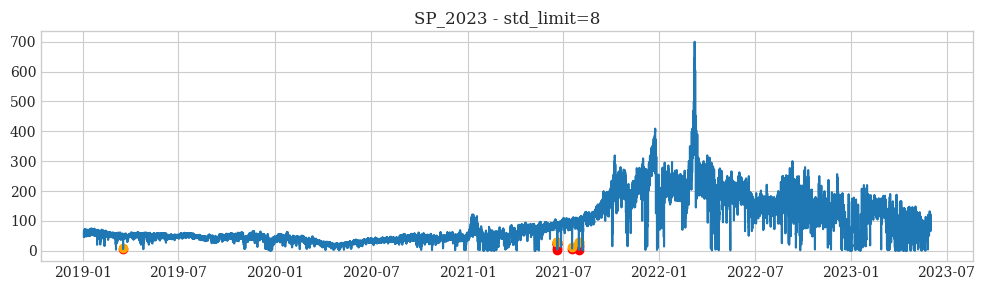

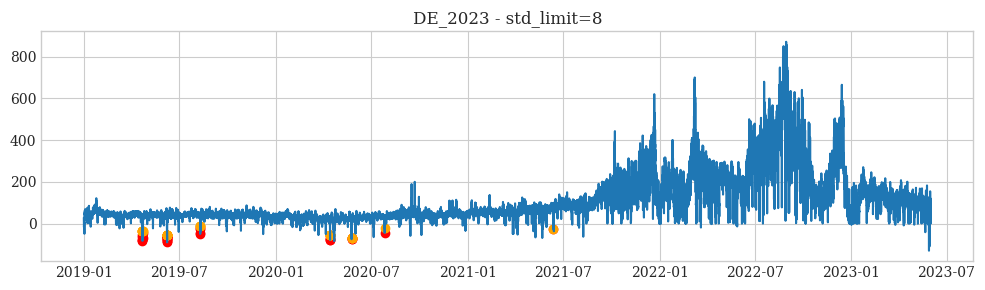

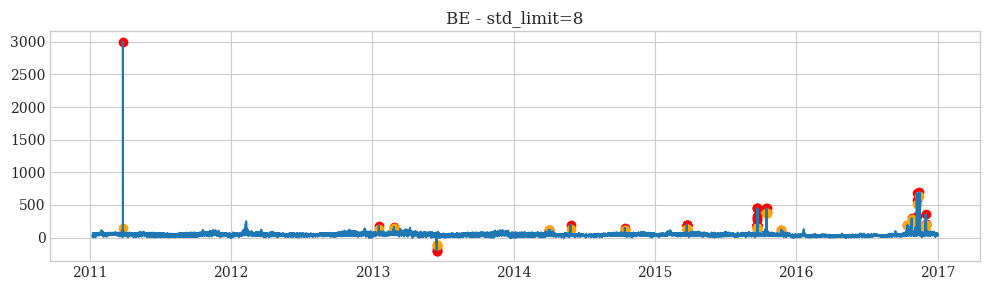

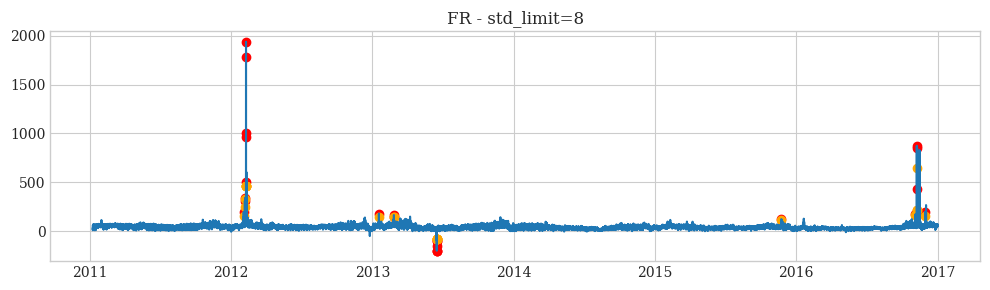

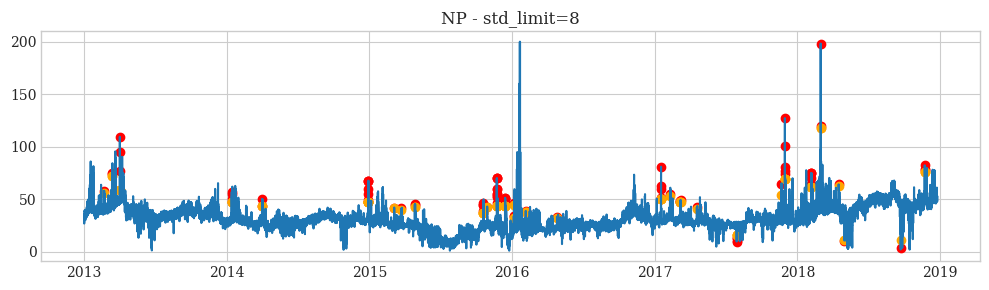

In [33]:
for name, dataset in dict_datastets.items():
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
    ax.plot(dataset.Date, dataset.Price)
    ax.scatter(dataset[dataset.Price != dataset.Price_no_outliers].Date, dataset[dataset.Price != dataset.Price_no_outliers].Price, color='red')
    ax.scatter(dataset[dataset.Price != dataset.Price_no_outliers].Date, dataset[dataset.Price != dataset.Price_no_outliers].Price_no_outliers, color='orange')
    ax.title.set_text(f"{name.replace('.csv', '')} - std_limit=8")
    plt.tight_layout()
    plt.show()

In [12]:
datasets = ["SP_2023.csv", "DE_2023.csv", "BE.csv", "FR.csv", "NP.csv"]
dict_datastets = {dataset: np.nan for dataset in datasets}
for dataset in datasets:
    print(dataset)
    df = pd.read_csv(f"Data//{dataset}")
    df['Date'] = pd.to_datetime(df.Date)
    df.columns = ['Date', 'Price', 'Exogenous 1', 'Exogenous 2']
    dict_datastets[dataset] = adaptive_standardisation_outliers(df, window_size=7, limit_std=10)

SP_2023.csv
Outlier mitigation through adaptive standardisation...
0.0 %
0.0 %
0.01 %
0.01 %
0.01 %
0.01 %
0.02 %
0.02 %
0.02 %
0.02 %
0.03 %
0.03 %
0.03 %
0.03 %
0.04 %
0.04 %
0.04 %
0.04 %
0.05 %
0.05 %
0.05 %
0.05 %
0.06 %
0.06 %
0.06 %
0.06 %
0.06999999999999999 %
0.06999999999999999 %
0.06999999999999999 %
0.08 %
0.08 %
0.08 %
0.08 %
0.09 %
0.09 %
0.09 %
0.09 %
0.1 %
0.1 %
0.1 %
0.1 %
0.11 %
0.11 %
0.11 %
0.11 %
0.12 %
0.12 %
0.12 %
0.12 %
0.13 %
0.13 %
0.13 %
0.13 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.13999999999999999 %
0.15 %
0.15 %
0.15 %
0.16 %
0.16 %
0.16 %
0.16 %
0.16999999999999998 %
0.16999999999999998 %
0.16999999999999998 %
0.16999999999999998 %
0.18 %
0.18 %
0.18 %
0.18 %
0.19 %
0.19 %
0.19 %
0.19 %
0.2 %
0.2 %
0.2 %
0.2 %
0.21 %
0.21 %
0.21 %
0.21 %
0.22 %
0.22 %
0.22 %
0.22999999999999998 %
0.22999999999999998 %
0.22999999999999998 %
0.22999999999999998 %
0.24 %
0.24 %
0.24 %
0.24 %
0.25 %
0.25 %
0.25 %
0.25 %
0.26 %
0.26 %
0.26 %
0.26

1.97 %
1.97 %
1.9800000000000002 %
1.9800000000000002 %
1.9800000000000002 %
1.9800000000000002 %
1.9900000000000002 %
1.9900000000000002 %
1.9900000000000002 %
1.9900000000000002 %
2.0 %
2.0 %
2.0 %
2.0 %
2.01 %
2.01 %
2.01 %
2.01 %
2.02 %
2.02 %
2.02 %
2.03 %
2.03 %
2.03 %
2.03 %
2.04 %
2.04 %
2.04 %
2.04 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.0500000000000003 %
2.06 %
2.06 %
2.06 %
2.06 %
2.07 %
2.07 %
2.07 %
2.07 %
2.08 %
2.08 %
2.08 %
2.08 %
2.09 %
2.09 %
2.09 %
2.09 %
2.1 %
2.1 %
2.1 %
2.11 %
2.11 %
2.11 %
2.11 %
2.12 %
2.12 %
2.12 %
2.12 %
2.13 %
2.13 %
2.13 %
2.13 %
2.1399999999999997 %
2.1399999999999997 %
2.1399999999999997 %
2.1399999999999997 %
2.15 %
2.15 %
2.15 %
2.15 %
2.16 %
2.16 %
2.16 %
2.16 %
2.17 %
2.17 %
2.17 %
2.18 %
2.18 %
2.18 %
2.18 %
2.19 %
2.19 %
2.19 %
2.19 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.1999999999999997 %
2.21 %
2.21 %
2.21 %
2.21 %
2.22 %
2.22 %
2.22 %
2.22 %
2.23 %
2.23 %
2.23 %
2.23 %
2.2399

3.93 %
3.93 %
3.93 %
3.93 %
3.94 %
3.94 %
3.94 %
3.94 %
3.95 %
3.95 %
3.95 %
3.95 %
3.9600000000000004 %
3.9600000000000004 %
3.9600000000000004 %
3.9600000000000004 %
3.9699999999999998 %
3.9699999999999998 %
3.9699999999999998 %
3.9800000000000004 %
3.9800000000000004 %
3.9800000000000004 %
3.9800000000000004 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
3.9899999999999998 %
4.0 %
4.0 %
4.0 %
4.0 %
4.01 %
4.01 %
4.01 %
4.01 %
4.02 %
4.02 %
4.02 %
4.02 %
4.03 %
4.03 %
4.03 %
4.03 %
4.04 %
4.04 %
4.04 %
4.05 %
4.05 %
4.05 %
4.05 %
4.06 %
4.06 %
4.06 %
4.06 %
4.07 %
4.07 %
4.07 %
4.07 %
4.08 %
4.08 %
4.08 %
4.08 %
4.09 %
4.09 %
4.09 %
4.09 %
4.1000000000000005 %
4.1000000000000005 %
4.1000000000000005 %
4.1000000000000005 %
4.109999999999999 %
4.109999999999999 %
4.109999999999999 %
4.109999999999999 %
4.12 %
4.12 %
4.12 %
4.130000000000001 %
4.130000000000001 %
4.130000000000001 %
4.130000000000001 %
4.14 %
4.14 %
4.14 %
4.14 %
4.15 %
4.15 %
4.15 %
4.15 %
4.16 %
4.16

6.09 %
6.09 %
6.09 %
6.1 %
6.1 %
6.1 %
6.1 %
6.11 %
6.11 %
6.11 %
6.11 %
6.12 %
6.12 %
6.12 %
6.12 %
6.13 %
6.13 %
6.13 %
6.13 %
6.140000000000001 %
6.140000000000001 %
6.140000000000001 %
6.15 %
6.15 %
6.15 %
6.15 %
6.16 %
6.16 %
6.16 %
6.16 %
6.17 %
6.17 %
6.17 %
6.17 %
6.18 %
6.18 %
6.18 %
6.18 %
6.1899999999999995 %
6.1899999999999995 %
6.1899999999999995 %
6.1899999999999995 %
6.2 %
6.2 %
6.2 %
6.2 %
6.21 %
6.21 %
6.21 %
6.22 %
6.22 %
6.22 %
6.22 %
6.23 %
6.23 %
6.23 %
6.23 %
6.239999999999999 %
6.239999999999999 %
6.239999999999999 %
6.239999999999999 %
6.25 %
6.25 %
6.25 %
6.25 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.29 %
6.29 %
6.29 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.32 %
6.32 %
6.32 %
6.32 %
6.329

7.89 %
7.89 %
7.9 %
7.9 %
7.9 %
7.9 %
7.91 %
7.91 %
7.91 %
7.91 %
7.920000000000001 %
7.920000000000001 %
7.920000000000001 %
7.920000000000001 %
7.93 %
7.93 %
7.93 %
7.9399999999999995 %
7.9399999999999995 %
7.9399999999999995 %
7.9399999999999995 %
7.95 %
7.95 %
7.95 %
7.95 %
7.960000000000001 %
7.960000000000001 %
7.960000000000001 %
7.960000000000001 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.969999999999999 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.9799999999999995 %
7.99 %
7.99 %
7.99 %
7.99 %
8.0 %
8.0 %
8.0 %
8.0 %
8.01 %
8.01 %
8.01 %
8.02 %
8.02 %
8.02 %
8.02 %
8.03 %
8.03 %
8.03 %
8.03 %
8.04 %
8.04 %
8.04 %
8.04 %
8.05 %
8.05 %
8.05 %
8.05 %
8.06 %
8.06 %
8.06 %
8.06 %
8.07 %
8.07 %
8.07 %
8.07 %
8.08 %
8.08 %
8.08 %
8.09 %
8.09 %
8.09 %
8.09 %
8.1 %
8.1 %
8.1 %
8.1 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.110000000000001 %
8.12 %
8.12 %
8.12 %
8.12 %
8.129999999999999 %
8.129999999999999 %
8.1299999999999

10.100000000000001 %
10.11 %
10.11 %
10.11 %
10.11 %
10.12 %
10.12 %
10.12 %
10.12 %
10.13 %
10.13 %
10.13 %
10.13 %
10.14 %
10.14 %
10.14 %
10.14 %
10.15 %
10.15 %
10.15 %
10.15 %
10.16 %
10.16 %
10.16 %
10.16 %
10.17 %
10.17 %
10.17 %
10.17 %
10.18 %
10.18 %
10.18 %
10.190000000000001 %
10.190000000000001 %
10.190000000000001 %
10.190000000000001 %
10.2 %
10.2 %
10.2 %
10.2 %
10.209999999999999 %
10.209999999999999 %
10.209999999999999 %
10.209999999999999 %
10.22 %
10.22 %
10.22 %
10.22 %
10.23 %
10.23 %
10.23 %
10.23 %
10.24 %
10.24 %
10.24 %
10.24 %
10.25 %
10.25 %
10.25 %
10.26 %
10.26 %
10.26 %
10.26 %
10.27 %
10.27 %
10.27 %
10.27 %
10.280000000000001 %
10.280000000000001 %
10.280000000000001 %
10.280000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.290000000000001 %
10.299999999999999 %
10.299999999999999 %
10.299999999999999 %
10.299999999999999 %
10.31 %
10.31 %
10.31 %
10.31 %
10.32 %
10.32 %
10.32 %
10.32 %
10.33 %
10.33 %
10.33 %
10.34 %
10.

12.17 %
12.17 %
12.17 %
12.18 %
12.18 %
12.18 %
12.18 %
12.19 %
12.19 %
12.19 %
12.19 %
12.2 %
12.2 %
12.2 %
12.21 %
12.21 %
12.21 %
12.21 %
12.22 %
12.22 %
12.22 %
12.22 %
12.23 %
12.23 %
12.23 %
12.23 %
12.24 %
12.24 %
12.24 %
12.24 %
12.25 %
12.25 %
12.25 %
12.25 %
12.26 %
12.26 %
12.26 %
12.26 %
12.27 %
12.27 %
12.27 %
12.27 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.29 %
12.29 %
12.29 %
12.29 %
12.3 %
12.3 %
12.3 %
12.3 %
12.31 %
12.31 %
12.31 %
12.31 %
12.32 %
12.32 %
12.32 %
12.32 %
12.33 %
12.33 %
12.33 %
12.33 %
12.34 %
12.34 %
12.34 %
12.34 %
12.35 %
12.35 %
12.35 %
12.36 %
12.36 %
12.36 %
12.36 %
12.370000000000001 %
12.370000000000001 %
12.370000000000001 %
12.370000000000001 %
12.379999999999999 %
12.379999999999999 %
12.379999999999999 %
12.379999999999999 %
12.389999999999999 %
12.389999999999999 %
12.389999999999999 %
12.389999999999999 %
12.4 %
12.4 %
12.4 %
12.4 %
12.41 %
12.41 %
12.41 %
12.41 %
12.42 %
12.42 %
12.42 %
12.42 %
12.43 %
12.43 %


13.900000000000002 %
13.900000000000002 %
13.91 %
13.91 %
13.91 %
13.91 %
13.919999999999998 %
13.919999999999998 %
13.919999999999998 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.930000000000001 %
13.94 %
13.94 %
13.94 %
13.94 %
13.950000000000001 %
13.950000000000001 %
13.950000000000001 %
13.950000000000001 %
13.96 %
13.96 %
13.96 %
13.96 %
13.969999999999999 %
13.969999999999999 %
13.969999999999999 %
13.969999999999999 %
13.98 %
13.98 %
13.98 %
13.98 %
13.99 %
13.99 %
13.99 %
13.99 %
14.000000000000002 %
14.000000000000002 %
14.000000000000002 %
14.01 %
14.01 %
14.01 %
14.01 %
14.02 %
14.02 %
14.02 %
14.02 %
14.030000000000001 %
14.030000000000001 %
14.030000000000001 %
14.030000000000001 %
14.04 %
14.04 %
14.04 %
14.04 %
14.05 %
14.05 %
14.05 %
14.05 %
14.06 %
14.06 %
14.06 %
14.06 %
14.069999999999999 %
14.069999999999999 %
14.069999999999999 %
14.08 %
14.08 %
14.08 %
14.08 %
14.09 %
14.09 %
14.09 %
14.09 %
14.099999999999998 %
14.099999999999998 %
14.0999

15.58 %
15.590000000000002 %
15.590000000000002 %
15.590000000000002 %
15.590000000000002 %
15.6 %
15.6 %
15.6 %
15.6 %
15.61 %
15.61 %
15.61 %
15.61 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.620000000000001 %
15.629999999999999 %
15.629999999999999 %
15.629999999999999 %
15.629999999999999 %
15.64 %
15.64 %
15.64 %
15.65 %
15.65 %
15.65 %
15.65 %
15.659999999999998 %
15.659999999999998 %
15.659999999999998 %
15.659999999999998 %
15.67 %
15.67 %
15.67 %
15.67 %
15.68 %
15.68 %
15.68 %
15.68 %
15.690000000000001 %
15.690000000000001 %
15.690000000000001 %
15.690000000000001 %
15.7 %
15.7 %
15.7 %
15.7 %
15.709999999999999 %
15.709999999999999 %
15.709999999999999 %
15.709999999999999 %
15.72 %
15.72 %
15.72 %
15.73 %
15.73 %
15.73 %
15.73 %
15.740000000000002 %
15.740000000000002 %
15.740000000000002 %
15.740000000000002 %
15.75 %
15.75 %
15.75 %
15.75 %
15.76 %
15.76 %
15.76 %
15.76 %
15.770000000000001 %
15.770000000000001 %
15.770000000000001 %
15.7700000000

17.47 %
17.48 %
17.48 %
17.48 %
17.48 %
17.49 %
17.49 %
17.49 %
17.49 %
17.5 %
17.5 %
17.5 %
17.5 %
17.51 %
17.51 %
17.51 %
17.52 %
17.52 %
17.52 %
17.52 %
17.53 %
17.53 %
17.53 %
17.53 %
17.54 %
17.54 %
17.54 %
17.54 %
17.549999999999997 %
17.549999999999997 %
17.549999999999997 %
17.549999999999997 %
17.560000000000002 %
17.560000000000002 %
17.560000000000002 %
17.560000000000002 %
17.57 %
17.57 %
17.57 %
17.57 %
17.580000000000002 %
17.580000000000002 %
17.580000000000002 %
17.580000000000002 %
17.59 %
17.59 %
17.59 %
17.599999999999998 %
17.599999999999998 %
17.599999999999998 %
17.599999999999998 %
17.61 %
17.61 %
17.61 %
17.61 %
17.62 %
17.62 %
17.62 %
17.62 %
17.630000000000003 %
17.630000000000003 %
17.630000000000003 %
17.630000000000003 %
17.64 %
17.64 %
17.64 %
17.64 %
17.65 %
17.65 %
17.65 %
17.65 %
17.66 %
17.66 %
17.66 %
17.669999999999998 %
17.669999999999998 %
17.669999999999998 %
17.669999999999998 %
17.68 %
17.68 %
17.68 %
17.68 %
17.69 %
17.69 %
17.69 %
17.69 %
17.7

19.56 %
19.57 %
19.57 %
19.57 %
19.57 %
19.580000000000002 %
19.580000000000002 %
19.580000000000002 %
19.580000000000002 %
19.59 %
19.59 %
19.59 %
19.59 %
19.6 %
19.6 %
19.6 %
19.6 %
19.61 %
19.61 %
19.61 %
19.62 %
19.62 %
19.62 %
19.62 %
19.63 %
19.63 %
19.63 %
19.63 %
19.64 %
19.64 %
19.64 %
19.64 %
19.650000000000002 %
19.650000000000002 %
19.650000000000002 %
19.650000000000002 %
19.66 %
19.66 %
19.66 %
19.66 %
19.67 %
19.67 %
19.67 %
19.67 %
19.68 %
19.68 %
19.68 %
19.68 %
19.689999999999998 %
19.689999999999998 %
19.689999999999998 %
19.7 %
19.7 %
19.7 %
19.7 %
19.71 %
19.71 %
19.71 %
19.71 %
19.72 %
19.72 %
19.72 %
19.72 %
19.73 %
19.73 %
19.73 %
19.73 %
19.74 %
19.74 %
19.74 %
19.74 %
19.75 %
19.75 %
19.75 %
19.75 %
19.759999999999998 %
19.759999999999998 %
19.759999999999998 %
19.77 %
19.77 %
19.77 %
19.77 %
19.78 %
19.78 %
19.78 %
19.78 %
19.79 %
19.79 %
19.79 %
19.79 %
19.8 %
19.8 %
19.8 %
19.8 %
19.81 %
19.81 %
19.81 %
19.81 %
19.82 %
19.82 %
19.82 %
19.82 %
19.83000000000

21.59 %
21.59 %
21.59 %
21.6 %
21.6 %
21.6 %
21.6 %
21.61 %
21.61 %
21.61 %
21.61 %
21.62 %
21.62 %
21.62 %
21.62 %
21.63 %
21.63 %
21.63 %
21.64 %
21.64 %
21.64 %
21.64 %
21.65 %
21.65 %
21.65 %
21.65 %
21.66 %
21.66 %
21.66 %
21.66 %
21.67 %
21.67 %
21.67 %
21.67 %
21.68 %
21.68 %
21.68 %
21.68 %
21.69 %
21.69 %
21.69 %
21.69 %
21.7 %
21.7 %
21.7 %
21.7 %
21.709999999999997 %
21.709999999999997 %
21.709999999999997 %
21.72 %
21.72 %
21.72 %
21.72 %
21.73 %
21.73 %
21.73 %
21.73 %
21.740000000000002 %
21.740000000000002 %
21.740000000000002 %
21.740000000000002 %
21.75 %
21.75 %
21.75 %
21.75 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.77 %
21.77 %
21.77 %
21.77 %
21.78 %
21.78 %
21.78 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.8 %
21.8 %
21.8 %
21.8 %
21.81 %
21.81 %
21.81 %
21.81 %
21.82 %
21.82 %
21.82 %
21.82 %
21.83 %
21.83 %
21.83 %
21.83 %
21.84 %
21.84 %
21.84 %
21.84 %
21.85 %
21.85 %
2

23.630000000000003 %
23.630000000000003 %
23.630000000000003 %
23.64 %
23.64 %
23.64 %
23.64 %
23.65 %
23.65 %
23.65 %
23.66 %
23.66 %
23.66 %
23.66 %
23.669999999999998 %
23.669999999999998 %
23.669999999999998 %
23.669999999999998 %
23.68 %
23.68 %
23.68 %
23.68 %
23.69 %
23.69 %
23.69 %
23.69 %
23.7 %
23.7 %
23.7 %
23.7 %
23.71 %
23.71 %
23.71 %
23.71 %
23.72 %
23.72 %
23.72 %
23.72 %
23.73 %
23.73 %
23.73 %
23.74 %
23.74 %
23.74 %
23.74 %
23.75 %
23.75 %
23.75 %
23.75 %
23.76 %
23.76 %
23.76 %
23.76 %
23.77 %
23.77 %
23.77 %
23.77 %
23.78 %
23.78 %
23.78 %
23.78 %
23.79 %
23.79 %
23.79 %
23.79 %
23.799999999999997 %
23.799999999999997 %
23.799999999999997 %
23.810000000000002 %
23.810000000000002 %
23.810000000000002 %
23.810000000000002 %
23.82 %
23.82 %
23.82 %
23.82 %
23.830000000000002 %
23.830000000000002 %
23.830000000000002 %
23.830000000000002 %
23.84 %
23.84 %
23.84 %
23.84 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.849999999999998 %
23.86 %
23.86 

25.56 %
25.56 %
25.56 %
25.569999999999997 %
25.569999999999997 %
25.569999999999997 %
25.569999999999997 %
25.580000000000002 %
25.580000000000002 %
25.580000000000002 %
25.580000000000002 %
25.590000000000003 %
25.590000000000003 %
25.590000000000003 %
25.590000000000003 %
25.6 %
25.6 %
25.6 %
25.61 %
25.61 %
25.61 %
25.61 %
25.619999999999997 %
25.619999999999997 %
25.619999999999997 %
25.619999999999997 %
25.629999999999995 %
25.629999999999995 %
25.629999999999995 %
25.629999999999995 %
25.64 %
25.64 %
25.64 %
25.64 %
25.650000000000002 %
25.650000000000002 %
25.650000000000002 %
25.650000000000002 %
25.66 %
25.66 %
25.66 %
25.66 %
25.669999999999998 %
25.669999999999998 %
25.669999999999998 %
25.679999999999996 %
25.679999999999996 %
25.679999999999996 %
25.679999999999996 %
25.69 %
25.69 %
25.69 %
25.69 %
25.7 %
25.7 %
25.7 %
25.7 %
25.71 %
25.71 %
25.71 %
25.71 %
25.72 %
25.72 %
25.72 %
25.72 %
25.729999999999997 %
25.729999999999997 %
25.729999999999997 %
25.729999999999997 %


27.18 %
27.18 %
27.18 %
27.18 %
27.189999999999998 %
27.189999999999998 %
27.189999999999998 %
27.189999999999998 %
27.200000000000003 %
27.200000000000003 %
27.200000000000003 %
27.200000000000003 %
27.21 %
27.21 %
27.21 %
27.21 %
27.22 %
27.22 %
27.22 %
27.22 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.24 %
27.24 %
27.24 %
27.24 %
27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.26 %
27.26 %
27.26 %
27.26 %
27.27 %
27.27 %
27.27 %
27.27 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.29 %
27.29 %
27.29 %
27.29 %
27.3 %
27.3 %
27.3 %
27.3 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.32 %
27.32 %
27.32 %
27.33 %
27.33 %
27.33 %
27.33 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.35 %
27.35 %
27.35 %
27.35 %
27.36 %
27.36 %
27.36 %
27.36 %
27.37 %
27.37 %
27.37 %
27.37 %
27.38 %
27.38 %
27.38 %
27.38

28.87 %
28.87 %
28.88 %
28.88 %
28.88 %
28.88 %
28.89 %
28.89 %
28.89 %
28.9 %
28.9 %
28.9 %
28.9 %
28.910000000000004 %
28.910000000000004 %
28.910000000000004 %
28.910000000000004 %
28.92 %
28.92 %
28.92 %
28.92 %
28.93 %
28.93 %
28.93 %
28.93 %
28.939999999999998 %
28.939999999999998 %
28.939999999999998 %
28.939999999999998 %
28.95 %
28.95 %
28.95 %
28.95 %
28.96 %
28.96 %
28.96 %
28.96 %
28.970000000000002 %
28.970000000000002 %
28.970000000000002 %
28.98 %
28.98 %
28.98 %
28.98 %
28.99 %
28.99 %
28.99 %
28.99 %
28.999999999999996 %
28.999999999999996 %
28.999999999999996 %
28.999999999999996 %
29.01 %
29.01 %
29.01 %
29.01 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.020000000000003 %
29.03 %
29.03 %
29.03 %
29.03 %
29.04 %
29.04 %
29.04 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.049999999999997 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.060000000000002 %
29.07 %
29.07 %
29.07 %
29.07 %
29.080000000000002 %


30.55 %
30.55 %
30.55 %
30.55 %
30.56 %
30.56 %
30.56 %
30.56 %
30.570000000000004 %
30.570000000000004 %
30.570000000000004 %
30.570000000000004 %
30.580000000000002 %
30.580000000000002 %
30.580000000000002 %
30.580000000000002 %
30.59 %
30.59 %
30.59 %
30.59 %
30.599999999999998 %
30.599999999999998 %
30.599999999999998 %
30.599999999999998 %
30.61 %
30.61 %
30.61 %
30.620000000000005 %
30.620000000000005 %
30.620000000000005 %
30.620000000000005 %
30.630000000000003 %
30.630000000000003 %
30.630000000000003 %
30.630000000000003 %
30.64 %
30.64 %
30.64 %
30.64 %
30.65 %
30.65 %
30.65 %
30.65 %
30.659999999999997 %
30.659999999999997 %
30.659999999999997 %
30.659999999999997 %
30.669999999999998 %
30.669999999999998 %
30.669999999999998 %
30.669999999999998 %
30.680000000000003 %
30.680000000000003 %
30.680000000000003 %
30.680000000000003 %
30.69 %
30.69 %
30.69 %
30.7 %
30.7 %
30.7 %
30.7 %
30.709999999999997 %
30.709999999999997 %
30.709999999999997 %
30.709999999999997 %
30.72 %


32.14 %
32.15 %
32.15 %
32.15 %
32.15 %
32.16 %
32.16 %
32.16 %
32.16 %
32.17 %
32.17 %
32.17 %
32.17 %
32.18 %
32.18 %
32.18 %
32.18 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.2 %
32.2 %
32.2 %
32.2 %
32.21 %
32.21 %
32.21 %
32.21 %
32.22 %
32.22 %
32.22 %
32.22 %
32.23 %
32.23 %
32.23 %
32.23 %
32.24 %
32.24 %
32.24 %
32.24 %
32.25 %
32.25 %
32.25 %
32.25 %
32.26 %
32.26 %
32.26 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.28 %
32.28 %
32.28 %
32.28 %
32.29 %
32.29 %
32.29 %
32.29 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.31 %
32.31 %
32.31 %
32.31 %
32.32 %
32.32 %
32.32 %
32.32 %
32.33 %
32.33 %
32.33 %
32.33 %
32.34 %
32.34 %
32.34 %
32.35 %
32.35 %
32.35 %
32.35 %
32.36 %
32.36 %
32.36 %
32.36 %
32.37 %
32.37 %
32.37 %
32.37 %
32.379999999999995 %
32.379999999999995 %
32.379999999999995 %
32.379999999999995 %
32.39 %
32.39 %
32.39 %
32.39 %
32.4 %
32.4 %
32.4 %
32.4

34.160000000000004 %
34.17 %
34.17 %
34.17 %
34.17 %
34.18 %
34.18 %
34.18 %
34.18 %
34.19 %
34.19 %
34.19 %
34.19 %
34.2 %
34.2 %
34.2 %
34.2 %
34.21 %
34.21 %
34.21 %
34.22 %
34.22 %
34.22 %
34.22 %
34.23 %
34.23 %
34.23 %
34.23 %
34.239999999999995 %
34.239999999999995 %
34.239999999999995 %
34.239999999999995 %
34.25 %
34.25 %
34.25 %
34.25 %
34.260000000000005 %
34.260000000000005 %
34.260000000000005 %
34.260000000000005 %
34.27 %
34.27 %
34.27 %
34.27 %
34.28 %
34.28 %
34.28 %
34.29 %
34.29 %
34.29 %
34.29 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.300000000000004 %
34.31 %
34.31 %
34.31 %
34.31 %
34.32 %
34.32 %
34.32 %
34.32 %
34.33 %
34.33 %
34.33 %
34.33 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.339999999999996 %
34.35 %
34.35 %
34.35 %
34.35 %
34.36 %
34.36 %
34.36 %
34.37 %
34.37 %
34.37 %
34.37 %
34.38 %
34.38 %
34.38 %
34.38 %
34.39 %
34.39 %
34.39 %
34.39 %
34.4 %
34.4 %
34.4 %
34.4 %
34.410000000000004 %
34.41000000000

36.14 %
36.14 %
36.14 %
36.14 %
36.15 %
36.15 %
36.15 %
36.16 %
36.16 %
36.16 %
36.16 %
36.17 %
36.17 %
36.17 %
36.17 %
36.18 %
36.18 %
36.18 %
36.18 %
36.19 %
36.19 %
36.19 %
36.19 %
36.199999999999996 %
36.199999999999996 %
36.199999999999996 %
36.199999999999996 %
36.21 %
36.21 %
36.21 %
36.21 %
36.22 %
36.22 %
36.22 %
36.22 %
36.230000000000004 %
36.230000000000004 %
36.230000000000004 %
36.24 %
36.24 %
36.24 %
36.24 %
36.25 %
36.25 %
36.25 %
36.25 %
36.26 %
36.26 %
36.26 %
36.26 %
36.27 %
36.27 %
36.27 %
36.27 %
36.28 %
36.28 %
36.28 %
36.28 %
36.29 %
36.29 %
36.29 %
36.29 %
36.3 %
36.3 %
36.3 %
36.309999999999995 %
36.309999999999995 %
36.309999999999995 %
36.309999999999995 %
36.32 %
36.32 %
36.32 %
36.32 %
36.33 %
36.33 %
36.33 %
36.33 %
36.34 %
36.34 %
36.34 %
36.34 %
36.35 %
36.35 %
36.35 %
36.35 %
36.36 %
36.36 %
36.36 %
36.36 %
36.370000000000005 %
36.370000000000005 %
36.370000000000005 %
36.370000000000005 %
36.38 %
36.38 %
36.38 %
36.39 %
36.39 %
36.39 %
36.39 %
36.4 %
3

38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.29 %
38.29 %
38.29 %
38.29 %
38.3 %
38.3 %
38.3 %
38.3 %
38.31 %
38.31 %
38.31 %
38.31 %
38.32 %
38.32 %
38.32 %
38.33 %
38.33 %
38.33 %
38.33 %
38.34 %
38.34 %
38.34 %
38.34 %
38.35 %
38.35 %
38.35 %
38.35 %
38.36 %
38.36 %
38.36 %
38.36 %
38.37 %
38.37 %
38.37 %
38.37 %
38.379999999999995 %
38.379999999999995 %
38.379999999999995 %
38.379999999999995 %
38.39 %
38.39 %
38.39 %
38.39 %
38.4 %
38.4 %
38.4 %
38.41 %
38.41 %
38.41 %
38.41 %
38.42 %
38.42 %
38.42 %
38.42 %
38.43 %
38.43 %
38.43 %
38.43 %
38.440000000000005 %
38.440000000000005 %
38.440000000000005 %
38.440000000000005 %
38.45 %
38.45 %
38.45 %
38.45 %
38.46 %
38.46 %
38.46 %
38.46 %
38.47 %
38.47 %
38.47 %
38.48 %
38.48 %
38.48 %
38.48 %
38.49 %
38.49 %
38.49 %
38.49 %
38.5 %
38.5 %
38.5 %
38.5 %
38.51 %
38.51 %
38.51 %
38.51 %
38.519999999999996 %
38.519

40.300000000000004 %
40.300000000000004 %
40.31 %
40.31 %
40.31 %
40.31 %
40.32 %
40.32 %
40.32 %
40.32 %
40.33 %
40.33 %
40.33 %
40.33 %
40.339999999999996 %
40.339999999999996 %
40.339999999999996 %
40.35 %
40.35 %
40.35 %
40.35 %
40.36 %
40.36 %
40.36 %
40.36 %
40.37 %
40.37 %
40.37 %
40.37 %
40.38 %
40.38 %
40.38 %
40.38 %
40.39 %
40.39 %
40.39 %
40.39 %
40.400000000000006 %
40.400000000000006 %
40.400000000000006 %
40.400000000000006 %
40.410000000000004 %
40.410000000000004 %
40.410000000000004 %
40.410000000000004 %
40.42 %
40.42 %
40.42 %
40.43 %
40.43 %
40.43 %
40.43 %
40.44 %
40.44 %
40.44 %
40.44 %
40.45 %
40.45 %
40.45 %
40.45 %
40.46 %
40.46 %
40.46 %
40.46 %
40.47 %
40.47 %
40.47 %
40.47 %
40.48 %
40.48 %
40.48 %
40.48 %
40.489999999999995 %
40.489999999999995 %
40.489999999999995 %
40.5 %
40.5 %
40.5 %
40.5 %
40.510000000000005 %
40.510000000000005 %
40.510000000000005 %
40.510000000000005 %
40.52 %
40.52 %
40.52 %
40.52 %
40.53 %
40.53 %
40.53 %
40.53 %
40.54 %
40.54 %


42.26 %
42.26 %
42.26 %
42.26 %
42.27 %
42.27 %
42.27 %
42.27 %
42.28 %
42.28 %
42.28 %
42.28 %
42.29 %
42.29 %
42.29 %
42.3 %
42.3 %
42.3 %
42.3 %
42.309999999999995 %
42.309999999999995 %
42.309999999999995 %
42.309999999999995 %
42.32 %
42.32 %
42.32 %
42.32 %
42.33 %
42.33 %
42.33 %
42.33 %
42.34 %
42.34 %
42.34 %
42.34 %
42.35 %
42.35 %
42.35 %
42.35 %
42.36 %
42.36 %
42.36 %
42.36 %
42.370000000000005 %
42.370000000000005 %
42.370000000000005 %
42.38 %
42.38 %
42.38 %
42.38 %
42.39 %
42.39 %
42.39 %
42.39 %
42.4 %
42.4 %
42.4 %
42.4 %
42.41 %
42.41 %
42.41 %
42.41 %
42.42 %
42.42 %
42.42 %
42.42 %
42.43 %
42.43 %
42.43 %
42.43 %
42.44 %
42.44 %
42.44 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.449999999999996 %
42.46 %
42.46 %
42.46 %
42.46 %
42.47 %
42.47 %
42.47 %
42.47 %
42.480000000000004 %
42.480000000000004 %
42.480000000000004 %
42.480000000000004 %
42.49 %
42.49 %
42.49 %
42.49 %
42.5 %
42.5 %
42.5 %
42.5 %
42.51 %
42.51 %
42.51 %
42.52 %
42.52 %
4

44.39 %
44.39 %
44.4 %
44.4 %
44.4 %
44.4 %
44.41 %
44.41 %
44.41 %
44.41 %
44.42 %
44.42 %
44.42 %
44.42 %
44.43 %
44.43 %
44.43 %
44.43 %
44.440000000000005 %
44.440000000000005 %
44.440000000000005 %
44.440000000000005 %
44.45 %
44.45 %
44.45 %
44.45 %
44.46 %
44.46 %
44.46 %
44.47 %
44.47 %
44.47 %
44.47 %
44.48 %
44.48 %
44.48 %
44.48 %
44.49 %
44.49 %
44.49 %
44.49 %
44.5 %
44.5 %
44.5 %
44.5 %
44.51 %
44.51 %
44.51 %
44.51 %
44.519999999999996 %
44.519999999999996 %
44.519999999999996 %
44.519999999999996 %
44.529999999999994 %
44.529999999999994 %
44.529999999999994 %
44.529999999999994 %
44.54 %
44.54 %
44.54 %
44.55 %
44.55 %
44.55 %
44.55 %
44.56 %
44.56 %
44.56 %
44.56 %
44.57 %
44.57 %
44.57 %
44.57 %
44.58 %
44.58 %
44.58 %
44.58 %
44.59 %
44.59 %
44.59 %
44.59 %
44.6 %
44.6 %
44.6 %
44.6 %
44.61 %
44.61 %
44.61 %
44.62 %
44.62 %
44.62 %
44.62 %
44.629999999999995 %
44.629999999999995 %
44.629999999999995 %
44.629999999999995 %
44.64 %
44.64 %
44.64 %
44.64 %
44.65 %
44.6

46.44 %
46.45 %
46.45 %
46.45 %
46.45 %
46.46 %
46.46 %
46.46 %
46.46 %
46.47 %
46.47 %
46.47 %
46.47 %
46.48 %
46.48 %
46.48 %
46.489999999999995 %
46.489999999999995 %
46.489999999999995 %
46.489999999999995 %
46.5 %
46.5 %
46.5 %
46.5 %
46.51 %
46.51 %
46.51 %
46.51 %
46.52 %
46.52 %
46.52 %
46.52 %
46.53 %
46.53 %
46.53 %
46.53 %
46.54 %
46.54 %
46.54 %
46.54 %
46.550000000000004 %
46.550000000000004 %
46.550000000000004 %
46.550000000000004 %
46.56 %
46.56 %
46.56 %
46.57 %
46.57 %
46.57 %
46.57 %
46.58 %
46.58 %
46.58 %
46.58 %
46.589999999999996 %
46.589999999999996 %
46.589999999999996 %
46.589999999999996 %
46.6 %
46.6 %
46.6 %
46.6 %
46.61 %
46.61 %
46.61 %
46.61 %
46.62 %
46.62 %
46.62 %
46.62 %
46.63 %
46.63 %
46.63 %
46.64 %
46.64 %
46.64 %
46.64 %
46.650000000000006 %
46.650000000000006 %
46.650000000000006 %
46.650000000000006 %
46.660000000000004 %
46.660000000000004 %
46.660000000000004 %
46.660000000000004 %
46.67 %
46.67 %
46.67 %
46.67 %
46.68 %
46.68 %
46.68 %
46.6

48.43 %
48.43 %
48.43 %
48.44 %
48.44 %
48.44 %
48.44 %
48.449999999999996 %
48.449999999999996 %
48.449999999999996 %
48.449999999999996 %
48.46 %
48.46 %
48.46 %
48.46 %
48.47 %
48.47 %
48.47 %
48.47 %
48.480000000000004 %
48.480000000000004 %
48.480000000000004 %
48.480000000000004 %
48.49 %
48.49 %
48.49 %
48.49 %
48.5 %
48.5 %
48.5 %
48.51 %
48.51 %
48.51 %
48.51 %
48.52 %
48.52 %
48.52 %
48.52 %
48.53 %
48.53 %
48.53 %
48.53 %
48.54 %
48.54 %
48.54 %
48.54 %
48.55 %
48.55 %
48.55 %
48.55 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.57 %
48.57 %
48.57 %
48.57 %
48.58 %
48.58 %
48.58 %
48.59 %
48.59 %
48.59 %
48.59 %
48.6 %
48.6 %
48.6 %
48.6 %
48.61 %
48.61 %
48.61 %
48.61 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.63 %
48.63 %
48.63 %
48.63 %
48.64 %
48.64 %
48.64 %
48.64 %
48.65 %
48.65 %
48.65 %
48.66 %
48.66 %
48.66 %
48.66 %
48.67 %
48.67 %
48.67 %
48.67 %
48.68 %
48.68 %
48.68 %
48.68 %

50.44 %
50.44 %
50.449999999999996 %
50.449999999999996 %
50.449999999999996 %
50.46000000000001 %
50.46000000000001 %
50.46000000000001 %
50.46000000000001 %
50.470000000000006 %
50.470000000000006 %
50.470000000000006 %
50.470000000000006 %
50.480000000000004 %
50.480000000000004 %
50.480000000000004 %
50.480000000000004 %
50.49 %
50.49 %
50.49 %
50.49 %
50.5 %
50.5 %
50.5 %
50.5 %
50.51 %
50.51 %
50.51 %
50.51 %
50.519999999999996 %
50.519999999999996 %
50.519999999999996 %
50.529999999999994 %
50.529999999999994 %
50.529999999999994 %
50.529999999999994 %
50.54 %
50.54 %
50.54 %
50.54 %
50.55 %
50.55 %
50.55 %
50.55 %
50.56 %
50.56 %
50.56 %
50.56 %
50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.57000000000001 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.580000000000005 %
50.59 %
50.59 %
50.59 %
50.59 %
50.6 %
50.6 %
50.6 %
50.61 %
50.61 %
50.61 %
50.61 %
50.62 %
50.62 %
50.62 %
50.62 %
50.629999999999995 %
50.629999999999995 %
50.629999999999

52.1 %
52.11 %
52.11 %
52.11 %
52.11 %
52.12 %
52.12 %
52.12 %
52.12 %
52.129999999999995 %
52.129999999999995 %
52.129999999999995 %
52.129999999999995 %
52.14 %
52.14 %
52.14 %
52.14 %
52.15 %
52.15 %
52.15 %
52.15 %
52.16 %
52.16 %
52.16 %
52.16 %
52.17 %
52.17 %
52.17 %
52.18000000000001 %
52.18000000000001 %
52.18000000000001 %
52.18000000000001 %
52.190000000000005 %
52.190000000000005 %
52.190000000000005 %
52.190000000000005 %
52.2 %
52.2 %
52.2 %
52.2 %
52.21 %
52.21 %
52.21 %
52.21 %
52.22 %
52.22 %
52.22 %
52.22 %
52.23 %
52.23 %
52.23 %
52.23 %
52.239999999999995 %
52.239999999999995 %
52.239999999999995 %
52.239999999999995 %
52.25 %
52.25 %
52.25 %
52.26 %
52.26 %
52.26 %
52.26 %
52.27 %
52.27 %
52.27 %
52.27 %
52.28 %
52.28 %
52.28 %
52.28 %
52.290000000000006 %
52.290000000000006 %
52.290000000000006 %
52.290000000000006 %
52.300000000000004 %
52.300000000000004 %
52.300000000000004 %
52.300000000000004 %
52.31 %
52.31 %
52.31 %
52.31 %
52.32 %
52.32 %
52.32 %
52.33 %
5

53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.81 %
53.81 %
53.81 %
53.81 %
53.82 %
53.82 %
53.82 %
53.83 %
53.83 %
53.83 %
53.83 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.86 %
53.86 %
53.86 %
53.86 %
53.87 %
53.87 %
53.87 %
53.87 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.900000000000006 %
53.900000000000006 %
53.900000000000006 %
53.900000000000006 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.910000000000004 %
53.92 %
53.92 %
53.92 %
53.92 %
53.93 %
53.93 %
53.93 %
53.93 %
53.94 %
53.94 %
53.94 %
53.94 %
53.949999999999996 %
53.949999999999996 %
53.949999999999996 %
53.949999999999996 %
53.959999999999994 %
53.959999999999994 %
53.959999999999994 %
53.959999999999994 %
53.97 %
53.97 %
53.97 %
53.98 %
53.98 %
5

55.44 %
55.44 %
55.44 %
55.45 %
55.45 %
55.45 %
55.45 %
55.46 %
55.46 %
55.46 %
55.47 %
55.47 %
55.47 %
55.47 %
55.48 %
55.48 %
55.48 %
55.48 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.489999999999995 %
55.50000000000001 %
55.50000000000001 %
55.50000000000001 %
55.50000000000001 %
55.510000000000005 %
55.510000000000005 %
55.510000000000005 %
55.510000000000005 %
55.52 %
55.52 %
55.52 %
55.52 %
55.53 %
55.53 %
55.53 %
55.53 %
55.54 %
55.54 %
55.54 %
55.55 %
55.55 %
55.55 %
55.55 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.559999999999995 %
55.57 %
55.57 %
55.57 %
55.57 %
55.58 %
55.58 %
55.58 %
55.58 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.589999999999996 %
55.60000000000001 %
55.60000000000001 %
55.60000000000001 %
55.60000000000001 %
55.61000000000001 %
55.61000000000001 %
55.61000000000001 %
55.620000000000005 %
55.620000000000005 %
55.620000000000005 %
55.620000000000005 %
55.63 %
55.63 %
55.63 %
55.63 %


57.099999999999994 %
57.099999999999994 %
57.099999999999994 %
57.11000000000001 %
57.11000000000001 %
57.11000000000001 %
57.120000000000005 %
57.120000000000005 %
57.120000000000005 %
57.120000000000005 %
57.13 %
57.13 %
57.13 %
57.13 %
57.14 %
57.14 %
57.14 %
57.14 %
57.15 %
57.15 %
57.15 %
57.15 %
57.16 %
57.16 %
57.16 %
57.16 %
57.17 %
57.17 %
57.17 %
57.17 %
57.18 %
57.18 %
57.18 %
57.18 %
57.19 %
57.19 %
57.19 %
57.199999999999996 %
57.199999999999996 %
57.199999999999996 %
57.199999999999996 %
57.21000000000001 %
57.21000000000001 %
57.21000000000001 %
57.21000000000001 %
57.220000000000006 %
57.220000000000006 %
57.220000000000006 %
57.220000000000006 %
57.230000000000004 %
57.230000000000004 %
57.230000000000004 %
57.230000000000004 %
57.24 %
57.24 %
57.24 %
57.24 %
57.25 %
57.25 %
57.25 %
57.25 %
57.26 %
57.26 %
57.26 %
57.269999999999996 %
57.269999999999996 %
57.269999999999996 %
57.269999999999996 %
57.28 %
57.28 %
57.28 %
57.28 %
57.29 %
57.29 %
57.29 %
57.29 %
57.3 %
57

58.76 %
58.77 %
58.77 %
58.77 %
58.77 %
58.78 %
58.78 %
58.78 %
58.78 %
58.79 %
58.79 %
58.79 %
58.79 %
58.8 %
58.8 %
58.8 %
58.8 %
58.809999999999995 %
58.809999999999995 %
58.809999999999995 %
58.809999999999995 %
58.81999999999999 %
58.81999999999999 %
58.81999999999999 %
58.81999999999999 %
58.830000000000005 %
58.830000000000005 %
58.830000000000005 %
58.84 %
58.84 %
58.84 %
58.84 %
58.85 %
58.85 %
58.85 %
58.85 %
58.86 %
58.86 %
58.86 %
58.86 %
58.87 %
58.87 %
58.87 %
58.87 %
58.879999999999995 %
58.879999999999995 %
58.879999999999995 %
58.879999999999995 %
58.89 %
58.89 %
58.89 %
58.89 %
58.9 %
58.9 %
58.9 %
58.9 %
58.91 %
58.91 %
58.91 %
58.919999999999995 %
58.919999999999995 %
58.919999999999995 %
58.919999999999995 %
58.93000000000001 %
58.93000000000001 %
58.93000000000001 %
58.93000000000001 %
58.940000000000005 %
58.940000000000005 %
58.940000000000005 %
58.940000000000005 %
58.95 %
58.95 %
58.95 %
58.95 %
58.96 %
58.96 %
58.96 %
58.96 %
58.97 %
58.97 %
58.97 %
58.97 %
5

60.42999999999999 %
60.42999999999999 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.440000000000005 %
60.45 %
60.45 %
60.45 %
60.45 %
60.46 %
60.46 %
60.46 %
60.46 %
60.47 %
60.47 %
60.47 %
60.47 %
60.480000000000004 %
60.480000000000004 %
60.480000000000004 %
60.49 %
60.49 %
60.49 %
60.49 %
60.5 %
60.5 %
60.5 %
60.5 %
60.51 %
60.51 %
60.51 %
60.51 %
60.519999999999996 %
60.519999999999996 %
60.519999999999996 %
60.519999999999996 %
60.529999999999994 %
60.529999999999994 %
60.529999999999994 %
60.529999999999994 %
60.540000000000006 %
60.540000000000006 %
60.540000000000006 %
60.540000000000006 %
60.550000000000004 %
60.550000000000004 %
60.550000000000004 %
60.56 %
60.56 %
60.56 %
60.56 %
60.57 %
60.57 %
60.57 %
60.57 %
60.58 %
60.58 %
60.58 %
60.58 %
60.589999999999996 %
60.589999999999996 %
60.589999999999996 %
60.589999999999996 %
60.6 %
60.6 %
60.6 %
60.6 %
60.61 %
60.61 %
60.61 %
60.61 %
60.62 %
60.62 %
60.62 %
60.62 %
60.629999999999995 %
60.62999999999999

62.08 %
62.08 %
62.08 %
62.08 %
62.09 %
62.09 %
62.09 %
62.09 %
62.1 %
62.1 %
62.1 %
62.1 %
62.11 %
62.11 %
62.11 %
62.11 %
62.12 %
62.12 %
62.12 %
62.12 %
62.129999999999995 %
62.129999999999995 %
62.129999999999995 %
62.13999999999999 %
62.13999999999999 %
62.13999999999999 %
62.13999999999999 %
62.150000000000006 %
62.150000000000006 %
62.150000000000006 %
62.150000000000006 %
62.160000000000004 %
62.160000000000004 %
62.160000000000004 %
62.160000000000004 %
62.17 %
62.17 %
62.17 %
62.17 %
62.18 %
62.18 %
62.18 %
62.18 %
62.19 %
62.19 %
62.19 %
62.19 %
62.2 %
62.2 %
62.2 %
62.21 %
62.21 %
62.21 %
62.21 %
62.22 %
62.22 %
62.22 %
62.22 %
62.23 %
62.23 %
62.23 %
62.23 %
62.239999999999995 %
62.239999999999995 %
62.239999999999995 %
62.239999999999995 %
62.25000000000001 %
62.25000000000001 %
62.25000000000001 %
62.25000000000001 %
62.260000000000005 %
62.260000000000005 %
62.260000000000005 %
62.260000000000005 %
62.27 %
62.27 %
62.27 %
62.27 %
62.28 %
62.28 %
62.28 %
62.29 %
62.29 %


63.74999999999999 %
63.75999999999999 %
63.75999999999999 %
63.75999999999999 %
63.75999999999999 %
63.77 %
63.77 %
63.77 %
63.78 %
63.78 %
63.78 %
63.78 %
63.79 %
63.79 %
63.79 %
63.79 %
63.800000000000004 %
63.800000000000004 %
63.800000000000004 %
63.800000000000004 %
63.81 %
63.81 %
63.81 %
63.81 %
63.82 %
63.82 %
63.82 %
63.82 %
63.83 %
63.83 %
63.83 %
63.83 %
63.839999999999996 %
63.839999999999996 %
63.839999999999996 %
63.839999999999996 %
63.849999999999994 %
63.849999999999994 %
63.849999999999994 %
63.85999999999999 %
63.85999999999999 %
63.85999999999999 %
63.85999999999999 %
63.870000000000005 %
63.870000000000005 %
63.870000000000005 %
63.870000000000005 %
63.88 %
63.88 %
63.88 %
63.88 %
63.89 %
63.89 %
63.89 %
63.89 %
63.9 %
63.9 %
63.9 %
63.9 %
63.91 %
63.91 %
63.91 %
63.91 %
63.92 %
63.92 %
63.92 %
63.93 %
63.93 %
63.93 %
63.93 %
63.94 %
63.94 %
63.94 %
63.94 %
63.949999999999996 %
63.949999999999996 %
63.949999999999996 %
63.949999999999996 %
63.959999999999994 %
63.9

65.79 %
65.79 %
65.8 %
65.8 %
65.8 %
65.8 %
65.81 %
65.81 %
65.81 %
65.81 %
65.82000000000001 %
65.82000000000001 %
65.82000000000001 %
65.82000000000001 %
65.83 %
65.83 %
65.83 %
65.83 %
65.84 %
65.84 %
65.84 %
65.84 %
65.85 %
65.85 %
65.85 %
65.85 %
65.86 %
65.86 %
65.86 %
65.86 %
65.86999999999999 %
65.86999999999999 %
65.86999999999999 %
65.88000000000001 %
65.88000000000001 %
65.88000000000001 %
65.88000000000001 %
65.89 %
65.89 %
65.89 %
65.89 %
65.9 %
65.9 %
65.9 %
65.9 %
65.91 %
65.91 %
65.91 %
65.91 %
65.92 %
65.92 %
65.92 %
65.92 %
65.93 %
65.93 %
65.93 %
65.93 %
65.94 %
65.94 %
65.94 %
65.95 %
65.95 %
65.95 %
65.95 %
65.96 %
65.96 %
65.96 %
65.96 %
65.97 %
65.97 %
65.97 %
65.97 %
65.98 %
65.98 %
65.98 %
65.98 %
65.99000000000001 %
65.99000000000001 %
65.99000000000001 %
65.99000000000001 %
66.0 %
66.0 %
66.0 %
66.0 %
66.01 %
66.01 %
66.01 %
66.01 %
66.02 %
66.02 %
66.02 %
66.03 %
66.03 %
66.03 %
66.03 %
66.03999999999999 %
66.03999999999999 %
66.03999999999999 %
66.039999999

67.83 %
67.84 %
67.84 %
67.84 %
67.84 %
67.85 %
67.85 %
67.85 %
67.85 %
67.86 %
67.86 %
67.86 %
67.86 %
67.86999999999999 %
67.86999999999999 %
67.86999999999999 %
67.86999999999999 %
67.88 %
67.88 %
67.88 %
67.88 %
67.89 %
67.89 %
67.89 %
67.9 %
67.9 %
67.9 %
67.9 %
67.91 %
67.91 %
67.91 %
67.91 %
67.92 %
67.92 %
67.92 %
67.92 %
67.93 %
67.93 %
67.93 %
67.93 %
67.94 %
67.94 %
67.94 %
67.94 %
67.95 %
67.95 %
67.95 %
67.95 %
67.96 %
67.96 %
67.96 %
67.97 %
67.97 %
67.97 %
67.97 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.99 %
67.99 %
67.99 %
67.99 %
68.0 %
68.0 %
68.0 %
68.0 %
68.01 %
68.01 %
68.01 %
68.01 %
68.02 %
68.02 %
68.02 %
68.02 %
68.03 %
68.03 %
68.03 %
68.03 %
68.04 %
68.04 %
68.04 %
68.05 %
68.05 %
68.05 %
68.05 %
68.06 %
68.06 %
68.06 %
68.06 %
68.07 %
68.07 %
68.07 %
68.07 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.10000000000001 %
68.10000000000001 %
68.10000

69.94 %
69.94 %
69.94 %
69.94 %
69.95 %
69.95 %
69.95 %
69.95 %
69.96 %
69.96 %
69.96 %
69.96 %
69.97 %
69.97 %
69.97 %
69.97 %
69.98 %
69.98 %
69.98 %
69.98 %
69.99 %
69.99 %
69.99 %
70.0 %
70.0 %
70.0 %
70.0 %
70.00999999999999 %
70.00999999999999 %
70.00999999999999 %
70.00999999999999 %
70.02000000000001 %
70.02000000000001 %
70.02000000000001 %
70.02000000000001 %
70.03 %
70.03 %
70.03 %
70.03 %
70.04 %
70.04 %
70.04 %
70.04 %
70.05 %
70.05 %
70.05 %
70.05 %
70.06 %
70.06 %
70.06 %
70.07 %
70.07 %
70.07 %
70.07 %
70.08 %
70.08 %
70.08 %
70.08 %
70.09 %
70.09 %
70.09 %
70.09 %
70.1 %
70.1 %
70.1 %
70.1 %
70.11 %
70.11 %
70.11 %
70.11 %
70.12 %
70.12 %
70.12 %
70.12 %
70.13000000000001 %
70.13000000000001 %
70.13000000000001 %
70.14 %
70.14 %
70.14 %
70.14 %
70.15 %
70.15 %
70.15 %
70.15 %
70.16 %
70.16 %
70.16 %
70.16 %
70.17 %
70.17 %
70.17 %
70.17 %
70.17999999999999 %
70.17999999999999 %
70.17999999999999 %
70.17999999999999 %
70.19 %
70.19 %
70.19 %
70.19 %
70.19999999999999 %


72.03 %
72.03 %
72.03 %
72.04 %
72.04 %
72.04 %
72.04 %
72.05 %
72.05 %
72.05 %
72.05 %
72.06 %
72.06 %
72.06 %
72.06 %
72.07000000000001 %
72.07000000000001 %
72.07000000000001 %
72.07000000000001 %
72.08 %
72.08 %
72.08 %
72.09 %
72.09 %
72.09 %
72.09 %
72.1 %
72.1 %
72.1 %
72.1 %
72.11 %
72.11 %
72.11 %
72.11 %
72.11999999999999 %
72.11999999999999 %
72.11999999999999 %
72.11999999999999 %
72.13000000000001 %
72.13000000000001 %
72.13000000000001 %
72.13000000000001 %
72.14 %
72.14 %
72.14 %
72.14 %
72.15 %
72.15 %
72.15 %
72.15 %
72.16 %
72.16 %
72.16 %
72.17 %
72.17 %
72.17 %
72.17 %
72.18 %
72.18 %
72.18 %
72.18 %
72.19 %
72.19 %
72.19 %
72.19 %
72.2 %
72.2 %
72.2 %
72.2 %
72.21 %
72.21 %
72.21 %
72.21 %
72.22 %
72.22 %
72.22 %
72.22 %
72.23 %
72.23 %
72.23 %
72.24000000000001 %
72.24000000000001 %
72.24000000000001 %
72.24000000000001 %
72.25 %
72.25 %
72.25 %
72.25 %
72.26 %
72.26 %
72.26 %
72.26 %
72.27 %
72.27 %
72.27 %
72.27 %
72.28 %
72.28 %
72.28 %
72.28 %
72.2899999999999

74.09 %
74.09 %
74.1 %
74.1 %
74.1 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.13 %
74.13 %
74.13 %
74.13 %
74.14 %
74.14 %
74.14 %
74.14 %
74.15 %
74.15 %
74.15 %
74.15 %
74.16 %
74.16 %
74.16 %
74.16 %
74.17 %
74.17 %
74.17 %
74.17 %
74.18 %
74.18 %
74.18 %
74.19 %
74.19 %
74.19 %
74.19 %
74.2 %
74.2 %
74.2 %
74.2 %
74.21 %
74.21 %
74.21 %
74.21 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.24 %
74.24 %
74.24 %
74.24 %
74.25 %
74.25 %
74.25 %
74.26 %
74.26 %
74.26 %
74.26 %
74.27 %
74.27 %
74.27 %
74.27 %
74.28 %
74.28 %
74.28 %
74.28 %
74.29 %
74.29 %
74.29 %
74.29 %
74.3 %
74.3 %
74.3 %
74.3 %
74.31 %
74.31 %
74.31 %
74.31 %
74.32 %
74.32 %
74.32 %
74.32 %
74.33 %
74.33 %
74.33 %
74.33999999999999 %
74.33999999999999 %
74.33999999999999 %
74.33999999999999 %
74.35000000000001 %
74.35000000000001 %
74.35000000000001 %
74.35000000000001 %
74.

76.17 %
76.18 %
76.18 %
76.18 %
76.18 %
76.19 %
76.19 %
76.19 %
76.19 %
76.2 %
76.2 %
76.2 %
76.21 %
76.21 %
76.21 %
76.21 %
76.22 %
76.22 %
76.22 %
76.22 %
76.23 %
76.23 %
76.23 %
76.23 %
76.24 %
76.24 %
76.24 %
76.24 %
76.25 %
76.25 %
76.25 %
76.25 %
76.25999999999999 %
76.25999999999999 %
76.25999999999999 %
76.25999999999999 %
76.27000000000001 %
76.27000000000001 %
76.27000000000001 %
76.28 %
76.28 %
76.28 %
76.28 %
76.29 %
76.29 %
76.29 %
76.29 %
76.3 %
76.3 %
76.3 %
76.3 %
76.31 %
76.31 %
76.31 %
76.31 %
76.32 %
76.32 %
76.32 %
76.32 %
76.33 %
76.33 %
76.33 %
76.33 %
76.34 %
76.34 %
76.34 %
76.34 %
76.35 %
76.35 %
76.35 %
76.36 %
76.36 %
76.36 %
76.36 %
76.37 %
76.37 %
76.37 %
76.37 %
76.38000000000001 %
76.38000000000001 %
76.38000000000001 %
76.38000000000001 %
76.39 %
76.39 %
76.39 %
76.39 %
76.4 %
76.4 %
76.4 %
76.4 %
76.41 %
76.41 %
76.41 %
76.41 %
76.42 %
76.42 %
76.42 %
76.42999999999999 %
76.42999999999999 %
76.42999999999999 %
76.42999999999999 %
76.44 %
76.44 %
76.44 %

78.27 %
78.27 %
78.27 %
78.27 %
78.28 %
78.28 %
78.28 %
78.28 %
78.29 %
78.29 %
78.29 %
78.3 %
78.3 %
78.3 %
78.3 %
78.31 %
78.31 %
78.31 %
78.31 %
78.32000000000001 %
78.32000000000001 %
78.32000000000001 %
78.32000000000001 %
78.33 %
78.33 %
78.33 %
78.33 %
78.34 %
78.34 %
78.34 %
78.34 %
78.35 %
78.35 %
78.35 %
78.35 %
78.36 %
78.36 %
78.36 %
78.36 %
78.36999999999999 %
78.36999999999999 %
78.36999999999999 %
78.38000000000001 %
78.38000000000001 %
78.38000000000001 %
78.38000000000001 %
78.39 %
78.39 %
78.39 %
78.39 %
78.4 %
78.4 %
78.4 %
78.4 %
78.41 %
78.41 %
78.41 %
78.41 %
78.42 %
78.42 %
78.42 %
78.42 %
78.43 %
78.43 %
78.43 %
78.43 %
78.44 %
78.44 %
78.44 %
78.45 %
78.45 %
78.45 %
78.45 %
78.46 %
78.46 %
78.46 %
78.46 %
78.47 %
78.47 %
78.47 %
78.47 %
78.48 %
78.48 %
78.48 %
78.48 %
78.49000000000001 %
78.49000000000001 %
78.49000000000001 %
78.49000000000001 %
78.5 %
78.5 %
78.5 %
78.5 %
78.51 %
78.51 %
78.51 %
78.51 %
78.52 %
78.52 %
78.52 %
78.53 %
78.53 %
78.53 %
78.53 %


80.32000000000001 %
80.32000000000001 %
80.33 %
80.33 %
80.33 %
80.33 %
80.34 %
80.34 %
80.34 %
80.34 %
80.35 %
80.35 %
80.35 %
80.35 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.38 %
80.38 %
80.38 %
80.38 %
80.39 %
80.39 %
80.39 %
80.4 %
80.4 %
80.4 %
80.4 %
80.41 %
80.41 %
80.41 %
80.41 %
80.42 %
80.42 %
80.42 %
80.42 %
80.43 %
80.43 %
80.43 %
80.43 %
80.44 %
80.44 %
80.44 %
80.44 %
80.45 %
80.45 %
80.45 %
80.45 %
80.46 %
80.46 %
80.46 %
80.47 %
80.47 %
80.47 %
80.47 %
80.47999999999999 %
80.47999999999999 %
80.47999999999999 %
80.47999999999999 %
80.49 %
80.49 %
80.49 %
80.49 %
80.5 %
80.5 %
80.5 %
80.5 %
80.51 %
80.51 %
80.51 %
80.51 %
80.52 %
80.52 %
80.52 %
80.52 %
80.53 %
80.53 %
80.53 %
80.53 %
80.54 %
80.54 %
80.54 %
80.55 %
80.55 %
80.55 %
80.55 %
80.56 %
80.56 %
80.56 %
80.56 %
80.57 %
80.57 %
80.57 %
80.57 %
80.58 %
80.58 %
80.58 %
80.58 %
80.58999999999999 %
80.58999999999999 %
80.58999999999999 %
80.5

82.44 %
82.44 %
82.44 %
82.44 %
82.45 %
82.45 %
82.45 %
82.45 %
82.46 %
82.46 %
82.46 %
82.46 %
82.47 %
82.47 %
82.47 %
82.47 %
82.48 %
82.48 %
82.48 %
82.48 %
82.49 %
82.49 %
82.49 %
82.5 %
82.5 %
82.5 %
82.5 %
82.50999999999999 %
82.50999999999999 %
82.50999999999999 %
82.50999999999999 %
82.52000000000001 %
82.52000000000001 %
82.52000000000001 %
82.52000000000001 %
82.53 %
82.53 %
82.53 %
82.53 %
82.54 %
82.54 %
82.54 %
82.54 %
82.55 %
82.55 %
82.55 %
82.55 %
82.56 %
82.56 %
82.56 %
82.57 %
82.57 %
82.57 %
82.57 %
82.58 %
82.58 %
82.58 %
82.58 %
82.59 %
82.59 %
82.59 %
82.59 %
82.6 %
82.6 %
82.6 %
82.6 %
82.61 %
82.61 %
82.61 %
82.61 %
82.62 %
82.62 %
82.62 %
82.62 %
82.63000000000001 %
82.63000000000001 %
82.63000000000001 %
82.64 %
82.64 %
82.64 %
82.64 %
82.65 %
82.65 %
82.65 %
82.65 %
82.66 %
82.66 %
82.66 %
82.66 %
82.67 %
82.67 %
82.67 %
82.67 %
82.67999999999999 %
82.67999999999999 %
82.67999999999999 %
82.67999999999999 %
82.69 %
82.69 %
82.69 %
82.69 %
82.69999999999999 %


84.52 %
84.52 %
84.52 %
84.53 %
84.53 %
84.53 %
84.53 %
84.54 %
84.54 %
84.54 %
84.54 %
84.55 %
84.55 %
84.55 %
84.55 %
84.56 %
84.56 %
84.56 %
84.56 %
84.57000000000001 %
84.57000000000001 %
84.57000000000001 %
84.57000000000001 %
84.58 %
84.58 %
84.58 %
84.59 %
84.59 %
84.59 %
84.59 %
84.6 %
84.6 %
84.6 %
84.6 %
84.61 %
84.61 %
84.61 %
84.61 %
84.61999999999999 %
84.61999999999999 %
84.61999999999999 %
84.61999999999999 %
84.63000000000001 %
84.63000000000001 %
84.63000000000001 %
84.63000000000001 %
84.64 %
84.64 %
84.64 %
84.64 %
84.65 %
84.65 %
84.65 %
84.65 %
84.66 %
84.66 %
84.66 %
84.67 %
84.67 %
84.67 %
84.67 %
84.68 %
84.68 %
84.68 %
84.68 %
84.69 %
84.69 %
84.69 %
84.69 %
84.7 %
84.7 %
84.7 %
84.7 %
84.71 %
84.71 %
84.71 %
84.71 %
84.72 %
84.72 %
84.72 %
84.72 %
84.73 %
84.73 %
84.73 %
84.74000000000001 %
84.74000000000001 %
84.74000000000001 %
84.74000000000001 %
84.75 %
84.75 %
84.75 %
84.75 %
84.76 %
84.76 %
84.76 %
84.76 %
84.77 %
84.77 %
84.77 %
84.77 %
84.78 %
84.78 %


86.59 %
86.59 %
86.59 %
86.6 %
86.6 %
86.6 %
86.61 %
86.61 %
86.61 %
86.61 %
86.61999999999999 %
86.61999999999999 %
86.61999999999999 %
86.61999999999999 %
86.63 %
86.63 %
86.63 %
86.63 %
86.64 %
86.64 %
86.64 %
86.64 %
86.65 %
86.65 %
86.65 %
86.65 %
86.66 %
86.66 %
86.66 %
86.66 %
86.67 %
86.67 %
86.67 %
86.67 %
86.68 %
86.68 %
86.68 %
86.69 %
86.69 %
86.69 %
86.69 %
86.7 %
86.7 %
86.7 %
86.7 %
86.71 %
86.71 %
86.71 %
86.71 %
86.72 %
86.72 %
86.72 %
86.72 %
86.72999999999999 %
86.72999999999999 %
86.72999999999999 %
86.72999999999999 %
86.74 %
86.74 %
86.74 %
86.74 %
86.75 %
86.75 %
86.75 %
86.76 %
86.76 %
86.76 %
86.76 %
86.77 %
86.77 %
86.77 %
86.77 %
86.78 %
86.78 %
86.78 %
86.78 %
86.79 %
86.79 %
86.79 %
86.79 %
86.8 %
86.8 %
86.8 %
86.8 %
86.81 %
86.81 %
86.81 %
86.81 %
86.82 %
86.82 %
86.82 %
86.82 %
86.83 %
86.83 %
86.83 %
86.83999999999999 %
86.83999999999999 %
86.83999999999999 %
86.83999999999999 %
86.85000000000001 %
86.85000000000001 %
86.85000000000001 %
86.850000000000

88.68 %
88.68 %
88.68 %
88.68 %
88.69 %
88.69 %
88.69 %
88.69 %
88.7 %
88.7 %
88.7 %
88.71 %
88.71 %
88.71 %
88.71 %
88.72 %
88.72 %
88.72 %
88.72 %
88.73 %
88.73 %
88.73 %
88.73 %
88.74 %
88.74 %
88.74 %
88.74 %
88.75 %
88.75 %
88.75 %
88.75 %
88.75999999999999 %
88.75999999999999 %
88.75999999999999 %
88.75999999999999 %
88.77000000000001 %
88.77000000000001 %
88.77000000000001 %
88.78 %
88.78 %
88.78 %
88.78 %
88.79 %
88.79 %
88.79 %
88.79 %
88.8 %
88.8 %
88.8 %
88.8 %
88.81 %
88.81 %
88.81 %
88.81 %
88.82 %
88.82 %
88.82 %
88.82 %
88.83 %
88.83 %
88.83 %
88.83 %
88.84 %
88.84 %
88.84 %
88.84 %
88.85 %
88.85 %
88.85 %
88.86 %
88.86 %
88.86 %
88.86 %
88.87 %
88.87 %
88.87 %
88.87 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.88000000000001 %
88.89 %
88.89 %
88.89 %
88.89 %
88.9 %
88.9 %
88.9 %
88.9 %
88.91 %
88.91 %
88.91 %
88.91 %
88.92 %
88.92 %
88.92 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.92999999999999 %
88.94 %
88.94 %
88.94 %
88.94 %

90.75999999999999 %
90.77 %
90.77 %
90.77 %
90.77 %
90.78 %
90.78 %
90.78 %
90.78 %
90.79 %
90.79 %
90.79 %
90.8 %
90.8 %
90.8 %
90.8 %
90.81 %
90.81 %
90.81 %
90.81 %
90.82000000000001 %
90.82000000000001 %
90.82000000000001 %
90.82000000000001 %
90.83 %
90.83 %
90.83 %
90.83 %
90.84 %
90.84 %
90.84 %
90.84 %
90.85 %
90.85 %
90.85 %
90.85 %
90.86 %
90.86 %
90.86 %
90.86 %
90.86999999999999 %
90.86999999999999 %
90.86999999999999 %
90.88000000000001 %
90.88000000000001 %
90.88000000000001 %
90.88000000000001 %
90.89 %
90.89 %
90.89 %
90.89 %
90.9 %
90.9 %
90.9 %
90.9 %
90.91 %
90.91 %
90.91 %
90.91 %
90.92 %
90.92 %
90.92 %
90.92 %
90.93 %
90.93 %
90.93 %
90.93 %
90.94 %
90.94 %
90.94 %
90.95 %
90.95 %
90.95 %
90.95 %
90.96 %
90.96 %
90.96 %
90.96 %
90.97 %
90.97 %
90.97 %
90.97 %
90.98 %
90.98 %
90.98 %
90.98 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
91.0 %
91.0 %
91.0 %
91.0 %
91.01 %
91.01 %
91.01 %
91.01 %
91.02 %
91.02 %
91.02 %
91.03 %
91.0

92.85 %
92.85 %
92.85 %
92.86 %
92.86 %
92.86 %
92.86 %
92.86999999999999 %
92.86999999999999 %
92.86999999999999 %
92.86999999999999 %
92.88 %
92.88 %
92.88 %
92.88 %
92.89 %
92.89 %
92.89 %
92.9 %
92.9 %
92.9 %
92.9 %
92.91 %
92.91 %
92.91 %
92.91 %
92.92 %
92.92 %
92.92 %
92.92 %
92.93 %
92.93 %
92.93 %
92.93 %
92.94 %
92.94 %
92.94 %
92.94 %
92.95 %
92.95 %
92.95 %
92.95 %
92.96 %
92.96 %
92.96 %
92.97 %
92.97 %
92.97 %
92.97 %
92.97999999999999 %
92.97999999999999 %
92.97999999999999 %
92.97999999999999 %
92.99 %
92.99 %
92.99 %
92.99 %
93.0 %
93.0 %
93.0 %
93.0 %
93.01 %
93.01 %
93.01 %
93.01 %
93.02 %
93.02 %
93.02 %
93.02 %
93.03 %
93.03 %
93.03 %
93.03 %
93.04 %
93.04 %
93.04 %
93.05 %
93.05 %
93.05 %
93.05 %
93.06 %
93.06 %
93.06 %
93.06 %
93.07 %
93.07 %
93.07 %
93.07 %
93.08 %
93.08 %
93.08 %
93.08 %
93.08999999999999 %
93.08999999999999 %
93.08999999999999 %
93.08999999999999 %
93.10000000000001 %
93.10000000000001 %
93.10000000000001 %
93.10000000000001 %
93.11 %
93.11 %


94.92 %
94.92 %
94.92 %
94.93 %
94.93 %
94.93 %
94.93 %
94.94 %
94.94 %
94.94 %
94.94 %
94.95 %
94.95 %
94.95 %
94.95 %
94.96 %
94.96 %
94.96 %
94.96 %
94.97 %
94.97 %
94.97 %
94.97 %
94.98 %
94.98 %
94.98 %
94.98 %
94.99 %
94.99 %
94.99 %
95.0 %
95.0 %
95.0 %
95.0 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.00999999999999 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.02000000000001 %
95.03 %
95.03 %
95.03 %
95.03 %
95.04 %
95.04 %
95.04 %
95.04 %
95.05 %
95.05 %
95.05 %
95.05 %
95.06 %
95.06 %
95.06 %
95.07 %
95.07 %
95.07 %
95.07 %
95.08 %
95.08 %
95.08 %
95.08 %
95.09 %
95.09 %
95.09 %
95.09 %
95.1 %
95.1 %
95.1 %
95.1 %
95.11 %
95.11 %
95.11 %
95.11 %
95.12 %
95.12 %
95.12 %
95.12 %
95.13000000000001 %
95.13000000000001 %
95.13000000000001 %
95.14 %
95.14 %
95.14 %
95.14 %
95.15 %
95.15 %
95.15 %
95.15 %
95.16 %
95.16 %
95.16 %
95.16 %
95.17 %
95.17 %
95.17 %
95.17 %
95.17999999999999 %
95.17999999999999 %
95.17999999999999 %
95.1799999999999

97.02 %
97.02 %
97.02 %
97.02 %
97.03 %
97.03 %
97.03 %
97.03 %
97.04 %
97.04 %
97.04 %
97.04 %
97.05 %
97.05 %
97.05 %
97.05 %
97.06 %
97.06 %
97.06 %
97.06 %
97.07000000000001 %
97.07000000000001 %
97.07000000000001 %
97.07000000000001 %
97.08 %
97.08 %
97.08 %
97.09 %
97.09 %
97.09 %
97.09 %
97.1 %
97.1 %
97.1 %
97.1 %
97.11 %
97.11 %
97.11 %
97.11 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.14 %
97.14 %
97.14 %
97.14 %
97.15 %
97.15 %
97.15 %
97.15 %
97.16 %
97.16 %
97.16 %
97.17 %
97.17 %
97.17 %
97.17 %
97.18 %
97.18 %
97.18 %
97.18 %
97.19 %
97.19 %
97.19 %
97.19 %
97.2 %
97.2 %
97.2 %
97.2 %
97.21 %
97.21 %
97.21 %
97.21 %
97.22 %
97.22 %
97.22 %
97.22 %
97.23 %
97.23 %
97.23 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.25 %
97.25 %
97.25 %
97.25 %
97.26 %
97.26 %
97.26 %
97.26 %
97.27 %
97.27 %
97.27 %
97.27 %
97.28 %


99.08 %
99.08 %
99.08 %
99.09 %
99.09 %
99.09 %
99.09 %
99.1 %
99.1 %
99.1 %
99.11 %
99.11 %
99.11 %
99.11 %
99.11999999999999 %
99.11999999999999 %
99.11999999999999 %
99.11999999999999 %
99.13 %
99.13 %
99.13 %
99.13 %
99.14 %
99.14 %
99.14 %
99.14 %
99.15 %
99.15 %
99.15 %
99.15 %
99.16 %
99.16 %
99.16 %
99.16 %
99.17 %
99.17 %
99.17 %
99.17 %
99.18 %
99.18 %
99.18 %
99.19 %
99.19 %
99.19 %
99.19 %
99.2 %
99.2 %
99.2 %
99.2 %
99.21 %
99.21 %
99.21 %
99.21 %
99.22 %
99.22 %
99.22 %
99.22 %
99.22999999999999 %
99.22999999999999 %
99.22999999999999 %
99.22999999999999 %
99.24 %
99.24 %
99.24 %
99.24 %
99.25 %
99.25 %
99.25 %
99.26 %
99.26 %
99.26 %
99.26 %
99.27 %
99.27 %
99.27 %
99.27 %
99.28 %
99.28 %
99.28 %
99.28 %
99.29 %
99.29 %
99.29 %
99.29 %
99.3 %
99.3 %
99.3 %
99.3 %
99.31 %
99.31 %
99.31 %
99.31 %
99.32 %
99.32 %
99.32 %
99.32 %
99.33 %
99.33 %
99.33 %
99.33999999999999 %
99.33999999999999 %
99.33999999999999 %
99.33999999999999 %
99.35000000000001 %
99.35000000000001 %
99.

1.11 %
1.11 %
1.11 %
1.11 %
1.1199999999999999 %
1.1199999999999999 %
1.1199999999999999 %
1.1199999999999999 %
1.13 %
1.13 %
1.13 %
1.13 %
1.1400000000000001 %
1.1400000000000001 %
1.1400000000000001 %
1.15 %
1.15 %
1.15 %
1.15 %
1.16 %
1.16 %
1.16 %
1.16 %
1.17 %
1.17 %
1.17 %
1.17 %
1.18 %
1.18 %
1.18 %
1.18 %
1.1900000000000002 %
1.1900000000000002 %
1.1900000000000002 %
1.1900000000000002 %
1.2 %
1.2 %
1.2 %
1.2 %
1.21 %
1.21 %
1.21 %
1.21 %
1.22 %
1.22 %
1.22 %
1.23 %
1.23 %
1.23 %
1.23 %
1.24 %
1.24 %
1.24 %
1.24 %
1.25 %
1.25 %
1.25 %
1.25 %
1.26 %
1.26 %
1.26 %
1.26 %
1.27 %
1.27 %
1.27 %
1.27 %
1.28 %
1.28 %
1.28 %
1.28 %
1.29 %
1.29 %
1.29 %
1.29 %
1.3 %
1.3 %
1.3 %
1.31 %
1.31 %
1.31 %
1.31 %
1.32 %
1.32 %
1.32 %
1.32 %
1.3299999999999998 %
1.3299999999999998 %
1.3299999999999998 %
1.3299999999999998 %
1.34 %
1.34 %
1.34 %
1.34 %
1.35 %
1.35 %
1.35 %
1.35 %
1.3599999999999999 %
1.3599999999999999 %
1.3599999999999999 %
1.3599999999999999 %
1.37 %
1.37 %
1.37 %
1.38 %
1.38 %

3.17 %
3.18 %
3.18 %
3.18 %
3.18 %
3.19 %
3.19 %
3.19 %
3.19 %
3.2 %
3.2 %
3.2 %
3.2099999999999995 %
3.2099999999999995 %
3.2099999999999995 %
3.2099999999999995 %
3.2199999999999998 %
3.2199999999999998 %
3.2199999999999998 %
3.2199999999999998 %
3.2300000000000004 %
3.2300000000000004 %
3.2300000000000004 %
3.2300000000000004 %
3.2399999999999998 %
3.2399999999999998 %
3.2399999999999998 %
3.2399999999999998 %
3.25 %
3.25 %
3.25 %
3.25 %
3.26 %
3.26 %
3.26 %
3.26 %
3.27 %
3.27 %
3.27 %
3.27 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.29 %
3.29 %
3.29 %
3.29 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.32 %
3.32 %
3.32 %
3.32 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.34 %
3.34 %
3.34 %
3.34 %
3.35 %
3.35 %
3.35 %
3.36 %
3.36 %
3.36 %
3.36 %
3.37 %
3.37 %
3.37 %
3.37 %
3.38 %
3.38 %
3.38 %
3.

5.16 %
5.16 %
5.16 %
5.17 %
5.17 %
5.17 %
5.17 %
5.18 %
5.18 %
5.18 %
5.19 %
5.19 %
5.19 %
5.19 %
5.2 %
5.2 %
5.2 %
5.2 %
5.21 %
5.21 %
5.21 %
5.21 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.220000000000001 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.2299999999999995 %
5.24 %
5.24 %
5.24 %
5.24 %
5.25 %
5.25 %
5.25 %
5.25 %
5.26 %
5.26 %
5.26 %
5.27 %
5.27 %
5.27 %
5.27 %
5.28 %
5.28 %
5.28 %
5.28 %
5.29 %
5.29 %
5.29 %
5.29 %
5.3 %
5.3 %
5.3 %
5.3 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.3100000000000005 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.319999999999999 %
5.33 %
5.33 %
5.33 %
5.33 %
5.34 %
5.34 %
5.34 %
5.35 %
5.35 %
5.35 %
5.35 %
5.36 %
5.36 %
5.36 %
5.36 %
5.37 %
5.37 %
5.37 %
5.37 %
5.38 %
5.38 %
5.38 %
5.38 %
5.390000000000001 %
5.390000000000001 %
5.390000000000001 %
5.390000000000001 %
5.4 %
5.4 %
5.4 %
5.4 %
5.41 %
5.41 %
5.41 %
5.42 %
5.42 %
5.42 %
5.42 %
5.43 %
5.43 %
5.43 %
5.

7.140000000000001 %
7.1499999999999995 %
7.1499999999999995 %
7.1499999999999995 %
7.1499999999999995 %
7.16 %
7.16 %
7.16 %
7.17 %
7.17 %
7.17 %
7.17 %
7.180000000000001 %
7.180000000000001 %
7.180000000000001 %
7.180000000000001 %
7.19 %
7.19 %
7.19 %
7.19 %
7.199999999999999 %
7.199999999999999 %
7.199999999999999 %
7.199999999999999 %
7.21 %
7.21 %
7.21 %
7.21 %
7.22 %
7.22 %
7.22 %
7.22 %
7.23 %
7.23 %
7.23 %
7.23 %
7.24 %
7.24 %
7.24 %
7.249999999999999 %
7.249999999999999 %
7.249999999999999 %
7.249999999999999 %
7.26 %
7.26 %
7.26 %
7.26 %
7.2700000000000005 %
7.2700000000000005 %
7.2700000000000005 %
7.2700000000000005 %
7.28 %
7.28 %
7.28 %
7.28 %
7.290000000000001 %
7.290000000000001 %
7.290000000000001 %
7.290000000000001 %
7.3 %
7.3 %
7.3 %
7.3 %
7.31 %
7.31 %
7.31 %
7.31 %
7.32 %
7.32 %
7.32 %
7.33 %
7.33 %
7.33 %
7.33 %
7.340000000000001 %
7.340000000000001 %
7.340000000000001 %
7.340000000000001 %
7.35 %
7.35 %
7.35 %
7.35 %
7.359999999999999 %
7.359999999999999 %
7.359

9.1 %
9.1 %
9.1 %
9.1 %
9.11 %
9.11 %
9.11 %
9.11 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.13 %
9.13 %
9.13 %
9.13 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.15 %
9.15 %
9.15 %
9.16 %
9.16 %
9.16 %
9.16 %
9.17 %
9.17 %
9.17 %
9.17 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.19 %
9.19 %
9.19 %
9.19 %
9.2 %
9.2 %
9.2 %
9.2 %
9.21 %
9.21 %
9.21 %
9.21 %
9.22 %
9.22 %
9.22 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.24 %
9.24 %
9.24 %
9.24 %
9.25 %
9.25 %
9.25 %
9.25 %
9.26 %
9.26 %
9.26 %
9.26 %
9.27 %
9.27 %
9.27 %
9.27 %
9.28 %
9.28 %
9.28 %
9.28 %
9.29 %
9.29 %
9.29 %
9.29 %
9.3 %
9.3 %
9.3 %
9.31 %
9.31 %
9.31 %
9.31 %
9.32 %
9.32 %
9.32 %
9.32 %
9.33 %
9.33 %
9.33 %
9.33 %
9.34 %
9.34 %
9.34 %
9.34 %
9.35 %
9.35 %
9.35 %
9.35 %
9.36 %
9.36 %
9.36 %
9.36 %
9.370000000000001 %
9.370000000000001 %
9.370000000000001 %
9.379999

11.25 %
11.25 %
11.25 %
11.25 %
11.26 %
11.26 %
11.26 %
11.26 %
11.27 %
11.27 %
11.27 %
11.27 %
11.28 %
11.28 %
11.28 %
11.29 %
11.29 %
11.29 %
11.29 %
11.3 %
11.3 %
11.3 %
11.3 %
11.31 %
11.31 %
11.31 %
11.31 %
11.32 %
11.32 %
11.32 %
11.32 %
11.33 %
11.33 %
11.33 %
11.33 %
11.34 %
11.34 %
11.34 %
11.34 %
11.35 %
11.35 %
11.35 %
11.35 %
11.360000000000001 %
11.360000000000001 %
11.360000000000001 %
11.37 %
11.37 %
11.37 %
11.37 %
11.379999999999999 %
11.379999999999999 %
11.379999999999999 %
11.379999999999999 %
11.39 %
11.39 %
11.39 %
11.39 %
11.4 %
11.4 %
11.4 %
11.4 %
11.41 %
11.41 %
11.41 %
11.41 %
11.42 %
11.42 %
11.42 %
11.42 %
11.43 %
11.43 %
11.43 %
11.44 %
11.44 %
11.44 %
11.44 %
11.450000000000001 %
11.450000000000001 %
11.450000000000001 %
11.450000000000001 %
11.459999999999999 %
11.459999999999999 %
11.459999999999999 %
11.459999999999999 %
11.469999999999999 %
11.469999999999999 %
11.469999999999999 %
11.469999999999999 %
11.48 %
11.48 %
11.48 %
11.48 %
11.49 %
11.49 %
1

13.120000000000001 %
13.120000000000001 %
13.13 %
13.13 %
13.13 %
13.13 %
13.139999999999999 %
13.139999999999999 %
13.139999999999999 %
13.139999999999999 %
13.15 %
13.15 %
13.15 %
13.15 %
13.16 %
13.16 %
13.16 %
13.16 %
13.170000000000002 %
13.170000000000002 %
13.170000000000002 %
13.170000000000002 %
13.18 %
13.18 %
13.18 %
13.18 %
13.19 %
13.19 %
13.19 %
13.200000000000001 %
13.200000000000001 %
13.200000000000001 %
13.200000000000001 %
13.209999999999999 %
13.209999999999999 %
13.209999999999999 %
13.209999999999999 %
13.22 %
13.22 %
13.22 %
13.22 %
13.23 %
13.23 %
13.23 %
13.23 %
13.239999999999998 %
13.239999999999998 %
13.239999999999998 %
13.239999999999998 %
13.25 %
13.25 %
13.25 %
13.25 %
13.26 %
13.26 %
13.26 %
13.270000000000001 %
13.270000000000001 %
13.270000000000001 %
13.270000000000001 %
13.28 %
13.28 %
13.28 %
13.28 %
13.29 %
13.29 %
13.29 %
13.29 %
13.3 %
13.3 %
13.3 %
13.3 %
13.309999999999999 %
13.309999999999999 %
13.309999999999999 %
13.309999999999999 %
13.320

14.799999999999999 %
14.81 %
14.81 %
14.81 %
14.81 %
14.82 %
14.82 %
14.82 %
14.82 %
14.829999999999998 %
14.829999999999998 %
14.829999999999998 %
14.829999999999998 %
14.84 %
14.84 %
14.84 %
14.84 %
14.85 %
14.85 %
14.85 %
14.85 %
14.860000000000001 %
14.860000000000001 %
14.860000000000001 %
14.87 %
14.87 %
14.87 %
14.87 %
14.879999999999999 %
14.879999999999999 %
14.879999999999999 %
14.879999999999999 %
14.89 %
14.89 %
14.89 %
14.89 %
14.899999999999999 %
14.899999999999999 %
14.899999999999999 %
14.899999999999999 %
14.91 %
14.91 %
14.91 %
14.91 %
14.92 %
14.92 %
14.92 %
14.92 %
14.93 %
14.93 %
14.93 %
14.93 %
14.940000000000001 %
14.940000000000001 %
14.940000000000001 %
14.95 %
14.95 %
14.95 %
14.95 %
14.96 %
14.96 %
14.96 %
14.96 %
14.97 %
14.97 %
14.97 %
14.97 %
14.979999999999999 %
14.979999999999999 %
14.979999999999999 %
14.979999999999999 %
14.99 %
14.99 %
14.99 %
14.99 %
15.0 %
15.0 %
15.0 %
15.0 %
15.010000000000002 %
15.010000000000002 %
15.010000000000002 %
15.0100000

16.55 %
16.55 %
16.55 %
16.56 %
16.56 %
16.56 %
16.56 %
16.57 %
16.57 %
16.57 %
16.57 %
16.580000000000002 %
16.580000000000002 %
16.580000000000002 %
16.580000000000002 %
16.59 %
16.59 %
16.59 %
16.59 %
16.6 %
16.6 %
16.6 %
16.6 %
16.61 %
16.61 %
16.61 %
16.61 %
16.619999999999997 %
16.619999999999997 %
16.619999999999997 %
16.63 %
16.63 %
16.63 %
16.63 %
16.64 %
16.64 %
16.64 %
16.64 %
16.650000000000002 %
16.650000000000002 %
16.650000000000002 %
16.650000000000002 %
16.66 %
16.66 %
16.66 %
16.66 %
16.669999999999998 %
16.669999999999998 %
16.669999999999998 %
16.669999999999998 %
16.68 %
16.68 %
16.68 %
16.68 %
16.689999999999998 %
16.689999999999998 %
16.689999999999998 %
16.7 %
16.7 %
16.7 %
16.7 %
16.71 %
16.71 %
16.71 %
16.71 %
16.72 %
16.72 %
16.72 %
16.72 %
16.73 %
16.73 %
16.73 %
16.73 %
16.74 %
16.74 %
16.74 %
16.74 %
16.75 %
16.75 %
16.75 %
16.75 %
16.76 %
16.76 %
16.76 %
16.76 %
16.77 %
16.77 %
16.77 %
16.78 %
16.78 %
16.78 %
16.78 %
16.79 %
16.79 %
16.79 %
16.79 %
16.8 %

18.56 %
18.56 %
18.56 %
18.57 %
18.57 %
18.57 %
18.57 %
18.58 %
18.58 %
18.58 %
18.58 %
18.59 %
18.59 %
18.59 %
18.59 %
18.6 %
18.6 %
18.6 %
18.61 %
18.61 %
18.61 %
18.61 %
18.62 %
18.62 %
18.62 %
18.62 %
18.63 %
18.63 %
18.63 %
18.63 %
18.64 %
18.64 %
18.64 %
18.64 %
18.65 %
18.65 %
18.65 %
18.65 %
18.66 %
18.66 %
18.66 %
18.66 %
18.67 %
18.67 %
18.67 %
18.68 %
18.68 %
18.68 %
18.68 %
18.69 %
18.69 %
18.69 %
18.69 %
18.7 %
18.7 %
18.7 %
18.7 %
18.709999999999997 %
18.709999999999997 %
18.709999999999997 %
18.709999999999997 %
18.72 %
18.72 %
18.72 %
18.72 %
18.73 %
18.73 %
18.73 %
18.73 %
18.740000000000002 %
18.740000000000002 %
18.740000000000002 %
18.740000000000002 %
18.75 %
18.75 %
18.75 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.77 %
18.77 %
18.77 %
18.77 %
18.78 %
18.78 %
18.78 %
18.78 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.8 %
18.8 %
18.8 %
18.8 %
18.81 %
18.81 %
18.81 %
18.81 %
18.

20.62 %
20.62 %
20.62 %
20.630000000000003 %
20.630000000000003 %
20.630000000000003 %
20.630000000000003 %
20.64 %
20.64 %
20.64 %
20.64 %
20.65 %
20.65 %
20.65 %
20.65 %
20.66 %
20.66 %
20.66 %
20.669999999999998 %
20.669999999999998 %
20.669999999999998 %
20.669999999999998 %
20.68 %
20.68 %
20.68 %
20.68 %
20.69 %
20.69 %
20.69 %
20.69 %
20.7 %
20.7 %
20.7 %
20.7 %
20.71 %
20.71 %
20.71 %
20.71 %
20.72 %
20.72 %
20.72 %
20.72 %
20.73 %
20.73 %
20.73 %
20.74 %
20.74 %
20.74 %
20.74 %
20.75 %
20.75 %
20.75 %
20.75 %
20.76 %
20.76 %
20.76 %
20.76 %
20.77 %
20.77 %
20.77 %
20.77 %
20.78 %
20.78 %
20.78 %
20.78 %
20.79 %
20.79 %
20.79 %
20.79 %
20.8 %
20.8 %
20.8 %
20.8 %
20.810000000000002 %
20.810000000000002 %
20.810000000000002 %
20.82 %
20.82 %
20.82 %
20.82 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.830000000000002 %
20.84 %
20.84 %
20.84 %
20.84 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.849999999999998 %
20.86 %
20.86 %
20.86 %
2

22.73 %
22.73 %
22.73 %
22.74 %
22.74 %
22.74 %
22.74 %
22.75 %
22.75 %
22.75 %
22.75 %
22.759999999999998 %
22.759999999999998 %
22.759999999999998 %
22.759999999999998 %
22.770000000000003 %
22.770000000000003 %
22.770000000000003 %
22.770000000000003 %
22.78 %
22.78 %
22.78 %
22.78 %
22.79 %
22.79 %
22.79 %
22.8 %
22.8 %
22.8 %
22.8 %
22.81 %
22.81 %
22.81 %
22.81 %
22.82 %
22.82 %
22.82 %
22.82 %
22.830000000000002 %
22.830000000000002 %
22.830000000000002 %
22.830000000000002 %
22.84 %
22.84 %
22.84 %
22.84 %
22.85 %
22.85 %
22.85 %
22.85 %
22.86 %
22.86 %
22.86 %
22.86 %
22.869999999999997 %
22.869999999999997 %
22.869999999999997 %
22.88 %
22.88 %
22.88 %
22.88 %
22.89 %
22.89 %
22.89 %
22.89 %
22.900000000000002 %
22.900000000000002 %
22.900000000000002 %
22.900000000000002 %
22.91 %
22.91 %
22.91 %
22.91 %
22.919999999999998 %
22.919999999999998 %
22.919999999999998 %
22.919999999999998 %
22.93 %
22.93 %
22.93 %
22.93 %
22.939999999999998 %
22.939999999999998 %
22.939999999999

24.740000000000002 %
24.740000000000002 %
24.740000000000002 %
24.740000000000002 %
24.75 %
24.75 %
24.75 %
24.75 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.77 %
24.77 %
24.77 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.79 %
24.79 %
24.79 %
24.79 %
24.8 %
24.8 %
24.8 %
24.8 %
24.81 %
24.81 %
24.81 %
24.81 %
24.82 %
24.82 %
24.82 %
24.82 %
24.83 %
24.83 %
24.83 %
24.83 %
24.84 %
24.84 %
24.84 %
24.84 %
24.85 %
24.85 %
24.85 %
24.86 %
24.86 %
24.86 %
24.86 %
24.87 %
24.87 %
24.87 %
24.87 %
24.88 %
24.88 %
24.88 %
24.88 %
24.89 %
24.89 %
24.89 %
24.89 %
24.9 %
24.9 %
24.9 %
24.9 %
24.91 %
24.91 %
24.91 %
24.91 %
24.92 %
24.92 %
24.92 %
24.93 %
24.93 %
24.93 %
24.93 %
24.94 %
24.94 %
24.94 %
24.94 %
24.95 %
24.95 %
24.95 %
24.95 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.97 %
24.97 %
24.97 %
24.97 %
24.98 %
24.98 %
24.98 %
24.98 %
24.990000000000002 %
24.

26.400000000000002 %
26.400000000000002 %
26.400000000000002 %
26.400000000000002 %
26.41 %
26.41 %
26.41 %
26.41 %
26.419999999999998 %
26.419999999999998 %
26.419999999999998 %
26.419999999999998 %
26.43 %
26.43 %
26.43 %
26.43 %
26.44 %
26.44 %
26.44 %
26.44 %
26.450000000000003 %
26.450000000000003 %
26.450000000000003 %
26.46 %
26.46 %
26.46 %
26.46 %
26.47 %
26.47 %
26.47 %
26.47 %
26.479999999999997 %
26.479999999999997 %
26.479999999999997 %
26.479999999999997 %
26.490000000000002 %
26.490000000000002 %
26.490000000000002 %
26.490000000000002 %
26.5 %
26.5 %
26.5 %
26.5 %
26.51 %
26.51 %
26.51 %
26.51 %
26.52 %
26.52 %
26.52 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.529999999999998 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.540000000000003 %
26.55 %
26.55 %
26.55 %
26.55 %
26.56 %
26.56 %
26.56 %
26.56 %
26.57 %
26.57 %
26.57 %
26.57 %
26.58 %
26.58 %
26.58 %
26.58 %
26.590000000000003 %
26.590000000000003 %
26.590000000000003 

28.060000000000002 %
28.07 %
28.07 %
28.07 %
28.07 %
28.08 %
28.08 %
28.08 %
28.08 %
28.09 %
28.09 %
28.09 %
28.09 %
28.1 %
28.1 %
28.1 %
28.1 %
28.110000000000003 %
28.110000000000003 %
28.110000000000003 %
28.110000000000003 %
28.12 %
28.12 %
28.12 %
28.12 %
28.13 %
28.13 %
28.13 %
28.139999999999997 %
28.139999999999997 %
28.139999999999997 %
28.139999999999997 %
28.15 %
28.15 %
28.15 %
28.15 %
28.16 %
28.16 %
28.16 %
28.16 %
28.17 %
28.17 %
28.17 %
28.17 %
28.18 %
28.18 %
28.18 %
28.18 %
28.189999999999998 %
28.189999999999998 %
28.189999999999998 %
28.189999999999998 %
28.199999999999996 %
28.199999999999996 %
28.199999999999996 %
28.21 %
28.21 %
28.21 %
28.21 %
28.22 %
28.22 %
28.22 %
28.22 %
28.23 %
28.23 %
28.23 %
28.23 %
28.24 %
28.24 %
28.24 %
28.24 %
28.249999999999996 %
28.249999999999996 %
28.249999999999996 %
28.249999999999996 %
28.26 %
28.26 %
28.26 %
28.26 %
28.27 %
28.27 %
28.27 %
28.27 %
28.28 %
28.28 %
28.28 %
28.29 %
28.29 %
28.29 %
28.29 %
28.299999999999997 %
28.

29.74 %
29.74 %
29.75 %
29.75 %
29.75 %
29.75 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.78 %
29.78 %
29.78 %
29.78 %
29.79 %
29.79 %
29.79 %
29.79 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.81 %
29.81 %
29.81 %
29.81 %
29.82 %
29.82 %
29.82 %
29.82 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.84 %
29.84 %
29.84 %
29.84 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.86 %
29.86 %
29.86 %
29.86 %
29.87 %
29.87 %
29.87 %
29.87 %
29.880000000000003 %
29.880000000000003 %
29.880000000000003 %
29.89 %
29.89 %
29.89 %
29.89 %
29.9 %
29.9 %
29.9 %
29.9 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.92 %
29.92 %
29.92 %
29.92 %
29.93 %
29.93 %
29.93 %
29.93 %
29.94 %
29.94 %
29.94 %
29.94 %
29.95 %
29.95 %
29.95 %
29

31.319999999999997 %
31.319999999999997 %
31.330000000000002 %
31.330000000000002 %
31.330000000000002 %
31.34 %
31.34 %
31.34 %
31.34 %
31.35 %
31.35 %
31.35 %
31.35 %
31.36 %
31.36 %
31.36 %
31.36 %
31.369999999999997 %
31.369999999999997 %
31.369999999999997 %
31.369999999999997 %
31.380000000000003 %
31.380000000000003 %
31.380000000000003 %
31.380000000000003 %
31.39 %
31.39 %
31.39 %
31.39 %
31.4 %
31.4 %
31.4 %
31.41 %
31.41 %
31.41 %
31.41 %
31.419999999999998 %
31.419999999999998 %
31.419999999999998 %
31.419999999999998 %
31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.430000000000003 %
31.44 %
31.44 %
31.44 %
31.44 %
31.45 %
31.45 %
31.45 %
31.45 %
31.46 %
31.46 %
31.46 %
31.46 %
31.47 %
31.47 %
31.47 %
31.47 %
31.480000000000004 %
31.480000000000004 %
31.480000000000004 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.490000000000002 %
31.5 %
31.5 %
31.5 %
31.5 %
31.509999999999998 %
31.509999999999998 %
31.509999999999998 %
31.509999999

33.2 %
33.2 %
33.2 %
33.2 %
33.21 %
33.21 %
33.21 %
33.21 %
33.22 %
33.22 %
33.22 %
33.22 %
33.23 %
33.23 %
33.23 %
33.239999999999995 %
33.239999999999995 %
33.239999999999995 %
33.239999999999995 %
33.25 %
33.25 %
33.25 %
33.25 %
33.26 %
33.26 %
33.26 %
33.26 %
33.269999999999996 %
33.269999999999996 %
33.269999999999996 %
33.269999999999996 %
33.28 %
33.28 %
33.28 %
33.28 %
33.29 %
33.29 %
33.29 %
33.29 %
33.300000000000004 %
33.300000000000004 %
33.300000000000004 %
33.300000000000004 %
33.31 %
33.31 %
33.31 %
33.32 %
33.32 %
33.32 %
33.32 %
33.33 %
33.33 %
33.33 %
33.33 %
33.339999999999996 %
33.339999999999996 %
33.339999999999996 %
33.339999999999996 %
33.35 %
33.35 %
33.35 %
33.35 %
33.36 %
33.36 %
33.36 %
33.36 %
33.37 %
33.37 %
33.37 %
33.37 %
33.379999999999995 %
33.379999999999995 %
33.379999999999995 %
33.39 %
33.39 %
33.39 %
33.39 %
33.4 %
33.4 %
33.4 %
33.4 %
33.410000000000004 %
33.410000000000004 %
33.410000000000004 %
33.410000000000004 %
33.42 %
33.42 %
33.42 %
33.42

35.15 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.17 %
35.17 %
35.17 %
35.17 %
35.18 %
35.18 %
35.18 %
35.18 %
35.19 %
35.19 %
35.19 %
35.19 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.21 %
35.21 %
35.21 %
35.22 %
35.22 %
35.22 %
35.22 %
35.23 %
35.23 %
35.23 %
35.23 %
35.24 %
35.24 %
35.24 %
35.24 %
35.25 %
35.25 %
35.25 %
35.25 %
35.260000000000005 %
35.260000000000005 %
35.260000000000005 %
35.260000000000005 %
35.27 %
35.27 %
35.27 %
35.27 %
35.28 %
35.28 %
35.28 %
35.28 %
35.29 %
35.29 %
35.29 %
35.3 %
35.3 %
35.3 %
35.3 %
35.31 %
35.31 %
35.31 %
35.31 %
35.32 %
35.32 %
35.32 %
35.32 %
35.33 %
35.33 %
35.33 %
35.33 %
35.339999999999996 %
35.339999999999996 %
35.339999999999996 %
35.339999999999996 %
35.35 %
35.35 %
35.35 %
35.35 %
35.36 %
35.36 %
35.36 %
35.36 %
35.370000000000005 %
35.370000000000005 %
35.370000000000005 %
35.38 %
35.38 %
35.38 %
35.38 %
35.39 %
35.39 %
35.39 %
35.39 %
35.4 

37.21 %
37.21 %
37.21 %
37.21 %
37.22 %
37.22 %
37.22 %
37.22 %
37.230000000000004 %
37.230000000000004 %
37.230000000000004 %
37.230000000000004 %
37.24 %
37.24 %
37.24 %
37.24 %
37.25 %
37.25 %
37.25 %
37.25 %
37.26 %
37.26 %
37.26 %
37.26 %
37.269999999999996 %
37.269999999999996 %
37.269999999999996 %
37.28 %
37.28 %
37.28 %
37.28 %
37.29 %
37.29 %
37.29 %
37.29 %
37.3 %
37.3 %
37.3 %
37.3 %
37.31 %
37.31 %
37.31 %
37.31 %
37.32 %
37.32 %
37.32 %
37.32 %
37.330000000000005 %
37.330000000000005 %
37.330000000000005 %
37.330000000000005 %
37.34 %
37.34 %
37.34 %
37.34 %
37.35 %
37.35 %
37.35 %
37.36 %
37.36 %
37.36 %
37.36 %
37.37 %
37.37 %
37.37 %
37.37 %
37.38 %
37.38 %
37.38 %
37.38 %
37.39 %
37.39 %
37.39 %
37.39 %
37.4 %
37.4 %
37.4 %
37.4 %
37.41 %
37.41 %
37.41 %
37.41 %
37.419999999999995 %
37.419999999999995 %
37.419999999999995 %
37.43 %
37.43 %
37.43 %
37.43 %
37.44 %
37.44 %
37.44 %
37.44 %
37.45 %
37.45 %
37.45 %
37.45 %
37.46 %
37.46 %
37.46 %
37.46 %
37.47 %
37.47 %
37

39.31 %
39.31 %
39.32 %
39.32 %
39.32 %
39.32 %
39.33 %
39.33 %
39.33 %
39.34 %
39.34 %
39.34 %
39.34 %
39.35 %
39.35 %
39.35 %
39.35 %
39.36 %
39.36 %
39.36 %
39.36 %
39.37 %
39.37 %
39.37 %
39.37 %
39.379999999999995 %
39.379999999999995 %
39.379999999999995 %
39.379999999999995 %
39.39 %
39.39 %
39.39 %
39.39 %
39.4 %
39.4 %
39.4 %
39.4 %
39.410000000000004 %
39.410000000000004 %
39.410000000000004 %
39.42 %
39.42 %
39.42 %
39.42 %
39.43 %
39.43 %
39.43 %
39.43 %
39.44 %
39.44 %
39.44 %
39.44 %
39.45 %
39.45 %
39.45 %
39.45 %
39.46 %
39.46 %
39.46 %
39.46 %
39.47 %
39.47 %
39.47 %
39.47 %
39.48 %
39.48 %
39.48 %
39.489999999999995 %
39.489999999999995 %
39.489999999999995 %
39.489999999999995 %
39.5 %
39.5 %
39.5 %
39.5 %
39.51 %
39.51 %
39.51 %
39.51 %
39.519999999999996 %
39.519999999999996 %
39.519999999999996 %
39.519999999999996 %
39.53 %
39.53 %
39.53 %
39.53 %
39.54 %
39.54 %
39.54 %
39.54 %
39.550000000000004 %
39.550000000000004 %
39.550000000000004 %
39.550000000000004 %
3

41.3 %
41.3 %
41.3 %
41.3 %
41.31 %
41.31 %
41.31 %
41.32 %
41.32 %
41.32 %
41.32 %
41.33 %
41.33 %
41.33 %
41.33 %
41.339999999999996 %
41.339999999999996 %
41.339999999999996 %
41.339999999999996 %
41.349999999999994 %
41.349999999999994 %
41.349999999999994 %
41.349999999999994 %
41.36 %
41.36 %
41.36 %
41.36 %
41.370000000000005 %
41.370000000000005 %
41.370000000000005 %
41.370000000000005 %
41.38 %
41.38 %
41.38 %
41.38 %
41.39 %
41.39 %
41.39 %
41.4 %
41.4 %
41.4 %
41.4 %
41.410000000000004 %
41.410000000000004 %
41.410000000000004 %
41.410000000000004 %
41.42 %
41.42 %
41.42 %
41.42 %
41.43 %
41.43 %
41.43 %
41.43 %
41.44 %
41.44 %
41.44 %
41.44 %
41.449999999999996 %
41.449999999999996 %
41.449999999999996 %
41.449999999999996 %
41.46 %
41.46 %
41.46 %
41.47 %
41.47 %
41.47 %
41.47 %
41.48 %
41.48 %
41.48 %
41.48 %
41.49 %
41.49 %
41.49 %
41.49 %
41.5 %
41.5 %
41.5 %
41.5 %
41.510000000000005 %
41.510000000000005 %
41.510000000000005 %
41.510000000000005 %
41.52 %
41.52 %
41.5

43.33 %
43.33 %
43.33 %
43.34 %
43.34 %
43.34 %
43.34 %
43.35 %
43.35 %
43.35 %
43.35 %
43.36 %
43.36 %
43.36 %
43.36 %
43.37 %
43.37 %
43.37 %
43.38 %
43.38 %
43.38 %
43.38 %
43.39 %
43.39 %
43.39 %
43.39 %
43.4 %
43.4 %
43.4 %
43.4 %
43.41 %
43.41 %
43.41 %
43.41 %
43.419999999999995 %
43.419999999999995 %
43.419999999999995 %
43.419999999999995 %
43.43 %
43.43 %
43.43 %
43.43 %
43.44 %
43.44 %
43.44 %
43.44 %
43.45 %
43.45 %
43.45 %
43.46 %
43.46 %
43.46 %
43.46 %
43.47 %
43.47 %
43.47 %
43.47 %
43.480000000000004 %
43.480000000000004 %
43.480000000000004 %
43.480000000000004 %
43.49 %
43.49 %
43.49 %
43.49 %
43.5 %
43.5 %
43.5 %
43.5 %
43.51 %
43.51 %
43.51 %
43.51 %
43.519999999999996 %
43.519999999999996 %
43.519999999999996 %
43.53 %
43.53 %
43.53 %
43.53 %
43.54 %
43.54 %
43.54 %
43.54 %
43.55 %
43.55 %
43.55 %
43.55 %
43.56 %
43.56 %
43.56 %
43.56 %
43.57 %
43.57 %
43.57 %
43.57 %
43.580000000000005 %
43.580000000000005 %
43.580000000000005 %
43.580000000000005 %
43.59 %
43.59

45.45 %
45.45 %
45.46 %
45.46 %
45.46 %
45.46 %
45.47 %
45.47 %
45.47 %
45.47 %
45.48 %
45.48 %
45.48 %
45.48 %
45.49 %
45.49 %
45.49 %
45.49 %
45.5 %
45.5 %
45.5 %
45.51 %
45.51 %
45.51 %
45.51 %
45.519999999999996 %
45.519999999999996 %
45.519999999999996 %
45.519999999999996 %
45.53 %
45.53 %
45.53 %
45.53 %
45.540000000000006 %
45.540000000000006 %
45.540000000000006 %
45.540000000000006 %
45.550000000000004 %
45.550000000000004 %
45.550000000000004 %
45.550000000000004 %
45.56 %
45.56 %
45.56 %
45.56 %
45.57 %
45.57 %
45.57 %
45.57 %
45.58 %
45.58 %
45.58 %
45.59 %
45.59 %
45.59 %
45.59 %
45.6 %
45.6 %
45.6 %
45.6 %
45.61 %
45.61 %
45.61 %
45.61 %
45.62 %
45.62 %
45.62 %
45.62 %
45.629999999999995 %
45.629999999999995 %
45.629999999999995 %
45.629999999999995 %
45.64 %
45.64 %
45.64 %
45.64 %
45.65 %
45.65 %
45.65 %
45.65 %
45.660000000000004 %
45.660000000000004 %
45.660000000000004 %
45.67 %
45.67 %
45.67 %
45.67 %
45.68 %
45.68 %
45.68 %
45.68 %
45.69 %
45.69 %
45.69 %
45.69 %


47.42 %
47.43 %
47.43 %
47.43 %
47.43 %
47.44 %
47.44 %
47.44 %
47.44 %
47.449999999999996 %
47.449999999999996 %
47.449999999999996 %
47.449999999999996 %
47.46 %
47.46 %
47.46 %
47.46 %
47.47 %
47.47 %
47.47 %
47.47 %
47.48 %
47.48 %
47.48 %
47.49 %
47.49 %
47.49 %
47.49 %
47.5 %
47.5 %
47.5 %
47.5 %
47.510000000000005 %
47.510000000000005 %
47.510000000000005 %
47.510000000000005 %
47.52 %
47.52 %
47.52 %
47.52 %
47.53 %
47.53 %
47.53 %
47.53 %
47.54 %
47.54 %
47.54 %
47.54 %
47.55 %
47.55 %
47.55 %
47.55 %
47.56 %
47.56 %
47.56 %
47.57 %
47.57 %
47.57 %
47.57 %
47.58 %
47.58 %
47.58 %
47.58 %
47.589999999999996 %
47.589999999999996 %
47.589999999999996 %
47.589999999999996 %
47.599999999999994 %
47.599999999999994 %
47.599999999999994 %
47.599999999999994 %
47.61 %
47.61 %
47.61 %
47.61 %
47.620000000000005 %
47.620000000000005 %
47.620000000000005 %
47.620000000000005 %
47.63 %
47.63 %
47.63 %
47.63 %
47.64 %
47.64 %
47.64 %
47.65 %
47.65 %
47.65 %
47.65 %
47.660000000000004 %
47.

49.480000000000004 %
49.480000000000004 %
49.480000000000004 %
49.49 %
49.49 %
49.49 %
49.49 %
49.5 %
49.5 %
49.5 %
49.5 %
49.51 %
49.51 %
49.51 %
49.51 %
49.519999999999996 %
49.519999999999996 %
49.519999999999996 %
49.519999999999996 %
49.53 %
49.53 %
49.53 %
49.53 %
49.54 %
49.54 %
49.54 %
49.55 %
49.55 %
49.55 %
49.55 %
49.559999999999995 %
49.559999999999995 %
49.559999999999995 %
49.559999999999995 %
49.57 %
49.57 %
49.57 %
49.57 %
49.58 %
49.58 %
49.58 %
49.58 %
49.59 %
49.59 %
49.59 %
49.59 %
49.6 %
49.6 %
49.6 %
49.6 %
49.61 %
49.61 %
49.61 %
49.61 %
49.62 %
49.62 %
49.62 %
49.63 %
49.63 %
49.63 %
49.63 %
49.64 %
49.64 %
49.64 %
49.64 %
49.65 %
49.65 %
49.65 %
49.65 %
49.66 %
49.66 %
49.66 %
49.66 %
49.669999999999995 %
49.669999999999995 %
49.669999999999995 %
49.669999999999995 %
49.68 %
49.68 %
49.68 %
49.68 %
49.69 %
49.69 %
49.69 %
49.69 %
49.7 %
49.7 %
49.7 %
49.71 %
49.71 %
49.71 %
49.71 %
49.72 %
49.72 %
49.72 %
49.72 %
49.730000000000004 %
49.730000000000004 %
49.730

51.25999999999999 %
51.25999999999999 %
51.25999999999999 %
51.27 %
51.27 %
51.27 %
51.27 %
51.28 %
51.28 %
51.28 %
51.28 %
51.29 %
51.29 %
51.29 %
51.29 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.31 %
51.31 %
51.31 %
51.31 %
51.32 %
51.32 %
51.32 %
51.32 %
51.33 %
51.33 %
51.33 %
51.33 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.38 %
51.38 %
51.38 %
51.38 %
51.39 %
51.39 %
51.39 %
51.39 %
51.4 %
51.4 %
51.4 %
51.4 %
51.41 %
51.41 %
51.41 %
51.41 %
51.42 %
51.42 %
51.42 %
51.42 %
51.43 %
51.43 %
51.43 %
51.43 %
51.44 %
51.44 %
51.44 %
51.44 %
51.449999999999996 %
51.449999999999996 %
51.449999999999996 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.4700

52.92 %
52.92 %
52.92 %
52.93 %
52.93 %
52.93 %
52.93 %
52.94 %
52.94 %
52.94 %
52.94 %
52.949999999999996 %
52.949999999999996 %
52.949999999999996 %
52.949999999999996 %
52.959999999999994 %
52.959999999999994 %
52.959999999999994 %
52.959999999999994 %
52.96999999999999 %
52.96999999999999 %
52.96999999999999 %
52.980000000000004 %
52.980000000000004 %
52.980000000000004 %
52.980000000000004 %
52.99 %
52.99 %
52.99 %
52.99 %
53.0 %
53.0 %
53.0 %
53.0 %
53.010000000000005 %
53.010000000000005 %
53.010000000000005 %
53.010000000000005 %
53.02 %
53.02 %
53.02 %
53.02 %
53.03 %
53.03 %
53.03 %
53.03 %
53.04 %
53.04 %
53.04 %
53.04 %
53.05 %
53.05 %
53.05 %
53.059999999999995 %
53.059999999999995 %
53.059999999999995 %
53.059999999999995 %
53.06999999999999 %
53.06999999999999 %
53.06999999999999 %
53.06999999999999 %
53.080000000000005 %
53.080000000000005 %
53.080000000000005 %
53.080000000000005 %
53.09 %
53.09 %
53.09 %
53.09 %
53.1 %
53.1 %
53.1 %
53.1 %
53.11 %
53.11 %
53.11 %
53.1

54.58 %
54.58 %
54.58 %
54.59 %
54.59 %
54.59 %
54.59 %
54.6 %
54.6 %
54.6 %
54.6 %
54.61 %
54.61 %
54.61 %
54.61 %
54.620000000000005 %
54.620000000000005 %
54.620000000000005 %
54.620000000000005 %
54.63 %
54.63 %
54.63 %
54.63 %
54.64 %
54.64 %
54.64 %
54.64 %
54.65 %
54.65 %
54.65 %
54.66 %
54.66 %
54.66 %
54.66 %
54.669999999999995 %
54.669999999999995 %
54.669999999999995 %
54.669999999999995 %
54.67999999999999 %
54.67999999999999 %
54.67999999999999 %
54.67999999999999 %
54.690000000000005 %
54.690000000000005 %
54.690000000000005 %
54.690000000000005 %
54.7 %
54.7 %
54.7 %
54.7 %
54.71 %
54.71 %
54.71 %
54.71 %
54.72 %
54.72 %
54.72 %
54.72 %
54.730000000000004 %
54.730000000000004 %
54.730000000000004 %
54.74 %
54.74 %
54.74 %
54.74 %
54.75 %
54.75 %
54.75 %
54.75 %
54.76 %
54.76 %
54.76 %
54.76 %
54.769999999999996 %
54.769999999999996 %
54.769999999999996 %
54.769999999999996 %
54.779999999999994 %
54.779999999999994 %
54.779999999999994 %
54.779999999999994 %
54.7900000000

56.24 %
56.24 %
56.24 %
56.25 %
56.25 %
56.25 %
56.26 %
56.26 %
56.26 %
56.26 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.3 %
56.3 %
56.3 %
56.3 %
56.31 %
56.31 %
56.31 %
56.31 %
56.32 %
56.32 %
56.32 %
56.32 %
56.330000000000005 %
56.330000000000005 %
56.330000000000005 %
56.34 %
56.34 %
56.34 %
56.34 %
56.35 %
56.35 %
56.35 %
56.35 %
56.36 %
56.36 %
56.36 %
56.36 %
56.37 %
56.37 %
56.37 %
56.37 %
56.379999999999995 %
56.379999999999995 %
56.379999999999995 %
56.379999999999995 %
56.38999999999999 %
56.38999999999999 %
56.38999999999999 %
56.38999999999999 %
56.39999999999999 %
56.39999999999999 %
56.39999999999999 %
56.410000000000004 %
56.410000000000004 %
56.410000000000004 %
56.410000000000004 %
56.42 %
56.42 %
56.42 %
56.42 %
56.43 %
56.43 %
56.43 %
56.43 %
56.44 %
56.44 %
5

57.9 %
57.91 %
57.91 %
57.91 %
57.91 %
57.92 %
57.92 %
57.92 %
57.92 %
57.93000000000001 %
57.93000000000001 %
57.93000000000001 %
57.940000000000005 %
57.940000000000005 %
57.940000000000005 %
57.940000000000005 %
57.95 %
57.95 %
57.95 %
57.95 %
57.96 %
57.96 %
57.96 %
57.96 %
57.97 %
57.97 %
57.97 %
57.97 %
57.98 %
57.98 %
57.98 %
57.98 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.989999999999995 %
57.99999999999999 %
57.99999999999999 %
57.99999999999999 %
58.01 %
58.01 %
58.01 %
58.01 %
58.02 %
58.02 %
58.02 %
58.02 %
58.03 %
58.03 %
58.03 %
58.03 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.040000000000006 %
58.050000000000004 %
58.050000000000004 %
58.050000000000004 %
58.050000000000004 %
58.06 %
58.06 %
58.06 %
58.06 %
58.07 %
58.07 %
58.07 %
58.07 %
58.08 %
58.08 %
58.08 %
58.089999999999996 %
58.089999999999996 %
58.089999999999996 %
58.089999999999996 %
58.099999999999994 %
58.099999999999994 %
58.099999999999994 %
58.09999999999

59.56 %
59.56 %
59.56 %
59.56 %
59.57 %
59.57 %
59.57 %
59.57 %
59.58 %
59.58 %
59.58 %
59.58 %
59.589999999999996 %
59.589999999999996 %
59.589999999999996 %
59.589999999999996 %
59.599999999999994 %
59.599999999999994 %
59.599999999999994 %
59.61 %
59.61 %
59.61 %
59.61 %
59.62 %
59.62 %
59.62 %
59.62 %
59.63 %
59.63 %
59.63 %
59.63 %
59.64 %
59.64 %
59.64 %
59.64 %
59.650000000000006 %
59.650000000000006 %
59.650000000000006 %
59.650000000000006 %
59.660000000000004 %
59.660000000000004 %
59.660000000000004 %
59.660000000000004 %
59.67 %
59.67 %
59.67 %
59.67 %
59.68 %
59.68 %
59.68 %
59.69 %
59.69 %
59.69 %
59.69 %
59.699999999999996 %
59.699999999999996 %
59.699999999999996 %
59.699999999999996 %
59.709999999999994 %
59.709999999999994 %
59.709999999999994 %
59.709999999999994 %
59.72 %
59.72 %
59.72 %
59.72 %
59.730000000000004 %
59.730000000000004 %
59.730000000000004 %
59.730000000000004 %
59.74 %
59.74 %
59.74 %
59.74 %
59.75 %
59.75 %
59.75 %
59.75 %
59.760000000000005 %
59.7

61.22 %
61.23 %
61.23 %
61.23 %
61.23 %
61.24000000000001 %
61.24000000000001 %
61.24000000000001 %
61.24000000000001 %
61.25000000000001 %
61.25000000000001 %
61.25000000000001 %
61.25000000000001 %
61.260000000000005 %
61.260000000000005 %
61.260000000000005 %
61.260000000000005 %
61.27 %
61.27 %
61.27 %
61.27 %
61.28 %
61.28 %
61.28 %
61.29 %
61.29 %
61.29 %
61.29 %
61.3 %
61.3 %
61.3 %
61.3 %
61.309999999999995 %
61.309999999999995 %
61.309999999999995 %
61.309999999999995 %
61.31999999999999 %
61.31999999999999 %
61.31999999999999 %
61.31999999999999 %
61.33 %
61.33 %
61.33 %
61.33 %
61.339999999999996 %
61.339999999999996 %
61.339999999999996 %
61.339999999999996 %
61.35 %
61.35 %
61.35 %
61.35 %
61.36000000000001 %
61.36000000000001 %
61.36000000000001 %
61.370000000000005 %
61.370000000000005 %
61.370000000000005 %
61.370000000000005 %
61.38 %
61.38 %
61.38 %
61.38 %
61.39 %
61.39 %
61.39 %
61.39 %
61.4 %
61.4 %
61.4 %
61.4 %
61.41 %
61.41 %
61.41 %
61.41 %
61.419999999999995 %

62.91 %
62.91 %
62.91 %
62.92 %
62.92 %
62.92 %
62.92 %
62.93 %
62.93 %
62.93 %
62.93 %
62.94 %
62.94 %
62.94 %
62.94 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.949999999999996 %
62.96000000000001 %
62.96000000000001 %
62.96000000000001 %
62.970000000000006 %
62.970000000000006 %
62.970000000000006 %
62.970000000000006 %
62.980000000000004 %
62.980000000000004 %
62.980000000000004 %
62.980000000000004 %
62.99 %
62.99 %
62.99 %
62.99 %
63.0 %
63.0 %
63.0 %
63.0 %
63.01 %
63.01 %
63.01 %
63.01 %
63.019999999999996 %
63.019999999999996 %
63.019999999999996 %
63.019999999999996 %
63.029999999999994 %
63.029999999999994 %
63.029999999999994 %
63.04 %
63.04 %
63.04 %
63.04 %
63.05 %
63.05 %
63.05 %
63.05 %
63.06 %
63.06 %
63.06 %
63.06 %
63.07000000000001 %
63.07000000000001 %
63.07000000000001 %
63.07000000000001 %
63.080000000000005 %
63.080000000000005 %
63.080000000000005 %
63.080000000000005 %
63.09 %
63.09 %
63.09 %
63.09 %
63.1 %
63.1 %
63.1 %
63.1 %
63.11 %
6

64.73 %
64.73 %
64.73 %
64.74 %
64.74 %
64.74 %
64.74 %
64.75 %
64.75 %
64.75 %
64.75 %
64.75999999999999 %
64.75999999999999 %
64.75999999999999 %
64.75999999999999 %
64.77000000000001 %
64.77000000000001 %
64.77000000000001 %
64.77000000000001 %
64.78 %
64.78 %
64.78 %
64.78 %
64.79 %
64.79 %
64.79 %
64.8 %
64.8 %
64.8 %
64.8 %
64.81 %
64.81 %
64.81 %
64.81 %
64.82 %
64.82 %
64.82 %
64.82 %
64.83 %
64.83 %
64.83 %
64.83 %
64.84 %
64.84 %
64.84 %
64.84 %
64.85 %
64.85 %
64.85 %
64.85 %
64.86 %
64.86 %
64.86 %
64.87 %
64.87 %
64.87 %
64.87 %
64.88000000000001 %
64.88000000000001 %
64.88000000000001 %
64.88000000000001 %
64.89 %
64.89 %
64.89 %
64.89 %
64.9 %
64.9 %
64.9 %
64.9 %
64.91 %
64.91 %
64.91 %
64.91 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.94 %
64.94 %
64.94 %
64.95 %
64.95 %
64.95 %
64.95 %
64.96 %
64.96 %
64.96 %
64.96 %
64.97 %
64.97 %
64.97 %
64.97 %
64.98 %
64.98 %
64.98 %
64.98 %
64.9900000000000

66.79 %
66.8 %
66.8 %
66.8 %
66.8 %
66.81 %
66.81 %
66.81 %
66.81 %
66.82000000000001 %
66.82000000000001 %
66.82000000000001 %
66.82000000000001 %
66.83 %
66.83 %
66.83 %
66.83 %
66.84 %
66.84 %
66.84 %
66.85 %
66.85 %
66.85 %
66.85 %
66.86 %
66.86 %
66.86 %
66.86 %
66.86999999999999 %
66.86999999999999 %
66.86999999999999 %
66.86999999999999 %
66.88 %
66.88 %
66.88 %
66.88 %
66.89 %
66.89 %
66.89 %
66.89 %
66.9 %
66.9 %
66.9 %
66.9 %
66.91 %
66.91 %
66.91 %
66.91 %
66.92 %
66.92 %
66.92 %
66.93 %
66.93 %
66.93 %
66.93 %
66.94 %
66.94 %
66.94 %
66.94 %
66.95 %
66.95 %
66.95 %
66.95 %
66.96 %
66.96 %
66.96 %
66.96 %
66.97 %
66.97 %
66.97 %
66.97 %
66.97999999999999 %
66.97999999999999 %
66.97999999999999 %
66.97999999999999 %
66.99000000000001 %
66.99000000000001 %
66.99000000000001 %
66.99000000000001 %
67.0 %
67.0 %
67.0 %
67.01 %
67.01 %
67.01 %
67.01 %
67.02 %
67.02 %
67.02 %
67.02 %
67.03 %
67.03 %
67.03 %
67.03 %
67.04 %
67.04 %
67.04 %
67.04 %
67.05 %
67.05 %
67.05 %
67.05 %
67.

68.89 %
68.89 %
68.89 %
68.89 %
68.89999999999999 %
68.89999999999999 %
68.89999999999999 %
68.91000000000001 %
68.91000000000001 %
68.91000000000001 %
68.91000000000001 %
68.92 %
68.92 %
68.92 %
68.92 %
68.93 %
68.93 %
68.93 %
68.93 %
68.94 %
68.94 %
68.94 %
68.94 %
68.95 %
68.95 %
68.95 %
68.95 %
68.96 %
68.96 %
68.96 %
68.96 %
68.97 %
68.97 %
68.97 %
68.97 %
68.97999999999999 %
68.97999999999999 %
68.97999999999999 %
68.99 %
68.99 %
68.99 %
68.99 %
69.0 %
69.0 %
69.0 %
69.0 %
69.01 %
69.01 %
69.01 %
69.01 %
69.02000000000001 %
69.02000000000001 %
69.02000000000001 %
69.02000000000001 %
69.03 %
69.03 %
69.03 %
69.03 %
69.04 %
69.04 %
69.04 %
69.04 %
69.05 %
69.05 %
69.05 %
69.06 %
69.06 %
69.06 %
69.06 %
69.07 %
69.07 %
69.07 %
69.07 %
69.08 %
69.08 %
69.08 %
69.08 %
69.08999999999999 %
69.08999999999999 %
69.08999999999999 %
69.08999999999999 %
69.1 %
69.1 %
69.1 %
69.1 %
69.11 %
69.11 %
69.11 %
69.11 %
69.12 %
69.12 %
69.12 %
69.12 %
69.13 %
69.13 %
69.13 %
69.14 %
69.14 %
69.14 %


70.95 %
70.95 %
70.95 %
70.95 %
70.96000000000001 %
70.96000000000001 %
70.96000000000001 %
70.97 %
70.97 %
70.97 %
70.97 %
70.98 %
70.98 %
70.98 %
70.98 %
70.99 %
70.99 %
70.99 %
70.99 %
71.0 %
71.0 %
71.0 %
71.0 %
71.00999999999999 %
71.00999999999999 %
71.00999999999999 %
71.00999999999999 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.03 %
71.03 %
71.03 %
71.03 %
71.04 %
71.04 %
71.04 %
71.05 %
71.05 %
71.05 %
71.05 %
71.06 %
71.06 %
71.06 %
71.06 %
71.07 %
71.07 %
71.07 %
71.07 %
71.08 %
71.08 %
71.08 %
71.08 %
71.09 %
71.09 %
71.09 %
71.09 %
71.1 %
71.1 %
71.1 %
71.1 %
71.11 %
71.11 %
71.11 %
71.12 %
71.12 %
71.12 %
71.12 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.14 %
71.14 %
71.14 %
71.14 %
71.15 %
71.15 %
71.15 %
71.15 %
71.16 %
71.16 %
71.16 %
71.16 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.19 %
71.19 %
71.19 %
71.2 %
71.2 

73.04 %
73.04 %
73.04 %
73.05 %
73.05 %
73.05 %
73.05 %
73.06 %
73.06 %
73.06 %
73.06 %
73.07000000000001 %
73.07000000000001 %
73.07000000000001 %
73.07000000000001 %
73.08 %
73.08 %
73.08 %
73.08 %
73.09 %
73.09 %
73.09 %
73.1 %
73.1 %
73.1 %
73.1 %
73.11 %
73.11 %
73.11 %
73.11 %
73.11999999999999 %
73.11999999999999 %
73.11999999999999 %
73.11999999999999 %
73.13 %
73.13 %
73.13 %
73.13 %
73.14 %
73.14 %
73.14 %
73.14 %
73.15 %
73.15 %
73.15 %
73.15 %
73.16 %
73.16 %
73.16 %
73.16 %
73.17 %
73.17 %
73.17 %
73.18 %
73.18 %
73.18 %
73.18 %
73.19 %
73.19 %
73.19 %
73.19 %
73.2 %
73.2 %
73.2 %
73.2 %
73.21 %
73.21 %
73.21 %
73.21 %
73.22 %
73.22 %
73.22 %
73.22 %
73.22999999999999 %
73.22999999999999 %
73.22999999999999 %
73.22999999999999 %
73.24000000000001 %
73.24000000000001 %
73.24000000000001 %
73.24000000000001 %
73.25 %
73.25 %
73.25 %
73.26 %
73.26 %
73.26 %
73.26 %
73.27 %
73.27 %
73.27 %
73.27 %
73.28 %
73.28 %
73.28 %
73.28 %
73.29 %
73.29 %
73.29 %
73.29 %
73.3 %
73.3 %
73

75.12 %
75.13 %
75.13 %
75.13 %
75.13 %
75.14 %
75.14 %
75.14 %
75.14 %
75.14999999999999 %
75.14999999999999 %
75.14999999999999 %
75.16000000000001 %
75.16000000000001 %
75.16000000000001 %
75.16000000000001 %
75.17 %
75.17 %
75.17 %
75.17 %
75.18 %
75.18 %
75.18 %
75.18 %
75.19 %
75.19 %
75.19 %
75.19 %
75.2 %
75.2 %
75.2 %
75.2 %
75.21 %
75.21 %
75.21 %
75.21 %
75.22 %
75.22 %
75.22 %
75.22 %
75.22999999999999 %
75.22999999999999 %
75.22999999999999 %
75.24 %
75.24 %
75.24 %
75.24 %
75.25 %
75.25 %
75.25 %
75.25 %
75.26 %
75.26 %
75.26 %
75.26 %
75.27000000000001 %
75.27000000000001 %
75.27000000000001 %
75.27000000000001 %
75.28 %
75.28 %
75.28 %
75.28 %
75.29 %
75.29 %
75.29 %
75.29 %
75.3 %
75.3 %
75.3 %
75.31 %
75.31 %
75.31 %
75.31 %
75.32 %
75.32 %
75.32 %
75.32 %
75.33 %
75.33 %
75.33 %
75.33 %
75.33999999999999 %
75.33999999999999 %
75.33999999999999 %
75.33999999999999 %
75.35 %
75.35 %
75.35 %
75.35 %
75.36 %
75.36 %
75.36 %
75.36 %
75.37 %
75.37 %
75.37 %
75.37 %
75.38 %

77.22 %
77.22 %
77.22 %
77.22 %
77.23 %
77.23 %
77.23 %
77.23 %
77.24 %
77.24 %
77.24 %
77.24 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.28 %
77.28 %
77.28 %
77.28 %
77.29 %
77.29 %
77.29 %
77.3 %
77.3 %
77.3 %
77.3 %
77.31 %
77.31 %
77.31 %
77.31 %
77.32 %
77.32 %
77.32 %
77.32 %
77.33 %
77.33 %
77.33 %
77.33 %
77.34 %
77.34 %
77.34 %
77.34 %
77.35 %
77.35 %
77.35 %
77.35 %
77.36 %
77.36 %
77.36 %
77.37 %
77.37 %
77.37 %
77.37 %
77.38000000000001 %
77.38000000000001 %
77.38000000000001 %
77.38000000000001 %
77.39 %
77.39 %
77.39 %
77.39 %
77.4 %
77.4 %
77.4 %
77.4 %
77.41 %
77.41 %
77.41 %
77.41 %
77.42 %
77.42 %
77.42 %
77.42 %
77.42999999999999 %
77.42999999999999 %
77.42999999999999 %
77.42999999999999 %
77.44 %
77.44 %
77.44 %
77.45 %
77.45 %
77.45 %
77.45 %
77.46 %
77.46 %
77.46 %
77.46 %
77.47 %
77.47 %
77.47 %
77.47 %
77.48 %


79.31 %
79.31 %
79.31 %
79.31 %
79.32000000000001 %
79.32000000000001 %
79.32000000000001 %
79.32000000000001 %
79.33 %
79.33 %
79.33 %
79.33 %
79.34 %
79.34 %
79.34 %
79.35 %
79.35 %
79.35 %
79.35 %
79.36 %
79.36 %
79.36 %
79.36 %
79.36999999999999 %
79.36999999999999 %
79.36999999999999 %
79.36999999999999 %
79.38 %
79.38 %
79.38 %
79.38 %
79.39 %
79.39 %
79.39 %
79.39 %
79.4 %
79.4 %
79.4 %
79.4 %
79.41 %
79.41 %
79.41 %
79.41 %
79.42 %
79.42 %
79.42 %
79.43 %
79.43 %
79.43 %
79.43 %
79.44 %
79.44 %
79.44 %
79.44 %
79.45 %
79.45 %
79.45 %
79.45 %
79.46 %
79.46 %
79.46 %
79.46 %
79.47 %
79.47 %
79.47 %
79.47 %
79.47999999999999 %
79.47999999999999 %
79.47999999999999 %
79.47999999999999 %
79.49000000000001 %
79.49000000000001 %
79.49000000000001 %
79.49000000000001 %
79.5 %
79.5 %
79.5 %
79.51 %
79.51 %
79.51 %
79.51 %
79.52 %
79.52 %
79.52 %
79.52 %
79.53 %
79.53 %
79.53 %
79.53 %
79.54 %
79.54 %
79.54 %
79.54 %
79.55 %
79.55 %
79.55 %
79.55 %
79.56 %
79.56 %
79.56 %
79.56 %
79.57 %

81.38 %
81.38 %
81.38 %
81.39 %
81.39 %
81.39 %
81.39 %
81.39999999999999 %
81.39999999999999 %
81.39999999999999 %
81.41000000000001 %
81.41000000000001 %
81.41000000000001 %
81.41000000000001 %
81.42 %
81.42 %
81.42 %
81.42 %
81.43 %
81.43 %
81.43 %
81.43 %
81.44 %
81.44 %
81.44 %
81.44 %
81.45 %
81.45 %
81.45 %
81.45 %
81.46 %
81.46 %
81.46 %
81.46 %
81.47 %
81.47 %
81.47 %
81.47 %
81.47999999999999 %
81.47999999999999 %
81.47999999999999 %
81.49 %
81.49 %
81.49 %
81.49 %
81.5 %
81.5 %
81.5 %
81.5 %
81.51 %
81.51 %
81.51 %
81.51 %
81.52000000000001 %
81.52000000000001 %
81.52000000000001 %
81.52000000000001 %
81.53 %
81.53 %
81.53 %
81.53 %
81.54 %
81.54 %
81.54 %
81.54 %
81.55 %
81.55 %
81.55 %
81.56 %
81.56 %
81.56 %
81.56 %
81.57 %
81.57 %
81.57 %
81.57 %
81.58 %
81.58 %
81.58 %
81.58 %
81.58999999999999 %
81.58999999999999 %
81.58999999999999 %
81.58999999999999 %
81.6 %
81.6 %
81.6 %
81.6 %
81.61 %
81.61 %
81.61 %
81.61 %
81.62 %
81.62 %
81.62 %
81.62 %
81.63 %
81.63 %
81.63 %


83.46000000000001 %
83.47 %
83.47 %
83.47 %
83.47 %
83.48 %
83.48 %
83.48 %
83.48 %
83.49 %
83.49 %
83.49 %
83.49 %
83.5 %
83.5 %
83.5 %
83.5 %
83.50999999999999 %
83.50999999999999 %
83.50999999999999 %
83.50999999999999 %
83.52000000000001 %
83.52000000000001 %
83.52000000000001 %
83.52000000000001 %
83.53 %
83.53 %
83.53 %
83.53 %
83.54 %
83.54 %
83.54 %
83.55 %
83.55 %
83.55 %
83.55 %
83.56 %
83.56 %
83.56 %
83.56 %
83.57 %
83.57 %
83.57 %
83.57 %
83.58 %
83.58 %
83.58 %
83.58 %
83.59 %
83.59 %
83.59 %
83.59 %
83.6 %
83.6 %
83.6 %
83.6 %
83.61 %
83.61 %
83.61 %
83.62 %
83.62 %
83.62 %
83.62 %
83.63000000000001 %
83.63000000000001 %
83.63000000000001 %
83.63000000000001 %
83.64 %
83.64 %
83.64 %
83.64 %
83.65 %
83.65 %
83.65 %
83.65 %
83.66 %
83.66 %
83.66 %
83.66 %
83.67 %
83.67 %
83.67 %
83.67 %
83.67999999999999 %
83.67999999999999 %
83.67999999999999 %
83.67999999999999 %
83.69 %
83.69 %
83.69 %
83.7 %
83.7 %
83.7 %
83.7 %
83.71 %
83.71 %
83.71 %
83.71 %
83.72 %
83.72 %
83.72 %


85.54 %
85.54 %
85.54 %
85.54 %
85.55 %
85.55 %
85.55 %
85.55 %
85.56 %
85.56 %
85.56 %
85.56 %
85.57000000000001 %
85.57000000000001 %
85.57000000000001 %
85.57000000000001 %
85.58 %
85.58 %
85.58 %
85.58 %
85.59 %
85.59 %
85.59 %
85.6 %
85.6 %
85.6 %
85.6 %
85.61 %
85.61 %
85.61 %
85.61 %
85.61999999999999 %
85.61999999999999 %
85.61999999999999 %
85.61999999999999 %
85.63 %
85.63 %
85.63 %
85.63 %
85.64 %
85.64 %
85.64 %
85.64 %
85.65 %
85.65 %
85.65 %
85.65 %
85.66 %
85.66 %
85.66 %
85.66 %
85.67 %
85.67 %
85.67 %
85.68 %
85.68 %
85.68 %
85.68 %
85.69 %
85.69 %
85.69 %
85.69 %
85.7 %
85.7 %
85.7 %
85.7 %
85.71 %
85.71 %
85.71 %
85.71 %
85.72 %
85.72 %
85.72 %
85.72 %
85.72999999999999 %
85.72999999999999 %
85.72999999999999 %
85.72999999999999 %
85.74000000000001 %
85.74000000000001 %
85.74000000000001 %
85.74000000000001 %
85.75 %
85.75 %
85.75 %
85.76 %
85.76 %
85.76 %
85.76 %
85.77 %
85.77 %
85.77 %
85.77 %
85.78 %
85.78 %
85.78 %
85.78 %
85.79 %
85.79 %
85.79 %
85.79 %
85.8 %
8

87.63 %
87.63 %
87.63 %
87.64 %
87.64 %
87.64 %
87.64 %
87.64999999999999 %
87.64999999999999 %
87.64999999999999 %
87.66000000000001 %
87.66000000000001 %
87.66000000000001 %
87.66000000000001 %
87.67 %
87.67 %
87.67 %
87.67 %
87.68 %
87.68 %
87.68 %
87.68 %
87.69 %
87.69 %
87.69 %
87.69 %
87.7 %
87.7 %
87.7 %
87.7 %
87.71 %
87.71 %
87.71 %
87.71 %
87.72 %
87.72 %
87.72 %
87.72 %
87.72999999999999 %
87.72999999999999 %
87.72999999999999 %
87.74 %
87.74 %
87.74 %
87.74 %
87.75 %
87.75 %
87.75 %
87.75 %
87.76 %
87.76 %
87.76 %
87.76 %
87.77000000000001 %
87.77000000000001 %
87.77000000000001 %
87.77000000000001 %
87.78 %
87.78 %
87.78 %
87.78 %
87.79 %
87.79 %
87.79 %
87.79 %
87.8 %
87.8 %
87.8 %
87.81 %
87.81 %
87.81 %
87.81 %
87.82 %
87.82 %
87.82 %
87.82 %
87.83 %
87.83 %
87.83 %
87.83 %
87.83999999999999 %
87.83999999999999 %
87.83999999999999 %
87.83999999999999 %
87.85 %
87.85 %
87.85 %
87.85 %
87.86 %
87.86 %
87.86 %
87.86 %
87.87 %
87.87 %
87.87 %
87.87 %
87.88 %
87.88 %
87.88 %

89.72 %
89.72 %
89.72 %
89.72 %
89.73 %
89.73 %
89.73 %
89.73 %
89.74 %
89.74 %
89.74 %
89.74 %
89.75 %
89.75 %
89.75 %
89.75 %
89.75999999999999 %
89.75999999999999 %
89.75999999999999 %
89.75999999999999 %
89.77000000000001 %
89.77000000000001 %
89.77000000000001 %
89.77000000000001 %
89.78 %
89.78 %
89.78 %
89.78 %
89.79 %
89.79 %
89.79 %
89.8 %
89.8 %
89.8 %
89.8 %
89.81 %
89.81 %
89.81 %
89.81 %
89.82 %
89.82 %
89.82 %
89.82 %
89.83 %
89.83 %
89.83 %
89.83 %
89.84 %
89.84 %
89.84 %
89.84 %
89.85 %
89.85 %
89.85 %
89.85 %
89.86 %
89.86 %
89.86 %
89.87 %
89.87 %
89.87 %
89.87 %
89.88000000000001 %
89.88000000000001 %
89.88000000000001 %
89.88000000000001 %
89.89 %
89.89 %
89.89 %
89.89 %
89.9 %
89.9 %
89.9 %
89.9 %
89.91 %
89.91 %
89.91 %
89.91 %
89.92 %
89.92 %
89.92 %
89.92 %
89.92999999999999 %
89.92999999999999 %
89.92999999999999 %
89.92999999999999 %
89.94 %
89.94 %
89.94 %
89.95 %
89.95 %
89.95 %
89.95 %
89.96 %
89.96 %
89.96 %
89.96 %
89.97 %
89.97 %
89.97 %
89.97 %
89.98 %


91.79 %
91.79 %
91.8 %
91.8 %
91.8 %
91.8 %
91.81 %
91.81 %
91.81 %
91.81 %
91.82000000000001 %
91.82000000000001 %
91.82000000000001 %
91.82000000000001 %
91.83 %
91.83 %
91.83 %
91.83 %
91.84 %
91.84 %
91.84 %
91.85 %
91.85 %
91.85 %
91.85 %
91.86 %
91.86 %
91.86 %
91.86 %
91.86999999999999 %
91.86999999999999 %
91.86999999999999 %
91.86999999999999 %
91.88 %
91.88 %
91.88 %
91.88 %
91.89 %
91.89 %
91.89 %
91.89 %
91.9 %
91.9 %
91.9 %
91.9 %
91.91 %
91.91 %
91.91 %
91.91 %
91.92 %
91.92 %
91.92 %
91.93 %
91.93 %
91.93 %
91.93 %
91.94 %
91.94 %
91.94 %
91.94 %
91.95 %
91.95 %
91.95 %
91.95 %
91.96 %
91.96 %
91.96 %
91.96 %
91.97 %
91.97 %
91.97 %
91.97 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.97999999999999 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
91.99000000000001 %
92.0 %
92.0 %
92.0 %
92.01 %
92.01 %
92.01 %
92.01 %
92.02 %
92.02 %
92.02 %
92.02 %
92.03 %
92.03 %
92.03 %
92.03 %
92.04 %
92.04 %
92.04 %
92.04 %
92.05 %
92.05 %
92.05 %
92.

93.87 %
93.87 %
93.88 %
93.88 %
93.88 %
93.88 %
93.89 %
93.89 %
93.89 %
93.89 %
93.89999999999999 %
93.89999999999999 %
93.89999999999999 %
93.91000000000001 %
93.91000000000001 %
93.91000000000001 %
93.91000000000001 %
93.92 %
93.92 %
93.92 %
93.92 %
93.93 %
93.93 %
93.93 %
93.93 %
93.94 %
93.94 %
93.94 %
93.94 %
93.95 %
93.95 %
93.95 %
93.95 %
93.96 %
93.96 %
93.96 %
93.96 %
93.97 %
93.97 %
93.97 %
93.97 %
93.97999999999999 %
93.97999999999999 %
93.97999999999999 %
93.99 %
93.99 %
93.99 %
93.99 %
94.0 %
94.0 %
94.0 %
94.0 %
94.01 %
94.01 %
94.01 %
94.01 %
94.02000000000001 %
94.02000000000001 %
94.02000000000001 %
94.02000000000001 %
94.03 %
94.03 %
94.03 %
94.03 %
94.04 %
94.04 %
94.04 %
94.04 %
94.05 %
94.05 %
94.05 %
94.06 %
94.06 %
94.06 %
94.06 %
94.07 %
94.07 %
94.07 %
94.07 %
94.08 %
94.08 %
94.08 %
94.08 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.1 %
94.1 %
94.1 %
94.1 %
94.11 %
94.11 %
94.11 %
94.11 %
94.12 %
94.12 %
94.12 %
94.12 %


95.95 %
95.95 %
95.95 %
95.96000000000001 %
95.96000000000001 %
95.96000000000001 %
95.97 %
95.97 %
95.97 %
95.97 %
95.98 %
95.98 %
95.98 %
95.98 %
95.99 %
95.99 %
95.99 %
95.99 %
96.0 %
96.0 %
96.0 %
96.0 %
96.00999999999999 %
96.00999999999999 %
96.00999999999999 %
96.00999999999999 %
96.02000000000001 %
96.02000000000001 %
96.02000000000001 %
96.02000000000001 %
96.03 %
96.03 %
96.03 %
96.03 %
96.04 %
96.04 %
96.04 %
96.05 %
96.05 %
96.05 %
96.05 %
96.06 %
96.06 %
96.06 %
96.06 %
96.07 %
96.07 %
96.07 %
96.07 %
96.08 %
96.08 %
96.08 %
96.08 %
96.09 %
96.09 %
96.09 %
96.09 %
96.1 %
96.1 %
96.1 %
96.1 %
96.11 %
96.11 %
96.11 %
96.12 %
96.12 %
96.12 %
96.12 %
96.13000000000001 %
96.13000000000001 %
96.13000000000001 %
96.13000000000001 %
96.14 %
96.14 %
96.14 %
96.14 %
96.15 %
96.15 %
96.15 %
96.15 %
96.16 %
96.16 %
96.16 %
96.16 %
96.17 %
96.17 %
96.17 %
96.17 %
96.17999999999999 %
96.17999999999999 %
96.17999999999999 %
96.17999999999999 %
96.19 %
96.19 %
96.19 %
96.2 %
96.2 %
96.2 %

98.05 %
98.05 %
98.05 %
98.06 %
98.06 %
98.06 %
98.06 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.07000000000001 %
98.08 %
98.08 %
98.08 %
98.08 %
98.09 %
98.09 %
98.09 %
98.1 %
98.1 %
98.1 %
98.1 %
98.11 %
98.11 %
98.11 %
98.11 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.11999999999999 %
98.13 %
98.13 %
98.13 %
98.13 %
98.14 %
98.14 %
98.14 %
98.14 %
98.15 %
98.15 %
98.15 %
98.15 %
98.16 %
98.16 %
98.16 %
98.16 %
98.17 %
98.17 %
98.17 %
98.18 %
98.18 %
98.18 %
98.18 %
98.19 %
98.19 %
98.19 %
98.19 %
98.2 %
98.2 %
98.2 %
98.2 %
98.21 %
98.21 %
98.21 %
98.21 %
98.22 %
98.22 %
98.22 %
98.22 %
98.22999999999999 %
98.22999999999999 %
98.22999999999999 %
98.22999999999999 %
98.24000000000001 %
98.24000000000001 %
98.24000000000001 %
98.24000000000001 %
98.25 %
98.25 %
98.25 %
98.26 %
98.26 %
98.26 %
98.26 %
98.27 %
98.27 %
98.27 %
98.27 %
98.28 %
98.28 %
98.28 %
98.28 %
98.29 %
98.29 %
98.29 %
98.29 %
98.3 %
98.3 %
98.3 %
98.3 %
98.31 %
98.31 %
98.3

0.33 %
0.33 %
0.33 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.36 %
0.36 %
0.36 %
0.36 %
0.36 %
0.37 %
0.37 %
0.37 %
0.37 %
0.37 %
0.38 %
0.38 %
0.38 %
0.38 %
0.38 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.4 %
0.4 %
0.4 %
0.4 %
0.4 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.42 %
0.42 %
0.42 %
0.42 %
0.42 %
0.43 %
0.43 %
0.43 %
0.43 %
0.43 %
0.43 %
0.44 %
0.44 %
0.44 %
0.44 %
0.44 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.47000000000000003 %
0.4700

1.76 %
1.76 %
1.76 %
1.76 %
1.77 %
1.77 %
1.77 %
1.77 %
1.77 %
1.78 %
1.78 %
1.78 %
1.78 %
1.78 %
1.79 %
1.79 %
1.79 %
1.79 %
1.79 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.81 %
1.81 %
1.81 %
1.81 %
1.81 %
1.82 %
1.82 %
1.82 %
1.82 %
1.82 %
1.83 %
1.83 %
1.83 %
1.83 %
1.83 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.87 %
1.87 %
1.87 %
1.87 %
1.87 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.9 %
1.9 %
1.9 %
1.9 %
1.9 %
1.91

3.27 %
3.27 %
3.27 %
3.27 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.29 %
3.29 %
3.29 %
3.29 %
3.29 %
3.29 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.32 %
3.32 %
3.32 %
3.32 %
3.32 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.34 %
3.34 %
3.34 %
3.34 %
3.34 %
3.35 %
3.35 %
3.35 %
3.35 %
3.35 %
3.36 %
3.36 %
3.36 %
3.36 %
3.36 %
3.37 %
3.37 %
3.37 %
3.37 %
3.37 %
3.37 %
3.38 %
3.38 %
3.38 %
3.38 %
3.38 %
3.39 %
3.39 %
3.39 %
3.39 %
3.39 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4099999999999997 %
3.4099999999999997 %
3.4099999999999997 %
3.4099999999999997 %
3.4099999999999997 %
3.4099999999999997 %
3.42 %

4.71 %
4.71 %
4.72 %
4.72 %
4.72 %
4.72 %
4.72 %
4.73 %
4.73 %
4.73 %
4.73 %
4.73 %
4.74 %
4.74 %
4.74 %
4.74 %
4.74 %
4.74 %
4.75 %
4.75 %
4.75 %
4.75 %
4.75 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.77 %
4.77 %
4.77 %
4.77 %
4.77 %
4.78 %
4.78 %
4.78 %
4.78 %
4.78 %
4.78 %
4.79 %
4.79 %
4.79 %
4.79 %
4.79 %
4.8 %
4.8 %
4.8 %
4.8 %
4.8 %
4.81 %
4.81 %
4.81 %
4.81 %
4.81 %
4.82 %
4.82 %
4.82 %
4.82 %
4.82 %
4.82 %
4.83 %
4.83 %
4.83 %
4.83 %
4.83 %
4.84 %
4.84 %
4.84 %
4.84 %
4.84 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.87 %
4.87 %
4.87 %
4.87 %
4.87 %
4.88 %
4.88 %
4.88 %
4.88 %
4.88 %
4.89 %
4.89 %
4.89 %
4.89 %
4.89 %
4.9 %
4.9 %
4.9 %
4.9 %
4.9 %
4.9 %
4.91 %
4.91 %
4.91 %
4.91 %
4.91 %
4.92 %
4.92 %
4.92 %
4.92 %
4.92 %
4.93 %
4.93 %


6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.29 %
6.29 %
6.29 %
6.29 %
6.29 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.32 %
6.32 %
6.32 %
6.32 %
6.32 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.34 %
6.34 %
6.34 %
6.34 %
6.34 %
6.35 %
6.35 %
6.35 %
6.35 %
6.35 %
6.35 %
6.36 %
6.36 %
6.36 %
6.36 %
6.36 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.38 %
6.38 %
6.38 %
6.38 %
6.38 %
6.39 %
6.39 %
6.39 %
6.39 %
6.39 %
6.39 %
6.4 %
6.4 %
6.4 %
6.4 %
6.4 %
6.41 %
6.41 %
6.41 %
6.41 %
6.41 %
6.419999999999999 %
6.419999999999999 %
6.419999999999999 %
6.419999999999999 %
6.419999999999999 %
6.43 %
6.43 %
6.43 %
6.43 %
6.43 %
6.4399999999999995 %
6

7.59 %
7.59 %
7.59 %
7.59 %
7.6 %
7.6 %
7.6 %
7.6 %
7.6 %
7.6 %
7.61 %
7.61 %
7.61 %
7.61 %
7.61 %
7.62 %
7.62 %
7.62 %
7.62 %
7.62 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.64 %
7.64 %
7.64 %
7.64 %
7.64 %
7.64 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.66 %
7.66 %
7.66 %
7.66 %
7.66 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.68 %
7.68 %
7.68 %
7.68 %
7.68 %
7.68 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.7 %
7.7 %
7.7 %
7.7 %
7.7 %
7.71 %
7.71 %
7.71 %
7.71 %
7.71 %
7.720000000000001 %
7.720000000000001 %
7.720000000000001 %
7.720000000000001 %
7.720000000000001 %
7.720000000000001 %
7.7299999999999995 %
7.7299999999999995 %
7.7299999999999995 %
7.7299999999999995 %
7.7299999999999995 %
7.739999999999999 %
7.739999999999999 %
7.73999

9.11 %
9.11 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.13 %
9.13 %
9.13 %
9.13 %
9.13 %
9.13 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.15 %
9.15 %
9.15 %
9.15 %
9.15 %
9.16 %
9.16 %
9.16 %
9.16 %
9.16 %
9.17 %
9.17 %
9.17 %
9.17 %
9.17 %
9.17 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.19 %
9.19 %
9.19 %
9.19 %
9.19 %
9.2 %
9.2 %
9.2 %
9.2 %
9.2 %
9.21 %
9.21 %
9.21 %
9.21 %
9.21 %
9.21 %
9.22 %
9.22 %
9.22 %
9.22 %
9.22 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.24 %
9.24 %
9.24 %
9.24 %
9.24 %
9.25 %
9.25 %
9.25 %
9.25 %
9.25 %
9.25 %
9.26 %
9.26 %
9.26 %
9.26 %
9.26 %
9.27 %
9.27 %
9.27 %
9.27 %
9.27 %
9.28 %
9.28 %
9.28 %
9.28 %
9.28 %
9.29 %
9.29 %
9.29 %
9.29 %
9.29 %
9.29 %
9.3 %
9.3 %
9.3 %
9.3 %
9.3 %
9.31 %
9.31 %
9.31 %
9.31 %
9.31 %
9

10.68 %
10.68 %
10.69 %
10.69 %
10.69 %
10.69 %
10.69 %
10.7 %
10.7 %
10.7 %
10.7 %
10.7 %
10.7 %
10.71 %
10.71 %
10.71 %
10.71 %
10.71 %
10.72 %
10.72 %
10.72 %
10.72 %
10.72 %
10.73 %
10.73 %
10.73 %
10.73 %
10.73 %
10.74 %
10.74 %
10.74 %
10.74 %
10.74 %
10.74 %
10.75 %
10.75 %
10.75 %
10.75 %
10.75 %
10.76 %
10.76 %
10.76 %
10.76 %
10.76 %
10.77 %
10.77 %
10.77 %
10.77 %
10.77 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.79 %
10.79 %
10.79 %
10.79 %
10.79 %
10.8 %
10.8 %
10.8 %
10.8 %
10.8 %
10.81 %
10.81 %
10.81 %
10.81 %
10.81 %
10.82 %
10.82 %
10.82 %
10.82 %
10.82 %
10.82 %
10.83 %
10.83 %
10.83 %
10.83 %
10.83 %
10.84 %
10.84 %
10.84 %
10.84 %
10.84 %
10.85 %
10.85 %
10.85 %
10.85 %
10.85 %
10.86 %
10.86 %
10.86 %
10.86 %
10.86 %
10.870000000000001 %
10.870000000000001 %
10.870000000000001 %
10.870000000000001 %
10.870000000000001 %
10.870000000000001 %
10.879999999999999 %
10.879999999999999

12.18 %
12.18 %
12.18 %
12.18 %
12.18 %
12.19 %
12.19 %
12.19 %
12.19 %
12.19 %
12.19 %
12.2 %
12.2 %
12.2 %
12.2 %
12.2 %
12.21 %
12.21 %
12.21 %
12.21 %
12.21 %
12.22 %
12.22 %
12.22 %
12.22 %
12.22 %
12.23 %
12.23 %
12.23 %
12.23 %
12.23 %
12.23 %
12.24 %
12.24 %
12.24 %
12.24 %
12.24 %
12.25 %
12.25 %
12.25 %
12.25 %
12.25 %
12.26 %
12.26 %
12.26 %
12.26 %
12.26 %
12.27 %
12.27 %
12.27 %
12.27 %
12.27 %
12.27 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.29 %
12.29 %
12.29 %
12.29 %
12.29 %
12.3 %
12.3 %
12.3 %
12.3 %
12.3 %
12.31 %
12.31 %
12.31 %
12.31 %
12.31 %
12.31 %
12.32 %
12.32 %
12.32 %
12.32 %
12.32 %
12.33 %
12.33 %
12.33 %
12.33 %
12.33 %
12.34 %
12.34 %
12.34 %
12.34 %
12.34 %
12.35 %
12.35 %
12.35 %
12.35 %
12.35 %
12.36 %
12.36 %
12.36 %
12.36 %
12.36 %
12.36 %
12.370000000000001 %
12.370000000000001 %
12.370000000000001 %
12.370000000000001 %
12.370000000000001 %
12.379999999999999 %
12.379999999999999 

13.43 %
13.43 %
13.43 %
13.43 %
13.43 %
13.43 %
13.44 %
13.44 %
13.44 %
13.44 %
13.44 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.48 %
13.48 %
13.48 %
13.48 %
13.48 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.5 %
13.5 %
13.5 %
13.5 %
13.5 %
13.51 %
13.51 %
13.51 %
13.51 %
13.51 %
13.51 %
13.52 %
13.52 %
13.52 %
13.52 %
13.52 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13.54 %
13.54 %
13.54 %
13.54 %
13.54 %
13.55 %
13.55 %
13.55 %
13.55 %
13.55 %
13.56 %
13.56 %
13.56 %
13.56 %
13.56 %
13.56 %
13.569999999999999 %
13.569999999999999 %
13.569999999999999 %
13.569999999

14.66 %
14.67 %
14.67 %
14.67 %
14.67 %
14.67 %
14.67 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.69 %
14.69 %
14.69 %
14.69 %
14.69 %
14.7 %
14.7 %
14.7 %
14.7 %
14.7 %
14.71 %
14.71 %
14.71 %
14.71 %
14.71 %
14.71 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.74 %
14.74 %
14.74 %
14.74 %
14.74 %
14.75 %
14.75 %
14.75 %
14.75 %
14.75 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.77 %
14.77 %
14.77 %
14.77 %
14.77 %
14.78 %
14.78 %
14.78 %
14.78 %
14.78 %
14.790000000000001 %
14.790000000000001 %
14.790000000000001 %
14.790000000000001 %
14.790000000000001 %
14.799999999999999 %
14.799999999999999 %
14.799999999999999 %
14.799999999999999 %
14.799999999999999 %
14.7999999

15.85 %
15.85 %
15.86 %
15.86 %
15.86 %
15.86 %
15.86 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.89 %
15.89 %
15.89 %
15.89 %
15.89 %
15.9 %
15.9 %
15.9 %
15.9 %
15.9 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.93 %
15.93 %
15.93 %
15.93 %
15.93 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.950000000000001 %
15.950000000000001 %
15.950000000000001 %
15.950000000000001 %
15.950000000000001 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.97 %
15.97 %
15.97 %
15.97 %

17.28 %
17.28 %
17.28 %
17.28 %
17.28 %
17.29 %
17.29 %
17.29 %
17.29 %
17.29 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.31 %
17.31 %
17.31 %
17.31 %
17.31 %
17.32 %
17.32 %
17.32 %
17.32 %
17.32 %
17.32 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.34 %
17.34 %
17.34 %
17.34 %
17.34 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.36 %
17.36 %
17.36 %
17.36 %
17.36 %
17.36 %
17.37 %
17.37 %
17.37 %
17.37 %
17.37 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.39 %
17.39 %
17.39 %
17.39 %
17.39 %
17.4 %
17.4 %
17.4 %
17.4 %
17.4 %
17.4 %
17.41 %
17.41 %
17.41 %
17.41 %
17.41 %
17.419999999999998 %
17.419999999999998 %
17.419999999999998 %
17.419999999999998 %
17.419999999999998 %
17.43 %
17.43 %
17.43 %
17.43 %
17.43 %
17.44 %
17.44 %
1

18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.8 %
18.8 %
18.8 %
18.8 %
18.8 %
18.81 %
18.81 %
18.81 %
18.81 %
18.81 %
18.81 %
18.82 %
18.82 %
18.82 %
18.82 %
18.82 %
18.83 %
18.83 %
18.83 %
18.83 %
18.83 %
18.84 %
18.84 %
18.84 %
18.84 %
18.84 %
18.85 %
18.85 %
18.85 %
18.85 %
18.85 %
18.85 %
18.86 %
18.86 %
18.86 %
18.86 %
18.86 %
18.87 %
18.87 %
18.87 %
18.87 %
18.87 %
18.88 %
18.88 %
18.88 %
18.88 %
18.88 %
18.89 %
18.89 %
18.89 %
18.89 %
18.89 %
18.89 %
18.9 %
18.9 %
18.9 %
18.9 %
18.9 %
18.91 %
18.91 %
18.91 %
18.91 %
18.91 %
18.92 %
18.92 %
18.92 %
18.92 %
18.92 %
18.93 %
18.93 %
18.93 %
18.93 %
18.93 %
18.94 %
18.94 %
18.94 %
18.94 %
18.94 %
18.94 %
18.95 %
18.95 %
18.95 %
18.95 %
18.95 %
18.96 %
18.96 %
18.96 %
18.96 %
18.96 %
18.970000000000002 %
18.970000000000002 %
18.970000000000002 %
18.970000000000002 %
18.970000000000002 %
18.98 %
18.98 %
18.98 %
18.98 %
18.98 %
18.98 %
18.990000000000002 %
18.990000000000002 %
18.990000000000002 %
18.990000000000002 

20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.36 %
20.36 %
20.36 %
20.36 %
20.36 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.39 %
20.39 %
20.39 %
20.39 %
20.39 %
20.4 %
20.4 %
20.4 %
20.4 %
20.4 %
20.41 %
20.41 %
20.41 %
20.41 %
20.41 %
20.419999999999998 %
20.419999999999998 %
20.419999999999998 %
20.419999999999998 %
20.419999999999998 %
20.43 %
20.43 %
20.43 %
20.43 %
20.43 %
20.43 %
20.44 %
20.44 %
20.44 %
20.44 %
20.44 %
20.45 %
20.45 %
20.45 %
20.45 %
20.45 %
20.46 %
20.46 %
20.46 %
20.46 %
20.46 %
20.47 %
20.47 %
20.47 %
20.47 %
20.47 %
20.47 %
20.48 %
20.48 %
20.48 %
20.48 %
20.48 %
20.49 %
20.49 %
20.49 %
20.49 %
20.49 %
20.5 %
20.5 %
20.5 %
20.5 %
20.5 %
20.51 %
20.51 %
20.51 %
2

21.8 %
21.81 %
21.81 %
21.81 %
21.81 %
21.81 %
21.82 %
21.82 %
21.82 %
21.82 %
21.82 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.84 %
21.84 %
21.84 %
21.84 %
21.84 %
21.85 %
21.85 %
21.85 %
21.85 %
21.85 %
21.86 %
21.86 %
21.86 %
21.86 %
21.86 %
21.87 %
21.87 %
21.87 %
21.87 %
21.87 %
21.88 %
21.88 %
21.88 %
21.88 %
21.88 %
21.88 %
21.89 %
21.89 %
21.89 %
21.89 %
21.89 %
21.9 %
21.9 %
21.9 %
21.9 %
21.9 %
21.91 %
21.91 %
21.91 %
21.91 %
21.91 %
21.92 %
21.92 %
21.92 %
21.92 %
21.92 %
21.92 %
21.93 %
21.93 %
21.93 %
21.93 %
21.93 %
21.94 %
21.94 %
21.94 %
21.94 %
21.94 %
21.95 %
21.95 %
21.95 %
21.95 %
21.95 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.97 %
21.97 %
21.97 %
21.97 %
21.97 %
21.98 %
21.98 %
21.98 %
21.98 %
21.98 %
21.990000000000002 %
21.990000000000002 %
21.990000000000002 %
21.990000000000002 %
21.990000000000002 %
22.0 %
22.0 %
22.0 %
22.0 %
22.0 %
22.0 %
22.009999999999998 %


23.35 %
23.35 %
23.35 %
23.36 %
23.36 %
23.36 %
23.36 %
23.36 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.39 %
23.39 %
23.39 %
23.39 %
23.39 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.41 %
23.41 %
23.41 %
23.41 %
23.41 %
23.41 %
23.419999999999998 %
23.419999999999998 %
23.419999999999998 %
23.419999999999998 %
23.419999999999998 %
23.43 %
23.43 %
23.43 %
23.43 %
23.43 %
23.44 %
23.44 %
23.44 %
23.44 %
23.44 %
23.45 %
23.45 %
23.45 %
23.45 %
23.45 %
23.45 %
23.46 %
23.46 %
23.46 %
23.46 %
23.46 %
23.47 %
23.47 %
23.47 %
23.47 %
23.47 %
23.48 %
23.48 %
23.48 %
23.48 %
23.48 %
23.49 %
23.49 %
23.49 %
23.49 %
23.49 %
23.49 %
23.5 %
23.5 %
23.5 %
23.5 %
23.5 %
23.51 %
23.51 %
23.51 %
23.51 %
23.51 %
23.52 %
23.52 %
23.52 %
23.52 %
23.5

24.84 %
24.84 %
24.84 %
24.84 %
24.84 %
24.85 %
24.85 %
24.85 %
24.85 %
24.85 %
24.86 %
24.86 %
24.86 %
24.86 %
24.86 %
24.86 %
24.87 %
24.87 %
24.87 %
24.87 %
24.87 %
24.88 %
24.88 %
24.88 %
24.88 %
24.88 %
24.89 %
24.89 %
24.89 %
24.89 %
24.89 %
24.9 %
24.9 %
24.9 %
24.9 %
24.9 %
24.9 %
24.91 %
24.91 %
24.91 %
24.91 %
24.91 %
24.92 %
24.92 %
24.92 %
24.92 %
24.92 %
24.93 %
24.93 %
24.93 %
24.93 %
24.93 %
24.94 %
24.94 %
24.94 %
24.94 %
24.94 %
24.94 %
24.95 %
24.95 %
24.95 %
24.95 %
24.95 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.97 %
24.97 %
24.97 %
24.97 %
24.97 %
24.98 %
24.98 %
24.98 %
24.98 %
24.98 %
24.98 %
24.990000000000002 %
24.990000000000002 %
24.990000000000002 %
24.990000000000002 %
24.990000000000002 %
25.0 %
25.0 %
25.0 %
25.0 %
25.0 %
25.009999999999998 %
25.009999999999998 %
25.009999999999998 %
25.009999999999998 %
25.009999999999998 %
25.019999999999996 %
25.019999999999996 %
25.019999999999996 %
2

26.040000000000003 %
26.05 %
26.05 %
26.05 %
26.05 %
26.05 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.07 %
26.07 %
26.07 %
26.07 %
26.07 %
26.08 %
26.08 %
26.08 %
26.08 %
26.08 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.1 %
26.1 %
26.1 %
26.1 %
26.1 %
26.1 %
26.11 %
26.11 %
26.11 %
26.11 %
26.11 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.13 %
26.13 %
26.13 %
26.13 %
26.13 %
26.14 %
26.14 %
26.14 %
26.14 %
26.14 %
26.14 %
26.150000000000002 %
26.150000000000002 %
26.150000000000002 %
26.150000000000002 %
26.150000000000002 %
26.16 %
26.16 %
26.16 %
26.16 %
26.16 %
26.169999999999998 %
26.169999999999998 %
26.169999999999998 %
26.169999999999998 %
26.169999999999998 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.19 %
26.19 %
26.19 %
26.19 %
26.19 %
26.200000000000

27.26 %
27.26 %
27.26 %
27.26 %
27.26 %
27.27 %
27.27 %
27.27 %
27.27 %
27.27 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.29 %
27.29 %
27.29 %
27.29 %
27.29 %
27.3 %
27.3 %
27.3 %
27.3 %
27.3 %
27.3 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.32 %
27.32 %
27.32 %
27.32 %
27.32 %
27.33 %
27.33 %
27.33 %
27.33 %
27.33 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.35 %
27.35 %
27.35 %
27.35 %
27.35 %
27.36 %
27.36 %
27.36 %
27.36 %
27.36 %
27.37 %
27.37 %
27.37 %
27.37 %
27.37 %
27.38 %
27.38 %
27.38 %
27.38 %
27.38 %
27.38 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.400000000000002 %
27.400000000000002 %
27.400000000000002 %
27.400000000000002 %
27.400000000000002 %
27.41 %
27.41 %
27.41 %
27.41 %
27.41 %
27.4

28.52 %
28.53 %
28.53 %
28.53 %
28.53 %
28.53 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.57 %
28.57 %
28.57 %
28.57 %
28.57 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.59 %
28.59 %
28.59 %
28.59 %
28.59 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.62 %
28.62 %
28.62 %
28.62 %
28.62 %
28.62 %
28.63 %
28.63 %
28.63 %
28.63 %
28.63 %
28.64 %
28.64 %
28.64 %
28.64 %
28.64 %
28.65 %
28.65 %
28.65 %
28.65 %
28.65 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.67 %
28.67 %
28.67 %
28.67 %
28.67 %
28.68 %
28.68 %
28.68 

29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.79 %
29.79 %
29.79 %
29.79 %
29.79 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.81 %
29.81 %
29.81 %
29.81 %
29.81 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.84 %
29.84 %
29.84 %
29.84 %
29.84 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.86 %
29.86 %
29.86 %
29.86 %
29.86 %
29.86 %
29.87 %
29.87 %
29.87 %
29.87 %
29.87 %
29.880000000000003 %
29.880000000000003 %
29.880000000000003 %
29.880000000000003 %
29.880000000000003 %
29.89 %
29.89 %
29.89 %
29.89 %
29.89 %
29.9 %
29.9 %
29.9 %
29.9 %
29.9 %
29.9 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.92 %
29.92 %
29.92 %
29

30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
31.0 %
31.0 %
31.0 %
31.0 %
31.0 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.03 %
31.03 %
31.03 %
31.03 %
31.03 %
31.04 %
31.04 %
31.04 %
31.04 %
31.04 %
31.05 %
31.05 %
31.05 %
31.05 %
31.05 %
31.06 %
31.06 %
31.06 %
31.06 %
31.06 %
31.06 %
31.069999999999997 %
31.069999999999997 %
31.069999999999997 %
31.069999999999997 %
31.069999999999997 %
31.080000000000002 %
31.080000000000002 %
31.080000000000002 %
31.080000000000002 %
31.080000000000002 %
31.09 %
31.09 %
31.09 %
31.09 %
31.09 %
31.1 %
31.1 %
31.1 %
31.1 %
31.1 %
31.11 %
31.11 %
31.11 %
31.11 %
31.11 %
31.11 %
31.119999999999997 %
31.119999999999997 %
31.119999999999997 %
31.11999999999999

32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.2 %
32.2 %
32.2 %
32.2 %
32.2 %
32.21 %
32.21 %
32.21 %
32.21 %
32.21 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.23 %
32.23 %
32.23 %
32.23 %
32.23 %
32.24 %
32.24 %
32.24 %
32.24 %
32.24 %
32.25 %
32.25 %
32.25 %
32.25 %
32.25 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.28 %
32.28 %
32.28 %
32.28 %
32.28 %
32.29 %
32.29 %
32.29 %
32.29 %
32.29 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.31 %
32.31 %
32.31 %
32.31 %
32.31 %
32.31 %
32.32 %
32.32 %
32.32 %
32.32 %
32.32 %
32.33 %
32.33 %
32.33 %
32.33 %
32.33 %
32.34 %
32.34 %
32.34 %
32.34 %
32.34 %
32.35 %
32.35 %
32.35 %
32.35 %
32.35 %
32.35 %
32.36 %
32.36 %
32.36 %
32.36 %
32.36 %
32.37 %
32.37 %
32.37 %
32.37 %
32.37 %
32.379999999999995 %
32.379999999999995

33.660000000000004 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.68 %
33.68 %
33.68 %
33.68 %
33.68 %
33.69 %
33.69 %
33.69 %
33.69 %
33.69 %
33.7 %
33.7 %
33.7 %
33.7 %
33.7 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.72 %
33.72 %
33.72 %
33.72 %
33.72 %
33.73 %
33.73 %
33.73 %
33.73 %
33.73 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.76 %
33.76 %
33.76 %
33.76 %
33.76 %
33.77 %
33.77 %
33.77 %
33.77 %
33.77 %
33.78 %
33.78 %
33.78 %
33.78 %
33.78 %
33.79 %
33.79 %
33.79 %
33.79 %
33.79 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.81 %
33.81 %
33.81 %
33.81 %
33.81 %
33.82 %
33.82 %
33.82 %
33.82 %
33.82 %
33.83 %
33.83 %
33.83 %
33.83 %
33.83 %
33.839999999999996 %
33.839999999999996 %
33.839999999999996 %
33.839999999999996 %
33.839999999999996 %
33.839999999999996 %
33.

35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.13 %
35.13 %
35.13 %
35.13 %
35.13 %
35.14 %
35.14 %
35.14 %
35.14 %
35.14 %
35.15 %
35.15 %
35.15 %
35.15 %
35.15 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.17 %
35.17 %
35.17 %
35.17 %
35.17 %
35.18 %
35.18 %
35.18 %
35.18 %
35.18 %
35.19 %
35.19 %
35.19 %
35.19 %
35.19 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.21 %
35.21 %
35.21 %
35.21 %
35.21 %
35.22 %
35.22 %
35.22 %
35.22 %
35.22 %
35.23 %
35.23 %
35.23 %
35.23 %
35.23 %
35.24 %
35.24 %
35.24 %
35.24 %
35.24 %
35.24 %
35.25 %
35.25 %
35.25 %
35.25 %
35.25 %
35.260000000000005 %
35.260000000000005 %
35.260000000000005 %
35.260000000000005 %
35.260000000000005 %
35.27 %
35.27 %
35.27 %
35.27 %
35.27 %
35.28 %
35.28 %
35.28 %
35.28

36.6 %
36.6 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.63 %
36.63 %
36.63 %
36.63 %
36.63 %
36.64 %
36.64 %
36.64 %
36.64 %
36.64 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.66 %
36.66 %
36.66 %
36.66 %
36.66 %
36.67 %
36.67 %
36.67 %
36.67 %
36.67 %
36.68 %
36.68 %
36.68 %
36.68 %
36.68 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.7 %
36.7 %
36.7 %
36.7 %
36.7 %
36.71 %
36.71 %
36.71 %
36.71 %
36.71 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.74 %
36.74 %
36.74 %
36.74 %
36.74 %
36.75 %
36.75 %
36.75 %
36.75 %
36.75 %
36.76 %
36.76 %
36.76 %
36.76 %
36.76 %
36.77 %
36.77 %
36.77 %
36.77 %
36.77 %
36.78 %
36.78 %
36.78 %
36.78 %
36.78 %
36.78 %
36.79 %
36.79 %
36.79 %

38.15 %
38.15 %
38.15 %
38.16 %
38.16 %
38.16 %
38.16 %
38.16 %
38.17 %
38.17 %
38.17 %
38.17 %
38.17 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.2 %
38.2 %
38.2 %
38.2 %
38.2 %
38.21 %
38.21 %
38.21 %
38.21 %
38.21 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.23 %
38.23 %
38.23 %
38.23 %
38.23 %
38.24 %
38.24 %
38.24 %
38.24 %
38.24 %
38.25 %
38.25 %
38.25 %
38.25 %
38.25 %
38.26 %
38.26 %
38.26 %
38.26 %
38.26 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.29 %
38.29 %
38.29 %
38.29 %
38.29 %
38.3 %
38.3 %
38.3 %
38.3 %
38.3 %
38.31 %
38.31 %
38.31 %
38.31 %
38.31 %
38.31 %
38.32 %
38.32 %
38.32 %
38.32 %
38.32 %
38.33 %
38.33 %
38.33 %
38.33 %
38.33 %
38.34 %
38.34 %
38.34 %
38

39.67 %
39.67 %
39.67 %
39.67 %
39.67 %
39.68 %
39.68 %
39.68 %
39.68 %
39.68 %
39.69 %
39.69 %
39.69 %
39.69 %
39.69 %
39.7 %
39.7 %
39.7 %
39.7 %
39.7 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.72 %
39.72 %
39.72 %
39.72 %
39.72 %
39.73 %
39.73 %
39.73 %
39.73 %
39.73 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.75 %
39.75 %
39.75 %
39.75 %
39.75 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.77 %
39.77 %
39.77 %
39.77 %
39.77 %
39.78 %
39.78 %
39.78 %
39.78 %
39.78 %
39.79 %
39.79 %
39.79 %
39.79 %
39.79 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.81 %
39.81 %
39.81 %
39.81 %
39.81 %
39.82 %
39.82 %
39.82 %
39.82 %
39.82 %
39.83 %
39.83 %
39.83 %
39.83 %
39.83 %
39.839999999999996 %
39.839999999999996 %
39.839999999999996 %
39.839999999999996 %
39.839999999999996 %
39.839999999999996 %
39.85 %
39.85 %
39.85 %
39.85 %


41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.13 %
41.13 %
41.13 %
41.13 %
41.13 %
41.14 %
41.14 %
41.14 %
41.14 %
41.14 %
41.15 %
41.15 %
41.15 %
41.15 %
41.15 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.17 %
41.17 %
41.17 %
41.17 %
41.17 %
41.18 %
41.18 %
41.18 %
41.18 %
41.18 %
41.19 %
41.19 %
41.19 %
41.19 %
41.19 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.21 %
41.21 %
41.21 %
41.21 %
41.21 %
41.22 %
41.22 %
41.22 %
41.22 %
41.22 %
41.23 %
41.23 %
41.23 %
41.23 %
41.23 %
41.24 %
41.24 %
41.24 %
41.24 %
41.24 %
41.25 %
41.25 %
41.25 %
41.25 %
41.25 %
41.25 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.27 %
41.27 %
41.27 %
41.27 %
41.27 %
41.28 %
41.28 %
41.28 %
41.28 %
41.28 %
41.29 %
41

42.58 %
42.58 %
42.58 %
42.59 %
42.59 %
42.59 %
42.59 %
42.59 %
42.6 %
42.6 %
42.6 %
42.6 %
42.6 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.63 %
42.63 %
42.63 %
42.63 %
42.63 %
42.64 %
42.64 %
42.64 %
42.64 %
42.64 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.66 %
42.66 %
42.66 %
42.66 %
42.66 %
42.67 %
42.67 %
42.67 %
42.67 %
42.67 %
42.68 %
42.68 %
42.68 %
42.68 %
42.68 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.71 %
42.71 %
42.71 %
42.71 %
42.71 %
42.72 %
42.72 %
42.72 %
42.72 %
42.72 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.74 %
42.74 %
42.74 %
42.74 %
42.74 %
42.74 %
42.75 %
42.75 %
42.75 %
42.75 %
42.75 %
42.76 %
42.76 %
42.76 %
42.76 %
42.76 %
42.77 %
42.77 %
42.77 %
42.77 %
42

44.15 %
44.15 %
44.16 %
44.16 %
44.16 %
44.16 %
44.16 %
44.17 %
44.17 %
44.17 %
44.17 %
44.17 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.2 %
44.2 %
44.2 %
44.2 %
44.2 %
44.21 %
44.21 %
44.21 %
44.21 %
44.21 %
44.22 %
44.22 %
44.22 %
44.22 %
44.22 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.24 %
44.24 %
44.24 %
44.24 %
44.24 %
44.25 %
44.25 %
44.25 %
44.25 %
44.25 %
44.26 %
44.26 %
44.26 %
44.26 %
44.26 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.28 %
44.28 %
44.28 %
44.28 %
44.28 %
44.29 %
44.29 %
44.29 %
44.29 %
44.29 %
44.3 %
44.3 %
44.3 %
44.3 %
44.3 %
44.31 %
44.31 %
44.31 %
44.31 %
44.31 %
44.31 %
44.32 %
44.32 %
44.32 %
44.32 %
44.32 %
44.330000000000005 %
44.330000000000005 %
44.330000000000005 

45.67 %
45.67 %
45.67 %
45.67 %
45.67 %
45.68 %
45.68 %
45.68 %
45.68 %
45.68 %
45.69 %
45.69 %
45.69 %
45.69 %
45.69 %
45.7 %
45.7 %
45.7 %
45.7 %
45.7 %
45.71 %
45.71 %
45.71 %
45.71 %
45.71 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.73 %
45.73 %
45.73 %
45.73 %
45.73 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.75 %
45.75 %
45.75 %
45.75 %
45.75 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.78 %
45.78 %
45.78 %
45.78 %
45.78 %
45.79 %
45.79 %
45.79 %
45.79 %
45.79 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.81 %
45.81 %
45.81 %
45.81 %
45.81 %
45.82 %
45.82 %
45.82 %
45.82 %
45.82 %
45.83 %
45.83 %
45.83 %
45.83 %
45.83 %
45.839999999999996 %
45.839999999999996 %
45.839999999999996 %
45.839999999999996 %
45.839999

47.11 %
47.11 %
47.11 %
47.11 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.13 %
47.13 %
47.13 %
47.13 %
47.13 %
47.14 %
47.14 %
47.14 %
47.14 %
47.14 %
47.15 %
47.15 %
47.15 %
47.15 %
47.15 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.17 %
47.17 %
47.17 %
47.17 %
47.17 %
47.18 %
47.18 %
47.18 %
47.18 %
47.18 %
47.19 %
47.19 %
47.19 %
47.19 %
47.19 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.22 %
47.22 %
47.22 %
47.22 %
47.22 %
47.23 %
47.23 %
47.23 %
47.23 %
47.23 %
47.24 %
47.24 %
47.24 %
47.24 %
47.24 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %
47.260000000000005 %
47.260000000000005 %
47.260000000000005 %
47.260000000000005 %
47.260000000000005 %
47.27 %
47.27 %
47.27 %
47.27 %
47.27 %
47.28 %
47.28 %
47.28 %
47.28 %
47.28 %
47.29 %
47.29 %
47.29 %
47.29 %
47.29 %
47.29 %


48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.58 %
48.58 %
48.58 %
48.58 %
48.58 %
48.59 %
48.59 %
48.59 %
48.59 %
48.59 %
48.6 %
48.6 %
48.6 %
48.6 %
48.6 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.63 %
48.63 %
48.63 %
48.63 %
48.63 %
48.64 %
48.64 %
48.64 %
48.64 %
48.64 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.66 %
48.66 %
48.66 %
48.66 %
48.66 %
48.67 %
48.67 %
48.67 %
48.67 %
48.67 %
48.68 %
48.68 %
48.68 %
48.68 %
48.68 %
48.69 %
48.69 %
48.69 %
48.69 %
48.69 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.71 %
48.71 %
48.71 %
48.71 %
48.71 %
48.72 %
48.72 %
48.72 %
48.72 %
48.72 %
48.730000000000004 %
48.730000000000004 %
48.730000000000004 %
48.730000000000004 %
48.730000000000004 %
48.74 %
48.74 %
48.74 

50.09 %
50.09 %
50.1 %
50.1 %
50.1 %
50.1 %
50.1 %
50.1 %
50.11 %
50.11 %
50.11 %
50.11 %
50.11 %
50.12 %
50.12 %
50.12 %
50.12 %
50.12 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.17 %
50.17 %
50.17 %
50.17 %
50.17 %
50.18 %
50.18 %
50.18 %
50.18 %
50.18 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.2 %
50.2 %
50.2 %
50.2 %
50.2 %
50.21 %
50.21 %
50.21 %
50.21 %
50.21 %
50.22 %
50.22 %
50.22 %
50.22 %
50.22 %
50.23 %
50.23 %
50.23 %
50.23 %
50.23 %
50.23 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.239999999999995 %
50.24999999999999 %
50.2499999999999

51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.38 %
51.38 %
51.38 %
51.38 %
51.38 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.4 %
51.4 %
51.4 %
51.4 %
51.4 %
51.41 %
51.41 %
51.41 %
51.41 %
51.41 %
51.42 %
51.42 %
51.42 %
51.42 %
51.42 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.44 %
51.44 %
51.44 %
51.44 %
51.44 %
51.449999999999996 %
51.449999999999996 %
51.449999999999996 %
51.449999999999996 %
51.449999999999996 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.459999999999994 %
51.470000000000006 %
51.470000000000006 %
51.470000000000006 %
51.470000000000006 %


52.55 %
52.55 %
52.55 %
52.55 %
52.55 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.6 %
52.6 %
52.6 %
52.6 %
52.6 %
52.61 %
52.61 %
52.61 %
52.61 %
52.61 %
52.62 %
52.62 %
52.62 %
52.62 %
52.62 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.64 %
52.64 %
52.64 %
52.64 %
52.64 %
52.65 %
52.65 %
52.65 %
52.65 %
52.65 %
52.66 %
52.66 %
52.66 %
52.66 %
52.66 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.669999999999995 %
52.68000000000001 %
52.68000000000001 %
52.68000000000001 %
52.68000000000001 %
52.68000000000001 %
52.690000000000

53.769999999999996 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.81 %
53.81 %
53.81 %
53.81 %
53.81 %
53.82 %
53.82 %
53.82 %
53.82 %
53.82 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.86 %
53.86 %
53.86 %
53.86 %
53.86 %
53.87 %
53.87 %
53.87 %
53.87 %
53.87 %
53.87 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.879999999999995 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.89000000000001 %
53.900000000

54.97 %
54.97 %
54.97 %
54.97 %
54.98 %
54.98 %
54.98 %
54.98 %
54.98 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.02 %
55.02 %
55.02 %
55.02 %
55.02 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.04 %
55.04 %
55.04 %
55.04 %
55.04 %
55.05 %
55.05 %
55.05 %
55.05 %
55.05 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.08 %
55.08 %
55.08 %
55.08 %
55.08 %
55.089999999999996 %
55.089999999999996 %
55.089999999999996 %
55.089999999999996 %
55.089999999999996 %
55.1 %
55.1 %
55.1 %
55.1 %
55.1 %
55.11000000000001 %
55.1100000

56.2 %
56.2 %
56.2 %
56.2 %
56.2 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.24 %
56.24 %
56.24 %
56.24 %
56.24 %
56.25 %
56.25 %
56.25 %
56.25 %
56.25 %
56.26 %
56.26 %
56.26 %
56.26 %
56.26 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.3 %
56.3 %
56.3 %
56.3 %
56.3 %
56.31 %
56.31 %
56.31 %
56.31 %
56.31 %
56.31 %
56.32 %
56.32 %
56.32 %
56.32 %
56.32 %
56.330000000000005 %
56.330000000000005 %
56.330000000000005

57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.42 %
57.42 %
57.42 %
57.42 %
57.42 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.45 %
57.45 %
57.45 %
57.45 %
57.45 %
57.46 %
57.46 %
57.46 %
57.46 %
57.46 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.48 %
57.48 %
57.48 %
57.48 %
57.48 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.52 %
57.52 %
57.52 %
57.52 %
57.52 %
57.53 %
57.53 %
57.53 %
57.53 %
57.53 %
57.54 %
57.54 %
57.54 %
57.54 %
57.54 %
57.550000000000004 %
57.550000000000004 %
57.55000000000000

58.60999999999999 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.64 %
58.64 %
58.64 %
58.64 %
58.64 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.68 %
58.68 %
58.68 %
58.68 %
58.68 %
58.69 %
58.69 %
58.69 %
58.69 %
58.69 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.74 %


59.81999999999999 %
59.81999999999999 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.84 %
59.84 %
59.84 %
59.84 %
59.84 %
59.85 %
59.85 %
59.85 %
59.85 %
59.85 %
59.86 %
59.86 %
59.86 %
59.86 %
59.86 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.88 %
59.88 %
59.88 %
59.88 %
59.88 %
59.89 %
59.89 %
59.89 %
59.89 %
59.89 %
59.9 %
59.9 %
59.9 %
59.9 %
59.9 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.96 %
59.96 %
59.96 %
59.96 %
59.96 %
59.97 %
59.97 %
59.97 %
59.

61.040000000000006 %
61.040000000000006 %
61.040000000000006 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.06 %
61.06 %
61.06 %
61.06 %
61.06 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.08 %
61.08 %
61.08 %
61.08 %
61.08 %
61.09 %
61.09 %
61.09 %
61.09 %
61.09 %
61.1 %
61.1 %
61.1 %
61.1 %
61.1 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.12 %
61.12 %
61.12 %
61.12 %
61.12 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.17 %
61.17 %
61.17 %
61.17 %
61.17 %
61.18 %
61.18 %
61.18 %
61.18 %
61.18 %
61.19 %
61.19 %
61.19 %
6

62.27 %
62.27 %
62.27 %
62.27 %
62.27 %
62.28 %
62.28 %
62.28 %
62.28 %
62.28 %
62.29 %
62.29 %
62.29 %
62.29 %
62.29 %
62.3 %
62.3 %
62.3 %
62.3 %
62.3 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.32 %
62.32 %
62.32 %
62.32 %
62.32 %
62.33 %
62.33 %
62.33 %
62.33 %
62.33 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.38 %
62.38 %
62.38 %
62.38 %
62.38 %
62.39 %
62.39 %
62.39 %
62.39 %
62.39 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.41 %
62.41 %
62.41 %
62.41 %
62.41 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.43 %
62.43 %
62.4

63.51 %
63.51 %
63.51 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.53 %
63.53 %
63.53 %
63.53 %
63.53 %
63.54 %
63.54 %
63.54 %
63.54 %
63.54 %
63.55 %
63.55 %
63.55 %
63.55 %
63.55 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.59 %
63.59 %
63.59 %
63.59 %
63.59 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.61 %
63.61 %
63.61 %
63.61 %
63.61 %
63.62 %
63.62 %
63.62 %
63.62 %
63.62 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.65 %
63.65 %
63.65 %
63.65 %
63.65 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.66000

64.9 %
64.9 %
64.91 %
64.91 %
64.91 %
64.91 %
64.91 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.94 %
64.94 %
64.94 %
64.94 %
64.94 %
64.95 %
64.95 %
64.95 %
64.95 %
64.95 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.97 %
64.97 %
64.97 %
64.97 %
64.97 %
64.98 %
64.98 %
64.98 %
64.98 %
64.98 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.01 %
65.01 %
65.01 %
65.01 %
65.01 %
65.02 %
65.02 %
65.02 %
65.02 %
65.02 %
65.03 %
65.03 %
65.03 %
65.03 %
65.03 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.05 %
65.05 %
65.05 %
65.05 %
65.05 %
65.05 %
65.06 %
65.06 %
65.06 %
65.06 %
65.06 %
65.07 %
65.07 %
65.07 %
65.07 %
65.07 %
65.08 %
65.08 %
65.08 %
65.08 %
65.08 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.100000000

66.43 %
66.43 %
66.44 %
66.44 %
66.44 %
66.44 %
66.44 %
66.45 %
66.45 %
66.45 %
66.45 %
66.45 %
66.45 %
66.46 %
66.46 %
66.46 %
66.46 %
66.46 %
66.47 %
66.47 %
66.47 %
66.47 %
66.47 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.5 %
66.5 %
66.5 %
66.5 %
66.5 %
66.51 %
66.51 %
66.51 %
66.51 %
66.51 %
66.52 %
66.52 %
66.52 %
66.52 %
66.52 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.55 %
66.55 %
66.55 %
66.55 %
66.55 %
66.56 %
66.56 %
66.56 %
66.56 %
66.56 %
66.57 %
66.57 %
66.57 %
66.57 %
66.57 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.59 %
66.59 %
66.59 %
66.59 %
66.59 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.61 %
66.61

67.95 %
67.95 %
67.95 %
67.95 %
67.96 %
67.96 %
67.96 %
67.96 %
67.96 %
67.97 %
67.97 %
67.97 %
67.97 %
67.97 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.99 %
67.99 %
67.99 %
67.99 %
67.99 %
68.0 %
68.0 %
68.0 %
68.0 %
68.0 %
68.01 %
68.01 %
68.01 %
68.01 %
68.01 %
68.02 %
68.02 %
68.02 %
68.02 %
68.02 %
68.03 %
68.03 %
68.03 %
68.03 %
68.03 %
68.03 %
68.04 %
68.04 %
68.04 %
68.04 %
68.04 %
68.05 %
68.05 %
68.05 %
68.05 %
68.05 %
68.06 %
68.06 %
68.06 %
68.06 %
68.06 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.12 %
68.12 %
68.12 %
68.12 %
68.12 %
68.13 %
68.13 %
68.13 %
68.13 %
68.13 %
68.14 %
68.14 %
68.14 %
68.14

69.48 %
69.49 %
69.49 %
69.49 %
69.49 %
69.49 %
69.5 %
69.5 %
69.5 %
69.5 %
69.5 %
69.51 %
69.51 %
69.51 %
69.51 %
69.51 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.53 %
69.53 %
69.53 %
69.53 %
69.53 %
69.54 %
69.54 %
69.54 %
69.54 %
69.54 %
69.55 %
69.55 %
69.55 %
69.55 %
69.55 %
69.56 %
69.56 %
69.56 %
69.56 %
69.56 %
69.56 %
69.57 %
69.57 %
69.57 %
69.57 %
69.57 %
69.58 %
69.58 %
69.58 %
69.58 %
69.58 %
69.59 %
69.59 %
69.59 %
69.59 %
69.59 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.61 %
69.61 %
69.61 %
69.61 %
69.61 %
69.62 %
69.62 %
69.62 %
69.62 %
69.62 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.65 %
69.65 %
69.65 %
69.65 %
69.65 %
69.66 %
69.66 %
69.66 %
69.66 %
69.66 %
69.67 %
69.67 %
69.67 %
69.67 %
69.67 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %

71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.03 %
71.03 %
71.03 %
71.03 %
71.03 %
71.04 %
71.04 %
71.04 %
71.04 %
71.04 %
71.05 %
71.05 %
71.05 %
71.05 %
71.05 %
71.05 %
71.06 %
71.06 %
71.06 %
71.06 %
71.06 %
71.07 %
71.07 %
71.07 %
71.07 %
71.07 %
71.08 %
71.08 %
71.08 %
71.08 %
71.08 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.1 %
71.1 %
71.1 %
71.1 %
71.1 %
71.11 %
71.11 %
71.11 %
71.11 %
71.11 %
71.12 %
71.12 %
71.12 %
71.12 %
71.12 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.14 %
71.14 %
71.14 %
71.14 %
71.14 %
71.15 %
71.15 %
71.15 %
71.15 %
71.15 %
71.16 %
71.16 %
71.16 %
71.16 %
71.16 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.19 %
71.19 %
71.19 %
71.19 %
71.19 %
71.2 %
71.2 %
71.2 %
71.2 %
71.2 %
71.21 %
71.21 %
71.21 %
71

72.55 %
72.55 %
72.55 %
72.56 %
72.56 %
72.56 %
72.56 %
72.56 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.58 %
72.58 %
72.58 %
72.58 %
72.58 %
72.58 %
72.59 %
72.59 %
72.59 %
72.59 %
72.59 %
72.6 %
72.6 %
72.6 %
72.6 %
72.6 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.63 %
72.63 %
72.63 %
72.63 %
72.63 %
72.64 %
72.64 %
72.64 %
72.64 %
72.64 %
72.65 %
72.65 %
72.65 %
72.65 %
72.65 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.67 %
72.67 %
72.67 %
72.67 %
72.67 %
72.68 %
72.68 %
72.68 %
72.68 %
72.68 %
72.69 %
72.69 %
72.69 %
72.69 %
72.69 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.71 %
72.71 %
72.71 %
72.71 %
72.71 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.74000000000001 %
72.74000000000001 %
72.

74.06 %
74.06 %
74.06 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.08 %
74.08 %
74.08 %
74.08 %
74.08 %
74.09 %
74.09 %
74.09 %
74.09 %
74.09 %
74.1 %
74.1 %
74.1 %
74.1 %
74.1 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.13 %
74.13 %
74.13 %
74.13 %
74.13 %
74.14 %
74.14 %
74.14 %
74.14 %
74.14 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.16 %
74.16 %
74.16 %
74.16 %
74.16 %
74.17 %
74.17 %
74.17 %
74.17 %
74.17 %
74.18 %
74.18 %
74.18 %
74.18 %
74.18 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.2 %
74.2 %
74.2 %
74.2 %
74.2 %
74.21 %
74.21 %
74.21 %
74.21 %
74.21 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.24 %
74.24 %
74.24 %
74.24 %
74.24 %
74.25 %
74.25 %
74.25 

75.6 %
75.6 %
75.6 %
75.61 %
75.61 %
75.61 %
75.61 %
75.61 %
75.62 %
75.62 %
75.62 %
75.62 %
75.62 %
75.63 %
75.63 %
75.63 %
75.63 %
75.63 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.67 %
75.67 %
75.67 %
75.67 %
75.67 %
75.68 %
75.68 %
75.68 %
75.68 %
75.68 %
75.68 %
75.69 %
75.69 %
75.69 %
75.69 %
75.69 %
75.7 %
75.7 %
75.7 %
75.7 %
75.7 %
75.71 %
75.71 %
75.71 %
75.71 %
75.71 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.73 %
75.73 %
75.73 %
75.73 %
75.73 %
75.74 %
75.74 %
75.74 %
75.74 %
75.74 %
75.75 %
75.75 %
75.75 %
75.75 %
75.75 %
75.76 %
75.76 %
75.76 %
75.76 %
75.76 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.78 %
75.78 %
75.78 %
75.78 %
75.78 %
75.79 %
75.79 %
75.79 %
75.79 %
75.79 %


77.14 %
77.14 %
77.14 %
77.14 %
77.14999999999999 %
77.14999999999999 %
77.14999999999999 %
77.14999999999999 %
77.14999999999999 %
77.16 %
77.16 %
77.16 %
77.16 %
77.16 %
77.17 %
77.17 %
77.17 %
77.17 %
77.17 %
77.17 %
77.18 %
77.18 %
77.18 %
77.18 %
77.18 %
77.19 %
77.19 %
77.19 %
77.19 %
77.19 %
77.2 %
77.2 %
77.2 %
77.2 %
77.2 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.22 %
77.22 %
77.22 %
77.22 %
77.22 %
77.23 %
77.23 %
77.23 %
77.23 %
77.23 %
77.24 %
77.24 %
77.24 %
77.24 %
77.24 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.28 %
77.28 %
77.28 %
77.28 %
77.28 %
77.29 %
77.29 %
77.29 %
77.29 %
77.29 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.31 %
77.31 %
77.31 %
77.31 %
77.31 %
77.

78.66 %
78.66 %
78.67 %
78.67 %
78.67 %
78.67 %
78.67 %
78.68 %
78.68 %
78.68 %
78.68 %
78.68 %
78.69 %
78.69 %
78.69 %
78.69 %
78.69 %
78.7 %
78.7 %
78.7 %
78.7 %
78.7 %
78.7 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.72 %
78.72 %
78.72 %
78.72 %
78.72 %
78.73 %
78.73 %
78.73 %
78.73 %
78.73 %
78.74 %
78.74 %
78.74 %
78.74 %
78.74 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.77 %
78.77 %
78.77 %
78.77 %
78.77 %
78.78 %
78.78 %
78.78 %
78.78 %
78.78 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.8 %
78.8 %
78.8 %
78.8 %
78.8 %
78.81 %
78.81 %
78.81 %
78.81 %
78.81 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.84 %
78.84 %
78.84 %
78.84 %
78.84 %
78.85 %
78.85 %
78.85 %
78.85 %
78.85 %
78.86 %
78.86 %
78.86 %

80.21000000000001 %
80.21000000000001 %
80.21000000000001 %
80.21000000000001 %
80.21000000000001 %
80.22 %
80.22 %
80.22 %
80.22 %
80.22 %
80.23 %
80.23 %
80.23 %
80.23 %
80.23 %
80.24 %
80.24 %
80.24 %
80.24 %
80.24 %
80.24 %
80.25 %
80.25 %
80.25 %
80.25 %
80.25 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.27 %
80.27 %
80.27 %
80.27 %
80.27 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.31 %
80.31 %
80.31 %
80.31 %
80.31 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.33 %
80.33 %
80.33 %
80.33 %
80.33 %
80.34 %
80.34 %
80.34 %
80.34 %
80.34 %
80.35 %
80.35 %
80.35 %
80.35 %
80.35 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.3699999999999

81.73 %
81.73 %
81.73 %
81.73 %
81.73 %
81.73 %
81.74 %
81.74 %
81.74 %
81.74 %
81.74 %
81.75 %
81.75 %
81.75 %
81.75 %
81.75 %
81.76 %
81.76 %
81.76 %
81.76 %
81.76 %
81.77 %
81.77 %
81.77 %
81.77 %
81.77 %
81.77 %
81.78 %
81.78 %
81.78 %
81.78 %
81.78 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.8 %
81.8 %
81.8 %
81.8 %
81.8 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.83 %
81.83 %
81.83 %
81.83 %
81.83 %
81.84 %
81.84 %
81.84 %
81.84 %
81.84 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.86 %
81.86 %
81.86 %
81.86 %
81.86 %
81.87 %
81.87 %
81.87 %
81.87 %
81.87 %
81.88 %
81.88 %
81.88 %
81.88 %
81.88 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.91

83.27 %
83.27 %
83.27 %
83.27 %
83.28 %
83.28 %
83.28 %
83.28 %
83.28 %
83.28999999999999 %
83.28999999999999 %
83.28999999999999 %
83.28999999999999 %
83.28999999999999 %
83.3 %
83.3 %
83.3 %
83.3 %
83.3 %
83.3 %
83.31 %
83.31 %
83.31 %
83.31 %
83.31 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.33 %
83.33 %
83.33 %
83.33 %
83.33 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.36 %
83.36 %
83.36 %
83.36 %
83.36 %
83.37 %
83.37 %
83.37 %
83.37 %
83.37 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.41 %
83.41 %
83.41 %
83.41 %
83.41 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.43 %
83.43 %
83.43 %
83.43 %
83.43 %
83.44 %
83.44 %
83.44 %
83.44 %
83.44 %
83.45 %
83.45 %
83.45 

84.81 %
84.81 %
84.81 %
84.81 %
84.82 %
84.82 %
84.82 %
84.82 %
84.82 %
84.83000000000001 %
84.83000000000001 %
84.83000000000001 %
84.83000000000001 %
84.83000000000001 %
84.83000000000001 %
84.84 %
84.84 %
84.84 %
84.84 %
84.84 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.86 %
84.86 %
84.86 %
84.86 %
84.86 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.88 %
84.88 %
84.88 %
84.88 %
84.88 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.92 %
84.92 %
84.92 %
84.92 %
84.92 %
84.93 %
84.93 %
84.93 %
84.93 %
84.93 %
84.94 %
84.94 %
84.94 %
84.94 %
84.94 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.97 %
84.97 %
84.97 %
84.97 %
84.97 %
84.98 %
84.98 %
84.98 %
84.98 %
84.98 %
84.9

86.33999999999999 %
86.35000000000001 %
86.35000000000001 %
86.35000000000001 %
86.35000000000001 %
86.35000000000001 %
86.36 %
86.36 %
86.36 %
86.36 %
86.36 %
86.36 %
86.37 %
86.37 %
86.37 %
86.37 %
86.37 %
86.38 %
86.38 %
86.38 %
86.38 %
86.38 %
86.39 %
86.39 %
86.39 %
86.39 %
86.39 %
86.4 %
86.4 %
86.4 %
86.4 %
86.4 %
86.4 %
86.41 %
86.41 %
86.41 %
86.41 %
86.41 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.45 %
86.45 %
86.45 %
86.45 %
86.45 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.47 %
86.47 %
86.47 %
86.47 %
86.47 %
86.48 %
86.48 %
86.48 %
86.48 %
86.48 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.5 %
86.5 %
86.5 %
86.5 %
86.5 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.52 %
86.52 %
86.52 %
86.52 %
86.52 %

87.87 %
87.87 %
87.87 %
87.88 %
87.88 %
87.88 %
87.88 %
87.88 %
87.89 %
87.89 %
87.89 %
87.89 %
87.89 %
87.89 %
87.9 %
87.9 %
87.9 %
87.9 %
87.9 %
87.91 %
87.91 %
87.91 %
87.91 %
87.91 %
87.92 %
87.92 %
87.92 %
87.92 %
87.92 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.94 %
87.94 %
87.94 %
87.94 %
87.94 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.97 %
87.97 %
87.97 %
87.97 %
87.97 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.99 %
87.99 %
87.99 %
87.99 %
87.99 %
88.0 %
88.0 %
88.0 %
88.0 %
88.0 %
88.01 %
88.01 %
88.01 %
88.01 %
88.01 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.05 %
88.05 %
88.05 

89.41 %
89.41 %
89.41 %
89.41 %
89.41 %
89.42 %
89.42 %
89.42 %
89.42 %
89.42 %
89.42 %
89.42999999999999 %
89.42999999999999 %
89.42999999999999 %
89.42999999999999 %
89.42999999999999 %
89.44 %
89.44 %
89.44 %
89.44 %
89.44 %
89.45 %
89.45 %
89.45 %
89.45 %
89.45 %
89.46 %
89.46 %
89.46 %
89.46 %
89.46 %
89.47 %
89.47 %
89.47 %
89.47 %
89.47 %
89.47 %
89.48 %
89.48 %
89.48 %
89.48 %
89.48 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.5 %
89.5 %
89.5 %
89.5 %
89.5 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.52 %
89.52 %
89.52 %
89.52 %
89.52 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.56 %
89.56 %
89.56 %
89.56 %
89.56 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.58 %
89.58 %
89.58 %
89.58 %
89.58 %
89.59 %
89.59

90.93 %
90.93 %
90.93 %
90.93 %
90.93 %
90.94 %
90.94 %
90.94 %
90.94 %
90.94 %
90.95 %
90.95 %
90.95 %
90.95 %
90.95 %
90.96 %
90.96 %
90.96 %
90.96 %
90.96 %
90.96 %
90.97 %
90.97 %
90.97 %
90.97 %
90.97 %
90.98 %
90.98 %
90.98 %
90.98 %
90.98 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
91.0 %
91.0 %
91.0 %
91.0 %
91.0 %
91.0 %
91.01 %
91.01 %
91.01 %
91.01 %
91.01 %
91.02 %
91.02 %
91.02 %
91.02 %
91.02 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.05 %
91.05 %
91.05 %
91.05 %
91.05 %
91.06 %
91.06 %
91.06 %
91.06 %
91.06 %
91.07 %
91.07 %
91.07 %
91.07 %
91.07 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.09 %
91.09 %
91.09 %
91.09 %
91.09 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.1000000

92.47 %
92.47 %
92.47 %
92.47 %
92.47999999999999 %
92.47999999999999 %
92.47999999999999 %
92.47999999999999 %
92.47999999999999 %
92.49000000000001 %
92.49000000000001 %
92.49000000000001 %
92.49000000000001 %
92.49000000000001 %
92.49000000000001 %
92.5 %
92.5 %
92.5 %
92.5 %
92.5 %
92.51 %
92.51 %
92.51 %
92.51 %
92.51 %
92.52 %
92.52 %
92.52 %
92.52 %
92.52 %
92.53 %
92.53 %
92.53 %
92.53 %
92.53 %
92.53 %
92.54 %
92.54 %
92.54 %
92.54 %
92.54 %
92.55 %
92.55 %
92.55 %
92.55 %
92.55 %
92.56 %
92.56 %
92.56 %
92.56 %
92.56 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.62 %
92.62 %
92.62 %
92.62 %
92.62 %
92.63 %
92.63 %
92.63 %
92.63 %
92.63 %
92.64 %
92.64 %
92.64 %
92.64 %
92.64 %
92.65 %
9

93.99 %
93.99 %
93.99 %
93.99 %
93.99 %
94.0 %
94.0 %
94.0 %
94.0 %
94.0 %
94.01 %
94.01 %
94.01 %
94.01 %
94.01 %
94.02000000000001 %
94.02000000000001 %
94.02000000000001 %
94.02000000000001 %
94.02000000000001 %
94.02000000000001 %
94.03 %
94.03 %
94.03 %
94.03 %
94.03 %
94.04 %
94.04 %
94.04 %
94.04 %
94.04 %
94.05 %
94.05 %
94.05 %
94.05 %
94.05 %
94.06 %
94.06 %
94.06 %
94.06 %
94.06 %
94.06 %
94.07 %
94.07 %
94.07 %
94.07 %
94.07 %
94.08 %
94.08 %
94.08 %
94.08 %
94.08 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.11 %
94.11 %
94.11 %
94.11 %
94.11 %
94.12 %
94.12 %
94.12 %
94.12 %
94.12 %
94.13 %
94.13 %
94.13 %
94.13 %
94.13 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.15 %
94.15 %
94.15 %
94.15 %
94.15 %
94.16 %
94.16 %
94.16 %
94.16 %
94.16 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.1799

95.53 %
95.53 %
95.53 %
95.53 %
95.53 %
95.54 %
95.54 %
95.54 %
95.54 %
95.54 %
95.55 %
95.55 %
95.55 %
95.55 %
95.55 %
95.55 %
95.56 %
95.56 %
95.56 %
95.56 %
95.56 %
95.57 %
95.57 %
95.57 %
95.57 %
95.57 %
95.58 %
95.58 %
95.58 %
95.58 %
95.58 %
95.59 %
95.59 %
95.59 %
95.59 %
95.59 %
95.59 %
95.6 %
95.6 %
95.6 %
95.6 %
95.6 %
95.61 %
95.61 %
95.61 %
95.61 %
95.61 %
95.62 %
95.62 %
95.62 %
95.62 %
95.62 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.64 %
95.64 %
95.64 %
95.64 %
95.64 %
95.65 %
95.65 %
95.65 %
95.65 %
95.65 %
95.66 %
95.66 %
95.66 %
95.66 %
95.66 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.69 %
95.69 %
95.69 %
95.69 %
95.69 %
95.7 %
95.7 %
95.7 %
95.7 %
95.7 %
95.71 %
95.71 %
95.71 %
95.71 %
95.71 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.73 %
95.73 %
95.73 %
95.73 %
95.73 

97.08 %
97.08 %
97.08 %
97.09 %
97.09 %
97.09 %
97.09 %
97.09 %
97.1 %
97.1 %
97.1 %
97.1 %
97.1 %
97.11 %
97.11 %
97.11 %
97.11 %
97.11 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.14 %
97.14 %
97.14 %
97.14 %
97.14 %
97.15 %
97.15 %
97.15 %
97.15 %
97.15 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.17 %
97.17 %
97.17 %
97.17 %
97.17 %
97.18 %
97.18 %
97.18 %
97.18 %
97.18 %
97.19 %
97.19 %
97.19 %
97.19 %
97.19 %
97.2 %
97.2 %
97.2 %
97.2 %
97.2 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.22 %
97.22 %
97.22 %
97.22 %
97.22 %
97.23 %
97.23 %
97.23 %
97.23 %
97.23 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.26 %
97.26 %
97.26 %
97.26 %
97.26 %
97.27 %
97.27 %
97.27 %
97.27 %
97.27 %
97

98.6 %
98.6 %
98.6 %
98.6 %
98.61 %
98.61 %
98.61 %
98.61 %
98.61 %
98.61 %
98.61999999999999 %
98.61999999999999 %
98.61999999999999 %
98.61999999999999 %
98.61999999999999 %
98.63 %
98.63 %
98.63 %
98.63 %
98.63 %
98.64 %
98.64 %
98.64 %
98.64 %
98.64 %
98.65 %
98.65 %
98.65 %
98.65 %
98.65 %
98.65 %
98.66 %
98.66 %
98.66 %
98.66 %
98.66 %
98.67 %
98.67 %
98.67 %
98.67 %
98.67 %
98.68 %
98.68 %
98.68 %
98.68 %
98.68 %
98.69 %
98.69 %
98.69 %
98.69 %
98.69 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.71 %
98.71 %
98.71 %
98.71 %
98.71 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.75 %
98.75 %
98.75 %
98.75 %
98.75 %
98.76 %
98.76 %
98.76 %
98.76 %
98.76 %
98.77 %
98.77 %
98.77 %
98.77 %
98.77 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.79 %
98.79 %
98.79 %
98

0.33 %
0.33 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.36 %
0.36 %
0.36 %
0.36 %
0.36 %
0.37 %
0.37 %
0.37 %
0.37 %
0.37 %
0.38 %
0.38 %
0.38 %
0.38 %
0.38 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.4 %
0.4 %
0.4 %
0.4 %
0.4 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.42 %
0.42 %
0.42 %
0.42 %
0.42 %
0.43 %
0.43 %
0.43 %
0.43 %
0.43 %
0.43 %
0.44 %
0.44 %
0.44 %
0.44 %
0.44 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.47000000000000003 %
0.47000000000

1.76 %
1.76 %
1.76 %
1.77 %
1.77 %
1.77 %
1.77 %
1.77 %
1.78 %
1.78 %
1.78 %
1.78 %
1.78 %
1.79 %
1.79 %
1.79 %
1.79 %
1.79 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.81 %
1.81 %
1.81 %
1.81 %
1.81 %
1.82 %
1.82 %
1.82 %
1.82 %
1.82 %
1.83 %
1.83 %
1.83 %
1.83 %
1.83 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.87 %
1.87 %
1.87 %
1.87 %
1.87 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.9 %
1.9 %
1.9 %
1.9 %
1.9 %
1.91 %
1.91

3.25 %
3.26 %
3.26 %
3.26 %
3.26 %
3.26 %
3.27 %
3.27 %
3.27 %
3.27 %
3.27 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.29 %
3.29 %
3.29 %
3.29 %
3.29 %
3.29 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.32 %
3.32 %
3.32 %
3.32 %
3.32 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.34 %
3.34 %
3.34 %
3.34 %
3.34 %
3.35 %
3.35 %
3.35 %
3.35 %
3.35 %
3.36 %
3.36 %
3.36 %
3.36 %
3.36 %
3.37 %
3.37 %
3.37 %
3.37 %
3.37 %
3.37 %
3.38 %
3.38 %
3.38 %
3.38 %
3.38 %
3.39 %
3.39 %
3.39 %
3.39 %
3.39 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4099999999999997 %
3.4099999999999997 %
3.4099999999999997 %
3.4099999999999997 %

4.7 %
4.7 %
4.7 %
4.7 %
4.7 %
4.7 %
4.71 %
4.71 %
4.71 %
4.71 %
4.71 %
4.72 %
4.72 %
4.72 %
4.72 %
4.72 %
4.73 %
4.73 %
4.73 %
4.73 %
4.73 %
4.74 %
4.74 %
4.74 %
4.74 %
4.74 %
4.74 %
4.75 %
4.75 %
4.75 %
4.75 %
4.75 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.77 %
4.77 %
4.77 %
4.77 %
4.77 %
4.78 %
4.78 %
4.78 %
4.78 %
4.78 %
4.78 %
4.79 %
4.79 %
4.79 %
4.79 %
4.79 %
4.8 %
4.8 %
4.8 %
4.8 %
4.8 %
4.81 %
4.81 %
4.81 %
4.81 %
4.81 %
4.82 %
4.82 %
4.82 %
4.82 %
4.82 %
4.82 %
4.83 %
4.83 %
4.83 %
4.83 %
4.83 %
4.84 %
4.84 %
4.84 %
4.84 %
4.84 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.87 %
4.87 %
4.87 %
4.87 %
4.87 %
4.88 %
4.88 %
4.88 %
4.88 %
4.88 %
4.89 %
4.89 %
4.89 %
4.89 %
4.89 %
4.9 %
4.9 %
4.9 %
4.9 %
4.9 %
4.9 %
4.91 %
4.91 %
4.91 %
4.91 %

6.25 %
6.25 %
6.25 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.29 %
6.29 %
6.29 %
6.29 %
6.29 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.32 %
6.32 %
6.32 %
6.32 %
6.32 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.34 %
6.34 %
6.34 %
6.34 %
6.34 %
6.35 %
6.35 %
6.35 %
6.35 %
6.35 %
6.35 %
6.36 %
6.36 %
6.36 %
6.36 %
6.36 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.38 %
6.38 %
6.38 %
6.38 %
6.38 %
6.39 %
6.39 %
6.39 %
6.39 %
6.39 %
6.39 %
6.4 %
6.4 %
6.4 %
6.4 %
6.4 %
6.41 %
6

7.5600000000000005 %
7.5600000000000005 %
7.5600000000000005 %
7.5600000000000005 %
7.5600000000000005 %
7.57 %
7.57 %
7.57 %
7.57 %
7.57 %
7.580000000000001 %
7.580000000000001 %
7.580000000000001 %
7.580000000000001 %
7.580000000000001 %
7.59 %
7.59 %
7.59 %
7.59 %
7.59 %
7.6 %
7.6 %
7.6 %
7.6 %
7.6 %
7.6 %
7.61 %
7.61 %
7.61 %
7.61 %
7.61 %
7.62 %
7.62 %
7.62 %
7.62 %
7.62 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.64 %
7.64 %
7.64 %
7.64 %
7.64 %
7.64 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.66 %
7.66 %
7.66 %
7.66 %
7.66 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.68 %
7.68 %
7.68 %
7.68 %
7.68 %
7.68 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.7 %
7.7 %
7.7 %
7.7 %
7.7 %
7.71 %
7.71 %
7.71 %
7.71 %
7.71 %
7.720000000000001 %
7.720

9.06 %
9.06 %
9.06 %
9.06 %
9.06 %
9.07 %
9.07 %
9.07 %
9.07 %
9.07 %
9.08 %
9.08 %
9.08 %
9.08 %
9.08 %
9.09 %
9.09 %
9.09 %
9.09 %
9.09 %
9.09 %
9.1 %
9.1 %
9.1 %
9.1 %
9.1 %
9.11 %
9.11 %
9.11 %
9.11 %
9.11 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.13 %
9.13 %
9.13 %
9.13 %
9.13 %
9.13 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.15 %
9.15 %
9.15 %
9.15 %
9.15 %
9.16 %
9.16 %
9.16 %
9.16 %
9.16 %
9.17 %
9.17 %
9.17 %
9.17 %
9.17 %
9.17 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.19 %
9.19 %
9.19 %
9.19 %
9.19 %
9.2 %
9.2 %
9.2 %
9.2 %
9.2 %
9.21 %
9.21 %
9.21 %
9.21 %
9.21 %
9.21 %
9.22 %
9.22 %
9.22 %
9.22 %
9.22 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.24 %
9.24 %
9.24 %
9.24 %
9.24 %
9.25 %
9.25 %
9.25 %
9.25 %
9.25 %
9.25 %
9.26 %
9.26 %
9

10.65 %
10.65 %
10.66 %
10.66 %
10.66 %
10.66 %
10.66 %
10.66 %
10.67 %
10.67 %
10.67 %
10.67 %
10.67 %
10.68 %
10.68 %
10.68 %
10.68 %
10.68 %
10.69 %
10.69 %
10.69 %
10.69 %
10.69 %
10.7 %
10.7 %
10.7 %
10.7 %
10.7 %
10.7 %
10.71 %
10.71 %
10.71 %
10.71 %
10.71 %
10.72 %
10.72 %
10.72 %
10.72 %
10.72 %
10.73 %
10.73 %
10.73 %
10.73 %
10.73 %
10.74 %
10.74 %
10.74 %
10.74 %
10.74 %
10.74 %
10.75 %
10.75 %
10.75 %
10.75 %
10.75 %
10.76 %
10.76 %
10.76 %
10.76 %
10.76 %
10.77 %
10.77 %
10.77 %
10.77 %
10.77 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.79 %
10.79 %
10.79 %
10.79 %
10.79 %
10.8 %
10.8 %
10.8 %
10.8 %
10.8 %
10.81 %
10.81 %
10.81 %
10.81 %
10.81 %
10.82 %
10.82 %
10.82 %
10.82 %
10.82 %
10.82 %
10.83 %
10.83 %
10.83 %
10.83 %
10.83 %
10.84 %
10.84 %
10.84 %
10.84 %
10.84 %
10.85 %
10.85 %
10.85 %
10.85 %
10.85 %
10.86 %
10.86 %
10.86 %
10.86 %
10.86 %
10.870000000000001 %
10.8700000000000

12.15 %
12.16 %
12.16 %
12.16 %
12.16 %
12.16 %
12.17 %
12.17 %
12.17 %
12.17 %
12.17 %
12.18 %
12.18 %
12.18 %
12.18 %
12.18 %
12.19 %
12.19 %
12.19 %
12.19 %
12.19 %
12.19 %
12.2 %
12.2 %
12.2 %
12.2 %
12.2 %
12.21 %
12.21 %
12.21 %
12.21 %
12.21 %
12.22 %
12.22 %
12.22 %
12.22 %
12.22 %
12.23 %
12.23 %
12.23 %
12.23 %
12.23 %
12.23 %
12.24 %
12.24 %
12.24 %
12.24 %
12.24 %
12.25 %
12.25 %
12.25 %
12.25 %
12.25 %
12.26 %
12.26 %
12.26 %
12.26 %
12.26 %
12.27 %
12.27 %
12.27 %
12.27 %
12.27 %
12.27 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.29 %
12.29 %
12.29 %
12.29 %
12.29 %
12.3 %
12.3 %
12.3 %
12.3 %
12.3 %
12.31 %
12.31 %
12.31 %
12.31 %
12.31 %
12.31 %
12.32 %
12.32 %
12.32 %
12.32 %
12.32 %
12.33 %
12.33 %
12.33 %
12.33 %
12.33 %
12.34 %
12.34 %
12.34 %
12.34 %
12.34 %
12.35 %
12.35 %
12.35 %
12.35 %
12.35 %
12.36 %
12.36 %
12.36 %
12.36 %
12.36 %
12.36 %
12.370000000000001 %
12.370000000000001 %
12.370000000000

13.41 %
13.41 %
13.41 %
13.41 %
13.420000000000002 %
13.420000000000002 %
13.420000000000002 %
13.420000000000002 %
13.420000000000002 %
13.43 %
13.43 %
13.43 %
13.43 %
13.43 %
13.43 %
13.44 %
13.44 %
13.44 %
13.44 %
13.44 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.48 %
13.48 %
13.48 %
13.48 %
13.48 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.5 %
13.5 %
13.5 %
13.5 %
13.5 %
13.51 %
13.51 %
13.51 %
13.51 %
13.51 %
13.51 %
13.52 %
13.52 %
13.52 %
13.52 %
13.52 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13.54 %
13.54 %
13.54 %
13.54 %
13.54 %
13.55 %
13.55 %
13.55 %
13

14.649999999999999 %
14.66 %
14.66 %
14.66 %
14.66 %
14.66 %
14.67 %
14.67 %
14.67 %
14.67 %
14.67 %
14.67 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.69 %
14.69 %
14.69 %
14.69 %
14.69 %
14.7 %
14.7 %
14.7 %
14.7 %
14.7 %
14.71 %
14.71 %
14.71 %
14.71 %
14.71 %
14.71 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.74 %
14.74 %
14.74 %
14.74 %
14.74 %
14.75 %
14.75 %
14.75 %
14.75 %
14.75 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.77 %
14.77 %
14.77 %
14.77 %
14.77 %
14.78 %
14.78 %
14.78 %
14.78 %
14.78 %
14.790000000000001 %
14.790000000000001 %
14.790000000000001 %
14.790000000000001 %
14.790000000000001 %
14.799999999999999 %
14.799999999999999 %
14.799999999999999 %

15.86 %
15.86 %
15.86 %
15.86 %
15.86 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.89 %
15.89 %
15.89 %
15.89 %
15.89 %
15.9 %
15.9 %
15.9 %
15.9 %
15.9 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.93 %
15.93 %
15.93 %
15.93 %
15.93 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.950000000000001 %
15.950000000000001 %
15.950000000000001 %
15.950000000000001 %
15.950000000000001 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.959999999999999 %
15.97 %
15.97 %
15.97 %
15.97 %
15.97 %
15.98 %

17.28 %
17.28 %
17.28 %
17.29 %
17.29 %
17.29 %
17.29 %
17.29 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.31 %
17.31 %
17.31 %
17.31 %
17.31 %
17.32 %
17.32 %
17.32 %
17.32 %
17.32 %
17.32 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.34 %
17.34 %
17.34 %
17.34 %
17.34 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.36 %
17.36 %
17.36 %
17.36 %
17.36 %
17.36 %
17.37 %
17.37 %
17.37 %
17.37 %
17.37 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.39 %
17.39 %
17.39 %
17.39 %
17.39 %
17.4 %
17.4 %
17.4 %
17.4 %
17.4 %
17.4 %
17.41 %
17.41 %
17.41 %
17.41 %
17.41 %
17.419999999999998 %
17.419999999999998 %
17.419999999999998 %
17.419999999999998 %
17.419999999999998 %
17.43 %
17.43 %
17.43 %
17.43 %
17.43 %
17.44 %
17.44 %
17.44 %
17.44 %
1

18.8 %
18.8 %
18.8 %
18.8 %
18.8 %
18.81 %
18.81 %
18.81 %
18.81 %
18.81 %
18.81 %
18.82 %
18.82 %
18.82 %
18.82 %
18.82 %
18.83 %
18.83 %
18.83 %
18.83 %
18.83 %
18.84 %
18.84 %
18.84 %
18.84 %
18.84 %
18.85 %
18.85 %
18.85 %
18.85 %
18.85 %
18.85 %
18.86 %
18.86 %
18.86 %
18.86 %
18.86 %
18.87 %
18.87 %
18.87 %
18.87 %
18.87 %
18.88 %
18.88 %
18.88 %
18.88 %
18.88 %
18.89 %
18.89 %
18.89 %
18.89 %
18.89 %
18.89 %
18.9 %
18.9 %
18.9 %
18.9 %
18.9 %
18.91 %
18.91 %
18.91 %
18.91 %
18.91 %
18.92 %
18.92 %
18.92 %
18.92 %
18.92 %
18.93 %
18.93 %
18.93 %
18.93 %
18.93 %
18.94 %
18.94 %
18.94 %
18.94 %
18.94 %
18.94 %
18.95 %
18.95 %
18.95 %
18.95 %
18.95 %
18.96 %
18.96 %
18.96 %
18.96 %
18.96 %
18.970000000000002 %
18.970000000000002 %
18.970000000000002 %
18.970000000000002 %
18.970000000000002 %
18.98 %
18.98 %
18.98 %
18.98 %
18.98 %
18.98 %
18.990000000000002 %
18.990000000000002 %
18.990000000000002 %
18.990000000000002 %
18.990000000000002 %
19.0 %
19.0 %
19.0 %
19.0 %
19.0 %
19.00

20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.36 %
20.36 %
20.36 %
20.36 %
20.36 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.39 %
20.39 %
20.39 %
20.39 %
20.39 %
20.4 %
20.4 %
20.4 %
20.4 %
20.4 %
20.41 %
20.41 %
20.41 %
20.41 %
20.41 %
20.419999999999998 %
20.419999999999998 %
20.419999999999998 %
20.419999999999998 %
20.419999999999998 %
20.43 %
20.43 %
20.43 %
20.43 %
20.43 %
20.43 %
20.44 %
20.44 %
20.44 %
20.44 %
20.44 %
20.45 %
20.45 %
20.45 %
20.45 %
20.45 %
20.46 %
20.46 %
20.46 %
20.46 %
20.46 %
20.47 %
20.47 %
20.47 %
20.47 %
20.47 %
20.47 %
20.48 %
20.48 %
20.48 %
20.48 %
20.48 %
20.49 %
20.49 %
20.49 %
20.49 %
20.49 %
20.5 %
20.5 %
20.5 %
20.5 %
20.5 %
20.51 %
20.51 %
20.51 %
2

21.81 %
21.81 %
21.82 %
21.82 %
21.82 %
21.82 %
21.82 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.84 %
21.84 %
21.84 %
21.84 %
21.84 %
21.85 %
21.85 %
21.85 %
21.85 %
21.85 %
21.86 %
21.86 %
21.86 %
21.86 %
21.86 %
21.87 %
21.87 %
21.87 %
21.87 %
21.87 %
21.88 %
21.88 %
21.88 %
21.88 %
21.88 %
21.88 %
21.89 %
21.89 %
21.89 %
21.89 %
21.89 %
21.9 %
21.9 %
21.9 %
21.9 %
21.9 %
21.91 %
21.91 %
21.91 %
21.91 %
21.91 %
21.92 %
21.92 %
21.92 %
21.92 %
21.92 %
21.92 %
21.93 %
21.93 %
21.93 %
21.93 %
21.93 %
21.94 %
21.94 %
21.94 %
21.94 %
21.94 %
21.95 %
21.95 %
21.95 %
21.95 %
21.95 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.959999999999997 %
21.97 %
21.97 %
21.97 %
21.97 %
21.97 %
21.98 %
21.98 %
21.98 %
21.98 %
21.98 %
21.990000000000002 %
21.990000000000002 %
21.990000000000002 %
21.990000000000002 %
21.990000000000002 %
22.0 %
22.0 %
22.0 %
22.0 %
22.0 %
22.0 %
22.009999999999998 %
22.009999999999998 %
22.0099999

23.34 %
23.35 %
23.35 %
23.35 %
23.35 %
23.35 %
23.36 %
23.36 %
23.36 %
23.36 %
23.36 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.39 %
23.39 %
23.39 %
23.39 %
23.39 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.41 %
23.41 %
23.41 %
23.41 %
23.41 %
23.41 %
23.419999999999998 %
23.419999999999998 %
23.419999999999998 %
23.419999999999998 %
23.419999999999998 %
23.43 %
23.43 %
23.43 %
23.43 %
23.43 %
23.44 %
23.44 %
23.44 %
23.44 %
23.44 %
23.45 %
23.45 %
23.45 %
23.45 %
23.45 %
23.45 %
23.46 %
23.46 %
23.46 %
23.46 %
23.46 %
23.47 %
23.47 %
23.47 %
23.47 %
23.47 %
23.48 %
23.48 %
23.48 %
23.48 %
23.48 %
23.49 %
23.49 %
23.49 %
23.49 %
23.49 %
23.49 %
23.5 %
23.5 %
23.5 %
23.5 %
23.5 %
23.51 %
23.51 %
23.51 %
23.51 %
23.51 %
23.52 %
23.5

24.83 %
24.83 %
24.83 %
24.83 %
24.84 %
24.84 %
24.84 %
24.84 %
24.84 %
24.85 %
24.85 %
24.85 %
24.85 %
24.85 %
24.86 %
24.86 %
24.86 %
24.86 %
24.86 %
24.86 %
24.87 %
24.87 %
24.87 %
24.87 %
24.87 %
24.88 %
24.88 %
24.88 %
24.88 %
24.88 %
24.89 %
24.89 %
24.89 %
24.89 %
24.89 %
24.9 %
24.9 %
24.9 %
24.9 %
24.9 %
24.9 %
24.91 %
24.91 %
24.91 %
24.91 %
24.91 %
24.92 %
24.92 %
24.92 %
24.92 %
24.92 %
24.93 %
24.93 %
24.93 %
24.93 %
24.93 %
24.94 %
24.94 %
24.94 %
24.94 %
24.94 %
24.94 %
24.95 %
24.95 %
24.95 %
24.95 %
24.95 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.959999999999997 %
24.97 %
24.97 %
24.97 %
24.97 %
24.97 %
24.98 %
24.98 %
24.98 %
24.98 %
24.98 %
24.98 %
24.990000000000002 %
24.990000000000002 %
24.990000000000002 %
24.990000000000002 %
24.990000000000002 %
25.0 %
25.0 %
25.0 %
25.0 %
25.0 %
25.009999999999998 %
25.009999999999998 %
25.009999999999998 %
25.009999999999998 %
25.009999999999998 %
25.019999999999996 %
25.01999999

26.05 %
26.05 %
26.05 %
26.05 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.07 %
26.07 %
26.07 %
26.07 %
26.07 %
26.08 %
26.08 %
26.08 %
26.08 %
26.08 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.1 %
26.1 %
26.1 %
26.1 %
26.1 %
26.1 %
26.11 %
26.11 %
26.11 %
26.11 %
26.11 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.13 %
26.13 %
26.13 %
26.13 %
26.13 %
26.14 %
26.14 %
26.14 %
26.14 %
26.14 %
26.14 %
26.150000000000002 %
26.150000000000002 %
26.150000000000002 %
26.150000000000002 %
26.150000000000002 %
26.16 %
26.16 %
26.16 %
26.16 %
26.16 %
26.169999999999998 %
26.169999999999998 %
26.169999999999998 %
26.169999999999998 %
26.169999999999998 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.179999999999996 %
26.19 %
26.19 %
26.19 %
26.19 %
26.19 %
26.200000000000003 %
26.200000000000003 %
26

27.27 %
27.27 %
27.27 %
27.27 %
27.27 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.29 %
27.29 %
27.29 %
27.29 %
27.29 %
27.3 %
27.3 %
27.3 %
27.3 %
27.3 %
27.3 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.32 %
27.32 %
27.32 %
27.32 %
27.32 %
27.33 %
27.33 %
27.33 %
27.33 %
27.33 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.35 %
27.35 %
27.35 %
27.35 %
27.35 %
27.36 %
27.36 %
27.36 %
27.36 %
27.36 %
27.37 %
27.37 %
27.37 %
27.37 %
27.37 %
27.38 %
27.38 %
27.38 %
27.38 %
27.38 %
27.38 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.389999999999997 %
27.400000000000002 %
27.400000000000002 %
27.400000000000002 %
27.400000000000002 %
27.400000000000002 %
27.41 %
27.41 %
27.41 %
27.41 %
27.41 %
27.42 %
27.42 %
27.42 %
27.42 %
27.42 %
27.4

28.53 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.57 %
28.57 %
28.57 %
28.57 %
28.57 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.59 %
28.59 %
28.59 %
28.59 %
28.59 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.62 %
28.62 %
28.62 %
28.62 %
28.62 %
28.62 %
28.63 %
28.63 %
28.63 %
28.63 %
28.63 %
28.64 %
28.64 %
28.64 %
28.64 %
28.64 %
28.65 %
28.65 %
28.65 %
28.65 %
28.65 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.660000000000004 %
28.67 %
28.67 %
28.67 %
28.67 %
28.67 %
28.68 %
28.68 %
28.68 %
28.68 %
28.68 %
28.689999999999998 %
2

29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.79 %
29.79 %
29.79 %
29.79 %
29.79 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.81 %
29.81 %
29.81 %
29.81 %
29.81 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.84 %
29.84 %
29.84 %
29.84 %
29.84 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.86 %
29.86 %
29.86 %
29.86 %
29.86 %
29.86 %
29.87 %
29.87 %
29.87 %
29.87 %
29.87 %
29.880000000000003 %
29.880000000000003 %
29.880000000000003 %
29.880000000000003 %
29.880000000000003 %
29.89 %
29.89 %
29.89 %
29.89 %
29.89 %
29.9 %
29.9 %
29.9 %
29.9 %
29.9 %
29.9 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.909999999999997 %
29.92 %
29.92 %
29.92 %
29

30.97 %
30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
31.0 %
31.0 %
31.0 %
31.0 %
31.0 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.03 %
31.03 %
31.03 %
31.03 %
31.03 %
31.04 %
31.04 %
31.04 %
31.04 %
31.04 %
31.05 %
31.05 %
31.05 %
31.05 %
31.05 %
31.06 %
31.06 %
31.06 %
31.06 %
31.06 %
31.06 %
31.069999999999997 %
31.069999999999997 %
31.069999999999997 %
31.069999999999997 %
31.069999999999997 %
31.080000000000002 %
31.080000000000002 %
31.080000000000002 %
31.080000000000002 %
31.080000000000002 %
31.09 %
31.09 %
31.09 %
31.09 %
31.09 %
31.1 %
31.1 %
31.1 %
31.1 %
31.1 %
31.11 %
31.11 %
31.11 %
31.11 %
31.11 %
31.11 %
31.119999999999997 %
31.119999999999997 %
31.119999999999997 %
31.119999

32.18 %
32.18 %
32.18 %
32.18 %
32.18 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.2 %
32.2 %
32.2 %
32.2 %
32.2 %
32.21 %
32.21 %
32.21 %
32.21 %
32.21 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.23 %
32.23 %
32.23 %
32.23 %
32.23 %
32.24 %
32.24 %
32.24 %
32.24 %
32.24 %
32.25 %
32.25 %
32.25 %
32.25 %
32.25 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.28 %
32.28 %
32.28 %
32.28 %
32.28 %
32.29 %
32.29 %
32.29 %
32.29 %
32.29 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.300000000000004 %
32.31 %
32.31 %
32.31 %
32.31 %
32.31 %
32.31 %
32.32 %
32.32 %
32.32 %
32.32 %
32.32 %
32.33 %
32.33 %
32.33 %
32.33 %
32.33 %
32.34 %
32.34 %
32.34 %
32.34 %
32.34 %
32.35 %
32.35 %
32.35 %
32.35 %
32.35 %
32.35 %
32.36 %
32.36 %
32.36 %
32.36 %
32.36 %
32.37 %
32.37 %
32

33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.68 %
33.68 %
33.68 %
33.68 %
33.68 %
33.69 %
33.69 %
33.69 %
33.69 %
33.69 %
33.7 %
33.7 %
33.7 %
33.7 %
33.7 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.72 %
33.72 %
33.72 %
33.72 %
33.72 %
33.73 %
33.73 %
33.73 %
33.73 %
33.73 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.76 %
33.76 %
33.76 %
33.76 %
33.76 %
33.77 %
33.77 %
33.77 %
33.77 %
33.77 %
33.78 %
33.78 %
33.78 %
33.78 %
33.78 %
33.79 %
33.79 %
33.79 %
33.79 %
33.79 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.800000000000004 %
33.81 %
33.81 %
33.81 %
33.81 %
33.81 %
33.82 %
33.82 %
33.82 %
33.82 %
33.82 %
33.83 %
33.83 %
33.83 %
33.83 %
33.83 %
33.839999999999996 %
33.839999999999996 %
33.839999999999996 %
33.

35.099999999999994 %
35.099999999999994 %
35.099999999999994 %
35.11 %
35.11 %
35.11 %
35.11 %
35.11 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.13 %
35.13 %
35.13 %
35.13 %
35.13 %
35.14 %
35.14 %
35.14 %
35.14 %
35.14 %
35.15 %
35.15 %
35.15 %
35.15 %
35.15 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.17 %
35.17 %
35.17 %
35.17 %
35.17 %
35.18 %
35.18 %
35.18 %
35.18 %
35.18 %
35.19 %
35.19 %
35.19 %
35.19 %
35.19 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.21 %
35.21 %
35.21 %
35.21 %
35.21 %
35.22 %
35.22 %
35.22 %
35.22 %
35.22 %
35.23 %
35.23 %
35.23 %
35.23 %
35.23 %
35.24 %
35.24 %
35.24 %
35.24 %
35.24 %
35.24 %
35.25 %
35.25 %
35.25 %
35.25 %
35.25 %
35.260000000000005 %
35.260000000000005 %
35.260000000000005 %
35.26000

36.58 %
36.58 %
36.58 %
36.58 %
36.58 %
36.59 %
36.59 %
36.59 %
36.59 %
36.59 %
36.6 %
36.6 %
36.6 %
36.6 %
36.6 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.63 %
36.63 %
36.63 %
36.63 %
36.63 %
36.64 %
36.64 %
36.64 %
36.64 %
36.64 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.66 %
36.66 %
36.66 %
36.66 %
36.66 %
36.67 %
36.67 %
36.67 %
36.67 %
36.67 %
36.68 %
36.68 %
36.68 %
36.68 %
36.68 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.7 %
36.7 %
36.7 %
36.7 %
36.7 %
36.71 %
36.71 %
36.71 %
36.71 %
36.71 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.730000000000004 %
36.74 %
36.74 %
36.74 %
36.74 %
36.74 %
36.75 %
36.75 %
36.75 %
36.75 %
36.75 %
36.76 %
36.76 %
36.76 %
36.76 %
36.76 %
36.77 %
36

38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.14 %
38.14 %
38.14 %
38.14 %
38.14 %
38.14 %
38.15 %
38.15 %
38.15 %
38.15 %
38.15 %
38.16 %
38.16 %
38.16 %
38.16 %
38.16 %
38.17 %
38.17 %
38.17 %
38.17 %
38.17 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.2 %
38.2 %
38.2 %
38.2 %
38.2 %
38.21 %
38.21 %
38.21 %
38.21 %
38.21 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.23 %
38.23 %
38.23 %
38.23 %
38.23 %
38.24 %
38.24 %
38.24 %
38.24 %
38.24 %
38.25 %
38.25 %
38.25 %
38.25 %
38.25 %
38.26 %
38.26 %
38.26 %
38.26 %
38.26 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.29 %
38.29 %
38.29 %
38.29 %
38.29 %
38.3 %
38.3 %
38.3 %
38.3 %
38.3 %
38.31 

39.64 %
39.64 %
39.64 %
39.64 %
39.64 %
39.65 %
39.65 %
39.65 %
39.65 %
39.65 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.67 %
39.67 %
39.67 %
39.67 %
39.67 %
39.67 %
39.68 %
39.68 %
39.68 %
39.68 %
39.68 %
39.69 %
39.69 %
39.69 %
39.69 %
39.69 %
39.7 %
39.7 %
39.7 %
39.7 %
39.7 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.72 %
39.72 %
39.72 %
39.72 %
39.72 %
39.73 %
39.73 %
39.73 %
39.73 %
39.73 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.75 %
39.75 %
39.75 %
39.75 %
39.75 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.77 %
39.77 %
39.77 %
39.77 %
39.77 %
39.78 %
39.78 %
39.78 %
39.78 %
39.78 %
39.79 %
39.79 %
39.79 %
39.79 %
39.79 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.81 %
39.81 %
39.81 %
39.81 %
39.81 %
39.82 %
39.82 %
39.82 %
39.82 %
39.82 %
39.83

41.099999999999994 %
41.11 %
41.11 %
41.11 %
41.11 %
41.11 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.13 %
41.13 %
41.13 %
41.13 %
41.13 %
41.14 %
41.14 %
41.14 %
41.14 %
41.14 %
41.15 %
41.15 %
41.15 %
41.15 %
41.15 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.17 %
41.17 %
41.17 %
41.17 %
41.17 %
41.18 %
41.18 %
41.18 %
41.18 %
41.18 %
41.19 %
41.19 %
41.19 %
41.19 %
41.19 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.21 %
41.21 %
41.21 %
41.21 %
41.21 %
41.22 %
41.22 %
41.22 %
41.22 %
41.22 %
41.23 %
41.23 %
41.23 %
41.23 %
41.23 %
41.24 %
41.24 %
41.24 %
41.24 %
41.24 %
41.25 %
41.25 %
41.25 %
41.25 %
41.25 %
41.25 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.260000000000005 %
41.27 %


42.559999999999995 %
42.559999999999995 %
42.559999999999995 %
42.559999999999995 %
42.57 %
42.57 %
42.57 %
42.57 %
42.57 %
42.57 %
42.58 %
42.58 %
42.58 %
42.58 %
42.58 %
42.59 %
42.59 %
42.59 %
42.59 %
42.59 %
42.6 %
42.6 %
42.6 %
42.6 %
42.6 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.63 %
42.63 %
42.63 %
42.63 %
42.63 %
42.64 %
42.64 %
42.64 %
42.64 %
42.64 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.66 %
42.66 %
42.66 %
42.66 %
42.66 %
42.67 %
42.67 %
42.67 %
42.67 %
42.67 %
42.68 %
42.68 %
42.68 %
42.68 %
42.68 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.71 %
42.71 %
42.71 %
42.71 %
42.71 %
42.72 %
42.72 %
42.72 %
42.72 %
42.72 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.730000000000004 %
42.74 %
42.74 

44.1 %
44.11 %
44.11 %
44.11 %
44.11 %
44.11 %
44.12 %
44.12 %
44.12 %
44.12 %
44.12 %
44.13 %
44.13 %
44.13 %
44.13 %
44.13 %
44.14 %
44.14 %
44.14 %
44.14 %
44.14 %
44.14 %
44.15 %
44.15 %
44.15 %
44.15 %
44.15 %
44.16 %
44.16 %
44.16 %
44.16 %
44.16 %
44.17 %
44.17 %
44.17 %
44.17 %
44.17 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.2 %
44.2 %
44.2 %
44.2 %
44.2 %
44.21 %
44.21 %
44.21 %
44.21 %
44.21 %
44.22 %
44.22 %
44.22 %
44.22 %
44.22 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.24 %
44.24 %
44.24 %
44.24 %
44.24 %
44.25 %
44.25 %
44.25 %
44.25 %
44.25 %
44.26 %
44.26 %
44.26 %
44.26 %
44.26 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.28 %
44.28 %
44.28 %
44.28 %
44.28 %
44.29 %
44.29 %
44.29 %
4

45.64 %
45.64 %
45.64 %
45.65 %
45.65 %
45.65 %
45.65 %
45.65 %
45.660000000000004 %
45.660000000000004 %
45.660000000000004 %
45.660000000000004 %
45.660000000000004 %
45.67 %
45.67 %
45.67 %
45.67 %
45.67 %
45.67 %
45.68 %
45.68 %
45.68 %
45.68 %
45.68 %
45.69 %
45.69 %
45.69 %
45.69 %
45.69 %
45.7 %
45.7 %
45.7 %
45.7 %
45.7 %
45.71 %
45.71 %
45.71 %
45.71 %
45.71 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.73 %
45.73 %
45.73 %
45.73 %
45.73 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.75 %
45.75 %
45.75 %
45.75 %
45.75 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.78 %
45.78 %
45.78 %
45.78 %
45.78 %
45.79 %
45.79 %
45.79 %
45.79 %
45.79 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.81 %
45.81 %
45.81 %
45.81 %
45.8

47.089999999999996 %
47.089999999999996 %
47.099999999999994 %
47.099999999999994 %
47.099999999999994 %
47.099999999999994 %
47.099999999999994 %
47.11 %
47.11 %
47.11 %
47.11 %
47.11 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.13 %
47.13 %
47.13 %
47.13 %
47.13 %
47.14 %
47.14 %
47.14 %
47.14 %
47.14 %
47.15 %
47.15 %
47.15 %
47.15 %
47.15 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.17 %
47.17 %
47.17 %
47.17 %
47.17 %
47.18 %
47.18 %
47.18 %
47.18 %
47.18 %
47.19 %
47.19 %
47.19 %
47.19 %
47.19 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.22 %
47.22 %
47.22 %
47.22 %
47.22 %
47.23 %
47.23 %
47.23 %
47.23 %
47.23 %
47.24 %
47.24 %
47.24 %
47.24 %
47.24 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %
47.260000000000005 %
47.260000000000005 %
47.260000000000005 %
47.260000000000

48.52 %
48.52 %
48.52 %
48.52 %
48.52 %
48.53 %
48.53 %
48.53 %
48.53 %
48.53 %
48.53 %
48.54 %
48.54 %
48.54 %
48.54 %
48.54 %
48.55 %
48.55 %
48.55 %
48.55 %
48.55 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.58 %
48.58 %
48.58 %
48.58 %
48.58 %
48.59 %
48.59 %
48.59 %
48.59 %
48.59 %
48.6 %
48.6 %
48.6 %
48.6 %
48.6 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.63 %
48.63 %
48.63 %
48.63 %
48.63 %
48.64 %
48.64 %
48.64 %
48.64 %
48.64 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.66 %
48.66 %
48.66 %
48.66 %
48.66 %
48.67 %
48.67 %
48.67 %
48.67 %
48.67 %
48.68 %
48.68 %
48.68 %
48.68 %
48.68 %
48.69 %
48.69 %
48.69 %
48.69 %
48.69 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996

50.05 %
50.05 %
50.05 %
50.06 %
50.06 %
50.06 %
50.06 %
50.06 %
50.06 %
50.07 %
50.07 %
50.07 %
50.07 %
50.07 %
50.080000000000005 %
50.080000000000005 %
50.080000000000005 %
50.080000000000005 %
50.080000000000005 %
50.09 %
50.09 %
50.09 %
50.09 %
50.09 %
50.1 %
50.1 %
50.1 %
50.1 %
50.1 %
50.1 %
50.11 %
50.11 %
50.11 %
50.11 %
50.11 %
50.12 %
50.12 %
50.12 %
50.12 %
50.12 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.17 %
50.17 %
50.17 %
50.17 %
50.17 %
50.18 %
50.18 %
50.18 %
50.18 %
50.18 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.2 %
50.2 %
50.2 %
50.2 %
50.2 %
50.21 %
50.21 %
50.21 %
50.2

51.28 %
51.29 %
51.29 %
51.29 %
51.29 %
51.29 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.31 %
51.31 %
51.31 %
51.31 %
51.31 %
51.32 %
51.32 %
51.32 %
51.32 %
51.32 %
51.33 %
51.33 %
51.33 %
51.33 %
51.33 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.38 %
51.38 %
51.38 %
51.38 %
51.38 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.4 %
51.4 %
51.4 %
51.4 %
51.4 %
51.41 %
51.41 %
51.41 %
51.41 %
51.41 %
51.42 %
51.42 %
51.42 %
51.42 %
51.42 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.44 %
51.44 %
51.

52.5 %
52.5 %
52.5 %
52.5 %
52.5 %
52.5 %
52.51 %
52.51 %
52.51 %
52.51 %
52.51 %
52.52 %
52.52 %
52.52 %
52.52 %
52.52 %
52.53 %
52.53 %
52.53 %
52.53 %
52.53 %
52.54 %
52.54 %
52.54 %
52.54 %
52.54 %
52.55 %
52.55 %
52.55 %
52.55 %
52.55 %
52.55 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.6 %
52.6 %
52.6 %
52.6 %
52.6 %
52.61 %
52.61 %
52.61 %
52.61 %
52.61 %
52.62 %
52.62 %
52.62 %
52.62 %
52.62 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.64 %
52.64 %
52.64 %
52.64 %
52.64 %
52.65 %
52.65 %
52.65 %
52.65 %
52.65 %
52.66 %
52.66 %
52.66 %
52.66 %
52.66 %
52.669999999999995 %
52.6699999

53.73 %
53.74 %
53.74 %
53.74 %
53.74 %
53.74 %
53.75 %
53.75 %
53.75 %
53.75 %
53.75 %
53.75 %
53.76 %
53.76 %
53.76 %
53.76 %
53.76 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.81 %
53.81 %
53.81 %
53.81 %
53.81 %
53.82 %
53.82 %
53.82 %
53.82 %
53.82 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.86 %
53.86 %
53.86 %
53.86 %
53.86 %
53.87 %
53.87 %
53.87 %
53.87 %
53.87 %
53.87

54.94 %
54.94 %
54.94 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.96 %
54.96 %
54.96 %
54.96 %
54.96 %
54.97 %
54.97 %
54.97 %
54.97 %
54.97 %
54.98 %
54.98 %
54.98 %
54.98 %
54.98 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.02 %
55.02 %
55.02 %
55.02 %
55.02 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.04 %
55.04 %
55.04 %
55.04 %
55.04 %
55.05 %
55.05 %
55.05 %
55.05 %
55.05 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %
55.08 %
55.0

56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.18 %
56.18 %
56.18 %
56.18 %
56.18 %
56.19 %
56.19 %
56.19 %
56.19 %
56.19 %
56.19 %
56.2 %
56.2 %
56.2 %
56.2 %
56.2 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.24 %
56.24 %
56.24 %
56.24 %
56.24 %
56.25 %
56.25 %
56.25 %
56.25 %
56.25 %
56.26 %
56.26 %
56.26 %
56.26 %
56.26 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.28999999999999 %
56.3 %
56.3

57.4 %
57.4 %
57.4 %
57.4 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.42 %
57.42 %
57.42 %
57.42 %
57.42 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.45 %
57.45 %
57.45 %
57.45 %
57.45 %
57.46 %
57.46 %
57.46 %
57.46 %
57.46 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.48 %
57.48 %
57.48 %
57.48 %
57.48 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.52 %
57.52 %
57.52 %
57.52 %
57.52 %
57.53 %
57.53 %
57.53 %
57.53 %
57.53 %
57.54 %
57.54 %
57.54 %
57.54

58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.64 %
58.64 %
58.64 %
58.64 %
58.64 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.68 %
58.68 %
58.68 %
58.68 %
58.68 %
58.69 %
58.69 %
58.69 %
58.69 %
58.69 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.730000000000004 %
58.74 %
58.74 %
58.74 %
58.74 %
58.74 %
58.75 %
58.75 %
58.75 %
58.75 

59.84 %
59.84 %
59.84 %
59.84 %
59.84 %
59.85 %
59.85 %
59.85 %
59.85 %
59.85 %
59.86 %
59.86 %
59.86 %
59.86 %
59.86 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.88 %
59.88 %
59.88 %
59.88 %
59.88 %
59.89 %
59.89 %
59.89 %
59.89 %
59.89 %
59.9 %
59.9 %
59.9 %
59.9 %
59.9 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.96 %
59.96 %
59.96 %
59.96 %
59.96 %
59.97 %
59.97 %
59.97 %
59.97 %
59.97 %
59.98 %
59.98 %
59.98 %
59.98 %
59.98 %
59.99 %
59.99 %
59.99 %
59.99 %
59.99 %
60.0 %
60.0 %
60.0 %
60.0 %
60.0 %
60.0 %
60.01 %
60.01 %
60.01 %
60.01 %

61.06 %
61.06 %
61.06 %
61.06 %
61.06 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.08 %
61.08 %
61.08 %
61.08 %
61.08 %
61.09 %
61.09 %
61.09 %
61.09 %
61.09 %
61.1 %
61.1 %
61.1 %
61.1 %
61.1 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.12 %
61.12 %
61.12 %
61.12 %
61.12 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.17 %
61.17 %
61.17 %
61.17 %
61.17 %
61.18 %
61.18 %
61.18 %
61.18 %
61.18 %
61.19 %
61.19 %
61.19 %
61.19 %
61.19 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.199999999999996 %
61.21 %
61.21 %
61.21 %
61.

62.29 %
62.29 %
62.29 %
62.29 %
62.3 %
62.3 %
62.3 %
62.3 %
62.3 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.32 %
62.32 %
62.32 %
62.32 %
62.32 %
62.33 %
62.33 %
62.33 %
62.33 %
62.33 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.38 %
62.38 %
62.38 %
62.38 %
62.38 %
62.39 %
62.39 %
62.39 %
62.39 %
62.39 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.41 %
62.41 %
62.41 %
62.41 %
62.41 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.43 %
62.43 %
62.43 %
62.43 %
62.43 %
62.44 %
62.44 %
62.44 %
62.44 %
62.44 %
62.44 %
62.45 %
62.45 %
62.4

63.53 %
63.53 %
63.53 %
63.53 %
63.53 %
63.54 %
63.54 %
63.54 %
63.54 %
63.54 %
63.55 %
63.55 %
63.55 %
63.55 %
63.55 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.59 %
63.59 %
63.59 %
63.59 %
63.59 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.61 %
63.61 %
63.61 %
63.61 %
63.61 %
63.62 %
63.62 %
63.62 %
63.62 %
63.62 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.65 %
63.65 %
63.65 %
63.65 %
63.65 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %
63.67 %
63.67 %
63.67 %
63.67 %
63.67 %
63.68000000000001 %
63.68000000000001 %
63.680000000000

64.94 %
64.94 %
64.94 %
64.94 %
64.95 %
64.95 %
64.95 %
64.95 %
64.95 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.97 %
64.97 %
64.97 %
64.97 %
64.97 %
64.98 %
64.98 %
64.98 %
64.98 %
64.98 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.01 %
65.01 %
65.01 %
65.01 %
65.01 %
65.02 %
65.02 %
65.02 %
65.02 %
65.02 %
65.03 %
65.03 %
65.03 %
65.03 %
65.03 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.05 %
65.05 %
65.05 %
65.05 %
65.05 %
65.05 %
65.06 %
65.06 %
65.06 %
65.06 %
65.06 %
65.07 %
65.07 %
65.07 %
65.07 %
65.07 %
65.08 %
65.08 %
65.08 %
65.08 %
65.08 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.10000000000001 %
65.10000000000001 %
65.10000000000001 %
65.10000000000001 %
65.10000000000001 %
65.11 %
65.11 %
65.11 %
65.11 %
65.11 %
65.12 %
65.12 %
65.12 %
65.12 %
65.12 %
65.13 %
65.13 %
65.13 %
65.13 %
65.13 %
65

66.5 %
66.5 %
66.5 %
66.5 %
66.51 %
66.51 %
66.51 %
66.51 %
66.51 %
66.52 %
66.52 %
66.52 %
66.52 %
66.52 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.55 %
66.55 %
66.55 %
66.55 %
66.55 %
66.56 %
66.56 %
66.56 %
66.56 %
66.56 %
66.57 %
66.57 %
66.57 %
66.57 %
66.57 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.59 %
66.59 %
66.59 %
66.59 %
66.59 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.61 %
66.61 %
66.61 %
66.61 %
66.61 %
66.62 %
66.62 %
66.62 %
66.62 %
66.62 %
66.62 %
66.63 %
66.63 %
66.63 %
66.63 %
66.63 %
66.64 %
66.64 %
66.64 %
66.64 %
66.64 %
66.64999999999999 %
66.64999999999999 %
66.64999999999999 %
66.64999999999999 %
66.64999999999999 %
66.66 %
66.66 %
66.66 %
66.66 %
66.66 %
66.66 %
66.67 %
66.67 %
66.67 %
66.67 %
66.67 %
66.67999999999999 %
66.67999999999999 %
66.67999999999999 %
66.67999

68.03 %
68.03 %
68.03 %
68.03 %
68.04 %
68.04 %
68.04 %
68.04 %
68.04 %
68.05 %
68.05 %
68.05 %
68.05 %
68.05 %
68.06 %
68.06 %
68.06 %
68.06 %
68.06 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.12 %
68.12 %
68.12 %
68.12 %
68.12 %
68.13 %
68.13 %
68.13 %
68.13 %
68.13 %
68.14 %
68.14 %
68.14 %
68.14 %
68.14 %
68.15 %
68.15 %
68.15 %
68.15 %
68.15 %
68.15 %
68.16 %
68.16 %
68.16 %
68.16 %
68.16 %
68.17 %
68.17 %
68.17 %
68.17 %
68.17 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.17999999999999 %
68.19 %
68.19 %
68.19 %
68.19 %
68.19 %
68.19 %
68.2 %
68.2 %
68.2 %
68.2 %
68.2 %
68.21000000000001 %
68.21000000000001 %
68.21000000000001 %
68.21000000000001 %
6

69.56 %
69.56 %
69.56 %
69.57 %
69.57 %
69.57 %
69.57 %
69.57 %
69.58 %
69.58 %
69.58 %
69.58 %
69.58 %
69.59 %
69.59 %
69.59 %
69.59 %
69.59 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.61 %
69.61 %
69.61 %
69.61 %
69.61 %
69.62 %
69.62 %
69.62 %
69.62 %
69.62 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.65 %
69.65 %
69.65 %
69.65 %
69.65 %
69.66 %
69.66 %
69.66 %
69.66 %
69.66 %
69.67 %
69.67 %
69.67 %
69.67 %
69.67 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.69 %
69.69 %
69.69 %
69.69 %
69.69 %
69.69999999999999 %
69.69999999999999 %
69.69999999999999 %
69.69999999999999 %
69.69999999999999 %
69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.71000000000001 %
69.72 %
69.72 %
69.72 %
69.72 %
69.72 %
69.72 %
69.73 %
69.73 %
69.73 %
69.73 %
69.73 %
69.74000000000001 

71.07 %
71.07 %
71.07 %
71.08 %
71.08 %
71.08 %
71.08 %
71.08 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.1 %
71.1 %
71.1 %
71.1 %
71.1 %
71.11 %
71.11 %
71.11 %
71.11 %
71.11 %
71.12 %
71.12 %
71.12 %
71.12 %
71.12 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.14 %
71.14 %
71.14 %
71.14 %
71.14 %
71.15 %
71.15 %
71.15 %
71.15 %
71.15 %
71.16 %
71.16 %
71.16 %
71.16 %
71.16 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.19 %
71.19 %
71.19 %
71.19 %
71.19 %
71.2 %
71.2 %
71.2 %
71.2 %
71.2 %
71.21 %
71.21 %
71.21 %
71.21 %
71.21 %
71.21 %
71.22 %
71.22 %
71.22 %
71.22 %
71.22 %
71.23 %
71.23 %
71.23 %
71.23 %
71.23 %
71.24000000000001 %
71.24000000000001 %
71.24000000000001 %
71.24000000000001 %
71.24000000000001 %
71.25 %
71.25 %
71.25 %
71.25 %
71.25 %
71.25 %
71.26 %
71.26 %
71.26 %
71.26 %
71

72.61 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.63 %
72.63 %
72.63 %
72.63 %
72.63 %
72.64 %
72.64 %
72.64 %
72.64 %
72.64 %
72.65 %
72.65 %
72.65 %
72.65 %
72.65 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.67 %
72.67 %
72.67 %
72.67 %
72.67 %
72.68 %
72.68 %
72.68 %
72.68 %
72.68 %
72.69 %
72.69 %
72.69 %
72.69 %
72.69 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.71 %
72.71 %
72.71 %
72.71 %
72.71 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.74000000000001 %
72.74000000000001 %
72.74000000000001 %
72.74000000000001 %
72.74000000000001 %
72.74000000000001 %
72.75 %
72.75 %
72.75 %
72.75 %
72.75 %
72.76 %
72.76 %
72.76 %
72.76 %
72.76 %
72.77 %
72.77 %
72.77 %
72.77 %
72.77 %
72.78 %
72.78 %
72.78 %
72.78 %
72.78 %
72.78999999999999 %
72.78999999999999 %
72.7899999

74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.13 %
74.13 %
74.13 %
74.13 %
74.13 %
74.14 %
74.14 %
74.14 %
74.14 %
74.14 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.16 %
74.16 %
74.16 %
74.16 %
74.16 %
74.17 %
74.17 %
74.17 %
74.17 %
74.17 %
74.18 %
74.18 %
74.18 %
74.18 %
74.18 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.2 %
74.2 %
74.2 %
74.2 %
74.2 %
74.21 %
74.21 %
74.21 %
74.21 %
74.21 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.24 %
74.24 %
74.24 %
74.24 %
74.24 %
74.25 %
74.25 %
74.25 %
74.25 %
74.25 %
74.26 %
74.26 %
74.26 %
74.26 %
74.26 %
74.27 %
74.27 %
74.27 %
74.27 %
74.27 %
74.28 %
74.28 %
74.28 %
74.28 %
74.28 %
74.28 %
74.29 %
74.29 %
74.29 %
74.29 %
74.29 %
74.3 %
74.3 %
74.3 %
74.3 %
74.3 %
74.31 %
74.31 %
74.31 %
74.31 %
74.31 %
74.32 %
74.32 %
74.32 %
74.32 %
74.32 %
74.32 %
74.33 %
74.33 %
74

75.68 %
75.68 %
75.68 %
75.68 %
75.68 %
75.69 %
75.69 %
75.69 %
75.69 %
75.69 %
75.7 %
75.7 %
75.7 %
75.7 %
75.7 %
75.71 %
75.71 %
75.71 %
75.71 %
75.71 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.73 %
75.73 %
75.73 %
75.73 %
75.73 %
75.74 %
75.74 %
75.74 %
75.74 %
75.74 %
75.75 %
75.75 %
75.75 %
75.75 %
75.75 %
75.76 %
75.76 %
75.76 %
75.76 %
75.76 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.78 %
75.78 %
75.78 %
75.78 %
75.78 %
75.79 %
75.79 %
75.79 %
75.79 %
75.79 %
75.8 %
75.8 %
75.8 %
75.8 %
75.8 %
75.81 %
75.81 %
75.81 %
75.81 %
75.81 %
75.81 %
75.82 %
75.82 %
75.82 %
75.82 %
75.82 %
75.83 %
75.83 %
75.83 %
75.83 %
75.83 %
75.84 %
75.84 %
75.84 %
75.84 %
75.84 %
75.85 %
75.85 %
75.85 %
75.85 %
75.85 %
75.85 %
75.86 %
75.86 %
75.86 %
75.86 %
75.86 %
75.87 %
75.87 %
75.87 %
75.87 %
75.87 %
75.88000000000001 %
75.88000000000001 %
75.88000000000001 %
75.88000000000001 %
75.88000000000001 %
75.89 

77.22 %
77.22 %
77.22 %
77.22 %
77.22 %
77.23 %
77.23 %
77.23 %
77.23 %
77.23 %
77.24 %
77.24 %
77.24 %
77.24 %
77.24 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.28 %
77.28 %
77.28 %
77.28 %
77.28 %
77.29 %
77.29 %
77.29 %
77.29 %
77.29 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.31 %
77.31 %
77.31 %
77.31 %
77.31 %
77.32 %
77.32 %
77.32 %
77.32 %
77.32 %
77.33 %
77.33 %
77.33 %
77.33 %
77.33 %
77.34 %
77.34 %
77.34 %
77.34 %
77.34 %
77.34 %
77.35 %
77.35 %
77.35 %
77.35 %
77.35 %
77.36 %
77.36 %
77.36 %
77.36 %
77.36 %
77.37 %
77.37 %
77.37 %
77.37 %
77.37 %
77.38000000000001 %
77.38000000000001 %
77.38000000000001 %
77.38000000000001 %
77.38000000000001 %
77.38000000000001 %
77.39 %
77.39 %
77.39 %
77.39 %
77.39 %
77.4 %
77.4 %
77.4 %
77.4 %
77.4 %
77.41 %
77.41 %

78.75 %
78.75 %
78.75 %
78.75 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.77 %
78.77 %
78.77 %
78.77 %
78.77 %
78.78 %
78.78 %
78.78 %
78.78 %
78.78 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.8 %
78.8 %
78.8 %
78.8 %
78.8 %
78.81 %
78.81 %
78.81 %
78.81 %
78.81 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.84 %
78.84 %
78.84 %
78.84 %
78.84 %
78.85 %
78.85 %
78.85 %
78.85 %
78.85 %
78.86 %
78.86 %
78.86 %
78.86 %
78.86 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.88 %
78.88 %
78.88 %
78.88 %
78.88 %
78.89 %
78.89 %
78.89 %
78.89 %
78.89 %
78.9 %
78.9 %
78.9 %
78.9 %
78.9 %
78.91 %
78.91 %
78.91 %
78.91 %
78.91 %
78.91 %
78.92 %
78.92 %
78.92 %
78.92 %
78.92 %
78.93 %
78.93 %
78.93 %
78.93 %
78.93 %
78.94 %
78.94 %
78.94 %
78.94 %
78

80.27 %
80.27 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.31 %
80.31 %
80.31 %
80.31 %
80.31 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.33 %
80.33 %
80.33 %
80.33 %
80.33 %
80.34 %
80.34 %
80.34 %
80.34 %
80.34 %
80.35 %
80.35 %
80.35 %
80.35 %
80.35 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.38 %
80.38 %
80.38 %
80.38 %
80.38 %
80.39 %
80.39 %
80.39 %
80.39 %
80.39 %
80.4 %
80.4 %
80.4 %
80.4 %
80.4 %
80.4 %
80.41 %
80.41 %
80.41 %
80.41 %
80.41 %
80.42 %
80.42 %
80.42 %
80.42 %
80.42 %
80.43 %
80.43 %
80.43 %
80.43 %
80.43 %
80.44 %
80.44 %
80.44 %
80.44 %
80.44 %
80.44 %
80.45 %
80.45 %
80

81.8 %
81.8 %
81.8 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.83 %
81.83 %
81.83 %
81.83 %
81.83 %
81.84 %
81.84 %
81.84 %
81.84 %
81.84 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.86 %
81.86 %
81.86 %
81.86 %
81.86 %
81.87 %
81.87 %
81.87 %
81.87 %
81.87 %
81.88 %
81.88 %
81.88 %
81.88 %
81.88 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.92 %
81.92 %
81.92 %
81.92 %
81.92 %
81.93 %
81.93 %
81.93 %
81.93 %
81.93 %
81.93 %
81.94 %
81.94 %
81.94 %
81.94 %
81.94 %
81.95 %
81.95 %
81.95 %
81.95 %
81.95 %
81.96 %
81.96 %
81.96 %
81.96 %
81.96 %
81.97 %
81.97 %
81.97 %
81.97 %
81.97 %
81.97 %
81.98 %
81.98 %
81.98 %
81.98 %
81.98 %
81.99 %
81.99 %
81.99 %
81.99 %
81.99 %

83.33 %
83.33 %
83.33 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.36 %
83.36 %
83.36 %
83.36 %
83.36 %
83.37 %
83.37 %
83.37 %
83.37 %
83.37 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.41 %
83.41 %
83.41 %
83.41 %
83.41 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.43 %
83.43 %
83.43 %
83.43 %
83.43 %
83.44 %
83.44 %
83.44 %
83.44 %
83.44 %
83.45 %
83.45 %
83.45 %
83.45 %
83.45 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.47 %
83.47 %
83.47 %
83.47 %
83.47 %
83.48 %
83.48 %
83.48 %
83.48 %
83.48 %
83.49 %
83.49 %
83.49 %
83.49 %
83.49 %
83.5 %
83.5 %
83.5 %
83.5 %
83.5 %
83.50999999999999 %
83.50999999999999 %
83.50999999999999 %
83.50999999999999

84.86 %
84.86 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.88 %
84.88 %
84.88 %
84.88 %
84.88 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.92 %
84.92 %
84.92 %
84.92 %
84.92 %
84.93 %
84.93 %
84.93 %
84.93 %
84.93 %
84.94 %
84.94 %
84.94 %
84.94 %
84.94 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.97 %
84.97 %
84.97 %
84.97 %
84.97 %
84.98 %
84.98 %
84.98 %
84.98 %
84.98 %
84.99 %
84.99 %
84.99 %
84.99 %
84.99 %
85.0 %
85.0 %
85.0 %
85.0 %
85.0 %
85.0 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.02 %
85.02 %
85.02 %
85.02 %
85.02 %
85.03 %
85.03 %
85.03 %
85.03 %
85.03 %
85.04 %
85.04 %
85.04 %
85.04 %
85.04 %
85.04 %
85.05 %
85.05 %
85.05 %
85.05 %
85.05 %
85.06 %
85

86.41 %
86.41 %
86.41 %
86.41 %
86.41 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.45 %
86.45 %
86.45 %
86.45 %
86.45 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.47 %
86.47 %
86.47 %
86.47 %
86.47 %
86.48 %
86.48 %
86.48 %
86.48 %
86.48 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.5 %
86.5 %
86.5 %
86.5 %
86.5 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.52 %
86.52 %
86.52 %
86.52 %
86.52 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.55000000000001 %
86.55000000000001 %
86.55000000000001 %
86.55000000000001 %
86.55000000000001 %
86.56 %
86.56 %
86.56 %
86.56 %
86.56 %
86.57000000000001 %
86.57000000000001 %
8

87.92999999999999 %
87.92999999999999 %
87.94 %
87.94 %
87.94 %
87.94 %
87.94 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.97 %
87.97 %
87.97 %
87.97 %
87.97 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.99 %
87.99 %
87.99 %
87.99 %
87.99 %
88.0 %
88.0 %
88.0 %
88.0 %
88.0 %
88.01 %
88.01 %
88.01 %
88.01 %
88.01 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.05 %
88.05 %
88.05 %
88.05 %
88.05 %
88.06 %
88.06 %
88.06 %
88.06 %
88.06 %
88.06 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.08 %
88.08 %
88.08 %
88.08 %
88.08 %
88.09 %
88.09 %
88.09 %
88.09 %
88.09 %
88.1 %
88.1 %
88.1 %
88.1 %
88.1 %
88.1 %
88.11 %
88.11 %
88.

89.47 %
89.47 %
89.47 %
89.47 %
89.47 %
89.47 %
89.48 %
89.48 %
89.48 %
89.48 %
89.48 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.5 %
89.5 %
89.5 %
89.5 %
89.5 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.52 %
89.52 %
89.52 %
89.52 %
89.52 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.56 %
89.56 %
89.56 %
89.56 %
89.56 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.58 %
89.58 %
89.58 %
89.58 %
89.58 %
89.59 %
89.59 %
89.59 %
89.59 %
89.59 %
89.59 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.61 %
89.61 %
89.61 %
89.61 %
89.61 %
89.62 %
89.62 %
89.62 %
89.62 %
89.62 %
89.63 %
89.63 %
89.63 %
89.63 %
89.63 %
89.63 %
89.64 %
89.64 %
89.64 %
89.64 %
89.64 %
89.64

90.99000000000001 %
90.99000000000001 %
91.0 %
91.0 %
91.0 %
91.0 %
91.0 %
91.0 %
91.01 %
91.01 %
91.01 %
91.01 %
91.01 %
91.02 %
91.02 %
91.02 %
91.02 %
91.02 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.05 %
91.05 %
91.05 %
91.05 %
91.05 %
91.06 %
91.06 %
91.06 %
91.06 %
91.06 %
91.07 %
91.07 %
91.07 %
91.07 %
91.07 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.09 %
91.09 %
91.09 %
91.09 %
91.09 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.11 %
91.11 %
91.11 %
91.11 %
91.11 %
91.12 %
91.12 %
91.12 %
91.12 %
91.12 %
91.12 %
91.13 %
91.13 %
91.13 %
91.13 %
91.13 %
91.14 %
91.14 %
91.14 %
91.14 %
91.14 %
91.14999999999999 %
91.14999999999999 %
91.14999999999999 %
91.14999999999999 %
91.14999999999999 %
91.16 %
91.16 %
91.16 %
91.16 

92.51 %
92.51 %
92.51 %
92.51 %
92.51 %
92.52 %
92.52 %
92.52 %
92.52 %
92.52 %
92.53 %
92.53 %
92.53 %
92.53 %
92.53 %
92.53 %
92.54 %
92.54 %
92.54 %
92.54 %
92.54 %
92.55 %
92.55 %
92.55 %
92.55 %
92.55 %
92.56 %
92.56 %
92.56 %
92.56 %
92.56 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.62 %
92.62 %
92.62 %
92.62 %
92.62 %
92.63 %
92.63 %
92.63 %
92.63 %
92.63 %
92.64 %
92.64 %
92.64 %
92.64 %
92.64 %
92.65 %
92.65 %
92.65 %
92.65 %
92.65 %
92.65 %
92.66 %
92.66 %
92.66 %
92.66 %
92.66 %
92.67 %
92.67 %
92.67 %
92.67 %
92.67 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.69 %
92.69 %
92.69 %
92.69 %
92.69 %
92.69 %
92.7 %
92.7 %
92.7 %

94.03 %
94.03 %
94.03 %
94.03 %
94.03 %
94.04 %
94.04 %
94.04 %
94.04 %
94.04 %
94.05 %
94.05 %
94.05 %
94.05 %
94.05 %
94.06 %
94.06 %
94.06 %
94.06 %
94.06 %
94.06 %
94.07 %
94.07 %
94.07 %
94.07 %
94.07 %
94.08 %
94.08 %
94.08 %
94.08 %
94.08 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.11 %
94.11 %
94.11 %
94.11 %
94.11 %
94.12 %
94.12 %
94.12 %
94.12 %
94.12 %
94.13 %
94.13 %
94.13 %
94.13 %
94.13 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.15 %
94.15 %
94.15 %
94.15 %
94.15 %
94.16 %
94.16 %
94.16 %
94.16 %
94.16 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.19 %
94.19 %
94.19 %
94.19 %
94.19 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.21000000000001 %
94.21000000000001 %
94.21000000000001 %
94

95.55 %
95.55 %
95.55 %
95.56 %
95.56 %
95.56 %
95.56 %
95.56 %
95.57 %
95.57 %
95.57 %
95.57 %
95.57 %
95.58 %
95.58 %
95.58 %
95.58 %
95.58 %
95.59 %
95.59 %
95.59 %
95.59 %
95.59 %
95.59 %
95.6 %
95.6 %
95.6 %
95.6 %
95.6 %
95.61 %
95.61 %
95.61 %
95.61 %
95.61 %
95.62 %
95.62 %
95.62 %
95.62 %
95.62 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.64 %
95.64 %
95.64 %
95.64 %
95.64 %
95.65 %
95.65 %
95.65 %
95.65 %
95.65 %
95.66 %
95.66 %
95.66 %
95.66 %
95.66 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.69 %
95.69 %
95.69 %
95.69 %
95.69 %
95.7 %
95.7 %
95.7 %
95.7 %
95.7 %
95.71 %
95.71 %
95.71 %
95.71 %
95.71 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.73 %
95.73 %
95.73 %
95.73 %
95.73 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95

97.09 %
97.1 %
97.1 %
97.1 %
97.1 %
97.1 %
97.11 %
97.11 %
97.11 %
97.11 %
97.11 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.14 %
97.14 %
97.14 %
97.14 %
97.14 %
97.15 %
97.15 %
97.15 %
97.15 %
97.15 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.17 %
97.17 %
97.17 %
97.17 %
97.17 %
97.18 %
97.18 %
97.18 %
97.18 %
97.18 %
97.19 %
97.19 %
97.19 %
97.19 %
97.19 %
97.2 %
97.2 %
97.2 %
97.2 %
97.2 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.22 %
97.22 %
97.22 %
97.22 %
97.22 %
97.23 %
97.23 %
97.23 %
97.23 %
97.23 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.26 %
97.26 %
97.26 %
97.26 %
97.26 %
97.27 %
97.27 %
97.27 %
97.27 %
97.27 %
97.28 %
97.28 %
97.28 %
97.28 %
97.28 %
97.28999999999999 

98.61999999999999 %
98.61999999999999 %
98.61999999999999 %
98.61999999999999 %
98.63 %
98.63 %
98.63 %
98.63 %
98.63 %
98.64 %
98.64 %
98.64 %
98.64 %
98.64 %
98.65 %
98.65 %
98.65 %
98.65 %
98.65 %
98.65 %
98.66 %
98.66 %
98.66 %
98.66 %
98.66 %
98.67 %
98.67 %
98.67 %
98.67 %
98.67 %
98.68 %
98.68 %
98.68 %
98.68 %
98.68 %
98.69 %
98.69 %
98.69 %
98.69 %
98.69 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.71 %
98.71 %
98.71 %
98.71 %
98.71 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.75 %
98.75 %
98.75 %
98.75 %
98.75 %
98.76 %
98.76 %
98.76 %
98.76 %
98.76 %
98.77 %
98.77 %
98.77 %
98.77 %
98.77 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.79 %
98.79 %
98.79 %
98.79 %
98.79 %
98.8 %
98.8 %
98.8 %
98.8 %
98.8 %
98.81 %
98.81 %
98.81 %
98.81 %
98.81 %
98.82 %

0.33 %
0.33 %
0.33 %
0.33 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.33999999999999997 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.35000000000000003 %
0.36 %
0.36 %
0.36 %
0.36 %
0.36 %
0.37 %
0.37 %
0.37 %
0.37 %
0.37 %
0.38 %
0.38 %
0.38 %
0.38 %
0.38 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.38999999999999996 %
0.4 %
0.4 %
0.4 %
0.4 %
0.4 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.41000000000000003 %
0.42 %
0.42 %
0.42 %
0.42 %
0.42 %
0.43 %
0.43 %
0.43 %
0.43 %
0.43 %
0.43 %
0.44 %
0.44 %
0.44 %
0.44 %
0.44 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.44999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.45999999999999996 %
0.47000000000000003 %

1.7500000000000002 %
1.7500000000000002 %
1.76 %
1.76 %
1.76 %
1.76 %
1.76 %
1.76 %
1.77 %
1.77 %
1.77 %
1.77 %
1.77 %
1.78 %
1.78 %
1.78 %
1.78 %
1.78 %
1.79 %
1.79 %
1.79 %
1.79 %
1.79 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.7999999999999998 %
1.81 %
1.81 %
1.81 %
1.81 %
1.81 %
1.82 %
1.82 %
1.82 %
1.82 %
1.82 %
1.83 %
1.83 %
1.83 %
1.83 %
1.83 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8399999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8499999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.8599999999999999 %
1.87 %
1.87 %
1.87 %
1.87 %
1.87 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8800000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %
1.8900000000000001 %

3.25 %
3.25 %
3.26 %
3.26 %
3.26 %
3.26 %
3.26 %
3.27 %
3.27 %
3.27 %
3.27 %
3.27 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.2800000000000002 %
3.29 %
3.29 %
3.29 %
3.29 %
3.29 %
3.29 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3000000000000003 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.3099999999999996 %
3.32 %
3.32 %
3.32 %
3.32 %
3.32 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.3300000000000005 %
3.34 %
3.34 %
3.34 %
3.34 %
3.34 %
3.35 %
3.35 %
3.35 %
3.35 %
3.35 %
3.36 %
3.36 %
3.36 %
3.36 %
3.36 %
3.37 %
3.37 %
3.37 %
3.37 %
3.37 %
3.37 %
3.38 %
3.38 %
3.38 %
3.38 %
3.38 %
3.39 %
3.39 %
3.39 %
3.39 %
3.39 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4000000000000004 %
3.4099999999999997 %
3.4099999999999997 %
3.4099999999999997 %
3.40999999999

4.7 %
4.7 %
4.7 %
4.71 %
4.71 %
4.71 %
4.71 %
4.71 %
4.72 %
4.72 %
4.72 %
4.72 %
4.72 %
4.73 %
4.73 %
4.73 %
4.73 %
4.73 %
4.74 %
4.74 %
4.74 %
4.74 %
4.74 %
4.74 %
4.75 %
4.75 %
4.75 %
4.75 %
4.75 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.760000000000001 %
4.77 %
4.77 %
4.77 %
4.77 %
4.77 %
4.78 %
4.78 %
4.78 %
4.78 %
4.78 %
4.78 %
4.79 %
4.79 %
4.79 %
4.79 %
4.79 %
4.8 %
4.8 %
4.8 %
4.8 %
4.8 %
4.81 %
4.81 %
4.81 %
4.81 %
4.81 %
4.82 %
4.82 %
4.82 %
4.82 %
4.82 %
4.82 %
4.83 %
4.83 %
4.83 %
4.83 %
4.83 %
4.84 %
4.84 %
4.84 %
4.84 %
4.84 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.8500000000000005 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.859999999999999 %
4.87 %
4.87 %
4.87 %
4.87 %
4.87 %
4.88 %
4.88 %
4.88 %
4.88 %
4.88 %
4.89 %
4.89 %
4.89 %
4.89 %
4.89 %
4.9 %
4.9 %
4.9 %
4.9 %
4.9 %
4.9 %
4.91 %
4.91 %
4.91 %
4.91 %
4.91 %
4.92 %
4.9

6.25 %
6.25 %
6.25 %
6.25 %
6.25 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.260000000000001 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.2700000000000005 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.279999999999999 %
6.29 %
6.29 %
6.29 %
6.29 %
6.29 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.3100000000000005 %
6.32 %
6.32 %
6.32 %
6.32 %
6.32 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.329999999999999 %
6.34 %
6.34 %
6.34 %
6.34 %
6.34 %
6.35 %
6.35 %
6.35 %
6.35 %
6.35 %
6.35 %
6.36 %
6.36 %
6.36 %
6.36 %
6.36 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.370000000000001 %
6.38 %
6.38 %
6.38 %
6.38 %
6.38 %
6.39 %
6.39 %
6.39 %
6.39 %
6.39 %
6.39 %
6.4 %
6.4 %
6.4 %
6.4 %


7.55 %
7.55 %
7.5600000000000005 %
7.5600000000000005 %
7.5600000000000005 %
7.5600000000000005 %
7.5600000000000005 %
7.57 %
7.57 %
7.57 %
7.57 %
7.57 %
7.580000000000001 %
7.580000000000001 %
7.580000000000001 %
7.580000000000001 %
7.580000000000001 %
7.59 %
7.59 %
7.59 %
7.59 %
7.59 %
7.6 %
7.6 %
7.6 %
7.6 %
7.6 %
7.6 %
7.61 %
7.61 %
7.61 %
7.61 %
7.61 %
7.62 %
7.62 %
7.62 %
7.62 %
7.62 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.630000000000001 %
7.64 %
7.64 %
7.64 %
7.64 %
7.64 %
7.64 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.6499999999999995 %
7.66 %
7.66 %
7.66 %
7.66 %
7.66 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.670000000000001 %
7.68 %
7.68 %
7.68 %
7.68 %
7.68 %
7.68 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.6899999999999995 %
7.7 %
7.7 %
7.7 %
7.7 %
7.7 %
7.71 %
7.71 %
7.71 %
7.71 %
7.71 %
7.720000000

9.049999999999999 %
9.049999999999999 %
9.06 %
9.06 %
9.06 %
9.06 %
9.06 %
9.07 %
9.07 %
9.07 %
9.07 %
9.07 %
9.08 %
9.08 %
9.08 %
9.08 %
9.08 %
9.09 %
9.09 %
9.09 %
9.09 %
9.09 %
9.09 %
9.1 %
9.1 %
9.1 %
9.1 %
9.1 %
9.11 %
9.11 %
9.11 %
9.11 %
9.11 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.120000000000001 %
9.13 %
9.13 %
9.13 %
9.13 %
9.13 %
9.13 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.139999999999999 %
9.15 %
9.15 %
9.15 %
9.15 %
9.15 %
9.16 %
9.16 %
9.16 %
9.16 %
9.16 %
9.17 %
9.17 %
9.17 %
9.17 %
9.17 %
9.17 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.180000000000001 %
9.19 %
9.19 %
9.19 %
9.19 %
9.19 %
9.2 %
9.2 %
9.2 %
9.2 %
9.2 %
9.21 %
9.21 %
9.21 %
9.21 %
9.21 %
9.21 %
9.22 %
9.22 %
9.22 %
9.22 %
9.22 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.229999999999999 %
9.24 %
9.24 %
9.24 %
9.24 %
9.24 %
9.25 %
9.25 %
9.2

10.63 %
10.639999999999999 %
10.639999999999999 %
10.639999999999999 %
10.639999999999999 %
10.639999999999999 %
10.65 %
10.65 %
10.65 %
10.65 %
10.65 %
10.66 %
10.66 %
10.66 %
10.66 %
10.66 %
10.66 %
10.67 %
10.67 %
10.67 %
10.67 %
10.67 %
10.68 %
10.68 %
10.68 %
10.68 %
10.68 %
10.69 %
10.69 %
10.69 %
10.69 %
10.69 %
10.7 %
10.7 %
10.7 %
10.7 %
10.7 %
10.7 %
10.71 %
10.71 %
10.71 %
10.71 %
10.71 %
10.72 %
10.72 %
10.72 %
10.72 %
10.72 %
10.73 %
10.73 %
10.73 %
10.73 %
10.73 %
10.74 %
10.74 %
10.74 %
10.74 %
10.74 %
10.74 %
10.75 %
10.75 %
10.75 %
10.75 %
10.75 %
10.76 %
10.76 %
10.76 %
10.76 %
10.76 %
10.77 %
10.77 %
10.77 %
10.77 %
10.77 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.780000000000001 %
10.79 %
10.79 %
10.79 %
10.79 %
10.79 %
10.8 %
10.8 %
10.8 %
10.8 %
10.8 %
10.81 %
10.81 %
10.81 %
10.81 %
10.81 %
10.82 %
10.82 %
10.82 %
10.82 %
10.82 %
10.82 %
10.83 %
10.83 %
10.83 %
10.83 %
10.83 %
10.84 %
10.84 %
10.8

12.13 %
12.13 %
12.13 %
12.139999999999999 %
12.139999999999999 %
12.139999999999999 %
12.139999999999999 %
12.139999999999999 %
12.15 %
12.15 %
12.15 %
12.15 %
12.15 %
12.15 %
12.16 %
12.16 %
12.16 %
12.16 %
12.16 %
12.17 %
12.17 %
12.17 %
12.17 %
12.17 %
12.18 %
12.18 %
12.18 %
12.18 %
12.18 %
12.19 %
12.19 %
12.19 %
12.19 %
12.19 %
12.19 %
12.2 %
12.2 %
12.2 %
12.2 %
12.2 %
12.21 %
12.21 %
12.21 %
12.21 %
12.21 %
12.22 %
12.22 %
12.22 %
12.22 %
12.22 %
12.23 %
12.23 %
12.23 %
12.23 %
12.23 %
12.23 %
12.24 %
12.24 %
12.24 %
12.24 %
12.24 %
12.25 %
12.25 %
12.25 %
12.25 %
12.25 %
12.26 %
12.26 %
12.26 %
12.26 %
12.26 %
12.27 %
12.27 %
12.27 %
12.27 %
12.27 %
12.27 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.280000000000001 %
12.29 %
12.29 %
12.29 %
12.29 %
12.29 %
12.3 %
12.3 %
12.3 %
12.3 %
12.3 %
12.31 %
12.31 %
12.31 %
12.31 %
12.31 %
12.31 %
12.32 %
12.32 %
12.32 %
12.32 %
12.32 %
12.33 %
12.33 %
12.33 %
12.33 %
12.33 %
12.34 %
12.34 %


13.389999999999999 %
13.389999999999999 %
13.4 %
13.4 %
13.4 %
13.4 %
13.4 %
13.41 %
13.41 %
13.41 %
13.41 %
13.41 %
13.420000000000002 %
13.420000000000002 %
13.420000000000002 %
13.420000000000002 %
13.420000000000002 %
13.43 %
13.43 %
13.43 %
13.43 %
13.43 %
13.43 %
13.44 %
13.44 %
13.44 %
13.44 %
13.44 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.450000000000001 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.459999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.469999999999999 %
13.48 %
13.48 %
13.48 %
13.48 %
13.48 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.489999999999998 %
13.5 %
13.5 %
13.5 %
13.5 %
13.5 %
13.51 %
13.51 %
13.51 %
13.51 %
13.51 %
13.51 %
13.52 %
13.52 %
13.52 %
13.52 %
13.52 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13.530000000000001 %
13

14.63 %
14.63 %
14.63 %
14.63 %
14.64 %
14.64 %
14.64 %
14.64 %
14.64 %
14.649999999999999 %
14.649999999999999 %
14.649999999999999 %
14.649999999999999 %
14.649999999999999 %
14.66 %
14.66 %
14.66 %
14.66 %
14.66 %
14.67 %
14.67 %
14.67 %
14.67 %
14.67 %
14.67 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.680000000000001 %
14.69 %
14.69 %
14.69 %
14.69 %
14.69 %
14.7 %
14.7 %
14.7 %
14.7 %
14.7 %
14.71 %
14.71 %
14.71 %
14.71 %
14.71 %
14.71 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.719999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.729999999999999 %
14.74 %
14.74 %
14.74 %
14.74 %
14.74 %
14.75 %
14.75 %
14.75 %
14.75 %
14.75 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.760000000000002 %
14.77 %
14.77 %
14.77 %
14.77 %
14.77 %
14.78 %
14.78 %
14.78 %
14.78 %
14.78 %
14.79000000

15.809999999999999 %
15.82 %
15.82 %
15.82 %
15.82 %
15.82 %
15.83 %
15.83 %
15.83 %
15.83 %
15.83 %
15.83 %
15.840000000000002 %
15.840000000000002 %
15.840000000000002 %
15.840000000000002 %
15.840000000000002 %
15.85 %
15.85 %
15.85 %
15.85 %
15.85 %
15.86 %
15.86 %
15.86 %
15.86 %
15.86 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.870000000000001 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.879999999999999 %
15.89 %
15.89 %
15.89 %
15.89 %
15.89 %
15.9 %
15.9 %
15.9 %
15.9 %
15.9 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.909999999999998 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.920000000000002 %
15.93 %
15.93 %
15.93 %
15.93 %
15.93 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.939999999999998 %
15.950000000000001 %
15.

17.21 %
17.22 %
17.22 %
17.22 %
17.22 %
17.22 %
17.23 %
17.23 %
17.23 %
17.23 %
17.23 %
17.24 %
17.24 %
17.24 %
17.24 %
17.24 %
17.24 %
17.25 %
17.25 %
17.25 %
17.25 %
17.25 %
17.26 %
17.26 %
17.26 %
17.26 %
17.26 %
17.27 %
17.27 %
17.27 %
17.27 %
17.27 %
17.28 %
17.28 %
17.28 %
17.28 %
17.28 %
17.28 %
17.29 %
17.29 %
17.29 %
17.29 %
17.29 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.299999999999997 %
17.31 %
17.31 %
17.31 %
17.31 %
17.31 %
17.32 %
17.32 %
17.32 %
17.32 %
17.32 %
17.32 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.330000000000002 %
17.34 %
17.34 %
17.34 %
17.34 %
17.34 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.349999999999998 %
17.36 %
17.36 %
17.36 %
17.36 %
17.36 %
17.36 %
17.37 %
17.37 %
17.37 %
17.37 %
17.37 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.380000000000003 %
17.39 %
17.39 %
17.3

18.740000000000002 %
18.740000000000002 %
18.740000000000002 %
18.75 %
18.75 %
18.75 %
18.75 %
18.75 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.759999999999998 %
18.77 %
18.77 %
18.77 %
18.77 %
18.77 %
18.77 %
18.78 %
18.78 %
18.78 %
18.78 %
18.78 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.790000000000003 %
18.8 %
18.8 %
18.8 %
18.8 %
18.8 %
18.81 %
18.81 %
18.81 %
18.81 %
18.81 %
18.81 %
18.82 %
18.82 %
18.82 %
18.82 %
18.82 %
18.83 %
18.83 %
18.83 %
18.83 %
18.83 %
18.84 %
18.84 %
18.84 %
18.84 %
18.84 %
18.85 %
18.85 %
18.85 %
18.85 %
18.85 %
18.85 %
18.86 %
18.86 %
18.86 %
18.86 %
18.86 %
18.87 %
18.87 %
18.87 %
18.87 %
18.87 %
18.88 %
18.88 %
18.88 %
18.88 %
18.88 %
18.89 %
18.89 %
18.89 %
18.89 %
18.89 %
18.89 %
18.9 %
18.9 %
18.9 %
18.9 %
18.9 %
18.91 %
18.91 %
18.91 %
18.91 %
18.91 %
18.92 %
18.92 %
18.92 %
18.92 %
18.92 %
18.93 %
18.93 %
18.93 %
18.93 %
18.93 %
18.94 %
18.94 %
18.94 %
1

20.25 %
20.25 %
20.25 %
20.25 %
20.25 %
20.26 %
20.26 %
20.26 %
20.26 %
20.26 %
20.26 %
20.27 %
20.27 %
20.27 %
20.27 %
20.27 %
20.28 %
20.28 %
20.28 %
20.28 %
20.28 %
20.29 %
20.29 %
20.29 %
20.29 %
20.29 %
20.3 %
20.3 %
20.3 %
20.3 %
20.3 %
20.3 %
20.31 %
20.31 %
20.31 %
20.31 %
20.31 %
20.32 %
20.32 %
20.32 %
20.32 %
20.32 %
20.330000000000002 %
20.330000000000002 %
20.330000000000002 %
20.330000000000002 %
20.330000000000002 %
20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.34 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.349999999999998 %
20.36 %
20.36 %
20.36 %
20.36 %
20.36 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.369999999999997 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.380000000000003 %
20.39 %
20.39 %
20.39 %
20.39 %
20.39 %
20.4 %
20.4 %
20.4 %
20.4 %
20.4 %
20.41 %
20.41 %
20.41 %
20.41 %
20.41 %
20.419999999999998 %
20.41

21.740000000000002 %
21.740000000000002 %
21.75 %
21.75 %
21.75 %
21.75 %
21.75 %
21.75 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.759999999999998 %
21.77 %
21.77 %
21.77 %
21.77 %
21.77 %
21.78 %
21.78 %
21.78 %
21.78 %
21.78 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.790000000000003 %
21.8 %
21.8 %
21.8 %
21.8 %
21.8 %
21.81 %
21.81 %
21.81 %
21.81 %
21.81 %
21.82 %
21.82 %
21.82 %
21.82 %
21.82 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.83 %
21.84 %
21.84 %
21.84 %
21.84 %
21.84 %
21.85 %
21.85 %
21.85 %
21.85 %
21.85 %
21.86 %
21.86 %
21.86 %
21.86 %
21.86 %
21.87 %
21.87 %
21.87 %
21.87 %
21.87 %
21.88 %
21.88 %
21.88 %
21.88 %
21.88 %
21.88 %
21.89 %
21.89 %
21.89 %
21.89 %
21.89 %
21.9 %
21.9 %
21.9 %
21.9 %
21.9 %
21.91 %
21.91 %
21.91 %
21.91 %
21.91 %
21.92 %
21.92 %
21.92 %
21.92 %
21.92 %
21.92 %
21.93 %
21.93 %
21.93 %
21.93 %
21.93 %
21.94 %
21.94 %
21.94 %
2

23.24 %
23.24 %
23.24 %
23.24 %
23.24 %
23.24 %
23.25 %
23.25 %
23.25 %
23.25 %
23.25 %
23.26 %
23.26 %
23.26 %
23.26 %
23.26 %
23.27 %
23.27 %
23.27 %
23.27 %
23.27 %
23.28 %
23.28 %
23.28 %
23.28 %
23.28 %
23.28 %
23.29 %
23.29 %
23.29 %
23.29 %
23.29 %
23.3 %
23.3 %
23.3 %
23.3 %
23.3 %
23.31 %
23.31 %
23.31 %
23.31 %
23.31 %
23.32 %
23.32 %
23.32 %
23.32 %
23.32 %
23.32 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.330000000000002 %
23.34 %
23.34 %
23.34 %
23.34 %
23.34 %
23.35 %
23.35 %
23.35 %
23.35 %
23.35 %
23.36 %
23.36 %
23.36 %
23.36 %
23.36 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.369999999999997 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.380000000000003 %
23.39 %
23.39 %
23.39 %
23.39 %
23.39 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.400000000000002 %
23.41 %
23.41 %
23.4

24.75 %
24.75 %
24.75 %
24.75 %
24.75 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.759999999999998 %
24.77 %
24.77 %
24.77 %
24.77 %
24.77 %
24.77 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.779999999999998 %
24.79 %
24.79 %
24.79 %
24.79 %
24.79 %
24.8 %
24.8 %
24.8 %
24.8 %
24.8 %
24.81 %
24.81 %
24.81 %
24.81 %
24.81 %
24.81 %
24.82 %
24.82 %
24.82 %
24.82 %
24.82 %
24.83 %
24.83 %
24.83 %
24.83 %
24.83 %
24.84 %
24.84 %
24.84 %
24.84 %
24.84 %
24.85 %
24.85 %
24.85 %
24.85 %
24.85 %
24.86 %
24.86 %
24.86 %
24.86 %
24.86 %
24.86 %
24.87 %
24.87 %
24.87 %
24.87 %
24.87 %
24.88 %
24.88 %
24.88 %
24.88 %
24.88 %
24.89 %
24.89 %
24.89 %
24.89 %
24.89 %
24.9 %
24.9 %
24.9 %
24.9 %
24.9 %
24.9 %
24.91 %
24.91 %
24.91 %
24.91 %
24.91 %
24.92 %
24.92 %
24.92 %
24.92 %
24.92 %
24.93 %
24.93 %
24.93 %
24.93 %
24.93 %
24.94 %
24.94 %
24.94 %
24.94 %
24.94 %
24.94 %
24.95 %
24.95 %
24.95 %
24.95 %
24.95 %
2

25.990000000000002 %
26.0 %
26.0 %
26.0 %
26.0 %
26.0 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.009999999999998 %
26.02 %
26.02 %
26.02 %
26.02 %
26.02 %
26.029999999999998 %
26.029999999999998 %
26.029999999999998 %
26.029999999999998 %
26.029999999999998 %
26.040000000000003 %
26.040000000000003 %
26.040000000000003 %
26.040000000000003 %
26.040000000000003 %
26.05 %
26.05 %
26.05 %
26.05 %
26.05 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.06 %
26.07 %
26.07 %
26.07 %
26.07 %
26.07 %
26.08 %
26.08 %
26.08 %
26.08 %
26.08 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.090000000000003 %
26.1 %
26.1 %
26.1 %
26.1 %
26.1 %
26.1 %
26.11 %
26.11 %
26.11 %
26.11 %
26.11 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.119999999999997 %
26.13 %
26.13 %
26.13 %
26.13 %
26.13 %
26.14 %
26.14 %
26.14 %
26.14 %
26.14 %
26.14 %
26.150000000000002 %

27.200000000000003 %
27.200000000000003 %
27.200000000000003 %
27.21 %
27.21 %
27.21 %
27.21 %
27.21 %
27.21 %
27.22 %
27.22 %
27.22 %
27.22 %
27.22 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.229999999999997 %
27.24 %
27.24 %
27.24 %
27.24 %
27.24 %
27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.250000000000004 %
27.26 %
27.26 %
27.26 %
27.26 %
27.26 %
27.26 %
27.27 %
27.27 %
27.27 %
27.27 %
27.27 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.279999999999998 %
27.29 %
27.29 %
27.29 %
27.29 %
27.29 %
27.3 %
27.3 %
27.3 %
27.3 %
27.3 %
27.3 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.310000000000002 %
27.32 %
27.32 %
27.32 %
27.32 %
27.32 %
27.33 %
27.33 %
27.33 %
27.33 %
27.33 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.339999999999996 %
27.35 %
27.35

28.470000000000002 %
28.470000000000002 %
28.470000000000002 %
28.48 %
28.48 %
28.48 %
28.48 %
28.48 %
28.49 %
28.49 %
28.49 %
28.49 %
28.49 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.499999999999996 %
28.51 %
28.51 %
28.51 %
28.51 %
28.51 %
28.52 %
28.52 %
28.52 %
28.52 %
28.52 %
28.53 %
28.53 %
28.53 %
28.53 %
28.53 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.54 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.549999999999997 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.560000000000002 %
28.57 %
28.57 %
28.57 %
28.57 %
28.57 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.58 %
28.59 %
28.59 %
28.59 %
28.59 %
28.59 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.599999999999998 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.610000000000003 %
28.62 %
28.62 %

29.709999999999997 %
29.709999999999997 %
29.720000000000002 %
29.720000000000002 %
29.720000000000002 %
29.720000000000002 %
29.720000000000002 %
29.73 %
29.73 %
29.73 %
29.73 %
29.73 %
29.74 %
29.74 %
29.74 %
29.74 %
29.74 %
29.74 %
29.75 %
29.75 %
29.75 %
29.75 %
29.75 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.759999999999998 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.770000000000003 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.78 %
29.79 %
29.79 %
29.79 %
29.79 %
29.79 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.799999999999997 %
29.81 %
29.81 %
29.81 %
29.81 %
29.81 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.82 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.830000000000002 %
29.84 %
29.84 %
29.84 %
29.84 %
29.84 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.849999999999998 %
29.84

30.9 %
30.9 %
30.9 %
30.91 %
30.91 %
30.91 %
30.91 %
30.91 %
30.919999999999998 %
30.919999999999998 %
30.919999999999998 %
30.919999999999998 %
30.919999999999998 %
30.930000000000003 %
30.930000000000003 %
30.930000000000003 %
30.930000000000003 %
30.930000000000003 %
30.94 %
30.94 %
30.94 %
30.94 %
30.94 %
30.94 %
30.95 %
30.95 %
30.95 %
30.95 %
30.95 %
30.959999999999997 %
30.959999999999997 %
30.959999999999997 %
30.959999999999997 %
30.959999999999997 %
30.97 %
30.97 %
30.97 %
30.97 %
30.97 %
30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.98 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
30.990000000000002 %
31.0 %
31.0 %
31.0 %
31.0 %
31.0 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.009999999999998 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.019999999999996 %
31.03 %
31.03 %
31.03 %
31.03 %
31.03 %
31.04 %
31.04 %
31.04 %
31.04 %
31.04

32.08 %
32.09 %
32.09 %
32.09 %
32.09 %
32.09 %
32.1 %
32.1 %
32.1 %
32.1 %
32.1 %
32.1 %
32.11 %
32.11 %
32.11 %
32.11 %
32.11 %
32.12 %
32.12 %
32.12 %
32.12 %
32.12 %
32.129999999999995 %
32.129999999999995 %
32.129999999999995 %
32.129999999999995 %
32.129999999999995 %
32.14 %
32.14 %
32.14 %
32.14 %
32.14 %
32.14 %
32.15 %
32.15 %
32.15 %
32.15 %
32.15 %
32.16 %
32.16 %
32.16 %
32.16 %
32.16 %
32.17 %
32.17 %
32.17 %
32.17 %
32.17 %
32.18 %
32.18 %
32.18 %
32.18 %
32.18 %
32.18 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.190000000000005 %
32.2 %
32.2 %
32.2 %
32.2 %
32.2 %
32.21 %
32.21 %
32.21 %
32.21 %
32.21 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.22 %
32.23 %
32.23 %
32.23 %
32.23 %
32.23 %
32.24 %
32.24 %
32.24 %
32.24 %
32.24 %
32.25 %
32.25 %
32.25 %
32.25 %
32.25 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.26 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.269999999999996 %
32.28 %


33.6 %
33.61 %
33.61 %
33.61 %
33.61 %
33.61 %
33.62 %
33.62 %
33.62 %
33.62 %
33.62 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.629999999999995 %
33.64 %
33.64 %
33.64 %
33.64 %
33.64 %
33.650000000000006 %
33.650000000000006 %
33.650000000000006 %
33.650000000000006 %
33.650000000000006 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.660000000000004 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.67 %
33.68 %
33.68 %
33.68 %
33.68 %
33.68 %
33.69 %
33.69 %
33.69 %
33.69 %
33.69 %
33.7 %
33.7 %
33.7 %
33.7 %
33.7 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.71 %
33.72 %
33.72 %
33.72 %
33.72 %
33.72 %
33.73 %
33.73 %
33.73 %
33.73 %
33.73 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.739999999999995 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.75 %
33.76 %
33.76 %
33.76 %
33.76 %
33.76 %
33.77 %
33.77 %
33.77 %
33.77 %
33.77 %
33.78 %
33.78

35.05 %
35.06 %
35.06 %
35.06 %
35.06 %
35.06 %
35.07 %
35.07 %
35.07 %
35.07 %
35.07 %
35.08 %
35.08 %
35.08 %
35.08 %
35.08 %
35.08 %
35.089999999999996 %
35.089999999999996 %
35.089999999999996 %
35.089999999999996 %
35.089999999999996 %
35.099999999999994 %
35.099999999999994 %
35.099999999999994 %
35.099999999999994 %
35.099999999999994 %
35.11 %
35.11 %
35.11 %
35.11 %
35.11 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.120000000000005 %
35.13 %
35.13 %
35.13 %
35.13 %
35.13 %
35.14 %
35.14 %
35.14 %
35.14 %
35.14 %
35.15 %
35.15 %
35.15 %
35.15 %
35.15 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.160000000000004 %
35.17 %
35.17 %
35.17 %
35.17 %
35.17 %
35.18 %
35.18 %
35.18 %
35.18 %
35.18 %
35.19 %
35.19 %
35.19 %
35.19 %
35.19 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.199999999999996 %
35.19999999999999

36.54 %
36.54 %
36.54 %
36.54 %
36.54 %
36.55 %
36.55 %
36.55 %
36.55 %
36.55 %
36.559999999999995 %
36.559999999999995 %
36.559999999999995 %
36.559999999999995 %
36.559999999999995 %
36.57 %
36.57 %
36.57 %
36.57 %
36.57 %
36.57 %
36.58 %
36.58 %
36.58 %
36.58 %
36.58 %
36.59 %
36.59 %
36.59 %
36.59 %
36.59 %
36.6 %
36.6 %
36.6 %
36.6 %
36.6 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.61 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.620000000000005 %
36.63 %
36.63 %
36.63 %
36.63 %
36.63 %
36.64 %
36.64 %
36.64 %
36.64 %
36.64 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.65 %
36.66 %
36.66 %
36.66 %
36.66 %
36.66 %
36.67 %
36.67 %
36.67 %
36.67 %
36.67 %
36.68 %
36.68 %
36.68 %
36.68 %
36.68 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.69 %
36.7 %
36.7 %
36.7 %
36.7 %
36.7 %
36.71 %
36.71 %
36.71 %
36.71 %
36.71 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.720000000000006 %
36.730000000000004 %
36

38.1 %
38.1 %
38.11 %
38.11 %
38.11 %
38.11 %
38.11 %
38.12 %
38.12 %
38.12 %
38.12 %
38.12 %
38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.129999999999995 %
38.14 %
38.14 %
38.14 %
38.14 %
38.14 %
38.14 %
38.15 %
38.15 %
38.15 %
38.15 %
38.15 %
38.16 %
38.16 %
38.16 %
38.16 %
38.16 %
38.17 %
38.17 %
38.17 %
38.17 %
38.17 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.18 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.190000000000005 %
38.2 %
38.2 %
38.2 %
38.2 %
38.2 %
38.21 %
38.21 %
38.21 %
38.21 %
38.21 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.22 %
38.23 %
38.23 %
38.23 %
38.23 %
38.23 %
38.24 %
38.24 %
38.24 %
38.24 %
38.24 %
38.25 %
38.25 %
38.25 %
38.25 %
38.25 %
38.26 %
38.26 %
38.26 %
38.26 %
38.26 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.269999999999996 %
38.279999999999994 %
38.279999999999994 %
38.279999999999994 %
38.27999

39.629999999999995 %
39.629999999999995 %
39.629999999999995 %
39.64 %
39.64 %
39.64 %
39.64 %
39.64 %
39.65 %
39.65 %
39.65 %
39.65 %
39.65 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.660000000000004 %
39.67 %
39.67 %
39.67 %
39.67 %
39.67 %
39.67 %
39.68 %
39.68 %
39.68 %
39.68 %
39.68 %
39.69 %
39.69 %
39.69 %
39.69 %
39.69 %
39.7 %
39.7 %
39.7 %
39.7 %
39.7 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.71 %
39.72 %
39.72 %
39.72 %
39.72 %
39.72 %
39.73 %
39.73 %
39.73 %
39.73 %
39.73 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.739999999999995 %
39.75 %
39.75 %
39.75 %
39.75 %
39.75 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.76 %
39.77 %
39.77 %
39.77 %
39.77 %
39.77 %
39.78 %
39.78 %
39.78 %
39.78 %
39.78 %
39.79 %
39.79 %
39.79 %
39.79 %
39.79 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.800000000000004 %
39.81 %
39.81 %
39.81 

41.089999999999996 %
41.089999999999996 %
41.099999999999994 %
41.099999999999994 %
41.099999999999994 %
41.099999999999994 %
41.099999999999994 %
41.11 %
41.11 %
41.11 %
41.11 %
41.11 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.120000000000005 %
41.13 %
41.13 %
41.13 %
41.13 %
41.13 %
41.14 %
41.14 %
41.14 %
41.14 %
41.14 %
41.15 %
41.15 %
41.15 %
41.15 %
41.15 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.160000000000004 %
41.17 %
41.17 %
41.17 %
41.17 %
41.17 %
41.18 %
41.18 %
41.18 %
41.18 %
41.18 %
41.19 %
41.19 %
41.19 %
41.19 %
41.19 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.199999999999996 %
41.21 %
41.21 %
41.21 %
41.21 %
41.21 %
41.22 %
41.22 %
41.22 %
41.22 %
41.22 %
41.23 %
41.23 %
41.23 %
41.23 %
41.23 %
41.24 %
41.24 %
41.24 %
41.24 %
41.24 %
41.25 %
41.25 %
41.25 %
41.25 %
41.

42.53 %
42.53 %
42.54 %
42.54 %
42.54 %
42.54 %
42.54 %
42.55 %
42.55 %
42.55 %
42.55 %
42.55 %
42.559999999999995 %
42.559999999999995 %
42.559999999999995 %
42.559999999999995 %
42.559999999999995 %
42.57 %
42.57 %
42.57 %
42.57 %
42.57 %
42.57 %
42.58 %
42.58 %
42.58 %
42.58 %
42.58 %
42.59 %
42.59 %
42.59 %
42.59 %
42.59 %
42.6 %
42.6 %
42.6 %
42.6 %
42.6 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.61 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.620000000000005 %
42.63 %
42.63 %
42.63 %
42.63 %
42.63 %
42.64 %
42.64 %
42.64 %
42.64 %
42.64 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.65 %
42.66 %
42.66 %
42.66 %
42.66 %
42.66 %
42.67 %
42.67 %
42.67 %
42.67 %
42.67 %
42.68 %
42.68 %
42.68 %
42.68 %
42.68 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.69 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.699999999999996 %
42.71 %
42.71 %
42.71 %
42.71 %
42.71 %
42.72 %
42.72 %
42.72 %
42.72 %
42.72 %
42

44.09 %
44.09 %
44.09 %
44.09 %
44.09 %
44.1 %
44.1 %
44.1 %
44.1 %
44.1 %
44.1 %
44.11 %
44.11 %
44.11 %
44.11 %
44.11 %
44.12 %
44.12 %
44.12 %
44.12 %
44.12 %
44.13 %
44.13 %
44.13 %
44.13 %
44.13 %
44.14 %
44.14 %
44.14 %
44.14 %
44.14 %
44.14 %
44.15 %
44.15 %
44.15 %
44.15 %
44.15 %
44.16 %
44.16 %
44.16 %
44.16 %
44.16 %
44.17 %
44.17 %
44.17 %
44.17 %
44.17 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.18 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.190000000000005 %
44.2 %
44.2 %
44.2 %
44.2 %
44.2 %
44.21 %
44.21 %
44.21 %
44.21 %
44.21 %
44.22 %
44.22 %
44.22 %
44.22 %
44.22 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.230000000000004 %
44.24 %
44.24 %
44.24 %
44.24 %
44.24 %
44.25 %
44.25 %
44.25 %
44.25 %
44.25 %
44.26 %
44.26 %
44.26 %
44.26 %
44.26 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.269999999999996 %
44.26999999

45.64 %
45.64 %
45.64 %
45.64 %
45.65 %
45.65 %
45.65 %
45.65 %
45.65 %
45.660000000000004 %
45.660000000000004 %
45.660000000000004 %
45.660000000000004 %
45.660000000000004 %
45.67 %
45.67 %
45.67 %
45.67 %
45.67 %
45.67 %
45.68 %
45.68 %
45.68 %
45.68 %
45.68 %
45.69 %
45.69 %
45.69 %
45.69 %
45.69 %
45.7 %
45.7 %
45.7 %
45.7 %
45.7 %
45.71 %
45.71 %
45.71 %
45.71 %
45.71 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.72 %
45.73 %
45.73 %
45.73 %
45.73 %
45.73 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.739999999999995 %
45.75 %
45.75 %
45.75 %
45.75 %
45.75 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.76 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.769999999999996 %
45.78 %
45.78 %
45.78 %
45.78 %
45.78 %
45.79 %
45.79 %
45.79 %
45.79 %
45.79 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.800000000000004 %
45.81 %
45.81 %
45.81 %
45.8

47.08 %
47.08 %
47.089999999999996 %
47.089999999999996 %
47.089999999999996 %
47.089999999999996 %
47.089999999999996 %
47.099999999999994 %
47.099999999999994 %
47.099999999999994 %
47.099999999999994 %
47.099999999999994 %
47.11 %
47.11 %
47.11 %
47.11 %
47.11 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.12 %
47.13 %
47.13 %
47.13 %
47.13 %
47.13 %
47.14 %
47.14 %
47.14 %
47.14 %
47.14 %
47.15 %
47.15 %
47.15 %
47.15 %
47.15 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.160000000000004 %
47.17 %
47.17 %
47.17 %
47.17 %
47.17 %
47.18 %
47.18 %
47.18 %
47.18 %
47.18 %
47.19 %
47.19 %
47.19 %
47.19 %
47.19 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.199999999999996 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.21 %
47.22 %
47.22 %
47.22 %
47.22 %
47.22 %
47.23 %
47.23 %
47.23 %
47.23 %
47.23 %
47.24 %
47.24 %
47.24 %
47.24 %
47.24 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %
47.25 %

48.5 %
48.5 %
48.51 %
48.51 %
48.51 %
48.51 %
48.51 %
48.52 %
48.52 %
48.52 %
48.52 %
48.52 %
48.53 %
48.53 %
48.53 %
48.53 %
48.53 %
48.53 %
48.54 %
48.54 %
48.54 %
48.54 %
48.54 %
48.55 %
48.55 %
48.55 %
48.55 %
48.55 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.559999999999995 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.57 %
48.58 %
48.58 %
48.58 %
48.58 %
48.58 %
48.59 %
48.59 %
48.59 %
48.59 %
48.59 %
48.6 %
48.6 %
48.6 %
48.6 %
48.6 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.61 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.620000000000005 %
48.63 %
48.63 %
48.63 %
48.63 %
48.63 %
48.64 %
48.64 %
48.64 %
48.64 %
48.64 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.65 %
48.66 %
48.66 %
48.66 %
48.66 %
48.66 %
48.67 %
48.67 %
48.67 %
48.67 %
48.67 %
48.68 %
48.68 %
48.68 %
48.68 %
48.68 %
48.69 %
48.69 %
48.69 %
48.69 %
48.69 %
48.699999999999996 %
48.699999999999996 %
48.699999999999996 %
48.699

50.03999999999999 %
50.03999999999999 %
50.05 %
50.05 %
50.05 %
50.05 %
50.05 %
50.06 %
50.06 %
50.06 %
50.06 %
50.06 %
50.06 %
50.07 %
50.07 %
50.07 %
50.07 %
50.07 %
50.080000000000005 %
50.080000000000005 %
50.080000000000005 %
50.080000000000005 %
50.080000000000005 %
50.09 %
50.09 %
50.09 %
50.09 %
50.09 %
50.1 %
50.1 %
50.1 %
50.1 %
50.1 %
50.1 %
50.11 %
50.11 %
50.11 %
50.11 %
50.11 %
50.12 %
50.12 %
50.12 %
50.12 %
50.12 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.129999999999995 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.13999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.14999999999999 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.160000000000004 %
50.17 %
50.17 %
50.17 %
50.17 %
50.17 %
50.18 %
50.18 %
50.18 %
50.18 %
50.18 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.19 %
50.2 %


51.28 %
51.28 %
51.28 %
51.29 %
51.29 %
51.29 %
51.29 %
51.29 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.300000000000004 %
51.31 %
51.31 %
51.31 %
51.31 %
51.31 %
51.32 %
51.32 %
51.32 %
51.32 %
51.32 %
51.33 %
51.33 %
51.33 %
51.33 %
51.33 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.339999999999996 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.349999999999994 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.35999999999999 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.370000000000005 %
51.38 %
51.38 %
51.38 %
51.38 %
51.38 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.39 %
51.4 %
51.4 %
51.4 %
51.4 %
51.4 %
51.41 %
51.41 %
51.41 %
51.41 %
51.41 %
51.42 %
51.42 %
51.42 %
51.42 %
51.42 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.43 %
51.

52.49 %
52.49 %
52.49 %
52.49 %
52.5 %
52.5 %
52.5 %
52.5 %
52.5 %
52.5 %
52.51 %
52.51 %
52.51 %
52.51 %
52.51 %
52.52 %
52.52 %
52.52 %
52.52 %
52.52 %
52.53 %
52.53 %
52.53 %
52.53 %
52.53 %
52.54 %
52.54 %
52.54 %
52.54 %
52.54 %
52.55 %
52.55 %
52.55 %
52.55 %
52.55 %
52.55 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.559999999999995 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.56999999999999 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.580000000000005 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.59 %
52.6 %
52.6 %
52.6 %
52.6 %
52.6 %
52.61 %
52.61 %
52.61 %
52.61 %
52.61 %
52.62 %
52.62 %
52.62 %
52.62 %
52.62 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.629999999999995 %
52.64 %
52.64 %
52.64 %
52.64 %
52.64 %
52.65 %
52.65 %
52.65 %
52.65 %
52.65 %
52.66 %
52.66 %
52.66 %
52.66 %
52.66 %

53.71 %
53.72 %
53.72 %
53.72 %
53.72 %
53.72 %
53.73 %
53.73 %
53.73 %
53.73 %
53.73 %
53.74 %
53.74 %
53.74 %
53.74 %
53.74 %
53.75 %
53.75 %
53.75 %
53.75 %
53.75 %
53.75 %
53.76 %
53.76 %
53.76 %
53.76 %
53.76 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.769999999999996 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.779999999999994 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.790000000000006 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.800000000000004 %
53.81 %
53.81 %
53.81 %
53.81 %
53.81 %
53.82 %
53.82 %
53.82 %
53.82 %
53.82 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.83 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.839999999999996 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.849999999999994 %
53.86

54.92 %
54.92 %
54.93 %
54.93 %
54.93 %
54.93 %
54.93 %
54.94 %
54.94 %
54.94 %
54.94 %
54.94 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.949999999999996 %
54.96 %
54.96 %
54.96 %
54.96 %
54.96 %
54.97 %
54.97 %
54.97 %
54.97 %
54.97 %
54.98 %
54.98 %
54.98 %
54.98 %
54.98 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
54.99000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.00000000000001 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.010000000000005 %
55.02 %
55.02 %
55.02 %
55.02 %
55.02 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.03 %
55.04 %
55.04 %
55.04 %
55.04 %
55.04 %
55.05 %
55.05 %
55.05 %
55.05 %
55.05 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.059999999999995 %
55.06999999999999 %
55.06999999999999 %
55.06999999999999 %


56.15 %
56.15 %
56.15 %
56.16 %
56.16 %
56.16 %
56.16 %
56.16 %
56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.169999999999995 %
56.18 %
56.18 %
56.18 %
56.18 %
56.18 %
56.19 %
56.19 %
56.19 %
56.19 %
56.19 %
56.19 %
56.2 %
56.2 %
56.2 %
56.2 %
56.2 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.21000000000001 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.220000000000006 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.230000000000004 %
56.24 %
56.24 %
56.24 %
56.24 %
56.24 %
56.25 %
56.25 %
56.25 %
56.25 %
56.25 %
56.26 %
56.26 %
56.26 %
56.26 %
56.26 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.269999999999996 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.279999999999994 %
56.28999999999999 %
56.289

57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.38999999999999 %
57.4 %
57.4 %
57.4 %
57.4 %
57.4 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.410000000000004 %
57.42 %
57.42 %
57.42 %
57.42 %
57.42 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.43000000000001 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.440000000000005 %
57.45 %
57.45 %
57.45 %
57.45 %
57.45 %
57.46 %
57.46 %
57.46 %
57.46 %
57.46 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.47 %
57.48 %
57.48 %
57.48 %
57.48 %
57.48 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.489999999999995 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.49999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57.50999999999999 %
57

58.599999999999994 %
58.60999999999999 %
58.60999999999999 %
58.60999999999999 %
58.60999999999999 %
58.60999999999999 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.620000000000005 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.63 %
58.64 %
58.64 %
58.64 %
58.64 %
58.64 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.650000000000006 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.660000000000004 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.67 %
58.68 %
58.68 %
58.68 %
58.68 %
58.68 %
58.69 %
58.69 %
58.69 %
58.69 %
58.69 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.699999999999996 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.709999999999994 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.720000000000006 %
58.730000000

59.81999999999999 %
59.81999999999999 %
59.81999999999999 %
59.81999999999999 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.830000000000005 %
59.84 %
59.84 %
59.84 %
59.84 %
59.84 %
59.85 %
59.85 %
59.85 %
59.85 %
59.85 %
59.86 %
59.86 %
59.86 %
59.86 %
59.86 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.870000000000005 %
59.88 %
59.88 %
59.88 %
59.88 %
59.88 %
59.89 %
59.89 %
59.89 %
59.89 %
59.89 %
59.9 %
59.9 %
59.9 %
59.9 %
59.9 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.91 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.919999999999995 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.93000000000001 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.940000000000005 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.95 %
59.96 %
59.96 %
59.96 %
59.

61.029999999999994 %
61.029999999999994 %
61.029999999999994 %
61.029999999999994 %
61.040000000000006 %
61.040000000000006 %
61.040000000000006 %
61.040000000000006 %
61.040000000000006 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.050000000000004 %
61.06 %
61.06 %
61.06 %
61.06 %
61.06 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.07 %
61.08 %
61.08 %
61.08 %
61.08 %
61.08 %
61.09 %
61.09 %
61.09 %
61.09 %
61.09 %
61.1 %
61.1 %
61.1 %
61.1 %
61.1 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.11 %
61.12 %
61.12 %
61.12 %
61.12 %
61.12 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.129999999999995 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.14000000000001 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.150000000000006 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %
61.160000000000004 %


62.260000000000005 %
62.27 %
62.27 %
62.27 %
62.27 %
62.27 %
62.27 %
62.28 %
62.28 %
62.28 %
62.28 %
62.28 %
62.29 %
62.29 %
62.29 %
62.29 %
62.29 %
62.3 %
62.3 %
62.3 %
62.3 %
62.3 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.31 %
62.32 %
62.32 %
62.32 %
62.32 %
62.32 %
62.33 %
62.33 %
62.33 %
62.33 %
62.33 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.339999999999996 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.35000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.36000000000001 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.370000000000005 %
62.38 %
62.38 %
62.38 %
62.38 %
62.38 %
62.39 %
62.39 %
62.39 %
62.39 %
62.39 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.4 %
62.41 %
62.41 %
62.41 %
62.41 %
62.41 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999999995 %
62.419999999

63.51 %
63.51 %
63.51 %
63.51 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.519999999999996 %
63.53 %
63.53 %
63.53 %
63.53 %
63.53 %
63.54 %
63.54 %
63.54 %
63.54 %
63.54 %
63.55 %
63.55 %
63.55 %
63.55 %
63.55 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.56 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.57000000000001 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.580000000000005 %
63.59 %
63.59 %
63.59 %
63.59 %
63.59 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.6 %
63.61 %
63.61 %
63.61 %
63.61 %
63.61 %
63.62 %
63.62 %
63.62 %
63.62 %
63.62 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.629999999999995 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.63999999999999 %
63.65 %
63.65 %
63.65 %
63.65 %
63.65 %
63.660000000000004 %
63.660000000000004 %
63.660000000000004 %


64.91 %
64.91 %
64.91 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.92999999999999 %
64.94 %
64.94 %
64.94 %
64.94 %
64.94 %
64.95 %
64.95 %
64.95 %
64.95 %
64.95 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.96 %
64.97 %
64.97 %
64.97 %
64.97 %
64.97 %
64.98 %
64.98 %
64.98 %
64.98 %
64.98 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
64.99000000000001 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.0 %
65.01 %
65.01 %
65.01 %
65.01 %
65.01 %
65.02 %
65.02 %
65.02 %
65.02 %
65.02 %
65.03 %
65.03 %
65.03 %
65.03 %
65.03 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.03999999999999 %
65.05 %
65.05 %
65.05 %
65.05 %
65.05 %
65.05 %
65.06 %
65.06 %
65.06 %
65.06 %
65.06 %
65.07 %
65.07 %
65.07 %
65.07 %
65.07 %
65.08 %
65.08 %
65.08 %
65.08 %
65.08 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.09 %
65.10000000000001 %
65.10000000000001 %
65

66.45 %
66.45 %
66.46 %
66.46 %
66.46 %
66.46 %
66.46 %
66.47 %
66.47 %
66.47 %
66.47 %
66.47 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.47999999999999 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.49000000000001 %
66.5 %
66.5 %
66.5 %
66.5 %
66.5 %
66.51 %
66.51 %
66.51 %
66.51 %
66.51 %
66.52 %
66.52 %
66.52 %
66.52 %
66.52 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.53999999999999 %
66.55 %
66.55 %
66.55 %
66.55 %
66.55 %
66.56 %
66.56 %
66.56 %
66.56 %
66.56 %
66.57 %
66.57 %
66.57 %
66.57 %
66.57 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.58 %
66.59 %
66.59 %
66.59 %
66.59 %
66.59 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.60000000000001 %
66.61 %
66.61 %
66.61 %
66.61 %
66.61 %
66.62 %
66.62 %
66.62 %
66.62 %
66.62 %
66.62 %
66.63 %
66.63

67.96 %
67.96 %
67.96 %
67.96 %
67.97 %
67.97 %
67.97 %
67.97 %
67.97 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.97999999999999 %
67.99 %
67.99 %
67.99 %
67.99 %
67.99 %
68.0 %
68.0 %
68.0 %
68.0 %
68.0 %
68.01 %
68.01 %
68.01 %
68.01 %
68.01 %
68.02 %
68.02 %
68.02 %
68.02 %
68.02 %
68.03 %
68.03 %
68.03 %
68.03 %
68.03 %
68.03 %
68.04 %
68.04 %
68.04 %
68.04 %
68.04 %
68.05 %
68.05 %
68.05 %
68.05 %
68.05 %
68.06 %
68.06 %
68.06 %
68.06 %
68.06 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.07 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.08999999999999 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.10000000000001 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.11 %
68.12 %
68.12 %
68.12 %
68.12 %
68.12 %
68.13 %
68.13 %
68.13 %
68.13 %
68.13 %
68.14 %
68.14 %
68.14 %
68.14 %
68.14 %
68.15 %
68.15 %
68.15 %
68.15

69.49 %
69.49 %
69.49 %
69.5 %
69.5 %
69.5 %
69.5 %
69.5 %
69.51 %
69.51 %
69.51 %
69.51 %
69.51 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.52000000000001 %
69.53 %
69.53 %
69.53 %
69.53 %
69.53 %
69.54 %
69.54 %
69.54 %
69.54 %
69.54 %
69.55 %
69.55 %
69.55 %
69.55 %
69.55 %
69.56 %
69.56 %
69.56 %
69.56 %
69.56 %
69.56 %
69.57 %
69.57 %
69.57 %
69.57 %
69.57 %
69.58 %
69.58 %
69.58 %
69.58 %
69.58 %
69.59 %
69.59 %
69.59 %
69.59 %
69.59 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.6 %
69.61 %
69.61 %
69.61 %
69.61 %
69.61 %
69.62 %
69.62 %
69.62 %
69.62 %
69.62 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.63000000000001 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.64 %
69.65 %
69.65 %
69.65 %
69.65 %
69.65 %
69.66 %
69.66 %
69.66 %
69.66 %
69.66 %
69.67 %
69.67 %
69.67 %
69.67 %
69.67 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.67999999999999 %
69.

71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.02000000000001 %
71.03 %
71.03 %
71.03 %
71.03 %
71.03 %
71.04 %
71.04 %
71.04 %
71.04 %
71.04 %
71.05 %
71.05 %
71.05 %
71.05 %
71.05 %
71.05 %
71.06 %
71.06 %
71.06 %
71.06 %
71.06 %
71.07 %
71.07 %
71.07 %
71.07 %
71.07 %
71.08 %
71.08 %
71.08 %
71.08 %
71.08 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.09 %
71.1 %
71.1 %
71.1 %
71.1 %
71.1 %
71.11 %
71.11 %
71.11 %
71.11 %
71.11 %
71.12 %
71.12 %
71.12 %
71.12 %
71.12 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.13000000000001 %
71.14 %
71.14 %
71.14 %
71.14 %
71.14 %
71.15 %
71.15 %
71.15 %
71.15 %
71.15 %
71.16 %
71.16 %
71.16 %
71.16 %
71.16 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.17999999999999 %
71.19 %
71.19 %
71.19 %
71.19 %
71.19 %
71.2 %
71.2 %
71.2 %
71.2 %
71.2 %
71.21 %
71.21 %
71.21 %
71.21 %
71.21 %
71.21 

72.56 %
72.56 %
72.56 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.57000000000001 %
72.58 %
72.58 %
72.58 %
72.58 %
72.58 %
72.58 %
72.59 %
72.59 %
72.59 %
72.59 %
72.59 %
72.6 %
72.6 %
72.6 %
72.6 %
72.6 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.61999999999999 %
72.63 %
72.63 %
72.63 %
72.63 %
72.63 %
72.64 %
72.64 %
72.64 %
72.64 %
72.64 %
72.65 %
72.65 %
72.65 %
72.65 %
72.65 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.66 %
72.67 %
72.67 %
72.67 %
72.67 %
72.67 %
72.68 %
72.68 %
72.68 %
72.68 %
72.68 %
72.69 %
72.69 %
72.69 %
72.69 %
72.69 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.7 %
72.71 %
72.71 %
72.71 %
72.71 %
72.71 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.72999999999999 %
72.74000000000001 %
72.74000000000001 %
72.74000000000001 %
72.74000000000001 %
72.

74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.07000000000001 %
74.08 %
74.08 %
74.08 %
74.08 %
74.08 %
74.09 %
74.09 %
74.09 %
74.09 %
74.09 %
74.1 %
74.1 %
74.1 %
74.1 %
74.1 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.11999999999999 %
74.13 %
74.13 %
74.13 %
74.13 %
74.13 %
74.14 %
74.14 %
74.14 %
74.14 %
74.14 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.15 %
74.16 %
74.16 %
74.16 %
74.16 %
74.16 %
74.17 %
74.17 %
74.17 %
74.17 %
74.17 %
74.18 %
74.18 %
74.18 %
74.18 %
74.18 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.19 %
74.2 %
74.2 %
74.2 %
74.2 %
74.2 %
74.21 %
74.21 %
74.21 %
74.21 %
74.21 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.22999999999999 %
74.24 %
74.24 %
74.24 %
74.24 %
74.24 %
74.25 %
74.25 %
74.25 %
74.25 %
74.25 %
74.26 %
74.26 %
74.26 %
74

75.61 %
75.62 %
75.62 %
75.62 %
75.62 %
75.62 %
75.63 %
75.63 %
75.63 %
75.63 %
75.63 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.64999999999999 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.66000000000001 %
75.67 %
75.67 %
75.67 %
75.67 %
75.67 %
75.68 %
75.68 %
75.68 %
75.68 %
75.68 %
75.68 %
75.69 %
75.69 %
75.69 %
75.69 %
75.69 %
75.7 %
75.7 %
75.7 %
75.7 %
75.7 %
75.71 %
75.71 %
75.71 %
75.71 %
75.71 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.72 %
75.73 %
75.73 %
75.73 %
75.73 %
75.73 %
75.74 %
75.74 %
75.74 %
75.74 %
75.74 %
75.75 %
75.75 %
75.75 %
75.75 %
75.75 %
75.76 %
75.76 %
75.76 %
75.76 %
75.76 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.77000000000001 %
75.78 %
75.78 %
75.78 %
75.78 %
75.78 %
75.79 %
75.79 %
75.79 %
75.79 %
75.79 %
75.8 %
75.8 %
75.8 %
75.8 %
75.8 %
75.81 %
75.81 %
75

77.14999999999999 %
77.16 %
77.16 %
77.16 %
77.16 %
77.16 %
77.17 %
77.17 %
77.17 %
77.17 %
77.17 %
77.17 %
77.18 %
77.18 %
77.18 %
77.18 %
77.18 %
77.19 %
77.19 %
77.19 %
77.19 %
77.19 %
77.2 %
77.2 %
77.2 %
77.2 %
77.2 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.21000000000001 %
77.22 %
77.22 %
77.22 %
77.22 %
77.22 %
77.23 %
77.23 %
77.23 %
77.23 %
77.23 %
77.24 %
77.24 %
77.24 %
77.24 %
77.24 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.25999999999999 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.27000000000001 %
77.28 %
77.28 %
77.28 %
77.28 %
77.28 %
77.29 %
77.29 %
77.29 %
77.29 %
77.29 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.3 %
77.31 %
77.31 %
77.31 %
77.31 %
77.31 %
77.32 %
77.32 %
77.32 %
77.32 %
77.32 %
77.33 %
77.33 %
77.33 %
77.33 %
77.33 %
77.34 %
77.34 %
77.34 %
77.34 %
77.

78.7 %
78.7 %
78.7 %
78.7 %
78.7 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.71000000000001 %
78.72 %
78.72 %
78.72 %
78.72 %
78.72 %
78.73 %
78.73 %
78.73 %
78.73 %
78.73 %
78.74 %
78.74 %
78.74 %
78.74 %
78.74 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.75999999999999 %
78.77 %
78.77 %
78.77 %
78.77 %
78.77 %
78.78 %
78.78 %
78.78 %
78.78 %
78.78 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.79 %
78.8 %
78.8 %
78.8 %
78.8 %
78.8 %
78.81 %
78.81 %
78.81 %
78.81 %
78.81 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.82000000000001 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.83 %
78.84 %
78.84 %
78.84 %
78.84 %
78.84 %
78.85 %
78.85 %
78.85 %
78.85 %
78.85 %
78.86 %
78.86 %
78.86 %
78.86 %
78.86 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.86999999999999 %
78.88 

80.22 %
80.22 %
80.22 %
80.23 %
80.23 %
80.23 %
80.23 %
80.23 %
80.24 %
80.24 %
80.24 %
80.24 %
80.24 %
80.24 %
80.25 %
80.25 %
80.25 %
80.25 %
80.25 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.25999999999999 %
80.27 %
80.27 %
80.27 %
80.27 %
80.27 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.28999999999999 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.30000000000001 %
80.31 %
80.31 %
80.31 %
80.31 %
80.31 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.32000000000001 %
80.33 %
80.33 %
80.33 %
80.33 %
80.33 %
80.34 %
80.34 %
80.34 %
80.34 %
80.34 %
80.35 %
80.35 %
80.35 %
80.35 %
80.35 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.36999999999999 %
80.38 %
80.38 %
80.38 %
80.38 %


81.74 %
81.74 %
81.75 %
81.75 %
81.75 %
81.75 %
81.75 %
81.76 %
81.76 %
81.76 %
81.76 %
81.76 %
81.77 %
81.77 %
81.77 %
81.77 %
81.77 %
81.77 %
81.78 %
81.78 %
81.78 %
81.78 %
81.78 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.78999999999999 %
81.8 %
81.8 %
81.8 %
81.8 %
81.8 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.81 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.82000000000001 %
81.83 %
81.83 %
81.83 %
81.83 %
81.83 %
81.84 %
81.84 %
81.84 %
81.84 %
81.84 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.85 %
81.86 %
81.86 %
81.86 %
81.86 %
81.86 %
81.87 %
81.87 %
81.87 %
81.87 %
81.87 %
81.88 %
81.88 %
81.88 %
81.88 %
81.88 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.89999999999999 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.91000000000001 %
81.92 %
81.92 %
81.92 %
81.92 %
81.92

83.28999999999999 %
83.3 %
83.3 %
83.3 %
83.3 %
83.3 %
83.3 %
83.31 %
83.31 %
83.31 %
83.31 %
83.31 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.32000000000001 %
83.33 %
83.33 %
83.33 %
83.33 %
83.33 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.34 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.35000000000001 %
83.36 %
83.36 %
83.36 %
83.36 %
83.36 %
83.37 %
83.37 %
83.37 %
83.37 %
83.37 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.38 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.39999999999999 %
83.41 %
83.41 %
83.41 %
83.41 %
83.41 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.42 %
83.43 %
83.43 %
83.43 %
83.43 %
83.43 %
83.44 %
83.44 %
83.44 %
83.44 %
83.44 %
83.45 %
83.45 %
83.45 %
83.45 %
83.45 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.46000000000001 %
83.47 %
83.47 

84.84 %
84.84 %
84.84 %
84.84 %
84.84 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.85000000000001 %
84.86 %
84.86 %
84.86 %
84.86 %
84.86 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.87 %
84.88 %
84.88 %
84.88 %
84.88 %
84.88 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.89999999999999 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.91 %
84.92 %
84.92 %
84.92 %
84.92 %
84.92 %
84.93 %
84.93 %
84.93 %
84.93 %
84.93 %
84.94 %
84.94 %
84.94 %
84.94 %
84.94 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.95 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.96000000000001 %
84.97 %
84.97 %
84.97 %
84.97 %
84.97 %
84.98 %
84.98 %
84.98 %
84.98 %
84.98 %
84.99 %
84.99 %
84.99 %
84.99 %
84.99 %
85.0 %
85.0 %
85.0 %
85.0 %
85.0 %
85.0 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.00999999999999 %
85.02 %
85.02 

86.36 %
86.37 %
86.37 %
86.37 %
86.37 %
86.37 %
86.38 %
86.38 %
86.38 %
86.38 %
86.38 %
86.39 %
86.39 %
86.39 %
86.39 %
86.39 %
86.4 %
86.4 %
86.4 %
86.4 %
86.4 %
86.4 %
86.41 %
86.41 %
86.41 %
86.41 %
86.41 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.42999999999999 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.44 %
86.45 %
86.45 %
86.45 %
86.45 %
86.45 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.46000000000001 %
86.47 %
86.47 %
86.47 %
86.47 %
86.47 %
86.48 %
86.48 %
86.48 %
86.48 %
86.48 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.49 %
86.5 %
86.5 %
86.5 %
86.5 %
86.5 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.50999999999999 %
86.52 %
86.52 %
86.52 %
86.52 %
86.52 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.53999999999999 %
86.55000000

87.91 %
87.91 %
87.91 %
87.92 %
87.92 %
87.92 %
87.92 %
87.92 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.92999999999999 %
87.94 %
87.94 %
87.94 %
87.94 %
87.94 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.94999999999999 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.96000000000001 %
87.97 %
87.97 %
87.97 %
87.97 %
87.97 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.98 %
87.99 %
87.99 %
87.99 %
87.99 %
87.99 %
88.0 %
88.0 %
88.0 %
88.0 %
88.0 %
88.01 %
88.01 %
88.01 %
88.01 %
88.01 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.02 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.03999999999999 %
88.05 %
88.05 %
88.05 %
88.05 %
88.05 %
88.06 %
88.06 %
88.06 %
88.06 %
88.06 %
88.06 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001 %
88.07000000000001

89.44 %
89.44 %
89.44 %
89.44 %
89.44 %
89.45 %
89.45 %
89.45 %
89.45 %
89.45 %
89.46 %
89.46 %
89.46 %
89.46 %
89.46 %
89.47 %
89.47 %
89.47 %
89.47 %
89.47 %
89.47 %
89.48 %
89.48 %
89.48 %
89.48 %
89.48 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.49000000000001 %
89.5 %
89.5 %
89.5 %
89.5 %
89.5 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.51 %
89.52 %
89.52 %
89.52 %
89.52 %
89.52 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.53999999999999 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.55 %
89.56 %
89.56 %
89.56 %
89.56 %
89.56 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.57000000000001 %
89.58 %
89.58 %
89.58 %
89.58 %
89.58 %
89.59 %
89.59 %
89.59 %
89.59 %
89.59 %
89.59 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.60000000000001 %
89.61 %
89.61 %
89.61 %
89.61 %
89.61 %
89.62 %
89.62

90.97 %
90.98 %
90.98 %
90.98 %
90.98 %
90.98 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
90.99000000000001 %
91.0 %
91.0 %
91.0 %
91.0 %
91.0 %
91.0 %
91.01 %
91.01 %
91.01 %
91.01 %
91.01 %
91.02 %
91.02 %
91.02 %
91.02 %
91.02 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.03999999999999 %
91.05 %
91.05 %
91.05 %
91.05 %
91.05 %
91.06 %
91.06 %
91.06 %
91.06 %
91.06 %
91.07 %
91.07 %
91.07 %
91.07 %
91.07 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.08000000000001 %
91.09 %
91.09 %
91.09 %
91.09 %
91.09 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.10000000000001 %
91.11 %
91.11 %
91.11 %
91.11 %
91.11 %
91.12 %
91.12 %
91.12 %
91.12 %
91.12 %
91.12 %
91.13 %
91.13 %
91.13 %
91.13 %
91.13 %
91.14 %
91.14 %
91.14 %
91.14 %
91.14 %
91.14999999999999 %
91

92.51 %
92.51 %
92.51 %
92.51 %
92.52 %
92.52 %
92.52 %
92.52 %
92.52 %
92.53 %
92.53 %
92.53 %
92.53 %
92.53 %
92.53 %
92.54 %
92.54 %
92.54 %
92.54 %
92.54 %
92.55 %
92.55 %
92.55 %
92.55 %
92.55 %
92.56 %
92.56 %
92.56 %
92.56 %
92.56 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.57 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.58999999999999 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.60000000000001 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.61 %
92.62 %
92.62 %
92.62 %
92.62 %
92.62 %
92.63 %
92.63 %
92.63 %
92.63 %
92.63 %
92.64 %
92.64 %
92.64 %
92.64 %
92.64 %
92.65 %
92.65 %
92.65 %
92.65 %
92.65 %
92.65 %
92.66 %
92.66 %
92.66 %
92.66 %
92.66 %
92.67 %
92.67 %
92.67 %
92.67 %
92.67 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.67999999999999 %
92.69 %
92.69 %
92.69 %
92.69 %
92.69 %
92.69 %
92.7 %
92.7 %
92.7 %
92.7 %


94.03 %
94.04 %
94.04 %
94.04 %
94.04 %
94.04 %
94.05 %
94.05 %
94.05 %
94.05 %
94.05 %
94.06 %
94.06 %
94.06 %
94.06 %
94.06 %
94.06 %
94.07 %
94.07 %
94.07 %
94.07 %
94.07 %
94.08 %
94.08 %
94.08 %
94.08 %
94.08 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.08999999999999 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.1 %
94.11 %
94.11 %
94.11 %
94.11 %
94.11 %
94.12 %
94.12 %
94.12 %
94.12 %
94.12 %
94.13 %
94.13 %
94.13 %
94.13 %
94.13 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.14 %
94.15 %
94.15 %
94.15 %
94.15 %
94.15 %
94.16 %
94.16 %
94.16 %
94.16 %
94.16 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.17999999999999 %
94.19 %
94.19 %
94.19 %
94.19 %
94.19 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.19999999999999 %
94.21000000000001 %
94.21000000000001 %
94.21000000000001 %
94.21000000000001 %
94.21000000000

95.56 %
95.57 %
95.57 %
95.57 %
95.57 %
95.57 %
95.58 %
95.58 %
95.58 %
95.58 %
95.58 %
95.59 %
95.59 %
95.59 %
95.59 %
95.59 %
95.59 %
95.6 %
95.6 %
95.6 %
95.6 %
95.6 %
95.61 %
95.61 %
95.61 %
95.61 %
95.61 %
95.62 %
95.62 %
95.62 %
95.62 %
95.62 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.63000000000001 %
95.64 %
95.64 %
95.64 %
95.64 %
95.64 %
95.65 %
95.65 %
95.65 %
95.65 %
95.65 %
95.66 %
95.66 %
95.66 %
95.66 %
95.66 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.67999999999999 %
95.69 %
95.69 %
95.69 %
95.69 %
95.69 %
95.7 %
95.7 %
95.7 %
95.7 %
95.7 %
95.71 %
95.71 %
95.71 %
95.71 %
95.71 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.72 %
95.73 %
95.73 %
95.73 %
95.73 %
95.73 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.74000000000001 %
95.75 %
95.75 %
95.75 %
95.75 %
95.75 %
95.76 %
95.76 %
95

97.11 %
97.11 %
97.11 %
97.11 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.11999999999999 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.13000000000001 %
97.14 %
97.14 %
97.14 %
97.14 %
97.14 %
97.15 %
97.15 %
97.15 %
97.15 %
97.15 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.16 %
97.17 %
97.17 %
97.17 %
97.17 %
97.17 %
97.18 %
97.18 %
97.18 %
97.18 %
97.18 %
97.19 %
97.19 %
97.19 %
97.19 %
97.19 %
97.2 %
97.2 %
97.2 %
97.2 %
97.2 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.21 %
97.22 %
97.22 %
97.22 %
97.22 %
97.22 %
97.23 %
97.23 %
97.23 %
97.23 %
97.23 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.24000000000001 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.25 %
97.26 %
97.26 %
97.26 %
97.26 %
97.26 %
97.27 %
97.27 %
97.27 %
97.27 %
97.27 %
97.28 %
97.28 %
97.28 %
97.28 %
97.28 %
97.28999999999999 %
97.28999999999999 %
97.28999999999999 %
97.289999

98.63 %
98.63 %
98.63 %
98.63 %
98.63 %
98.64 %
98.64 %
98.64 %
98.64 %
98.64 %
98.65 %
98.65 %
98.65 %
98.65 %
98.65 %
98.65 %
98.66 %
98.66 %
98.66 %
98.66 %
98.66 %
98.67 %
98.67 %
98.67 %
98.67 %
98.67 %
98.68 %
98.68 %
98.68 %
98.68 %
98.68 %
98.69 %
98.69 %
98.69 %
98.69 %
98.69 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.7 %
98.71 %
98.71 %
98.71 %
98.71 %
98.71 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.72999999999999 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.74000000000001 %
98.75 %
98.75 %
98.75 %
98.75 %
98.75 %
98.76 %
98.76 %
98.76 %
98.76 %
98.76 %
98.77 %
98.77 %
98.77 %
98.77 %
98.77 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.78 %
98.79 %
98.79 %
98.79 %
98.79 %
98.79 %
98.8 %
98.8 %
98.8 %
98.8 %
98.8 %
98.81 %
98.81 %
98.81 %
98.81 %
98.81 %
98.82 %
98.82 %
98.82 %
98.82 %
98.82 %
98.82 %
98.83 %
98.83 %
98.83 %
98.83 %
98.83 %

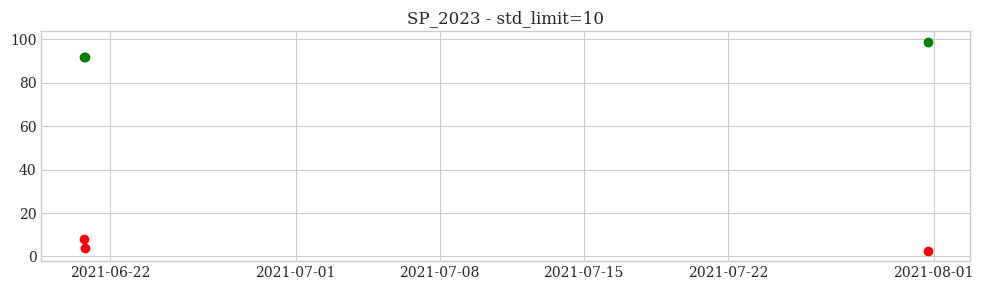

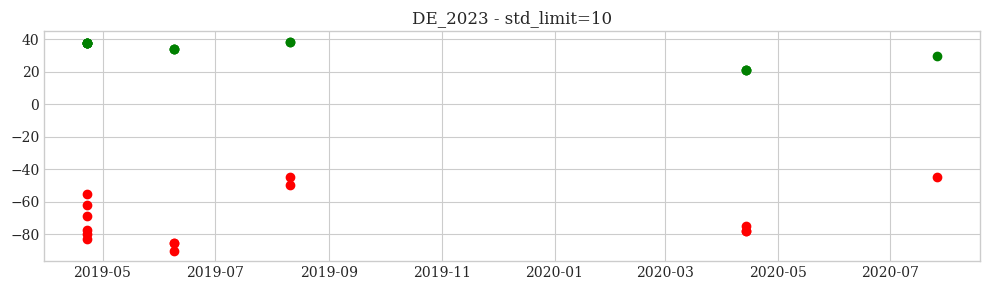

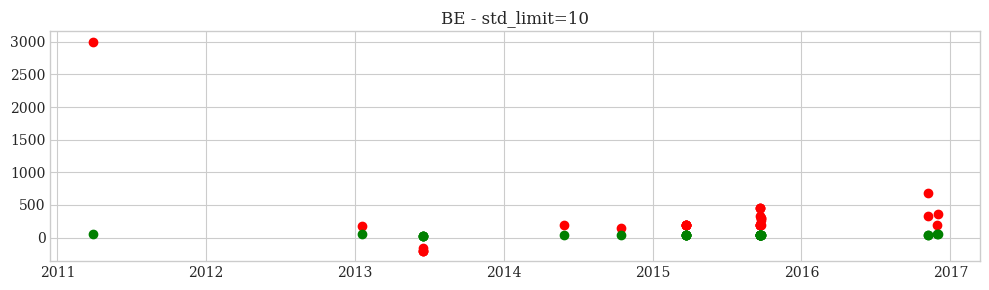

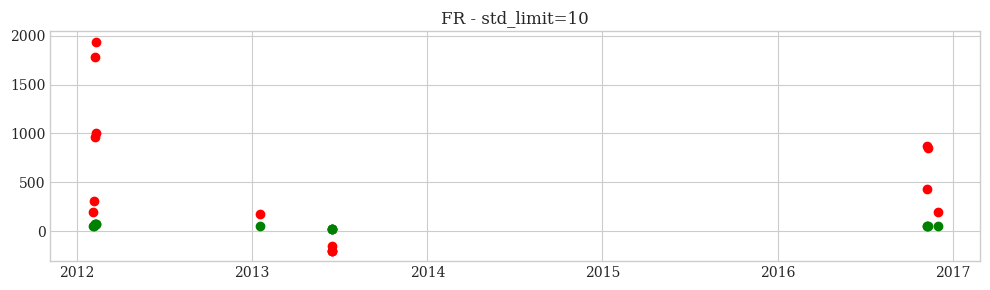

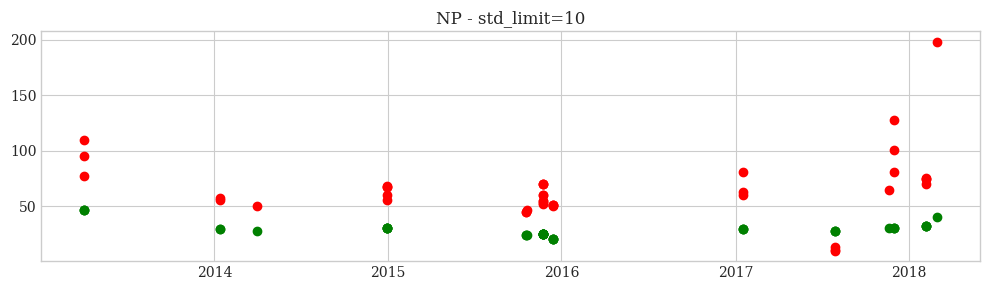

In [13]:
for name, dataset in dict_datastets.items():
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
#     ax.plot(dataset.Date, dataset.Price)
    ax.scatter(dataset[dataset.Price != dataset.Price_no_outliers].Date, dataset[dataset.Price != dataset.Price_no_outliers].Price, color='red')
#     ax.scatter(dataset[dataset.Price != dataset.Price_no_outliers].Date, dataset[dataset.Price != dataset.Price_no_outliers].Price_no_outliers, color='orange')
    ax.scatter(dataset[dataset.Price != dataset.Price_no_outliers].Date, dataset[dataset.Price != dataset.Price_no_outliers].Price_no_outliers_2, color='green')
    ax.title.set_text(f"{name.replace('.csv', '')} - std_limit=10")
    plt.tight_layout()
    plt.show()

In [17]:
dataset

,Date,Price,Exogenous 1,Exogenous 2,Simple Date,Price_no_outliers,Price_no_outliers_2
0,2013-01-01 00:00:00,31.05,42497.0,2798.0,2013-01-01,31.05,NaN
1,2013-01-01 01:00:00,30.47,41463.0,2417.0,2013-01-01,30.47,NaN
2,2013-01-01 02:00:00,28.92,40812.0,2036.0,2013-01-01,28.92,NaN
3,2013-01-01 03:00:00,27.88,40246.0,1706.0,2013-01-01,27.88,NaN
4,2013-01-01 04:00:00,26.96,40088.0,1427.0,2013-01-01,26.96,NaN
...,...,...,...,...,...,...,...
52411,2018-12-24 19:00:00,50.72,52591.0,2544.0,2018-12-24,50.72,NaN
52412,2018-12-24 20:00:00,49.86,51787.0,2785.0,2018-12-24,49.86,NaN
52413,2018-12-24 21:00:00,49.09,51488.0,2919.0,2018-12-24,49.09,NaN
52414,2018-12-24 22:00:00,49.02,50928.0,3119.0,2018-12-24,49.02,NaN


In [21]:
dict_datastets

{'SP_2023.csv':                      Date   Price  Exogenous 1  Exogenous 2 Simple Date  \
 0     2019-01-02 00:00:00   64.03      24914.0     5814.500  2019-01-02   
 1     2019-01-02 01:00:00   61.74      22758.0     6484.400  2019-01-02   
 2     2019-01-02 02:00:00   53.00      20772.0     6699.200  2019-01-02   
 3     2019-01-02 03:00:00   48.23      19690.0     6981.300  2019-01-02   
 4     2019-01-02 04:00:00   47.23      19176.0     7298.000  2019-01-02   
 ...                   ...     ...          ...          ...         ...   
 38659 2023-05-31 19:00:00   78.89      25595.5    11935.575  2023-05-31   
 38660 2023-05-31 20:00:00   85.00      26170.3     9183.775  2023-05-31   
 38661 2023-05-31 21:00:00  105.00      26918.3     5264.150  2023-05-31   
 38662 2023-05-31 22:00:00  119.06      27557.3     3179.625  2023-05-31   
 38663 2023-05-31 23:00:00  115.00      26061.5     2917.850  2023-05-31   
 
        Price_no_outliers  Price_no_outliers_2  
 0                  64

In [20]:
dataset

0         64.03
1         61.74
2         53.00
3         48.23
4         47.23
          ...  
38659     78.89
38660     85.00
38661    105.00
38662    119.06
38663    115.00
Name: Price, Length: 38661, dtype: float64

In [22]:
dict_datasets_2 = {}
for name, dataset in dict_datastets.items():
    dataset.loc[dataset.Price_no_outliers_2.isna(), 'Price_no_outliers_2'] = dataset.loc[dataset.Price_no_outliers_2.isna(), 'Price']
    dict_datasets_2[name] = dataset.drop(['Simple Date', 'Price_no_outliers'], axis = 1).rename(columns={'Price_no_outliers_2': 'Price_no_outliers'})

In [23]:
dict_datasets_2['SP_2023.csv']

,Date,Price,Exogenous 1,Exogenous 2,Price_no_outliers
0,2019-01-02 00:00:00,64.03,24914.0,5814.500,64.03
1,2019-01-02 01:00:00,61.74,22758.0,6484.400,61.74
2,2019-01-02 02:00:00,53.00,20772.0,6699.200,53.00
3,2019-01-02 03:00:00,48.23,19690.0,6981.300,48.23
4,2019-01-02 04:00:00,47.23,19176.0,7298.000,47.23
...,...,...,...,...,...
38659,2023-05-31 19:00:00,78.89,25595.5,11935.575,78.89
38660,2023-05-31 20:00:00,85.00,26170.3,9183.775,85.00
38661,2023-05-31 21:00:00,105.00,26918.3,5264.150,105.00
38662,2023-05-31 22:00:00,119.06,27557.3,3179.625,119.06


In [24]:
for name, dataset in dict_datasets_2.items():
    dataset.to_csv("Data//" + name.replace(".csv", "_no_outliers.csv"), index=False)